# Binary classification based on Logistic Regression with a quadratic regularization

## import library

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

## load data

In [814]:
fname_data_train    = 'assignment_10_data_train.csv'
fname_data_test     = 'assignment_10_data_test.csv'

data_train  = np.genfromtxt(fname_data_train, delimiter=',')
data_test   = np.genfromtxt(fname_data_test, delimiter=',')
dim_feature = 16

In [815]:
'''x_train = data_train[:,0]/data_train[:,0].max()
y_train = data_train[:,1]/data_train[:,1].max()
label_train = data_train[:,2]

x_test = data_test[:,0]/data_test[:,0].max()
y_test = data_test[:,1]/data_test[:,1].max()
label_test = data_test[:,2]

data_train = np.array((x_train, y_train, label_train))
data_test = np.array((x_test, y_test, label_test))
print(data_train[:,0].min(),data_train[:,0].max())
print(data_train[:,1].min(),data_train[:,1].max())
print(data_test[:,0].min(),data_test[:,1].max())
print(data_test[:,1].min(),data_test[:,1].max())'''

'x_train = data_train[:,0]/data_train[:,0].max()\ny_train = data_train[:,1]/data_train[:,1].max()\nlabel_train = data_train[:,2]\n\nx_test = data_test[:,0]/data_test[:,0].max()\ny_test = data_test[:,1]/data_test[:,1].max()\nlabel_test = data_test[:,2]\n\ndata_train = np.array((x_train, y_train, label_train))\ndata_test = np.array((x_test, y_test, label_test))\nprint(data_train[:,0].min(),data_train[:,0].max())\nprint(data_train[:,1].min(),data_train[:,1].max())\nprint(data_test[:,0].min(),data_test[:,1].max())\nprint(data_test[:,1].min(),data_test[:,1].max())'

## plot the data

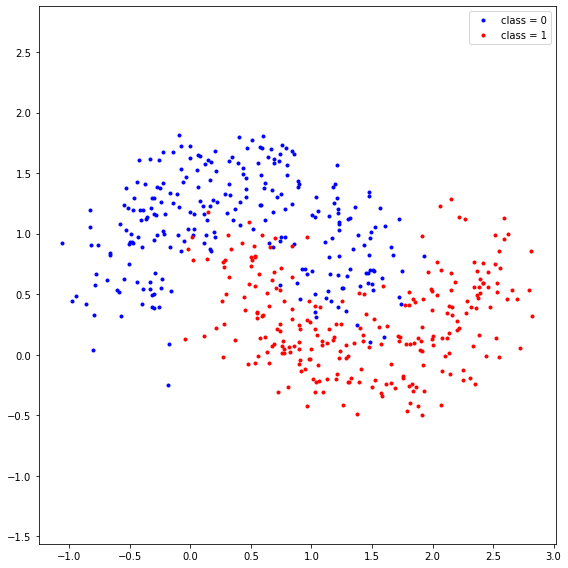

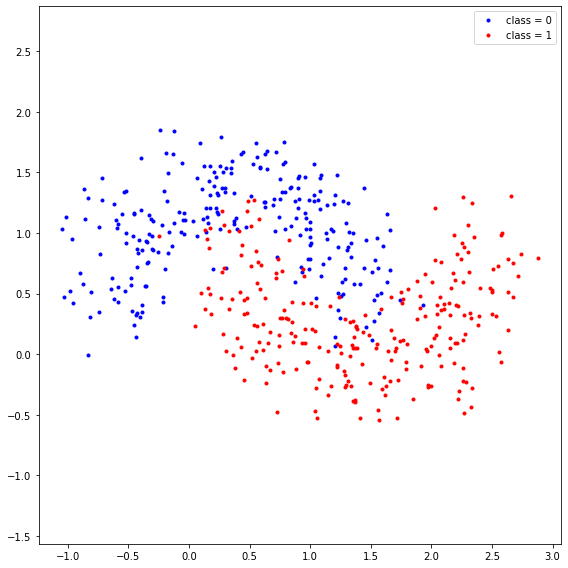

In [816]:
def plot_data1(data):
    
    plt.figure(figsize=(8,8))   # USE THIS VALUE for the size of the figure
    
    point_x = data[:,0]
    point_y = data[:,1]
    label   = data[:,2]
    num_data = point_x.shape[0]

    red_x = []
    red_y = []
    blue_x = []
    blue_y = []
    
    for i in range(point_x.shape[0]):
        if(label[i] == 0):
            blue_x.append(point_x[i])
            blue_y.append(point_y[i])
        else:
            red_x.append(point_x[i])
            red_y.append(point_y[i])
    
    plt.plot(blue_x, blue_y, '.', color = 'blue', label = "class = 0")
    plt.plot(red_x, red_y, '.', color = 'red', label = "class = 1")

    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()
    
plot_data1(data_train)
plot_data1(data_test)

## define feature function

In [762]:
def feature_function(x, y):
    
    num_data = x.shape[0]
    feature = np.zeros((num_data, 16))
    
    for i in range(num_data):
        feature[i,0] = 1
        feature[i,1] = x[i]
        feature[i,2] = x[i]**2
        feature[i,3] = x[i]**3
        feature[i,4] = x[i]**4
        feature[i,5] = x[i]**5
        feature[i,6] = x[i]**6
        feature[i,7] = x[i]**7
        feature[i,8] = x[i]**8
        feature[i,9] = x[i]**9
        feature[i,10] = x[i]**10
        feature[i,11] = x[i]**11
        feature[i,12] = x[i]**12
        feature[i,13] = x[i]**13
        feature[i,14] = x[i]**14
        feature[i,15] = y[i]
    
    return feature

In [763]:
def feature_function2(x, y):
    
    num_data = x.shape[0]
    feature = np.zeros((num_data, 7))
    
    for i in range(num_data):
        feature[i,0] = 1
        feature[i,1] = x[i]
        feature[i,2] = x[i]**2
        feature[i,3] = x[i]**3
        feature[i,4] = x[i]**4
        feature[i,5] = x[i]**5
        feature[i,6] = y[i]
    
    return feature

## define regression function based on the feature function

In [764]:
def regression_function(theta, feature):
    
    value = theta@feature.T
    
    return value

## define regularization function on the model parameters

In [765]:
def regularization_function(theta):
    
    value = theta.T@theta
    
    return value

## define sigmoid function

In [766]:
def logistic_function(x):
    
    z = 1 / (1 + np.exp(-x))
    
    return z

## define loss function where $\alpha$ is a weight for the quadratic regularization term (Note that you need to add a small number (np.finfo(float).eps) inside logarithm function in order to avoid $\log( 0 )$)

In [767]:
def compute_loss_feature(theta, feature, label, alpha):

    value = regression_function(theta, feature)
    logistic = logistic_function(value)
    r = (-label*np.log(logistic)) - (1-label)*np.log(1-logistic)
    
    loss = 0
    
    for i in range(label.shape[0]):
        r = (-label[i]*np.log(logistic[i]) - (1-label[i])*np.log(1-logistic[i]))
        if(np.isnan(r)==False): loss = loss + r
    
    loss = (1/label.shape[0])*loss + (alpha/2)*(1/theta.shape[0])*regularization_function(theta)
    
    #loss = r.sum(axis=0)
    #loss = (1/label.shape[0])*loss + (alpha/2)*(1/theta.shape[0])*regularization_function(theta)
    #loss = loss + (alpha/2)*regularization_function(theta)
    
    return loss

In [768]:
x = np.array((1,2,3,4,5))
y = np.array((1,2,1,0,1))
l = np.array((1,0,1,0,0))
x = (x-np.mean(x))/np.std(x)
y = (y-np.mean(y))/np.std(y)
f = feature_function(x/x.max(),y/y.max())

print(f)

t = np.array((0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0))
print(compute_loss_feature(t,f,l,1))

[[ 1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
   1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
   1.00000000e+00 -1.00000000e+00  1.00000000e+00 -1.00000000e+00
   1.00000000e+00 -1.00000000e+00  1.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00 -5.00000000e-01  2.50000000e-01 -1.25000000e-01
   6.25000000e-02 -3.12500000e-02  1.56250000e-02 -7.81250000e-03
   3.90625000e-03 -1.95312500e-03  9.76562500e-04 -4.88281250e-04
   2.44140625e-04 -1.22070312e-04  6.10351562e-05  1.00000000e+00]
 [ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00]
 [ 1.00000000e+00  5.00000000e-01  2.50000000e-01  1.25000000e-01
   6.25000000e-02  3.12500000e-02  1.56250000e-02  7.81250000e-03
   3.90625000e-03  1.95312500e-03  9.76562500e-04  4.88281250e-04
   2.44

## define gradient vector for the model parameters with the quadratic regularization term whose weight is $\alpha$

In [769]:
def compute_gradient_feature(theta, feature, label, alpha):
    
    value = regression_function(theta, feature)
    
    logistic = logistic_function(value)
        
    
    gradient = np.zeros((label.shape[0],feature.shape[1]))
    
    r = logistic-label
    gradient = (r * feature.T).sum(axis = 1)
    gradient = (1/label.shape[0]) * gradient
    
    gradient = gradient + ((alpha*theta)/theta.shape[0])
    
    return gradient

## compute the accuracy

In [770]:
def compute_accuracy(theta, feature, label):
    
    value = regression_function(theta, feature)
    
    logistic = logistic_function(value)
    
    for i in range(value.shape[0]):
        t = logistic_function(value[i])
        if(t >= 0.5): logistic[i] = 1
        else: logistic[i] = 0
        
        
    accuracy = (1/label.shape[0])*(1-abs(logistic-label)).sum()
    
    return accuracy

## gradient descent for the model parameters $\theta$

In [799]:
num_iteration   = 30000         
learning_rate   = 0.5          
alpha = 0

#theta           = np.array((2.16046874, 5.21812891, -11.17717528, 0.57854907, 3.8749419, 5.40585483, 5.26839072, 4.67023552, 3.90982794, 3.19105768, 2.5664332, 2.05107486, 1.63589016, 1.3062552, 1.04637118, -7.82650023))
theta           = np.array((0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0))

#x_train = (data_train[:,0]-np.mean(data_train[:,0]))/np.std(data_train[:,0])
#y_train = (data_train[:,1]-np.mean(data_train[:,1]))/np.std(data_train[:,1])
x_train = data_train[:,0]
y_train = data_train[:,1]
feature_train = feature_function(x_train/x_train.max(), y_train/y_train.max())
label_train = data_train[:,2]

#x_test = (data_test[:,0]-np.mean(data_test[:,0]))/np.std(data_test[:,0])
#y_test = (data_test[:,1]-np.mean(data_test[:,1]))/np.std(data_test[:,1])
x_test = data_test[:,0]
y_test = data_test[:,1]
feature_test = feature_function(x_test/x_test.max(), y_test/y_test.max())
label_test = data_test[:,2]
dim_feature = 16
print(feature_test.shape)

(500, 16)


In [800]:
theta_iteration             = np.zeros((num_iteration, dim_feature))
loss_iteration_train        = np.zeros(num_iteration)
loss_iteration_test         = np.zeros(num_iteration)
accuracy_iteration_train    = np.zeros(num_iteration)
accuracy_iteration_test     = np.zeros(num_iteration)

In [801]:
for i in range(num_iteration):
    
    theta = theta - learning_rate*compute_gradient_feature(theta, feature_train, label_train, alpha)
    
    loss_train = compute_loss_feature(theta, feature_train, label_train, alpha)
    accuracy_train = compute_accuracy(theta, feature_train, label_train)
    
    loss_test = compute_loss_feature(theta, feature_test, label_test, alpha)
    accuracy_test = compute_accuracy(theta, feature_test, label_test)
    
    theta_iteration[i] = theta
    loss_iteration_train[i] = loss_train
    accuracy_iteration_train[i] = accuracy_train
    loss_iteration_test[i] = loss_test
    accuracy_iteration_test[i] = accuracy_test

    print("[%4d] loss(train) = %5.5f, accuracy(train) = %5.5f, loss(test) = %5.5f, accuracy(test) = %5.5f" % (i, loss_train, accuracy_train, loss_test, accuracy_test))
    print(theta)


[   0] loss(train) = 0.67764, accuracy(train) = 0.81400, loss(test) = 0.67864, accuracy(test) = 0.81800
[ 0.          0.04556732  0.02954035  0.02497558  0.02012142  0.0167867
  0.01409992  0.01201926  0.01035743  0.00902601  0.0079448   0.00705902
  0.00632601  0.00571408  0.00519886 -0.05379928]
[   1] loss(train) = 0.66324, accuracy(train) = 0.81600, loss(test) = 0.66512, accuracy(test) = 0.82000
[-0.00132083  0.08903933  0.05750583  0.04865191  0.03916828  0.0326599
  0.02741088  0.02334644  0.02010029  0.01750034  0.0153898   0.01366153
  0.01223205  0.01103928  0.01003557 -0.10696006]
[   2] loss(train) = 0.64982, accuracy(train) = 0.81400, loss(test) = 0.65249, accuracy(test) = 0.82200
[-0.00362585  0.13060539  0.08403264  0.07113383  0.05722582  0.04769116
  0.03999437  0.03403537  0.02927635  0.02546593  0.02237392  0.01984314
  0.01775091  0.01600605  0.0145385  -0.15939232]
[   3] loss(train) = 0.63729, accuracy(train) = 0.81000, loss(test) = 0.64067, accuracy(test) = 0.8300

[  31] loss(train) = 0.46393, accuracy(train) = 0.82800, loss(test) = 0.47457, accuracy(test) = 0.83200
[-0.05330942  0.90335061  0.52873215  0.45022701  0.35714759  0.29496008
  0.24380669  0.20424447  0.17263952  0.14746967  0.12718638  0.11073237
  0.09726247  0.08614592  0.07689569 -1.33072242]
[  32] loss(train) = 0.46087, accuracy(train) = 0.82800, loss(test) = 0.47161, accuracy(test) = 0.83200
[-0.05218529  0.92131845  0.53777599  0.45807739  0.36331338  0.30004013
  0.24795407  0.20766445  0.17547323  0.14983704  0.12917969  0.11242483
  0.09871124  0.08739602  0.07798264 -1.36165762]
[  33] loss(train) = 0.45792, accuracy(train) = 0.82800, loss(test) = 0.46875, accuracy(test) = 0.83200
[-0.05093659  0.93891585  0.54656449  0.46572236  0.3693203   0.30499275
  0.25199781  0.21099851  0.17823469  0.15214283  0.13111993  0.11407108
  0.10011941  0.08861015  0.07903747 -1.3921473 ]
[  34] loss(train) = 0.45507, accuracy(train) = 0.82800, loss(test) = 0.46598, accuracy(test) = 0.83

[  75] loss(train) = 0.38760, accuracy(train) = 0.83000, loss(test) = 0.40057, accuracy(test) = 0.84400
[ 0.05696909  1.44922971  0.7635983   0.66750851  0.53133444  0.44187527
  0.36490938  0.30450469  0.25560443  0.21647968  0.18490989  0.15935156
  0.13850838  0.1213955   0.1072401  -2.39224068]
[  76] loss(train) = 0.38665, accuracy(train) = 0.83000, loss(test) = 0.39965, accuracy(test) = 0.84400
[ 0.06010842  1.45761523  0.76635113  0.67046563  0.53382438  0.44407586
  0.36676406  0.30605928  0.25689632  0.21755382  0.18580498  0.16010101
  0.13913945  0.12193027  0.10769625 -2.41130037]
[  77] loss(train) = 0.38571, accuracy(train) = 0.83000, loss(test) = 0.39874, accuracy(test) = 0.84400
[ 0.06325583  1.46587858  0.76902832  0.67336629  0.53627343  0.44624535
  0.36859462  0.30759471  0.25817271  0.21861522  0.18668946  0.16084151
  0.1397629   0.12245848  0.10814671 -2.43019911]
[  78] loss(train) = 0.38478, accuracy(train) = 0.83000, loss(test) = 0.39786, accuracy(test) = 0.84

[ 116] loss(train) = 0.35937, accuracy(train) = 0.83800, loss(test) = 0.37356, accuracy(test) = 0.84800
[ 0.18770115  1.71372531  0.82822154  0.75315818  0.60789247  0.51282705
  0.42610865  0.35651577  0.29913657  0.25279951  0.21520321  0.18469794
  0.15981232  0.13940221  0.12255216 -3.06536522]
[ 117] loss(train) = 0.35888, accuracy(train) = 0.83800, loss(test) = 0.37309, accuracy(test) = 0.84800
[ 0.19086022  1.71858661  0.82884904  0.75455601  0.60926913  0.51419014
  0.42732029  0.35756359  0.30002167  0.2535415   0.21582322  0.18521671
  0.16024779  0.13976951  0.12286364 -3.07951213]
[ 118] loss(train) = 0.35840, accuracy(train) = 0.84000, loss(test) = 0.37264, accuracy(test) = 0.84800
[ 0.19401535  1.72338935  0.82944231  0.75592924  0.61062853  0.51554042
  0.42852219  0.35860383  0.30090073  0.25427859  0.21643921  0.18573212
  0.16068044  0.14013439  0.12317306 -3.09357065]
[ 119] loss(train) = 0.35792, accuracy(train) = 0.84000, loss(test) = 0.37219, accuracy(test) = 0.84

[ 144] loss(train) = 0.34783, accuracy(train) = 0.84600, loss(test) = 0.36272, accuracy(test) = 0.84800
[ 0.274402    1.83037943  0.83452711  0.78425048  0.64081684  0.54683196
  0.45688277  0.38339989  0.32196892  0.27199721  0.23126774  0.19814491
  0.17109775  0.14891435  0.130611   -3.43121097]
[ 145] loss(train) = 0.34749, accuracy(train) = 0.84600, loss(test) = 0.36240, accuracy(test) = 0.84800
[ 0.27742299  1.8338961   0.83438035  0.78509699  0.64180924  0.54791109
  0.45787965  0.38428061  0.32272139  0.27263198  0.23179976  0.19859049
  0.17147166  0.14922931  0.13087759 -3.44323095]
[ 146] loss(train) = 0.34715, accuracy(train) = 0.84600, loss(test) = 0.36208, accuracy(test) = 0.84800
[ 0.28043834  1.83737421  0.83421178  0.78592814  0.64279102  0.54898241
  0.45887066  0.38515678  0.32347025  0.27326385  0.23232941  0.19903411
  0.17184391  0.14954287  0.13114298 -3.45518628]
[ 147] loss(train) = 0.34681, accuracy(train) = 0.84600, loss(test) = 0.36177, accuracy(test) = 0.84

[ 176] loss(train) = 0.33847, accuracy(train) = 0.85200, loss(test) = 0.35406, accuracy(test) = 0.85400
[ 0.36817476  1.92615256  0.8204447   0.80477143  0.6680536   0.57805233
  0.48629533  0.40965765  0.34452639  0.29108452  0.24729029  0.21157252
  0.18236528  0.15840155  0.13863545 -3.78668799]
[ 177] loss(train) = 0.33822, accuracy(train) = 0.85200, loss(test) = 0.35384, accuracy(test) = 0.85400
[ 0.37100645  1.92866173  0.81973685  0.80522672  0.66877737  0.57893494
  0.48714475  0.41042433  0.3451888   0.29164679  0.24776304  0.21196896
  0.18269796  0.15868156  0.13887211 -3.79691836]
[ 178] loss(train) = 0.33798, accuracy(train) = 0.85200, loss(test) = 0.35361, accuracy(test) = 0.85400
[ 0.37383209  1.93114572  0.81901526  0.80567255  0.66949469  0.57981285
  0.48799066  0.41118831  0.34584907  0.29220735  0.24823438  0.21236424
  0.18302966  0.15896074  0.13910808 -3.80710074]
[ 179] loss(train) = 0.33773, accuracy(train) = 0.85200, loss(test) = 0.35339, accuracy(test) = 0.85

[ 209] loss(train) = 0.33139, accuracy(train) = 0.85200, loss(test) = 0.34764, accuracy(test) = 0.85400
[ 0.45843352  1.997214    0.79074299  0.81545856  0.68899594  0.60504232
  0.51273167  0.43372927  0.3654178   0.30886177  0.26225589  0.22412918
  0.19290266  0.16726792  0.14612577 -4.10096841]
[ 210] loss(train) = 0.33120, accuracy(train) = 0.85200, loss(test) = 0.34748, accuracy(test) = 0.85400
[ 0.46106684  1.99903663  0.7896665   0.81566274  0.68954977  0.60580172
  0.51348918  0.43442516  0.36602446  0.30937925  0.26269206  0.22449533
  0.19320993  0.16752639  0.14634401 -4.10980372]
[ 211] loss(train) = 0.33102, accuracy(train) = 0.85200, loss(test) = 0.34731, accuracy(test) = 0.85400
[ 0.46369425  2.00084241  0.78858116  0.81586097  0.69009961  0.60655823
  0.51424455  0.43511939  0.36662981  0.30989568  0.26312738  0.22486077
  0.19351662  0.16778435  0.14656182 -4.11860205]
[ 212] loss(train) = 0.33084, accuracy(train) = 0.85200, loss(test) = 0.34715, accuracy(test) = 0.85

[ 239] loss(train) = 0.32642, accuracy(train) = 0.85200, loss(test) = 0.34322, accuracy(test) = 0.85400
[ 0.53489911  2.04529218  0.75501762  0.81929622  0.70408147  0.6267225
  0.53463819  0.45397596  0.38312158  0.32398771  0.2750154   0.23484357
  0.20189414  0.17482953  0.15250807 -4.35095754]
[ 240] loss(train) = 0.32628, accuracy(train) = 0.85200, loss(test) = 0.34309, accuracy(test) = 0.85400
[ 0.53735923  2.04668488  0.75371908  0.81935296  0.70453695  0.62741114
  0.53534313  0.45463141  0.3836964   0.3244796   0.27543065  0.23519236
  0.20218683  0.17507562  0.15271569 -4.35878937]
[ 241] loss(train) = 0.32613, accuracy(train) = 0.85200, loss(test) = 0.34296, accuracy(test) = 0.85400
[ 0.53981373  2.04806562  0.75241449  0.81940575  0.70498981  0.6280979
  0.53604668  0.45528579  0.38427038  0.32497081  0.27584534  0.23554069
  0.20247913  0.17532137  0.15292303 -4.36659113]
[ 242] loss(train) = 0.32598, accuracy(train) = 0.85200, loss(test) = 0.34283, accuracy(test) = 0.8540

[ 273] loss(train) = 0.32195, accuracy(train) = 0.85400, loss(test) = 0.33931, accuracy(test) = 0.85400
[ 0.61546367  2.08664988  0.70788312  0.81929354  0.71829596  0.64922689
  0.55793189  0.47574256  0.40225628  0.34038207  0.28886327  0.24647707
  0.21165559  0.18303434  0.15942771 -4.60145451]
[ 274] loss(train) = 0.32183, accuracy(train) = 0.85400, loss(test) = 0.33921, accuracy(test) = 0.85400
[ 0.61773949  2.08770092  0.70641592  0.81924174  0.71868019  0.64986466
  0.55859911  0.47636898  0.40280819  0.34085547  0.28926333  0.2468132
  0.21193759  0.1832713   0.15962746 -4.60836276]
[ 275] loss(train) = 0.32172, accuracy(train) = 0.85400, loss(test) = 0.33911, accuracy(test) = 0.85400
[ 0.62001009  2.0887437   0.70494476  0.81918745  0.71906281  0.65050128
  0.55926549  0.47699475  0.40335958  0.34132844  0.28966305  0.24714904
  0.21221935  0.18350805  0.15982704 -4.61524661]
[ 276] loss(train) = 0.32160, accuracy(train) = 0.85400, loss(test) = 0.33901, accuracy(test) = 0.854

[ 304] loss(train) = 0.31864, accuracy(train) = 0.85200, loss(test) = 0.33646, accuracy(test) = 0.85200
[ 0.68364344  2.11574985  0.66075942  0.81666807  0.72954905  0.668531
  0.57826981  0.49489438  0.41915318  0.35488506  0.30112269  0.25677736
  0.22029581  0.19029251  0.16554422 -4.80485818]
[ 305] loss(train) = 0.31855, accuracy(train) = 0.85200, loss(test) = 0.33638, accuracy(test) = 0.85200
[ 0.68576319  2.11658104  0.65918965  0.81655299  0.72989258  0.66913994
  0.57891566  0.49550427  0.41969194  0.35534776  0.30151389  0.25710603
  0.22057146  0.190524    0.16573922 -4.81107017]
[ 306] loss(train) = 0.31845, accuracy(train) = 0.85200, loss(test) = 0.33630, accuracy(test) = 0.85200
[ 0.68787811  2.11740626  0.65761719  0.81643628  0.73023508  0.66974815
  0.57956096  0.49611374  0.42023037  0.35581018  0.30190486  0.25743451
  0.22084694  0.19075533  0.16593409 -4.8172616 ]
[ 307] loss(train) = 0.31835, accuracy(train) = 0.85200, loss(test) = 0.33622, accuracy(test) = 0.8520

[ 334] loss(train) = 0.31596, accuracy(train) = 0.85400, loss(test) = 0.33420, accuracy(test) = 0.85200
[ 0.74517636  2.13832084  0.61262182  0.81259836  0.73946619  0.68652578
  0.59744163  0.51303243  0.43518852  0.3686611   0.3127706   0.26656246
  0.22850051  0.19718073  0.17134476 -4.98268992]
[ 335] loss(train) = 0.31588, accuracy(train) = 0.85400, loss(test) = 0.33413, accuracy(test) = 0.85400
[ 0.74715586  2.13899718  0.61098446  0.81244375  0.73978494  0.68711731
  0.5980745   0.51363218  0.43571911  0.36911705  0.31315612  0.26688628
  0.22877197  0.19740856  0.17153654 -4.9883288 ]
[ 336] loss(train) = 0.31580, accuracy(train) = 0.85400, loss(test) = 0.33406, accuracy(test) = 0.85400
[ 0.74913086  2.13966914  0.60934527  0.8122881   0.74010305  0.68770839
  0.59870704  0.51423167  0.43624948  0.36957282  0.31354148  0.26720997
  0.2290433   0.19763628  0.17172823 -4.99395001]
[ 337] loss(train) = 0.31572, accuracy(train) = 0.85400, loss(test) = 0.33399, accuracy(test) = 0.85

[ 367] loss(train) = 0.31348, accuracy(train) = 0.85400, loss(test) = 0.33212, accuracy(test) = 0.86000
[ 0.80818547  2.15855107  0.55774067  0.80703069  0.74970197  0.70584902
  0.61817793  0.53270617  0.45260077  0.38362542  0.32542222  0.27718706
  0.23740438  0.20465097  0.17763064 -5.15989109]
[ 368] loss(train) = 0.31341, accuracy(train) = 0.85400, loss(test) = 0.33207, accuracy(test) = 0.86000
[ 0.81002237  2.15910398  0.55605404  0.8068495   0.75000469  0.70642939
  0.61880237  0.53329918  0.45312578  0.38407663  0.32580364  0.27750729
  0.23767266  0.20487597  0.17781989 -5.16498921]
[ 369] loss(train) = 0.31334, accuracy(train) = 0.85400, loss(test) = 0.33201, accuracy(test) = 0.86000
[ 0.81185513  2.15965375  0.55436625  0.80666771  0.75030707  0.70700953
  0.61942663  0.53389204  0.45365065  0.38452773  0.32618497  0.27782744
  0.23794086  0.2051009   0.17800907 -5.1700722 ]
[ 370] loss(train) = 0.31327, accuracy(train) = 0.85400, loss(test) = 0.33195, accuracy(test) = 0.86

[ 394] loss(train) = 0.31172, accuracy(train) = 0.85400, loss(test) = 0.33068, accuracy(test) = 0.85800
[ 0.85635985  2.17246832  0.51183547  0.80196008  0.75777344  0.72144852
  0.63498313  0.54867191  0.46673657  0.3957733   0.33568952  0.28580528
  0.24462256  0.21070285  0.18271927 -5.29241937]
[ 395] loss(train) = 0.31166, accuracy(train) = 0.85400, loss(test) = 0.33063, accuracy(test) = 0.85800
[ 0.85808867  2.17294698  0.51012248  0.80176635  0.75806909  0.722024
  0.63560375  0.5492617   0.46725877  0.39622201  0.33606869  0.28612347
  0.24488897  0.21092614  0.18290696 -5.29713145]
[ 396] loss(train) = 0.31160, accuracy(train) = 0.85400, loss(test) = 0.33058, accuracy(test) = 0.85800
[ 0.85981362  2.17342326  0.5084087   0.80157227  0.75836455  0.72259936
  0.63622427  0.54985141  0.46778089  0.39667064  0.33644779  0.28644159
  0.24515533  0.21114939  0.1830946  -5.30183008]
[ 397] loss(train) = 0.31154, accuracy(train) = 0.85400, loss(test) = 0.33053, accuracy(test) = 0.8580

[ 425] loss(train) = 0.30996, accuracy(train) = 0.85400, loss(test) = 0.32925, accuracy(test) = 0.85800
[ 0.90820147  2.18630354  0.45841869  0.79582864  0.76687461  0.73924464
  0.6541853   0.56692158  0.48289269  0.40965285  0.34741496  0.29564194
  0.25285602  0.21760121  0.18851541 -5.43248516]
[ 426] loss(train) = 0.30991, accuracy(train) = 0.85400, loss(test) = 0.32921, accuracy(test) = 0.85800
[ 0.90981509  2.18671881  0.45668649  0.79562763  0.7671667   0.73981768
  0.65480379  0.56750937  0.48341295  0.41009968  0.34779232  0.29595841
  0.25312082  0.21782298  0.18870167 -5.43680527]
[ 427] loss(train) = 0.30985, accuracy(train) = 0.85400, loss(test) = 0.32917, accuracy(test) = 0.85800
[ 0.91142515  2.18713234  0.45495384  0.79542648  0.76745874  0.74039069
  0.65542224  0.5680971   0.48393315  0.41054646  0.34816964  0.29627483
  0.25338557  0.21804471  0.18888789 -5.44111355]
[ 428] loss(train) = 0.30980, accuracy(train) = 0.85400, loss(test) = 0.32912, accuracy(test) = 0.85

[ 458] loss(train) = 0.30833, accuracy(train) = 0.85200, loss(test) = 0.32794, accuracy(test) = 0.85800
[ 0.95961803  2.19918682  0.40105663  0.78915056  0.77650321  0.75814741
  0.67458338  0.58630166  0.50004106  0.42437633  0.3598453   0.30606262
  0.26157177  0.22489787  0.19464113 -5.5690449 ]
[ 459] loss(train) = 0.30828, accuracy(train) = 0.85200, loss(test) = 0.32790, accuracy(test) = 0.85800
[ 0.96111875  2.19955369  0.39931334  0.78894759  0.77679516  0.75872032
  0.67520135  0.58688857  0.5005602   0.42482188  0.36022132  0.30637773
  0.26183521  0.22511832  0.19482612 -5.57299784]
[ 460] loss(train) = 0.30823, accuracy(train) = 0.85200, loss(test) = 0.32787, accuracy(test) = 0.85800
[ 0.96261619  2.19991934  0.39756983  0.78874464  0.77708716  0.75929326
  0.67581933  0.58747547  0.50107931  0.42526741  0.36059731  0.30669279
  0.26209861  0.22533873  0.19501107 -5.57694035]
[ 461] loss(train) = 0.30819, accuracy(train) = 0.85200, loss(test) = 0.32783, accuracy(test) = 0.85

[ 490] loss(train) = 0.30694, accuracy(train) = 0.85400, loss(test) = 0.32684, accuracy(test) = 0.85800
[ 1.00605856  2.21038277  0.34519093  0.78267789  0.7858751   0.77649936
  0.69436477  0.60507978  0.51664393  0.43862076  0.37186208  0.31612874
  0.26998415  0.23193464  0.20054358 -5.69055867]
[ 491] loss(train) = 0.30689, accuracy(train) = 0.85400, loss(test) = 0.32681, accuracy(test) = 0.85800
[ 1.00745862  2.21071654  0.34344336  0.78247688  0.78616925  0.77707368
  0.69498328  0.60566658  0.51716252  0.43906549  0.37223712  0.31644276
  0.27024647  0.23215397  0.20072747 -5.69419665]
[ 492] loss(train) = 0.30685, accuracy(train) = 0.85400, loss(test) = 0.32677, accuracy(test) = 0.85800
[ 1.00885566  2.21104945  0.34169573  0.78227597  0.7864635   0.77764806
  0.69560182  0.60625339  0.5176811   0.43951021  0.37261212  0.31675675
  0.27050876  0.23237327  0.20091134 -5.69782538]
[ 493] loss(train) = 0.30681, accuracy(train) = 0.85400, loss(test) = 0.32674, accuracy(test) = 0.85

[ 523] loss(train) = 0.30567, accuracy(train) = 0.85400, loss(test) = 0.32584, accuracy(test) = 0.86200
[ 1.05071098  2.22099312  0.28751402  0.77611188  0.79563866  0.7954877
  0.71479277  0.62444839  0.53375252  0.45328646  0.38422397  0.32647531
  0.27862359  0.23915511  0.20659478 -5.80589435]
[ 524] loss(train) = 0.30563, accuracy(train) = 0.85200, loss(test) = 0.32581, accuracy(test) = 0.86200
[ 1.05201559  2.22130319  0.28576667  0.77591543  0.79593654  0.79606438
  0.71541243  0.62503549  0.53427083  0.45373055  0.38459813  0.32678834
  0.27888485  0.23937336  0.2067776  -5.80924317]
[ 525] loss(train) = 0.30559, accuracy(train) = 0.85200, loss(test) = 0.32578, accuracy(test) = 0.86200
[ 1.05331744  2.22161268  0.28401939  0.77571915  0.79623455  0.79664113
  0.71603212  0.6256226   0.53478914  0.45417463  0.38497226  0.32710133
  0.27914608  0.23959157  0.20696038 -5.81258374]
[ 526] loss(train) = 0.30556, accuracy(train) = 0.85200, loss(test) = 0.32576, accuracy(test) = 0.862

[ 1.08989837  2.23036342  0.23338795  0.77010585  0.80493573  0.81340358
  0.73402161  0.64265472  0.54981757  0.46704501  0.39581115  0.3361652
  0.28670774  0.24590559  0.21224708 -5.90598973]
[ 555] loss(train) = 0.30457, accuracy(train) = 0.85200, loss(test) = 0.32498, accuracy(test) = 0.86400
[ 1.09112041  2.23065838  0.23164379  0.76991518  0.80523788  0.8139829
  0.73464259  0.64324224  0.55033571  0.46748855  0.39618452  0.3364773
  0.286968    0.24612282  0.21242889 -5.909095  ]
[ 556] loss(train) = 0.30453, accuracy(train) = 0.85200, loss(test) = 0.32496, accuracy(test) = 0.86400
[ 1.0923399   2.23095295  0.22989977  0.76972471  0.80554018  0.8145623
  0.73526362  0.64382978  0.55085384  0.46793207  0.39655787  0.33678937
  0.28722824  0.24634002  0.21261067 -5.91219281]
[ 557] loss(train) = 0.30450, accuracy(train) = 0.85200, loss(test) = 0.32493, accuracy(test) = 0.86400
[ 1.09355683  2.23124712  0.22815588  0.76953444  0.80584263  0.8151418
  0.73588468  0.64441733  0.5513

[ 588] loss(train) = 0.30355, accuracy(train) = 0.85200, loss(test) = 0.32419, accuracy(test) = 0.86400
[ 1.13005224  2.24020028  0.17417542  0.76374113  0.8152924   0.83315076
  0.75515982  0.66263834  0.56743091  0.48211487  0.40849109  0.34675944
  0.29553845  0.2532728   0.21841012 -6.00752968]
[ 589] loss(train) = 0.30352, accuracy(train) = 0.85200, loss(test) = 0.32417, accuracy(test) = 0.86400
[ 1.13119095  2.24048452  0.17243697  0.76355773  0.81559965  0.83373314
  0.7557823   0.66322632  0.56794883  0.48255776  0.40886356  0.34707048
  0.2957976   0.25348889  0.2185908  -6.01039462]
[ 590] loss(train) = 0.30349, accuracy(train) = 0.85200, loss(test) = 0.32415, accuracy(test) = 0.86400
[ 1.13232731  2.24076852  0.17069872  0.76337457  0.81590705  0.83431561
  0.75640483  0.66381432  0.56846675  0.48300063  0.409236    0.3473815
  0.29605671  0.25370495  0.21877145 -6.01325288]
[ 591] loss(train) = 0.30346, accuracy(train) = 0.85200, loss(test) = 0.32413, accuracy(test) = 0.864

[ 626] loss(train) = 0.30249, accuracy(train) = 0.85400, loss(test) = 0.32338, accuracy(test) = 0.86400
[ 1.17172471  2.25086201  0.10826114  0.75693177  0.82707532  0.85534371
  0.77884352  0.68498927  0.58710536  0.49892956  0.42262452  0.35855613
  0.30536152  0.26145953  0.22525166 -6.11186731]
[ 627] loss(train) = 0.30247, accuracy(train) = 0.85400, loss(test) = 0.32336, accuracy(test) = 0.86400
[ 1.17277842  2.25113951  0.10653086  0.75675706  0.82738837  0.85592944
  0.77946755  0.68557762  0.5876229   0.49937161  0.42299586  0.35886591
  0.30561933  0.26167427  0.22543102 -6.11449214]
[ 628] loss(train) = 0.30244, accuracy(train) = 0.85400, loss(test) = 0.32334, accuracy(test) = 0.86400
[ 1.17383     2.2514169   0.10480082  0.75658257  0.82770157  0.85651525
  0.78009163  0.68616599  0.58814042  0.49981362  0.42336718  0.35917565
  0.3058771   0.26188898  0.22561034 -6.11711102]
[ 629] loss(train) = 0.30241, accuracy(train) = 0.85400, loss(test) = 0.32332, accuracy(test) = 0.86

[ 658] loss(train) = 0.30169, accuracy(train) = 0.85400, loss(test) = 0.32276, accuracy(test) = 0.86400
[ 1.20441363  2.25969592  0.05301107  0.75145569  0.83716702  0.87412826
  0.79883031  0.70381915  0.60365945  0.51306207  0.43449135  0.36845111
  0.31359281  0.26831273  0.23097294 -6.19299443]
[ 659] loss(train) = 0.30166, accuracy(train) = 0.85400, loss(test) = 0.32274, accuracy(test) = 0.86400
[ 1.2054018   2.25997085  0.05128856  0.75128838  0.83748482  0.87471661
  0.79945545  0.70440763  0.6041765   0.51350325  0.43486163  0.36875971
  0.31384941  0.26852627  0.23115112 -6.1954372 ]
[ 660] loss(train) = 0.30164, accuracy(train) = 0.85400, loss(test) = 0.32273, accuracy(test) = 0.86400
[ 1.20638802  2.26024573  0.04956629  0.75112129  0.83780276  0.87530503
  0.80008062  0.70499612  0.60469353  0.51394441  0.43523188  0.36906828
  0.31410597  0.26873976  0.23132926 -6.19787455]
[ 661] loss(train) = 0.30162, accuracy(train) = 0.85400, loss(test) = 0.32271, accuracy(test) = 0.86

[ 1.23415524e+00  2.26820610e+00 -2.68548507e-04  7.46375151e-01
  8.47085127e-01  8.92402160e-01  8.18222946e-01  7.22061647e-01
  6.19679008e-01  5.26724842e-01  4.45953185e-01  3.77999735e-01
  3.21528779e-01  2.74913990e-01  2.36478776e-01 -6.26626812e+00]
[ 690] loss(train) = 0.30095, accuracy(train) = 0.85600, loss(test) = 0.32219, accuracy(test) = 0.86400
[ 1.23508473e+00  2.26848047e+00 -1.98312313e-03  7.46214887e-01
  8.47407303e-01  8.92992802e-01  8.18848934e-01  7.22650063e-01
  6.20195429e-01  5.27165068e-01  4.46322322e-01  3.78307115e-01
  3.21784126e-01  2.75126292e-01  2.36655764e-01 -6.26854985e+00]
[ 691] loss(train) = 0.30093, accuracy(train) = 0.85600, loss(test) = 0.32218, accuracy(test) = 0.86400
[ 1.23601241e+00  2.26875485e+00 -3.69743730e-03  7.46054846e-01
  8.47729615e-01  8.93583514e-01  8.19474945e-01  7.23238474e-01
  6.20711826e-01  5.27605262e-01  4.46691420e-01  3.78614453e-01
  3.22039432e-01  2.75338554e-01  2.36832713e-01 -6.27082662e+00]
[ 692] lo

[ 720] loss(train) = 0.30030, accuracy(train) = 0.85600, loss(test) = 0.32170, accuracy(test) = 0.86400
[ 1.26214351  2.27672112 -0.05329855  0.74150997  0.85713473  0.91074305
  0.83763836  0.74029906  0.63567652  0.54035575  0.45737791  0.38750894
  0.32942488  0.28147611  0.24194691 -6.33475414]
[ 721] loss(train) = 0.30028, accuracy(train) = 0.85600, loss(test) = 0.32168, accuracy(test) = 0.86400
[ 1.26301865  2.27699633 -0.05500498  0.74135652  0.85746099  0.9113357
  0.83826496  0.74088721  0.63619215  0.54079488  0.45774579  0.387815
  0.3296789   0.28168712  0.24212266 -6.3368882 ]
[ 722] loss(train) = 0.30026, accuracy(train) = 0.85600, loss(test) = 0.32167, accuracy(test) = 0.86400
[ 1.2638921   2.27727159 -0.05671115  0.74120329  0.85778738  0.91192842
  0.83889157  0.74147534  0.63670774  0.54123397  0.45811363  0.38812101
  0.32993288  0.28189808  0.24229837 -6.3390177 ]
[ 723] loss(train) = 0.30024, accuracy(train) = 0.85600, loss(test) = 0.32165, accuracy(test) = 0.86400

[ 749] loss(train) = 0.29972, accuracy(train) = 0.85800, loss(test) = 0.32125, accuracy(test) = 0.86400
[ 1.28685284  2.28472441 -0.10267785  0.73714626  0.86664666  0.92795344
  0.85581514  0.75734974  0.65061746  0.55307468  0.46802892  0.39636648
  0.33677344  0.28757778  0.24702679 -6.39483546]
[ 750] loss(train) = 0.29970, accuracy(train) = 0.85800, loss(test) = 0.32123, accuracy(test) = 0.86400
[ 1.28768072  2.28500134 -0.10437662  0.73699892  0.86697646  0.92854771
  0.85644208  0.75793745  0.65113219  0.55351266  0.46839554  0.39667123
  0.33702616  0.28778753  0.24720134 -6.3968422 ]
[ 751] loss(train) = 0.29968, accuracy(train) = 0.85800, loss(test) = 0.32122, accuracy(test) = 0.86400
[ 1.28850702  2.28527834 -0.10607513  0.73685179  0.86730638  0.92914204
  0.85706904  0.75852515  0.65164689  0.5539506   0.4687621   0.39697593
  0.33727883  0.28799723  0.24737584 -6.39884472]
[ 752] loss(train) = 0.29966, accuracy(train) = 0.85800, loss(test) = 0.32120, accuracy(test) = 0.86

[ 780] loss(train) = 0.29914, accuracy(train) = 0.85800, loss(test) = 0.32079, accuracy(test) = 0.86400
[ 1.3118033   2.29334569 -0.15521747  0.73267259  0.87692329  0.94639852
  0.87525327  0.77555966  0.66655791  0.56663217  0.47937227  0.40579161
  0.34458605  0.294059    0.25241777 -6.45513225]
[ 781] loss(train) = 0.29912, accuracy(train) = 0.85800, loss(test) = 0.32078, accuracy(test) = 0.86400
[ 1.31258419  2.29362517 -0.15690811  0.73253144  0.87725655  0.94699424
  0.87588036  0.77614672  0.66707153  0.5670688   0.47973742  0.40609488
  0.34483732  0.29426734  0.25259099 -6.45701326]
[ 782] loss(train) = 0.29910, accuracy(train) = 0.85800, loss(test) = 0.32077, accuracy(test) = 0.86400
[ 1.31336363  2.29390473 -0.15859848  0.73239049  0.87758992  0.94759001
  0.87650745  0.77673376  0.66758512  0.56750539  0.48010253  0.4063981
  0.34508853  0.29447564  0.25276416 -6.45889039]
[ 783] loss(train) = 0.29908, accuracy(train) = 0.85800, loss(test) = 0.32075, accuracy(test) = 0.864

[ 809] loss(train) = 0.29862, accuracy(train) = 0.85800, loss(test) = 0.32039, accuracy(test) = 0.86600
[ 1.33386964  2.30148946 -0.2041405   0.72865663  0.88662959  0.96369042
  0.89343825  0.79257402  0.68143695  0.57927559  0.48994167  0.4145661
  0.35185297  0.30008213  0.25742318 -6.5081386 ]
[ 810] loss(train) = 0.29861, accuracy(train) = 0.85800, loss(test) = 0.32038, accuracy(test) = 0.86600
[ 1.33460962  2.30177179 -0.20582363  0.72852095  0.88696578  0.96428723
  0.89406526  0.79316031  0.68194941  0.57971085  0.49030538  0.41486791
  0.35210281  0.30028912  0.25759511 -6.50991078]
[ 811] loss(train) = 0.29859, accuracy(train) = 0.85800, loss(test) = 0.32037, accuracy(test) = 0.86600
[ 1.33534824  2.30205423 -0.20750651  0.72838545  0.88730207  0.96488408
  0.89469226  0.79374657  0.68246182  0.58014607  0.49066904  0.41516967
  0.35235261  0.30049606  0.25776701 -6.51167934]
[ 812] loss(train) = 0.29857, accuracy(train) = 0.85800, loss(test) = 0.32035, accuracy(test) = 0.866

[ 839] loss(train) = 0.29812, accuracy(train) = 0.85800, loss(test) = 0.32000, accuracy(test) = 0.86600
[ 1.35548965  2.31000633 -0.25452374  0.72466398  0.89675569  0.98160822
  0.91224497  0.81014905  0.69679158  0.59231182  0.50083025  0.42359791
  0.35932656  0.30627112  0.26256181 -6.55976897]
[ 840] loss(train) = 0.29810, accuracy(train) = 0.85800, loss(test) = 0.31998, accuracy(test) = 0.86600
[ 1.35619015  2.31029195 -0.25619927  0.72453361  0.89709461  0.98220591
  0.9128717   0.81073437  0.6973027   0.59274557  0.50119239  0.42389816
  0.35957489  0.30647668  0.2627324  -6.56143664]
[ 841] loss(train) = 0.29809, accuracy(train) = 0.85800, loss(test) = 0.31997, accuracy(test) = 0.86600
[ 1.35688938  2.31057768 -0.25787455  0.7244034   0.89743361  0.98280362
  0.91349841  0.81131966  0.69781378  0.59317927  0.50155446  0.42419835
  0.35982318  0.30668218  0.26290294 -6.56310095]
[ 842] loss(train) = 0.29807, accuracy(train) = 0.85800, loss(test) = 0.31996, accuracy(test) = 0.86

[ 877] loss(train) = 0.29752, accuracy(train) = 0.85800, loss(test) = 0.31952, accuracy(test) = 0.86800
[ 1.381241    2.32094166 -0.31801952  0.71982669  0.90969232  1.00433567
  0.93604989  0.83236553  0.71618045  0.60875698  0.51455293  0.43496951
  0.36872695  0.31404786  0.26901205 -6.62085193]
[ 878] loss(train) = 0.29750, accuracy(train) = 0.85800, loss(test) = 0.31951, accuracy(test) = 0.86800
[ 1.3818953   2.32123174 -0.31968569  0.71970255  0.91003428  1.00493412
  0.93667599  0.83294942  0.71668971  0.60918869  0.51491298  0.4352677
  0.36897331  0.31425155  0.26918089 -6.62239783]
[ 879] loss(train) = 0.29748, accuracy(train) = 0.85800, loss(test) = 0.31949, accuracy(test) = 0.86800
[ 1.38254843  2.32152195 -0.32135161  0.71957856  0.91037631  1.00553258
  0.93730206  0.83353327  0.71719893  0.60962034  0.51527296  0.43556583
  0.36921962  0.31445519  0.26934969 -6.62394068]
[ 880] loss(train) = 0.29747, accuracy(train) = 0.85800, loss(test) = 0.31948, accuracy(test) = 0.868

[ 908] loss(train) = 0.29705, accuracy(train) = 0.85600, loss(test) = 0.31915, accuracy(test) = 0.86800
[ 1.40099546  2.32999094 -0.36955901  0.71604935  0.92032597  1.02289344
  0.95544855  0.85044656  0.73194351  0.62211373  0.52568771  0.44418756
  0.37633948  0.32033907  0.27422467 -6.66738655]
[ 909] loss(train) = 0.29703, accuracy(train) = 0.85600, loss(test) = 0.31913, accuracy(test) = 0.86800
[ 1.40161493  2.33028482 -0.37121778  0.71592989  0.92067007  1.02349224
  0.95607393  0.85102913  0.73245114  0.62254368  0.52604597  0.44448402
  0.3765842   0.32054121  0.27439207 -6.66884105]
[ 910] loss(train) = 0.29702, accuracy(train) = 0.85600, loss(test) = 0.31912, accuracy(test) = 0.86800
[ 1.40223333  2.33057882 -0.3728763   0.71581058  0.92101424  1.02409105
  0.95669928  0.85161165  0.73295872  0.62297357  0.52640418  0.44478042
  0.37682885  0.3207433   0.27455943 -6.67029272]
[ 911] loss(train) = 0.29701, accuracy(train) = 0.85600, loss(test) = 0.31911, accuracy(test) = 0.86

[ 939] loss(train) = 0.29660, accuracy(train) = 0.85600, loss(test) = 0.31879, accuracy(test) = 0.86800
[ 1.41970641  2.33915853 -0.42087246  0.71241218  0.93102206  1.04145875
  0.97482237  0.86848454  0.7476545   0.63541486  0.53676661  0.45335136
  0.38390044  0.32658191  0.27939235 -6.71118612]
[ 940] loss(train) = 0.29659, accuracy(train) = 0.85600, loss(test) = 0.31877, accuracy(test) = 0.86800
[ 1.42029343  2.33945624 -0.42252405  0.71229707  0.93136804  1.04205769
  0.97544686  0.86906565  0.74816041  0.63584298  0.53712305  0.45364605
  0.38414347  0.32678248  0.27955829 -6.71255567]
[ 941] loss(train) = 0.29658, accuracy(train) = 0.85600, loss(test) = 0.31876, accuracy(test) = 0.86800
[ 1.42087943  2.33975407 -0.42417541  0.7121821   0.93171408  1.04265662
  0.97607132  0.86964671  0.74866626  0.63627103  0.53747942  0.45394068
  0.38438645  0.326983    0.27972419 -6.71392259]
[ 942] loss(train) = 0.29656, accuracy(train) = 0.85800, loss(test) = 0.31875, accuracy(test) = 0.86

[ 972] loss(train) = 0.29615, accuracy(train) = 0.86000, loss(test) = 0.31842, accuracy(test) = 0.86800
[ 1.43855667  2.34904838 -0.47525579  0.70868298  0.94246771  1.06122285
  0.99541334  0.88763483  0.76431883  0.64951075  0.54849721  0.46304556
  0.39189167  0.33317378  0.28484364 -6.75502042]
[ 973] loss(train) = 0.29614, accuracy(train) = 0.86000, loss(test) = 0.31840, accuracy(test) = 0.86800
[ 1.43911152  2.34935017 -0.47689998  0.70857215  0.94281541  1.0618217
  0.99603672  0.88821427  0.76482281  0.64993685  0.54885166  0.46333833
  0.3921329   0.33337266  0.28500802 -6.756306  ]
[ 974] loss(train) = 0.29612, accuracy(train) = 0.86000, loss(test) = 0.31839, accuracy(test) = 0.86800
[ 1.43966542  2.34965209 -0.47854395  0.70846144  0.94316316  1.06242055
  0.99666007  0.88879366  0.76532673  0.6503629   0.54920604  0.46363105
  0.39237407  0.33357149  0.28517236 -6.75758913]
[ 975] loss(train) = 0.29611, accuracy(train) = 0.86000, loss(test) = 0.31838, accuracy(test) = 0.868

[1003] loss(train) = 0.29574, accuracy(train) = 0.86000, loss(test) = 0.31808, accuracy(test) = 0.86600
[ 1.45532946  2.35846102 -0.5261242   0.70530372  0.95326766  1.07978388
  1.01472099  0.9055728   0.77991412  0.66269102  0.55945636  0.47209421
  0.39934395  0.33931528  0.28991757 -6.79376002]
[1004] loss(train) = 0.29573, accuracy(train) = 0.86000, loss(test) = 0.31807, accuracy(test) = 0.86600
[ 1.45585614  2.35876661 -0.52776166  0.7051966   0.95361673  1.08038248
  1.01534321  0.90615057  0.78041622  0.66311518  0.5598089   0.47238516
  0.39958346  0.33951257  0.29008049 -6.79497225]
[1005] loss(train) = 0.29571, accuracy(train) = 0.86000, loss(test) = 0.31806, accuracy(test) = 0.86600
[ 1.45638195  2.35907232 -0.52939891  0.7050896   0.95396585  1.08098106
  1.01596538  0.90672829  0.78091825  0.66353928  0.56016137  0.47267605
  0.39982292  0.33970981  0.29024336 -6.79618221]
[1006] loss(train) = 0.29570, accuracy(train) = 0.86000, loss(test) = 0.31804, accuracy(test) = 0.86

[1032] loss(train) = 0.29537, accuracy(train) = 0.86000, loss(test) = 0.31777, accuracy(test) = 0.86600
[ 1.47025397  2.36737205 -0.57352466  0.70224313  0.96340672  1.09713804
  1.03274849  0.92230561  0.79444964  0.67496591  0.56965453  0.48050763
  0.40626718  0.34501577  0.29462289 -6.82800664]
[1033] loss(train) = 0.29535, accuracy(train) = 0.86000, loss(test) = 0.31776, accuracy(test) = 0.86600
[ 1.47075597  2.36768113 -0.57515601  0.70213925  0.96375689  1.09773625
  1.0333695   0.92288176  0.79494993  0.67538822  0.57000526  0.48079685
  0.40650507  0.34521157  0.29478443 -6.82915472]
[1034] loss(train) = 0.29534, accuracy(train) = 0.86000, loss(test) = 0.31775, accuracy(test) = 0.86600
[ 1.47125715  2.36799032 -0.57678716  0.70203547  0.9641071   1.09833444
  1.03399047  0.92345784  0.79545014  0.67581046  0.57035592  0.48108602
  0.40674292  0.34540731  0.29494593 -6.83030065]
[1035] loss(train) = 0.29533, accuracy(train) = 0.86000, loss(test) = 0.31774, accuracy(test) = 0.86

[1060] loss(train) = 0.29502, accuracy(train) = 0.86000, loss(test) = 0.31748, accuracy(test) = 0.86600
[ 1.48400431  2.37607084 -0.6191248   0.69937394  0.97322416  1.11388144
  1.05012004  0.93841564  0.80843344  0.68676614  0.579451    0.48858339
  0.41290722  0.35047856  0.29912816 -6.85935912]
[1061] loss(train) = 0.29501, accuracy(train) = 0.86000, loss(test) = 0.31747, accuracy(test) = 0.86600
[ 1.4844839   2.37638321 -0.62075042  0.69927296  0.97357524  1.11447915
  1.0507398   0.93899014  0.80893193  0.68718664  0.57979996  0.48887094
  0.41314356  0.35067291  0.29928837 -6.86044903]
[1062] loss(train) = 0.29500, accuracy(train) = 0.86000, loss(test) = 0.31746, accuracy(test) = 0.86600
[ 1.48496271  2.3766957  -0.62237584  0.69917208  0.97392635  1.11507684
  1.05135952  0.93956459  0.80943036  0.68760707  0.58014885  0.48915844
  0.41337984  0.35086721  0.29944854 -6.86153692]
[1063] loss(train) = 0.29498, accuracy(train) = 0.86000, loss(test) = 0.31745, accuracy(test) = 0.86

[1088] loss(train) = 0.29468, accuracy(train) = 0.86000, loss(test) = 0.31719, accuracy(test) = 0.86600
[ 1.49714477  2.38486085 -0.66456646  0.69658341  0.98306489  1.13060952
  1.06745565  0.95447912  0.82236659  0.69851523  0.58919789  0.49661224
  0.41950354  0.35590098  0.30359638 -6.88912974]
[1089] loss(train) = 0.29467, accuracy(train) = 0.86000, loss(test) = 0.31718, accuracy(test) = 0.86600
[ 1.49760324  2.38517644 -0.66618649  0.69648514  0.98341673  1.13120664
  1.06807408  0.95505193  0.82286325  0.69893389  0.58954507  0.49689812
  0.41973831  0.35609389  0.30375527 -6.89016491]
[1090] loss(train) = 0.29466, accuracy(train) = 0.86000, loss(test) = 0.31717, accuracy(test) = 0.86600
[ 1.49806098  2.38549214 -0.66780633  0.69638696  0.98376859  1.13180373
  1.06869247  0.95562469  0.82335985  0.69935248  0.58989219  0.49718393
  0.41997303  0.35628675  0.30391412 -6.89119818]
[1091] loss(train) = 0.29465, accuracy(train) = 0.86000, loss(test) = 0.31716, accuracy(test) = 0.86

[1121] loss(train) = 0.29430, accuracy(train) = 0.86200, loss(test) = 0.31686, accuracy(test) = 0.86600
[ 1.51189628  2.3953344  -0.71792484  0.69338848  0.99468761  1.1503013
  1.08783814  0.97334956  0.83872164  0.71229602  0.6006213   0.50601446
  0.42722166  0.36223999  0.30881518 -6.92231173]
[1122] loss(train) = 0.29428, accuracy(train) = 0.86200, loss(test) = 0.31685, accuracy(test) = 0.86600
[ 1.5123314   2.39565366 -0.71953848  0.69329317  0.99504018  1.15089759
  1.08845494  0.97392033  0.83921611  0.71271249  0.60096638  0.50629836
  0.4274546   0.36243121  0.30897253 -6.92328647]
[1123] loss(train) = 0.29427, accuracy(train) = 0.86200, loss(test) = 0.31684, accuracy(test) = 0.86600
[ 1.51276584  2.39597303 -0.72115193  0.69319795  0.99539276  1.15149384
  1.08907169  0.97449104  0.83971053  0.7131289   0.60131139  0.50658219
  0.42768748  0.36262238  0.30912983 -6.92425945]
[1124] loss(train) = 0.29426, accuracy(train) = 0.86200, loss(test) = 0.31683, accuracy(test) = 0.866

[1150] loss(train) = 0.29396, accuracy(train) = 0.86200, loss(test) = 0.31657, accuracy(test) = 0.86600
[ 1.52424265  2.40463701 -0.76464357  0.69065881  1.00491939  1.16758218
  1.10570443  0.98987639  0.85303435  0.7243467   0.6106027   0.51422311
  0.43395427  0.3677647   0.3133594  -6.94987574]
[1151] loss(train) = 0.29395, accuracy(train) = 0.86200, loss(test) = 0.31656, accuracy(test) = 0.86600
[ 1.52465853  2.4049594  -0.76625175  0.69056592  1.00527246  1.16817764
  1.10631973  0.99044533  0.85352688  0.72476124  0.61094593  0.51450527
  0.43418559  0.36795444  0.31351541 -6.95080076]
[1152] loss(train) = 0.29394, accuracy(train) = 0.86200, loss(test) = 0.31655, accuracy(test) = 0.86600
[ 1.52507377  2.40528189 -0.76785973  0.69047312  1.00562555  1.16877307
  1.10693497  0.99101421  0.85401935  0.72517572  0.6112891   0.51478737
  0.43441687  0.36814414  0.31367136 -6.95172411]
[1153] loss(train) = 0.29393, accuracy(train) = 0.86200, loss(test) = 0.31654, accuracy(test) = 0.86

[1180] loss(train) = 0.29363, accuracy(train) = 0.86200, loss(test) = 0.31628, accuracy(test) = 0.86600
[ 1.53644453  2.41435417 -0.81280847  0.68790638  1.01551776  1.18543259
  1.12414016  1.00691662  0.867781    0.73675386  0.62087179  0.52266187
  0.44087005  0.37343498  0.31801934 -6.9769175 ]
[1181] loss(train) = 0.29362, accuracy(train) = 0.86200, loss(test) = 0.31627, accuracy(test) = 0.86600
[ 1.53684167  2.41467968 -0.81441113  0.68781583  1.01587124  1.18602712
  1.12475385  1.00748362  0.86827151  0.73716639  0.6212131   0.52294224
  0.44109972  0.37362321  0.31817396 -6.97779416]
[1182] loss(train) = 0.29361, accuracy(train) = 0.86200, loss(test) = 0.31626, accuracy(test) = 0.86600
[ 1.53723821  2.41500529 -0.8160136   0.68772535  1.01622473  1.18662161
  1.12536749  1.00805057  0.86876195  0.73757886  0.62155435  0.52322254
  0.44132934  0.37381139  0.31832853 -6.97866925]
[1183] loss(train) = 0.29360, accuracy(train) = 0.86200, loss(test) = 0.31625, accuracy(test) = 0.86

[1211] loss(train) = 0.29329, accuracy(train) = 0.86400, loss(test) = 0.31598, accuracy(test) = 0.86600
[ 1.54848003  2.42449187 -0.86240711  0.68513326  1.02648057  1.20384738
  1.14313903  1.02446357  0.88295509  0.74951134  0.63142288  0.53132556
  0.44796435  0.37924665  0.32279123 -7.00338244]
[1212] loss(train) = 0.29328, accuracy(train) = 0.86400, loss(test) = 0.31597, accuracy(test) = 0.86600
[ 1.54885898  2.42482049 -0.86400421  0.68504495  1.02683436  1.20444086
  1.14375102  1.02502855  0.88344349  0.7499218   0.63176222  0.53160409
  0.44819232  0.37943333  0.32294443 -7.00421218]
[1213] loss(train) = 0.29327, accuracy(train) = 0.86400, loss(test) = 0.31596, accuracy(test) = 0.86600
[ 1.54923735  2.42514921 -0.86560113  0.68495671  1.02718815  1.20503431
  1.14436294  1.02559347  0.88393181  0.7503322   0.6321015   0.53188255
  0.44842024  0.37961995  0.32309759 -7.00504046]
[1214] loss(train) = 0.29326, accuracy(train) = 0.86400, loss(test) = 0.31595, accuracy(test) = 0.86

[1241] loss(train) = 0.29297, accuracy(train) = 0.86400, loss(test) = 0.31569, accuracy(test) = 0.86600
[ 1.55960554  2.4343926  -0.91024353  0.68251373  1.03709741  1.22163637
  1.16147405  1.04138449  0.89757734  0.76179607  0.64157544  0.53965555
  0.45477984  0.38482519  0.32736766 -7.02764973]
[1242] loss(train) = 0.29296, accuracy(train) = 0.86400, loss(test) = 0.31568, accuracy(test) = 0.86600
[ 1.55996791  2.43472411 -0.91183538  0.68242744  1.0374514   1.22222878
  1.16208434  1.0419475   0.89806369  0.76220453  0.64191288  0.5399323
  0.45500619  0.38501037  0.32751951 -7.02843681]
[1243] loss(train) = 0.29295, accuracy(train) = 0.86400, loss(test) = 0.31567, accuracy(test) = 0.86600
[ 1.56032975  2.43505571 -0.91342704  0.68234123  1.0378054   1.22282115
  1.16269457  1.04251044  0.89854997  0.76261292  0.64225025  0.54020899
  0.45523247  0.38519551  0.32767131 -7.02922253]
[1244] loss(train) = 0.29294, accuracy(train) = 0.86400, loss(test) = 0.31566, accuracy(test) = 0.866

[1274] loss(train) = 0.29263, accuracy(train) = 0.86400, loss(test) = 0.31538, accuracy(test) = 0.86600
[ 1.57128668  2.4453816  -0.96268355  0.67970013  1.0487814   1.24116604
  1.18158341  1.05992875  0.91359081  0.77523985  0.65267749  0.54875736
  0.46222066  0.39091027  0.33235513 -7.05291124]
[1275] loss(train) = 0.29262, accuracy(train) = 0.86400, loss(test) = 0.31537, accuracy(test) = 0.86600
[ 1.57163193  2.44571616 -0.96426974  0.67961593  1.04913552  1.2417572
  1.18219181  1.06048956  0.91407491  0.77564611  0.65301285  0.54903218
  0.46244522  0.39109383  0.33250551 -7.05365431]
[1276] loss(train) = 0.29261, accuracy(train) = 0.86400, loss(test) = 0.31536, accuracy(test) = 0.86600
[ 1.57197667  2.44605082 -0.96585576  0.67953178  1.04948964  1.24234832
  1.18280014  1.06105032  0.91455893  0.7760523   0.65334814  0.54930694
  0.46266973  0.39127735  0.33265585 -7.05439609]
[1277] loss(train) = 0.29260, accuracy(train) = 0.86400, loss(test) = 0.31535, accuracy(test) = 0.866

[1304] loss(train) = 0.29232, accuracy(train) = 0.86400, loss(test) = 0.31510, accuracy(test) = 0.86400
[ 1.58142959  2.45545724 -1.01019617  0.67719998  1.0594056   1.25888386
  1.19981     1.07672428  0.92808396  0.78739858  0.66271084  0.55697659
  0.46893443  0.39639606  0.3368474  -7.07465283]
[1305] loss(train) = 0.29231, accuracy(train) = 0.86400, loss(test) = 0.31509, accuracy(test) = 0.86400
[ 1.58176019  2.45579446 -1.01177734  0.67711754  1.05975975  1.25947385
  1.20041665  1.0772831   0.92856601  0.78780284  0.66304432  0.55724967
  0.4691574   0.39657817  0.33699646 -7.07535833]
[1306] loss(train) = 0.29230, accuracy(train) = 0.86400, loss(test) = 0.31508, accuracy(test) = 0.86400
[ 1.58209032  2.45613177 -1.01335834  0.67703516  1.0601139   1.26006379
  1.20102324  1.07784185  0.92904799  0.78820704  0.66337773  0.55752269
  0.46938032  0.39676023  0.33714548 -7.07606261]
[1307] loss(train) = 0.29229, accuracy(train) = 0.86400, loss(test) = 0.31507, accuracy(test) = 0.86

[1332] loss(train) = 0.29204, accuracy(train) = 0.86400, loss(test) = 0.31484, accuracy(test) = 0.86400
[ 1.59051051  2.46493174 -1.05440649  0.67491294  1.06932163  1.27538804
  1.21677395  1.09234591  0.94155552  0.79869295  0.67202462  0.56460094
  0.47515762  0.40147702  0.34100476 -7.09395554]
[1333] loss(train) = 0.29203, accuracy(train) = 0.86400, loss(test) = 0.31483, accuracy(test) = 0.86400
[ 1.5908282   2.46527134 -1.05598306  0.67483206  1.06967576  1.27597688
  1.21737895  1.09290285  0.94203566  0.79909536  0.67235635  0.5648724
  0.47537912  0.40165779  0.34115261 -7.09462793]
[1334] loss(train) = 0.29202, accuracy(train) = 0.86400, loss(test) = 0.31482, accuracy(test) = 0.86400
[ 1.59114544  2.46561102 -1.05755946  0.67475123  1.07002988  1.27656568
  1.21798389  1.09345973  0.94251573  0.79949771  0.67268803  0.56514381
  0.47560056  0.40183851  0.34130041 -7.09529917]
[1335] loss(train) = 0.29201, accuracy(train) = 0.86400, loss(test) = 0.31481, accuracy(test) = 0.864

[1365] loss(train) = 0.29171, accuracy(train) = 0.86400, loss(test) = 0.31454, accuracy(test) = 0.86400
[ 1.60076198  2.4761819  -1.10634761  0.67227157  1.08100643  1.2947979
  1.23670771  1.11068983  0.95736429  0.81193792  0.68293929  0.57352918
  0.48243944  0.40741745  0.34586122 -7.11555005]
[1366] loss(train) = 0.29170, accuracy(train) = 0.86400, loss(test) = 0.31453, accuracy(test) = 0.86400
[ 1.60106531  2.47652419 -1.10791885  0.6721924   1.08136046  1.29538536
  1.23731075  1.11124457  0.95784219  0.81233817  0.68326899  0.57379877
  0.48265921  0.40759666  0.34600766 -7.1161857 ]
[1367] loss(train) = 0.29169, accuracy(train) = 0.86400, loss(test) = 0.31452, accuracy(test) = 0.86400
[ 1.60136822  2.47686656 -1.10948993  0.67211328  1.08171449  1.29597279
  1.23791374  1.11179924  0.95832002  0.81273836  0.68359863  0.5740683
  0.48287894  0.40777583  0.34615406 -7.11682027]
[1368] loss(train) = 0.29169, accuracy(train) = 0.86400, loss(test) = 0.31451, accuracy(test) = 0.8640

[1396] loss(train) = 0.29141, accuracy(train) = 0.86400, loss(test) = 0.31426, accuracy(test) = 0.86400
[ 1.60997284  2.48682924 -1.15498219  0.66984038  1.09197929  1.3129895
  1.25537438  1.12785573  0.97214782  0.82431537  0.69313165  0.58186021
  0.48922868  0.41295136  0.35038135 -7.13476372]
[1397] loss(train) = 0.29140, accuracy(train) = 0.86400, loss(test) = 0.31425, accuracy(test) = 0.86400
[ 1.61026347  2.48717394 -1.15654852  0.66976273  1.09233317  1.31357564
  1.25597558  1.1284084   0.97262363  0.8247136   0.69345946  0.58212806
  0.48944687  0.41312913  0.3505265  -7.13536695]
[1398] loss(train) = 0.29139, accuracy(train) = 0.86400, loss(test) = 0.31424, accuracy(test) = 0.86400
[ 1.61055371  2.48751871 -1.1581147   0.66968513  1.09268705  1.31416173
  1.25657672  1.12896101  0.97309937  0.82511177  0.69378721  0.58239585
  0.48966501  0.41330686  0.35067159 -7.13596915]
[1399] loss(train) = 0.29138, accuracy(train) = 0.86400, loss(test) = 0.31423, accuracy(test) = 0.864

[1427] loss(train) = 0.29112, accuracy(train) = 0.86400, loss(test) = 0.31398, accuracy(test) = 0.86400
[ 1.61880107  2.49754963 -1.20346585  0.66745485  1.10294687  1.33113965
  1.27398369  1.14495758  0.98686672  0.83663057  0.70326575  0.59013756
  0.49596898  0.41844092  0.35486147 -7.15300082]
[1428] loss(train) = 0.29111, accuracy(train) = 0.86400, loss(test) = 0.31397, accuracy(test) = 0.86400
[ 1.61907973  2.49789662 -1.20502736  0.66737862  1.10330056  1.33172444
  1.27458303  1.14550819  0.98734045  0.83702681  0.70359169  0.59040369
  0.4961856   0.41861728  0.35500533 -7.15357351]
[1429] loss(train) = 0.29110, accuracy(train) = 0.86400, loss(test) = 0.31396, accuracy(test) = 0.86400
[ 1.61935801  2.49824369 -1.20658871  0.66730245  1.10365424  1.33230919
  1.27518232  1.14605873  0.98781412  0.83742298  0.70391757  0.59066976
  0.49640218  0.41879358  0.35514915 -7.15414524]
[1430] loss(train) = 0.29109, accuracy(train) = 0.86400, loss(test) = 0.31395, accuracy(test) = 0.86

[1457] loss(train) = 0.29083, accuracy(train) = 0.86400, loss(test) = 0.31371, accuracy(test) = 0.86400
[ 1.62700053  2.5079906  -1.25024416  0.66518731  1.11355435  1.34866423
  1.29193797  1.16144699  1.00104971  0.84848982  0.71301808  0.59809744
  0.5024459   0.42371183  0.35915958 -7.1697732 ]
[1458] loss(train) = 0.29082, accuracy(train) = 0.86400, loss(test) = 0.31370, accuracy(test) = 0.86400
[ 1.62726824  2.50833972 -1.25180107  0.6651124   1.11390781  1.3492477
  1.29253552  1.16199561  1.00152144  0.84888414  0.71334223  0.59836192
  0.50266103  0.42388682  0.35930222 -7.17031801]
[1459] loss(train) = 0.29081, accuracy(train) = 0.86400, loss(test) = 0.31369, accuracy(test) = 0.86400
[ 1.62753559  2.50868891 -1.25335782  0.66503753  1.11426126  1.34983112
  1.29313301  1.16254417  1.00199311  0.8492784   0.71366633  0.59862635
  0.50287611  0.42406178  0.35944482 -7.17086192]
[1460] loss(train) = 0.29080, accuracy(train) = 0.86400, loss(test) = 0.31368, accuracy(test) = 0.864

[1490] loss(train) = 0.29052, accuracy(train) = 0.86400, loss(test) = 0.31341, accuracy(test) = 0.86600
[ 1.63565116  2.51954756 -1.30154221  0.66273711  1.1252141   1.36789517
  1.31162551  1.17951667  1.01658214  0.86146899  0.72368407  0.60679676
  0.5095191   0.42946334  0.36384565 -7.18728505]
[1491] loss(train) = 0.29052, accuracy(train) = 0.86400, loss(test) = 0.31340, accuracy(test) = 0.86600
[ 1.63590751  2.51989891 -1.30309413  0.66266356  1.12556727  1.36847717
  1.31222109  1.18006311  1.0170517   0.86186123  0.72400629  0.60705946
  0.5097326   0.42963688  0.36398698 -7.18780099]
[1492] loss(train) = 0.29051, accuracy(train) = 0.86400, loss(test) = 0.31339, accuracy(test) = 0.86600
[ 1.63616351  2.52025033 -1.30464591  0.66259005  1.12592044  1.36905912
  1.3128166   1.18060949  1.01752119  0.8622534   0.72432844  0.60732211
  0.50994606  0.42981037  0.36412826 -7.18831608]
[1493] loss(train) = 0.29050, accuracy(train) = 0.86400, loss(test) = 0.31338, accuracy(test) = 0.86

[1520] loss(train) = 0.29025, accuracy(train) = 0.86400, loss(test) = 0.31314, accuracy(test) = 0.86600
[ 1.64319867  2.53011617 -1.34803517  0.66054766  1.13580516  1.38533556
  1.32946685  1.19588159  1.03064049  0.8732089   0.73332517  0.61465456
  0.51590324  0.43465043  0.36806834 -7.20240116]
[1521] loss(train) = 0.29024, accuracy(train) = 0.86400, loss(test) = 0.31313, accuracy(test) = 0.86600
[ 1.64344526  2.53046944 -1.34958263  0.66047528  1.13615804  1.38591621
  1.33006064  1.19642607  1.03110809  0.87359927  0.73364564  0.61491566
  0.5161153   0.43482266  0.36820849 -7.20289237]
[1522] loss(train) = 0.29023, accuracy(train) = 0.86400, loss(test) = 0.31312, accuracy(test) = 0.86600
[ 1.64369153  2.53082278 -1.35112995  0.66040294  1.13651091  1.38649681
  1.33065437  1.19697049  1.03157563  0.87398957  0.73396606  0.61517671
  0.51632731  0.43499485  0.3683486  -7.20338278]
[1523] loss(train) = 0.29022, accuracy(train) = 0.86400, loss(test) = 0.31312, accuracy(test) = 0.86

[1552] loss(train) = 0.28996, accuracy(train) = 0.86400, loss(test) = 0.31286, accuracy(test) = 0.86600
[ 1.6509355   2.54145149 -1.39748108  0.65825011  1.14709221  1.40389395
  1.34843858  1.21327283  1.04557159  0.88566992  0.74355178  0.62298379
  0.52266545  0.44014045  0.37253401 -7.21773023]
[1553] loss(train) = 0.28995, accuracy(train) = 0.86400, loss(test) = 0.31285, accuracy(test) = 0.86600
[ 1.65117225  2.54180672 -1.39902384  0.65817892  1.14744476  1.40447316
  1.34903046  1.21381524  1.04603713  0.88605832  0.74387042  0.62324322
  0.52287599  0.44031131  0.37267293 -7.21819656]
[1554] loss(train) = 0.28994, accuracy(train) = 0.86400, loss(test) = 0.31284, accuracy(test) = 0.86600
[ 1.65140871  2.54216201 -1.40056647  0.65810777  1.14779729  1.40505232
  1.34962229  1.21435758  1.04650259  0.88644665  0.744189    0.62350259
  0.52308648  0.44048213  0.37281181 -7.21866213]
[1555] loss(train) = 0.28993, accuracy(train) = 0.86400, loss(test) = 0.31283, accuracy(test) = 0.86

[1591] loss(train) = 0.28961, accuracy(train) = 0.86200, loss(test) = 0.31252, accuracy(test) = 0.86600
[ 1.65995251  2.55534853 -1.45754157  0.65550011  1.1608331   1.42644938
  1.37147837  1.23437895  1.06367991  0.90077203  0.75593677  0.63306308
  0.5308417   0.44677268  0.37792383 -7.23537101]
[1592] loss(train) = 0.28960, accuracy(train) = 0.86200, loss(test) = 0.31251, accuracy(test) = 0.86600
[ 1.66017801  2.55570601 -1.45907869  0.6554303   1.1611852   1.42702682
  1.37206795  1.23491884  1.06414295  0.90115805  0.75625321  0.6333205
  0.53105041  0.4469419   0.37806128 -7.23580896]
[1593] loss(train) = 0.28959, accuracy(train) = 0.86200, loss(test) = 0.31250, accuracy(test) = 0.86600
[ 1.66040323  2.55606354 -1.46061568  0.65536052  1.16153729  1.42760421
  1.37265748  1.23545868  1.06460593  0.90154401  0.75656959  0.63357786
  0.53125909  0.44711108  0.3781987  -7.2362462 ]
[1594] loss(train) = 0.28958, accuracy(train) = 0.86200, loss(test) = 0.31249, accuracy(test) = 0.866

[1620] loss(train) = 0.28935, accuracy(train) = 0.86200, loss(test) = 0.31226, accuracy(test) = 0.86800
[ 1.66638084  2.56573755 -1.50206017  0.65348922  1.17103917  1.44317669
  1.38855248  1.25001013  1.07708245  0.91194225  0.76509092  0.64050752
  0.53687585  0.4516633   0.38189485 -7.24779144]
[1621] loss(train) = 0.28934, accuracy(train) = 0.86200, loss(test) = 0.31225, accuracy(test) = 0.86800
[ 1.66659847  2.5660966  -1.50359316  0.65342038  1.17139092  1.44375282
  1.38914037  1.25054818  1.07754366  0.91232653  0.76540575  0.64076347
  0.53708324  0.45183132  0.38203123 -7.24820957]
[1622] loss(train) = 0.28933, accuracy(train) = 0.86200, loss(test) = 0.31224, accuracy(test) = 0.86800
[ 1.66681584  2.5664557  -1.505126    0.65335157  1.17174266  1.4443289
  1.38972819  1.25108617  1.07800481  0.91271076  0.76572053  0.64101937
  0.53729058  0.45199931  0.38216757 -7.24862703]
[1623] loss(train) = 0.28932, accuracy(train) = 0.86200, loss(test) = 0.31223, accuracy(test) = 0.868

[1651] loss(train) = 0.28908, accuracy(train) = 0.86200, loss(test) = 0.31199, accuracy(test) = 0.86800
[ 1.67300644  2.57689238 -1.54951695  0.65137024  1.18193772  1.46101549
  1.40674977  1.2666604   1.09135098  0.92382745  0.77482514  0.64841861
  0.54328389  0.45685321  0.3861057  -7.26044995]
[1652] loss(train) = 0.28907, accuracy(train) = 0.86200, loss(test) = 0.31198, accuracy(test) = 0.86800
[ 1.67321609  2.57725303 -1.55104556  0.6513024   1.18228908  1.46159021
  1.40733584  1.2671965   1.09181026  0.9242099   0.77513827  0.64867302
  0.54348988  0.45701998  0.38624095 -7.26084805]
[1653] loss(train) = 0.28906, accuracy(train) = 0.86200, loss(test) = 0.31197, accuracy(test) = 0.86800
[ 1.67342548  2.57761373 -1.55257403  0.65123459  1.18264044  1.46216488
  1.40792186  1.26773253  1.09226948  0.92459229  0.77545135  0.64892737
  0.54369583  0.45718671  0.38637617 -7.26124551]
[1654] loss(train) = 0.28905, accuracy(train) = 0.86200, loss(test) = 0.31196, accuracy(test) = 0.86

[1681] loss(train) = 0.28882, accuracy(train) = 0.86400, loss(test) = 0.31173, accuracy(test) = 0.86800
[ 1.67918865  2.58773343 -1.5953143   0.64934853  1.19247313  1.47823746
  1.42430695  1.28271616  1.10510252  0.93527548  0.78419563  0.65602921
  0.54944432  0.46183898  0.39014784 -7.2721243 ]
[1682] loss(train) = 0.28881, accuracy(train) = 0.86400, loss(test) = 0.31172, accuracy(test) = 0.86800
[ 1.67939097  2.58809555 -1.59683872  0.64928162  1.19282411  1.47881082
  1.4248913   1.28325039  1.10555995  0.93565618  0.78450715  0.65628214
  0.54964898  0.46200455  0.39028203 -7.27250405]
[1683] loss(train) = 0.28880, accuracy(train) = 0.86400, loss(test) = 0.31171, accuracy(test) = 0.86800
[ 1.67959305  2.58845772 -1.598363    0.64921473  1.19317507  1.47938414
  1.42547558  1.28378455  1.10601732  0.93603682  0.78481861  0.65653502
  0.5498536   0.46217009  0.39041618 -7.27288322]
[1684] loss(train) = 0.28879, accuracy(train) = 0.86400, loss(test) = 0.31170, accuracy(test) = 0.86

[1712] loss(train) = 0.28855, accuracy(train) = 0.86400, loss(test) = 0.31146, accuracy(test) = 0.86800
[ 1.68535196  2.59898092 -1.64250676  0.64728817  1.20334743  1.49599087
  1.44239497  1.29924843  1.11925455  0.94705029  0.79382786  0.66384743
  0.55576854  0.46695365  0.39429138 -7.28362526]
[1713] loss(train) = 0.28854, accuracy(train) = 0.86400, loss(test) = 0.31145, accuracy(test) = 0.86800
[ 1.68554711  2.59934447 -1.64402689  0.64722218  1.203698    1.49656284
  1.44297754  1.29978074  1.1197101   0.94742921  0.79413773  0.66409886
  0.55597185  0.46711802  0.39442449 -7.28398709]
[1714] loss(train) = 0.28853, accuracy(train) = 0.86400, loss(test) = 0.31144, accuracy(test) = 0.86800
[ 1.68574203  2.59970808 -1.64554688  0.64715622  1.20404856  1.49713477
  1.44356005  1.300313    1.12016558  0.94780806  0.79444755  0.66435024
  0.55617512  0.46728235  0.39455756 -7.28434837]
[1715] loss(train) = 0.28852, accuracy(train) = 0.86400, loss(test) = 0.31144, accuracy(test) = 0.86

[1742] loss(train) = 0.28829, accuracy(train) = 0.86400, loss(test) = 0.31120, accuracy(test) = 0.86800
[ 1.6911099   2.60990685 -1.68805088  0.6453211   1.2138588   1.51313051
  1.4598473   1.31519122  1.13289474  0.95839296  0.80310112  0.67136957
  0.56184921  0.47186791  0.39826961 -7.29424011]
[1743] loss(train) = 0.28829, accuracy(train) = 0.86400, loss(test) = 0.31119, accuracy(test) = 0.86800
[ 1.69129846  2.61027172 -1.68956689  0.64525598  1.21420897  1.51370114
  1.46042817  1.3157217   1.13334848  0.95877017  0.80340942  0.67161957
  0.56205124  0.47203112  0.39840168 -7.29458554]
[1744] loss(train) = 0.28828, accuracy(train) = 0.86400, loss(test) = 0.31119, accuracy(test) = 0.86800
[ 1.6914868   2.61063663 -1.69108277  0.64519088  1.21455913  1.51427173
  1.46100898  1.31625212  1.13380216  0.95914732  0.80371767  0.67186953
  0.56225322  0.4721943   0.39853373 -7.29493043]
[1745] loss(train) = 0.28827, accuracy(train) = 0.86400, loss(test) = 0.31118, accuracy(test) = 0.86

[1775] loss(train) = 0.28802, accuracy(train) = 0.86400, loss(test) = 0.31092, accuracy(test) = 0.86800
[ 1.69722128  2.62196958 -1.73800763  0.64318673  1.22540732  1.53193771
  1.47898615  1.3326652   1.14783691  0.9708113   0.81324774  0.67959491
  0.56849382  0.47723406  0.40261037 -7.30536359]
[1776] loss(train) = 0.28801, accuracy(train) = 0.86400, loss(test) = 0.31091, accuracy(test) = 0.86800
[ 1.69740297  2.62233581 -1.73951917  0.64312253  1.22575704  1.53250687
  1.47956516  1.33319369  1.1482887   0.97118667  0.81355434  0.67984337
  0.56869446  0.47739603  0.40274134 -7.30569196]
[1777] loss(train) = 0.28800, accuracy(train) = 0.86400, loss(test) = 0.31090, accuracy(test) = 0.86800
[ 1.69758445  2.62270208 -1.74103057  0.64305835  1.22610675  1.53307599
  1.48014412  1.33372212  1.14874043  0.97156198  0.81386089  0.68009178
  0.56889506  0.47755797  0.40287228 -7.30601984]
[1778] loss(train) = 0.28799, accuracy(train) = 0.86400, loss(test) = 0.31089, accuracy(test) = 0.86

[1813] loss(train) = 0.28770, accuracy(train) = 0.86400, loss(test) = 0.31059, accuracy(test) = 0.86800
[ 1.70398617  2.63591377 -1.79535142  0.64076581  1.23868722  1.55353467
  1.50094944  1.35270594  1.16496371  0.98503638  0.82486286  0.68900403
  0.57608901  0.483363    0.407564   -7.31749722]
[1814] loss(train) = 0.28769, accuracy(train) = 0.86400, loss(test) = 0.31058, accuracy(test) = 0.86800
[ 1.70416041  2.63628146 -1.79685785  0.64070262  1.23903642  1.55410215
  1.50152634  1.35323217  1.16541328  0.98540966  0.82516754  0.68925074
  0.57628808  0.48352358  0.40769372 -7.31780718]
[1815] loss(train) = 0.28768, accuracy(train) = 0.86400, loss(test) = 0.31058, accuracy(test) = 0.86800
[ 1.70433446  2.6366492  -1.79836415  0.64063946  1.23938561  1.55466959
  1.50210319  1.35375834  1.16586279  0.98578288  0.82547217  0.68949741
  0.57648711  0.48368411  0.40782341 -7.31811668]
[1816] loss(train) = 0.28767, accuracy(train) = 0.86400, loss(test) = 0.31057, accuracy(test) = 0.86

[1843] loss(train) = 0.28745, accuracy(train) = 0.86400, loss(test) = 0.31034, accuracy(test) = 0.86800
[ 1.70913229  2.64696037 -1.84048638  0.63888148  1.24915735  1.57054003
  1.51823254  1.36846727  1.17842575  0.99621102  0.83398151  0.69638589
  0.58204352  0.48816439  0.41144157 -7.32659587]
[1844] loss(train) = 0.28744, accuracy(train) = 0.86400, loss(test) = 0.31033, accuracy(test) = 0.86800
[ 1.70930099  2.64732914 -1.84198882  0.63881907  1.24950614  1.57110619
  1.51880779  1.36899174  1.1788736   0.99658267  0.8342847   0.69663125
  0.58224138  0.48832388  0.41157032 -7.32689216]
[1845] loss(train) = 0.28743, accuracy(train) = 0.86400, loss(test) = 0.31032, accuracy(test) = 0.86800
[ 1.7094695   2.64769795 -1.84349112  0.63875669  1.24985492  1.57167232
  1.51938299  1.36951615  1.17932139  0.99695427  0.83458784  0.69687658
  0.5824392   0.48848333  0.41169905 -7.32718799]
[1846] loss(train) = 0.28742, accuracy(train) = 0.86400, loss(test) = 0.31031, accuracy(test) = 0.86

[1874] loss(train) = 0.28719, accuracy(train) = 0.86400, loss(test) = 0.31007, accuracy(test) = 0.86800
[ 1.71427935  2.65840813 -1.88700047  0.63695855  1.25996347  1.58807098
  1.53604012  1.38469881  1.19228253  1.00770733  0.84335746  0.70397157
  0.5881586   0.49309196  0.41541824 -7.33557796]
[1875] loss(train) = 0.28718, accuracy(train) = 0.86400, loss(test) = 0.31007, accuracy(test) = 0.86800
[ 1.7144426   2.65877795 -1.88849881  0.63689692  1.26031184  1.5886358
  1.53661369  1.38522148  1.19272862  1.00807733  0.84365913  0.70421556
  0.58835523  0.49325035  0.41554602 -7.33586085]
[1876] loss(train) = 0.28718, accuracy(train) = 0.86400, loss(test) = 0.31006, accuracy(test) = 0.86800
[ 1.71460567  2.65914779 -1.88999703  0.63683532  1.26066019  1.58920058
  1.53718721  1.3857441   1.19317465  1.00844727  0.84396075  0.70445951
  0.58855182  0.4934087   0.41567376 -7.33614333]
[1877] loss(train) = 0.28717, accuracy(train) = 0.86400, loss(test) = 0.31005, accuracy(test) = 0.868

[1902] loss(train) = 0.28696, accuracy(train) = 0.86400, loss(test) = 0.30984, accuracy(test) = 0.86800
[ 1.71878648  2.66877506 -1.92890451  0.63524231  1.26971247  1.60386966
  1.55207977  1.39931195  1.20475177  1.01804733  0.85178593  0.71078684
  0.59364934  0.49751361  0.41898423 -7.34334293]
[1903] loss(train) = 0.28696, accuracy(train) = 0.86400, loss(test) = 0.30983, accuracy(test) = 0.86800
[ 1.71894504  2.66914576 -1.93039918  0.63518138  1.27006045  1.60443328
  1.55265184  1.39983302  1.20519629  1.01841586  0.85208624  0.71102961
  0.59384487  0.49767102  0.41911113 -7.34361436]
[1904] loss(train) = 0.28695, accuracy(train) = 0.86400, loss(test) = 0.30982, accuracy(test) = 0.86800
[ 1.71910344  2.66951649 -1.93189372  0.63512046  1.27040841  1.60499685
  1.55322385  1.40035403  1.20564076  1.01878433  0.85238652  0.71127234
  0.59404036  0.4978284   0.41923801 -7.34388538]
[1905] loss(train) = 0.28694, accuracy(train) = 0.86400, loss(test) = 0.30981, accuracy(test) = 0.86

[1932] loss(train) = 0.28672, accuracy(train) = 0.86400, loss(test) = 0.30958, accuracy(test) = 0.86800
[ 1.72347337  2.67990915 -1.97368806  0.63342468  1.28014587  1.62075951
  1.56921864  1.41491936  1.2180633   1.02908047  0.86077478  0.71805127
  0.59949853  0.50222102  0.4227782  -7.35131496]
[1933] loss(train) = 0.28671, accuracy(train) = 0.86400, loss(test) = 0.30958, accuracy(test) = 0.86800
[ 1.72362714  2.68028074 -1.97517883  0.63336446  1.28049344  1.62132184
  1.56978912  1.41543873  1.21850616  1.02944744  0.86107367  0.71829276
  0.59969291  0.50237741  0.42290419 -7.35157471]
[1934] loss(train) = 0.28670, accuracy(train) = 0.86400, loss(test) = 0.30957, accuracy(test) = 0.86800
[ 1.72378077  2.68065236 -1.97666947  0.63330427  1.28084099  1.62188413
  1.57035954  1.41595805  1.21894897  1.02981436  0.86137252  0.7185342
  0.59988725  0.50253376  0.42303016 -7.35183409]
[1935] loss(train) = 0.28670, accuracy(train) = 0.86400, loss(test) = 0.30956, accuracy(test) = 0.868

[1960] loss(train) = 0.28649, accuracy(train) = 0.86400, loss(test) = 0.30935, accuracy(test) = 0.86800
[ 1.72772123  2.69032428 -2.01538071  0.63174755  1.28987261  1.63648885
  1.58517203  1.4294406   1.23044282  1.03933624  0.86912608  0.72479683
  0.60492682  0.50658702  0.42629473 -7.35844718]
[1961] loss(train) = 0.28649, accuracy(train) = 0.86400, loss(test) = 0.30934, accuracy(test) = 0.86800
[ 1.72787075  2.69069665 -2.01686786  0.63168799  1.29021979  1.63705
  1.58574103  1.4299584   1.23088415  1.03970178  0.86942366  0.72503713
  0.60512014  0.50674246  0.42641989 -7.35869659]
[1962] loss(train) = 0.28648, accuracy(train) = 0.86400, loss(test) = 0.30933, accuracy(test) = 0.86800
[ 1.72802012  2.69106904 -2.01835489  0.63162846  1.29056697  1.63761111
  1.58630998  1.43047615  1.23132544  1.04006727  0.8697212   0.72527739
  0.60531342  0.50689787  0.42654502 -7.35894563]
[1963] loss(train) = 0.28647, accuracy(train) = 0.86400, loss(test) = 0.30932, accuracy(test) = 0.86800

[1992] loss(train) = 0.28624, accuracy(train) = 0.86400, loss(test) = 0.30908, accuracy(test) = 0.86800
[ 1.7324335   2.70225297 -2.06290581  0.62985321  1.30097583  1.65442484
  1.60335433  1.44598297  1.24453886  1.0510084   0.87862584  0.7324658
  0.61109458  0.51154469  0.43028519 -7.36625258]
[1993] loss(train) = 0.28623, accuracy(train) = 0.86400, loss(test) = 0.30907, accuracy(test) = 0.86800
[ 1.73257839  2.70262616 -2.06438885  0.62979439  1.30132259  1.65498465
  1.60392168  1.44649901  1.24497848  1.05137232  0.87892195  0.73270477
  0.61128671  0.51169907  0.43040941 -7.36649077]
[1994] loss(train) = 0.28622, accuracy(train) = 0.86400, loss(test) = 0.30906, accuracy(test) = 0.86800
[ 1.73272314  2.70299938 -2.06587177  0.6297356   1.30166932  1.65554442
  1.60448897  1.447015    1.24541804  1.0517362   0.87921802  0.73294371
  0.6114788   0.51185342  0.4305336  -7.36672861]
[1995] loss(train) = 0.28621, accuracy(train) = 0.86400, loss(test) = 0.30906, accuracy(test) = 0.868

[2022] loss(train) = 0.28600, accuracy(train) = 0.86200, loss(test) = 0.30883, accuracy(test) = 0.87000
[ 1.73671988  2.71345923 -2.10734162  0.6280985   1.31137256  1.67120108
  1.62035226  1.46144045  1.25770424  1.06190452  0.88748935  0.73961712
  0.61684258  0.51616202  0.4339992  -7.37325247]
[2023] loss(train) = 0.28599, accuracy(train) = 0.86200, loss(test) = 0.30882, accuracy(test) = 0.87000
[ 1.73686064  2.71383314 -2.10882084  0.62804036  1.31171891  1.67175965
  1.62091806  1.46195486  1.25814226  1.06226696  0.8877841   0.73985487
  0.61703361  0.51631543  0.43412256 -7.3734807 ]
[2024] loss(train) = 0.28598, accuracy(train) = 0.86200, loss(test) = 0.30881, accuracy(test) = 0.87000
[ 1.73700127  2.71420707 -2.11029993  0.62798224  1.31206525  1.67231817
  1.62148382  1.46246921  1.25858024  1.06262935  0.8880788   0.74009257
  0.61722461  0.5164688   0.43424588 -7.3737086 ]
[2025] loss(train) = 0.28598, accuracy(train) = 0.86200, loss(test) = 0.30880, accuracy(test) = 0.87

[2058] loss(train) = 0.28572, accuracy(train) = 0.86200, loss(test) = 0.30853, accuracy(test) = 0.87000
[ 1.74170438  2.72693388 -2.16051371  0.62601943  1.32383279  1.69128363
  1.64068926  1.47992518  1.27344018  1.07492138  0.89807213  0.74815059
  0.62369719  0.52166461  0.43842217 -7.38126916]
[2059] loss(train) = 0.28571, accuracy(train) = 0.86200, loss(test) = 0.30852, accuracy(test) = 0.87000
[ 1.74184045  2.72730857 -2.16198837  0.62596209  1.32417866  1.69184072
  1.64125324  1.48043766  1.27387633  1.07528206  0.89836528  0.74838689
  0.62388694  0.52181687  0.43854451 -7.38148611]
[2060] loss(train) = 0.28570, accuracy(train) = 0.86200, loss(test) = 0.30851, accuracy(test) = 0.87000
[ 1.7419764   2.72768329 -2.16346291  0.62590477  1.32452452  1.69239777
  1.64181717  1.48095008  1.27431242  1.07564269  0.89865838  0.74862315
  0.62407664  0.5219691   0.43866682 -7.38170276]
[2061] loss(train) = 0.28569, accuracy(train) = 0.86200, loss(test) = 0.30851, accuracy(test) = 0.87

[2086] loss(train) = 0.28550, accuracy(train) = 0.86200, loss(test) = 0.30830, accuracy(test) = 0.87000
[ 1.74546713  2.73743297 -2.20175674  0.62442205  1.33351226  1.70686689
  1.65646186  1.49425439  1.28563279  1.08500215  0.90626354  0.75475204
  0.62899671  0.52591612  0.4418372  -7.38723083]
[2087] loss(train) = 0.28549, accuracy(train) = 0.86200, loss(test) = 0.30829, accuracy(test) = 0.87000
[ 1.74559973  2.73780822 -2.20322789  0.62436532  1.33385776  1.70742285
  1.65702445  1.49476539  1.28606749  1.08536149  0.90655546  0.75498723
  0.62918547  0.5260675   0.44195877 -7.38743948]
[2088] loss(train) = 0.28548, accuracy(train) = 0.86200, loss(test) = 0.30828, accuracy(test) = 0.87000
[ 1.74573221  2.73818349 -2.20469891  0.6243086   1.33420325  1.70797877
  1.65758698  1.49527632  1.28650215  1.08572077  0.90684733  0.75522239
  0.62937419  0.52621886  0.44208031 -7.38764785]
[2089] loss(train) = 0.28547, accuracy(train) = 0.86200, loss(test) = 0.30827, accuracy(test) = 0.87

[2125] loss(train) = 0.28519, accuracy(train) = 0.86200, loss(test) = 0.30798, accuracy(test) = 0.87000
[ 1.75055065  2.75208154 -2.25903877  0.62222529  1.34697737  1.72851959
  1.67836605  1.51414426  1.30254865  1.09898093  0.91761621  0.76389583
  0.63633262  0.53179744  0.4465581  -7.39515894]
[2126] loss(train) = 0.28519, accuracy(train) = 0.86200, loss(test) = 0.30797, accuracy(test) = 0.87000
[ 1.75067867  2.7524575  -2.26050504  0.62216939  1.34732237  1.72907399
  1.67892672  1.51465322  1.30298138  1.09933842  0.91790644  0.76412951
  0.63652004  0.53194763  0.44667861 -7.3953567 ]
[2127] loss(train) = 0.28518, accuracy(train) = 0.86200, loss(test) = 0.30796, accuracy(test) = 0.87000
[ 1.75080658  2.75283348 -2.2619712   0.62211351  1.34766736  1.72962835
  1.67948733  1.51516212  1.30341406  1.09969586  0.91819663  0.76436316
  0.63670741  0.5320978   0.44679909 -7.39555419]
[2128] loss(train) = 0.28517, accuracy(train) = 0.86200, loss(test) = 0.30795, accuracy(test) = 0.87

[2154] loss(train) = 0.28497, accuracy(train) = 0.86200, loss(test) = 0.30774, accuracy(test) = 0.87000
[ 1.75421781  2.76299108 -2.3015104   0.6206127   1.35697725  1.74458113
  1.69460553  1.52888305  1.31507752  1.10932911  0.92601576  0.77065716
  0.64175377  0.5361408   0.45004205 -7.40078611]
[2155] loss(train) = 0.28496, accuracy(train) = 0.86200, loss(test) = 0.30773, accuracy(test) = 0.87000
[ 1.75434261  2.76336751 -2.30297309  0.62055741  1.35732188  1.74513439
  1.69516478  1.52939051  1.3155088   1.10968524  0.92630476  0.77088974
  0.6419402   0.53629012  0.45016179 -7.40097623]
[2156] loss(train) = 0.28495, accuracy(train) = 0.86200, loss(test) = 0.30772, accuracy(test) = 0.87000
[ 1.7544673   2.76374395 -2.30443564  0.62050214  1.3576665   1.7456876
  1.69572399  1.52989793  1.31594004  1.11004133  0.92659372  0.77112228
  0.6421266   0.53643941  0.4502815  -7.4011661 ]
[2157] loss(train) = 0.28495, accuracy(train) = 0.86200, loss(test) = 0.30771, accuracy(test) = 0.870

[2182] loss(train) = 0.28475, accuracy(train) = 0.86200, loss(test) = 0.30751, accuracy(test) = 0.87000
[ 1.75767169  2.77353682 -2.34241884  0.61907238  1.36662222  1.76005749
  1.71024647  1.5430728   1.3271348   1.11928355  0.93409208  0.77715519
  0.64696114  0.5403106   0.45338485 -7.40601402]
[2183] loss(train) = 0.28475, accuracy(train) = 0.86200, loss(test) = 0.30750, accuracy(test) = 0.87000
[ 1.75779351  2.77391366 -2.34387807  0.61901767  1.3669665   1.76060966
  1.71080438  1.54357884  1.3275647   1.11963841  0.93437992  0.77738672
  0.64714663  0.5404591   0.45350386 -7.40619713]
[2184] loss(train) = 0.28474, accuracy(train) = 0.86200, loss(test) = 0.30749, accuracy(test) = 0.87000
[ 1.75791523  2.77429052 -2.34533718  0.61896298  1.36731077  1.76116178
  1.71136224  1.54408483  1.32799456  1.11999321  0.93466772  0.77761822
  0.64733209  0.54060756  0.45362284 -7.40637999]
[2185] loss(train) = 0.28473, accuracy(train) = 0.86200, loss(test) = 0.30748, accuracy(test) = 0.87

[2221] loss(train) = 0.28446, accuracy(train) = 0.86200, loss(test) = 0.30719, accuracy(test) = 0.87000
[ 1.76234728  2.78824366 -2.39923794  0.61695384  1.38004006  1.78156318
  1.7319698   1.56277122  1.34386505  1.1330892   0.94528716  0.78615749
  0.65417108  0.54608032  0.45800716 -7.41297794]
[2222] loss(train) = 0.28445, accuracy(train) = 0.86200, loss(test) = 0.30718, accuracy(test) = 0.87000
[ 1.76246517  2.78862102 -2.40069239  0.61689993  1.38038386  1.78211384
  1.73252586  1.56327531  1.34429306  1.13344229  0.94557339  0.78638758
  0.65435529  0.54622769  0.45812517 -7.41315182]
[2223] loss(train) = 0.28444, accuracy(train) = 0.86200, loss(test) = 0.30717, accuracy(test) = 0.87000
[ 1.76258297  2.78899838 -2.40214672  0.61684604  1.38072765  1.78266446
  1.73308188  1.56377935  1.34472103  1.13379533  0.94585959  0.78661764
  0.65453948  0.54637502  0.45824315 -7.41332548]
[2224] loss(train) = 0.28443, accuracy(train) = 0.86200, loss(test) = 0.30716, accuracy(test) = 0.87

[2258] loss(train) = 0.28418, accuracy(train) = 0.86200, loss(test) = 0.30689, accuracy(test) = 0.87000
[ 1.76664536  2.8022134  -2.45297164  0.61497248  1.39275266  1.80191222
  1.75251304  1.58138962  1.35966972  1.1461239   0.95585091  0.79464683
  0.66096569  0.55151384  0.46235686 -7.41926261]
[2259] loss(train) = 0.28417, accuracy(train) = 0.86200, loss(test) = 0.30688, accuracy(test) = 0.87000
[ 1.76675974  2.80259116 -2.45442159  0.61491932  1.39309601  1.80246147
  1.75306738  1.58189188  1.36009597  1.14647535  0.95613566  0.79487559
  0.66114872  0.55166016  0.46247394 -7.41942831]
[2260] loss(train) = 0.28416, accuracy(train) = 0.86200, loss(test) = 0.30687, accuracy(test) = 0.87000
[ 1.76687403  2.80296894 -2.45587143  0.61486617  1.39343936  1.80301069
  1.75362167  1.5823941   1.36052218  1.14682675  0.95642036  0.79510432
  0.66133172  0.55180644  0.462591   -7.41959379]
[2261] loss(train) = 0.28415, accuracy(train) = 0.86200, loss(test) = 0.30686, accuracy(test) = 0.87

[2288] loss(train) = 0.28395, accuracy(train) = 0.86200, loss(test) = 0.30664, accuracy(test) = 0.87000
[ 1.77003713  2.81355072 -2.49641767  0.6133861   1.40304816  1.81837352
  1.76912319  1.59643644  1.37243677  1.15664832  0.96437594  0.8014941
  0.66644287  0.55589115  0.46585875 -7.42414173]
[2289] loss(train) = 0.28394, accuracy(train) = 0.86200, loss(test) = 0.30664, accuracy(test) = 0.87000
[ 1.77014881  2.81392877 -2.497864    0.61333353  1.40339116  1.81892165
  1.76967615  1.59693725  1.37286161  1.15699846  0.9646595   0.8017218
  0.66662496  0.55603663  0.4659751  -7.42430116]
[2290] loss(train) = 0.28393, accuracy(train) = 0.86200, loss(test) = 0.30663, accuracy(test) = 0.87000
[ 1.77026039  2.81430684 -2.49931021  0.61328098  1.40373415  1.81946974
  1.77022907  1.59743802  1.37328641  1.15734856  0.96494301  0.80194946
  0.66680701  0.55618208  0.46609143 -7.42446038]
[2291] loss(train) = 0.28393, accuracy(train) = 0.86200, loss(test) = 0.30662, accuracy(test) = 0.8700

[2329] loss(train) = 0.28364, accuracy(train) = 0.86200, loss(test) = 0.30631, accuracy(test) = 0.87000
[ 1.77454497  2.82905785 -2.55561863  0.61124683  1.41710164  1.84081648
  1.79175734  1.61693032  1.3898173   1.17096869  0.97596965  0.81080088
  0.67388297  0.56183339  0.47060938 -7.43051512]
[2330] loss(train) = 0.28364, accuracy(train) = 0.86200, loss(test) = 0.30631, accuracy(test) = 0.87000
[ 1.77465315  2.82943624 -2.55706004  0.61119506  1.41744416  1.8413631
  1.79230844  1.61742917  1.39024025  1.17131707  0.97625161  0.81102715
  0.67406379  0.56197776  0.47072474 -7.43066649]
[2331] loss(train) = 0.28363, accuracy(train) = 0.86200, loss(test) = 0.30630, accuracy(test) = 0.87000
[ 1.77476124  2.82981463 -2.55850133  0.61114332  1.41778668  1.84190968
  1.7928595   1.61792797  1.39066315  1.17166541  0.97653353  0.81125338
  0.67424458  0.56212209  0.47084009 -7.43081767]
[2332] loss(train) = 0.28362, accuracy(train) = 0.86200, loss(test) = 0.30629, accuracy(test) = 0.870

[2360] loss(train) = 0.28341, accuracy(train) = 0.86200, loss(test) = 0.30606, accuracy(test) = 0.87000
[ 1.77786052  2.84079089 -2.60024678  0.60965115  1.42771465  1.8577446
  1.80882076  1.63237271  1.40290751  1.18174875  0.98469253  0.81779918
  0.67947424  0.56629616  0.47417479 -7.4351209 ]
[2361] loss(train) = 0.28341, accuracy(train) = 0.86200, loss(test) = 0.30606, accuracy(test) = 0.87000
[ 1.77796619  2.84116947 -2.60168449  0.60959999  1.42805682  1.85829009
  1.80937048  1.6328701   1.40332905  1.18209582  0.9849733   0.81802438
  0.67965412  0.56643969  0.47428943 -7.43526655]
[2362] loss(train) = 0.28340, accuracy(train) = 0.86200, loss(test) = 0.30605, accuracy(test) = 0.87000
[ 1.77807179  2.84154806 -2.60312208  0.60954885  1.42839899  1.85883554
  1.80992016  1.63336744  1.40375054  1.18244285  0.98525404  0.81824955
  0.67983397  0.5665832   0.47440404 -7.43541201]
[2363] loss(train) = 0.28339, accuracy(train) = 0.86200, loss(test) = 0.30604, accuracy(test) = 0.870

[2388] loss(train) = 0.28321, accuracy(train) = 0.86200, loss(test) = 0.30584, accuracy(test) = 0.87000
[ 1.78078995  2.8513933  -2.64045782  0.60822588  1.43729132  1.8730046
  1.82419625  1.646282    1.4146936   1.19145093  0.99253988  0.82409217
  0.68449957  0.57030514  0.47737591 -7.43913204]
[2389] loss(train) = 0.28320, accuracy(train) = 0.86200, loss(test) = 0.30583, accuracy(test) = 0.87000
[ 1.78089347  2.85177203 -2.64189221  0.60817526  1.43763318  1.87354908
  1.82474473  1.64677809  1.41511388  1.19179683  0.99281959  0.82431644
  0.68467862  0.57044794  0.4774899  -7.43927277]
[2390] loss(train) = 0.28319, accuracy(train) = 0.86200, loss(test) = 0.30582, accuracy(test) = 0.87000
[ 1.7809969   2.85215077 -2.64332648  0.60812465  1.43797503  1.87409353
  1.82529317  1.64727413  1.41553412  1.19214269  0.99309927  0.82454067
  0.68485763  0.57059071  0.47760387 -7.43941333]
[2391] loss(train) = 0.28318, accuracy(train) = 0.86200, loss(test) = 0.30582, accuracy(test) = 0.870

[2418] loss(train) = 0.28299, accuracy(train) = 0.86200, loss(test) = 0.30560, accuracy(test) = 0.87000
[ 1.78386294  2.86275706 -2.68343813  0.6067155   1.44754245  1.88932347
  1.84063185  1.6611446   1.42728277  1.20181012  1.00091517  0.83080558
  0.6898581   0.57457779  0.48078574 -7.44328064]
[2419] loss(train) = 0.28298, accuracy(train) = 0.86200, loss(test) = 0.30559, accuracy(test) = 0.87000
[ 1.78396424  2.86313591 -2.68486897  0.60666545  1.44788399  1.88986689
  1.84117903  1.66163931  1.42770172  1.20215479  1.00119377  0.83102885
  0.69003626  0.57471981  0.48089905 -7.44341636]
[2420] loss(train) = 0.28297, accuracy(train) = 0.86200, loss(test) = 0.30559, accuracy(test) = 0.87000
[ 1.78406547  2.86351476 -2.68629971  0.60661542  1.44822551  1.89041026
  1.84172617  1.66213397  1.42812063  1.20249942  1.00147233  0.83125208
  0.6902144   0.57486181  0.48101233 -7.44355192]
[2421] loss(train) = 0.28296, accuracy(train) = 0.86200, loss(test) = 0.30558, accuracy(test) = 0.87

[2447] loss(train) = 0.28277, accuracy(train) = 0.86600, loss(test) = 0.30537, accuracy(test) = 0.87000
[ 1.7867717   2.87374499 -2.72488505  0.60527175  1.45744264  1.90506812
  1.85648255  1.67547271  1.43941463  1.21178909  1.00897968  0.83726701
  0.69501307  0.57868606  0.48406262 -7.44715153]
[2448] loss(train) = 0.28277, accuracy(train) = 0.86600, loss(test) = 0.30536, accuracy(test) = 0.87000
[ 1.78687095  2.87412392 -2.72631249  0.60522225  1.45778386  1.90561051
  1.85702848  1.6759661   1.43983232  1.21213258  1.00925722  0.83748933
  0.69519039  0.57882734  0.48417529 -7.44728264]
[2449] loss(train) = 0.28276, accuracy(train) = 0.86600, loss(test) = 0.30535, accuracy(test) = 0.87000
[ 1.78697013  2.87450286 -2.72773982  0.60517277  1.45812508  1.90615287
  1.85757437  1.67645945  1.44024996  1.21247604  1.00953472  0.83771162
  0.69536769  0.5789686   0.48428793 -7.44741361]
[2450] loss(train) = 0.28275, accuracy(train) = 0.86600, loss(test) = 0.30535, accuracy(test) = 0.87

[2475] loss(train) = 0.28257, accuracy(train) = 0.86600, loss(test) = 0.30515, accuracy(test) = 0.87000
[ 1.78952499  2.8843559  -2.76480929  0.60389287  1.46699297  1.92024195
  1.87175253  1.68927074  1.45109347  1.2213918   1.01673705  0.84347972
  0.69996736  0.5826325   0.48720882 -7.45076519]
[2476] loss(train) = 0.28256, accuracy(train) = 0.86600, loss(test) = 0.30514, accuracy(test) = 0.87000
[ 1.78962234  2.88473488 -2.76623347  0.6038439   1.4673339   1.92078337
  1.87229727  1.68976288  1.45150995  1.22173418  1.01701358  0.84370113
  0.70014389  0.58277308  0.48732087 -7.45089208]
[2477] loss(train) = 0.28256, accuracy(train) = 0.86600, loss(test) = 0.30513, accuracy(test) = 0.87000
[ 1.78971964  2.88511387 -2.76765753  0.60379494  1.46767482  1.92132476
  1.87284197  1.69025497  1.45192638  1.22207651  1.01729007  0.84392252
  0.70032039  0.58291363  0.4874329  -7.45101881]
[2478] loss(train) = 0.28255, accuracy(train) = 0.86600, loss(test) = 0.30513, accuracy(test) = 0.87

[2515] loss(train) = 0.28228, accuracy(train) = 0.86600, loss(test) = 0.30483, accuracy(test) = 0.87000
[ 1.7933687   2.89951588 -2.82168554  0.60194853  1.4806222   1.94187191
  1.89350933  1.70892168  1.46771923  1.23505598  1.02777023  0.85231154
  0.70700652  0.5882365   0.49167379 -7.45572806]
[2516] loss(train) = 0.28227, accuracy(train) = 0.86600, loss(test) = 0.30483, accuracy(test) = 0.87000
[ 1.79346348  2.89989489 -2.82310507  0.60190031  1.48096272  1.94241196
  1.89405239  1.70941205  1.468134    1.23539677  1.02804533  0.85253169
  0.70718193  0.5883761   0.49178497 -7.45584924]
[2517] loss(train) = 0.28227, accuracy(train) = 0.86600, loss(test) = 0.30482, accuracy(test) = 0.87000
[ 1.79355821  2.9002739  -2.82452448  0.6018521   1.48130323  1.94295197
  1.89459542  1.70990237  1.46854873  1.23573753  1.0283204   0.85275181
  0.70735731  0.58851567  0.49189614 -7.45597028]
[2518] loss(train) = 0.28226, accuracy(train) = 0.86600, loss(test) = 0.30481, accuracy(test) = 0.87

[2543] loss(train) = 0.28208, accuracy(train) = 0.86600, loss(test) = 0.30461, accuracy(test) = 0.87000
[ 1.79599954  2.91012786 -2.86138864  0.60060522  1.49015299  1.95698044
  1.9086994   1.72263551  1.47931701  1.24458364  1.03545982  0.85846387
  0.71190749  0.59213607  0.49477891 -7.45906986]
[2544] loss(train) = 0.28207, accuracy(train) = 0.86600, loss(test) = 0.30461, accuracy(test) = 0.87000
[ 1.79609262  2.91050685 -2.86280494  0.60055751  1.49049323  1.95751954
  1.9092413   1.72312466  1.47973061  1.24492336  1.03573394  0.85868315
  0.71208213  0.59227499  0.4948895  -7.45918728]
[2545] loss(train) = 0.28206, accuracy(train) = 0.86600, loss(test) = 0.30460, accuracy(test) = 0.87000
[ 1.79618564  2.91088584 -2.86422112  0.60050982  1.49083346  1.95805861
  1.90978317  1.72361377  1.48014417  1.24526303  1.03600803  0.85890239
  0.71225673  0.59241389  0.49500007 -7.45930456]
[2546] loss(train) = 0.28206, accuracy(train) = 0.86600, loss(test) = 0.30459, accuracy(test) = 0.87

[2572] loss(train) = 0.28187, accuracy(train) = 0.86600, loss(test) = 0.30439, accuracy(test) = 0.87000
[ 1.79867492  2.9211179  -2.90241451  0.5992292   1.50001596  1.97260075
  1.92439795  1.73680329  1.49129454  1.2544197   1.04339528  0.86481033
  0.71696091  0.59615508  0.49797757 -7.46242244]
[2573] loss(train) = 0.28186, accuracy(train) = 0.86600, loss(test) = 0.30438, accuracy(test) = 0.87000
[ 1.7987663   2.92149684 -2.90382747  0.59918202  1.50035592  1.97313889
  1.92493867  1.73729119  1.49170694  1.25475831  1.0436684   0.86502871
  0.71713476  0.59629331  0.49808756 -7.46253614]
[2574] loss(train) = 0.28186, accuracy(train) = 0.86600, loss(test) = 0.30437, accuracy(test) = 0.87000
[ 1.79885763  2.92187578 -2.90524032  0.59913487  1.50069586  1.97367698
  1.92547934  1.73777905  1.49211929  1.25509687  1.04394148  0.86524707
  0.71730858  0.59643152  0.49819752 -7.46264972]
[2575] loss(train) = 0.28185, accuracy(train) = 0.86600, loss(test) = 0.30436, accuracy(test) = 0.87

[2600] loss(train) = 0.28167, accuracy(train) = 0.86600, loss(test) = 0.30417, accuracy(test) = 0.87000
[ 1.80121229  2.93172731 -2.94193421  0.59791529  1.50953106  1.98765589
  1.9395227   1.75044833  1.50282617  1.26388619  1.05102969  0.87091357
  0.72181858  0.60001665  0.50104943 -7.46555956]
[2601] loss(train) = 0.28167, accuracy(train) = 0.86600, loss(test) = 0.30416, accuracy(test) = 0.87000
[ 1.8013021   2.93210618 -2.94334397  0.59786863  1.50987075  1.98819309
  1.94006228  1.75093504  1.50323742  1.26422374  1.05130186  0.8711311
  0.72199169  0.60015423  0.50115884 -7.46566984]
[2602] loss(train) = 0.28166, accuracy(train) = 0.86600, loss(test) = 0.30415, accuracy(test) = 0.87000
[ 1.80139186  2.93248504 -2.94475362  0.59782198  1.51021043  1.98873026
  1.94060182  1.7514217   1.50364863  1.26456124  1.05157399  0.87134861
  0.72216476  0.60029178  0.50126823 -7.46578001]
[2603] loss(train) = 0.28165, accuracy(train) = 0.86600, loss(test) = 0.30414, accuracy(test) = 0.870

  0.72665544  0.60385997  0.50410533 -7.46860322]
[2629] loss(train) = 0.28147, accuracy(train) = 0.86600, loss(test) = 0.30394, accuracy(test) = 0.87000
[ 1.80379485  2.94271313 -2.98277105  0.59656955  1.5193781   2.00322152
  1.95515435  1.76454567  1.514736    1.27365968  1.05890875  0.87720988
  0.7268278   0.6039969   0.50421418 -7.46871025]
[2630] loss(train) = 0.28146, accuracy(train) = 0.86600, loss(test) = 0.30393, accuracy(test) = 0.87000
[ 1.8038831   2.9430919  -2.98417751  0.59652341  1.51971752  2.00375777
  1.95569278  1.76503116  1.51514608  1.27399614  1.05917993  0.87742655
  0.72700014  0.6041338   0.504323   -7.46881716]
[2631] loss(train) = 0.28145, accuracy(train) = 0.86600, loss(test) = 0.30393, accuracy(test) = 0.87000
[ 1.80397131  2.94347066 -2.98558386  0.5964773   1.52005692  2.004294
  1.95623116  1.7655166   1.51555611  1.27433256  1.05945109  0.87764319
  0.72717245  0.60427069  0.50443181 -7.46892396]
[2632] loss(train) = 0.28145, accuracy(train) = 0.86

  0.73147177  0.6076853   0.50714551 -7.47155779]
[2657] loss(train) = 0.28127, accuracy(train) = 0.86600, loss(test) = 0.30372, accuracy(test) = 0.87000
[ 1.80624629  2.95331702 -3.02210912  0.59528471  1.52887812  2.01822444
  1.97021523  1.77812348  1.52620304  1.28306651  1.06648941  0.88326536
  0.73164341  0.60782159  0.5072538  -7.47166172]
[2658] loss(train) = 0.28126, accuracy(train) = 0.86600, loss(test) = 0.30372, accuracy(test) = 0.87000
[ 1.8063331   2.95369566 -3.02351241  0.59523908  1.52921728  2.01875979
  1.97075255  1.77860779  1.526612    1.28340193  1.06675967  0.8834812
  0.73181502  0.60795786  0.50736207 -7.47176554]
[2659] loss(train) = 0.28126, accuracy(train) = 0.86600, loss(test) = 0.30371, accuracy(test) = 0.87000
[ 1.80641986  2.9540743  -3.02491558  0.59519348  1.52955642  2.01929511
  1.97128982  1.77909207  1.52702092  1.28373732  1.06702989  0.88369702
  0.7319866   0.6080941   0.50747032 -7.47186925]
[2660] loss(train) = 0.28125, accuracy(train) = 0.8

[2685] loss(train) = 0.28107, accuracy(train) = 0.86600, loss(test) = 0.30351, accuracy(test) = 0.87000
[ 1.80865809  2.96391717 -3.06135859  0.59401404  1.53837096  2.03320213
  1.98524525  1.7916688   1.53763891  1.29244456  1.07404417  0.88929785
  0.73643877  0.61162857  0.51027795 -7.47452843]
[2686] loss(train) = 0.28107, accuracy(train) = 0.86600, loss(test) = 0.30350, accuracy(test) = 0.87000
[ 1.80874351  2.96429567 -3.06275873  0.59396892  1.53870985  2.03373659
  1.98578147  1.79215197  1.53804676  1.29277896  1.07431351  0.88951288
  0.73660967  0.6117642   0.51038567 -7.4746293 ]
[2687] loss(train) = 0.28106, accuracy(train) = 0.86600, loss(test) = 0.30349, accuracy(test) = 0.87000
[ 1.80882888  2.96467417 -3.06415875  0.59392381  1.53904874  2.03427101
  1.98631765  1.79263509  1.53845457  1.29311332  1.07458281  0.88972787
  0.73678053  0.61189982  0.51049337 -7.47473006]
[2688] loss(train) = 0.28105, accuracy(train) = 0.86600, loss(test) = 0.30349, accuracy(test) = 0.87

[2725] loss(train) = 0.28079, accuracy(train) = 0.86600, loss(test) = 0.30320, accuracy(test) = 0.87000
[ 1.81203785  2.97905251 -3.11727641  0.59222323  1.55191995  2.05455562
  2.00666384  1.81096365  1.55392249  1.30579253  1.0847924   0.8978764
  0.74325474  0.61703686  0.51457177 -7.47848453]
[2726] loss(train) = 0.28079, accuracy(train) = 0.86600, loss(test) = 0.30319, accuracy(test) = 0.87000
[ 1.81212138  2.97943076 -3.11867206  0.59217882  1.55225849  2.05508881
  2.00719852  1.81144519  1.55432879  1.30612549  1.08506044  0.89809028
  0.74342463  0.61717161  0.51467872 -7.47858142]
[2727] loss(train) = 0.28078, accuracy(train) = 0.86600, loss(test) = 0.30319, accuracy(test) = 0.87000
[ 1.81220488  2.97980901 -3.1200676   0.59213444  1.55259703  2.05562197
  2.00773316  1.81192668  1.55473504  1.30645842  1.08532845  0.89830413
  0.74359449  0.61730635  0.51478565 -7.47867821]
[2728] loss(train) = 0.28077, accuracy(train) = 0.86600, loss(test) = 0.30318, accuracy(test) = 0.870

[2754] loss(train) = 0.28059, accuracy(train) = 0.86600, loss(test) = 0.30298, accuracy(test) = 0.87000
[ 1.81444209  2.99001902 -3.15770499  0.59094276  1.5617342   2.07000549
  2.02215391  1.82491199  1.56568934  1.31543408  1.09255274  0.90406738
  0.7481713   0.62093598  0.5176657  -7.48125581]
[2755] loss(train) = 0.28059, accuracy(train) = 0.86600, loss(test) = 0.30297, accuracy(test) = 0.87000
[ 1.81452432  2.99039707 -3.15909741  0.59089888  1.5620725   2.07053777
  2.02268748  1.82539237  1.56609452  1.31576602  1.09281986  0.90428044
  0.74834046  0.62107011  0.5177721  -7.48134998]
[2756] loss(train) = 0.28058, accuracy(train) = 0.86600, loss(test) = 0.30296, accuracy(test) = 0.87000
[ 1.81460652  2.99077511 -3.16048971  0.59085501  1.56241078  2.07107003
  2.02322101  1.82587271  1.56649966  1.31609792  1.09308695  0.90449347
  0.7485096   0.62120422  0.51787849 -7.48144405]
[2757] loss(train) = 0.28057, accuracy(train) = 0.86600, loss(test) = 0.30296, accuracy(test) = 0.87

[2782] loss(train) = 0.28040, accuracy(train) = 0.86600, loss(test) = 0.30276, accuracy(test) = 0.87000
[ 1.81672833  3.00060142 -3.19665074  0.58972064  1.5712032   2.08489786
  2.03707956  1.83834753  1.57701992  1.32471505  1.10002023  0.91002249
  0.75289866  0.62468348  0.52063797 -7.48385842]
[2783] loss(train) = 0.28039, accuracy(train) = 0.86600, loss(test) = 0.30276, accuracy(test) = 0.87000
[ 1.81680937  3.00097924 -3.19804005  0.58967725  1.57154125  2.08542928
  2.03761208  1.8388268   1.57742403  1.32504601  1.10028647  0.91023477
  0.75306714  0.62481701  0.52074386 -7.48395009]
[2784] loss(train) = 0.28039, accuracy(train) = 0.86600, loss(test) = 0.30275, accuracy(test) = 0.87000
[ 1.81689035  3.00135706 -3.19942925  0.58963388  1.5718793   2.08596067
  2.03814455  1.83930603  1.57782811  1.32537693  1.10055268  0.91044703
  0.7532356   0.62495052  0.52084972 -7.48404166]
[2785] loss(train) = 0.28038, accuracy(train) = 0.86600, loss(test) = 0.30274, accuracy(test) = 0.87

[2813] loss(train) = 0.28019, accuracy(train) = 0.86600, loss(test) = 0.30253, accuracy(test) = 0.87000
[ 1.81922098  3.0123101  -3.23966805  0.58838374  1.58167906  2.10135779
  2.05357009  1.85318652  1.58952993  1.33495858  1.10825924  0.91659036
  0.75811032  0.6288131   0.52391182 -7.48666021]
[2814] loss(train) = 0.28018, accuracy(train) = 0.86600, loss(test) = 0.30252, accuracy(test) = 0.87000
[ 1.81930074  3.01268766 -3.24105394  0.5883409   1.58201686  2.10188827
  2.05410145  1.85366457  1.58993288  1.33528847  1.10852451  0.91680178
  0.75827806  0.62894598  0.52401713 -7.48674924]
[2815] loss(train) = 0.28017, accuracy(train) = 0.86600, loss(test) = 0.30251, accuracy(test) = 0.87000
[ 1.81938045  3.01306521 -3.24243972  0.58829807  1.58235465  2.10241872
  2.05463277  1.85414258  1.59033579  1.33561832  1.10878976  0.91701319
  0.75844577  0.62907884  0.52412243 -7.48683819]
[2816] loss(train) = 0.28017, accuracy(train) = 0.86600, loss(test) = 0.30251, accuracy(test) = 0.87

[2841] loss(train) = 0.27999, accuracy(train) = 0.86600, loss(test) = 0.30232, accuracy(test) = 0.87000
[ 1.821439    3.02287829 -3.27843143  0.58719077  1.59113433  2.11619977
  2.06843411  1.86655725  1.60079844  1.3441824   1.11567543  0.92250006
  0.76279785  0.63252582  0.5268538  -7.48912239]
[2842] loss(train) = 0.27999, accuracy(train) = 0.86600, loss(test) = 0.30231, accuracy(test) = 0.87000
[ 1.82151764  3.02325559 -3.27981425  0.58714842  1.5914719   2.11672941
  2.06896443  1.86703422  1.60120035  1.34451132  1.11593985  0.92271073
  0.76296491  0.63265811  0.52695861 -7.48920916]
[2843] loss(train) = 0.27998, accuracy(train) = 0.86600, loss(test) = 0.30230, accuracy(test) = 0.87000
[ 1.82159625  3.02363288 -3.28119695  0.58710608  1.59180947  2.11725901
  2.06949472  1.86751114  1.60160222  1.34484022  1.11620424  0.92292137
  0.76313196  0.63279039  0.5270634  -7.48929586]
[2844] loss(train) = 0.27997, accuracy(train) = 0.86600, loss(test) = 0.30229, accuracy(test) = 0.87

[2870] loss(train) = 0.27980, accuracy(train) = 0.86600, loss(test) = 0.30210, accuracy(test) = 0.87000
[ 1.82370415  3.03381592 -3.31848864  0.58596967  1.60092064  2.13154702
  2.08379864  1.88037362  1.61243887  1.35370755  1.12333129  0.92859856
  0.76763325  0.63635409  0.52988604 -7.49160735]
[2871] loss(train) = 0.27979, accuracy(train) = 0.86600, loss(test) = 0.30209, accuracy(test) = 0.87000
[ 1.8237817   3.03419292 -3.31986828  0.58592782  1.60125798  2.13207579
  2.08432791  1.88084947  1.61283971  1.35403549  1.12359483  0.92880845
  0.76779964  0.6364858   0.52999034 -7.4916919 ]
[2872] loss(train) = 0.27978, accuracy(train) = 0.86600, loss(test) = 0.30208, accuracy(test) = 0.87000
[ 1.8238592   3.03456992 -3.32124781  0.585886    1.60159531  2.13260453
  2.08485714  1.88132528  1.61324052  1.35436341  1.12385834  0.92901832
  0.767966    0.63661748  0.53009461 -7.49177637]
[2873] loss(train) = 0.27978, accuracy(train) = 0.86600, loss(test) = 0.30208, accuracy(test) = 0.87

[2898] loss(train) = 0.27961, accuracy(train) = 0.86600, loss(test) = 0.30189, accuracy(test) = 0.87000
[ 1.82586145  3.04436814 -3.3570775   0.5848046   1.61036319  2.14634135
  2.09860437  1.89368308  1.62364874  1.36287743  1.13069913  0.93446552
  0.77228331  0.64003414  0.53279962 -7.49394671]
[2899] loss(train) = 0.27960, accuracy(train) = 0.86600, loss(test) = 0.30188, accuracy(test) = 0.87000
[ 1.82593797  3.04474485 -3.3584541   0.58476324  1.61070031  2.14686929
  2.09913262  1.89415787  1.62404857  1.36320444  1.13096183  0.93467467
  0.77244905  0.64016527  0.53290342 -7.49402921]
[2900] loss(train) = 0.27959, accuracy(train) = 0.86600, loss(test) = 0.30187, accuracy(test) = 0.87000
[ 1.82601445  3.04512154 -3.35983059  0.5847219   1.61103743  2.14739721
  2.09966084  1.89463262  1.62444836  1.36353142  1.13122451  0.9348838
  0.77261477  0.64029639  0.53300721 -7.49411163]
[2901] loss(train) = 0.27959, accuracy(train) = 0.86600, loss(test) = 0.30186, accuracy(test) = 0.870

[2936] loss(train) = 0.27935, accuracy(train) = 0.86600, loss(test) = 0.30160, accuracy(test) = 0.87000
[ 1.82874448  3.05867516 -3.40931201  0.58324521  1.62316839  2.16638256
  2.11865281  1.91169859  1.63881689  1.37528068  1.14066108  0.94239491
  0.77856529  0.64500338  0.53673195 -7.49703239]
[2937] loss(train) = 0.27934, accuracy(train) = 0.86600, loss(test) = 0.30159, accuracy(test) = 0.87000
[ 1.82881968  3.05905144 -3.4106845   0.58320451  1.62350523  2.16690939
  2.11917971  1.91217195  1.63921535  1.37560644  1.14092266  0.94260307
  0.77873016  0.64513376  0.5368351  -7.49711225]
[2938] loss(train) = 0.27934, accuracy(train) = 0.86600, loss(test) = 0.30159, accuracy(test) = 0.87000
[ 1.82889484  3.0594277  -3.41205687  0.58316383  1.62384205  2.16743619
  2.11970657  1.91264528  1.63961378  1.37593216  1.14118421  0.94281121
  0.77889501  0.64526412  0.53693823 -7.49719205]
[2939] loss(train) = 0.27933, accuracy(train) = 0.86600, loss(test) = 0.30158, accuracy(test) = 0.87

[2964] loss(train) = 0.27916, accuracy(train) = 0.86800, loss(test) = 0.30139, accuracy(test) = 0.87000
[ 1.83083728  3.06920636 -3.44770083  0.58211216  1.63259682  2.18112293
  2.13339253  1.9249387   1.64996045  1.38438964  1.14797436  0.94821369
  0.78317318  0.6486467   0.53961364 -7.49924378]
[2965] loss(train) = 0.27916, accuracy(train) = 0.86800, loss(test) = 0.30139, accuracy(test) = 0.87000
[ 1.83091154  3.06958229 -3.4490703   0.58207195  1.63293345  2.18164896
  2.13391844  1.92541102  1.65035793  1.38471448  1.14823512  0.94842114
  0.78333743  0.64877653  0.53971631 -7.49932182]
[2966] loss(train) = 0.27915, accuracy(train) = 0.86800, loss(test) = 0.30138, accuracy(test) = 0.87000
[ 1.83098577  3.06995822 -3.45043966  0.58203175  1.63327006  2.18217495
  2.13444431  1.92588331  1.65075536  1.3850393   1.14849586  0.94862855
  0.78350165  0.64890635  0.53981896 -7.49939979]
[2967] loss(train) = 0.27914, accuracy(train) = 0.86800, loss(test) = 0.30137, accuracy(test) = 0.87

[2992] loss(train) = 0.27898, accuracy(train) = 0.86800, loss(test) = 0.30119, accuracy(test) = 0.87000
[ 1.83290444  3.07972786 -3.48600543  0.5809926   1.64201945  2.1958408
  2.1481047   1.93814988  1.66107638  1.39347322  1.15526493  0.95401245
  0.78776356  0.65227478  0.5424821  -7.50140513]
[2993] loss(train) = 0.27897, accuracy(train) = 0.86800, loss(test) = 0.30118, accuracy(test) = 0.87000
[ 1.83297781  3.08010344 -3.4873719   0.58095286  1.64235587  2.19636602
  2.14862963  1.93862117  1.66147287  1.39379717  1.1555249   0.95421918
  0.78792719  0.65240408  0.54258431 -7.50148142]
[2994] loss(train) = 0.27896, accuracy(train) = 0.86800, loss(test) = 0.30117, accuracy(test) = 0.87000
[ 1.83305114  3.08047901 -3.48873826  0.58091315  1.64269228  2.19689122
  2.14915452  1.93909243  1.66186933  1.39412108  1.15578483  0.95442589
  0.78809078  0.65253335  0.54268649 -7.50155766]
[2995] loss(train) = 0.27896, accuracy(train) = 0.86800, loss(test) = 0.30116, accuracy(test) = 0.870

[3019] loss(train) = 0.27880, accuracy(train) = 0.86800, loss(test) = 0.30099, accuracy(test) = 0.87000
[ 1.83487442  3.089864   -3.52286261  0.57992574  1.65110017  2.21001191
  2.16226561  1.9508621   1.67176941  1.40220861  1.16227387  0.95958536
  0.79217362  0.65575905  0.54523577 -7.50344409]
[3020] loss(train) = 0.27879, accuracy(train) = 0.86800, loss(test) = 0.30098, accuracy(test) = 0.87000
[ 1.83494695  3.09023923 -3.5242262   0.57988647  1.65143639  2.21053637
  2.1627896   1.95133241  1.67216496  1.4025317   1.16253307  0.95979142
  0.79233665  0.65588783  0.54533753 -7.50351879]
[3021] loss(train) = 0.27878, accuracy(train) = 0.86800, loss(test) = 0.30097, accuracy(test) = 0.87000
[ 1.83501945  3.09061444 -3.52558968  0.57984721  1.65177261  2.21106081
  2.16331356  1.95180269  1.67256048  1.40285476  1.16279223  0.95999745
  0.79249966  0.65601659  0.54543927 -7.50359342]
[3022] loss(train) = 0.27878, accuracy(train) = 0.86800, loss(test) = 0.30096, accuracy(test) = 0.87

[3048] loss(train) = 0.27860, accuracy(train) = 0.86800, loss(test) = 0.30077, accuracy(test) = 0.87000
[ 1.83696572  3.10074005 -3.56236352  0.57879372  1.66084775  2.22520987
  2.17744749  1.96448659  1.68322647  1.41156535  1.169779    0.96555083
  0.79689265  0.65948603  0.54818009 -7.505587  ]
[3049] loss(train) = 0.27860, accuracy(train) = 0.86800, loss(test) = 0.30076, accuracy(test) = 0.87000
[ 1.8370374   3.10111488 -3.56372402  0.57875494  1.66118377  2.22573352
  2.17797049  1.96495586  1.68362102  1.41188753  1.17003738  0.96575616
  0.79705506  0.65961427  0.54828137 -7.50566005]
[3050] loss(train) = 0.27859, accuracy(train) = 0.86800, loss(test) = 0.30076, accuracy(test) = 0.87000
[ 1.83710904  3.10148969 -3.56508443  0.57871618  1.66151978  2.22625714
  2.17849345  1.9654251   1.68401554  1.41220967  1.17029573  0.96596147
  0.79721744  0.65974248  0.54838264 -7.50573305]
[3051] loss(train) = 0.27858, accuracy(train) = 0.86800, loss(test) = 0.30075, accuracy(test) = 0.87

[3077] loss(train) = 0.27841, accuracy(train) = 0.86800, loss(test) = 0.30056, accuracy(test) = 0.87000
[ 1.83903253  3.11160434 -3.6017753   0.57767599  1.67058945  2.24038438
  2.19260067  1.97808095  1.69465477  1.42089574  1.17726059  0.97149556
  0.80159359  0.6631973   0.55111079 -7.50768346]
[3078] loss(train) = 0.27841, accuracy(train) = 0.86800, loss(test) = 0.30055, accuracy(test) = 0.87000
[ 1.83910337  3.11197876 -3.60313275  0.5776377   1.67092526  2.24090723
  2.19312268  1.97854919  1.69504834  1.42121701  1.17751816  0.97170018
  0.80175537  0.66332499  0.55121161 -7.50775496]
[3079] loss(train) = 0.27840, accuracy(train) = 0.86800, loss(test) = 0.30054, accuracy(test) = 0.87000
[ 1.83917419  3.11235316 -3.60449008  0.57759943  1.67126107  2.24143004
  2.19364466  1.97901739  1.69544188  1.42153825  1.1777757   0.97190478
  0.80191713  0.66345267  0.55131241 -7.50782639]
[3080] loss(train) = 0.27839, accuracy(train) = 0.86800, loss(test) = 0.30054, accuracy(test) = 0.87

[ 1.84093559  3.12170843 -3.6383893   0.57664814  1.67965412  2.25449149
  2.20668325  1.99071095  1.70526934  1.4295592   1.18420528  0.97701188
  0.80595425  0.66663866  0.5538273  -7.50959559]
[3105] loss(train) = 0.27823, accuracy(train) = 0.86800, loss(test) = 0.30035, accuracy(test) = 0.87000
[ 1.84100569  3.12208245 -3.6397439   0.57661031  1.67998975  2.25501359
  2.20720436  1.99117823  1.705662    1.42987964  1.1844621   0.97721585
  0.80611546  0.66676586  0.55392769 -7.5096657 ]
[3106] loss(train) = 0.27822, accuracy(train) = 0.86800, loss(test) = 0.30035, accuracy(test) = 0.87000
[ 1.84107577  3.12245646 -3.6410984   0.5765725   1.68032538  2.25553567
  2.20772543  1.99164548  1.70605463  1.43020005  1.1847189   0.9774198
  0.80627665  0.66689305  0.55402807 -7.50973575]
[3107] loss(train) = 0.27822, accuracy(train) = 0.86800, loss(test) = 0.30034, accuracy(test) = 0.87000
[ 1.84114581  3.12283044 -3.64245279  0.5765347   1.680661    2.25605772
  2.20824647  1.9921127   1.

[3141] loss(train) = 0.27799, accuracy(train) = 0.86800, loss(test) = 0.30009, accuracy(test) = 0.87000
[ 1.84351165  3.13553702 -3.68843978  0.57525956  1.69206811  2.27379109
  2.22594199  2.00797716  1.71977561  1.44139507  1.19368969  0.9845428
  0.81190513  0.67133306  0.55753129 -7.5121569 ]
[3142] loss(train) = 0.27799, accuracy(train) = 0.86800, loss(test) = 0.30008, accuracy(test) = 0.87000
[ 1.84358078  3.13591047 -3.68979051  0.57522235  1.6924035   2.27431219
  2.22646187  2.00844316  1.72016704  1.44171438  1.19394551  0.98474589
  0.81206557  0.67145959  0.55763111 -7.51222522]
[3143] loss(train) = 0.27798, accuracy(train) = 0.86800, loss(test) = 0.30007, accuracy(test) = 0.87000
[ 1.84364988  3.13628391 -3.69114113  0.57518516  1.69273888  2.27483326
  2.22698171  2.00890911  1.72055844  1.44203366  1.1942013   0.98494895
  0.81222599  0.67158611  0.5577309  -7.51229348]
[3144] loss(train) = 0.27797, accuracy(train) = 0.86800, loss(test) = 0.30007, accuracy(test) = 0.870

[3171] loss(train) = 0.27780, accuracy(train) = 0.86800, loss(test) = 0.29987, accuracy(test) = 0.87000
[ 1.84557442  3.14673379 -3.72891631  0.57415055  1.70212688  2.28941223
  2.24152392  2.02194189  1.73150418  1.45096127  1.2013526   0.99062509
  0.81670938  0.6751213   0.56051894 -7.51418621]
[3172] loss(train) = 0.27779, accuracy(train) = 0.86800, loss(test) = 0.29986, accuracy(test) = 0.87000
[ 1.84564279  3.14710677 -3.73026392  0.57411384  1.70246207  2.28993252
  2.24204281  2.02240684  1.73189463  1.45127968  1.20160761  0.99082746
  0.8168692   0.6752473   0.56061829 -7.51425315]
[3173] loss(train) = 0.27779, accuracy(train) = 0.86800, loss(test) = 0.29986, accuracy(test) = 0.87000
[ 1.84571114  3.14747973 -3.73161142  0.57407715  1.70279726  2.29045278
  2.24256166  2.02287177  1.73228504  1.45159806  1.2018626   0.99102982
  0.817029    0.67537328  0.56071763 -7.51432004]
[3174] loss(train) = 0.27778, accuracy(train) = 0.86800, loss(test) = 0.29985, accuracy(test) = 0.87

[3199] loss(train) = 0.27762, accuracy(train) = 0.86800, loss(test) = 0.29967, accuracy(test) = 0.87000
[ 1.84747959  3.15717111 -3.76661006  0.57312903  1.71150983  2.30397022
  2.25604044  2.03494772  1.74242427  1.4598654   1.20848297  0.99628284
  0.82117675  0.67864262  0.563295   -7.51604395]
[3200] loss(train) = 0.27761, accuracy(train) = 0.86800, loss(test) = 0.29966, accuracy(test) = 0.87000
[ 1.84754728  3.15754363 -3.76795476  0.57309279  1.71184484  2.30448976
  2.25655842  2.03541172  1.7428138   1.46018298  1.20873724  0.99648456
  0.82133601  0.67876813  0.56339392 -7.51610967]
[3201] loss(train) = 0.27760, accuracy(train) = 0.86800, loss(test) = 0.29965, accuracy(test) = 0.87000
[ 1.84761495  3.15791614 -3.76929936  0.57305656  1.71217985  2.30500927
  2.25707636  2.03587569  1.7432033   1.46050052  1.20899149  0.99668626
  0.82149524  0.67889362  0.56349283 -7.51617535]
[3202] loss(train) = 0.27760, accuracy(train) = 0.86800, loss(test) = 0.29965, accuracy(test) = 0.87

[3227] loss(train) = 0.27744, accuracy(train) = 0.86800, loss(test) = 0.29947, accuracy(test) = 0.87000
[ 1.84936609  3.16759554 -3.80422275  0.57212054  1.7208878   2.3185074
  2.27053151  2.04792686  1.75331894  1.4687463   1.21559264  1.00192241
  0.82562831  0.68215024  0.56605923 -7.51786838]
[3228] loss(train) = 0.27743, accuracy(train) = 0.86800, loss(test) = 0.29946, accuracy(test) = 0.87000
[ 1.84943313  3.1679676  -3.80556456  0.57208477  1.72122263  2.3190262
  2.27104858  2.04838991  1.75370757  1.46906305  1.21584618  1.00212349
  0.825787    0.68227526  0.56615774 -7.51793294]
[3229] loss(train) = 0.27742, accuracy(train) = 0.86800, loss(test) = 0.29945, accuracy(test) = 0.87000
[ 1.84950014  3.16833964 -3.80690627  0.57204901  1.72155746  2.31954498
  2.27156562  2.04885293  1.75409617  1.46937976  1.21609969  1.00232455
  0.82594567  0.68240027  0.56625623 -7.51799746]
[3230] loss(train) = 0.27742, accuracy(train) = 0.86800, loss(test) = 0.29944, accuracy(test) = 0.8700

[3255] loss(train) = 0.27726, accuracy(train) = 0.86800, loss(test) = 0.29926, accuracy(test) = 0.87000
[ 1.85123459  3.17800677 -3.84175474  0.57112505  1.73026087  2.33302397
  2.28499735  2.06087955  1.76418844  1.47760418  1.22268183  1.007544
  0.83006422  0.68564433  0.56881178 -7.51966108]
[3256] loss(train) = 0.27725, accuracy(train) = 0.86800, loss(test) = 0.29926, accuracy(test) = 0.87000
[ 1.85130099  3.17837835 -3.84309368  0.57108973  1.73059554  2.33354204
  2.28551352  2.06134166  1.76457618  1.47792011  1.22293464  1.00774444
  0.83022236  0.68576887  0.56890987 -7.51972453]
[3257] loss(train) = 0.27724, accuracy(train) = 0.86800, loss(test) = 0.29925, accuracy(test) = 0.87000
[ 1.85136738  3.17874991 -3.84443252  0.57105443  1.73093019  2.33406009
  2.28602966  2.06180374  1.76496388  1.47823601  1.22318742  1.00794486
  0.83038048  0.6858934   0.56900795 -7.51978795]
[3258] loss(train) = 0.27724, accuracy(train) = 0.86800, loss(test) = 0.29924, accuracy(test) = 0.8700

[3283] loss(train) = 0.27708, accuracy(train) = 0.86800, loss(test) = 0.29906, accuracy(test) = 0.87400
[ 1.85308573  3.18840449 -3.8792064   0.57014248  1.73962914  2.34752011
  2.29943818  2.07380603  1.77503301  1.48643928  1.22975074  1.01314781
  0.83448468  0.68912505  0.57155281 -7.52142357]
[3284] loss(train) = 0.27707, accuracy(train) = 0.86800, loss(test) = 0.29906, accuracy(test) = 0.87400
[ 1.85315153  3.18877558 -3.88054247  0.57010763  1.73996364  2.34803745
  2.29995347  2.07426721  1.77541985  1.48675441  1.23000283  1.01334762
  0.83464227  0.68924912  0.57165049 -7.52148597]
[3285] loss(train) = 0.27706, accuracy(train) = 0.86800, loss(test) = 0.29905, accuracy(test) = 0.87400
[ 1.85321731  3.18914666 -3.88187845  0.57007279  1.74029812  2.34855477
  2.30046872  2.07472835  1.77580667  1.4870695   1.23025489  1.01354741
  0.83479984  0.68937317  0.57174816 -7.52154834]
[3286] loss(train) = 0.27706, accuracy(train) = 0.86800, loss(test) = 0.29904, accuracy(test) = 0.87

  0.83936094  0.6929633   0.57457423 -7.5233414 ]
[3315] loss(train) = 0.27687, accuracy(train) = 0.86800, loss(test) = 0.29884, accuracy(test) = 0.87400
[ 1.85518085  3.20027069 -3.92191039  0.56903531  1.75032995  2.36406233
  2.31591165  2.08854735  1.78739656  1.49650893  1.23780494  1.01953064
  0.83951792  0.69308685  0.57467147 -7.5234027 ]
[3316] loss(train) = 0.27687, accuracy(train) = 0.86800, loss(test) = 0.29883, accuracy(test) = 0.87400
[ 1.85524598  3.20064121 -3.92324322  0.56900099  1.75066425  2.36457885
  2.31642593  2.08900747  1.7877824   1.49682314  1.23805622  1.01972973
  0.83967489  0.69321038  0.57476869 -7.52346396]
[3317] loss(train) = 0.27686, accuracy(train) = 0.86800, loss(test) = 0.29882, accuracy(test) = 0.87400
[ 1.85531109  3.20101172 -3.92457594  0.56896667  1.75099855  2.36509534
  2.31694017  2.08946756  1.78816822  1.49713731  1.23830747  1.01992881
  0.83983185  0.6933339   0.57486589 -7.52352519]
[3318] loss(train) = 0.27685, accuracy(train) = 0.

[3348] loss(train) = 0.27666, accuracy(train) = 0.86800, loss(test) = 0.29860, accuracy(test) = 0.87400
[ 1.85731948  3.21248839 -3.96584007  0.56791108  1.76135881  2.38109405
  2.33286633  2.10371415  1.80011303  1.50686274  1.24608371  1.02608915
  0.84468782  0.69715463  0.57787223 -7.5254065 ]
[3349] loss(train) = 0.27666, accuracy(train) = 0.86800, loss(test) = 0.29859, accuracy(test) = 0.87400
[ 1.85738395  3.21285832 -3.96716955  0.56787729  1.76169291  2.38160973
  2.33337958  2.1041732   1.80049786  1.50717601  1.24633415  1.02628752
  0.84484416  0.69727761  0.57796898 -7.52546665]
[3350] loss(train) = 0.27665, accuracy(train) = 0.86800, loss(test) = 0.29859, accuracy(test) = 0.87400
[ 1.8574484   3.21322822 -3.96849894  0.56784352  1.76202702  2.38212539
  2.3338928   2.10463221  1.80088265  1.50748925  1.24658457  1.02648587
  0.84500048  0.69740058  0.57806572 -7.52552677]
[3351] loss(train) = 0.27665, accuracy(train) = 0.86800, loss(test) = 0.29858, accuracy(test) = 0.87

[3376] loss(train) = 0.27649, accuracy(train) = 0.86800, loss(test) = 0.29840, accuracy(test) = 0.87400
[ 1.85911725  3.22283923 -4.00302751  0.56697109  1.77071165  2.39552356
  2.34722563  2.11655521  1.81087641  1.51562374  1.25308675  1.03163525
  0.84905817  0.70059206  0.58057597 -7.52707866]
[3377] loss(train) = 0.27648, accuracy(train) = 0.86800, loss(test) = 0.29840, accuracy(test) = 0.87400
[ 1.85918118  3.22320864 -4.00435418  0.56693775  1.7710456   2.39603853
  2.34773802  2.11701335  1.81126037  1.51593623  1.2533365   1.03183301
  0.84921398  0.70071459  0.58067232 -7.52713792]
[3378] loss(train) = 0.27647, accuracy(train) = 0.86800, loss(test) = 0.29839, accuracy(test) = 0.87400
[ 1.85924509  3.22357802 -4.00568074  0.56690443  1.77137954  2.39655348
  2.34825037  2.11747146  1.81164431  1.51624869  1.25358623  1.03203075
  0.84936977  0.7008371   0.58076867 -7.52719715]
[3379] loss(train) = 0.27647, accuracy(train) = 0.86800, loss(test) = 0.29838, accuracy(test) = 0.87

[3406] loss(train) = 0.27630, accuracy(train) = 0.86800, loss(test) = 0.29819, accuracy(test) = 0.87600
[ 1.86102694  3.23391312 -4.0427838   0.56597804  1.78072759  2.41096189
  2.36258386  2.13028548  1.82238201  1.52498628  1.26056849  1.03755866
  0.85372434  0.70426093  0.5834607  -7.5288432 ]
[3407] loss(train) = 0.27629, accuracy(train) = 0.86800, loss(test) = 0.29818, accuracy(test) = 0.87600
[ 1.86109031  3.23428196 -4.04410746  0.56594519  1.78106136  2.41147612
  2.36309533  2.13074266  1.82276506  1.52529794  1.2608175   1.03775577
  0.85387959  0.70438297  0.58355664 -7.52890155]
[3408] loss(train) = 0.27629, accuracy(train) = 0.86800, loss(test) = 0.29818, accuracy(test) = 0.87600
[ 1.86115366  3.23465078 -4.04543101  0.56591235  1.78139513  2.41199031
  2.36360677  2.13119981  1.82314808  1.52560957  1.26106649  1.03795286
  0.85403482  0.704505    0.58365257 -7.52895987]
[3409] loss(train) = 0.27628, accuracy(train) = 0.86800, loss(test) = 0.29817, accuracy(test) = 0.87

[3435] loss(train) = 0.27612, accuracy(train) = 0.86800, loss(test) = 0.29799, accuracy(test) = 0.87600
[ 1.86285734  3.24460159 -4.08112933  0.56503189  1.79040484  2.4258643
  2.37740408  2.14353078  1.83347819  1.53401313  1.26777988  1.04326629
  0.85821909  0.7077938   0.58623749 -7.53052363]
[3436] loss(train) = 0.27611, accuracy(train) = 0.86800, loss(test) = 0.29798, accuracy(test) = 0.87600
[ 1.86292019  3.24496987 -4.08245009  0.56499951  1.79073845  2.42637781
  2.37791467  2.14398704  1.83386036  1.53432399  1.26802819  1.04346278
  0.85837381  0.70791539  0.58633304 -7.53058115]
[3437] loss(train) = 0.27610, accuracy(train) = 0.86800, loss(test) = 0.29797, accuracy(test) = 0.87600
[ 1.86298302  3.24533813 -4.08377076  0.56496714  1.79107206  2.42689129
  2.37842522  2.14444327  1.83424251  1.53463482  1.26827647  1.04365926
  0.8585285   0.70803695  0.58642857 -7.53063864]
[3438] loss(train) = 0.27610, accuracy(train) = 0.86800, loss(test) = 0.29797, accuracy(test) = 0.876

[3463] loss(train) = 0.27594, accuracy(train) = 0.86800, loss(test) = 0.29779, accuracy(test) = 0.87600
[ 1.86461054  3.25490604 -4.11807317  0.56413118  1.79974396  2.44023313
  2.39168914  2.15629411  1.84416779  1.54270689  1.27472326  1.04876019
  0.8625442   0.71119222  0.58890768 -7.53212372]
[3464] loss(train) = 0.27594, accuracy(train) = 0.86800, loss(test) = 0.29778, accuracy(test) = 0.87600
[ 1.86467291  3.25527377 -4.11939116  0.56409925  1.80007743  2.44074594
  2.39219888  2.15674948  1.84454913  1.54301699  1.27497089  1.0489561
  0.8626984   0.71131337  0.58900285 -7.53218048]
[3465] loss(train) = 0.27593, accuracy(train) = 0.86800, loss(test) = 0.29778, accuracy(test) = 0.87600
[ 1.86473525  3.25564148 -4.12070904  0.56406733  1.80041088  2.44125873
  2.3927086   2.15720483  1.84493044  1.54332706  1.27521849  1.04915198
  0.86285259  0.7114345   0.58909801 -7.5322372 ]
[3466] loss(train) = 0.27592, accuracy(train) = 0.86800, loss(test) = 0.29777, accuracy(test) = 0.876

[3491] loss(train) = 0.27577, accuracy(train) = 0.87000, loss(test) = 0.29760, accuracy(test) = 0.87600
[ 1.86635039  3.26519509 -4.15493935  0.56324301  1.80907881  2.45458273
  2.4059507   2.16903284  1.85483407  1.55137942  1.28164781  1.05423764
  0.86685506  0.71457838  0.59156734 -7.53370289]
[3492] loss(train) = 0.27576, accuracy(train) = 0.87000, loss(test) = 0.29759, accuracy(test) = 0.87600
[ 1.86641229  3.26556227 -4.15625456  0.56321152  1.80941212  2.45509487
  2.40645961  2.16948735  1.85521458  1.55168877  1.28189477  1.05443297
  0.86700876  0.71469909  0.59166214 -7.53375892]
[3493] loss(train) = 0.27576, accuracy(train) = 0.87000, loss(test) = 0.29758, accuracy(test) = 0.87600
[ 1.86647417  3.26592943 -4.15756968  0.56318004  1.80974542  2.45560698
  2.40696849  2.16994182  1.85559506  1.55199808  1.28214171  1.05462827
  0.86716244  0.71481978  0.59175692 -7.53381492]
[3494] loss(train) = 0.27575, accuracy(train) = 0.87000, loss(test) = 0.29757, accuracy(test) = 0.87

[3519] loss(train) = 0.27560, accuracy(train) = 0.87000, loss(test) = 0.29740, accuracy(test) = 0.87600
[ 1.86807734  3.27546854 -4.19172819  0.56236731  1.81840943  2.46891328
  2.42018895  2.18174719  1.86547724  1.56003092  1.28855372  1.05969882
  0.87115184  0.71795241  0.59421659 -7.53526216]
[3520] loss(train) = 0.27559, accuracy(train) = 0.87000, loss(test) = 0.29739, accuracy(test) = 0.87600
[ 1.86813879  3.27583515 -4.19304066  0.56233626  1.81874258  2.46942474
  2.42069703  2.18220083  1.86585692  1.56033951  1.28880001  1.05989356
  0.87130503  0.71807268  0.59431101 -7.53531749]
[3521] loss(train) = 0.27558, accuracy(train) = 0.87000, loss(test) = 0.29739, accuracy(test) = 0.87600
[ 1.86820021  3.27620175 -4.19435302  0.56230523  1.81907574  2.46993617
  2.42120508  2.18265443  1.86623658  1.56064808  1.28904629  1.06008828
  0.87145821  0.71819295  0.59440543 -7.5353728 ]
[3522] loss(train) = 0.27558, accuracy(train) = 0.87000, loss(test) = 0.29738, accuracy(test) = 0.87

[3560] loss(train) = 0.27534, accuracy(train) = 0.87000, loss(test) = 0.29712, accuracy(test) = 0.87600
[ 1.8705837   3.29048322 -4.2454588   0.56110743  1.83206461  2.48986321
  2.44099612  2.20032104  1.88102057  1.5726616   1.29863267  1.06766649
  0.87741843  0.72287134  0.59807731 -7.53751149]
[3561] loss(train) = 0.27534, accuracy(train) = 0.87000, loss(test) = 0.29711, accuracy(test) = 0.87600
[ 1.87064451  3.290849   -4.24676725  0.56107703  1.83239756  2.49037368
  2.441503    2.20077342  1.88139906  1.57296911  1.29887801  1.0678604
  0.8775709   0.72299099  0.5981712  -7.53756587]
[3562] loss(train) = 0.27533, accuracy(train) = 0.87000, loss(test) = 0.29710, accuracy(test) = 0.87600
[ 1.8707053   3.29121477 -4.2480756   0.56104665  1.8327305   2.49088413
  2.44200985  2.20122577  1.88177753  1.5732766   1.29912332  1.06805429
  0.87772336  0.72311064  0.59826508 -7.53762023]
[3563] loss(train) = 0.27532, accuracy(train) = 0.87000, loss(test) = 0.29710, accuracy(test) = 0.876

[3589] loss(train) = 0.27517, accuracy(train) = 0.87000, loss(test) = 0.29692, accuracy(test) = 0.87600
[ 1.87234104  3.30108257 -4.28336432  0.56023228  1.84171786  2.5046572
  2.45568376  2.21342766  1.89198528  1.58156882  1.30573807  1.07328157
  0.8818331   0.72633528  0.60079494 -7.53907955]
[3590] loss(train) = 0.27516, accuracy(train) = 0.87000, loss(test) = 0.29691, accuracy(test) = 0.87600
[ 1.87240141  3.30144776 -4.28466994  0.56020234  1.84205065  2.50516698
  2.45618979  2.21387915  1.89236295  1.58187557  1.30598274  1.07347489
  0.88198506  0.7264545   0.60088846 -7.5391333 ]
[3591] loss(train) = 0.27515, accuracy(train) = 0.87000, loss(test) = 0.29690, accuracy(test) = 0.87600
[ 1.87246178  3.30181292 -4.28597548  0.56017241  1.84238344  2.50567674
  2.4566958   2.21433062  1.89274058  1.5821823   1.30622738  1.07366819
  0.88213702  0.72657371  0.60098197 -7.53918703]
[3592] loss(train) = 0.27515, accuracy(train) = 0.87000, loss(test) = 0.29690, accuracy(test) = 0.876

  0.88774711  0.73097396  0.60443279 -7.54116029]
[3629] loss(train) = 0.27492, accuracy(train) = 0.87000, loss(test) = 0.29664, accuracy(test) = 0.87600
[ 1.87474484  3.31567369 -4.3355139   0.55904679  1.8550256   2.52503007
  2.47590266  2.23146404  1.90706956  1.59381878  1.3155069   1.08099885
  0.88789841  0.73109261  0.60452582 -7.54121323]
[3630] loss(train) = 0.27492, accuracy(train) = 0.87000, loss(test) = 0.29663, accuracy(test) = 0.87600
[ 1.87480465  3.31603804 -4.33681566  0.55901747  1.85535819  2.52553891
  2.47640754  2.23191434  1.90744608  1.5941245   1.31575065  1.08119138
  0.88804969  0.73121124  0.60461883 -7.54126616]
[3631] loss(train) = 0.27491, accuracy(train) = 0.87000, loss(test) = 0.29663, accuracy(test) = 0.87600
[ 1.87486444  3.31640236 -4.33811732  0.55898817  1.85569077  2.52604772
  2.47691239  2.2323646   1.90782258  1.59443019  1.31599438  1.08138388
  0.88820095  0.73132985  0.60471183 -7.54131907]
[3632] loss(train) = 0.27490, accuracy(train) = 0.

[3669] loss(train) = 0.27468, accuracy(train) = 0.87000, loss(test) = 0.29637, accuracy(test) = 0.87600
[ 1.8771263   3.33023111 -4.38750915  0.5578862   1.86832525  2.54536544
  2.49607574  2.24945257  1.92210856  1.60602762  1.32523939  1.08868447
  0.8939364   0.73582648  0.60823662 -7.54331525]
[3670] loss(train) = 0.27467, accuracy(train) = 0.87000, loss(test) = 0.29636, accuracy(test) = 0.87600
[ 1.87718556  3.33059461 -4.38880707  0.55785751  1.86865764  2.54587335
  2.49657948  2.24990167  1.92248396  1.60633232  1.32548224  1.08887621
  0.894087    0.73594452  0.60832913 -7.54336742]
[3671] loss(train) = 0.27467, accuracy(train) = 0.87000, loss(test) = 0.29635, accuracy(test) = 0.87600
[ 1.87724481  3.33095809 -4.39010488  0.55782883  1.86899002  2.54638123
  2.4970832   2.25035074  1.92285933  1.60663699  1.32572507  1.08906793
  0.89423759  0.73606256  0.60842163 -7.54341956]
[3672] loss(train) = 0.27466, accuracy(train) = 0.87000, loss(test) = 0.29635, accuracy(test) = 0.87

[3712] loss(train) = 0.27442, accuracy(train) = 0.87200, loss(test) = 0.29608, accuracy(test) = 0.87600
[ 1.8796626   3.34584224 -4.44323307  0.55666616  1.8826135   2.56718458
  2.51771125  2.26873744  1.93822558  1.61910684  1.33566181  1.0969117
  0.9003972   0.74088962  0.61220368 -7.54554217]
[3713] loss(train) = 0.27441, accuracy(train) = 0.87200, loss(test) = 0.29607, accuracy(test) = 0.87600
[ 1.8797213   3.34620482 -4.44452687  0.55663812  1.88294568  2.5676915
  2.51821378  2.26918528  1.93859978  1.61941046  1.33590371  1.0971026
  0.90054709  0.74100705  0.61229567 -7.54559357]
[3714] loss(train) = 0.27441, accuracy(train) = 0.87200, loss(test) = 0.29606, accuracy(test) = 0.87600
[ 1.87977999  3.34656737 -4.44582059  0.55661011  1.88327785  2.56819839
  2.51871629  2.26963309  1.93897396  1.61971405  1.33614558  1.09729349
  0.90069696  0.74112447  0.61238765 -7.54564496]
[3715] loss(train) = 0.27440, accuracy(train) = 0.87200, loss(test) = 0.29606, accuracy(test) = 0.87600

[3741] loss(train) = 0.27425, accuracy(train) = 0.87200, loss(test) = 0.29588, accuracy(test) = 0.87600
[ 1.8813598   3.35634813 -4.48071488  0.55585938  1.89224466  2.58187583
  2.53227335  2.28171295  1.94906631  1.62790152  1.34266776  1.10244017
  0.90473715  0.74428944  0.61486644 -7.54702615]
[3742] loss(train) = 0.27424, accuracy(train) = 0.87200, loss(test) = 0.29587, accuracy(test) = 0.87600
[ 1.88141814  3.35671007 -4.48200593  0.55583178  1.8925767   2.58238208
  2.53277508  2.28215994  1.94943972  1.62820441  1.34290902  1.10263052
  0.90488656  0.74440646  0.61495808 -7.54707708]
[3743] loss(train) = 0.27423, accuracy(train) = 0.87200, loss(test) = 0.29587, accuracy(test) = 0.87600
[ 1.88147646  3.357072   -4.48329689  0.55580421  1.89290873  2.58288831
  2.53327677  2.28260691  1.94981309  1.62850727  1.34315025  1.10282086
  0.90503595  0.74452347  0.61504971 -7.54712799]
[3744] loss(train) = 0.27423, accuracy(train) = 0.87200, loss(test) = 0.29586, accuracy(test) = 0.87

[3777] loss(train) = 0.27403, accuracy(train) = 0.87200, loss(test) = 0.29564, accuracy(test) = 0.87600
[ 1.88345233  3.36936439 -4.52713324  0.55487571  1.90419493  2.6000866
  2.55031792  2.29778654  1.96249172  1.63878999  1.35133918  1.10928083
  0.91010549  0.74849346  0.61815789 -7.54884959]
[3778] loss(train) = 0.27403, accuracy(train) = 0.87200, loss(test) = 0.29563, accuracy(test) = 0.87600
[ 1.88351023  3.36972555 -4.52842089  0.55484867  1.90452679  2.60059204
  2.55081864  2.29823249  1.96286414  1.639092    1.35157965  1.1094705
  0.91025431  0.74860998  0.6182491  -7.54889995]
[3779] loss(train) = 0.27402, accuracy(train) = 0.87200, loss(test) = 0.29562, accuracy(test) = 0.87600
[ 1.88356813  3.37008668 -4.52970845  0.55482164  1.90485865  2.60109745
  2.55131934  2.29867842  1.96323654  1.63939397  1.3518201   1.10966015
  0.91040311  0.74872648  0.6183403  -7.5489503 ]
[3780] loss(train) = 0.27401, accuracy(train) = 0.87200, loss(test) = 0.29562, accuracy(test) = 0.8760

[3807] loss(train) = 0.27385, accuracy(train) = 0.87200, loss(test) = 0.29544, accuracy(test) = 0.87600
[ 1.88518439  3.38018949 -4.56572193  0.55407102  1.91414877  2.61523987
  2.56532774  2.31115271  1.97365268  1.64783937  1.35854389  1.11496272
  0.91456304  0.75198306  0.62088903 -7.55035416]
[3808] loss(train) = 0.27385, accuracy(train) = 0.87200, loss(test) = 0.29543, accuracy(test) = 0.87600
[ 1.88524195  3.38054999 -4.56700677  0.55404444  1.91448049  2.61574463
  2.56582765  2.31159781  1.97402429  1.64814064  1.35878371  1.11515183
  0.91471138  0.75209917  0.62097989 -7.55040408]
[3809] loss(train) = 0.27384, accuracy(train) = 0.87200, loss(test) = 0.29542, accuracy(test) = 0.87600
[ 1.88529949  3.38091046 -4.56829151  0.55401786  1.9148122   2.61624937
  2.56632752  2.31204288  1.97439588  1.64844188  1.35902351  1.11534092
  0.9148597   0.75221526  0.62107073 -7.550454  ]
[3810] loss(train) = 0.27384, accuracy(train) = 0.87200, loss(test) = 0.29542, accuracy(test) = 0.87

[3835] loss(train) = 0.27369, accuracy(train) = 0.87200, loss(test) = 0.29525, accuracy(test) = 0.87600
[ 1.8867917   3.39027492 -4.60166194  0.55333224  1.92343518  2.6293647
  2.57931469  2.32360464  1.98404772  1.65626567  1.36525084  1.12025067
  0.9187104   0.75522887  0.62342858 -7.55174685]
[3836] loss(train) = 0.27368, accuracy(train) = 0.87200, loss(test) = 0.29524, accuracy(test) = 0.87600
[ 1.88684894  3.39063479 -4.60294416  0.55330608  1.92376677  2.62986884
  2.57981383  2.32404894  1.98441858  1.65656625  1.36549006  1.12043926
  0.91885829  0.75534459  0.62351911 -7.55179639]
[3837] loss(train) = 0.27368, accuracy(train) = 0.87200, loss(test) = 0.29523, accuracy(test) = 0.87600
[ 1.88690617  3.39099464 -4.60422628  0.55327992  1.92409835  2.63037295
  2.58031294  2.32449321  1.98478941  1.65686682  1.36572927  1.12062783
  0.91900616  0.7554603   0.62360963 -7.55184592]
[3838] loss(train) = 0.27367, accuracy(train) = 0.87200, loss(test) = 0.29523, accuracy(test) = 0.876

[3863] loss(train) = 0.27352, accuracy(train) = 0.87400, loss(test) = 0.29506, accuracy(test) = 0.87600
[ 1.88839032  3.40034284 -4.6375288   0.55260524  1.93271792  2.64347207
  2.59328033  2.33603436  1.99442181  1.66467301  1.3719411   1.12552414
  0.92284529  0.75846402  0.62595904 -7.55312897]
[3864] loss(train) = 0.27352, accuracy(train) = 0.87400, loss(test) = 0.29505, accuracy(test) = 0.87600
[ 1.88844726  3.40070209 -4.63880841  0.55257949  1.93304938  2.64397558
  2.59377871  2.33647787  1.99479193  1.66497292  1.37217973  1.12571221
  0.92299274  0.75857937  0.62604925 -7.55317814]
[3865] loss(train) = 0.27351, accuracy(train) = 0.87400, loss(test) = 0.29505, accuracy(test) = 0.87600
[ 1.88850418  3.40106131 -4.64008792  0.55255376  1.93338084  2.64447907
  2.59427707  2.33692135  1.99516202  1.66527281  1.37241834  1.12590026
  0.92314017  0.7586947   0.62613944 -7.5532273 ]
[3866] loss(train) = 0.27350, accuracy(train) = 0.87400, loss(test) = 0.29504, accuracy(test) = 0.87

[3893] loss(train) = 0.27335, accuracy(train) = 0.87400, loss(test) = 0.29486, accuracy(test) = 0.87600
[ 1.89009378  3.41111037 -4.67587677  0.55183931  1.94265969  2.65856783
  2.60822003  2.34932745  2.00551384  1.67366001  1.37909086  1.13115834
  0.92726185  0.76191856  0.62866027 -7.55459869]
[3894] loss(train) = 0.27334, accuracy(train) = 0.87400, loss(test) = 0.29486, accuracy(test) = 0.87600
[ 1.8901504   3.41146894 -4.6771536   0.55181401  1.94299101  2.65907069
  2.6087176   2.34977012  2.00588317  1.6739592   1.37932886  1.13134587
  0.92740882  0.7620335   0.62875014 -7.55464749]
[3895] loss(train) = 0.27333, accuracy(train) = 0.87400, loss(test) = 0.29485, accuracy(test) = 0.87600
[ 1.89020701  3.41182748 -4.67843034  0.55178872  1.94332233  2.65957351
  2.60921515  2.35021276  2.00625247  1.67425838  1.37956684  1.13153337
  0.92755578  0.76214843  0.62883999 -7.55469628]
[3896] loss(train) = 0.27333, accuracy(train) = 0.87400, loss(test) = 0.29484, accuracy(test) = 0.87

[3921] loss(train) = 0.27318, accuracy(train) = 0.87400, loss(test) = 0.29468, accuracy(test) = 0.87600
[ 1.89167522  3.42114172 -4.71159315  0.55113652  1.95193495  2.67263936
  2.62214198  2.36171166  2.01584505  1.68202856  1.38574698  1.13640219
  0.9313713   0.76513197  0.63117221 -7.55596061]
[3922] loss(train) = 0.27318, accuracy(train) = 0.87400, loss(test) = 0.29467, accuracy(test) = 0.87600
[ 1.89173155  3.42149966 -4.7128674   0.55111163  1.95226614  2.67314159
  2.6226388   2.36215355  2.01621364  1.68232709  1.38598439  1.13658921
  0.93151784  0.76524654  0.63126176 -7.55600908]
[3923] loss(train) = 0.27317, accuracy(train) = 0.87400, loss(test) = 0.29466, accuracy(test) = 0.87600
[ 1.89178788  3.42185757 -4.71414155  0.55108676  1.95259733  2.67364381
  2.6231356   2.36259541  2.0165822   1.6826256   1.38622179  1.13677621
  0.93166437  0.7653611   0.6313513  -7.55605754]
[3924] loss(train) = 0.27316, accuracy(train) = 0.87400, loss(test) = 0.29466, accuracy(test) = 0.87

[3951] loss(train) = 0.27301, accuracy(train) = 0.87400, loss(test) = 0.29448, accuracy(test) = 0.87600
[ 1.89336083  3.43186985 -4.74978065  0.55039639  1.96186876  2.68769698
  2.63703518  2.37495634  2.02689148  1.69097433  1.39286047  1.14200496
  0.93576086  0.76856344  0.63385381 -7.55740985]
[3952] loss(train) = 0.27300, accuracy(train) = 0.87400, loss(test) = 0.29447, accuracy(test) = 0.87600
[ 1.89341686  3.4322271  -4.75105214  0.55037195  1.96219981  2.68819856
  2.63753121  2.3753974   2.02725929  1.69127216  1.39309727  1.14219144
  0.93590694  0.76867762  0.63394302 -7.55745799]
[3953] loss(train) = 0.27300, accuracy(train) = 0.87400, loss(test) = 0.29447, accuracy(test) = 0.87600
[ 1.89347289  3.43258433 -4.75232354  0.55034752  1.96253087  2.68870012
  2.63802721  2.37583843  2.02762708  1.69156997  1.39333405  1.14237791
  0.936053    0.76879179  0.63403223 -7.55750612]
[3954] loss(train) = 0.27299, accuracy(train) = 0.87400, loss(test) = 0.29446, accuracy(test) = 0.87

[ 1.89526054  3.44400355 -4.7929602   0.54957358  1.97312216  2.70473865
  2.65388538  2.38993703  2.03938259  1.70108742  1.40090006  1.14833538
  0.94071906  0.77243825  0.63688087 -7.55904061]
[3986] loss(train) = 0.27280, accuracy(train) = 0.87800, loss(test) = 0.29425, accuracy(test) = 0.87600
[ 1.89531624  3.44436002 -4.79422859  0.54954963  1.97345307  2.7052395
  2.65438051  2.39037716  2.03974952  1.70138446  1.40113616  1.14852126
  0.94086462  0.77255199  0.63696971 -7.55908839]
[3987] loss(train) = 0.27280, accuracy(train) = 0.87800, loss(test) = 0.29424, accuracy(test) = 0.87600
[ 1.89537194  3.44471647 -4.79549689  0.5495257   1.97378397  2.70574033
  2.65487562  2.39081727  2.04011643  1.70168147  1.40137224  1.14870712
  0.94101017  0.77266572  0.63705854 -7.55913616]
[3988] loss(train) = 0.27279, accuracy(train) = 0.87800, loss(test) = 0.29424, accuracy(test) = 0.87600
[ 1.89542763  3.4450729  -4.79676509  0.54950179  1.97411486  2.70624113
  2.6553707   2.39125734  2.

[4014] loss(train) = 0.27264, accuracy(train) = 0.87800, loss(test) = 0.29407, accuracy(test) = 0.87600
[ 1.89687222  3.45433193 -4.82970659  0.54888512  1.98271656  2.7192545
  2.66823361  2.40268974  2.05001329  1.7096921   1.40773873  1.15371874
  0.94493429  0.77573145  0.63945276 -7.56042228]
[4015] loss(train) = 0.27264, accuracy(train) = 0.87800, loss(test) = 0.29406, accuracy(test) = 0.87600
[ 1.89692765  3.45468774 -4.83097234  0.5488616   1.98304734  2.71975473
  2.66872799  2.40312908  2.05037949  1.70998846  1.40797424  1.15390411
  0.94507941  0.77584481  0.63954128 -7.56046978]
[4016] loss(train) = 0.27263, accuracy(train) = 0.87800, loss(test) = 0.29405, accuracy(test) = 0.87600
[ 1.89698308  3.45504352 -4.83223801  0.54883809  1.98337811  2.72025493
  2.66922234  2.40356839  2.05074565  1.71028481  1.40820974  1.15408946
  0.94522452  0.77595817  0.63962979 -7.56051727]
[4017] loss(train) = 0.27262, accuracy(train) = 0.87800, loss(test) = 0.29405, accuracy(test) = 0.876

[4042] loss(train) = 0.27248, accuracy(train) = 0.87800, loss(test) = 0.29388, accuracy(test) = 0.87600
[ 1.89842098  3.46428577 -4.86511352  0.54823201  1.99197657  2.7332527
  2.68206627  2.41498105  2.06025707  1.71798169  1.41432546  1.1589025
  0.9489922   0.77890089  0.64192729 -7.56174869]
[4043] loss(train) = 0.27247, accuracy(train) = 0.87800, loss(test) = 0.29388, accuracy(test) = 0.87600
[ 1.89847617  3.46464093 -4.86637674  0.54820889  1.99230722  2.73375233
  2.68255992  2.41541964  2.06062255  1.71827742  1.41456041  1.15908739
  0.94913691  0.7790139   0.64201551 -7.56179592]
[4044] loss(train) = 0.27247, accuracy(train) = 0.87800, loss(test) = 0.29387, accuracy(test) = 0.87600
[ 1.89853134  3.46499607 -4.86763987  0.54818579  1.99263787  2.73425193
  2.68305354  2.41585819  2.06098801  1.71857312  1.41479534  1.15927225
  0.9492816   0.77912689  0.64210372 -7.56184315]
[4045] loss(train) = 0.27246, accuracy(train) = 0.87800, loss(test) = 0.29386, accuracy(test) = 0.8760

[4070] loss(train) = 0.27232, accuracy(train) = 0.87800, loss(test) = 0.29370, accuracy(test) = 0.87600
[ 1.89996274  3.47422148 -4.90044969  0.54759023  2.00123312  2.7472342
  2.69587861  2.42725125  2.070481    1.72625339  1.42089647  1.16407268
  0.95303847  0.7820604   0.64439339 -7.56306801]
[4071] loss(train) = 0.27231, accuracy(train) = 0.87800, loss(test) = 0.29370, accuracy(test) = 0.87600
[ 1.90001768  3.47457599 -4.90171039  0.54756752  2.00156364  2.74773323
  2.69637154  2.42768908  2.07084577  1.72654847  1.42113086  1.16425708
  0.95318277  0.78217306  0.64448131 -7.563115  ]
[4072] loss(train) = 0.27231, accuracy(train) = 0.87800, loss(test) = 0.29369, accuracy(test) = 0.87600
[ 1.90007261  3.47493048 -4.90297101  0.54754482  2.00189417  2.74823224
  2.69686444  2.42812689  2.07121052  1.72684354  1.42136523  1.16444146
  0.95332705  0.78228571  0.64456922 -7.56316199]
[4073] loss(train) = 0.27230, accuracy(train) = 0.87800, loss(test) = 0.29368, accuracy(test) = 0.876

[4098] loss(train) = 0.27216, accuracy(train) = 0.87800, loss(test) = 0.29352, accuracy(test) = 0.87600
[ 1.90149769  3.48413899 -4.93571543  0.54695972  2.01048622  2.76119909
  2.70967076  2.43950047  2.08068521  1.7345073   1.42745189  1.16922938
  0.9570732   0.78521009  0.64685114 -7.56438064]
[4099] loss(train) = 0.27215, accuracy(train) = 0.87800, loss(test) = 0.29351, accuracy(test) = 0.87600
[ 1.90155238  3.48449285 -4.93697362  0.54693741  2.01081662  2.76169753
  2.71016296  2.43993755  2.08104929  1.73480176  1.42768572  1.1694133
  0.95721709  0.7853224   0.64693877 -7.5644274 ]
[4100] loss(train) = 0.27215, accuracy(train) = 0.87800, loss(test) = 0.29351, accuracy(test) = 0.87600
[ 1.90160707  3.48484668 -4.93823172  0.54691512  2.01114702  2.76219595
  2.71065514  2.44037461  2.08141333  1.73509619  1.42791954  1.1695972
  0.95736096  0.7854347   0.64702638 -7.56447415]
[4101] loss(train) = 0.27214, accuracy(train) = 0.87800, loss(test) = 0.29350, accuracy(test) = 0.8760

[4126] loss(train) = 0.27200, accuracy(train) = 0.87800, loss(test) = 0.29334, accuracy(test) = 0.87600
[ 1.903026    3.49403824 -4.97091104  0.54634043  2.0197359   2.77514746
  2.72344283  2.45172883  2.09086984  1.74274357  1.43399183  1.1743727
  0.96109649  0.78835004  0.64930063 -7.56568695]
[4127] loss(train) = 0.27199, accuracy(train) = 0.87800, loss(test) = 0.29333, accuracy(test) = 0.87600
[ 1.90308046  3.49439145 -4.97216673  0.54631852  2.02006618  2.77564531
  2.72393432  2.45216518  2.09123322  1.7430374   1.43422511  1.17455615
  0.96123996  0.788462    0.64938796 -7.56573349]
[4128] loss(train) = 0.27199, accuracy(train) = 0.87800, loss(test) = 0.29333, accuracy(test) = 0.87600
[ 1.90313491  3.49474463 -4.97342234  0.54629663  2.02039646  2.77614314
  2.72442578  2.45260149  2.09159657  1.7433312   1.43445838  1.17473957
  0.96138343  0.78857395  0.64947528 -7.56578002]
[4129] loss(train) = 0.27198, accuracy(train) = 0.87800, loss(test) = 0.29332, accuracy(test) = 0.876

[4154] loss(train) = 0.27184, accuracy(train) = 0.87800, loss(test) = 0.29316, accuracy(test) = 0.87600
[ 1.90454785  3.50391919 -5.00603685  0.54573229  2.02898217  2.78907941
  2.73719494  2.46393648  2.10103503  1.75096232  1.44051642  1.17950277
  0.96510843  0.79148033  0.65174194 -7.56698728]
[4155] loss(train) = 0.27184, accuracy(train) = 0.87800, loss(test) = 0.29315, accuracy(test) = 0.87600
[ 1.90460209  3.50427174 -5.00729005  0.54571078  2.02931233  2.78957667
  2.73768572  2.46437209  2.10139771  1.75125553  1.44074915  1.17968574
  0.9652515   0.79159195  0.65182898 -7.56703361]
[4156] loss(train) = 0.27183, accuracy(train) = 0.87800, loss(test) = 0.29315, accuracy(test) = 0.87600
[ 1.90465631  3.50462427 -5.00854317  0.54568928  2.02964249  2.79007392
  2.73817648  2.46480767  2.10176037  1.75154871  1.44098187  1.1798687
  0.96539456  0.79170356  0.65191601 -7.56707994]
[4157] loss(train) = 0.27182, accuracy(train) = 0.87800, loss(test) = 0.29314, accuracy(test) = 0.876

[4181] loss(train) = 0.27169, accuracy(train) = 0.87800, loss(test) = 0.29299, accuracy(test) = 0.87600
[ 1.9060094   3.51342986 -5.03984234  0.54515638  2.03789501  2.80249831
  2.75043712  2.47568865  2.11081887  1.75887107  1.44679355  1.18443716
  0.96896644  0.79448978  0.65408837 -7.56823582]
[4182] loss(train) = 0.27168, accuracy(train) = 0.87800, loss(test) = 0.29298, accuracy(test) = 0.87600
[ 1.90606342  3.51378178 -5.04109315  0.54513525  2.03822505  2.80299502
  2.75092722  2.47612355  2.1111809   1.75916368  1.44702576  1.18461968
  0.96910913  0.79460107  0.65417513 -7.56828197]
[4183] loss(train) = 0.27168, accuracy(train) = 0.87800, loss(test) = 0.29297, accuracy(test) = 0.87600
[ 1.90611743  3.51413368 -5.04234388  0.54511413  2.03855509  2.8034917
  2.75141729  2.47655842  2.11154289  1.75945627  1.44725796  1.18480218
  0.9692518   0.79471235  0.65426189 -7.56832811]
[4184] loss(train) = 0.27167, accuracy(train) = 0.87800, loss(test) = 0.29297, accuracy(test) = 0.876

[4219] loss(train) = 0.27147, accuracy(train) = 0.87800, loss(test) = 0.29274, accuracy(test) = 0.87600
[ 1.90805677  3.52678626 -5.0873115   0.54436319  2.05043369  2.82135859
  2.7690432   2.49219652  2.12455852  1.76997472  1.45560422  1.19136132
  0.97437867  0.79871037  0.65737812 -7.5699847 ]
[4220] loss(train) = 0.27147, accuracy(train) = 0.87800, loss(test) = 0.29274, accuracy(test) = 0.87600
[ 1.9081105   3.52713729 -5.08855897  0.54434259  2.05076357  2.82185451
  2.76953235  2.49263044  2.12491962  1.77026649  1.45583571  1.19154321
  0.97452082  0.7988212   0.6574645  -7.5700306 ]
[4221] loss(train) = 0.27146, accuracy(train) = 0.87800, loss(test) = 0.29273, accuracy(test) = 0.87600
[ 1.90816422  3.52748829 -5.08980636  0.54432201  2.05109345  2.82235041
  2.77002147  2.49306432  2.12528069  1.77055824  1.45606718  1.19172508
  0.97466296  0.79893202  0.65755086 -7.57007649]
[4222] loss(train) = 0.27146, accuracy(train) = 0.87800, loss(test) = 0.29272, accuracy(test) = 0.87

[4249] loss(train) = 0.27131, accuracy(train) = 0.87800, loss(test) = 0.29255, accuracy(test) = 0.87600
[ 1.90966539  3.53730678 -5.12469763  0.54375125  2.06032828  2.83622728
  2.78370673  2.50520264  2.13538084  1.77871848  1.46254052  1.19681094
  0.97863713  0.80203022  0.65996496 -7.57135895]
[4250] loss(train) = 0.27130, accuracy(train) = 0.87800, loss(test) = 0.29255, accuracy(test) = 0.87600
[ 1.9097189   3.5376571  -5.12594248  0.54373106  2.06065803  2.83672258
  2.78419513  2.50563578  2.13574121  1.7790096   1.46277144  1.19699234
  0.97877886  0.80214069  0.66005104 -7.57140467]
[4251] loss(train) = 0.27130, accuracy(train) = 0.87800, loss(test) = 0.29254, accuracy(test) = 0.87600
[ 1.9097724   3.5380074  -5.12718724  0.5437109   2.06098778  2.83721787
  2.78468351  2.50606889  2.13610156  1.7793007   1.46300233  1.19717373
  0.97892058  0.80225116  0.6601371  -7.57145038]
[4252] loss(train) = 0.27129, accuracy(train) = 0.87800, loss(test) = 0.29253, accuracy(test) = 0.87

[4290] loss(train) = 0.27108, accuracy(train) = 0.87800, loss(test) = 0.29229, accuracy(test) = 0.87600
[ 1.91185319  3.5516505  -5.17566501  0.5429351   2.07384469  2.85651804
  2.80371079  2.52294026  2.15013631  1.79063677  1.47199257  1.20423502
  0.98443675  0.80655013  0.66348575 -7.57322859]
[4291] loss(train) = 0.27107, accuracy(train) = 0.87800, loss(test) = 0.29229, accuracy(test) = 0.87600
[ 1.9119064   3.55199985 -5.17690629  0.54291549  2.07417427  2.85701251
  2.80419818  2.52337235  2.1504957   1.79092701  1.47222271  1.20441576
  0.98457791  0.80666013  0.66357141 -7.57327408]
[4292] loss(train) = 0.27107, accuracy(train) = 0.87800, loss(test) = 0.29228, accuracy(test) = 0.87600
[ 1.9119596   3.55234917 -5.17814748  0.54289588  2.07450384  2.85750696
  2.80468554  2.52380441  2.15085506  1.79121723  1.47245284  1.20459648
  0.98471906  0.80677011  0.66365707 -7.57331956]
[4293] loss(train) = 0.27106, accuracy(train) = 0.87800, loss(test) = 0.29227, accuracy(test) = 0.87

[4319] loss(train) = 0.27092, accuracy(train) = 0.87800, loss(test) = 0.29211, accuracy(test) = 0.87600
[ 1.91339343  3.56177206 -5.21162701  0.54237181  2.08340077  2.8708494
  2.81783499  2.53546048  2.16054885  1.799045    1.47865912  1.20946979
  0.98852492  0.80973527  0.66596601 -7.57454551]
[4320] loss(train) = 0.27091, accuracy(train) = 0.87800, loss(test) = 0.29210, accuracy(test) = 0.87600
[ 1.91344644  3.56212073 -5.21286578  0.54235259  2.08373022  2.87134328
  2.81832167  2.53589183  2.16090754  1.79933462  1.47888872  1.20965006
  0.98866569  0.80984493  0.66605139 -7.57459084]
[4321] loss(train) = 0.27091, accuracy(train) = 0.87800, loss(test) = 0.29210, accuracy(test) = 0.87600
[ 1.91349944  3.56246937 -5.21410447  0.54233339  2.08405968  2.87183714
  2.81880832  2.53632316  2.16126622  1.79962421  1.4791183   1.20983031
  0.98880644  0.80995458  0.66613676 -7.57463617]
[4322] loss(train) = 0.27090, accuracy(train) = 0.87800, loss(test) = 0.29209, accuracy(test) = 0.876

[4347] loss(train) = 0.27076, accuracy(train) = 0.87800, loss(test) = 0.29193, accuracy(test) = 0.87600
[ 1.91487505  3.57152572 -5.24628005  0.54183886  2.09262395  2.88467044
  2.83145262  2.54752875  2.17058341  1.80714629  1.48508093  1.21451127
  0.99246123  0.81280134  0.66835294 -7.57581297]
[4348] loss(train) = 0.27076, accuracy(train) = 0.87800, loss(test) = 0.29193, accuracy(test) = 0.87600
[ 1.91492787  3.57187372 -5.24751641  0.54182002  2.09295329  2.88516376
  2.83193861  2.5479594   2.17094144  1.80743531  1.48531001  1.21469109
  0.99260161  0.81291067  0.66843805 -7.57585817]
[4349] loss(train) = 0.27075, accuracy(train) = 0.87800, loss(test) = 0.29192, accuracy(test) = 0.87600
[ 1.91498068  3.5722217  -5.24875268  0.5418012   2.09328262  2.88565705
  2.83242457  2.54839001  2.17129945  1.80772431  1.48553907  1.21487089
  0.99274198  0.81301999  0.66852314 -7.57590336]
[4350] loss(train) = 0.27074, accuracy(train) = 0.87800, loss(test) = 0.29192, accuracy(test) = 0.87

[4377] loss(train) = 0.27060, accuracy(train) = 0.87800, loss(test) = 0.29175, accuracy(test) = 0.87800
[ 1.91645664  3.58195546 -5.28333353  0.54127967  2.10250226  2.89946119
  2.84602175  2.56043713  2.18131422  1.81580783  1.49194537  1.21989902
  0.99666691  0.81607641  0.67090192 -7.57716685]
[4378] loss(train) = 0.27059, accuracy(train) = 0.87800, loss(test) = 0.29174, accuracy(test) = 0.87800
[ 1.91650926  3.58230275 -5.28456731  0.54126124  2.10283148  2.89995391
  2.84650701  2.56086702  2.18167155  1.81609623  1.4921739   1.22007836
  0.99680689  0.81618541  0.67098674 -7.57721191]
[4379] loss(train) = 0.27058, accuracy(train) = 0.87800, loss(test) = 0.29173, accuracy(test) = 0.87800
[ 1.91656187  3.58265001 -5.28580102  0.54124283  2.10316068  2.9004466
  2.84699225  2.56129688  2.18202885  1.8163846   1.49240241  1.22025769
  0.99694686  0.81629439  0.67107155 -7.57725696]
[4380] loss(train) = 0.27058, accuracy(train) = 0.87800, loss(test) = 0.29173, accuracy(test) = 0.878

[4405] loss(train) = 0.27044, accuracy(train) = 0.87800, loss(test) = 0.29157, accuracy(test) = 0.87800
[ 1.91792745  3.59167062 -5.3178473   0.54076874  2.11171861  2.91324964
  2.85959994  2.57246461  2.19131063  1.82387489  1.49833729  1.22491478
  1.0005813   0.81912391  0.67327317 -7.57842686]
[4406] loss(train) = 0.27044, accuracy(train) = 0.87800, loss(test) = 0.29157, accuracy(test) = 0.87800
[ 1.91797989  3.59201724 -5.3190787   0.54075068  2.1120477   2.91374179
  2.86008453  2.5728938   2.1916673   1.82416269  1.4985653   1.22509368
  1.00072091  0.81923259  0.67335771 -7.5784718 ]
[4407] loss(train) = 0.27043, accuracy(train) = 0.87800, loss(test) = 0.29156, accuracy(test) = 0.87800
[ 1.91803232  3.59236385 -5.32031002  0.54073265  2.11237679  2.91423393
  2.86056909  2.57332296  2.19202396  1.82445048  1.4987933   1.22527257
  1.0008605   0.81934125  0.67344225 -7.57851673]
[4408] loss(train) = 0.27043, accuracy(train) = 0.87800, loss(test) = 0.29155, accuracy(test) = 0.87

[4443] loss(train) = 0.27023, accuracy(train) = 0.87800, loss(test) = 0.29134, accuracy(test) = 0.87800
[ 1.91991552  3.60482571 -5.36458069  0.54009216  2.12422124  2.93193756
  2.8779973   2.58875642  2.20484803  1.83479688  1.50698922  1.23170227
  1.00587699  0.82324567  0.67647935 -7.5801317 ]
[4444] loss(train) = 0.27023, accuracy(train) = 0.87800, loss(test) = 0.29133, accuracy(test) = 0.87800
[ 1.91996771  3.60517143 -5.36580887  0.54007462  2.12455017  2.93242896
  2.87848097  2.58918467  2.20520382  1.83508389  1.50721655  1.23188058
  1.0060161   0.82335391  0.67656354 -7.58017648]
[4445] loss(train) = 0.27022, accuracy(train) = 0.87800, loss(test) = 0.29132, accuracy(test) = 0.87800
[ 1.9200199   3.60551713 -5.36703695  0.54005709  2.1248791   2.93292034
  2.87896462  2.58961289  2.20555959  1.83537089  1.50744386  1.23205888
  1.00615518  0.82346215  0.67664772 -7.58022127]
[4446] loss(train) = 0.27022, accuracy(train) = 0.87800, loss(test) = 0.29132, accuracy(test) = 0.87

[4472] loss(train) = 0.27008, accuracy(train) = 0.87800, loss(test) = 0.29116, accuracy(test) = 0.87800
[ 1.92142667  3.61484205 -5.40016337  0.53958878  2.13375865  2.94618014
  2.89201414  2.60116563  2.21515676  1.84311197  1.51357447  1.23686713
  1.00990562  0.82638036  0.67891702 -7.58142903]
[4473] loss(train) = 0.27007, accuracy(train) = 0.87800, loss(test) = 0.29115, accuracy(test) = 0.87800
[ 1.92147868  3.61518708 -5.4013891   0.53957162  2.13408746  2.94667097
  2.89249712  2.60159316  2.21551189  1.84339839  1.51380128  1.23704499
  1.01004434  0.82648829  0.67900094 -7.58147372]
[4474] loss(train) = 0.27006, accuracy(train) = 0.87800, loss(test) = 0.29114, accuracy(test) = 0.87800
[ 1.92153069  3.6155321  -5.40261473  0.53955448  2.13441627  2.94716178
  2.89298008  2.60202067  2.215867    1.84368479  1.51402807  1.23722285
  1.01018305  0.82659621  0.67908485 -7.58151839]
[4475] loss(train) = 0.27006, accuracy(train) = 0.87800, loss(test) = 0.29114, accuracy(test) = 0.87

[4512] loss(train) = 0.26986, accuracy(train) = 0.87800, loss(test) = 0.29091, accuracy(test) = 0.87800
[ 1.92350264  3.6286249  -5.44912672  0.53891273  2.14690792  2.96579791
  2.9113149   2.6182479   2.22934408  1.85455273  1.52263288  1.24396987
  1.01544432  0.83068884  0.68226647 -7.58321362]
[4513] loss(train) = 0.26985, accuracy(train) = 0.87800, loss(test) = 0.29090, accuracy(test) = 0.87800
[ 1.92355441  3.62896899 -5.45034908  0.53889609  2.14723657  2.96628795
  2.91179694  2.61867446  2.22969829  1.85483833  1.52285897  1.24414712
  1.01558252  0.83079632  0.68235002 -7.58325816]
[4514] loss(train) = 0.26985, accuracy(train) = 0.87800, loss(test) = 0.29090, accuracy(test) = 0.87800
[ 1.92360619  3.62931305 -5.45157136  0.53887948  2.14756521  2.96677797
  2.91227895  2.61910099  2.23005249  1.85512391  1.52308505  1.24432436
  1.01572071  0.8309038   0.68243356 -7.5833027 ]
[4515] loss(train) = 0.26984, accuracy(train) = 0.87800, loss(test) = 0.29089, accuracy(test) = 0.87

[4540] loss(train) = 0.26971, accuracy(train) = 0.87800, loss(test) = 0.29074, accuracy(test) = 0.87800
[ 1.92495019  3.63825028 -5.48332129  0.538452    2.15610843  2.97951168
  2.92480293  2.63018227  2.23925353  1.86254186  1.52895686  1.24892728
  1.01930908  0.83369435  0.68460231 -7.58445973]
[4541] loss(train) = 0.26970, accuracy(train) = 0.87800, loss(test) = 0.29073, accuracy(test) = 0.87800
[ 1.9250018   3.6385937  -5.48454132  0.53843573  2.15643696  2.98000118
  2.92528431  2.63060815  2.23960711  1.86282689  1.52918246  1.24910411
  1.01944692  0.83380153  0.6846856  -7.58450419]
[4542] loss(train) = 0.26970, accuracy(train) = 0.87800, loss(test) = 0.29073, accuracy(test) = 0.87800
[ 1.92505341  3.63893709 -5.48576126  0.53841948  2.15676549  2.98049065
  2.92576566  2.631034    2.23996067  1.86311191  1.52940805  1.24928093
  1.01958475  0.8339087   0.68476888 -7.58454865]
[4543] loss(train) = 0.26969, accuracy(train) = 0.87800, loss(test) = 0.29072, accuracy(test) = 0.87

[4568] loss(train) = 0.26956, accuracy(train) = 0.87800, loss(test) = 0.29057, accuracy(test) = 0.87800
[ 1.92639322  3.64785702 -5.51745052  0.5380015   2.16530567  2.99321017
  2.93827253  2.64209763  2.24914526  1.87051513  1.53526703  1.25387285
  1.02316377  0.83669135  0.68693098 -7.58570349]
[4569] loss(train) = 0.26955, accuracy(train) = 0.87800, loss(test) = 0.29056, accuracy(test) = 0.87800
[ 1.92644467  3.64819978 -5.51866821  0.53798559  2.16563409  2.99369912
  2.93875325  2.64252283  2.24949821  1.87079959  1.53549214  1.25404926
  1.02330126  0.83679823  0.68701401 -7.58574787]
[4570] loss(train) = 0.26955, accuracy(train) = 0.87800, loss(test) = 0.29055, accuracy(test) = 0.87800
[ 1.92649612  3.64854251 -5.51988583  0.53796971  2.16596249  2.99418805
  2.93923394  2.64294801  2.24985113  1.87108404  1.53571723  1.25422565
  1.02343873  0.8369051   0.68709704 -7.58579225]
[4571] loss(train) = 0.26954, accuracy(train) = 0.87800, loss(test) = 0.29055, accuracy(test) = 0.87

[4596] loss(train) = 0.26941, accuracy(train) = 0.87800, loss(test) = 0.29040, accuracy(test) = 0.87800
[ 1.92783182  3.65744515 -5.55151468  0.53756116  2.17449964  3.00689344
  2.95172379  2.65399409  2.25901936  1.87847263  1.54156348  1.25880665
  1.02700848  0.83967992  0.68925255 -7.58694507]
[4597] loss(train) = 0.26940, accuracy(train) = 0.87800, loss(test) = 0.29039, accuracy(test) = 0.87800
[ 1.92788312  3.65778723 -5.55273006  0.53754562  2.17482794  3.00738184
  2.95220386  2.65441862  2.25937168  1.87875653  1.5417881   1.25898264
  1.02714561  0.8397865   0.68933533 -7.58698937]
[4598] loss(train) = 0.26940, accuracy(train) = 0.87800, loss(test) = 0.29038, accuracy(test) = 0.87800
[ 1.92793441  3.6581293  -5.55394535  0.5375301   2.17515623  3.00787023
  2.9526839   2.65484312  2.25972398  1.87904042  1.54201271  1.25915861
  1.02728272  0.83989307  0.6894181  -7.58703367]
[4599] loss(train) = 0.26939, accuracy(train) = 0.87800, loss(test) = 0.29038, accuracy(test) = 0.87

[4623] loss(train) = 0.26926, accuracy(train) = 0.87800, loss(test) = 0.29023, accuracy(test) = 0.87800
[ 1.92921494  3.6666732  -5.58430091  0.53714612  2.18336215  3.02007365
  2.96467736  2.66544787  2.26852422  1.88613109  1.54762215  1.26355318
  1.03070648  0.84255383  0.69148453 -7.58814038]
[4624] loss(train) = 0.26926, accuracy(train) = 0.87800, loss(test) = 0.29023, accuracy(test) = 0.87800
[ 1.92926609  3.66701465 -5.58551406  0.53713093  2.18369034  3.02056154
  2.9651568   2.66587175  2.26887594  1.88641445  1.5478463   1.26372877
  1.03084327  0.84266012  0.69156707 -7.58818461]
[4625] loss(train) = 0.26925, accuracy(train) = 0.87800, loss(test) = 0.29022, accuracy(test) = 0.87800
[ 1.92931723  3.66735607 -5.58672713  0.53711575  2.18401852  3.02104941
  2.96563621  2.6662956   2.26922763  1.8866978   1.54807044  1.26390434
  1.03098004  0.8427664   0.69164961 -7.58822885]
[4626] loss(train) = 0.26925, accuracy(train) = 0.87800, loss(test) = 0.29021, accuracy(test) = 0.87

[4664] loss(train) = 0.26904, accuracy(train) = 0.87800, loss(test) = 0.28998, accuracy(test) = 0.87800
[ 1.93130769  3.6806531  -5.63397281  0.53653372  2.19681423  3.04006123
  2.98431532  2.6828074   2.28292656  1.89773293  1.55679829  1.27074026
  1.03630448  0.84690316  0.69486144 -7.58995216]
[4665] loss(train) = 0.26904, accuracy(train) = 0.87800, loss(test) = 0.28998, accuracy(test) = 0.87800
[ 1.93135862  3.68099357 -5.6351826   0.53651905  2.19714224  3.04054833
  2.98479381  2.6832303   2.28327737  1.89801549  1.55702173  1.27091525
  1.03644076  0.84700902  0.69494362 -7.5899963 ]
[4666] loss(train) = 0.26903, accuracy(train) = 0.87800, loss(test) = 0.28997, accuracy(test) = 0.87800
[ 1.93140955  3.68133402 -5.6363923   0.53650439  2.19747025  3.04103541
  2.98527228  2.68365318  2.28362816  1.89829803  1.55724516  1.27109022
  1.03657702  0.84711487  0.69502579 -7.59004044]
[4667] loss(train) = 0.26903, accuracy(train) = 0.87800, loss(test) = 0.28997, accuracy(test) = 0.87

[4692] loss(train) = 0.26889, accuracy(train) = 0.87800, loss(test) = 0.28981, accuracy(test) = 0.87800
[ 1.93273179  3.69017743 -5.66781606  0.53612777  2.20599697  3.05369277
  2.99770437  2.69463979  2.29274099  1.9056371   1.56304837  1.27563435
  1.04011549  0.8498633   0.69715911 -7.59118737]
[4693] loss(train) = 0.26889, accuracy(train) = 0.87800, loss(test) = 0.28981, accuracy(test) = 0.87800
[ 1.93278258  3.69051724 -5.66902357  0.53611345  2.20632487  3.05417934
  2.99818221  2.69506203  2.29309119  1.90591911  1.56327134  1.27580892
  1.04025142  0.84996887  0.69724104 -7.59123145]
[4694] loss(train) = 0.26888, accuracy(train) = 0.87800, loss(test) = 0.28980, accuracy(test) = 0.87800
[ 1.93283336  3.69085703 -5.67023099  0.53609915  2.20665276  3.05466588
  2.99866004  2.69548425  2.29344136  1.9062011   1.56349429  1.27598349
  1.04038734  0.85007443  0.69732297 -7.59127553]
[4695] loss(train) = 0.26888, accuracy(train) = 0.87800, loss(test) = 0.28980, accuracy(test) = 0.87

[4721] loss(train) = 0.26874, accuracy(train) = 0.87800, loss(test) = 0.28964, accuracy(test) = 0.87800
[ 1.93420248  3.70002235 -5.70280074  0.53571774  2.21550423  3.0677954
  3.01155265  2.70687529  2.30288782  1.91380739  1.56950761  1.28069119
  1.04405242  0.85292058  0.69953162 -7.59246505]
[4722] loss(train) = 0.26874, accuracy(train) = 0.87800, loss(test) = 0.28963, accuracy(test) = 0.87800
[ 1.93425312  3.70036147 -5.70400589  0.53570379  2.215832    3.06828141
  3.01202984  2.70729685  2.30323738  1.91408883  1.56973009  1.28086535
  1.04418799  0.85302585  0.6996133  -7.59250908]
[4723] loss(train) = 0.26873, accuracy(train) = 0.87800, loss(test) = 0.28963, accuracy(test) = 0.87800
[ 1.93430375  3.70070057 -5.70521096  0.53568985  2.21615977  3.0687674
  3.012507    2.70771839  2.30358692  1.91437025  1.56995255  1.28103949
  1.04432355  0.85313111  0.69969497 -7.59255311]
[4724] loss(train) = 0.26873, accuracy(train) = 0.87800, loss(test) = 0.28962, accuracy(test) = 0.8780

[4752] loss(train) = 0.26858, accuracy(train) = 0.87800, loss(test) = 0.28945, accuracy(test) = 0.87800
[ 1.9357699   3.71052421 -5.74012282  0.53529108  2.22566326  3.08285296
  3.02633479  2.71993282  2.31371415  1.92252305  1.57639661  1.28608335
  1.04824948  0.85617911  0.7020597  -7.59382916]
[4753] loss(train) = 0.26857, accuracy(train) = 0.87800, loss(test) = 0.28945, accuracy(test) = 0.87800
[ 1.93582038  3.7108626  -5.74132547  0.53527752  2.2259909   3.08333838
  3.02681127  2.72035366  2.31406304  1.92280389  1.57661857  1.28625706
  1.04838468  0.85628406  0.70214112 -7.59387314]
[4754] loss(train) = 0.26857, accuracy(train) = 0.87800, loss(test) = 0.28944, accuracy(test) = 0.87800
[ 1.93587086  3.71120096 -5.74252803  0.53526397  2.22631854  3.08382379
  3.02728773  2.72077447  2.31441191  1.92308471  1.57684051  1.28643076
  1.04851986  0.856389    0.70222252 -7.59391711]
[4755] loss(train) = 0.26856, accuracy(train) = 0.87800, loss(test) = 0.28944, accuracy(test) = 0.87

[4781] loss(train) = 0.26843, accuracy(train) = 0.87800, loss(test) = 0.28928, accuracy(test) = 0.87800
[ 1.93723188  3.72032796 -5.77496688  0.53490278  2.23516323  3.09692261
  3.04014351  2.73212765  2.32382316  1.93065959  1.58282657  1.29111515
  1.0521652   0.85921852  0.70441722 -7.59510382]
[4782] loss(train) = 0.26842, accuracy(train) = 0.87800, loss(test) = 0.28928, accuracy(test) = 0.88000
[ 1.93728222  3.72066567 -5.77616719  0.53488957  2.23549075  3.09740748
  3.04061933  2.73254781  2.32417142  1.93093987  1.58304804  1.29128845
  1.05230004  0.85932318  0.70449838 -7.59514775]
[4783] loss(train) = 0.26842, accuracy(train) = 0.87800, loss(test) = 0.28927, accuracy(test) = 0.88000
[ 1.93733256  3.72100335 -5.77736743  0.53487638  2.23581827  3.09789234
  3.04109513  2.73296795  2.32451966  1.93122013  1.5832695   1.29146173
  1.05243487  0.85942782  0.70457954 -7.59519168]
[4784] loss(train) = 0.26841, accuracy(train) = 0.87800, loss(test) = 0.28926, accuracy(test) = 0.88

[4809] loss(train) = 0.26828, accuracy(train) = 0.87800, loss(test) = 0.28911, accuracy(test) = 0.88000
[ 1.93863957  3.72977481 -5.80854537  0.53453773  2.24433227  3.11049206
  3.05345804  2.74388346  2.33356638  1.93850022  1.5890215   1.29596208
  1.05593627  0.86214503  0.70668664 -7.59633332]
[4810] loss(train) = 0.26827, accuracy(train) = 0.87800, loss(test) = 0.28911, accuracy(test) = 0.88000
[ 1.93868977  3.73011186 -5.80974345  0.53452487  2.24465968  3.11097641
  3.05393323  2.74430297  2.33391404  1.93877997  1.5892425   1.29613497
  1.05607077  0.8622494   0.70676757 -7.59637721]
[4811] loss(train) = 0.26827, accuracy(train) = 0.87800, loss(test) = 0.28910, accuracy(test) = 0.88000
[ 1.93873997  3.73044888 -5.81094144  0.53451202  2.24498708  3.11146074
  3.0544084   2.74472246  2.33426168  1.9390597   1.58946349  1.29630786
  1.05620527  0.86235376  0.70684849 -7.5964211 ]
[4812] loss(train) = 0.26826, accuracy(train) = 0.87800, loss(test) = 0.28910, accuracy(test) = 0.88

[4847] loss(train) = 0.26808, accuracy(train) = 0.87800, loss(test) = 0.28889, accuracy(test) = 0.88000
[ 1.94054403  3.74256598 -5.85401604  0.53405768  2.25677071  3.12888423
  3.07149958  2.75980884  2.34676247  1.94911715  1.59740814  1.30252231
  1.06103915  0.8661041   0.709756   -7.59800022]
[4848] loss(train) = 0.26808, accuracy(train) = 0.87800, loss(test) = 0.28888, accuracy(test) = 0.88000
[ 1.94059405  3.74290213 -5.85521109  0.53404529  2.25709796  3.12936787
  3.07197392  2.76022748  2.34710932  1.94939617  1.59762852  1.30269468
  1.06117321  0.86620809  0.70983661 -7.59804406]
[4849] loss(train) = 0.26807, accuracy(train) = 0.87800, loss(test) = 0.28888, accuracy(test) = 0.88000
[ 1.94064407  3.74323826 -5.85640605  0.53403291  2.2574252   3.12985149
  3.07244824  2.7606461   2.34745614  1.94967517  1.59784889  1.30286703
  1.06130725  0.86631207  0.70991721 -7.59808791]
[4850] loss(train) = 0.26807, accuracy(train) = 0.87800, loss(test) = 0.28887, accuracy(test) = 0.88

[4890] loss(train) = 0.26786, accuracy(train) = 0.87800, loss(test) = 0.28864, accuracy(test) = 0.88000
[ 1.94269097  3.75699922 -5.9053314   0.53353566  2.27083846  3.1496639
  3.09187609  2.77778976  2.36165783  1.96109803  1.6068697   1.30992132
  1.06679283  0.87056675  0.71321468 -7.59988437]
[4891] loss(train) = 0.26785, accuracy(train) = 0.87800, loss(test) = 0.28863, accuracy(test) = 0.88000
[ 1.9427408   3.75733436 -5.90652304  0.53352379  2.27116552  3.15014673
  3.09234947  2.77820742  2.36200377  1.96137624  1.60708937  1.31009309
  1.06692637  0.87067032  0.71329493 -7.59992816]
[4892] loss(train) = 0.26785, accuracy(train) = 0.87800, loss(test) = 0.28862, accuracy(test) = 0.88000
[ 1.94279062  3.75766948 -5.9077146   0.53351193  2.27149258  3.15062956
  3.09282283  2.77862505  2.36234968  1.96165444  1.60730904  1.31026484
  1.06705991  0.87077387  0.71337518 -7.59997196]
[4893] loss(train) = 0.26784, accuracy(train) = 0.87800, loss(test) = 0.28862, accuracy(test) = 0.880

[4918] loss(train) = 0.26771, accuracy(train) = 0.87800, loss(test) = 0.28847, accuracy(test) = 0.88000
[ 1.94408445  3.76637427 -5.93866757  0.53320773  2.27999466  3.16317637
  3.10512243  2.78947562  2.37133613  1.96888084  1.61301451  1.31472547
  1.07052773  0.87346285  0.71545863 -7.60111022]
[4919] loss(train) = 0.26771, accuracy(train) = 0.87800, loss(test) = 0.28847, accuracy(test) = 0.88000
[ 1.94413415  3.76670875 -5.939857    0.53319619  2.28032161  3.16365869
  3.10559519  2.78989264  2.37168148  1.96915853  1.61323374  1.31489684
  1.07066095  0.87356614  0.71553865 -7.60115398]
[4920] loss(train) = 0.26770, accuracy(train) = 0.87800, loss(test) = 0.28846, accuracy(test) = 0.88000
[ 1.94418385  3.76704321 -5.94104636  0.53318467  2.28064855  3.16414099
  3.10606793  2.79030964  2.37202681  1.9694362   1.61345294  1.31506821
  1.07079416  0.87366942  0.71561866 -7.60119775]
[4921] loss(train) = 0.26770, accuracy(train) = 0.87800, loss(test) = 0.28845, accuracy(test) = 0.88

[4946] loss(train) = 0.26757, accuracy(train) = 0.87800, loss(test) = 0.28831, accuracy(test) = 0.88000
[ 1.94547444  3.77573095 -5.97194215  0.53288919  2.28914755  3.17667434
  3.11835143  2.80114372  2.38099797  1.976649    1.61914665  1.3195188
  1.0742535   0.87635128  0.71769615 -7.60233535]
[4947] loss(train) = 0.26757, accuracy(train) = 0.87800, loss(test) = 0.28830, accuracy(test) = 0.88000
[ 1.94552402  3.77606478 -5.97312939  0.53287798  2.28947438  3.17715614
  3.11882357  2.80156011  2.38134273  1.97692617  1.61936542  1.31968979
  1.07438639  0.8764543   0.71777595 -7.60237909]
[4948] loss(train) = 0.26756, accuracy(train) = 0.87800, loss(test) = 0.28830, accuracy(test) = 0.88000
[ 1.94557359  3.77639858 -5.97431655  0.53286679  2.2898012   3.17763792
  3.1192957   2.80197648  2.38168747  1.97720331  1.61958417  1.31986076
  1.07451928  0.8765573   0.71785573 -7.60242283]
[4949] loss(train) = 0.26755, accuracy(train) = 0.87800, loss(test) = 0.28829, accuracy(test) = 0.880

[4976] loss(train) = 0.26742, accuracy(train) = 0.87800, loss(test) = 0.28813, accuracy(test) = 0.88000
[ 1.94695989  3.78573561 -6.00752544  0.53255823  2.29895053  3.1911204
  3.13250621  2.81362565  2.39133176  1.98495586  1.6257028   1.32464258
  1.07823533  0.87943757  0.72008643 -7.60364728]
[4977] loss(train) = 0.26741, accuracy(train) = 0.87800, loss(test) = 0.28813, accuracy(test) = 0.88000
[ 1.94700934  3.78606874 -6.00871034  0.53254738  2.29927723  3.19160165
  3.13297769  2.81404136  2.39167589  1.98523247  1.62592109  1.32481316
  1.07836787  0.8795403   0.72016598 -7.603691  ]
[4978] loss(train) = 0.26741, accuracy(train) = 0.87800, loss(test) = 0.28812, accuracy(test) = 0.88000
[ 1.94705879  3.78640184 -6.00989517  0.53253654  2.29960393  3.19208288
  3.13344915  2.81445706  2.39202001  1.98550906  1.62613937  1.32498373
  1.07850041  0.87964302  0.72024552 -7.60373472]
[4979] loss(train) = 0.26740, accuracy(train) = 0.87800, loss(test) = 0.28812, accuracy(test) = 0.880

[5006] loss(train) = 0.26726, accuracy(train) = 0.87800, loss(test) = 0.28796, accuracy(test) = 0.88000
[ 1.94844147  3.79571926 -6.04303867  0.53223789  2.3087497   3.20554993
  3.14664125  2.82608738  2.40164685  1.99324609  1.63224457  1.32975411
  1.08220681  0.88251519  0.72246945 -7.60495858]
[5007] loss(train) = 0.26726, accuracy(train) = 0.87800, loss(test) = 0.28795, accuracy(test) = 0.88000
[ 1.94849079  3.79605169 -6.04422125  0.5322274   2.30907627  3.20603063
  3.14711208  2.82650242  2.40199036  1.99352215  1.63246238  1.32992428
  1.08233902  0.88261763  0.72254876 -7.60500228]
[5008] loss(train) = 0.26725, accuracy(train) = 0.87800, loss(test) = 0.28795, accuracy(test) = 0.88000
[ 1.9485401   3.79638409 -6.04540374  0.53221691  2.30940284  3.20651131
  3.14758289  2.82691745  2.40233386  1.99379819  1.63268018  1.33009444
  1.08247121  0.88272006  0.72262806 -7.60504598]
[5009] loss(train) = 0.26725, accuracy(train) = 0.87800, loss(test) = 0.28794, accuracy(test) = 0.88

[5034] loss(train) = 0.26712, accuracy(train) = 0.87800, loss(test) = 0.28780, accuracy(test) = 0.88000
[ 1.94982083  3.80501842 -6.07612143  0.53194843  2.31789213  3.21900261
  3.15981623  2.8377002   2.41125747  2.00096873  1.63833733  1.33451388
  1.08590427  0.88537986  0.7246871  -7.60618196]
[5035] loss(train) = 0.26712, accuracy(train) = 0.87800, loss(test) = 0.28779, accuracy(test) = 0.88000
[ 1.94987003  3.8053502  -6.07730184  0.53193826  2.31821858  3.2194828
  3.16028645  2.83811462  2.41160041  2.00124427  1.6385547   1.33468368
  1.08603616  0.88548203  0.72476619 -7.60622564]
[5036] loss(train) = 0.26711, accuracy(train) = 0.87800, loss(test) = 0.28778, accuracy(test) = 0.88000
[ 1.94991923  3.80568195 -6.07848217  0.53192811  2.31854503  3.21996297
  3.16075665  2.83852902  2.41194333  2.00151979  1.63877205  1.33485346
  1.08616803  0.88558419  0.72484527 -7.60626933]
[5037] loss(train) = 0.26711, accuracy(train) = 0.87800, loss(test) = 0.28778, accuracy(test) = 0.880

[ 1.95119691  3.81429936 -6.1091437   0.5316681   2.32703121  3.23244099
  3.17297417  2.8492956   2.42085198  2.00867703  1.6444177   1.33926312
  1.08959284  0.88823708  0.72689853 -7.60740493]
[5063] loss(train) = 0.26697, accuracy(train) = 0.87800, loss(test) = 0.28763, accuracy(test) = 0.88200
[ 1.951246    3.81463049 -6.11032195  0.53165825  2.32735754  3.23292067
  3.17344379  2.8497094   2.42119434  2.00895207  1.64463463  1.33943254
  1.08972441  0.88833899  0.7269774  -7.6074486 ]
[5064] loss(train) = 0.26697, accuracy(train) = 0.87800, loss(test) = 0.28762, accuracy(test) = 0.88200
[ 1.95129508  3.81496159 -6.11150013  0.53164842  2.32768387  3.23340033
  3.17391338  2.85012318  2.42153668  2.00922708  1.64485154  1.33960195
  1.08985597  0.88844089  0.72705626 -7.60749227]
[5065] loss(train) = 0.26696, accuracy(train) = 0.87800, loss(test) = 0.28762, accuracy(test) = 0.88200
[ 1.95134416  3.81529267 -6.11267823  0.5316386   2.3280102   3.23387997
  3.17438295  2.85053693  2

[5101] loss(train) = 0.26678, accuracy(train) = 0.87800, loss(test) = 0.28741, accuracy(test) = 0.88200
[ 1.95310824  3.82719609 -6.1550387   0.53129273  2.33975506  3.25113498
  3.19127303  2.86541744  2.43418903  2.01938988  1.65286631  1.34586068
  1.09471579  0.89220447  0.72996845 -7.6091078 ]
[5102] loss(train) = 0.26678, accuracy(train) = 0.87800, loss(test) = 0.28740, accuracy(test) = 0.88200
[ 1.95315717  3.82752631 -6.15621396  0.53128333  2.34008122  3.25161395
  3.1917418   2.86583038  2.4345306   2.01966421  1.65308262  1.34602959
  1.09484693  0.89230601  0.73004701 -7.60915146]
[5103] loss(train) = 0.26677, accuracy(train) = 0.87800, loss(test) = 0.28740, accuracy(test) = 0.88200
[ 1.95320609  3.82785651 -6.15738915  0.53127395  2.34040738  3.25209291
  3.19221055  2.8662433   2.43487214  2.01993852  1.65329893  1.34619848
  1.09497805  0.89240754  0.73012556 -7.60919511]
[5104] loss(train) = 0.26677, accuracy(train) = 0.87800, loss(test) = 0.28739, accuracy(test) = 0.88

[5130] loss(train) = 0.26664, accuracy(train) = 0.87800, loss(test) = 0.28724, accuracy(test) = 0.88200
[ 1.95452551  3.83676316 -6.18909042  0.53102491  2.34921214  3.26501778
  3.20485863  2.87738379  2.44408627  2.02733805  1.65913323  1.3507535
  1.09851416  0.89514536  0.73224352 -7.6103737 ]
[5131] loss(train) = 0.26663, accuracy(train) = 0.87800, loss(test) = 0.28724, accuracy(test) = 0.88200
[ 1.95457432  3.83709271 -6.19026348  0.53101584  2.34953819  3.26549623
  3.20532678  2.8777961   2.44442725  2.02761186  1.6593491   1.35092202
  1.09864497  0.89524663  0.73232185 -7.61041735]
[5132] loss(train) = 0.26663, accuracy(train) = 0.87800, loss(test) = 0.28723, accuracy(test) = 0.88200
[ 1.95462313  3.83742224 -6.19143646  0.53100679  2.34986422  3.26597465
  3.2057949   2.87820838  2.44476821  2.02788564  1.65956495  1.35109053
  1.09877577  0.89534789  0.73240018 -7.61046099]
[5133] loss(train) = 0.26662, accuracy(train) = 0.87800, loss(test) = 0.28723, accuracy(test) = 0.882

[5160] loss(train) = 0.26648, accuracy(train) = 0.87800, loss(test) = 0.28707, accuracy(test) = 0.88200
[ 1.95598814  3.84663971 -6.22424907  0.53075792  2.35899153  3.27936332
  3.21889372  2.8897434   2.45430689  2.03554442  1.66560256  1.35580338
  1.1024337   0.89817944  0.73459018 -7.61168302]
[5161] loss(train) = 0.26648, accuracy(train) = 0.87800, loss(test) = 0.28707, accuracy(test) = 0.88200
[ 1.95603683  3.84696858 -6.22541985  0.5307492   2.35931744  3.27984123
  3.21936122  2.89015505  2.45464727  2.03581768  1.66581796  1.35597151
  1.10256418  0.89828044  0.73466828 -7.61172666]
[5162] loss(train) = 0.26647, accuracy(train) = 0.87800, loss(test) = 0.28706, accuracy(test) = 0.88200
[ 1.95608552  3.84729741 -6.22659055  0.53074048  2.35964335  3.28031911
  3.2198287   2.89056668  2.45498762  2.03609094  1.66603335  1.35613962
  1.10269465  0.89838142  0.73474638 -7.6117703 ]
[5163] loss(train) = 0.26647, accuracy(train) = 0.87800, loss(test) = 0.28706, accuracy(test) = 0.88

[5190] loss(train) = 0.26633, accuracy(train) = 0.87800, loss(test) = 0.28690, accuracy(test) = 0.88200
[ 1.95744725  3.85649557 -6.25933962  0.53050109  2.36876702  3.29369267
  3.23290958  2.90208341  2.46450941  2.04373473  1.67205803  1.36084149
  1.10634333  0.90120524  0.73692993 -7.61299218]
[5191] loss(train) = 0.26633, accuracy(train) = 0.87800, loss(test) = 0.28690, accuracy(test) = 0.88200
[ 1.95749583  3.85682374 -6.26050813  0.5304927   2.3690928   3.29417004
  3.23337644  2.90249441  2.46484918  2.04400746  1.67227298  1.36100923
  1.10647348  0.90130596  0.7370078  -7.61303582]
[5192] loss(train) = 0.26632, accuracy(train) = 0.87800, loss(test) = 0.28689, accuracy(test) = 0.88200
[ 1.9575444   3.85715189 -6.26167657  0.53048433  2.36941858  3.29464739
  3.23384329  2.90290538  2.46518893  2.04428018  1.67248791  1.36117695
  1.10660362  0.90140667  0.73708566 -7.61307945]
[5193] loss(train) = 0.26632, accuracy(train) = 0.87800, loss(test) = 0.28688, accuracy(test) = 0.88

[5228] loss(train) = 0.26615, accuracy(train) = 0.87800, loss(test) = 0.28669, accuracy(test) = 0.88200
[ 1.9592905   3.86895001 -6.30369037  0.53019024  2.3811437   3.31182002
  3.25063553  2.91768608  2.47740674  2.0540862   1.68021521  1.36720632
  1.11128142  0.90502611  0.73988376 -7.6146503 ]
[5229] loss(train) = 0.26614, accuracy(train) = 0.87800, loss(test) = 0.28668, accuracy(test) = 0.88200
[ 1.95933893  3.86927732 -6.30485604  0.53018228  2.38146932  3.31229671
  3.25110159  2.91809625  2.47774575  2.05435827  1.68042958  1.36737356
  1.11141116  0.90512648  0.73996135 -7.61469393]
[5230] loss(train) = 0.26614, accuracy(train) = 0.87800, loss(test) = 0.28667, accuracy(test) = 0.88200
[ 1.95938736  3.8696046  -6.30602162  0.53017433  2.38179493  3.31277338
  3.25156763  2.91850641  2.47808475  2.05463031  1.68064393  1.36754079
  1.11154088  0.90522684  0.74003892 -7.61473757]
[5231] loss(train) = 0.26613, accuracy(train) = 0.87800, loss(test) = 0.28667, accuracy(test) = 0.88

[5257] loss(train) = 0.26600, accuracy(train) = 0.87800, loss(test) = 0.28652, accuracy(test) = 0.88200
[ 1.9606935   3.87843251 -6.33746422  0.52996381  2.39058484  3.3256367
  3.26414266  2.92957242  2.48723011  2.06196889  1.68642566  1.37205116
  1.11503942  0.90793322  0.74213067 -7.61591567]
[5258] loss(train) = 0.26600, accuracy(train) = 0.87800, loss(test) = 0.28652, accuracy(test) = 0.88200
[ 1.96074183  3.87875915 -6.33862772  0.52995617  2.39091033  3.32611287
  3.2646081   2.92998198  2.48756854  2.06224044  1.68663959  1.37221803
  1.11516884  0.90803333  0.74220803 -7.6159593 ]
[5259] loss(train) = 0.26599, accuracy(train) = 0.87800, loss(test) = 0.28651, accuracy(test) = 0.88200
[ 1.96079015  3.87908576 -6.33979114  0.52994854  2.39123582  3.32658902
  3.26507353  2.93039151  2.48790696  2.06251198  1.6868535   1.37238488
  1.11529826  0.90813343  0.74228539 -7.61600293]
[5260] loss(train) = 0.26599, accuracy(train) = 0.87800, loss(test) = 0.28651, accuracy(test) = 0.882

[5294] loss(train) = 0.26582, accuracy(train) = 0.87800, loss(test) = 0.28631, accuracy(test) = 0.88200
[ 1.962479    3.89050303 -6.38046401  0.52968837  2.40262509  3.34324314
  3.28135016  2.94471157  2.4997392   2.07200472  1.69433092  1.37821686
  1.11982097  0.91163132  0.74498826 -7.61753013]
[5295] loss(train) = 0.26581, accuracy(train) = 0.87800, loss(test) = 0.28631, accuracy(test) = 0.88200
[ 1.96252719  3.89082883 -6.38162476  0.52968113  2.40295042  3.34371866
  3.28181483  2.94512032  2.50007691  2.07227563  1.69454429  1.37838326
  1.11995     0.9117311   0.74506535 -7.61757376]
[5296] loss(train) = 0.26581, accuracy(train) = 0.87800, loss(test) = 0.28630, accuracy(test) = 0.88200
[ 1.96257537  3.8911546  -6.38278543  0.52967391  2.40327574  3.34419415
  3.28227947  2.94552906  2.5004146   2.07254652  1.69475764  1.37854964
  1.12007901  0.91183087  0.74514243 -7.6176174 ]
[5297] loss(train) = 0.26580, accuracy(train) = 0.87800, loss(test) = 0.28630, accuracy(test) = 0.88

[5333] loss(train) = 0.26563, accuracy(train) = 0.87800, loss(test) = 0.28610, accuracy(test) = 0.88200
[ 1.96435558  3.90319235 -6.42567826  0.52941422  2.41530966  3.36177501
  3.2994567   2.96063741  2.51289531  2.08255723  1.70264127  1.384697
  1.12484515  0.9155161   0.74798931 -7.61923199]
[5334] loss(train) = 0.26562, accuracy(train) = 0.87800, loss(test) = 0.28609, accuracy(test) = 0.88200
[ 1.96440363  3.90351727 -6.42683613  0.52940741  2.41563482  3.36224983
  3.29992055  2.96104534  2.51323226  2.08282746  1.70285405  1.38486291
  1.12497377  0.91561553  0.74806611 -7.61927563]
[5335] loss(train) = 0.26562, accuracy(train) = 0.87800, loss(test) = 0.28608, accuracy(test) = 0.88200
[ 1.96445167  3.90384216 -6.42799392  0.5294006   2.41595997  3.36272464
  3.30038438  2.96145325  2.51356918  2.08309767  1.70306683  1.3850288
  1.12510237  0.91571495  0.74814291 -7.61931927]
[5336] loss(train) = 0.26561, accuracy(train) = 0.87800, loss(test) = 0.28608, accuracy(test) = 0.88200

[5373] loss(train) = 0.26543, accuracy(train) = 0.87800, loss(test) = 0.28587, accuracy(test) = 0.88200
[ 1.96627459  3.91617129 -6.47193543  0.52915012  2.4283125   3.38075414
  3.31799453  2.97693807  2.52635787  2.09335299  1.71114119  1.39132337
  1.12998143  0.91948651  0.75105569 -7.62097773]
[5374] loss(train) = 0.26543, accuracy(train) = 0.87800, loss(test) = 0.28587, accuracy(test) = 0.88200
[ 1.96632249  3.9164953  -6.47309036  0.52914374  2.42863748  3.38122826
  3.31845755  2.97734516  2.52669403  2.09362253  1.71135339  1.39148877
  1.13010962  0.91958559  0.7511322  -7.62102138]
[5375] loss(train) = 0.26542, accuracy(train) = 0.87800, loss(test) = 0.28586, accuracy(test) = 0.88200
[ 1.96637039  3.91681929 -6.47424521  0.52913737  2.42896246  3.38170236
  3.31892055  2.97775222  2.52703018  2.09389205  1.71156557  1.39165416
  1.1302378   0.91968466  0.7512087  -7.62106503]
[5376] loss(train) = 0.26542, accuracy(train) = 0.87800, loss(test) = 0.28586, accuracy(test) = 0.88

[5402] loss(train) = 0.26529, accuracy(train) = 0.87800, loss(test) = 0.28571, accuracy(test) = 0.88200
[ 1.96766232  3.92555847 -6.50539856  0.52896938  2.43773513  3.39449641
  3.33141367  2.98873494  2.53609878  2.10116273  1.71728885  1.39611496
  1.13369472  0.92235629  0.75327152 -7.62224361]
[5403] loss(train) = 0.26528, accuracy(train) = 0.87800, loss(test) = 0.28571, accuracy(test) = 0.88200
[ 1.96771012  3.92588183 -6.50655137  0.52896331  2.43805999  3.39497002
  3.33187608  2.98914141  2.53643438  2.10143177  1.71750062  1.39628
  1.13382261  0.92245512  0.75334782 -7.62228726]
[5404] loss(train) = 0.26528, accuracy(train) = 0.87800, loss(test) = 0.28570, accuracy(test) = 0.88200
[ 1.96775792  3.92620517 -6.5077041   0.52895724  2.43838483  3.39544361
  3.33233848  2.98954786  2.53676996  2.1017008   1.71771237  1.39644503
  1.13395048  0.92255394  0.75342411 -7.62233091]
[5405] loss(train) = 0.26527, accuracy(train) = 0.87800, loss(test) = 0.28569, accuracy(test) = 0.88200

[5429] loss(train) = 0.26516, accuracy(train) = 0.87800, loss(test) = 0.28556, accuracy(test) = 0.88200
[ 1.9689517   3.93428127 -6.53649876  0.52880914  2.44650456  3.40727767
  3.3438917   2.99970234  2.54515328  2.10842095  1.72300143  1.40056669
  1.13714403  0.92502158  0.75532907 -7.62342237]
[5430] loss(train) = 0.26515, accuracy(train) = 0.87800, loss(test) = 0.28556, accuracy(test) = 0.88200
[ 1.96899941  3.93460403 -6.5376496   0.52880335  2.4468293   3.4077508
  3.34435356  3.00010825  2.54548836  2.10868953  1.7232128   1.40073139
  1.13727163  0.92512017  0.75540517 -7.62346603]
[5431] loss(train) = 0.26515, accuracy(train) = 0.87800, loss(test) = 0.28555, accuracy(test) = 0.88200
[ 1.96904711  3.93492676 -6.53880037  0.52879757  2.44715402  3.40822392
  3.3448154   3.00051413  2.54582342  2.1089581   1.72342416  1.40089609
  1.13739923  0.92521876  0.75548127 -7.62350969]
[5432] loss(train) = 0.26514, accuracy(train) = 0.87800, loss(test) = 0.28554, accuracy(test) = 0.882

[5470] loss(train) = 0.26496, accuracy(train) = 0.87800, loss(test) = 0.28533, accuracy(test) = 0.88200
[ 1.97090484  3.94749581 -6.58362381  0.5285805   2.45981488  3.42666187
  3.36281109  3.01632738  2.55887589  2.119419    1.73165573  1.40730949
  1.14236742  0.92905682  0.75844349 -7.62521275]
[5471] loss(train) = 0.26495, accuracy(train) = 0.87800, loss(test) = 0.28533, accuracy(test) = 0.88200
[ 1.9709524   3.94781765 -6.58477169  0.52857515  2.46013943  3.42713429
  3.36327211  3.01673244  2.55921018  2.11968689  1.73186651  1.40747369
  1.1424946   0.92915506  0.7585193  -7.62525643]
[5472] loss(train) = 0.26495, accuracy(train) = 0.87800, loss(test) = 0.28532, accuracy(test) = 0.88200
[ 1.97099996  3.94813946 -6.58591949  0.5285698   2.46046397  3.42760669
  3.3637331   3.01713747  2.55954446  2.11995476  1.73207727  1.40763788
  1.14262178  0.92925329  0.7585951  -7.6253001 ]
[5473] loss(train) = 0.26494, accuracy(train) = 0.87800, loss(test) = 0.28532, accuracy(test) = 0.88

[5505] loss(train) = 0.26479, accuracy(train) = 0.87800, loss(test) = 0.28514, accuracy(test) = 0.88200
[ 1.97256762  3.95874685 -6.6237565   0.52839923  2.47117138  3.44318618
  3.37893449  3.03049182  2.57056486  2.12878512  1.73902425  1.41304921
  1.14681273  0.93249014  0.76109267 -7.62674158]
[5506] loss(train) = 0.26479, accuracy(train) = 0.87800, loss(test) = 0.28514, accuracy(test) = 0.88200
[ 1.97261507  3.95906791 -6.62490185  0.52839424  2.47149577  3.44365799
  3.37939479  3.03089614  2.57089849  2.12905242  1.73923452  1.41321298
  1.14693956  0.93258808  0.76116823 -7.62678526]
[5507] loss(train) = 0.26478, accuracy(train) = 0.87800, loss(test) = 0.28513, accuracy(test) = 0.88200
[ 1.97266251  3.95938894 -6.62604714  0.52838926  2.47182015  3.44412979
  3.37985507  3.03130044  2.5712321   2.12931971  1.73944478  1.41337674
  1.14706637  0.93268601  0.76124379 -7.62682895]
[5508] loss(train) = 0.26478, accuracy(train) = 0.87800, loss(test) = 0.28513, accuracy(test) = 0.88

[5535] loss(train) = 0.26465, accuracy(train) = 0.87800, loss(test) = 0.28498, accuracy(test) = 0.88200
[ 1.97398958  3.96836894 -6.65808593  0.52825395  2.48090112  3.45733294
  3.39273462  3.04261257  2.58056543  2.13679685  1.74532607  1.41795708
  1.15061304  0.93542469  0.76335651 -7.62805237]
[5536] loss(train) = 0.26464, accuracy(train) = 0.87800, loss(test) = 0.28497, accuracy(test) = 0.88200
[ 1.97403693  3.96868933 -6.65922914  0.52824927  2.48122538  3.45780423
  3.39319431  3.04301627  2.58089848  2.13706365  1.74553591  1.41812049
  1.15073956  0.93552237  0.76343186 -7.62809606]
[5537] loss(train) = 0.26464, accuracy(train) = 0.87800, loss(test) = 0.28497, accuracy(test) = 0.88200
[ 1.97408428  3.9690097  -6.66037227  0.5282446   2.48154963  3.45827551
  3.39365398  3.04341995  2.58123152  2.13733043  1.74574573  1.41828388
  1.15086607  0.93562005  0.76350721 -7.62813976]
[5538] loss(train) = 0.26463, accuracy(train) = 0.87800, loss(test) = 0.28496, accuracy(test) = 0.88

[5563] loss(train) = 0.26451, accuracy(train) = 0.87800, loss(test) = 0.28483, accuracy(test) = 0.88200
[ 1.97531406  3.97733158 -6.6900687   0.5281267   2.48997854  3.47052252
  3.40559821  3.05390852  2.58988391  2.14426091  1.75119613  1.42252792
  1.15415176  0.93815674  0.76546374 -7.6292761 ]
[5564] loss(train) = 0.26451, accuracy(train) = 0.87800, loss(test) = 0.28482, accuracy(test) = 0.88200
[ 1.97536131  3.97765136 -6.6912099   0.52812231  2.49030267  3.47099333
  3.40605733  3.05431165  2.59021644  2.14452724  1.75140557  1.42269099
  1.15427799  0.93825419  0.76553889 -7.62931981]
[5565] loss(train) = 0.26450, accuracy(train) = 0.87800, loss(test) = 0.28481, accuracy(test) = 0.88200
[ 1.97540856  3.97797111 -6.69235104  0.52811792  2.49062679  3.47146411
  3.40651643  3.05471476  2.59054895  2.14479355  1.75161499  1.42285405
  1.15440422  0.93835164  0.76561405 -7.62936352]
[5566] loss(train) = 0.26450, accuracy(train) = 0.87800, loss(test) = 0.28481, accuracy(test) = 0.88

[5590] loss(train) = 0.26438, accuracy(train) = 0.87800, loss(test) = 0.28468, accuracy(test) = 0.88200
[ 1.97658879  3.98595775 -6.72085637  0.52801158  2.49872839  3.48322821
  3.41798732  3.0647858   2.59885559  2.15144604  1.75684595  1.42692657
  1.1575566   0.94078499  0.76749054 -7.63045645]
[5591] loss(train) = 0.26438, accuracy(train) = 0.87800, loss(test) = 0.28467, accuracy(test) = 0.88200
[ 1.97663595  3.98627693 -6.72199566  0.52800745  2.49905239  3.48369855
  3.41844589  3.06518838  2.59918761  2.15171193  1.75705501  1.42708931
  1.15768256  0.94088221  0.76756551 -7.63050018]
[5592] loss(train) = 0.26437, accuracy(train) = 0.87800, loss(test) = 0.28467, accuracy(test) = 0.88200
[ 1.97668312  3.98659609 -6.72313488  0.52800334  2.49937639  3.48416888
  3.41890445  3.06559093  2.59951961  2.15197779  1.75726405  1.42725204
  1.15780852  0.94097943  0.76764047 -7.6305439 ]
[5593] loss(train) = 0.26437, accuracy(train) = 0.87800, loss(test) = 0.28466, accuracy(test) = 0.88

[5618] loss(train) = 0.26425, accuracy(train) = 0.87800, loss(test) = 0.28453, accuracy(test) = 0.88200
[ 1.97790823  3.99488648 -6.75272976  0.52789998  2.5077988   3.49639122
  3.43081971  3.07605019  2.60814509  2.15888455  1.7626941   1.43147889
  1.16107983  0.94350416  0.76958708 -7.63168087]
[5619] loss(train) = 0.26425, accuracy(train) = 0.87800, loss(test) = 0.28452, accuracy(test) = 0.88200
[ 1.9779553   3.99520504 -6.75386707  0.52789615  2.50812267  3.49686108
  3.43127772  3.07645219  2.60847659  2.15914998  1.76290276  1.4316413
  1.16120551  0.94360115  0.76966186 -7.63172461]
[5620] loss(train) = 0.26424, accuracy(train) = 0.87800, loss(test) = 0.28452, accuracy(test) = 0.88200
[ 1.97800238  3.99552359 -6.75500431  0.52789232  2.50844654  3.49733092
  3.43173571  3.07685417  2.60880807  2.15941538  1.7631114   1.4318037
  1.16133118  0.94369813  0.76973663 -7.63176835]
[5621] loss(train) = 0.26424, accuracy(train) = 0.87800, loss(test) = 0.28451, accuracy(test) = 0.8820

[5654] loss(train) = 0.26408, accuracy(train) = 0.87800, loss(test) = 0.28433, accuracy(test) = 0.88200
[ 1.97960094  4.00634103 -6.79362854  0.52776809  2.51945547  3.51329529
  3.44729529  3.09050949  2.62006721  2.16842939  1.77019689  1.43731815
  1.1655982   0.94699068  0.77227472 -7.63325569]
[5655] loss(train) = 0.26407, accuracy(train) = 0.87800, loss(test) = 0.28433, accuracy(test) = 0.88200
[ 1.9796479   4.00665881 -6.79476332  0.52776461  2.51977918  3.51376453
  3.44775257  3.09091076  2.62039804  2.16869422  1.77040504  1.43748014
  1.16572353  0.94708737  0.77234925 -7.63329944]
[5656] loss(train) = 0.26407, accuracy(train) = 0.87800, loss(test) = 0.28432, accuracy(test) = 0.88200
[ 1.97969486  4.00697657 -6.79589803  0.52776114  2.52010289  3.51423376
  3.44820984  3.09131202  2.62072884  2.16895903  1.77061318  1.43764211
  1.16584885  0.94718406  0.77242377 -7.6333432 ]
[5657] loss(train) = 0.26406, accuracy(train) = 0.87800, loss(test) = 0.28432, accuracy(test) = 0.88

[5684] loss(train) = 0.26394, accuracy(train) = 0.87800, loss(test) = 0.28417, accuracy(test) = 0.88200
[ 1.98100839  4.01586488 -6.82764134  0.52766804  2.52916481  3.52736505
  3.46100506  3.10253883  2.62998389  2.1763672   1.77643532  1.44217247
  1.16935371  0.94988796  0.77450767 -7.63456853]
[5685] loss(train) = 0.26393, accuracy(train) = 0.87800, loss(test) = 0.28416, accuracy(test) = 0.88200
[ 1.98105525  4.01618201 -6.82877402  0.52766486  2.52948838  3.52783378
  3.46146174  3.10293949  2.63031416  2.17663154  1.77664305  1.4423341
  1.16947874  0.94998441  0.77458199 -7.6346123 ]
[5686] loss(train) = 0.26393, accuracy(train) = 0.87800, loss(test) = 0.28416, accuracy(test) = 0.88200
[ 1.98110212  4.01649911 -6.82990662  0.52766169  2.52981195  3.52830249
  3.4619184   3.10334014  2.63064441  2.17689586  1.77685077  1.44249572
  1.16960376  0.95008085  0.77465631 -7.63465607]
[5687] loss(train) = 0.26392, accuracy(train) = 0.87800, loss(test) = 0.28415, accuracy(test) = 0.882

[5721] loss(train) = 0.26376, accuracy(train) = 0.87800, loss(test) = 0.28397, accuracy(test) = 0.88200
[ 1.98274034  4.02758403 -6.86950386  0.52755691  2.54113393  3.54469659
  3.47788898  3.11734997  2.64219152  2.18613697  1.78411209  1.44814487
  1.17397331  0.95345114  0.77725325 -7.63618836]
[5722] loss(train) = 0.26376, accuracy(train) = 0.87800, loss(test) = 0.28397, accuracy(test) = 0.88200
[ 1.98278709  4.02790035 -6.87063395  0.52755409  2.54145734  3.54516468
  3.47834492  3.11774989  2.64252111  2.18640071  1.7843193   1.44830607
  1.17409798  0.95354729  0.77732733 -7.63623215]
[5723] loss(train) = 0.26375, accuracy(train) = 0.87800, loss(test) = 0.28396, accuracy(test) = 0.88200
[ 1.98283383  4.02821665 -6.87176398  0.52755128  2.54178073  3.54563276
  3.47880085  3.11814979  2.64285067  2.18666444  1.7845265   1.44846725
  1.17422264  0.95364343  0.7774014  -7.63627594]
[5724] loss(train) = 0.26375, accuracy(train) = 0.88000, loss(test) = 0.28396, accuracy(test) = 0.88

[5748] loss(train) = 0.26364, accuracy(train) = 0.88000, loss(test) = 0.28383, accuracy(test) = 0.88200
[ 1.9840015   4.03611713 -6.8999921   0.52748427  2.54986415  3.5573292
  3.49019246  3.12814073  2.65108387  2.19325227  1.78970206  1.452493
  1.17733592  0.95604429  0.77925097 -7.63737087]
[5749] loss(train) = 0.26363, accuracy(train) = 0.88000, loss(test) = 0.28382, accuracy(test) = 0.88200
[ 1.98404817  4.03643287 -6.90112032  0.52748172  2.55018743  3.55779683
  3.49064787  3.12854011  2.65141296  2.19351557  1.7899089   1.45265388
  1.17746033  0.95614022  0.77932487 -7.63741467]
[5750] loss(train) = 0.26363, accuracy(train) = 0.88000, loss(test) = 0.28382, accuracy(test) = 0.88200
[ 1.98409483  4.03674859 -6.90224847  0.52747917  2.5505107   3.55826445
  3.49110326  3.12893946  2.65174203  2.19377886  1.79011573  1.45281475
  1.17758472  0.95623614  0.77939876 -7.63745848]
[5751] loss(train) = 0.26362, accuracy(train) = 0.88000, loss(test) = 0.28381, accuracy(test) = 0.88200

[5777] loss(train) = 0.26350, accuracy(train) = 0.88000, loss(test) = 0.28367, accuracy(test) = 0.88200
[ 1.98535358  4.04526481 -6.93268251  0.52741415  2.55923726  3.57088376
  3.50339119  3.13971453  2.66062003  2.20088152  1.7956949   1.45715376
  1.18093973  0.95882298  0.78139126 -7.63864143]
[5778] loss(train) = 0.26350, accuracy(train) = 0.88000, loss(test) = 0.28367, accuracy(test) = 0.88200
[ 1.98540016  4.04557992 -6.93380873  0.52741188  2.5595604   3.57135091
  3.50384602  3.14011333  2.66094859  2.20114436  1.79590134  1.4573143
  1.18106385  0.95891867  0.78146497 -7.63868525]
[5779] loss(train) = 0.26349, accuracy(train) = 0.88000, loss(test) = 0.28366, accuracy(test) = 0.88200
[ 1.98544673  4.04589502 -6.93493488  0.52740962  2.55988354  3.57181803
  3.50430083  3.14051211  2.66127713  2.20140718  1.79610777  1.45747483
  1.18118797  0.95901436  0.78153866 -7.63872907]
[5780] loss(train) = 0.26349, accuracy(train) = 0.88000, loss(test) = 0.28366, accuracy(test) = 0.882

  1.18428769  0.96140396  0.78337893 -7.6398248 ]
[5805] loss(train) = 0.26337, accuracy(train) = 0.88000, loss(test) = 0.28352, accuracy(test) = 0.88200
[ 1.9866566   4.0540799  -6.96419066  0.52735415  2.56828343  3.5839574
  3.51611899  3.15087332  2.66981277  2.20823489  1.80147013  1.46164457
  1.18441155  0.96149944  0.78345245 -7.63986863]
[5806] loss(train) = 0.26337, accuracy(train) = 0.88000, loss(test) = 0.28352, accuracy(test) = 0.88200
[ 1.98670309  4.05439441 -6.96531496  0.52735215  2.56860644  3.58442407
  3.51657327  3.15127156  2.67014082  2.20849727  1.80167619  1.46180479
  1.18453541  0.96159492  0.78352597 -7.63991247]
[5807] loss(train) = 0.26336, accuracy(train) = 0.88000, loss(test) = 0.28351, accuracy(test) = 0.88200
[ 1.98674958  4.0547089  -6.96643918  0.52735015  2.56892944  3.58489073
  3.51702753  3.15166978  2.67046885  2.20875965  1.80188224  1.46196499
  1.18465925  0.96169038  0.78359948 -7.63995631]
[5808] loss(train) = 0.26336, accuracy(train) = 0.8

[5845] loss(train) = 0.26318, accuracy(train) = 0.88000, loss(test) = 0.28331, accuracy(test) = 0.88200
[ 1.98851393  4.06664378 -7.009109    0.52728145  2.58120013  3.60261104
  3.53427474  3.16678741  2.68292054  2.21871797  1.80970188  1.46804435
  1.18935825  0.96531214  0.78638806 -7.64162259]
[5846] loss(train) = 0.26318, accuracy(train) = 0.88000, loss(test) = 0.28331, accuracy(test) = 0.88200
[ 1.98856031  4.06695744 -7.01023056  0.52727983  2.58152295  3.60307703
  3.53472823  3.16718485  2.68324786  2.21897972  1.80990739  1.46820411
  1.18948172  0.96540729  0.78646131 -7.64166645]
[5847] loss(train) = 0.26317, accuracy(train) = 0.88000, loss(test) = 0.28330, accuracy(test) = 0.88200
[ 1.98860668  4.06727108 -7.01135205  0.52727822  2.58184577  3.60354301
  3.5351817   3.16758228  2.68357517  2.21924145  1.8101129   1.46836386
  1.18960518  0.96550244  0.78653456 -7.64171031]
[5848] loss(train) = 0.26317, accuracy(train) = 0.88000, loss(test) = 0.28330, accuracy(test) = 0.88

[5875] loss(train) = 0.26305, accuracy(train) = 0.88000, loss(test) = 0.28315, accuracy(test) = 0.88200
[ 1.98990379  4.07604432 -7.04272607  0.52723689  2.5908827   3.61658356
  3.54787091  3.17870219  2.69273236  2.22656359  1.81586143  1.47283218
  1.19305825  0.96816335  0.7885829  -7.64293869]
[5876] loss(train) = 0.26304, accuracy(train) = 0.88000, loss(test) = 0.28315, accuracy(test) = 0.88200
[ 1.98995007  4.07635734 -7.04384558  0.52723555  2.59120537  3.61704905
  3.54832382  3.17909905  2.69305915  2.22682487  1.81606653  1.4729916
  1.19318143  0.96825827  0.78865596 -7.64298257]
[5877] loss(train) = 0.26304, accuracy(train) = 0.88000, loss(test) = 0.28314, accuracy(test) = 0.88200
[ 1.98999635  4.07667034 -7.04496503  0.52723422  2.59152805  3.61751453
  3.5487767   3.17949588  2.69338591  2.22708613  1.81627163  1.473151
  1.19330461  0.96835318  0.78872901 -7.64302644]
[5878] loss(train) = 0.26303, accuracy(train) = 0.88000, loss(test) = 0.28314, accuracy(test) = 0.88200

[5903] loss(train) = 0.26292, accuracy(train) = 0.88000, loss(test) = 0.28301, accuracy(test) = 0.88200
[ 1.99119858  4.08480093 -7.07404682  0.52720293  2.59991591  3.62961094
  3.56054478  3.18980666  2.70187544  2.23387334  1.82159936  1.47729158
  1.19650388  0.9708181   0.79062614 -7.64416754]
[5904] loss(train) = 0.26291, accuracy(train) = 0.88000, loss(test) = 0.28300, accuracy(test) = 0.88200
[ 1.99124478  4.08511335 -7.07516444  0.52720186  2.60023845  3.63007596
  3.56099713  3.19020296  2.70220172  2.23413417  1.8218041   1.47745068
  1.1966268   0.9709128   0.79069902 -7.64421144]
[5905] loss(train) = 0.26291, accuracy(train) = 0.88000, loss(test) = 0.28300, accuracy(test) = 0.88200
[ 1.99129098  4.08542576 -7.07628199  0.52720079  2.60056099  3.63054096
  3.56144946  3.19059924  2.70252798  2.23439499  1.82200881  1.47760977
  1.19674972  0.97100749  0.79077189 -7.64425533]
[5906] loss(train) = 0.26290, accuracy(train) = 0.88000, loss(test) = 0.28299, accuracy(test) = 0.88

[5941] loss(train) = 0.26274, accuracy(train) = 0.88000, loss(test) = 0.28281, accuracy(test) = 0.88200
[ 1.9929521   4.0966584  -7.11646875  0.52716855  2.61216929  3.64726991
  3.57772054  3.20485239  2.71426142  2.24377397  1.82936971  1.48332945
  1.20116828  0.97441118  0.79339103 -7.64583605]
[5942] loss(train) = 0.26274, accuracy(train) = 0.88000, loss(test) = 0.28280, accuracy(test) = 0.88200
[ 1.99299819  4.09697002 -7.1175838   0.52716783  2.61249165  3.64773429
  3.57817216  3.20524795  2.71458702  2.24403421  1.82957394  1.48348812
  1.20129085  0.97450559  0.79346367 -7.64587997]
[5943] loss(train) = 0.26273, accuracy(train) = 0.88000, loss(test) = 0.28280, accuracy(test) = 0.88200
[ 1.99304428  4.09728163 -7.11869879  0.52716711  2.61281401  3.64819866
  3.57862375  3.20564349  2.7149126   2.24429443  1.82977815  1.48364678
  1.2014134   0.97459998  0.7935363  -7.64592389]
[5944] loss(train) = 0.26273, accuracy(train) = 0.88000, loss(test) = 0.28279, accuracy(test) = 0.88

[5981] loss(train) = 0.26256, accuracy(train) = 0.88000, loss(test) = 0.28260, accuracy(test) = 0.88200
[ 1.99479337  4.10910714 -7.16101845  0.52714677  2.62506011  3.66583222
  3.59576997  3.22065952  2.72727146  2.25417128  1.83752819  1.48966757
  1.20606358  0.97818129  0.79629147 -7.64759335]
[5982] loss(train) = 0.26255, accuracy(train) = 0.88000, loss(test) = 0.28259, accuracy(test) = 0.88200
[ 1.99483934  4.10941793 -7.16213082  0.52714642  2.62538229  3.66629593
  3.59622081  3.2210543   2.72759635  2.25443089  1.83773188  1.48982579
  1.20618577  0.97827538  0.79636385 -7.6476373 ]
[5983] loss(train) = 0.26255, accuracy(train) = 0.88000, loss(test) = 0.28259, accuracy(test) = 0.88200
[ 1.99488531  4.1097287  -7.16324313  0.52714607  2.62570445  3.66675963
  3.59667163  3.22144906  2.72792122  2.25469049  1.83793555  1.489984
  1.20630795  0.97836947  0.79643622 -7.64768125]
[5984] loss(train) = 0.26254, accuracy(train) = 0.88000, loss(test) = 0.28258, accuracy(test) = 0.8820

[6009] loss(train) = 0.26243, accuracy(train) = 0.88000, loss(test) = 0.28245, accuracy(test) = 0.88400
[ 1.99607951  4.11780134 -7.19213953  0.52714024  2.63407911  3.67880996
  3.60838613  3.23170599  2.73636159  2.26143457  1.84322647  1.49409362
  1.20948144  0.98081303  0.79831572 -7.64882407]
[6010] loss(train) = 0.26243, accuracy(train) = 0.88000, loss(test) = 0.28245, accuracy(test) = 0.88400
[ 1.9961254   4.11811154 -7.19325003  0.52714014  2.63440115  3.67927321
  3.60883643  3.23210023  2.73668598  2.26169375  1.84342979  1.49425153
  1.20960337  0.98090691  0.79838793 -7.64886804]
[6011] loss(train) = 0.26242, accuracy(train) = 0.88000, loss(test) = 0.28244, accuracy(test) = 0.88400
[ 1.99617129  4.11842173 -7.19436046  0.52714005  2.63472318  3.67973644
  3.60928671  3.23249444  2.73701035  2.26195292  1.8436331   1.49440943
  1.20972529  0.98100078  0.79846012 -7.648912  ]
[6012] loss(train) = 0.26242, accuracy(train) = 0.88000, loss(test) = 0.28244, accuracy(test) = 0.88

[6050] loss(train) = 0.26224, accuracy(train) = 0.88000, loss(test) = 0.28224, accuracy(test) = 0.88600
[ 1.99795875  4.13050267 -7.2376155   0.5271435   2.64727866  3.69778956
  3.62683251  3.24785378  2.74964714  2.27204822  1.85155171  1.50055892
  1.21447309  0.98465584  0.8012709  -7.6506271 ]
[6051] loss(train) = 0.26224, accuracy(train) = 0.88000, loss(test) = 0.28223, accuracy(test) = 0.88600
[ 1.99800452  4.13081203 -7.23872327  0.52714377  2.6476005   3.69825213
  3.62728201  3.24824723  2.74997081  2.27230676  1.85175449  1.50071638
  1.21459464  0.98474941  0.80134285 -7.65067109]
[6052] loss(train) = 0.26223, accuracy(train) = 0.88000, loss(test) = 0.28223, accuracy(test) = 0.88600
[ 1.99805029  4.13112136 -7.23983098  0.52714405  2.64792233  3.69871468
  3.6277315   3.24864065  2.75029446  2.27256529  1.85195726  1.50087383
  1.21471619  0.98484297  0.80141479 -7.65071508]
[6053] loss(train) = 0.26223, accuracy(train) = 0.88000, loss(test) = 0.28222, accuracy(test) = 0.88

[6078] loss(train) = 0.26212, accuracy(train) = 0.88000, loss(test) = 0.28209, accuracy(test) = 0.88600
[ 1.99923939  4.13915673 -7.26860824  0.52715441  2.6562883   3.71073522
  3.63941145  3.25886291  2.75870321  2.27928168  1.85722455  1.50496359
  1.21787315  0.98727287  0.80328303 -7.65185906]
[6079] loss(train) = 0.26211, accuracy(train) = 0.88000, loss(test) = 0.28209, accuracy(test) = 0.88600
[ 1.99928508  4.1394655  -7.26971417  0.52715493  2.65661     3.71119733
  3.63986042  3.25925582  2.75902639  2.2795398   1.85742696  1.50512074
  1.21799445  0.98736623  0.8033548  -7.65190307]
[6080] loss(train) = 0.26211, accuracy(train) = 0.88000, loss(test) = 0.28208, accuracy(test) = 0.88600
[ 1.99933078  4.13977425 -7.27082003  0.52715546  2.6569317   3.71165942
  3.64030937  3.2596487   2.75934955  2.2797979   1.85762936  1.50527788
  1.21811574  0.98745958  0.80342656 -7.65194708]
[6081] loss(train) = 0.26210, accuracy(train) = 0.88000, loss(test) = 0.28208, accuracy(test) = 0.88

[6105] loss(train) = 0.26200, accuracy(train) = 0.88000, loss(test) = 0.28196, accuracy(test) = 0.88600
[ 2.0004722   4.14748638 -7.29844513  0.52717155  2.66497254  3.72320625
  3.65152692  3.26946459  2.76742285  2.28624542  1.86268509  1.5092028
  1.22114501  0.98979083  0.80521867 -7.6530475 ]
[6106] loss(train) = 0.26199, accuracy(train) = 0.88000, loss(test) = 0.28195, accuracy(test) = 0.88600
[ 2.00051782  4.1477946  -7.29954928  0.52717231  2.66529411  3.72366791
  3.65197538  3.26985698  2.76774556  2.28650312  1.86288715  1.50935966
  1.22126607  0.98988398  0.80529028 -7.65309152]
[6107] loss(train) = 0.26199, accuracy(train) = 0.88000, loss(test) = 0.28195, accuracy(test) = 0.88600
[ 2.00056344  4.1481028  -7.30065336  0.52717308  2.66561567  3.72412955
  3.65242381  3.27024934  2.76806825  2.28676081  1.86308919  1.5095165
  1.22138711  0.98997713  0.80536188 -7.65313555]
[6108] loss(train) = 0.26198, accuracy(train) = 0.88000, loss(test) = 0.28194, accuracy(test) = 0.8860

[6135] loss(train) = 0.26186, accuracy(train) = 0.88000, loss(test) = 0.28180, accuracy(test) = 0.88600
[ 2.00183961  4.15672397 -7.33154106  0.52719816  2.67461751  3.73704884
  3.66497222  3.28122786  2.77709643  2.29396985  1.86874123  1.5139037
  1.22477265  0.99258215  0.80736411 -7.65436854]
[6136] loss(train) = 0.26186, accuracy(train) = 0.88000, loss(test) = 0.28180, accuracy(test) = 0.88600
[ 2.00188514  4.15703158 -7.33264325  0.52719918  2.67493893  3.73751
  3.6654201   3.28161967  2.77741861  2.2942271   1.8689429   1.51406023
  1.22489343  0.99267508  0.80743553 -7.65441258]
[6137] loss(train) = 0.26185, accuracy(train) = 0.88000, loss(test) = 0.28179, accuracy(test) = 0.88600
[ 2.00193068  4.15733916 -7.33374536  0.52720021  2.67526035  3.73797115
  3.66586796  3.28201147  2.77774077  2.29448433  1.86914455  1.51421675
  1.2250142   0.992768    0.80750694 -7.65445663]
[6138] loss(train) = 0.26185, accuracy(train) = 0.88000, loss(test) = 0.28179, accuracy(test) = 0.88600


[6171] loss(train) = 0.26170, accuracy(train) = 0.88000, loss(test) = 0.28162, accuracy(test) = 0.88600
[ 2.0034772   4.16778476 -7.3711785   0.5272405   2.68618563  3.75364038
  3.68108395  3.29532112  2.78868408  2.30322112  1.87599321  1.51953188
  1.22911509  0.99592287  0.80993133 -7.65595455]
[6172] loss(train) = 0.26169, accuracy(train) = 0.88000, loss(test) = 0.28161, accuracy(test) = 0.88600
[ 2.00352263  4.16809163 -7.37227833  0.52724184  2.68650687  3.75410095
  3.68153114  3.29571225  2.78900564  2.30347782  1.87619442  1.51968801
  1.22923555  0.99601553  0.81000253 -7.65599862]
[6173] loss(train) = 0.26169, accuracy(train) = 0.88000, loss(test) = 0.28161, accuracy(test) = 0.88600
[ 2.00356807  4.16839848 -7.3733781   0.52724319  2.68682811  3.7545615
  3.68197832  3.29610336  2.78932718  2.3037345   1.87639561  1.51984414
  1.229356    0.99610818  0.81007373 -7.65604269]
[6174] loss(train) = 0.26169, accuracy(train) = 0.88000, loss(test) = 0.28160, accuracy(test) = 0.886

[6210] loss(train) = 0.26152, accuracy(train) = 0.88000, loss(test) = 0.28142, accuracy(test) = 0.88600
[ 2.00524723  4.1797375  -7.41402389  0.52729909  2.69871054  3.77159052
  3.69851056  3.31056104  2.80121208  2.3132212   1.8838307   1.52561327
  1.23380628  0.99953115  0.81270358 -7.65767368]
[6211] loss(train) = 0.26152, accuracy(train) = 0.88000, loss(test) = 0.28141, accuracy(test) = 0.88600
[ 2.00529256  4.18004357 -7.4151212   0.52730076  2.69903159  3.77205045
  3.69895702  3.31095143  2.80153297  2.31347731  1.88403141  1.52576899
  1.23392639  0.99962352  0.81277454 -7.65771777]
[6212] loss(train) = 0.26152, accuracy(train) = 0.88000, loss(test) = 0.28141, accuracy(test) = 0.88600
[ 2.00533789  4.18034963 -7.41621844  0.52730245  2.69935263  3.77251037
  3.69940346  3.3113418   2.80185384  2.31373341  1.8842321   1.5259247
  1.23404649  0.99971589  0.8128455  -7.65776186]
[6213] loss(train) = 0.26151, accuracy(train) = 0.88000, loss(test) = 0.28140, accuracy(test) = 0.886

[6251] loss(train) = 0.26134, accuracy(train) = 0.88000, loss(test) = 0.28121, accuracy(test) = 0.88800
[ 2.00710356  4.19226997 -7.45896038  0.52737478  2.7118696   3.79043432
  3.71679984  3.32655148  2.81435433  2.32370945  1.89204913  1.53198894
  1.23872344  1.00331241  0.81560807 -7.65948201]
[6252] loss(train) = 0.26134, accuracy(train) = 0.88000, loss(test) = 0.28121, accuracy(test) = 0.88800
[ 2.00714878  4.19257521 -7.46005504  0.5273768   2.71219045  3.79089358
  3.71724552  3.32694109  2.81467452  2.32396495  1.89224931  1.53214422
  1.23884318  1.00340448  0.81567878 -7.65952613]
[6253] loss(train) = 0.26133, accuracy(train) = 0.88000, loss(test) = 0.28120, accuracy(test) = 0.88800
[ 2.007194    4.19288044 -7.46114963  0.52737884  2.71251129  3.79135283
  3.71769119  3.32733069  2.81499468  2.32422043  1.89244948  1.53229949
  1.23896292  1.00349655  0.81574949 -7.65957025]
[6254] loss(train) = 0.26133, accuracy(train) = 0.88000, loss(test) = 0.28120, accuracy(test) = 0.88

[6290] loss(train) = 0.26117, accuracy(train) = 0.88000, loss(test) = 0.28101, accuracy(test) = 0.88800
[ 2.00886512  4.20415967 -7.50160447  0.52746005  2.72437898  3.80833344
  3.73416758  3.34173253  2.82682881  2.33366276  1.89984682  1.53803697
  1.24338693  1.00689783  0.81836151 -7.66120314]
[6291] loss(train) = 0.26116, accuracy(train) = 0.88000, loss(test) = 0.28101, accuracy(test) = 0.88800
[ 2.00891024  4.20446413 -7.50269663  0.52746241  2.72469963  3.80879207
  3.73461253  3.34212141  2.82714832  2.33391768  1.9000465   1.53819183
  1.24350634  1.00698962  0.81843199 -7.66124728]
[6292] loss(train) = 0.26116, accuracy(train) = 0.88000, loss(test) = 0.28100, accuracy(test) = 0.88800
[ 2.00895535  4.20476857 -7.50378872  0.52746477  2.72502028  3.80925067
  3.73505747  3.34251028  2.82746782  2.33417258  1.90024618  1.53834669
  1.24362573  1.0070814   0.81850247 -7.66129143]
[6293] loss(train) = 0.26116, accuracy(train) = 0.88000, loss(test) = 0.28100, accuracy(test) = 0.88

[6319] loss(train) = 0.26104, accuracy(train) = 0.88000, loss(test) = 0.28087, accuracy(test) = 0.88800
[ 2.01017235  4.21298097 -7.53325108  0.52753176  2.73367587  3.82162698
  3.74706356  3.35300253  2.8360879   2.34104927  1.90563263  1.54252378
  1.246846    1.00955676  0.82040307 -7.66248358]
[6320] loss(train) = 0.26104, accuracy(train) = 0.88000, loss(test) = 0.28086, accuracy(test) = 0.88800
[ 2.01021739  4.21328485 -7.53434139  0.52753436  2.73399638  3.82208513
  3.74750796  3.35339087  2.83640693  2.34130376  1.90583195  1.54267834
  1.24696514  1.00964834  0.82047338 -7.66252774]
[6321] loss(train) = 0.26103, accuracy(train) = 0.88000, loss(test) = 0.28086, accuracy(test) = 0.88800
[ 2.01026242  4.21358872 -7.53543163  0.52753697  2.73431688  3.82254327
  3.74795235  3.35377919  2.83672594  2.34155823  1.90603126  1.54283288
  1.24708428  1.00973992  0.82054368 -7.6625719 ]
[6322] loss(train) = 0.26103, accuracy(train) = 0.88000, loss(test) = 0.28085, accuracy(test) = 0.88

[6352] loss(train) = 0.26090, accuracy(train) = 0.88000, loss(test) = 0.28070, accuracy(test) = 0.88800
[ 2.01165717  4.2229986  -7.56919758  0.52762191  2.74424995  3.83673749
  3.76171915  3.36580791  2.84660677  2.34943947  1.91220361  1.54761868
  1.25077323  1.01257508  0.82272017 -7.66394127]
[6353] loss(train) = 0.26089, accuracy(train) = 0.88000, loss(test) = 0.28070, accuracy(test) = 0.88800
[ 2.01170212  4.22330183 -7.57028579  0.52762478  2.74457029  3.83719511
  3.76216295  3.36619564  2.84692524  2.34969346  1.91240252  1.54777289
  1.25089209  1.01266642  0.82279028 -7.66398545]
[6354] loss(train) = 0.26089, accuracy(train) = 0.88000, loss(test) = 0.28069, accuracy(test) = 0.88800
[ 2.01174706  4.22360504 -7.57137393  0.52762767  2.74489062  3.83765271
  3.76260672  3.36658334  2.84724369  2.34994745  1.91260141  1.54792709
  1.25101094  1.01275776  0.82286039 -7.66402963]
[6355] loss(train) = 0.26088, accuracy(train) = 0.88000, loss(test) = 0.28069, accuracy(test) = 0.88

[6392] loss(train) = 0.26072, accuracy(train) = 0.88000, loss(test) = 0.28050, accuracy(test) = 0.88800
[ 2.01345308  4.23511221 -7.61267654  0.52774326  2.75705962  3.8550296
  3.7794563   3.38130244  2.85933226  2.35958789  1.92015017  1.55377902
  1.25552084  1.0162232   0.82552019 -7.66570908]
[6393] loss(train) = 0.26072, accuracy(train) = 0.88000, loss(test) = 0.28050, accuracy(test) = 0.88800
[ 2.01349792  4.23541465 -7.61376222  0.52774646  2.75737976  3.85548657
  3.77989935  3.38168942  2.85965006  2.3598413   1.92034857  1.55393281
  1.25563935  1.01631425  0.82559007 -7.66575329]
[6394] loss(train) = 0.26071, accuracy(train) = 0.88000, loss(test) = 0.28049, accuracy(test) = 0.88800
[ 2.01354276  4.23571706 -7.61484784  0.52774967  2.75769989  3.85594353
  3.78034238  3.38207638  2.85996783  2.3600947   1.92054697  1.5540866
  1.25575786  1.0164053   0.82565995 -7.6657975 ]
[6395] loss(train) = 0.26071, accuracy(train) = 0.88000, loss(test) = 0.28049, accuracy(test) = 0.8880

[6431] loss(train) = 0.26055, accuracy(train) = 0.88000, loss(test) = 0.28031, accuracy(test) = 0.88800
[ 2.01520005  4.24689258 -7.65497141  0.52787419  2.76954123  3.87283951
  3.79672142  3.39638108  2.87171374  2.36946003  1.92787888  1.55976931
  1.26013647  1.01976916  0.82824122 -7.66743365]
[6432] loss(train) = 0.26055, accuracy(train) = 0.88000, loss(test) = 0.28030, accuracy(test) = 0.88800
[ 2.01524479  4.24719425 -7.65605463  0.52787771  2.76986117  3.87329585
  3.79716374  3.39676734  2.87203087  2.36971287  1.92807681  1.5599227
  1.26025464  1.01985994  0.82831088 -7.66747788]
[6433] loss(train) = 0.26054, accuracy(train) = 0.88000, loss(test) = 0.28030, accuracy(test) = 0.88800
[ 2.01528953  4.2474959  -7.6571378   0.52788124  2.7701811   3.87375217
  3.79760605  3.39715358  2.872348    2.36996569  1.92827472  1.56007608
  1.26037281  1.01995071  0.82838052 -7.66752211]
[6434] loss(train) = 0.26054, accuracy(train) = 0.88000, loss(test) = 0.28029, accuracy(test) = 0.888

[6464] loss(train) = 0.26041, accuracy(train) = 0.88000, loss(test) = 0.28014, accuracy(test) = 0.88800
[ 2.01667515  4.25683727 -7.69068486  0.5279946   2.78009652  3.88789027
  3.81130837  3.40911802  2.8821705   2.37779606  1.93440387  1.56482572
  1.26403181  1.0227612   0.83053675 -7.66889362]
[6465] loss(train) = 0.26040, accuracy(train) = 0.88000, loss(test) = 0.28014, accuracy(test) = 0.88800
[ 2.01671981  4.25713829 -7.69176602  0.52799839  2.78041629  3.88834608
  3.81175009  3.40950368  2.88248709  2.37804842  1.93460138  1.56497877
  1.26414971  1.02285175  0.83060621 -7.66893787]
[6466] loss(train) = 0.26040, accuracy(train) = 0.88000, loss(test) = 0.28013, accuracy(test) = 0.88800
[ 2.01676446  4.25743929 -7.69284712  0.52800218  2.78073605  3.88880188
  3.81219178  3.40988931  2.88280366  2.37830076  1.93479889  1.56513181
  1.26426759  1.02294229  0.83067567 -7.66898212]
[6467] loss(train) = 0.26039, accuracy(train) = 0.88000, loss(test) = 0.28013, accuracy(test) = 0.88

[6494] loss(train) = 0.26028, accuracy(train) = 0.88000, loss(test) = 0.28000, accuracy(test) = 0.88800
[ 2.0180137   4.26585943 -7.72309265  0.52811166  2.78968739  3.90155759
  3.82455181  3.42067971  2.89166091  2.38536055  1.94032403  1.56941273
  1.26756498  1.02547461  0.83261815 -7.67022144]
[6495] loss(train) = 0.26027, accuracy(train) = 0.88000, loss(test) = 0.27999, accuracy(test) = 0.88800
[ 2.01805828  4.26615987 -7.72417194  0.52811569  2.79000701  3.90201292
  3.82499298  3.42106481  2.891977    2.38561248  1.94052118  1.56956547
  1.26768262  1.02556494  0.83268744 -7.67026571]
[6496] loss(train) = 0.26027, accuracy(train) = 0.88000, loss(test) = 0.27999, accuracy(test) = 0.88800
[ 2.01810286  4.26646028 -7.72525117  0.52811972  2.79032662  3.90246823
  3.82543412  3.4214499   2.89229307  2.38586439  1.94071832  1.5697182
  1.26780025  1.02565528  0.83275673 -7.67030998]
[6497] loss(train) = 0.26026, accuracy(train) = 0.88000, loss(test) = 0.27998, accuracy(test) = 0.888

[6524] loss(train) = 0.26015, accuracy(train) = 0.88000, loss(test) = 0.27985, accuracy(test) = 0.88800
[ 2.01934994  4.2748641  -7.7554445   0.52823589  2.79927363  3.91521046
  3.8377787   3.43222492  2.9011364   2.39291204  1.94623316  1.57399052
  1.27109051  1.02818173  0.83469441 -7.67154979]
[6525] loss(train) = 0.26014, accuracy(train) = 0.88000, loss(test) = 0.27984, accuracy(test) = 0.88800
[ 2.01939444  4.27516395 -7.75652194  0.52824016  2.79959309  3.91566531
  3.83821931  3.43260948  2.90145199  2.39316353  1.94642995  1.57414295
  1.2712079   1.02827186  0.83476353 -7.67159408]
[6526] loss(train) = 0.26014, accuracy(train) = 0.88000, loss(test) = 0.27984, accuracy(test) = 0.88800
[ 2.01943894  4.27546379 -7.75759931  0.52824443  2.79991255  3.91612014
  3.83865991  3.43299402  2.90176757  2.39341501  1.94662672  1.57429538
  1.27132528  1.02836199  0.83483264 -7.67163837]
[6527] loss(train) = 0.26013, accuracy(train) = 0.88000, loss(test) = 0.27983, accuracy(test) = 0.88

[6555] loss(train) = 0.26001, accuracy(train) = 0.88000, loss(test) = 0.27970, accuracy(test) = 0.88800
[ 2.02072829  4.28415062 -7.78881625  0.52837173  2.80917453  3.92930329
  3.85142915  3.44413773  2.91091211  2.40070164  1.95232773  1.57871126
  1.27472559  1.03097254  0.83683449 -7.67292298]
[6556] loss(train) = 0.26001, accuracy(train) = 0.88000, loss(test) = 0.27969, accuracy(test) = 0.88800
[ 2.02077271  4.28444988 -7.78989177  0.52837624  2.80949383  3.92975764
  3.85186919  3.44452172  2.91122719  2.40095269  1.95252414  1.57886338
  1.27484272  1.03106245  0.83690344 -7.67296728]
[6557] loss(train) = 0.26001, accuracy(train) = 0.88000, loss(test) = 0.27969, accuracy(test) = 0.88800
[ 2.02081713  4.28474911 -7.79096723  0.52838075  2.80981313  3.93021198
  3.85230922  3.4449057   2.91154225  2.40120372  1.95272053  1.57901549
  1.27495984  1.03115236  0.83697238 -7.67301159]
[6558] loss(train) = 0.26000, accuracy(train) = 0.88000, loss(test) = 0.27968, accuracy(test) = 0.88

[6594] loss(train) = 0.25985, accuracy(train) = 0.88200, loss(test) = 0.27951, accuracy(test) = 0.88800
[ 2.02245887  4.29580738 -7.83071598  0.5285533   2.82162341  3.94701117
  3.86857734  3.45910001  2.92318812  2.41048191  1.95997852  1.58463642
  1.27928731  1.03447413  0.83951914 -7.67465133]
[6595] loss(train) = 0.25984, accuracy(train) = 0.88200, loss(test) = 0.27950, accuracy(test) = 0.88800
[ 2.02250319  4.29610589 -7.83178911  0.52855812  2.82194251  3.94746489
  3.86901667  3.45948329  2.92350256  2.4107324   1.96017445  1.58478814
  1.27940411  1.03456378  0.83958787 -7.67469565]
[6596] loss(train) = 0.25984, accuracy(train) = 0.88200, loss(test) = 0.27950, accuracy(test) = 0.88800
[ 2.02254751  4.29640437 -7.83286217  0.52856294  2.82226161  3.94791861
  3.86945599  3.45986656  2.92381699  2.41098287  1.96037037  1.58493986
  1.2795209   1.03465342  0.83965659 -7.67473998]
[6597] loss(train) = 0.25983, accuracy(train) = 0.88200, loss(test) = 0.27949, accuracy(test) = 0.88

[6633] loss(train) = 0.25968, accuracy(train) = 0.88200, loss(test) = 0.27932, accuracy(test) = 0.88800
[ 2.02418559  4.307435   -7.87252251  0.52874667  2.83406438  3.9646948
  3.88569782  3.47403476  2.93543922  2.42024049  1.96761093  1.59054624
  1.28383634  1.03796531  0.84219525 -7.67638054]
[6634] loss(train) = 0.25968, accuracy(train) = 0.88200, loss(test) = 0.27931, accuracy(test) = 0.88800
[ 2.02422982  4.30773276 -7.87359325  0.52875178  2.83438327  3.96514791
  3.88613645  3.47441734  2.93575302  2.42049043  1.9678064   1.59069757
  1.28395281  1.03805469  0.84226376 -7.67642489]
[6635] loss(train) = 0.25967, accuracy(train) = 0.88200, loss(test) = 0.27931, accuracy(test) = 0.88800
[ 2.02427404  4.30803051 -7.87466394  0.5287569   2.83470216  3.965601
  3.88657505  3.4747999   2.93606681  2.42074035  1.96800185  1.59084889
  1.28406928  1.03814406  0.84233226 -7.67646924]
[6636] loss(train) = 0.25967, accuracy(train) = 0.88200, loss(test) = 0.27930, accuracy(test) = 0.88800

[6670] loss(train) = 0.25952, accuracy(train) = 0.88200, loss(test) = 0.27914, accuracy(test) = 0.88800
[ 2.02582023  4.31843956 -7.91209942  0.5289409   2.84585998  3.98144923
  3.90191481  3.48817828  2.94703913  2.4294787   1.97483505  1.5961389
  1.28814044  1.04126787  0.84472629 -7.67802185]
[6671] loss(train) = 0.25952, accuracy(train) = 0.88200, loss(test) = 0.27913, accuracy(test) = 0.88800
[ 2.02586436  4.31873662 -7.91316791  0.52894629  2.84617869  3.98190175
  3.90235276  3.4885602   2.94735233  2.42972811  1.97503007  1.59628986
  1.28825661  1.041357    0.84479459 -7.67806622]
[6672] loss(train) = 0.25951, accuracy(train) = 0.88200, loss(test) = 0.27913, accuracy(test) = 0.88800
[ 2.02590849  4.31903366 -7.91423634  0.5289517   2.84649738  3.98235425
  3.9027907   3.48894209  2.94766552  2.42997751  1.97522508  1.59644081
  1.28837277  1.04144613  0.84486289 -7.67811059]
[6673] loss(train) = 0.25951, accuracy(train) = 0.88200, loss(test) = 0.27912, accuracy(test) = 0.888

[6711] loss(train) = 0.25935, accuracy(train) = 0.88200, loss(test) = 0.27894, accuracy(test) = 0.88800
[ 2.02762758  4.33060352 -7.95585798  0.52916826  2.85892239  3.9999896
  3.91985606  3.50382214  2.95986714  2.43969307  1.98282106  1.60232023
  1.29289669  1.04491667  0.84752211 -7.67984148]
[6712] loss(train) = 0.25934, accuracy(train) = 0.88200, loss(test) = 0.27893, accuracy(test) = 0.88800
[ 2.02767161  4.33089981 -7.95692399  0.52917396  2.85924087  4.00044147
  3.92029328  3.50420332  2.96017968  2.4399419   1.98301559  1.60247079
  1.29301252  1.04500552  0.84759018 -7.67988587]
[6713] loss(train) = 0.25934, accuracy(train) = 0.88200, loss(test) = 0.27893, accuracy(test) = 0.88800
[ 2.02771564  4.33119607 -7.95798994  0.52917968  2.85955935  4.00089332
  3.92073047  3.50458448  2.9604922   2.44019073  1.98321011  1.60262134
  1.29312835  1.04509437  0.84765825 -7.67993026]
[6714] loss(train) = 0.25934, accuracy(train) = 0.88200, loss(test) = 0.27892, accuracy(test) = 0.888

[6747] loss(train) = 0.25920, accuracy(train) = 0.88200, loss(test) = 0.27876, accuracy(test) = 0.88800
[ 2.02921108  4.34125798 -7.99419654  0.5293783   2.8703845   4.01624702
  3.93558438  3.51753343  2.97110837  2.44864233  1.9898167   1.60773402
  1.29706157  1.04811117  0.84996936 -7.68143994]
[6748] loss(train) = 0.25919, accuracy(train) = 0.88200, loss(test) = 0.27876, accuracy(test) = 0.88800
[ 2.02925503  4.34155359 -7.99526039  0.52938428  2.87070279  4.01669833
  3.93602094  3.51791397  2.97142033  2.44889066  1.99001081  1.60788422
  1.29717711  1.04819979  0.85003723 -7.68148435]
[6749] loss(train) = 0.25919, accuracy(train) = 0.88200, loss(test) = 0.27875, accuracy(test) = 0.88800
[ 2.02929896  4.34184918 -7.99632418  0.52939026  2.87102108  4.01714961
  3.93645749  3.51829449  2.97173227  2.44913898  1.9902049   1.60803441
  1.29729264  1.04828839  0.85010511 -7.68152876]
[6750] loss(train) = 0.25918, accuracy(train) = 0.88200, loss(test) = 0.27875, accuracy(test) = 0.88

[6788] loss(train) = 0.25902, accuracy(train) = 0.88200, loss(test) = 0.27857, accuracy(test) = 0.88800
[ 2.03101062  4.35336269 -8.03776524  0.52962924  2.88343019  4.03473753
  3.95346883  3.53312098  2.9838855   2.4588125   1.99776532  1.61388418
  1.30179208  1.05173884  0.85274789 -7.68326122]
[6789] loss(train) = 0.25902, accuracy(train) = 0.88200, loss(test) = 0.27856, accuracy(test) = 0.88800
[ 2.03105446  4.35365753 -8.03882663  0.52963552  2.88374827  4.03518819
  3.95390466  3.5335008   2.9841968   2.45906026  1.99795894  1.61403398
  1.30190728  1.05182718  0.85281554 -7.68330566]
[6790] loss(train) = 0.25902, accuracy(train) = 0.88200, loss(test) = 0.27856, accuracy(test) = 0.88800
[ 2.03109829  4.35395236 -8.03988797  0.5296418   2.88406634  4.03563883
  3.95434047  3.53388059  2.98450809  2.45930801  1.99815255  1.61418377
  1.30202248  1.05191551  0.85288319 -7.68335009]
[6791] loss(train) = 0.25901, accuracy(train) = 0.88200, loss(test) = 0.27855, accuracy(test) = 0.88

[6828] loss(train) = 0.25886, accuracy(train) = 0.88400, loss(test) = 0.27838, accuracy(test) = 0.88800
[ 2.03276228  4.36514202 -8.08017464  0.52988597  2.89614908  4.05275156
  3.97088808  3.54829964  2.99632508  2.46871212  2.00550103  1.61986848
  1.30639412  1.05526728  0.85544988 -7.68503891]
[6829] loss(train) = 0.25885, accuracy(train) = 0.88400, loss(test) = 0.27837, accuracy(test) = 0.88800
[ 2.03280602  4.36543612 -8.08123366  0.52989254  2.89646694  4.05320159
  3.9713232   3.54867875  2.99663574  2.46895932  2.00569418  1.62001789
  1.30650901  1.05535536  0.85551732 -7.68508336]
[6830] loss(train) = 0.25885, accuracy(train) = 0.88400, loss(test) = 0.27837, accuracy(test) = 0.88800
[ 2.03284976  4.3657302  -8.08229262  0.52989911  2.8967848   4.0536516
  3.97175829  3.54905783  2.99694639  2.46920652  2.00588732  1.62016729
  1.30662389  1.05544343  0.85558475 -7.68512782]
[6831] loss(train) = 0.25884, accuracy(train) = 0.88400, loss(test) = 0.27836, accuracy(test) = 0.888

[6855] loss(train) = 0.25874, accuracy(train) = 0.88400, loss(test) = 0.27825, accuracy(test) = 0.88800
[ 2.03394244  4.37307633 -8.1087473   0.53006584  2.90472949  4.06489684
  3.98262994  3.55852927  3.00470738  2.47538185  2.01071206  1.62389908
  1.30949324  1.05764303  0.85726885 -7.6862393 ]
[6856] loss(train) = 0.25874, accuracy(train) = 0.88400, loss(test) = 0.27824, accuracy(test) = 0.88800
[ 2.03398612  4.37336993 -8.10980472  0.53007261  2.90504721  4.06534644
  3.98306458  3.5589079   3.00501761  2.47562868  2.0109049   1.62404822
  1.30960791  1.05773093  0.85733615 -7.68628376]
[6857] loss(train) = 0.25873, accuracy(train) = 0.88400, loss(test) = 0.27824, accuracy(test) = 0.88800
[ 2.03402979  4.37366352 -8.11086208  0.53007938  2.90536492  4.06579603
  3.98349919  3.55928651  3.00532783  2.4758755   2.01109773  1.62419736
  1.30972257  1.05781882  0.85740344 -7.68632823]
[6858] loss(train) = 0.25873, accuracy(train) = 0.88400, loss(test) = 0.27823, accuracy(test) = 0.88

[6883] loss(train) = 0.25863, accuracy(train) = 0.88400, loss(test) = 0.27811, accuracy(test) = 0.88800
[ 2.03516444  4.38129033 -8.1383327   0.53025793  2.91362356  4.07747988
  3.99479299  3.56912422  3.01338791  2.482288    2.01610713  1.6280715
  1.31270099  1.06010172  0.85915108 -7.68748451]
[6884] loss(train) = 0.25862, accuracy(train) = 0.88400, loss(test) = 0.27811, accuracy(test) = 0.88800
[ 2.03520805  4.38158342 -8.13938846  0.5302649   2.91394113  4.07792904
  3.99522713  3.56950236  3.0136977   2.48253445  2.01629965  1.62822037
  1.31281543  1.06018944  0.85921822 -7.68752899]
[6885] loss(train) = 0.25862, accuracy(train) = 0.88400, loss(test) = 0.27811, accuracy(test) = 0.88800
[ 2.03525165  4.38187649 -8.14044417  0.53027187  2.91425869  4.07837819
  3.99566125  3.56988048  3.01400748  2.48278089  2.01649215  1.62836924
  1.31292987  1.06027715  0.85928536 -7.68757347]
[6886] loss(train) = 0.25861, accuracy(train) = 0.88400, loss(test) = 0.27810, accuracy(test) = 0.888

[6910] loss(train) = 0.25851, accuracy(train) = 0.88400, loss(test) = 0.27799, accuracy(test) = 0.88800
[ 2.036341    4.38919735 -8.16681775  0.53044848  2.92219599  4.08960191
  4.00650847  3.57932776  3.02174668  2.48893732  2.02130092  1.63208774
  1.31578826  1.06246777  0.86096213 -7.68868561]
[6911] loss(train) = 0.25851, accuracy(train) = 0.88400, loss(test) = 0.27798, accuracy(test) = 0.88800
[ 2.03638454  4.38948995 -8.16787193  0.53045563  2.92251341  4.09005066
  4.00694213  3.57970542  3.02205604  2.4891834   2.02149312  1.63223635
  1.3159025   1.06255531  0.86102913 -7.6887301 ]
[6912] loss(train) = 0.25851, accuracy(train) = 0.88400, loss(test) = 0.27798, accuracy(test) = 0.88800
[ 2.03642808  4.38978252 -8.16892605  0.5304628   2.92283083  4.09049939
  4.00737577  3.58008306  3.02236539  2.48942946  2.02168531  1.63238496
  1.31601672  1.06264284  0.86109613 -7.68877459]
[6913] loss(train) = 0.25850, accuracy(train) = 0.88400, loss(test) = 0.27797, accuracy(test) = 0.88

[6943] loss(train) = 0.25838, accuracy(train) = 0.88400, loss(test) = 0.27783, accuracy(test) = 0.88800
[ 2.03777662  4.39884342 -8.20157476  0.5306884   2.93266806  4.10440229
  4.02080986  3.59178143  3.03194734  2.49705073  2.02763745  1.63698696
  1.31955377  1.06535317  0.86317039 -7.69015407]
[6944] loss(train) = 0.25837, accuracy(train) = 0.88400, loss(test) = 0.27783, accuracy(test) = 0.88800
[ 2.03782008  4.39913541 -8.20262701  0.53069579  2.93298531  4.10485052
  4.02124294  3.59215851  3.03225618  2.49729635  2.02782927  1.63713526
  1.31966774  1.0654405   0.86323722 -7.69019857]
[6945] loss(train) = 0.25837, accuracy(train) = 0.88400, loss(test) = 0.27782, accuracy(test) = 0.88800
[ 2.03786354  4.39942739 -8.2036792   0.53070318  2.93330255  4.10529873
  4.021676    3.59253558  3.03256501  2.49754197  2.02802108  1.63728355
  1.3197817   1.06552782  0.86330404 -7.69024308]
[6946] loss(train) = 0.25837, accuracy(train) = 0.88400, loss(test) = 0.27782, accuracy(test) = 0.88

[6971] loss(train) = 0.25826, accuracy(train) = 0.88400, loss(test) = 0.27770, accuracy(test) = 0.88800
[ 2.03899268  4.40701244 -8.23101568  0.53089798  2.94154884  4.11694688
  4.03292931  3.60233329  3.04058902  2.5039232   2.03300408  1.64113571
  1.32274201  1.06779589  0.86503956 -7.69140042]
[6972] loss(train) = 0.25826, accuracy(train) = 0.88400, loss(test) = 0.27769, accuracy(test) = 0.88800
[ 2.03903607  4.40730393 -8.23206629  0.53090557  2.94186593  4.11739467
  4.03336189  3.60270989  3.04089743  2.50416845  2.03319558  1.64128374
  1.32285576  1.06788303  0.86510624 -7.69144494]
[6973] loss(train) = 0.25825, accuracy(train) = 0.88400, loss(test) = 0.27769, accuracy(test) = 0.88800
[ 2.03907946  4.4075954  -8.23311685  0.53091316  2.94218302  4.11784245
  4.03379445  3.60308647  3.04120582  2.50441368  2.03338707  1.64143176
  1.3229695   1.06797017  0.86517292 -7.69148946]
[6974] loss(train) = 0.25825, accuracy(train) = 0.88400, loss(test) = 0.27768, accuracy(test) = 0.88

[7008] loss(train) = 0.25811, accuracy(train) = 0.88400, loss(test) = 0.27753, accuracy(test) = 0.88800
[ 2.04059673  4.41778547 -8.26984981  0.53118333  2.95327761  4.13350497
  4.04892312  3.61625592  3.05198957  2.51298837  2.04008193  1.64660653
  1.32694561  1.07101603  0.86750325 -7.69304792]
[7009] loss(train) = 0.25811, accuracy(train) = 0.88400, loss(test) = 0.27752, accuracy(test) = 0.88800
[ 2.04064003  4.41807629 -8.27089828  0.53119117  2.9535945   4.13395219
  4.04935505  3.61663188  3.0522974   2.51323311  2.04027301  1.64675421
  1.32705908  1.07110294  0.86756974 -7.69309245]
[7010] loss(train) = 0.25810, accuracy(train) = 0.88400, loss(test) = 0.27752, accuracy(test) = 0.88800
[ 2.04068334  4.41836709 -8.2719467   0.53119902  2.95391139  4.1343994
  4.04978696  3.61700782  3.05260521  2.51347785  2.04046407  1.64690188
  1.32717253  1.07118985  0.86763622 -7.69313699]
[7011] loss(train) = 0.25810, accuracy(train) = 0.88400, loss(test) = 0.27751, accuracy(test) = 0.888

[7049] loss(train) = 0.25794, accuracy(train) = 0.88400, loss(test) = 0.27733, accuracy(test) = 0.88800
[ 2.04237038  4.4296944  -8.3127897   0.53151058  2.96626565  4.15182833
  4.06661793  3.63165602  3.06459768  2.52301196  2.04790674  1.65265366
  1.33159119  1.0745741   0.87022495 -7.6948742 ]
[7050] loss(train) = 0.25794, accuracy(train) = 0.88400, loss(test) = 0.27733, accuracy(test) = 0.88800
[ 2.04241359  4.42998448 -8.3138358   0.53151871  2.96658231  4.15227492
  4.06704915  3.63203127  3.06490487  2.52325616  2.04809735  1.65280095
  1.33170434  1.07466075  0.87029123 -7.69491875]
[7051] loss(train) = 0.25793, accuracy(train) = 0.88400, loss(test) = 0.27732, accuracy(test) = 0.88800
[ 2.0424568   4.43027455 -8.31488185  0.53152684  2.96689897  4.15272149
  4.06748034  3.6324065   3.06521204  2.52350034  2.04828795  1.65294823
  1.33181747  1.07474739  0.87035749 -7.69496331]
[7052] loss(train) = 0.25793, accuracy(train) = 0.88400, loss(test) = 0.27732, accuracy(test) = 0.88

[7091] loss(train) = 0.25777, accuracy(train) = 0.88400, loss(test) = 0.27714, accuracy(test) = 0.88800
[ 2.04418317  4.44186262 -8.35667656  0.53185773  2.97956092  4.17057164
  4.08471385  3.64740168  3.07748625  2.53325662  2.05590265  1.65883186
  1.33633657  1.0782079   0.87300403 -7.69674574]
[7092] loss(train) = 0.25777, accuracy(train) = 0.88400, loss(test) = 0.27713, accuracy(test) = 0.88800
[ 2.04422628  4.44215196 -8.35772026  0.53186614  2.97987736  4.17101758
  4.08514433  3.64777621  3.07779279  2.53350025  2.05609278  1.65897876
  1.33644939  1.07829428  0.87307008 -7.69679031]
[7093] loss(train) = 0.25776, accuracy(train) = 0.88400, loss(test) = 0.27713, accuracy(test) = 0.88800
[ 2.04426939  4.44244128 -8.35876389  0.53187456  2.98019379  4.1714635
  4.08557479  3.64815072  3.07809931  2.53374387  2.05628291  1.65912565
  1.3365622   1.07838066  0.87313614 -7.69683488]
[7094] loss(train) = 0.25776, accuracy(train) = 0.88400, loss(test) = 0.27712, accuracy(test) = 0.888

[7119] loss(train) = 0.25766, accuracy(train) = 0.88400, loss(test) = 0.27701, accuracy(test) = 0.88800
[ 2.04538938  4.44995736 -8.38587835  0.5320958   2.98841906  4.18305206
  4.09676072  3.65788195  3.08606349  2.54007328  2.0612222   1.66294148
  1.33949261  1.08062425  0.87485171 -7.69799383]
[7120] loss(train) = 0.25765, accuracy(train) = 0.88400, loss(test) = 0.27700, accuracy(test) = 0.88800
[ 2.04543243  4.4502462  -8.38692044  0.5321044   2.98873534  4.18349757
  4.09719071  3.658256    3.08636959  2.54031654  2.06141202  1.66308812
  1.33960521  1.08071046  0.87491762 -7.69803841]
[7121] loss(train) = 0.25765, accuracy(train) = 0.88400, loss(test) = 0.27700, accuracy(test) = 0.88800
[ 2.04547547  4.45053502 -8.38796247  0.53211301  2.98905162  4.18394306
  4.09762068  3.65863003  3.08667569  2.54055978  2.06160183  1.66323475
  1.33971781  1.08079666  0.87498353 -7.69808299]
[7122] loss(train) = 0.25764, accuracy(train) = 0.88400, loss(test) = 0.27699, accuracy(test) = 0.88

[7156] loss(train) = 0.25751, accuracy(train) = 0.88400, loss(test) = 0.27684, accuracy(test) = 0.88800
[ 2.04698048  4.46063271 -8.42439787  0.53241845  3.00011783  4.19952553
  4.11265889  3.67171031  3.09737919  2.549065    2.06823812  1.66836085
  1.34365387  1.08380976  0.87728715 -7.69964354]
[7157] loss(train) = 0.25750, accuracy(train) = 0.88400, loss(test) = 0.27683, accuracy(test) = 0.88800
[ 2.04702344  4.4609209  -8.42543786  0.5324273   3.0004339   4.19997047
  4.11308824  3.67208372  3.09768473  2.54930777  2.06842753  1.66850715
  1.34376619  1.08389573  0.87735288 -7.69968814]
[7158] loss(train) = 0.25750, accuracy(train) = 0.88400, loss(test) = 0.27683, accuracy(test) = 0.88800
[ 2.0470664   4.46120907 -8.42647779  0.53243615  3.00074998  4.20041539
  4.11351758  3.67245712  3.09799025  2.54955052  2.06861693  1.66865343
  1.3438785   1.0839817   0.8774186  -7.69973273]
[7159] loss(train) = 0.25749, accuracy(train) = 0.88400, loss(test) = 0.27682, accuracy(test) = 0.88

[7184] loss(train) = 0.25739, accuracy(train) = 0.88400, loss(test) = 0.27671, accuracy(test) = 0.88800
[ 2.04818243  4.46869535 -8.45349613  0.53266866  3.00896592  4.21197796
  4.12467418  3.68215948  3.10592846  2.55585748  2.0735373   1.67245356
  1.34679599  1.08621474  0.87912556 -7.70089231]
[7185] loss(train) = 0.25739, accuracy(train) = 0.88400, loss(test) = 0.27670, accuracy(test) = 0.88800
[ 2.04822532  4.46898304 -8.45453453  0.5326777   3.00928184  4.21242246
  4.12510304  3.68253242  3.10623357  2.55609988  2.0737264   1.67259959
  1.3469081   1.08630054  0.87919115 -7.70093692]
[7186] loss(train) = 0.25738, accuracy(train) = 0.88400, loss(test) = 0.27670, accuracy(test) = 0.88800
[ 2.04826821  4.46927072 -8.45557288  0.53268673  3.00959776  4.21286695
  4.12553189  3.68290534  3.10653867  2.55634226  2.07391548  1.67274561
  1.3470202   1.08638633  0.87925673 -7.70098152]
[7187] loss(train) = 0.25738, accuracy(train) = 0.88400, loss(test) = 0.27669, accuracy(test) = 0.88

[7212] loss(train) = 0.25728, accuracy(train) = 0.88400, loss(test) = 0.27658, accuracy(test) = 0.88800
[ 2.04938255  4.47674425 -8.48255006  0.53292404  3.01780966  4.22441836
  4.13667591  3.69259532  3.11446576  2.5626396   2.07882776  1.67653902
  1.34993216  1.08861485  0.88096002 -7.70214136]
[7213] loss(train) = 0.25728, accuracy(train) = 0.88400, loss(test) = 0.27658, accuracy(test) = 0.88800
[ 2.04942538  4.47703146 -8.48358689  0.53293326  3.01812543  4.22486244
  4.13710429  3.69296779  3.11477044  2.56288163  2.07901654  1.67668479
  1.35004405  1.08870048  0.88102546 -7.70218598]
[7214] loss(train) = 0.25727, accuracy(train) = 0.88400, loss(test) = 0.27657, accuracy(test) = 0.88800
[ 2.0494682   4.47731865 -8.48462365  0.53294248  3.01844119  4.2253065
  4.13753266  3.69334023  3.11507511  2.56312364  2.07920531  1.67683056
  1.35015594  1.0887861   0.8810909  -7.70223059]
[7215] loss(train) = 0.25727, accuracy(train) = 0.88400, loss(test) = 0.27657, accuracy(test) = 0.888

[7241] loss(train) = 0.25716, accuracy(train) = 0.88400, loss(test) = 0.27645, accuracy(test) = 0.88800
[ 2.05062361  4.48506621 -8.5125951   0.53319395  3.02696466  4.23729041
  4.14909202  3.70338986  3.12329536  2.56965305  2.08429799  1.68076279
  1.35317409  1.09109558  0.88285584 -7.70343531]
[7242] loss(train) = 0.25716, accuracy(train) = 0.88400, loss(test) = 0.27644, accuracy(test) = 0.88800
[ 2.05066638  4.48535292 -8.51363029  0.53320335  3.02728026  4.23773404
  4.14951991  3.70376183  3.1235996   2.5698947   2.08448645  1.6809083
  1.35328576  1.09118103  0.88292113 -7.70347993]
[7243] loss(train) = 0.25716, accuracy(train) = 0.88400, loss(test) = 0.27644, accuracy(test) = 0.88800
[ 2.05070913  4.4856396  -8.51466543  0.53321276  3.02759587  4.23817766
  4.14994777  3.70413379  3.12390383  2.57013633  2.08467491  1.6810538
  1.35339743  1.09126647  0.88298643 -7.70352455]
[7244] loss(train) = 0.25715, accuracy(train) = 0.88400, loss(test) = 0.27643, accuracy(test) = 0.8880

[7269] loss(train) = 0.25705, accuracy(train) = 0.88400, loss(test) = 0.27632, accuracy(test) = 0.89000
[ 2.05182004  4.49308736 -8.54155933  0.53345972  3.03579952  4.2497064
  4.16106627  3.71379868  3.13180838  2.57641419  2.08957078  1.6848336
  1.35629822  1.09348586  0.88468229 -7.7046849 ]
[7270] loss(train) = 0.25705, accuracy(train) = 0.88400, loss(test) = 0.27631, accuracy(test) = 0.89000
[ 2.05186273  4.49337358 -8.54259295  0.53346931  3.03611497  4.25014961
  4.16149367  3.71417017  3.1321122   2.57665547  2.08975894  1.68497885
  1.35640969  1.09357114  0.88474744 -7.70472953]
[7271] loss(train) = 0.25704, accuracy(train) = 0.88400, loss(test) = 0.27631, accuracy(test) = 0.89000
[ 2.05190543  4.49365978 -8.54362652  0.5334789   3.03643042  4.2505928
  4.16192106  3.71454166  3.132416    2.57689674  2.08994708  1.68512409
  1.35652115  1.09365641  0.8848126  -7.70477417]
[7272] loss(train) = 0.25704, accuracy(train) = 0.88400, loss(test) = 0.27631, accuracy(test) = 0.89000

[7297] loss(train) = 0.25694, accuracy(train) = 0.88400, loss(test) = 0.27619, accuracy(test) = 0.89000
[ 2.05301465  4.50109495 -8.57047973  0.53373054  3.04463     4.26211043
  4.17302707  3.72419427  3.14030953  2.58316508  2.09483495  1.68889725
  1.35941647  1.09587135  0.88650483 -7.70593475]
[7298] loss(train) = 0.25694, accuracy(train) = 0.88400, loss(test) = 0.27619, accuracy(test) = 0.89000
[ 2.05305728  4.50138069 -8.5715118   0.5337403   3.0449453   4.26255321
  4.17345399  3.7245653   3.14061293  2.583406    2.0950228   1.68904225
  1.35952773  1.09595645  0.88656985 -7.70597939]
[7299] loss(train) = 0.25693, accuracy(train) = 0.88400, loss(test) = 0.27618, accuracy(test) = 0.89000
[ 2.05309991  4.50166641 -8.5725438   0.53375007  3.04526059  4.26299598
  4.17388089  3.72493631  3.1409163   2.5836469   2.09521063  1.68918724
  1.35963898  1.09604155  0.88663487 -7.70602403]
[7300] loss(train) = 0.25693, accuracy(train) = 0.88400, loss(test) = 0.27618, accuracy(test) = 0.89

[7326] loss(train) = 0.25682, accuracy(train) = 0.88400, loss(test) = 0.27606, accuracy(test) = 0.89200
[ 2.05425003  4.50937431 -8.60038699  0.5340163   3.05377123  4.27494488
  4.18540088  3.73494725  3.14910182  2.59014631  2.10027806  1.69309853
  1.36263993  1.09833699  0.88838837 -7.7072295 ]
[7327] loss(train) = 0.25682, accuracy(train) = 0.88400, loss(test) = 0.27606, accuracy(test) = 0.89200
[ 2.05429259  4.50965955 -8.60141744  0.53402625  3.05408636  4.27538722
  4.18582731  3.73531779  3.14940478  2.59038684  2.10046559  1.69324326
  1.36275097  1.09842192  0.88845325 -7.70727415]
[7328] loss(train) = 0.25682, accuracy(train) = 0.88400, loss(test) = 0.27605, accuracy(test) = 0.89200
[ 2.05433515  4.50994477 -8.60244784  0.53403621  3.05440149  4.27582954
  4.18625372  3.73568831  3.14970772  2.59062737  2.10065311  1.69338799
  1.362862    1.09850685  0.88851812 -7.7073188 ]
[7329] loss(train) = 0.25681, accuracy(train) = 0.88400, loss(test) = 0.27605, accuracy(test) = 0.89

[7359] loss(train) = 0.25669, accuracy(train) = 0.88400, loss(test) = 0.27591, accuracy(test) = 0.89200
[ 2.05565345  4.51877813 -8.63436265  0.53434796  3.06416758  4.28953405
  4.19946397  3.74716624  3.15909146  2.59807717  2.10646078  1.69787003
  1.3663004   1.10113652  0.89052667 -7.70870313]
[7360] loss(train) = 0.25669, accuracy(train) = 0.88400, loss(test) = 0.27591, accuracy(test) = 0.89200
[ 2.05569594  4.5190628  -8.63539128  0.53435812  3.06448252  4.28997588
  4.19988983  3.74753623  3.15939392  2.59831728  2.10664795  1.69801447
  1.36641119  1.10122125  0.89059139 -7.70874779]
[7361] loss(train) = 0.25668, accuracy(train) = 0.88400, loss(test) = 0.27590, accuracy(test) = 0.89200
[ 2.05573843  4.51934746 -8.63641985  0.53436829  3.06479746  4.29041771
  4.20031568  3.7479062   3.15969636  2.59855738  2.1068351   1.6981589
  1.36652198  1.10130598  0.89065609 -7.70879246]
[7362] loss(train) = 0.25668, accuracy(train) = 0.88400, loss(test) = 0.27590, accuracy(test) = 0.892

[7398] loss(train) = 0.25654, accuracy(train) = 0.88400, loss(test) = 0.27573, accuracy(test) = 0.89200
[ 2.05730885  4.5298678  -8.67443818  0.53474873  3.07644626  4.3067545
  4.21606008  3.76158341  3.17087635  2.60743186  2.11375236  1.70349643
  1.37061602  1.10443659  0.89304687 -7.71044511]
[7399] loss(train) = 0.25653, accuracy(train) = 0.88400, loss(test) = 0.27573, accuracy(test) = 0.89200
[ 2.05735125  4.53015182 -8.67546466  0.53475914  3.07676099  4.30719574
  4.21648528  3.76195274  3.17117823  2.60767147  2.1139391   1.70364052
  1.37072653  1.10452108  0.89311139 -7.71048978]
[7400] loss(train) = 0.25653, accuracy(train) = 0.88400, loss(test) = 0.27573, accuracy(test) = 0.89200
[ 2.05739365  4.53043581 -8.67649108  0.53476954  3.07707571  4.30763697
  4.21691046  3.76232207  3.17148009  2.60791106  2.11412584  1.7037846
  1.37083704  1.10460558  0.89317591 -7.71053445]
[7401] loss(train) = 0.25653, accuracy(train) = 0.88400, loss(test) = 0.27572, accuracy(test) = 0.8920

[7437] loss(train) = 0.25638, accuracy(train) = 0.88400, loss(test) = 0.27556, accuracy(test) = 0.89200
[ 2.05896078  4.54093171 -8.71443014  0.53515895  3.08871635  4.32395193
  4.23263036  3.77597526  3.18263855  2.61676697  2.12102748  1.7091092
  1.37492047  1.10772753  0.89555965 -7.7121875 ]
[7438] loss(train) = 0.25638, accuracy(train) = 0.88400, loss(test) = 0.27555, accuracy(test) = 0.89200
[ 2.05900309  4.54121506 -8.71545448  0.53516959  3.08903086  4.32439259
  4.23305491  3.77634395  3.18293984  2.61700607  2.1212138   1.70925294
  1.37503069  1.1078118   0.89562398 -7.71223219]
[7439] loss(train) = 0.25638, accuracy(train) = 0.88400, loss(test) = 0.27555, accuracy(test) = 0.89200
[ 2.0590454   4.5414984  -8.71647876  0.53518024  3.08934536  4.32483323
  4.23347943  3.77671262  3.18324113  2.61724517  2.12140012  1.70939667
  1.37514091  1.10789606  0.89568831 -7.71227687]
[7440] loss(train) = 0.25637, accuracy(train) = 0.88400, loss(test) = 0.27555, accuracy(test) = 0.892

[7478] loss(train) = 0.25622, accuracy(train) = 0.88400, loss(test) = 0.27538, accuracy(test) = 0.89200
[ 2.06069371  4.55253538 -8.75638331  0.53560027  3.10160639  4.34200652
  4.25002267  3.79107796  3.19497956  2.62655979  2.12865803  1.71499518
  1.37943367  1.11117747  0.89819335 -7.71401967]
[7479] loss(train) = 0.25622, accuracy(train) = 0.88400, loss(test) = 0.27537, accuracy(test) = 0.89200
[ 2.06073593  4.55281805 -8.75740542  0.53561117  3.10192066  4.34244656
  4.25044652  3.79144597  3.19528025  2.62679837  2.12884391  1.71513856
  1.37954359  1.11126149  0.89825748 -7.71406436]
[7480] loss(train) = 0.25622, accuracy(train) = 0.88400, loss(test) = 0.27537, accuracy(test) = 0.89200
[ 2.06077815  4.5531007  -8.75842747  0.53562206  3.10223492  4.34288659
  4.25087035  3.79181397  3.19558093  2.62703694  2.12902979  1.71528192
  1.37965351  1.11134551  0.89832161 -7.71410906]
[7481] loss(train) = 0.25621, accuracy(train) = 0.88400, loss(test) = 0.27536, accuracy(test) = 0.89

[7507] loss(train) = 0.25611, accuracy(train) = 0.88400, loss(test) = 0.27525, accuracy(test) = 0.89200
[ 2.06191716  4.56072586 -8.7860023   0.5359186   3.11071796  4.35476156
  4.26230742  3.80174359  3.20369355  2.63347346  2.13404437  1.71914944
  1.38261855  1.11361166  0.90005133 -7.71531584]
[7508] loss(train) = 0.25611, accuracy(train) = 0.88400, loss(test) = 0.27524, accuracy(test) = 0.89200
[ 2.06195931  4.56100804 -8.78702283  0.53592967  3.11103206  4.35520116
  4.26273078  3.80211112  3.20399381  2.63371168  2.13422994  1.71929255
  1.38272826  1.11369551  0.90011532 -7.71536054]
[7509] loss(train) = 0.25610, accuracy(train) = 0.88400, loss(test) = 0.27524, accuracy(test) = 0.89200
[ 2.06200146  4.56129021 -8.7880433   0.53594074  3.11134616  4.35564075
  4.26315413  3.80247864  3.20429406  2.63394988  2.13441551  1.71943566
  1.38283797  1.11377935  0.90017931 -7.71540524]
[7510] loss(train) = 0.25610, accuracy(train) = 0.88400, loss(test) = 0.27523, accuracy(test) = 0.89

[7543] loss(train) = 0.25597, accuracy(train) = 0.88400, loss(test) = 0.27509, accuracy(test) = 0.89200
[ 2.06343329  4.57087387 -8.82270733  0.53632081  3.12202221  4.37057782
  4.27753779  3.81496441  3.21449367  2.6420411   2.14071838  1.72429611
  1.38656373  1.11662651  0.90235218 -7.71692515]
[7544] loss(train) = 0.25596, accuracy(train) = 0.88400, loss(test) = 0.27508, accuracy(test) = 0.89200
[ 2.06347536  4.57115545 -8.82372591  0.53633209  3.12233611  4.37101688
  4.27796054  3.81533135  3.2147934   2.64227885  2.14090357  1.72443891
  1.38667319  1.11671015  0.902416   -7.71696985]
[7545] loss(train) = 0.25596, accuracy(train) = 0.88400, loss(test) = 0.27508, accuracy(test) = 0.89200
[ 2.06351743  4.57143702 -8.82474445  0.53634338  3.12265     4.37145593
  4.27838328  3.81569828  3.21509312  2.6425166   2.14108875  1.72458171
  1.38678263  1.11679378  0.90247982 -7.71701456]
[7546] loss(train) = 0.25596, accuracy(train) = 0.88400, loss(test) = 0.27507, accuracy(test) = 0.89

[7582] loss(train) = 0.25582, accuracy(train) = 0.88400, loss(test) = 0.27491, accuracy(test) = 0.89200
[ 2.06507248  4.58184331 -8.86239227  0.53676526  3.13426012  4.38769016
  4.29401283  3.82926298  3.22617231  2.65130419  2.14793303  1.72985883
  1.39082715  1.11988402  0.90483781 -7.71866887]
[7583] loss(train) = 0.25581, accuracy(train) = 0.88400, loss(test) = 0.27491, accuracy(test) = 0.89200
[ 2.06511447  4.58212425 -8.86340876  0.53677677  3.13457379  4.38812864
  4.29443493  3.82962928  3.22647147  2.65154146  2.14811781  1.73000129
  1.39093633  1.11996743  0.90490145 -7.71871359]
[7584] loss(train) = 0.25581, accuracy(train) = 0.88400, loss(test) = 0.27490, accuracy(test) = 0.89200
[ 2.06515645  4.58240517 -8.8644252   0.53678829  3.13488747  4.3885671
  4.29485701  3.82999556  3.22677062  2.65177871  2.14830258  1.73014374
  1.39104549  1.12005084  0.90496509 -7.71875831]
[7585] loss(train) = 0.25581, accuracy(train) = 0.88400, loss(test) = 0.27490, accuracy(test) = 0.892

[7623] loss(train) = 0.25566, accuracy(train) = 0.88400, loss(test) = 0.27473, accuracy(test) = 0.89200
[ 2.06679208  4.59334829 -8.90402438  0.53724217  3.14711621  4.40565552
  4.31130533  3.84426799  3.23842588  2.66102167  2.15550033  1.73569249
  1.39529747  1.12329903  0.90744316 -7.72050235]
[7624] loss(train) = 0.25565, accuracy(train) = 0.88400, loss(test) = 0.27473, accuracy(test) = 0.89200
[ 2.06683398  4.59362855 -8.90503867  0.53725393  3.14742966  4.40609339
  4.31172674  3.84463362  3.23872444  2.66125841  2.15568467  1.73583459
  1.39540635  1.1233822   0.90750661 -7.72054708]
[7625] loss(train) = 0.25565, accuracy(train) = 0.88400, loss(test) = 0.27472, accuracy(test) = 0.89200
[ 2.06687587  4.5939088  -8.90605291  0.53726569  3.14774309  4.40653124
  4.31214815  3.84499924  3.23902298  2.66149515  2.15586901  1.73597668
  1.39551523  1.12346537  0.90757005 -7.7205918 ]
[7626] loss(train) = 0.25565, accuracy(train) = 0.88400, loss(test) = 0.27472, accuracy(test) = 0.89

[7652] loss(train) = 0.25555, accuracy(train) = 0.88400, loss(test) = 0.27460, accuracy(test) = 0.89200
[ 2.06800613  4.60146933 -8.93341729  0.53758543  3.15620372  4.41834758
  4.32351969  3.85486475  3.24707824  2.66788227  2.16084213  1.7398099
  1.39845217  1.12570864  0.90928119 -7.72179939]
[7653] loss(train) = 0.25554, accuracy(train) = 0.88400, loss(test) = 0.27460, accuracy(test) = 0.89200
[ 2.06804796  4.60174912 -8.93443004  0.53759735  3.15651699  4.41878501
  4.32394063  3.85522991  3.24737638  2.66811865  2.16102617  1.73995175
  1.39856085  1.12579165  0.9093445  -7.72184412]
[7654] loss(train) = 0.25554, accuracy(train) = 0.88400, loss(test) = 0.27459, accuracy(test) = 0.89200
[ 2.06808979  4.60202889 -8.93544273  0.53760928  3.15683026  4.41922243
  4.32436154  3.85559506  3.2476745   2.66835503  2.1612102   1.74009359
  1.39866952  1.12587464  0.90940781 -7.72188885]
[7655] loss(train) = 0.25553, accuracy(train) = 0.88400, loss(test) = 0.27459, accuracy(test) = 0.892

[7680] loss(train) = 0.25544, accuracy(train) = 0.88400, loss(test) = 0.27448, accuracy(test) = 0.89200
[ 2.06917654  4.60929733 -8.96175423  0.53792147  3.16497326  4.43059009
  4.33529961  3.86508315  3.25542066  2.67449633  2.16599137  1.74377843
  1.40149244  1.12803056  0.91105212 -7.72305184]
[7681] loss(train) = 0.25543, accuracy(train) = 0.88400, loss(test) = 0.27448, accuracy(test) = 0.89200
[ 2.06921831  4.60957667 -8.96276549  0.53793355  3.16528637  4.4310271
  4.33572008  3.86544786  3.25571839  2.67473237  2.16617512  1.74392004
  1.40160092  1.1281134   0.9111153  -7.72309657]
[7682] loss(train) = 0.25543, accuracy(train) = 0.88400, loss(test) = 0.27447, accuracy(test) = 0.89200
[ 2.06926008  4.60985599 -8.9637767   0.53794565  3.16559948  4.43146411
  4.33614053  3.86581255  3.25601611  2.67496839  2.16635885  1.74406164
  1.40170939  1.12819624  0.91117847 -7.72314131]
[7683] loss(train) = 0.25543, accuracy(train) = 0.88400, loss(test) = 0.27447, accuracy(test) = 0.892

[7709] loss(train) = 0.25533, accuracy(train) = 0.88400, loss(test) = 0.27435, accuracy(test) = 0.89200
[ 2.07038693  4.6173915  -8.99105942  0.53827426  3.17405123  4.44325754
  4.34748653  3.87565311  3.26404906  2.68133632  2.17131588  1.74788156
  1.40463545  1.13043065  0.91288244 -7.72434915]
[7710] loss(train) = 0.25532, accuracy(train) = 0.88400, loss(test) = 0.27435, accuracy(test) = 0.89200
[ 2.07042864  4.61767037 -8.99206915  0.53828651  3.17436418  4.44369412
  4.34790652  3.87601735  3.26434638  2.68157199  2.17149933  1.74802292
  1.40474373  1.13051333  0.91294548 -7.72439389]
[7711] loss(train) = 0.25532, accuracy(train) = 0.88400, loss(test) = 0.27435, accuracy(test) = 0.89200
[ 2.07047034  4.61794922 -8.99307883  0.53829876  3.17467712  4.44413069
  4.34832649  3.87638157  3.26464368  2.68180765  2.17168276  1.74816427
  1.40485199  1.130596    0.91300852 -7.72443863]
[7712] loss(train) = 0.25532, accuracy(train) = 0.88400, loss(test) = 0.27434, accuracy(test) = 0.89

[7747] loss(train) = 0.25518, accuracy(train) = 0.88400, loss(test) = 0.27419, accuracy(test) = 0.89200
[ 2.07197015  4.6279771  -9.02939218  0.53874378  3.18593913  4.45983737
  4.36343454  3.88948284  3.27533688  2.69028326  2.17827959  1.75324714
  1.40874494  1.13356833  0.91527489 -7.72604927]
[7748] loss(train) = 0.25518, accuracy(train) = 0.88400, loss(test) = 0.27418, accuracy(test) = 0.89200
[ 2.07201178  4.62825536 -9.03039992  0.53875624  3.18625186  4.46027339
  4.36385391  3.88984647  3.27563364  2.69051846  2.17846264  1.75338817
  1.40885295  1.13365079  0.91533776 -7.72609401]
[7749] loss(train) = 0.25517, accuracy(train) = 0.88400, loss(test) = 0.27418, accuracy(test) = 0.89200
[ 2.07205339  4.62853359 -9.03140759  0.53876871  3.18656458  4.4607094
  4.36427325  3.89021008  3.2759304   2.69075366  2.17864568  1.75352919
  1.40896095  1.13373324  0.91540062 -7.72613876]
[7750] loss(train) = 0.25517, accuracy(train) = 0.88400, loss(test) = 0.27417, accuracy(test) = 0.892

[7787] loss(train) = 0.25503, accuracy(train) = 0.88400, loss(test) = 0.27401, accuracy(test) = 0.89400
[ 2.07363328  4.63909479 -9.06966054  0.5392468   3.19844367  4.47726672
  4.3801962   3.90401535  3.28719637  2.69968182  2.18559366  1.75888178
  1.4130598   1.13686228  0.91778608 -7.72783908]
[7788] loss(train) = 0.25502, accuracy(train) = 0.88400, loss(test) = 0.27401, accuracy(test) = 0.89400
[ 2.07367481  4.63937241 -9.07066618  0.53925949  3.19875617  4.47770215
  4.38061491  3.90437834  3.28749256  2.69991653  2.1857763   1.75902247
  1.41316753  1.13694451  0.91784876 -7.72788383]
[7789] loss(train) = 0.25502, accuracy(train) = 0.88400, loss(test) = 0.27401, accuracy(test) = 0.89400
[ 2.07371634  4.63965    -9.07167176  0.53927218  3.19906865  4.47813756
  4.38103359  3.90474131  3.28778874  2.70015123  2.18595893  1.75916315
  1.41327525  1.13702674  0.91791144 -7.72792857]
[7790] loss(train) = 0.25502, accuracy(train) = 0.88400, loss(test) = 0.27400, accuracy(test) = 0.89

[7815] loss(train) = 0.25492, accuracy(train) = 0.88400, loss(test) = 0.27389, accuracy(test) = 0.89400
[ 2.07479538  4.64686197 -9.09779863  0.53960423  3.20719131  4.48945319
  4.39191371  3.91417284  3.29548438  2.70624909  2.19070369  1.76281793
  1.41607358  1.13916266  0.91953954 -7.72909206]
[7816] loss(train) = 0.25492, accuracy(train) = 0.88400, loss(test) = 0.27389, accuracy(test) = 0.89400
[ 2.07483686  4.64713914 -9.09880281  0.53961707  3.20750364  4.48988821
  4.39233195  3.91453538  3.29578017  2.70648346  2.19088604  1.76295838
  1.41618112  1.13924473  0.9196021  -7.72913681]
[7817] loss(train) = 0.25491, accuracy(train) = 0.88400, loss(test) = 0.27388, accuracy(test) = 0.89400
[ 2.07487833  4.64741629 -9.09980693  0.53962992  3.20781597  4.49032321
  4.39275018  3.9148979   3.29607595  2.70671782  2.19106839  1.76309883
  1.41628865  1.1393268   0.91966466 -7.72918156]
[7818] loss(train) = 0.25491, accuracy(train) = 0.88400, loss(test) = 0.27388, accuracy(test) = 0.89

[ 2.07591437  4.65433996 -9.12489313  0.539953    3.21562221  4.50119348
  4.40320055  3.9239557   3.30346579  2.71257272  2.1956236   1.76660721
  1.41897459  1.1413767   0.92122701 -7.73030037]
[7843] loss(train) = 0.25482, accuracy(train) = 0.88400, loss(test) = 0.27377, accuracy(test) = 0.89400
[ 2.07595578  4.6546167  -9.1258959   0.53996599  3.21593438  4.5016281
  4.40361836  3.9243178   3.3037612   2.71280676  2.19580568  1.76674743
  1.41908194  1.14145862  0.92128944 -7.73034512]
[7844] loss(train) = 0.25481, accuracy(train) = 0.88400, loss(test) = 0.27377, accuracy(test) = 0.89400
[ 2.07599719  4.65489342 -9.12689862  0.53997899  3.21624655  4.5020627
  4.40403614  3.92467989  3.3040566   2.71304078  2.19598774  1.76688765
  1.41918928  1.14154054  0.92135187 -7.73038988]
[7845] loss(train) = 0.25481, accuracy(train) = 0.88400, loss(test) = 0.27376, accuracy(test) = 0.89400
[ 2.0760386   4.65517013 -9.12790129  0.539992    3.21655871  4.50249729
  4.40445391  3.92504196  3.3

[7871] loss(train) = 0.25471, accuracy(train) = 0.88400, loss(test) = 0.27365, accuracy(test) = 0.89400
[ 2.07711447  4.66235901 -9.15395251  0.54033206  3.22467288  4.51379146
  4.41531017  3.93445025  3.31202687  2.71935484  2.20089964  1.77067032
  1.42208488  1.1437502   0.92303578 -7.73159827]
[7872] loss(train) = 0.25471, accuracy(train) = 0.88400, loss(test) = 0.27365, accuracy(test) = 0.89400
[ 2.07715582  4.6626353  -9.15495378  0.54034521  3.22498488  4.51422565
  4.4157275   3.9348119   3.31232187  2.71958852  2.20108142  1.7708103
  1.42219203  1.14383196  0.92309808 -7.73164302]
[7873] loss(train) = 0.25470, accuracy(train) = 0.88400, loss(test) = 0.27364, accuracy(test) = 0.89400
[ 2.07719716  4.66291156 -9.155955    0.54035837  3.22529688  4.51465983
  4.41614481  3.93517352  3.31261685  2.71982219  2.20126319  1.77095027
  1.42229917  1.14391371  0.92316038 -7.73168778]
[7874] loss(train) = 0.25470, accuracy(train) = 0.88400, loss(test) = 0.27364, accuracy(test) = 0.894

[7899] loss(train) = 0.25460, accuracy(train) = 0.88400, loss(test) = 0.27353, accuracy(test) = 0.89400
[ 2.07827145  4.67008898 -9.18196858  0.5407024   3.23340679  4.5259433
  4.42698919  3.94457024  3.32028142  2.72589337  2.20598561  1.77458661
  1.42508243  1.14603739  0.92477857 -7.73285148]
[7900] loss(train) = 0.25460, accuracy(train) = 0.88400, loss(test) = 0.27353, accuracy(test) = 0.89400
[ 2.07831274  4.67036482 -9.18296841  0.5407157   3.23371863  4.52637708
  4.42740606  3.94493144  3.32057602  2.72612671  2.2061671   1.77472635
  1.42518939  1.14611899  0.92484075 -7.73289624]
[7901] loss(train) = 0.25460, accuracy(train) = 0.88400, loss(test) = 0.27352, accuracy(test) = 0.89400
[ 2.07835403  4.67064065 -9.18396818  0.54072901  3.23403047  4.52681084
  4.42782291  3.94529262  3.3208706   2.72636004  2.20634859  1.77486609
  1.42529634  1.14620059  0.92490292 -7.73294099]
[7902] loss(train) = 0.25459, accuracy(train) = 0.88400, loss(test) = 0.27352, accuracy(test) = 0.894

[7941] loss(train) = 0.25445, accuracy(train) = 0.88400, loss(test) = 0.27335, accuracy(test) = 0.89400
[ 2.08000375  4.68166088 -9.22391702  0.54126584  3.24649904  4.54414948
  4.44448377  3.95972691  3.33264245  2.73568331  2.21359963  1.78044873
  1.4295687   1.14946001  0.92738615 -7.7347314 ]
[7942] loss(train) = 0.25444, accuracy(train) = 0.88400, loss(test) = 0.27335, accuracy(test) = 0.89400
[ 2.08004495  4.68193607 -9.22491469  0.54127937  3.24681064  4.54458265
  4.44489996  3.96008744  3.33293646  2.73591615  2.2137807   1.78058812
  1.42967537  1.14954138  0.92744814 -7.73477616]
[7943] loss(train) = 0.25444, accuracy(train) = 0.88400, loss(test) = 0.27334, accuracy(test) = 0.89400
[ 2.08008615  4.68221124 -9.22591231  0.5412929   3.24712222  4.5450158
  4.44531613  3.96044796  3.33323045  2.73614897  2.21396176  1.78072751
  1.42978204  1.14962275  0.92751013 -7.73482093]
[7944] loss(train) = 0.25443, accuracy(train) = 0.88400, loss(test) = 0.27334, accuracy(test) = 0.894

[7979] loss(train) = 0.25430, accuracy(train) = 0.88400, loss(test) = 0.27319, accuracy(test) = 0.89400
[ 2.08156779  4.692107   -9.26179249  0.54178374  3.25833549  4.56059949
  4.46028752  3.97341606  3.34380483  2.74452251  2.22047314  1.78573988
  1.43361736  1.15254827  0.9297386  -7.73643238]
[7980] loss(train) = 0.25430, accuracy(train) = 0.88400, loss(test) = 0.27318, accuracy(test) = 0.89400
[ 2.08160891  4.6923816  -9.26278821  0.54179747  3.25864686  4.5610321
  4.46070309  3.973776    3.3440983   2.74475488  2.22065382  1.78587896
  1.43372377  1.15262943  0.92980042 -7.73647715]
[7981] loss(train) = 0.25430, accuracy(train) = 0.88400, loss(test) = 0.27318, accuracy(test) = 0.89400
[ 2.08165002  4.69265618 -9.26378389  0.54181121  3.25895822  4.5614647
  4.46111865  3.97413592  3.34439176  2.74498725  2.2208345   1.78601803
  1.43383018  1.15271059  0.92986223 -7.73652191]
[7982] loss(train) = 0.25429, accuracy(train) = 0.88400, loss(test) = 0.27318, accuracy(test) = 0.8940

[8007] loss(train) = 0.25420, accuracy(train) = 0.88400, loss(test) = 0.27307, accuracy(test) = 0.89400
[ 2.08271825  4.69978982 -9.28965358  0.54217024  3.26705164  4.57270706
  4.47191743  3.98348826  3.35201677  2.75102447  2.22552852  1.78963095
  1.43659433  1.15481874  0.93146787 -7.73768578]
[8008] loss(train) = 0.25420, accuracy(train) = 0.88400, loss(test) = 0.27307, accuracy(test) = 0.89400
[ 2.08275931  4.70006398 -9.29064789  0.54218412  3.26736284  4.57313926
  4.47233255  3.98384775  3.35230985  2.75125651  2.22570892  1.7897698
  1.43670055  1.15489975  0.93152956 -7.73773054]
[8009] loss(train) = 0.25419, accuracy(train) = 0.88400, loss(test) = 0.27306, accuracy(test) = 0.89400
[ 2.08280037  4.70033813 -9.29164214  0.542198    3.26767404  4.57357144
  4.47274765  3.98420723  3.35260292  2.75148854  2.22588932  1.78990864
  1.43680676  1.15498076  0.93159126 -7.73777531]
[8010] loss(train) = 0.25419, accuracy(train) = 0.88400, loss(test) = 0.27306, accuracy(test) = 0.894

[8037] loss(train) = 0.25409, accuracy(train) = 0.88400, loss(test) = 0.27294, accuracy(test) = 0.89400
[ 2.08394903  4.70800798 -9.31946056  0.54258891  3.27638524  4.58566676
  4.48436399  3.99426623  3.36080311  2.75798043  2.23093628  1.79379277
  1.43977806  1.15724663  0.93331681 -7.73902874]
[8038] loss(train) = 0.25408, accuracy(train) = 0.88400, loss(test) = 0.27294, accuracy(test) = 0.89400
[ 2.08399002  4.70828168 -9.32045334  0.54260294  3.27669627  4.58609852
  4.48477863  3.99462526  3.36109578  2.75821211  2.23111638  1.79393137
  1.43988408  1.15732748  0.93337837 -7.7390735 ]
[8039] loss(train) = 0.25408, accuracy(train) = 0.88400, loss(test) = 0.27293, accuracy(test) = 0.89400
[ 2.08403101  4.70855537 -9.32144607  0.54261699  3.27700729  4.58653027
  4.48519325  3.99498426  3.36138842  2.75844378  2.23129647  1.79406996
  1.43999009  1.15740832  0.93343993 -7.73911827]
[8040] loss(train) = 0.25408, accuracy(train) = 0.88400, loss(test) = 0.27293, accuracy(test) = 0.89

[8064] loss(train) = 0.25399, accuracy(train) = 0.88400, loss(test) = 0.27283, accuracy(test) = 0.89400
[ 2.08505508  4.7153925  -9.34624788  0.54296971  3.28478094  4.59731929
  4.4955535   4.00395436  3.36870009  2.76423158  2.23579556  1.79753207
  1.44263825  1.15942754  0.93497747 -7.74023742]
[8065] loss(train) = 0.25398, accuracy(train) = 0.88400, loss(test) = 0.27282, accuracy(test) = 0.89400
[ 2.08509601  4.71566579 -9.3472393   0.54298389  3.28509181  4.59775066
  4.4959677   4.00431296  3.36899237  2.76446294  2.2359754   1.79767045
  1.44274409  1.15950824  0.93503891 -7.74028218]
[8066] loss(train) = 0.25398, accuracy(train) = 0.88400, loss(test) = 0.27282, accuracy(test) = 0.89400
[ 2.08513695  4.71593906 -9.34823066  0.54299807  3.28540267  4.59818202
  4.49638188  4.00467155  3.36928465  2.76469429  2.23615522  1.79780882
  1.44284992  1.15958893  0.93510035 -7.74032695]
[8067] loss(train) = 0.25398, accuracy(train) = 0.88400, loss(test) = 0.27282, accuracy(test) = 0.89

[8104] loss(train) = 0.25384, accuracy(train) = 0.88400, loss(test) = 0.27266, accuracy(test) = 0.89400
[ 2.08669081  4.72631205 -9.38586523  0.54354078  3.29721108  4.61456283
  4.51210901  4.01828622  3.38038068  2.77347659  2.24298117  1.80306078
  1.4468666   1.16265125  0.93743182 -7.74202807]
[8105] loss(train) = 0.25383, accuracy(train) = 0.88400, loss(test) = 0.27265, accuracy(test) = 0.89400
[ 2.08673166  4.72658473 -9.38685463  0.54355516  3.29752171  4.61499362
  4.51252257  4.0186442   3.38067241  2.77370747  2.2431606   1.80319883
  1.44697218  1.16273173  0.93749309 -7.74207284]
[8106] loss(train) = 0.25383, accuracy(train) = 0.88400, loss(test) = 0.27265, accuracy(test) = 0.89400
[ 2.08677251  4.72685739 -9.38784399  0.54356955  3.29783234  4.6154244
  4.51293611  4.01900216  3.38096413  2.77393834  2.24334003  1.80333688
  1.44707774  1.1628122   0.93755436 -7.74211761]
[8107] loss(train) = 0.25383, accuracy(train) = 0.88400, loss(test) = 0.27265, accuracy(test) = 0.894

[8131] loss(train) = 0.25374, accuracy(train) = 0.88400, loss(test) = 0.27255, accuracy(test) = 0.89400
[ 2.08779301  4.73366898 -9.41256151  0.54393087  3.30559606  4.62618911
  4.52326947  4.02794614  3.38825255  2.77970622  2.24782248  1.80678528
  1.44971472  1.16482236  0.93908456 -7.74323677]
[8132] loss(train) = 0.25373, accuracy(train) = 0.88400, loss(test) = 0.27254, accuracy(test) = 0.89400
[ 2.0878338   4.73394125 -9.41354956  0.54394539  3.30590653  4.62661951
  4.5236826   4.0283037   3.38854391  2.77993678  2.24800165  1.80692311
  1.44982011  1.1649027   0.93914572 -7.74328154]
[8133] loss(train) = 0.25373, accuracy(train) = 0.88400, loss(test) = 0.27254, accuracy(test) = 0.89400
[ 2.08787459  4.7342135  -9.41453756  0.54395992  3.306217    4.6270499
  4.52409571  4.02866124  3.38883525  2.78016733  2.24818081  1.80706093
  1.44992549  1.16498303  0.93920686 -7.7433263 ]
[8134] loss(train) = 0.25373, accuracy(train) = 0.88400, loss(test) = 0.27253, accuracy(test) = 0.894

[8159] loss(train) = 0.25364, accuracy(train) = 0.88400, loss(test) = 0.27243, accuracy(test) = 0.89400
[ 2.0889344   4.74128673 -9.44020802  0.54433932  3.31428702  4.63823485
  4.53483097  4.03795188  3.39640533  2.78615747  2.25283548  1.81064145
  1.45266321  1.16706974  0.94079517 -7.74449023]
[8160] loss(train) = 0.25363, accuracy(train) = 0.88400, loss(test) = 0.27242, accuracy(test) = 0.89400
[ 2.08897513  4.74155858 -9.44119468  0.54435398  3.31459733  4.63866484
  4.53524365  4.03830901  3.3966963   2.7863877   2.25301438  1.81077905
  1.45276841  1.16714993  0.94085621 -7.74453499]
[8161] loss(train) = 0.25363, accuracy(train) = 0.88400, loss(test) = 0.27242, accuracy(test) = 0.89400
[ 2.08901586  4.74183041 -9.44218128  0.54436864  3.31490763  4.63909482
  4.53565632  4.03866612  3.39698726  2.78661792  2.25319326  1.81091665
  1.45287361  1.16723011  0.94091723 -7.74457976]
[8162] loss(train) = 0.25362, accuracy(train) = 0.88400, loss(test) = 0.27242, accuracy(test) = 0.89

[8195] loss(train) = 0.25350, accuracy(train) = 0.88400, loss(test) = 0.27228, accuracy(test) = 0.89400
[ 2.09039945  4.75106362 -9.47569612  0.54487025  3.32545427  4.65370558
  4.54967738  4.05079858  3.40687162  2.79443835  2.25926943  1.81559005
  1.45644651  1.16995307  0.94298955 -7.74610179]
[8196] loss(train) = 0.25350, accuracy(train) = 0.88400, loss(test) = 0.27227, accuracy(test) = 0.89400
[ 2.09044011  4.75133492 -9.47668098  0.54488509  3.32576436  4.65413505
  4.55008949  4.05115514  3.4071621   2.79466816  2.25944797  1.81572736
  1.45655148  1.17003307  0.94305043 -7.74614655]
[8197] loss(train) = 0.25350, accuracy(train) = 0.88400, loss(test) = 0.27227, accuracy(test) = 0.89400
[ 2.09048077  4.75160621 -9.47766579  0.54489993  3.32607444  4.65456451
  4.55050158  4.0515117   3.40745256  2.79489795  2.2596265   1.81586466
  1.45665645  1.17011305  0.9431113  -7.74619132]
[8198] loss(train) = 0.25349, accuracy(train) = 0.88400, loss(test) = 0.27227, accuracy(test) = 0.89

[8224] loss(train) = 0.25340, accuracy(train) = 0.88400, loss(test) = 0.27216, accuracy(test) = 0.89400
[ 2.09157765  4.7589253  -9.50423696  0.54530264  3.33444449  4.66615452
  4.56162199  4.06113275  3.41528986  2.80109798  2.26444309  1.81956881
  1.45948797  1.17227073  0.94475319 -7.74739996]
[8225] loss(train) = 0.25339, accuracy(train) = 0.88400, loss(test) = 0.27215, accuracy(test) = 0.89400
[ 2.09161825  4.75919617 -9.50522038  0.54531762  3.33475441  4.66658358
  4.56203363  4.06148887  3.41557994  2.80132744  2.26462134  1.81970589
  1.45959275  1.17235057  0.94481394 -7.74744472]
[8226] loss(train) = 0.25339, accuracy(train) = 0.88400, loss(test) = 0.27215, accuracy(test) = 0.89400
[ 2.09165884  4.75946703 -9.50620376  0.54533261  3.33506432  4.66701262
  4.56244526  4.06184498  3.41587     2.8015569   2.26479959  1.81984296
  1.45969753  1.1724304   0.94487468 -7.74748949]
[8227] loss(train) = 0.25339, accuracy(train) = 0.88400, loss(test) = 0.27214, accuracy(test) = 0.89

[8265] loss(train) = 0.25325, accuracy(train) = 0.88400, loss(test) = 0.27199, accuracy(test) = 0.89400
[ 2.09324036  4.77001868 -9.54451686  0.54592102  3.34714624  4.6837341
  4.57848641  4.07572106  3.42717188  2.81049651  2.27174354  1.82518242
  1.46377857  1.1755398   0.94724046 -7.74923525]
[8266] loss(train) = 0.25324, accuracy(train) = 0.88400, loss(test) = 0.27198, accuracy(test) = 0.89400
[ 2.09328087  4.77028894 -9.54549827  0.54593621  3.34745591  4.68416257
  4.5788974   4.07607655  3.4274614   2.8107255   2.2719214   1.82531917
  1.46388308  1.17561942  0.94730103 -7.74928001]
[8267] loss(train) = 0.25324, accuracy(train) = 0.88400, loss(test) = 0.27198, accuracy(test) = 0.89400
[ 2.09332137  4.77055918 -9.54647962  0.5459514   3.34776558  4.68459103
  4.57930838  4.07643202  3.4277509   2.81095447  2.27209924  1.82545591
  1.46398759  1.17569904  0.9473616  -7.74932477]
[8268] loss(train) = 0.25324, accuracy(train) = 0.88400, loss(test) = 0.27197, accuracy(test) = 0.894

[8293] loss(train) = 0.25315, accuracy(train) = 0.88400, loss(test) = 0.27187, accuracy(test) = 0.89400
[ 2.09437384  4.7775803  -9.57197753  0.54634806  3.35581482  4.6957258
  4.58998828  4.08566899  3.43527326  2.81690375  2.27671982  1.82900838
  1.46670244  1.17776724  0.94893497 -7.75048856]
[8294] loss(train) = 0.25314, accuracy(train) = 0.88400, loss(test) = 0.27187, accuracy(test) = 0.89400
[ 2.09441429  4.77785015 -9.57295756  0.54636338  3.35612433  4.69615387
  4.59039883  4.08602405  3.4355624   2.81713241  2.2768974   1.8291449
  1.46680677  1.17784671  0.94899542 -7.75053332]
[8295] loss(train) = 0.25314, accuracy(train) = 0.88400, loss(test) = 0.27186, accuracy(test) = 0.89400
[ 2.09445474  4.77811998 -9.57393753  0.54637871  3.35643383  4.69658192
  4.59080937  4.08637909  3.43585152  2.81736106  2.27707497  1.82928142
  1.46691109  1.17792618  0.94905588 -7.75057808]
[8296] loss(train) = 0.25313, accuracy(train) = 0.88400, loss(test) = 0.27186, accuracy(test) = 0.8940

[8322] loss(train) = 0.25304, accuracy(train) = 0.88400, loss(test) = 0.27175, accuracy(test) = 0.89400
[ 2.09554607  4.78539977 -9.6003784   0.54679435  3.36478805  4.70813393
  4.60188788  4.09595956  3.44365274  2.82353021  2.2818658   1.83296438
  1.46972537  1.18006988  0.95068649 -7.75178658]
[8323] loss(train) = 0.25304, accuracy(train) = 0.88400, loss(test) = 0.27175, accuracy(test) = 0.89400
[ 2.09558646  4.78566918 -9.60135701  0.54680982  3.36509739  4.70856158
  4.60229798  4.09631417  3.44394149  2.82375854  2.2820431   1.83310068
  1.46982951  1.1801492   0.95074682 -7.75183134]
[8324] loss(train) = 0.25303, accuracy(train) = 0.88400, loss(test) = 0.27174, accuracy(test) = 0.89400
[ 2.09562685  4.78593859 -9.60233557  0.54682528  3.36540671  4.70898921
  4.60270806  4.09666878  3.44423022  2.82398685  2.2822204   1.83323696
  1.46993364  1.18022852  0.95080715 -7.7518761 ]
[8325] loss(train) = 0.25303, accuracy(train) = 0.88400, loss(test) = 0.27174, accuracy(test) = 0.89

[8350] loss(train) = 0.25294, accuracy(train) = 0.88400, loss(test) = 0.27164, accuracy(test) = 0.89400
[ 2.09667621  4.79293785 -9.62776094  0.54722909  3.37344708  4.72010277
  4.61336458  4.1058831   3.45173247  2.82991893  2.28682662  1.83677763
  1.47263889  1.18228894  0.95237424 -7.75303978]
[8351] loss(train) = 0.25293, accuracy(train) = 0.88400, loss(test) = 0.27163, accuracy(test) = 0.89400
[ 2.09671654  4.79320686 -9.62873818  0.54724469  3.37375624  4.72053002
  4.61377424  4.10623729  3.45202083  2.83014693  2.28700366  1.83691371
  1.47274285  1.18236812  0.95243446 -7.75308453]
[8352] loss(train) = 0.25293, accuracy(train) = 0.88400, loss(test) = 0.27163, accuracy(test) = 0.89400
[ 2.09675687  4.79347585 -9.62971537  0.54726029  3.3740654   4.72095726
  4.61418387  4.10659147  3.45230919  2.83037492  2.28718068  1.83704977
  1.4728468   1.18244729  0.95249467 -7.75312929]
[8353] loss(train) = 0.25293, accuracy(train) = 0.88400, loss(test) = 0.27162, accuracy(test) = 0.89

[8387] loss(train) = 0.25280, accuracy(train) = 0.88400, loss(test) = 0.27148, accuracy(test) = 0.89400
[ 2.09816711  4.80288128 -9.66388647  0.5478093   3.38488214  4.73590156
  4.62851132  4.11897807  3.46239301  2.83834727  2.29337042  1.84180706
  1.47648116  1.18521501  0.95459944 -7.75469569]
[8388] loss(train) = 0.25280, accuracy(train) = 0.88400, loss(test) = 0.27148, accuracy(test) = 0.89400
[ 2.09820737  4.80314975 -9.66486191  0.54782507  3.38519108  4.73632829
  4.62892039  4.1193317   3.46268087  2.83857484  2.29354709  1.84194284
  1.47658488  1.18529399  0.9546595  -7.75474044]
[8389] loss(train) = 0.25280, accuracy(train) = 0.88400, loss(test) = 0.27147, accuracy(test) = 0.89400
[ 2.09824762  4.8034182  -9.66583731  0.54784085  3.38550001  4.73675499
  4.62932945  4.11968531  3.46296873  2.8388024   2.29372376  1.84207861
  1.4766886   1.18537297  0.95471955 -7.75478519]
[8390] loss(train) = 0.25279, accuracy(train) = 0.88400, loss(test) = 0.27147, accuracy(test) = 0.89

[8427] loss(train) = 0.25266, accuracy(train) = 0.88400, loss(test) = 0.27132, accuracy(test) = 0.89400
[ 2.09977569  4.8136085  -9.70286645  0.54844382  3.3972351   4.75295939
  4.64486202  4.13311143  3.47389718  2.84744126  2.30043002  1.84723214
  1.48062509  1.18837033  0.95699861 -7.75648571]
[8428] loss(train) = 0.25266, accuracy(train) = 0.88400, loss(test) = 0.27132, accuracy(test) = 0.89400
[ 2.09981587  4.81387639 -9.70383996  0.54845978  3.3975438   4.75338555
  4.64527047  4.13346446  3.47418451  2.84766838  2.30060631  1.8473676
  1.48072855  1.18844911  0.9570585  -7.75653046]
[8429] loss(train) = 0.25265, accuracy(train) = 0.88400, loss(test) = 0.27131, accuracy(test) = 0.89400
[ 2.09985604  4.81414425 -9.70481342  0.54847575  3.3978525   4.75381169
  4.6456789   4.13381746  3.47447183  2.84789548  2.3007826   1.84750306
  1.48083201  1.18852788  0.95711839 -7.7565752 ]
[8430] loss(train) = 0.25265, accuracy(train) = 0.88400, loss(test) = 0.27131, accuracy(test) = 0.894

[8467] loss(train) = 0.25252, accuracy(train) = 0.88400, loss(test) = 0.27116, accuracy(test) = 0.89400
[ 2.10138097  4.82431255 -9.74176924  0.54908582  3.40957842  4.76999448
  4.66118773  4.14722062  3.48537991  2.85651693  2.30747434  1.85264467
  1.48475881  1.1915174   0.95939113 -7.75827555]
[8468] loss(train) = 0.25251, accuracy(train) = 0.88400, loss(test) = 0.27115, accuracy(test) = 0.89400
[ 2.10142106  4.82457985 -9.74274082  0.54910196  3.40988688  4.77042006
  4.66159555  4.14757304  3.4856667   2.85674358  2.30765026  1.85277982
  1.48486202  1.19159597  0.95945086 -7.75832029]
[8469] loss(train) = 0.25251, accuracy(train) = 0.88400, loss(test) = 0.27115, accuracy(test) = 0.89400
[ 2.10146114  4.82484714 -9.74371236  0.54911811  3.41019534  4.77084563
  4.66200336  4.14792544  3.48595348  2.85697023  2.30782616  1.85291497
  1.48496523  1.19167454  0.95951058 -7.75836503]
[8470] loss(train) = 0.25251, accuracy(train) = 0.88400, loss(test) = 0.27114, accuracy(test) = 0.89

[8497] loss(train) = 0.25241, accuracy(train) = 0.88400, loss(test) = 0.27103, accuracy(test) = 0.89400
[ 2.10258275  4.83232545 -9.7708959   0.54957216  3.41882958  4.78275589
  4.67341564  4.15778669  3.49397792  2.86331169  2.3127476   1.85669587
  1.48785243  1.19387231  0.96118118 -7.7596178 ]
[8498] loss(train) = 0.25241, accuracy(train) = 0.88400, loss(test) = 0.27103, accuracy(test) = 0.89400
[ 2.10262278  4.83259233 -9.77186604  0.54958845  3.41913786  4.78318105
  4.673823    4.15813866  3.49426431  2.86353801  2.31292323  1.85683079
  1.48795545  1.19395073  0.96124078 -7.75966254]
[8499] loss(train) = 0.25240, accuracy(train) = 0.88400, loss(test) = 0.27103, accuracy(test) = 0.89400
[ 2.10266281  4.83285919 -9.77283614  0.54960473  3.41944613  4.7836062
  4.67423034  4.15849062  3.49455069  2.86376431  2.31309885  1.8569657
  1.48805847  1.19402914  0.96130038 -7.75970728]
[8500] loss(train) = 0.25240, accuracy(train) = 0.88400, loss(test) = 0.27102, accuracy(test) = 0.8940

[8525] loss(train) = 0.25231, accuracy(train) = 0.88400, loss(test) = 0.27092, accuracy(test) = 0.89400
[ 2.10370275  4.83979252 -9.79804193  0.55002981  3.42745908  4.79465505
  4.68481574  4.16763617  3.50199192  2.86964423  2.31766162  1.86047068
  1.49073468  1.19606608  0.96284854 -7.76087046]
[8526] loss(train) = 0.25231, accuracy(train) = 0.88400, loss(test) = 0.27092, accuracy(test) = 0.89400
[ 2.10374272  4.840059   -9.79901074  0.55004622  3.42776719  4.79507981
  4.68522266  4.16798772  3.50227794  2.86987023  2.31783698  1.86060538
  1.49083752  1.19614435  0.96290803 -7.76091519]
[8527] loss(train) = 0.25230, accuracy(train) = 0.88400, loss(test) = 0.27091, accuracy(test) = 0.89400
[ 2.10378268  4.84032546 -9.7999795   0.55006263  3.42807529  4.79550456
  4.68562957  4.16833925  3.50256395  2.87009622  2.31801234  1.86074008
  1.49094036  1.19622262  0.96296752 -7.76095993]
[8528] loss(train) = 0.25230, accuracy(train) = 0.88400, loss(test) = 0.27091, accuracy(test) = 0.89

[8567] loss(train) = 0.25216, accuracy(train) = 0.88400, loss(test) = 0.27075, accuracy(test) = 0.89400
[ 2.10537972  4.85097216 -9.83869095  0.55072295  3.44039444  4.81248301
  4.7018931   4.18238837  3.51399341  2.87912638  2.32501878  1.86612151
  1.4950488   1.19934924  0.96534357 -7.76274923]
[8568] loss(train) = 0.25216, accuracy(train) = 0.88400, loss(test) = 0.27075, accuracy(test) = 0.89400
[ 2.1054196   4.85123804 -9.83965776  0.55073955  3.44070229  4.81290718
  4.70229937  4.18273929  3.51427887  2.87935191  2.32519374  1.86625588
  1.49515138  1.19942731  0.96540289 -7.76279396]
[8569] loss(train) = 0.25215, accuracy(train) = 0.88400, loss(test) = 0.27074, accuracy(test) = 0.89400
[ 2.10545949  4.8515039  -9.84062452  0.55075615  3.44101014  4.81333134
  4.70270562  4.1830902   3.51456433  2.87957742  2.3253687   1.86639025
  1.49525395  1.19950536  0.9654622  -7.76283869]
[8570] loss(train) = 0.25215, accuracy(train) = 0.88400, loss(test) = 0.27074, accuracy(test) = 0.89

[8604] loss(train) = 0.25203, accuracy(train) = 0.88400, loss(test) = 0.27060, accuracy(test) = 0.89400
[ 2.10685406  4.86080015 -9.87443145  0.55134014  3.45178101  4.82816799
  4.71691483  4.19536254  3.52454682  2.88746321  2.33148634  1.87108835
  1.49884017  1.20223416  0.96753561 -7.76440411]
[8605] loss(train) = 0.25203, accuracy(train) = 0.88400, loss(test) = 0.27060, accuracy(test) = 0.89400
[ 2.10689387  4.8610655  -9.87539651  0.5513569   3.45208864  4.82859164
  4.71732053  4.19571291  3.5248318   2.88768831  2.33166096  1.87122244
  1.49894252  1.20231203  0.96759478 -7.76444883]
[8606] loss(train) = 0.25202, accuracy(train) = 0.88400, loss(test) = 0.27059, accuracy(test) = 0.89400
[ 2.10693367  4.86133084 -9.87636153  0.55137367  3.45239627  4.82901527
  4.71772622  4.19606327  3.52511676  2.88791341  2.33183558  1.87135652
  1.49904486  1.2023899   0.96765394 -7.76449356]
[8607] loss(train) = 0.25202, accuracy(train) = 0.88400, loss(test) = 0.27059, accuracy(test) = 0.89

[8632] loss(train) = 0.25193, accuracy(train) = 0.88400, loss(test) = 0.27049, accuracy(test) = 0.89400
[ 2.10796792  4.86822471 -9.90143533  0.55181125  3.46039236  4.84002489
  4.7282686   4.2051673   3.53252119  2.89376192  2.3363722   1.87484005
  1.50170364  1.20441275  0.96919076 -7.7656563 ]
[8633] loss(train) = 0.25193, accuracy(train) = 0.88400, loss(test) = 0.27049, accuracy(test) = 0.89400
[ 2.10800767  4.86848966 -9.90239907  0.55182814  3.46069982  4.84044815
  4.72867387  4.20551725  3.5328058   2.89398671  2.33654656  1.87497393
  1.50180581  1.20449048  0.96924981 -7.76570102]
[8634] loss(train) = 0.25192, accuracy(train) = 0.88400, loss(test) = 0.27048, accuracy(test) = 0.89400
[ 2.10804742  4.86875461 -9.90336277  0.55184504  3.46100727  4.84087139
  4.72907913  4.20586719  3.53309039  2.89421149  2.33672091  1.8751078
  1.50190798  1.20456821  0.96930886 -7.76574573]
[8635] loss(train) = 0.25192, accuracy(train) = 0.88400, loss(test) = 0.27048, accuracy(test) = 0.894

[8660] loss(train) = 0.25183, accuracy(train) = 0.88600, loss(test) = 0.27038, accuracy(test) = 0.89400
[ 2.10908018  4.87563824 -9.92840231  0.55228583  3.46899894  4.85187079
  4.73961031  4.21496042  3.54048526  2.90005184  2.34125075  1.87858575
  1.50456223  1.20658741  0.97084274 -7.76690835]
[8661] loss(train) = 0.25183, accuracy(train) = 0.88600, loss(test) = 0.27037, accuracy(test) = 0.89400
[ 2.10911987  4.87590281 -9.92936474  0.55230284  3.46930623  4.85229365
  4.74001515  4.21530996  3.5407695   2.90027632  2.34142484  1.87871942
  1.50466424  1.206665    0.97090169 -7.76695306]
[8662] loss(train) = 0.25183, accuracy(train) = 0.88600, loss(test) = 0.27037, accuracy(test) = 0.89400
[ 2.10915957  4.87616736 -9.93032712  0.55231986  3.46961351  4.8527165
  4.74041998  4.21565948  3.54105373  2.90050078  2.34159893  1.87885308
  1.50476623  1.20674259  0.97096062 -7.76699777]
[8663] loss(train) = 0.25182, accuracy(train) = 0.88600, loss(test) = 0.27037, accuracy(test) = 0.894

[8689] loss(train) = 0.25173, accuracy(train) = 0.88600, loss(test) = 0.27026, accuracy(test) = 0.89400
[ 2.11023048  4.88330499 -9.95629363  0.55278097  3.47790787  4.86412816
  4.7513444   4.22509106  3.54872293  2.90655716  2.34629584  1.88245893
  1.50751781  1.2088356   0.9725504  -7.76820496]
[8690] loss(train) = 0.25173, accuracy(train) = 0.88600, loss(test) = 0.27026, accuracy(test) = 0.89400
[ 2.11027012  4.88356915 -9.9572547   0.55279811  3.47821498  4.86455062
  4.75174879  4.22544018  3.54900679  2.90678132  2.34646967  1.88259238
  1.50761963  1.20891305  0.97260923 -7.76824966]
[8691] loss(train) = 0.25172, accuracy(train) = 0.88600, loss(test) = 0.27025, accuracy(test) = 0.89400
[ 2.11030975  4.8838333  -9.95821572  0.55281525  3.47852209  4.86497307
  4.75215317  4.22578927  3.54929064  2.90700546  2.34664349  1.88272581
  1.50772145  1.20899049  0.97266805 -7.76829437]
[8692] loss(train) = 0.25172, accuracy(train) = 0.88600, loss(test) = 0.27025, accuracy(test) = 0.89

[8724] loss(train) = 0.25161, accuracy(train) = 0.89000, loss(test) = 0.27012, accuracy(test) = 0.89400
[ 2.11161651  4.89254236 -9.98990323  0.55338342  3.48865321  4.87890587
  4.76548907  4.23730117  3.55865031  2.91439593  2.35237437  1.88712496
  1.51107797  1.21154336  0.97460689 -7.76976961]
[8725] loss(train) = 0.25160, accuracy(train) = 0.89000, loss(test) = 0.27012, accuracy(test) = 0.89400
[ 2.11165608  4.89280603 -9.99086266  0.55340071  3.48896011  4.87932784
  4.76589293  4.23764977  3.55893371  2.9146197   2.35254787  1.88725813
  1.51117958  1.21162063  0.97466557 -7.76981431]
[8726] loss(train) = 0.25160, accuracy(train) = 0.89000, loss(test) = 0.27011, accuracy(test) = 0.89400
[ 2.11169564  4.89306969 -9.99182205  0.553418    3.489267    4.8797498
  4.76629677  4.23799835  3.5592171   2.91484345  2.35272137  1.8873913
  1.51128118  1.2116979   0.97472425 -7.76985901]
[8727] loss(train) = 0.25160, accuracy(train) = 0.89000, loss(test) = 0.27011, accuracy(test) = 0.8940

[8754] loss(train) = 0.25150, accuracy(train) = 0.89000, loss(test) = 0.27000, accuracy(test) = 0.89400
[  2.11280256   4.90044658 -10.01866605   0.553904     3.49785755
   4.89155886   4.77759818   4.24775263   3.56714679   2.92110405
   2.35757553   1.89111702   1.51412355   1.21385946   0.9763657
  -7.77111054]
[8755] loss(train) = 0.25150, accuracy(train) = 0.89000, loss(test) = 0.27000, accuracy(test) = 0.89400
[  2.11284207   4.90070984 -10.01962409   0.55392141   3.49816427
   4.89198041   4.77800159   4.24810078   3.56742981   2.92132748
   2.35774876   1.89124998   1.51422497   1.21393659   0.97642426
  -7.77115524]
[8756] loss(train) = 0.25150, accuracy(train) = 0.89000, loss(test) = 0.27000, accuracy(test) = 0.89400
[  2.11288157   4.90097309 -10.02058209   0.55393884   3.49847098
   4.89240195   4.77840497   4.24844892   3.56771281   2.92155091
   2.35792198   1.89138292   1.51432639   1.21401371   0.97648282
  -7.77119993]
[8757] loss(train) = 0.25149, accuracy(train) = 0.

[8781] loss(train) = 0.25141, accuracy(train) = 0.89000, loss(test) = 0.26990, accuracy(test) = 0.89400
[  2.11386845   4.90754976 -10.0445169    0.5543758    3.50613676
   4.90293582   4.78848466   4.25714765   3.57478363   2.92713284
   2.3622495    1.89470408   1.51685986   1.21594015   0.97794557
  -7.77231721]
[8782] loss(train) = 0.25141, accuracy(train) = 0.89000, loss(test) = 0.26989, accuracy(test) = 0.89400
[  2.1139079    4.90781265 -10.04547369   0.55439334   3.50644332
   4.90335699   4.78888765   4.2574954    3.5750663    2.92735598
   2.36242248   1.89483683   1.51696112   1.21601714   0.97800403
  -7.7723619 ]
[8783] loss(train) = 0.25140, accuracy(train) = 0.89000, loss(test) = 0.26989, accuracy(test) = 0.89400
[  2.11394735   4.90807552 -10.04643043   0.55441087   3.50674986
   4.90377815   4.78929062   4.25784315   3.57534895   2.9275791
   2.36259546   1.89496957   1.51706237   1.21609413   0.97806248
  -7.77240659]
[8784] loss(train) = 0.25140, accuracy(train) = 0.

[8814] loss(train) = 0.25129, accuracy(train) = 0.89000, loss(test) = 0.26977, accuracy(test) = 0.89400
[  2.11516922   4.91621782 -10.07606661   0.55495665   3.51624976
   4.91682721   4.80177529   4.26861595   3.58410473   2.93449044
   2.36795305   1.89908083   1.52019821   1.21847835   0.97987262
  -7.77379181]
[8815] loss(train) = 0.25129, accuracy(train) = 0.89000, loss(test) = 0.26976, accuracy(test) = 0.89400
[  2.1152086    4.91648026 -10.07702188   0.55497432   3.51655611
   4.91724793   4.80217778   4.26896322   3.58438697   2.93471321
   2.36812573   1.89921333   1.52029927   1.21855518   0.97993094
  -7.7738365 ]
[8816] loss(train) = 0.25129, accuracy(train) = 0.89000, loss(test) = 0.26976, accuracy(test) = 0.89400
[  2.11524798   4.91674268 -10.0779771    0.554992     3.51686245
   4.91766863   4.80258025   4.26931048   3.58466919   2.93493597
   2.3682984    1.89934582   1.52040032   1.21863201   0.97998927
  -7.77388118]
[8817] loss(train) = 0.25128, accuracy(train) = 0

[8841] loss(train) = 0.25120, accuracy(train) = 0.89000, loss(test) = 0.26966, accuracy(test) = 0.89400
[  2.11623185   4.92329879 -10.1018427    0.55543528   3.52451907
   4.92818164   4.81263715   4.27798727   3.59172062   2.94050137
   2.37261219   1.90265574   1.52292466   1.22055109   0.9814461
  -7.77499812]
[8842] loss(train) = 0.25120, accuracy(train) = 0.89000, loss(test) = 0.26966, accuracy(test) = 0.89400
[  2.11627118   4.92356086 -10.10279672   0.55545307   3.52482525
   4.92860198   4.81303923   4.27833416   3.59200251   2.94072385
   2.37278462   1.90278804   1.52302556   1.22062778   0.98150432
  -7.77504279]
[8843] loss(train) = 0.25119, accuracy(train) = 0.89000, loss(test) = 0.26965, accuracy(test) = 0.89400
[  2.11631051   4.92382291 -10.1037507    0.55547086   3.52513143
   4.92902231   4.8134413    4.27868102   3.59228439   2.94094631
   2.37295704   1.90292033   1.52312644   1.22070448   0.98156254
  -7.77508746]
[8844] loss(train) = 0.25119, accuracy(train) = 0.

[8868] loss(train) = 0.25111, accuracy(train) = 0.89000, loss(test) = 0.26955, accuracy(test) = 0.89400
[  2.11729302   4.93036983 -10.12758531   0.55591696   3.53278391
   4.93952596   4.82348798   4.28734798   3.59932713   2.94650432
   2.37726468   1.90622521   1.5256467    1.22262026   0.98301672
  -7.77620424]
[8869] loss(train) = 0.25110, accuracy(train) = 0.89000, loss(test) = 0.26955, accuracy(test) = 0.89400
[  2.1173323    4.93063153 -10.1285381    0.55593485   3.53308993
   4.93994593   4.82388965   4.28769447   3.59960867   2.94672649
   2.37743687   1.90635731   1.52574743   1.22269683   0.98307484
  -7.77624891]
[8870] loss(train) = 0.25110, accuracy(train) = 0.89000, loss(test) = 0.26955, accuracy(test) = 0.89400
[  2.11737157   4.93089321 -10.12949084   0.55595276   3.53339595
   4.94036588   4.82429131   4.28804095   3.5998902    2.94694866
   2.37760905   1.9064894    1.52584816   1.2227734    0.98313295
  -7.77629358]
[8871] loss(train) = 0.25110, accuracy(train) = 0

[8898] loss(train) = 0.25100, accuracy(train) = 0.89000, loss(test) = 0.26944, accuracy(test) = 0.89400
[  2.11847039   4.93821493 -10.15614909   0.55645568   3.54196184
   4.95211892   4.83553154   4.29773635   3.60776782   2.9531649
   2.38242635   1.91018493   1.52866603   1.22491519   0.98475852
  -7.77754417]
[8899] loss(train) = 0.25100, accuracy(train) = 0.89000, loss(test) = 0.26943, accuracy(test) = 0.89400
[  2.11850961   4.93847622 -10.15710051   0.55647371   3.54226768
   4.95253847   4.83593276   4.2980824    3.60804898   2.95338675
   2.38259827   1.9103168    1.52876659   1.22499162   0.98481652
  -7.77758883]
[8900] loss(train) = 0.25100, accuracy(train) = 0.89000, loss(test) = 0.26943, accuracy(test) = 0.89400
[  2.11854882   4.9387375  -10.15805188   0.55649173   3.54257351
   4.95295801   4.83633396   4.29842844   3.60833012   2.95360859
   2.38277017   1.91044867   1.52886713   1.22506803   0.98487451
  -7.77763349]
[8901] loss(train) = 0.25099, accuracy(train) = 0.

[8925] loss(train) = 0.25091, accuracy(train) = 0.89000, loss(test) = 0.26933, accuracy(test) = 0.89400
[  2.11952849   4.94526512 -10.1818214    0.5569437    3.55021726
   4.96344195   4.84635914   4.30707472   3.61535458   2.95915103
   2.38706489   1.91374297   1.53137881   1.2269769    0.98632314
  -7.7787499 ]
[8926] loss(train) = 0.25091, accuracy(train) = 0.89000, loss(test) = 0.26933, accuracy(test) = 0.89400
[  2.11956765   4.94552605 -10.18277159   0.55696183   3.55052293
   4.96386112   4.84675995   4.30742038   3.6156354    2.95937259
   2.38723656   1.91387465   1.5314792    1.2270532    0.98638103
  -7.77879456]
[8927] loss(train) = 0.25090, accuracy(train) = 0.89000, loss(test) = 0.26932, accuracy(test) = 0.89400
[  2.11960681   4.94578696 -10.18372173   0.55697996   3.55082859
   4.96428029   4.84716075   4.30776603   3.6159162    2.95959414
   2.38740822   1.91400631   1.53157958   1.22712948   0.98643892
  -7.77883921]
[8928] loss(train) = 0.25090, accuracy(train) = 0

[8951] loss(train) = 0.25082, accuracy(train) = 0.89000, loss(test) = 0.26923, accuracy(test) = 0.89400
[  2.12054602   4.95204492 -10.20651155   0.55741644   3.55816269
   4.97433609   4.85677536   4.31605726   3.62265156   2.96490797
   2.3915254    1.91716414   1.53398698   1.22895893   0.98782714
  -7.7799108 ]
[8952] loss(train) = 0.25082, accuracy(train) = 0.89000, loss(test) = 0.26922, accuracy(test) = 0.89400
[  2.12058513   4.9523055  -10.20746056   0.55743468   3.5584682
   4.97475491   4.85717578   4.31640255   3.62293204   2.96512924
   2.39169684   1.91729563   1.53408722   1.22903509   0.98788493
  -7.77995544]
[8953] loss(train) = 0.25082, accuracy(train) = 0.89000, loss(test) = 0.26922, accuracy(test) = 0.89400
[  2.12062424   4.95256606 -10.20840952   0.55745292   3.5587737
   4.97517372   4.85757618   4.31674782   3.62321251   2.9653505
   2.39186827   1.9174271    1.53418744   1.22911125   0.98794272
  -7.78000009]
[8954] loss(train) = 0.25081, accuracy(train) = 0.89

[8977] loss(train) = 0.25073, accuracy(train) = 0.89000, loss(test) = 0.26913, accuracy(test) = 0.89400
[  2.12156221   4.95881565 -10.23117107   0.55789192   3.56610397
   4.98522092   4.86718142   4.32503006   3.62993992   2.97065757
   2.39597983   1.92058034   1.53659112   1.2309377    0.98932853
  -7.78107151]
[8978] loss(train) = 0.25073, accuracy(train) = 0.89000, loss(test) = 0.26912, accuracy(test) = 0.89400
[  2.12160127   4.95907588 -10.2321189    0.55791026   3.56640932
   4.98563938   4.86758145   4.32537497   3.63022007   2.97087856
   2.39615104   1.92071163   1.5366912    1.23101374   0.98938622
  -7.78111615]
[8979] loss(train) = 0.25073, accuracy(train) = 0.89000, loss(test) = 0.26912, accuracy(test) = 0.89400
[  2.12164032   4.9593361  -10.23306669   0.5579286    3.56671466
   4.98605783   4.86798147   4.32571987   3.6305002    2.97109954
   2.39632223   1.92084291   1.53679127   1.23108977   0.98944391
  -7.78116078]
[8980] loss(train) = 0.25072, accuracy(train) = 0

[9005] loss(train) = 0.25064, accuracy(train) = 0.89000, loss(test) = 0.26902, accuracy(test) = 0.89400
[  2.12265507   4.96609711 -10.25769331   0.558407     3.57465147
   4.99693264   4.87837663   4.33468218   3.63777931   2.97684127
   2.40077013   1.92425376   1.53939108   1.23306505   0.9909425
  -7.78232129]
[9006] loss(train) = 0.25063, accuracy(train) = 0.89000, loss(test) = 0.26901, accuracy(test) = 0.89400
[  2.12269407   4.96635697 -10.25863988   0.55842545   3.57495665
   4.99735072   4.87877624   4.33502669   3.63805911   2.97706196
   2.40094108   1.92438485   1.53949099   1.23314096   0.99100009
  -7.78236592]
[9007] loss(train) = 0.25063, accuracy(train) = 0.89000, loss(test) = 0.26901, accuracy(test) = 0.89400
[  2.12273307   4.96661682 -10.25958641   0.55844391   3.57526182
   4.99776878   4.87917583   4.33537119   3.63833889   2.97728264
   2.40111202   1.92451593   1.5395909    1.23321686   0.99105767
  -7.78241055]
[9008] loss(train) = 0.25063, accuracy(train) = 0.

[9040] loss(train) = 0.25052, accuracy(train) = 0.89000, loss(test) = 0.26888, accuracy(test) = 0.89400
[  2.12401896   4.97518427 -10.29079648   0.55905525   3.58532906
   5.01155716   4.89235415   4.34673151   3.64756458   2.98455901
   2.40674813   1.92883748   1.54288449   1.23571898   0.99295574
  -7.7838832 ]
[9041] loss(train) = 0.25052, accuracy(train) = 0.89000, loss(test) = 0.26888, accuracy(test) = 0.89400
[  2.12405789   4.97544367 -10.29174147   0.55907384   3.58563403
   5.01197475   4.89275324   4.34707552   3.64784393   2.98477932
   2.40691877   1.92896831   1.54298419   1.23579473   0.99301319
  -7.78392782]
[9042] loss(train) = 0.25051, accuracy(train) = 0.89000, loss(test) = 0.26888, accuracy(test) = 0.89400
[  2.12409682   4.97570305 -10.29268643   0.55909243   3.58593898
   5.01239234   4.89315231   4.34741951   3.64812327   2.98499962
   2.4070894    1.92909913   1.54308389   1.23587046   0.99307064
  -7.78397244]
[9043] loss(train) = 0.25051, accuracy(train) = 0

[9075] loss(train) = 0.25040, accuracy(train) = 0.89000, loss(test) = 0.26875, accuracy(test) = 0.89400
[  2.12538042   4.98425522 -10.32384469   0.55970832   3.59599911
   5.02616488   4.9063134    4.3587633    3.65733437   2.99226358
   2.41271522   1.93341226   1.54637066   1.23836709   0.9949643
  -7.78544474]
[9076] loss(train) = 0.25040, accuracy(train) = 0.89000, loss(test) = 0.26874, accuracy(test) = 0.89400
[  2.12541929   4.98451415 -10.32478812   0.55972705   3.59630386
   5.026582     4.90671197   4.3591068    3.65761328   2.99248352
   2.41288555   1.93354284   1.54647016   1.23844266   0.99502162
  -7.78548935]
[9077] loss(train) = 0.25039, accuracy(train) = 0.89000, loss(test) = 0.26874, accuracy(test) = 0.89400
[  2.12545815   4.98477307 -10.32573151   0.55974579   3.5966086
   5.0269991    4.90711052   4.3594503    3.65789218   2.99270345
   2.41305587   1.93367341   1.54656966   1.23851823   0.99507893
  -7.78553396]
[9078] loss(train) = 0.25039, accuracy(train) = 0.8

[9101] loss(train) = 0.25031, accuracy(train) = 0.89000, loss(test) = 0.26865, accuracy(test) = 0.89400
[  2.12639024   4.99098318 -10.34835936   0.56019657   3.60392055
   5.03700548   4.91667133   4.36768988   3.66458194   2.99797849
   2.41714087   1.93680491   1.54895573   1.2403305    0.99645336
  -7.7866045 ]
[9102] loss(train) = 0.25031, accuracy(train) = 0.89000, loss(test) = 0.26864, accuracy(test) = 0.89400
[  2.12642905   4.99124178 -10.34930163   0.5602154    3.60422514
   5.03742225   4.91706952   4.36803301   3.66486052   2.99819815
   2.41731096   1.9369353    1.54905508   1.24040595   0.99651058
  -7.78664911]
[9103] loss(train) = 0.25030, accuracy(train) = 0.89000, loss(test) = 0.26864, accuracy(test) = 0.89400
[  2.12646786   4.99150035 -10.35024385   0.56023423   3.60452972
   5.03783899   4.91746768   4.36837614   3.66513909   2.99841779
   2.41748105   1.93706568   1.54915442   1.2404814    0.9965678
  -7.78669371]
[9104] loss(train) = 0.25030, accuracy(train) = 0.

[9129] loss(train) = 0.25022, accuracy(train) = 0.89000, loss(test) = 0.26854, accuracy(test) = 0.89400
[  2.12747624   4.99821877 -10.3747261    0.5607253    3.61244667
   5.04866966   4.92781481   4.37729235   3.67237752   3.00412492
   2.42190025   1.94045306   1.55173522   1.24244137   0.9980541
  -7.78785324]
[9130] loss(train) = 0.25021, accuracy(train) = 0.89000, loss(test) = 0.26854, accuracy(test) = 0.89400
[  2.127515     4.99847699 -10.37566712   0.56074424   3.61275108
   5.04908604   4.92821257   4.37763509   3.67265575   3.00434428
   2.4220701    1.94058325   1.5518344    1.24251669   0.99811122
  -7.78789783]
[9131] loss(train) = 0.25021, accuracy(train) = 0.89000, loss(test) = 0.26853, accuracy(test) = 0.89400
[  2.12755376   4.9987352  -10.3766081    0.56076318   3.61305549
   5.0495024    4.92861033   4.37797781   3.67293397   3.00456364
   2.42223994   1.94071343   1.55193357   1.242592     0.99816833
  -7.78794242]
[9132] loss(train) = 0.25021, accuracy(train) = 0.

[9157] loss(train) = 0.25012, accuracy(train) = 0.89000, loss(test) = 0.26843, accuracy(test) = 0.89400
[  2.12856071   5.0054441  -10.40105803   0.56125705   3.62096795
   5.06032314   4.93894667   4.38688369   3.68016327   3.01026301
   2.42665272   1.94409556   1.55451012   1.24454855   0.99965189
  -7.78910172]
[9158] loss(train) = 0.25012, accuracy(train) = 0.89000, loss(test) = 0.26843, accuracy(test) = 0.89400
[  2.12859941   5.00570196 -10.40199781   0.5612761    3.62127219
   5.06073914   4.93934402   4.38722603   3.68044115   3.01048208
   2.42682232   1.94422554   1.55460914   1.24462374   0.9997089
  -7.78914631]
[9159] loss(train) = 0.25012, accuracy(train) = 0.89000, loss(test) = 0.26843, accuracy(test) = 0.89400
[  2.12863811   5.00595981 -10.40293755   0.56129515   3.62157642
   5.06115512   4.93974136   4.38756836   3.68071902   3.01070113
   2.42699192   1.94435552   1.55470815   1.24469892   0.9997659
  -7.78919089]
[9160] loss(train) = 0.25011, accuracy(train) = 0.8

[9184] loss(train) = 0.25003, accuracy(train) = 0.89000, loss(test) = 0.26833, accuracy(test) = 0.89400
[  2.12960499   5.01240172 -10.42641668   0.56177265   3.62918031
   5.07155032   4.94966999   4.39612195   3.68766168   3.016174
   2.43122892   1.94760263   1.5571816    1.246577     1.00118982
  -7.79030537]
[9185] loss(train) = 0.25003, accuracy(train) = 0.89000, loss(test) = 0.26833, accuracy(test) = 0.89400
[  2.12964364   5.01265923 -10.42735527   0.5617918    3.62948438
   5.07196595   4.95006694   4.39646391   3.68793923   3.01639278
   2.43139828   1.94773242   1.55728046   1.24665206   1.00124673
  -7.79034994]
[9186] loss(train) = 0.25002, accuracy(train) = 0.89000, loss(test) = 0.26832, accuracy(test) = 0.89400
[  2.12968229   5.01291672 -10.42829381   0.56181095   3.62978845
   5.07238157   4.95046388   4.39680586   3.68821676   3.01661154
   2.43156764   1.9478622    1.55737932   1.24672712   1.00130363
  -7.79039452]
[9187] loss(train) = 0.25002, accuracy(train) = 0.8

[9210] loss(train) = 0.24994, accuracy(train) = 0.89000, loss(test) = 0.26823, accuracy(test) = 0.89400
[  2.13060925   5.01909272 -10.45080572   0.56227176   3.63708425
   5.08235232   4.95998598   4.40500832   3.69487379   3.02185876
   2.43562958   1.95097486   1.55975014   1.2485271    1.00266821
  -7.79146421]
[9211] loss(train) = 0.24994, accuracy(train) = 0.89000, loss(test) = 0.26823, accuracy(test) = 0.89400
[  2.13064785   5.01934989 -10.45174316   0.56229101   3.63738817
   5.08276759   4.96038255   4.40534991   3.69515101   3.02207726
   2.43579872   1.95110446   1.55984885   1.24860204   1.00272502
  -7.79150877]
[9212] loss(train) = 0.24994, accuracy(train) = 0.89000, loss(test) = 0.26822, accuracy(test) = 0.89400
[  2.13068644   5.01960705 -10.45268056   0.56231026   3.63769208
   5.08318286   4.9607791    4.40569149   3.69542822   3.02229576
   2.43596785   1.95123406   1.55994755   1.24867698   1.00278183
  -7.79155334]
[9213] loss(train) = 0.24993, accuracy(train) = 0

[9246] loss(train) = 0.24982, accuracy(train) = 0.89000, loss(test) = 0.26809, accuracy(test) = 0.89400
[  2.13199758   5.02834276 -10.48452609   0.56296704   3.64802128
   5.09729379   4.97425323   4.41729677   3.70484591   3.02971819
   2.44171304   1.95563613   1.56330012   1.25122206   1.00471105
  -7.79306837]
[9247] loss(train) = 0.24982, accuracy(train) = 0.89000, loss(test) = 0.26809, accuracy(test) = 0.89400
[  2.13203611   5.02859947 -10.48546196   0.56298642   3.64832497
   5.09770858   4.97464927   4.41763786   3.70512268   3.02993631
   2.44188186   1.95576548   1.56339862   1.25129683   1.00476773
  -7.79311292]
[9248] loss(train) = 0.24982, accuracy(train) = 0.89000, loss(test) = 0.26809, accuracy(test) = 0.89400
[  2.13207464   5.02885616 -10.48639778   0.56300581   3.64862865
   5.09812336   4.9750453    4.41797893   3.70539944   3.03015442
   2.44205068   1.95589482   1.56349712   1.2513716    1.0048244
  -7.79315747]
[9249] loss(train) = 0.24981, accuracy(train) = 0.

[9272] loss(train) = 0.24974, accuracy(train) = 0.89000, loss(test) = 0.26800, accuracy(test) = 0.89400
[  2.1329987    5.03501298 -10.50884437   0.5634722    3.65591525
   5.10807394   4.98454552   4.42616043   3.712038     3.03538596
   2.44609962   1.95899686   1.56585935   1.25316467   1.00618344
  -7.79422664]
[9273] loss(train) = 0.24973, accuracy(train) = 0.89000, loss(test) = 0.26799, accuracy(test) = 0.89400
[  2.13303718   5.03526935 -10.5097791    0.56349168   3.65621878
   5.10848838   4.98494118   4.42650115   3.71231446   3.03560381
   2.44626822   1.95912603   1.5659577    1.25323933   1.00624003
  -7.79427119]
[9274] loss(train) = 0.24973, accuracy(train) = 0.89000, loss(test) = 0.26799, accuracy(test) = 0.89400
[  2.13307565   5.03552572 -10.51071379   0.56351116   3.65652231
   5.1089028    4.98533682   4.42684186   3.71259089   3.03582164
   2.44643681   1.95925518   1.56605605   1.25331398   1.0062966
  -7.79431573]
[9275] loss(train) = 0.24973, accuracy(train) = 0.

[9301] loss(train) = 0.24964, accuracy(train) = 0.89000, loss(test) = 0.26789, accuracy(test) = 0.89400
[  2.13411378   5.04244263 -10.53593379   0.56403859   3.66471513
   5.12008717   4.99601369   4.43603562   3.7200501    3.04169933
   2.45098542   1.96273971   1.5687093    1.25532776   1.00782278
  -7.79551828]
[9302] loss(train) = 0.24964, accuracy(train) = 0.89000, loss(test) = 0.26788, accuracy(test) = 0.89400
[  2.1341522    5.04269863 -10.53686725   0.56405818   3.66501848
   5.12050122   4.99640893   4.43637594   3.72032619   3.04191687
   2.45115376   1.96286867   1.56880748   1.25540228   1.00787925
  -7.79556281]
[9303] loss(train) = 0.24963, accuracy(train) = 0.89000, loss(test) = 0.26788, accuracy(test) = 0.89400
[  2.13419062   5.04295462 -10.53780067   0.56407777   3.66532183
   5.12091525   4.99680415   4.43671624   3.72060227   3.04213441
   2.4513221    1.96299762   1.56890567   1.25547679   1.00793572
  -7.79560735]
[9304] loss(train) = 0.24963, accuracy(train) = 0

[9327] loss(train) = 0.24955, accuracy(train) = 0.89000, loss(test) = 0.26779, accuracy(test) = 0.89400
[  2.13511212   5.04909457 -10.56018972   0.56454902   3.67260025
   5.13084801   5.00628505   4.44487924   3.72722454   3.04735211
   2.45535958   1.96609031   1.57126033   1.25726378   1.00928989
  -7.79667603]
[9328] loss(train) = 0.24955, accuracy(train) = 0.89000, loss(test) = 0.26778, accuracy(test) = 0.89400
[  2.13515049   5.04935025 -10.56112205   0.5645687    3.67290344
   5.1312617    5.0066799    4.44521919   3.72750031   3.04756938
   2.4555277    1.96621908   1.57135837   1.25733818   1.00934627
  -7.79672056]
[9329] loss(train) = 0.24955, accuracy(train) = 0.89000, loss(test) = 0.26778, accuracy(test) = 0.89400
[  2.13518886   5.04960591 -10.56205435   0.56458838   3.67320663
   5.13167538   5.00707474   4.44555913   3.72777607   3.04778664
   2.45569582   1.96634785   1.5714564    1.25741258   1.00940264
  -7.79676508]
[9330] loss(train) = 0.24954, accuracy(train) = 0

[9356] loss(train) = 0.24946, accuracy(train) = 0.89000, loss(test) = 0.26768, accuracy(test) = 0.89400
[  2.13622411   5.05650392 -10.58720981   0.56512125   3.68139025
   5.14283973   5.01772991   4.45473213   3.73521699   3.0536488
   2.46023157   1.96982189   1.57410117   1.25941954   1.01092335
  -7.79796708]
[9357] loss(train) = 0.24945, accuracy(train) = 0.89000, loss(test) = 0.26768, accuracy(test) = 0.89400
[  2.13626243   5.05675922 -10.58814089   0.56514104   3.68169326
   5.14325304   5.01812435   4.45507168   3.73549241   3.05386577
   2.46039944   1.96995046   1.57419904   1.25949381   1.01097963
  -7.79801159]
[9358] loss(train) = 0.24945, accuracy(train) = 0.89000, loss(test) = 0.26767, accuracy(test) = 0.89400
[  2.13630074   5.05701452 -10.58907192   0.56516083   3.68199626
   5.14366633   5.01851876   4.45541121   3.73576781   3.05408273
   2.4605673    1.97007902   1.57429691   1.25956807   1.01103589
  -7.79805611]
[9359] loss(train) = 0.24945, accuracy(train) = 0.

[9382] loss(train) = 0.24937, accuracy(train) = 0.89000, loss(test) = 0.26758, accuracy(test) = 0.89400
[  2.13721969   5.06313773 -10.61140378   0.56563687   3.6892665
   5.15358132   5.02798042   4.4635558    3.74237386   3.05928667
   2.4645934    1.97316242   1.57664406   1.26134902   1.01238522
  -7.7991243 ]
[9383] loss(train) = 0.24937, accuracy(train) = 0.89000, loss(test) = 0.26758, accuracy(test) = 0.89400
[  2.13725796   5.0633927  -10.61233373   0.56565675   3.68956935
   5.15399427   5.02837447   4.46389498   3.74264896   3.05950338
   2.46476105   1.9732908    1.57674178   1.26142317   1.0124414
  -7.7991688 ]
[9384] loss(train) = 0.24937, accuracy(train) = 0.89000, loss(test) = 0.26757, accuracy(test) = 0.89400
[  2.13729622   5.06364767 -10.61326365   0.56567664   3.6898722
   5.15440722   5.02876851   4.46423415   3.74292405   3.05972007
   2.46492869   1.97341918   1.57683951   1.26149732   1.01249757
  -7.7992133 ]
[9385] loss(train) = 0.24936, accuracy(train) = 0.89

[9411] loss(train) = 0.24928, accuracy(train) = 0.89000, loss(test) = 0.26747, accuracy(test) = 0.89400
[  2.13832861   5.07052692 -10.63835497   0.56621485   3.69804661
   5.16555161   5.03940208   4.47338649   3.75034677   3.06556679
   2.46945167   1.9768828    1.57947584   1.2634975    1.01401286
  -7.80041473]
[9412] loss(train) = 0.24927, accuracy(train) = 0.89000, loss(test) = 0.26747, accuracy(test) = 0.89400
[  2.13836682   5.07078153 -10.63928368   0.56623484   3.69834928
   5.16596418   5.03979571   4.47372527   3.75062152   3.06578319
   2.46961906   1.97701098   1.5795734    1.26357152   1.01406893
  -7.80045922]
[9413] loss(train) = 0.24927, accuracy(train) = 0.89000, loss(test) = 0.26747, accuracy(test) = 0.89400
[  2.13840503   5.07103613 -10.64021234   0.56625483   3.69865194
   5.16637673   5.04018933   4.47406404   3.75089625   3.06599958
   2.46978645   1.97713916   1.57967096   1.26364553   1.014125
  -7.80050371]
[9414] loss(train) = 0.24927, accuracy(train) = 0.8

[9446] loss(train) = 0.24916, accuracy(train) = 0.89000, loss(test) = 0.26734, accuracy(test) = 0.89400
[  2.13966481   5.07943086 -10.67083414   0.56691641   3.70863634
   5.1799835    5.0531706    4.48523559   3.75995559   3.07313465
   2.4753055    1.98136509   1.58288718   1.26608542   1.01597318
  -7.80197171]
[9447] loss(train) = 0.24916, accuracy(train) = 0.89000, loss(test) = 0.26734, accuracy(test) = 0.89400
[  2.13970295   5.07968503 -10.67176134   0.56693652   3.70893879
   5.1803956    5.05356372   4.48557389   3.76022991   3.07335069
   2.47547259   1.98149303   1.58298455   1.26615928   1.01602913
  -7.80201619]
[9448] loss(train) = 0.24915, accuracy(train) = 0.89000, loss(test) = 0.26733, accuracy(test) = 0.89400
[  2.13974109   5.07993919 -10.6726885    0.56695663   3.70924123
   5.18080768   5.05395683   4.48591217   3.76050421   3.07356672
   2.47563968   1.98162096   1.58308191   1.26623313   1.01608507
  -7.80206066]
[9449] loss(train) = 0.24915, accuracy(train) = 0

[9484] loss(train) = 0.24904, accuracy(train) = 0.89000, loss(test) = 0.26720, accuracy(test) = 0.89400
[  2.14111287   5.08908065 -10.70603784   0.56768299   3.72012514
   5.19563386   5.06809921   4.49808115   3.77037114   3.08133688
   2.48164925   1.98622192   1.58658313   1.26888889   1.01809652
  -7.80366158]
[9485] loss(train) = 0.24903, accuracy(train) = 0.89000, loss(test) = 0.26720, accuracy(test) = 0.89400
[  2.14115094   5.08933435 -10.70696342   0.56770324   3.72042736
   5.19604545   5.06849179   4.49841892   3.770645     3.08155252
   2.48181602   1.98634959   1.58668028   1.26896258   1.01815233
  -7.80370605]
[9486] loss(train) = 0.24903, accuracy(train) = 0.89000, loss(test) = 0.26719, accuracy(test) = 0.89400
[  2.14118901   5.08958804 -10.70788896   0.56772348   3.72072957
   5.19645702   5.06888435   4.49875668   3.77091884   3.08176816
   2.48198279   1.98647726   1.58677743   1.26903626   1.01820813
  -7.80375051]
[9487] loss(train) = 0.24903, accuracy(train) = 0

[9511] loss(train) = 0.24895, accuracy(train) = 0.89000, loss(test) = 0.26710, accuracy(test) = 0.89400
[  2.14214008   5.09592617 -10.73101357   0.56823074   3.72828279
   5.20674213   5.07869372   4.50719616   3.77776103   3.08715575
   2.48614919   1.98966674   1.58920428   1.27087688   1.01960204
  -7.80486193]
[9512] loss(train) = 0.24894, accuracy(train) = 0.89000, loss(test) = 0.26710, accuracy(test) = 0.89400
[  2.1421781    5.09617953 -10.731938     0.56825108   3.72858483
   5.20715336   5.07908591   4.50753356   3.77803456   3.08737112
   2.48631573   1.98979423   1.58930128   1.27095044   1.01965775
  -7.80490638]
[9513] loss(train) = 0.24894, accuracy(train) = 0.89000, loss(test) = 0.26709, accuracy(test) = 0.89400
[  2.14221612   5.09643289 -10.73286239   0.56827142   3.72888688
   5.20756458   5.07947808   4.50787095   3.77830807   3.08758648
   2.48648227   1.98992171   1.58939828   1.27102401   1.01971346
  -7.80495083]
[9514] loss(train) = 0.24894, accuracy(train) = 0

[9541] loss(train) = 0.24885, accuracy(train) = 0.89000, loss(test) = 0.26699, accuracy(test) = 0.89400
[  2.1432798    5.10352172 -10.75872804   0.56884232   3.73734152
   5.21907327   5.09045309   4.51731219   3.78596167   3.0936124
   2.49114188   1.99348841   1.5921119    1.27308192   1.02127179
  -7.80619528]
[9542] loss(train) = 0.24885, accuracy(train) = 0.89000, loss(test) = 0.26699, accuracy(test) = 0.89400
[  2.14331776   5.10377471 -10.7596512    0.56886275   3.73764338
   5.2194841    5.09084484   4.51764918   3.78623484   3.09382747
   2.49130817   1.99361569   1.59220873   1.27315536   1.02132739
  -7.80623972]
[9543] loss(train) = 0.24884, accuracy(train) = 0.89000, loss(test) = 0.26698, accuracy(test) = 0.89400
[  2.14335572   5.10402769 -10.76057432   0.5688832    3.73794524
   5.21989492   5.09123659   4.51798615   3.786508     3.09404252
   2.49147445   1.99374297   1.59230556   1.27322879   1.02138299
  -7.80628416]
[9544] loss(train) = 0.24884, accuracy(train) = 0.

[9570] loss(train) = 0.24876, accuracy(train) = 0.89000, loss(test) = 0.26688, accuracy(test) = 0.89400
[  2.14437989   5.11085353 -10.78548245   0.56943645   3.74609297
   5.23098199   5.10180819   4.52707929   3.79387865   3.09984509
   2.49596091   1.9971768    1.59491784   1.27520965   1.02288281
  -7.80748383]
[9571] loss(train) = 0.24875, accuracy(train) = 0.89000, loss(test) = 0.26688, accuracy(test) = 0.89400
[  2.1444178    5.11110616 -10.78640439   0.56945699   3.74639466
   5.23139243   5.10219953   4.52741588   3.79415146   3.10005986
   2.49612696   1.99730389   1.59501451   1.27528295   1.02293831
  -7.80752825]
[9572] loss(train) = 0.24875, accuracy(train) = 0.89000, loss(test) = 0.26687, accuracy(test) = 0.89400
[  2.1444557    5.11135879 -10.78732627   0.56947753   3.74669633
   5.23180287   5.10259085   4.52775245   3.79442427   3.10027462
   2.496293     1.99743096   1.59511118   1.27535625   1.02299381
  -7.80757268]
[9573] loss(train) = 0.24875, accuracy(train) = 0

[9599] loss(train) = 0.24866, accuracy(train) = 0.89000, loss(test) = 0.26677, accuracy(test) = 0.89400
[  2.14547839   5.11817501 -10.81220135   0.57003345   3.7548392
   5.24287954   5.11315123   4.53683487   3.8017855    3.10606921
   2.50077286   2.00085942   1.59771912   1.27733363   1.02449085
  -7.80877201]
[9600] loss(train) = 0.24866, accuracy(train) = 0.89000, loss(test) = 0.26677, accuracy(test) = 0.89400
[  2.14551624   5.11842729 -10.81312206   0.57005409   3.7551407
   5.2432896    5.11354215   4.53717107   3.80205797   3.10628368
   2.50093867   2.0009863    1.59781563   1.27740681   1.02454624
  -7.80881643]
[9601] loss(train) = 0.24866, accuracy(train) = 0.89000, loss(test) = 0.26677, accuracy(test) = 0.89400
[  2.14555409   5.11867956 -10.81404273   0.57007473   3.75544219
   5.24369965   5.11393306   4.53750725   3.80233043   3.10649815
   2.50110446   2.00111318   1.59791214   1.27747998   1.02460164
  -7.80886084]
[9602] loss(train) = 0.24865, accuracy(train) = 0.8

[9627] loss(train) = 0.24857, accuracy(train) = 0.89000, loss(test) = 0.26667, accuracy(test) = 0.89400
[  2.14653749   5.12523426 -10.83796531   0.57061257   3.76327886
   5.25435625   5.12409172   4.54624317   3.80941014   3.1120706
   2.50541218   2.00440959   1.60041939   1.27938084   1.0260406
  -7.81001543]
[9628] loss(train) = 0.24857, accuracy(train) = 0.89000, loss(test) = 0.26667, accuracy(test) = 0.89400
[  2.14657529   5.1254862  -10.83888485   0.5706333    3.76358018
   5.25476595   5.12448224   4.54657898   3.80968228   3.11228479
   2.50557775   2.00453628   1.60051575   1.27945389   1.0260959
  -7.81005983]
[9629] loss(train) = 0.24856, accuracy(train) = 0.89000, loss(test) = 0.26666, accuracy(test) = 0.89400
[  2.14661308   5.12573813 -10.83980434   0.57065404   3.7638815
   5.25517562   5.12487275   4.54691478   3.8099544    3.11249896
   2.50574331   2.00466297   1.6006121    1.27952693   1.02615119
  -7.81010423]
[9630] loss(train) = 0.24856, accuracy(train) = 0.890

[9663] loss(train) = 0.24845, accuracy(train) = 0.89000, loss(test) = 0.26654, accuracy(test) = 0.89600
[  2.14789701   5.13429641 -10.87104209   0.57136102   3.77412268
   5.26909679   5.13814162   4.55832386   3.81919947   3.11977499
   2.51136738   2.00896624   1.60388483   1.28200787   1.02802908
  -7.81161359]
[9664] loss(train) = 0.24845, accuracy(train) = 0.89000, loss(test) = 0.26654, accuracy(test) = 0.89600
[  2.14793474   5.13454791 -10.87196011   0.57138187   3.77442378
   5.269506     5.13853163   4.55865919   3.81947117   3.11998882
   2.51153265   2.00909268   1.60398099   1.28208076   1.02808425
  -7.81165798]
[9665] loss(train) = 0.24845, accuracy(train) = 0.89000, loss(test) = 0.26653, accuracy(test) = 0.89600
[  2.14797247   5.1347994  -10.8728781    0.57140273   3.77472487
   5.2699152    5.13892162   4.5589945    3.81974286   3.12020263
   2.51169791   2.00921912   1.60407715   1.28215365   1.02813942
  -7.81170236]
[9666] loss(train) = 0.24844, accuracy(train) = 0

[9689] loss(train) = 0.24837, accuracy(train) = 0.89000, loss(test) = 0.26645, accuracy(test) = 0.89600
[  2.14887737   5.14083152 -10.89489717   0.57190425   3.7819493
   5.27973208   5.14827729   4.56703786   3.82625992   3.12533114
   2.51566163   2.01225167   1.60638323   1.28390162   1.02946236
  -7.81276746]
[9690] loss(train) = 0.24837, accuracy(train) = 0.89000, loss(test) = 0.26644, accuracy(test) = 0.89600
[  2.14891505   5.14108271 -10.89581411   0.57192519   3.78225024
   5.28014096   5.14866693   4.56737283   3.82653131   3.1255447
   2.51582668   2.01237794   1.60647924   1.2839744    1.02951744
  -7.81281183]
[9691] loss(train) = 0.24836, accuracy(train) = 0.89000, loss(test) = 0.26644, accuracy(test) = 0.89600
[  2.14895273   5.14133388 -10.89673101   0.57194613   3.78255117
   5.28054982   5.14905656   4.56770779   3.8268027    3.12575825
   2.51599172   2.0125042    1.60657526   1.28404717   1.02957252
  -7.8128562 ]
[9692] loss(train) = 0.24836, accuracy(train) = 0.8

[9716] loss(train) = 0.24828, accuracy(train) = 0.89000, loss(test) = 0.26635, accuracy(test) = 0.89600
[  2.14989408   5.14760933 -10.91963994   0.57247074   3.79007249
   5.290767     5.15879262   4.57607732   3.83358342   3.13109377
   2.52011509   2.01565861   1.6089738    1.28586507   1.03094827
  -7.81396538]
[9717] loss(train) = 0.24828, accuracy(train) = 0.89000, loss(test) = 0.26634, accuracy(test) = 0.89600
[  2.14993171   5.14786019 -10.92055576   0.57249177   3.79037326
   5.29117551   5.15918188   4.57641193   3.83385449   3.13130706
   2.52027992   2.0157847    1.60906967   1.28593773   1.03100325
  -7.81400974]
[9718] loss(train) = 0.24828, accuracy(train) = 0.89000, loss(test) = 0.26634, accuracy(test) = 0.89600
[  2.14996934   5.14811104 -10.92147153   0.5725128    3.79067403
   5.29158402   5.15957113   4.57674652   3.83412555   3.13152034
   2.52044474   2.01591078   1.60916554   1.28601039   1.03105823
  -7.8140541 ]
[9719] loss(train) = 0.24827, accuracy(train) = 0

[9746] loss(train) = 0.24819, accuracy(train) = 0.89000, loss(test) = 0.26624, accuracy(test) = 0.89600
[  2.15102215   5.15512995 -10.94709639   0.57310298   3.79909293
   5.30301676   5.17046421   4.58610961   3.84171049   3.13748811
   2.52505629   2.01943834   1.61184756   1.28804295   1.03259629
  -7.815296  ]
[9747] loss(train) = 0.24818, accuracy(train) = 0.89000, loss(test) = 0.26623, accuracy(test) = 0.89600
[  2.15105973   5.15538045 -10.94801096   0.57312411   3.79939351
   5.30342488   5.17085304   4.58644381   3.84198121   3.1377011
   2.52522086   2.01956422   1.61194327   1.28811548   1.03265117
  -7.81534035]
[9748] loss(train) = 0.24818, accuracy(train) = 0.89000, loss(test) = 0.26623, accuracy(test) = 0.89600
[  2.1510973    5.15563094 -10.94892549   0.57314524   3.79969409
   5.30383299   5.17124186   4.586778     3.84225192   3.13791408
   2.52538543   2.0196901    1.61203897   1.288188     1.03270604
  -7.81538469]
[9749] loss(train) = 0.24818, accuracy(train) = 0.

[9773] loss(train) = 0.24810, accuracy(train) = 0.89000, loss(test) = 0.26614, accuracy(test) = 0.89600
[  2.15203598   5.16188927 -10.97177532   0.57367451   3.80720652
   5.31403144   5.18095774   4.5951283    3.84901575   3.14323531
   2.529497     2.0228349    1.61442977   1.28999969   1.03407683
  -7.8164932 ]
[9774] loss(train) = 0.24810, accuracy(train) = 0.89000, loss(test) = 0.26614, accuracy(test) = 0.89600
[  2.1520735    5.16213945 -10.97268877   0.57369572   3.80750694
   5.3144392    5.18134619   4.59546213   3.84928615   3.14344803
   2.52966135   2.02296061   1.61452533   1.2900721    1.03413161
  -7.81653753]
[9775] loss(train) = 0.24809, accuracy(train) = 0.89000, loss(test) = 0.26613, accuracy(test) = 0.89600
[  2.15211102   5.16238961 -10.97360219   0.57371693   3.80780735
   5.31484696   5.18173463   4.59579596   3.84955654   3.14366074
   2.5298257    2.0230863    1.61462088   1.29014451   1.0341864
  -7.81658187]
[9776] loss(train) = 0.24809, accuracy(train) = 0.

[9799] loss(train) = 0.24802, accuracy(train) = 0.89000, loss(test) = 0.26605, accuracy(test) = 0.89600
[  2.15301096   5.16839002 -10.99551177   0.57422708   3.81501532
   5.32462912   5.1910529    4.60380369   3.85604231   3.14876276
   2.53376755   2.02610104   1.6169126    1.29188096   1.03550014
  -7.81764573]
[9800] loss(train) = 0.24802, accuracy(train) = 0.89000, loss(test) = 0.26604, accuracy(test) = 0.89600
[  2.15304843   5.16863989 -10.99642415   0.57424838   3.81531557
   5.32503655   5.19144098   4.60413717   3.8563124    3.14897522
   2.5339317    2.02622657   1.61700802   1.29195326   1.03555484
  -7.81769005]
[9801] loss(train) = 0.24801, accuracy(train) = 0.89000, loss(test) = 0.26604, accuracy(test) = 0.89600
[  2.1530859    5.16888974 -10.99733649   0.57426968   3.81561582
   5.32544396   5.19182905   4.60447065   3.85658248   3.14918767
   2.53409583   2.0263521    1.61710344   1.29202556   1.03560953
  -7.81773437]
[9802] loss(train) = 0.24801, accuracy(train) = 0

[9827] loss(train) = 0.24793, accuracy(train) = 0.89000, loss(test) = 0.26594, accuracy(test) = 0.89600
[  2.15405953   5.17538183 -11.02104298   0.57482459   3.82342007
   5.33603211   5.20191395   4.61313626   3.86360046   3.15470787
   2.5383604    2.02961337   1.61958235   1.29390368   1.03703033
  -7.81888656]
[9828] loss(train) = 0.24793, accuracy(train) = 0.89000, loss(test) = 0.26594, accuracy(test) = 0.89600
[  2.15409695   5.17563137 -11.02195421   0.57484598   3.82372015
   5.33643917   5.20230164   4.61346938   3.86387023   3.15492005
   2.53852431   2.02973871   1.61967762   1.29397586   1.03708493
  -7.81893087]
[9829] loss(train) = 0.24792, accuracy(train) = 0.89000, loss(test) = 0.26594, accuracy(test) = 0.89600
[  2.15413437   5.17588089 -11.0228654    0.57486737   3.82402023
   5.33684622   5.20268932   4.61380247   3.86413998   3.15513222
   2.53868821   2.02986405   1.61977288   1.29404803   1.03713953
  -7.81897517]
[9830] loss(train) = 0.24792, accuracy(train) = 0

[9855] loss(train) = 0.24784, accuracy(train) = 0.89000, loss(test) = 0.26584, accuracy(test) = 0.89600
[  2.15510663   5.18236435 -11.04654201   0.5754246    3.83181993
   5.34742486   5.21276397   4.62245834   3.87114941   3.16064519
   2.54294681   2.03312046   1.62224787   1.29592302   1.03855782
  -7.820127  ]
[9856] loss(train) = 0.24784, accuracy(train) = 0.89000, loss(test) = 0.26584, accuracy(test) = 0.89600
[  2.155144     5.18261355 -11.04745209   0.57544608   3.83211984
   5.34783155   5.21315127   4.62279108   3.87141885   3.16085709
   2.54311049   2.03324561   1.62234299   1.29599507   1.03861232
  -7.82017129]
[9857] loss(train) = 0.24783, accuracy(train) = 0.89000, loss(test) = 0.26584, accuracy(test) = 0.89600
[  2.15518137   5.18286274 -11.04836214   0.57546755   3.83241974
   5.34823823   5.21353855   4.6231238    3.87168827   3.16106899
   2.54327417   2.03337076   1.62243811   1.29606713   1.03866682
  -7.82021559]
[9858] loss(train) = 0.24783, accuracy(train) = 0

[9894] loss(train) = 0.24772, accuracy(train) = 0.89000, loss(test) = 0.26570, accuracy(test) = 0.89600
[  2.15656266   5.19207457 -11.08200507   0.57626445   3.84351159
   5.36327627   5.22785816   4.63542521   3.88164871   3.16890208
   2.54932435   2.03799664   1.62595356   1.29873005   1.04068091
  -7.82185412]
[9895] loss(train) = 0.24771, accuracy(train) = 0.89000, loss(test) = 0.26570, accuracy(test) = 0.89600
[  2.15659996   5.19232331 -11.08291357   0.57628605   3.84381125
   5.36368245   5.22824491   4.63575743   3.88191769   3.1691136
   2.54948771   2.03812154   1.62604848   1.29880194   1.04073528
  -7.82189839]
[9896] loss(train) = 0.24771, accuracy(train) = 0.89000, loss(test) = 0.26570, accuracy(test) = 0.89600
[  2.15663726   5.19257204 -11.08382202   0.57630765   3.8441109
   5.36408863   5.22863165   4.63608964   3.88218666   3.16932511
   2.54965107   2.03824643   1.62614338   1.29887383   1.04078965
  -7.82194267]
[9897] loss(train) = 0.24771, accuracy(train) = 0.8

[9921] loss(train) = 0.24763, accuracy(train) = 0.89000, loss(test) = 0.26561, accuracy(test) = 0.89600
[  2.15756903   5.19878655 -11.10652011   0.57684867   3.85160024
   5.37423872   5.23829552   4.64439041   3.88890705   3.17460959
   2.55373231   2.04136656   1.62851428   1.30066957   1.0421477
  -7.82304937]
[9922] loss(train) = 0.24763, accuracy(train) = 0.89000, loss(test) = 0.26560, accuracy(test) = 0.89600
[  2.15760628   5.19903498 -11.1074275    0.57687035   3.85189974
   5.37464455   5.23868189   4.64472227   3.88917571   3.17482084
   2.55389545   2.04149128   1.62860905   1.30074134   1.04220198
  -7.82309363]
[9923] loss(train) = 0.24762, accuracy(train) = 0.89000, loss(test) = 0.26560, accuracy(test) = 0.89600
[  2.15764352   5.1992834  -11.10833486   0.57689204   3.85219922
   5.37505037   5.23906825   4.64505411   3.88944436   3.17503208
   2.55405859   2.04161599   1.62870381   1.30081311   1.04225625
  -7.82313789]
[9924] loss(train) = 0.24762, accuracy(train) = 0.

[9948] loss(train) = 0.24755, accuracy(train) = 0.89000, loss(test) = 0.26551, accuracy(test) = 0.89600
[  2.15857405   5.20549001 -11.13100553   0.57743515   3.85968435
   5.38519169   5.24872268   4.65334592   3.89615689   3.18030992
   2.55813434   2.04473166   1.63107112   1.30260598   1.043612
  -7.82424425]
[9949] loss(train) = 0.24754, accuracy(train) = 0.89000, loss(test) = 0.26551, accuracy(test) = 0.89600
[  2.15861125   5.20573812 -11.13191183   0.57745692   3.85998367
   5.38559717   5.24910868   4.65367742   3.89642524   3.1805209
   2.55829727   2.0448562    1.63116575   1.30267764   1.04366619
  -7.8242885 ]
[9950] loss(train) = 0.24754, accuracy(train) = 0.89000, loss(test) = 0.26550, accuracy(test) = 0.89600
[  2.15864844   5.20598622 -11.13281809   0.57747869   3.86028299
   5.38600264   5.24949466   4.6540089    3.89669358   3.18073188
   2.55846018   2.04498073   1.63126036   1.30274929   1.04372037
  -7.82433275]
[9951] loss(train) = 0.24754, accuracy(train) = 0.89

[9977] loss(train) = 0.24745, accuracy(train) = 0.89000, loss(test) = 0.26541, accuracy(test) = 0.89600
[  2.15965201   5.21268054 -11.1572718    0.57806758   3.8683622
   5.39694545   5.25991091   4.66295403   3.90393432   3.18642452
   2.56285588   2.04834067   1.63381305   1.30468238   1.04518202
  -7.82552723]
[9978] loss(train) = 0.24745, accuracy(train) = 0.89000, loss(test) = 0.26540, accuracy(test) = 0.89600
[  2.15968915   5.21292831 -11.15817693   0.57808944   3.86866135
   5.39735056   5.2602965    4.66328514   3.90420233   3.18663522
   2.56301857   2.04846502   1.63390752   1.30475391   1.04523611
  -7.82557146]
[9979] loss(train) = 0.24745, accuracy(train) = 0.89000, loss(test) = 0.26540, accuracy(test) = 0.89600
[  2.1597263    5.21317608 -11.15908201   0.57811129   3.86896048
   5.39775565   5.26068208   4.66361624   3.90447034   3.18684591
   2.56318125   2.04858937   1.63400198   1.30482544   1.0452902
  -7.82561569]
[9980] loss(train) = 0.24745, accuracy(train) = 0.8

[10005] loss(train) = 0.24737, accuracy(train) = 0.89000, loss(test) = 0.26531, accuracy(test) = 0.89600
[  2.16069133   5.21961385 -11.18260011   0.57868064   3.87673584
   5.40828357   5.27070223   4.67222027   3.91143431   3.19232045
   2.56740815   2.05182      1.6364562    1.30668379   1.04669521
  -7.82676555]
[10006] loss(train) = 0.24736, accuracy(train) = 0.89000, loss(test) = 0.26530, accuracy(test) = 0.89600
[  2.16072842   5.2198613  -11.18350411   0.57870258   3.87703481
   5.40868831   5.27108744   4.67255101   3.911702     3.19253088
   2.56757062   2.05194417   1.63655053   1.30675521   1.0467492
  -7.82680977]
[10007] loss(train) = 0.24736, accuracy(train) = 0.89000, loss(test) = 0.26530, accuracy(test) = 0.89600
[  2.16076551   5.22010874 -11.18440807   0.57872453   3.87733377
   5.40909305   5.27147263   4.67288175   3.91196968   3.1927413
   2.56773308   2.05206833   1.63664484   1.30682662   1.04680319
  -7.82685399]
[10008] loss(train) = 0.24736, accuracy(train) =

[10033] loss(train) = 0.24728, accuracy(train) = 0.89000, loss(test) = 0.26521, accuracy(test) = 0.89600
[  2.1617292    5.22653809 -11.20789687   0.57929608   3.88510457
   5.41961155   5.28148267   4.68147616   3.91892524   3.19820873
   2.57195412   2.05529419   1.63909523   1.3086819    1.04820575
  -7.82800347]
[10034] loss(train) = 0.24728, accuracy(train) = 0.89000, loss(test) = 0.26520, accuracy(test) = 0.89600
[  2.16176624   5.22678522 -11.20879974   0.57931811   3.88540337
   5.42001593   5.28186749   4.68180654   3.91919261   3.19841888
   2.57211636   2.05541818   1.6391894    1.3087532    1.04825965
  -7.82804767]
[10035] loss(train) = 0.24727, accuracy(train) = 0.89000, loss(test) = 0.26520, accuracy(test) = 0.89600
[  2.16180328   5.22703233 -11.20970257   0.57934014   3.88570215
   5.4204203    5.28225229   4.6821369    3.91945996   3.19862903
   2.57227859   2.05554215   1.63928357   1.30882449   1.04831355
  -7.82809188]
[10036] loss(train) = 0.24727, accuracy(train)

[10060] loss(train) = 0.24719, accuracy(train) = 0.89000, loss(test) = 0.26511, accuracy(test) = 0.89600
[  2.16272864   5.23320647 -11.23226036   0.57989178   3.89316979
   5.43052537   5.29186781   4.69039171   3.92614008   3.20387947
   2.57633176   2.05863946   1.64163609   1.31060552   1.04965986
  -7.82919678]
[10061] loss(train) = 0.24719, accuracy(train) = 0.89000, loss(test) = 0.26511, accuracy(test) = 0.89600
[  2.16276563   5.23345329 -11.23316216   0.57991389   3.89346841
   5.4309294    5.29225225   4.69072174   3.92640713   3.20408936
   2.57649378   2.05876327   1.64173013   1.3106767    1.04971367
  -7.82924097]
[10062] loss(train) = 0.24719, accuracy(train) = 0.89000, loss(test) = 0.26510, accuracy(test) = 0.89600
[  2.16280262   5.23370009 -11.23406391   0.57993599   3.89376703
   5.43133342   5.29263667   4.69105174   3.92667417   3.20429925
   2.5766558    2.05888707   1.64182415   1.31074789   1.04976747
  -7.82928516]
[10063] loss(train) = 0.24719, accuracy(train)

[10094] loss(train) = 0.24709, accuracy(train) = 0.89000, loss(test) = 0.26499, accuracy(test) = 0.89600
[  2.16398529   5.24159178 -11.26289884   0.58064502   3.9033195
   5.44425533   5.30493104   4.70160508   3.93521349   3.21101034
   2.58183605   2.06284527   1.64483027   1.31302351   1.05148748
  -7.83069892]
[10095] loss(train) = 0.24709, accuracy(train) = 0.89000, loss(test) = 0.26499, accuracy(test) = 0.89600
[  2.16402222   5.24183821 -11.26379927   0.58066722   3.90361791
   5.44465893   5.30531501   4.70193466   3.93548015   3.2112199
   2.5819978    2.06296886   1.64492413   1.31309455   1.05154118
  -7.83074309]
[10096] loss(train) = 0.24708, accuracy(train) = 0.89000, loss(test) = 0.26498, accuracy(test) = 0.89600
[  2.16405915   5.24208462 -11.26469967   0.58068943   3.90391631
   5.44506251   5.30569897   4.70226422   3.93574681   3.21142945
   2.58215954   2.06309244   1.64501798   1.31316559   1.05159487
  -7.83078726]
[10097] loss(train) = 0.24708, accuracy(train) =

[10132] loss(train) = 0.24697, accuracy(train) = 0.89000, loss(test) = 0.26486, accuracy(test) = 0.89600
[  2.16538728   5.25094795 -11.29708731   0.58149092   3.91465474
   5.45958298   5.31951226   4.71411975   3.94533867   3.21896687
   2.58797698   2.06753702   1.6483931    1.31572025   1.05352557
  -7.83237704]
[10133] loss(train) = 0.24697, accuracy(train) = 0.89000, loss(test) = 0.26485, accuracy(test) = 0.89600
[  2.16542414   5.25119395 -11.29798623   0.58151323   3.91495292
   5.45998609   5.31989571   4.71444883   3.9456049    3.21917607
   2.58813842   2.06766036   1.64848675   1.31579114   1.05357913
  -7.83242119]
[10134] loss(train) = 0.24696, accuracy(train) = 0.89000, loss(test) = 0.26485, accuracy(test) = 0.89600
[  2.165461     5.25143993 -11.29888511   0.58153556   3.91525108
   5.46038918   5.32027914   4.71477789   3.94587112   3.21938525
   2.58829986   2.06778369   1.64858041   1.31586202   1.0536327
  -7.83246534]
[10135] loss(train) = 0.24696, accuracy(train) 

[10162] loss(train) = 0.24688, accuracy(train) = 0.89000, loss(test) = 0.26475, accuracy(test) = 0.89600
[  2.16649225   5.25832279 -11.32403769   0.58216173   3.92359724
   5.47167066   5.33100971   4.72398643   3.95332057   3.2252385
   2.59281697   2.07123444   1.65120055   1.31784502   1.0551312
  -7.83370132]
[10163] loss(train) = 0.24687, accuracy(train) = 0.89000, loss(test) = 0.26475, accuracy(test) = 0.89600
[  2.16652906   5.25856845 -11.32493542   0.58218413   3.92389523
   5.47207338   5.33139275   4.72431511   3.95358646   3.22544741
   2.59297818   2.07135758   1.65129405   1.31791578   1.05518467
  -7.83374545]
[10164] loss(train) = 0.24687, accuracy(train) = 0.89000, loss(test) = 0.26474, accuracy(test) = 0.89600
[  2.16656586   5.25881409 -11.32583311   0.58220654   3.92419321
   5.47247609   5.33177577   4.72464379   3.95385234   3.22565631
   2.59313938   2.07148073   1.65138755   1.31798653   1.05523813
  -7.83378959]
[10165] loss(train) = 0.24687, accuracy(train) =

[10188] loss(train) = 0.24680, accuracy(train) = 0.89000, loss(test) = 0.26466, accuracy(test) = 0.89600
[  2.16744857   5.26470607 -11.34736587   0.58274521   3.93134286
   5.48213732   5.34096418   4.73252806   3.96022992   3.23066691
   2.59700585   2.07443418   1.6536299    1.31968346   1.05652034
  -7.83484863]
[10189] loss(train) = 0.24679, accuracy(train) = 0.89000, loss(test) = 0.26466, accuracy(test) = 0.89600
[  2.16748532   5.26495143 -11.34826258   0.58276769   3.93164068
   5.48253971   5.34134686   4.73285641   3.96049551   3.23087557
   2.59716686   2.07455716   1.65372327   1.31975411   1.05657372
  -7.83489275]
[10190] loss(train) = 0.24679, accuracy(train) = 0.89000, loss(test) = 0.26465, accuracy(test) = 0.89600
[  2.16752208   5.26519677 -11.34915924   0.58279018   3.9319385
   5.48294209   5.34172952   4.73318475   3.96076109   3.23108421
   2.59732785   2.07468013   1.65381663   1.31982476   1.0566271
  -7.83493687]
[10191] loss(train) = 0.24679, accuracy(train) =

[10215] loss(train) = 0.24671, accuracy(train) = 0.89000, loss(test) = 0.26457, accuracy(test) = 0.89600
[  2.16844036   5.27132677 -11.37156305   0.58335321   3.93938191
   5.49299739   5.3512917    4.74138892   3.96739687   3.23629723
   2.60135019   2.07775239   1.656149     1.32158966   1.05796055
  -7.83603966]
[10216] loss(train) = 0.24671, accuracy(train) = 0.89000, loss(test) = 0.26456, accuracy(test) = 0.89600
[  2.16847707   5.27157182 -11.37245869   0.58337577   3.93967956
   5.49339944   5.35167401   4.74171692   3.96766215   3.23650563
   2.60151098   2.0778752    1.65624223   1.3216602    1.05801385
  -7.83608377]
[10217] loss(train) = 0.24671, accuracy(train) = 0.89000, loss(test) = 0.26456, accuracy(test) = 0.89600
[  2.16851378   5.27181687 -11.37335429   0.58339833   3.93997721
   5.49380147   5.35205631   4.7420449    3.96792743   3.23671401
   2.60167177   2.077998     1.65633545   1.32173074   1.05806714
  -7.83612787]
[10218] loss(train) = 0.24670, accuracy(train)

[10243] loss(train) = 0.24663, accuracy(train) = 0.89000, loss(test) = 0.26447, accuracy(test) = 0.89600
[  2.16946749   5.27818402 -11.39662612   0.58398593   3.94771389
   5.50424985   5.3619912    4.75056797   3.97482053   3.24212871
   2.60584936   2.08118858   1.65875743   1.32356329   1.05945158
  -7.83727438]
[10244] loss(train) = 0.24662, accuracy(train) = 0.89000, loss(test) = 0.26447, accuracy(test) = 0.89600
[  2.16950415   5.27842876 -11.39752066   0.58400857   3.94801137
   5.50465154   5.36237313   4.7508956    3.97508549   3.24233684
   2.60600993   2.0813112    1.65885051   1.32363371   1.05950478
  -7.83731847]
[10245] loss(train) = 0.24662, accuracy(train) = 0.89000, loss(test) = 0.26446, accuracy(test) = 0.89600
[  2.1695408    5.27867349 -11.39841516   0.58403121   3.94830884
   5.50505321   5.36275504   4.75122323   3.97535045   3.24254496
   2.6061705    2.08143383   1.65894359   1.32370414   1.05955798
  -7.83736256]
[10246] loss(train) = 0.24662, accuracy(train)

[10276] loss(train) = 0.24653, accuracy(train) = 0.89000, loss(test) = 0.26435, accuracy(test) = 0.89600
[  2.17067622   5.28625449 -11.42612525   0.5847345    3.95752742
   5.51749885   5.37458759   4.76137311   3.98355844   3.24899191
   2.61114404   2.08523194   1.66182648   1.32588522   1.06120557
  -7.83872901]
[10277] loss(train) = 0.24652, accuracy(train) = 0.89000, loss(test) = 0.26435, accuracy(test) = 0.89600
[  2.17071281   5.28649886 -11.4270185    0.58475723   3.9578247
   5.51790011   5.37496906   4.76170032   3.98382303   3.24919973
   2.61130436   2.08535436   1.6619194    1.32595551   1.06125867
  -7.83877308]
[10278] loss(train) = 0.24652, accuracy(train) = 0.89000, loss(test) = 0.26435, accuracy(test) = 0.89600
[  2.17074941   5.28674322 -11.4279117    0.58477996   3.95812196
   5.51830137   5.37535053   4.76202751   3.98408762   3.24940753
   2.61146466   2.08547677   1.66201231   1.3260258    1.06131176
  -7.83881715]
[10279] loss(train) = 0.24652, accuracy(train) 

[10313] loss(train) = 0.24641, accuracy(train) = 0.89000, loss(test) = 0.26423, accuracy(test) = 0.89600
[  2.17202911   5.29528874 -11.4591494    0.58557745   3.96852238
   5.5323373    5.38869318   4.77347125   3.99334088   3.25667469
   2.61707036   2.08975717   1.66526092   1.3284833    1.06316795
  -7.84035923]
[10314] loss(train) = 0.24641, accuracy(train) = 0.89000, loss(test) = 0.26422, accuracy(test) = 0.89600
[  2.17206564   5.2955327  -11.46004121   0.58560029   3.96881942
   5.5327381    5.38907415   4.77379798   3.99360506   3.25688215
   2.61723038   2.08987935   1.66535365   1.32855344   1.06322093
  -7.84040328]
[10315] loss(train) = 0.24641, accuracy(train) = 0.89000, loss(test) = 0.26422, accuracy(test) = 0.89600
[  2.17210217   5.29577665 -11.46093297   0.58562313   3.96911646
   5.53313888   5.38945511   4.7741247    3.99386922   3.2570896
   2.61739039   2.09000153   1.66544637   1.32862357   1.0632739
  -7.84044732]
[10316] loss(train) = 0.24640, accuracy(train) =

[10340] loss(train) = 0.24633, accuracy(train) = 0.89000, loss(test) = 0.26413, accuracy(test) = 0.89600
[  2.1730148    5.3018717  -11.48321445   0.586195     3.97654033
   5.54315439   5.39897471   4.7822885    4.00046969   3.26227284
   2.62138822   2.09305389   1.66776273   1.33037567   1.06459715
  -7.84154834]
[10341] loss(train) = 0.24633, accuracy(train) = 0.89000, loss(test) = 0.26413, accuracy(test) = 0.89600
[  2.17305128   5.30211536 -11.4841052    0.58621791   3.9768372
   5.54355484   5.39935532   4.78261488   4.00073357   3.26248005
   2.62154803   2.0931759    1.66785532   1.3304457    1.06465004
  -7.84159238]
[10342] loss(train) = 0.24632, accuracy(train) = 0.89000, loss(test) = 0.26413, accuracy(test) = 0.89600
[  2.17308776   5.30235901 -11.48499592   0.58624082   3.97713407
   5.54395529   5.39973592   4.78294126   4.00099743   3.26268724
   2.62170783   2.0932979    1.6679479    1.33051573   1.06470293
  -7.84163641]
[10343] loss(train) = 0.24632, accuracy(train) 

  -7.84278105]
[10369] loss(train) = 0.24624, accuracy(train) = 0.89000, loss(test) = 0.26403, accuracy(test) = 0.89600
[  2.17407204   5.3089333  -11.50903056   0.58686054   3.98514712
   5.55476245   5.41000684   4.79174845   4.00811745   3.26827798
   2.62601959   2.09658968   1.67044573   1.33240493   1.0661296
  -7.84282507]
[10370] loss(train) = 0.24624, accuracy(train) = 0.89000, loss(test) = 0.26403, accuracy(test) = 0.89600
[  2.17410847   5.30917664 -11.50992019   0.58688353   3.98544381
   5.55516254   5.41038706   4.79207447   4.008381     3.26848492
   2.62617918   2.09671151   1.67053818   1.33247484   1.06618239
  -7.84286909]
[10371] loss(train) = 0.24624, accuracy(train) = 0.89000, loss(test) = 0.26403, accuracy(test) = 0.89600
[  2.1741449    5.30941996 -11.51080978   0.58690653   3.9857405
   5.55556261   5.41076726   4.79240047   4.00864454   3.26869184
   2.62633876   2.09683333   1.67063061   1.33254475   1.06623519
  -7.8429131 ]
[10372] loss(train) = 0.24623, ac

[10395] loss(train) = 0.24616, accuracy(train) = 0.89000, loss(test) = 0.26394, accuracy(test) = 0.89600
[  2.17501863   5.3152565  -11.53214835   0.5874592    3.99285908
   5.56516063   5.41988805   4.80022063   4.01496606   3.27365516
   2.63016631   2.09975519   1.67284757   1.33422137   1.06750121
  -7.8439693 ]
[10396] loss(train) = 0.24616, accuracy(train) = 0.89000, loss(test) = 0.26394, accuracy(test) = 0.89600
[  2.17505502   5.31549955 -11.53303697   0.58748226   3.99315561
   5.56556039   5.42026791   4.80054631   4.01522931   3.27386184
   2.63032569   2.09987686   1.67293987   1.33429118   1.06755392
  -7.8440133 ]
[10397] loss(train) = 0.24616, accuracy(train) = 0.89000, loss(test) = 0.26394, accuracy(test) = 0.89600
[  2.1750914    5.31574259 -11.53392556   0.58750533   3.99345213
   5.56596013   5.42064776   4.80087198   4.01549256   3.27406852
   2.63048507   2.09999852   1.67303218   1.33436098   1.06760663
  -7.8440573 ]
[10398] loss(train) = 0.24615, accuracy(train)

[10423] loss(train) = 0.24608, accuracy(train) = 0.89000, loss(test) = 0.26385, accuracy(test) = 0.89600
[  2.17603668   5.32205779 -11.55701525   0.58810597   4.00115954
   5.57634911   5.43051914   4.80933485   4.02233303   3.27943884
   2.63462615   2.10315946   1.67543034   1.33617449   1.06897591
  -7.84520111]
[10424] loss(train) = 0.24608, accuracy(train) = 0.89000, loss(test) = 0.26384, accuracy(test) = 0.89600
[  2.17607302   5.32230053 -11.55790279   0.58812911   4.00145589
   5.57674852   5.43089862   4.80966017   4.02259598   3.27964526
   2.63478532   2.10328095   1.67552251   1.33624419   1.06902853
  -7.84524509]
[10425] loss(train) = 0.24607, accuracy(train) = 0.89000, loss(test) = 0.26384, accuracy(test) = 0.89600
[  2.17610935   5.32254326 -11.5587903    0.58815225   4.00175224
   5.57714791   5.4312781    4.80998548   4.02285891   3.27985168
   2.63494448   2.10340243   1.67561467   1.33631388   1.06908115
  -7.84528907]
[10426] loss(train) = 0.24607, accuracy(train)

[10451] loss(train) = 0.24599, accuracy(train) = 0.89000, loss(test) = 0.26375, accuracy(test) = 0.89600
[  2.17705333   5.32885049 -11.58185196   0.58875488   4.0094551
   5.58752771   5.44113967   4.81843907   4.02969127   3.28521516
   2.63907993   2.10655881   1.67800916   1.33812446   1.07044809
  -7.84643244]
[10452] loss(train) = 0.24599, accuracy(train) = 0.89000, loss(test) = 0.26375, accuracy(test) = 0.89600
[  2.17708961   5.32909292 -11.58273843   0.58877809   4.00975128
   5.58792676   5.44151878   4.81876404   4.0299539    3.28542132
   2.63923888   2.10668013   1.67810119   1.33819404   1.07050063
  -7.84647641]
[10453] loss(train) = 0.24599, accuracy(train) = 0.89000, loss(test) = 0.26374, accuracy(test) = 0.89600
[  2.17712589   5.32933535 -11.58362486   0.58880131   4.01004745
   5.5883258    5.44189787   4.81908899   4.03021653   3.28562748
   2.63939783   2.10680144   1.67819321   1.33826362   1.07055315
  -7.84652038]
[10454] loss(train) = 0.24598, accuracy(train) 

[10477] loss(train) = 0.24591, accuracy(train) = 0.89000, loss(test) = 0.26366, accuracy(test) = 0.89600
[  2.17799611   5.33515033 -11.60488768   0.58935932   4.01715373
   5.59789899   5.45099215   4.82688406   4.03651612   3.29057231
   2.64321018   2.10971097   1.68040026   1.33993232   1.07181288
  -7.84757541]
[10478] loss(train) = 0.24591, accuracy(train) = 0.89000, loss(test) = 0.26366, accuracy(test) = 0.89600
[  2.17803234   5.33539249 -11.60577315   0.5893826    4.01744975
   5.59829772   5.45137091   4.82720869   4.03677846   3.29077823
   2.64336893   2.10983212   1.68049216   1.3400018    1.07186533
  -7.84761936]
[10479] loss(train) = 0.24591, accuracy(train) = 0.89000, loss(test) = 0.26365, accuracy(test) = 0.89600
[  2.17806858   5.33563463 -11.60665858   0.58940589   4.01774576
   5.59869643   5.45174966   4.82753332   4.0370408    3.29098414
   2.64352768   2.10995327   1.68058405   1.34007128   1.07191778
  -7.84766331]
[10480] loss(train) = 0.24591, accuracy(train)

[10515] loss(train) = 0.24580, accuracy(train) = 0.89000, loss(test) = 0.26353, accuracy(test) = 0.89600
[  2.17937185   5.34434458 -11.63850874   0.59024598   4.02839797
   5.61304174   5.46537562   4.83921129   4.04647741   3.29839064
   2.64923736   2.1143104    1.68388887   1.34256974   1.07380371
  -7.84924515]
[10516] loss(train) = 0.24580, accuracy(train) = 0.89000, loss(test) = 0.26353, accuracy(test) = 0.89600
[  2.17940801   5.34458632 -11.63939276   0.59026936   4.02869375
   5.61343999   5.46575387   4.83953544   4.04673934   3.2985962
   2.64939582   2.11443132   1.68398058   1.34263907   1.07385604
  -7.84928908]
[10517] loss(train) = 0.24579, accuracy(train) = 0.89000, loss(test) = 0.26352, accuracy(test) = 0.89600
[  2.17944418   5.34482805 -11.64027674   0.59029275   4.02898952
   5.61383823   5.46613211   4.83985958   4.04700125   3.29880176
   2.64955428   2.11455223   1.68407228   1.34270839   1.07390837
  -7.84933301]
[10518] loss(train) = 0.24579, accuracy(train) 

[10542] loss(train) = 0.24572, accuracy(train) = 0.89000, loss(test) = 0.26344, accuracy(test) = 0.89600
[  2.18034778   5.35086783 -11.66236392   0.59087829   4.03638181
   5.62379005   5.47558371   4.847959     4.05354547   3.30393759
   2.65351311   2.11757297   1.68636324   1.3444402    1.07521547
  -7.85043102]
[10543] loss(train) = 0.24572, accuracy(train) = 0.89000, loss(test) = 0.26344, accuracy(test) = 0.89600
[  2.18038391   5.35110928 -11.66324691   0.59090175   4.03667743
   5.62418796   5.4759616    4.84828281   4.0538071    3.30414291
   2.65367137   2.11769372   1.68645481   1.34450942   1.07526771
  -7.85047493]
[10544] loss(train) = 0.24571, accuracy(train) = 0.89000, loss(test) = 0.26343, accuracy(test) = 0.89600
[  2.18042002   5.35135072 -11.66412986   0.59092521   4.03697303
   5.62458586   5.47633948   4.84860661   4.05406871   3.30434821
   2.65382961   2.11781447   1.68654638   1.34457863   1.07531995
  -7.85051885]
[10545] loss(train) = 0.24571, accuracy(train)

[10570] loss(train) = 0.24564, accuracy(train) = 0.89000, loss(test) = 0.26334, accuracy(test) = 0.89600
[  2.1813585    5.35762438 -11.68707334   0.59153605   4.04465654
   5.6349268    5.48615959   4.85702097   4.06086682   3.30968284
   2.65794135   2.12095162   1.68892543   1.34637688   1.07667709
  -7.85166034]
[10571] loss(train) = 0.24563, accuracy(train) = 0.89000, loss(test) = 0.26334, accuracy(test) = 0.89600
[  2.18139457   5.35786553 -11.68795527   0.59155958   4.04495198
   5.63532436   5.48653711   4.85734443   4.06112813   3.30988789
   2.65809939   2.12107219   1.68901686   1.34644599   1.07672924
  -7.85170423]
[10572] loss(train) = 0.24563, accuracy(train) = 0.89000, loss(test) = 0.26334, accuracy(test) = 0.89600
[  2.18143064   5.35810667 -11.68883717   0.59158312   4.04524741
   5.63572191   5.48691461   4.85766788   4.06138944   3.31009293
   2.65825742   2.12119276   1.68910829   1.34651509   1.07678139
  -7.85174813]
[10573] loss(train) = 0.24563, accuracy(train)

[10600] loss(train) = 0.24555, accuracy(train) = 0.89000, loss(test) = 0.26324, accuracy(test) = 0.89600
[  2.18243988   5.36485419 -11.71351476   0.59224306   4.05351689
   5.64684816   5.4974793    4.86671926   4.06870155   3.3158304
   2.66267926   2.12456622   1.69166632   1.34844845   1.07824037
  -7.85297692]
[10601] loss(train) = 0.24554, accuracy(train) = 0.89000, loss(test) = 0.26324, accuracy(test) = 0.89600
[  2.1824759    5.36509502 -11.71439555   0.59226667   4.05381213
   5.64724535   5.49785641   4.86704235   4.06896253   3.31603517
   2.66283708   2.12468662   1.69175761   1.34851745   1.07829243
  -7.8530208 ]
[10602] loss(train) = 0.24554, accuracy(train) = 0.89000, loss(test) = 0.26324, accuracy(test) = 0.89600
[  2.18251191   5.36533584 -11.71527631   0.59229028   4.05410738
   5.64764252   5.49823352   4.86736541   4.06922351   3.31623994
   2.66299488   2.124807     1.69184889   1.34858643   1.07834449
  -7.85306467]
[10603] loss(train) = 0.24554, accuracy(train) 

[10627] loss(train) = 0.24546, accuracy(train) = 0.89000, loss(test) = 0.26315, accuracy(test) = 0.89600
[  2.18341175   5.37135278 -11.73728294   0.59288136   4.06148639
   5.65756778   5.5076568    4.87543805   4.07574436   3.32135609
   2.66693755   2.12781464   1.69412933   1.35030984   1.07964491
  -7.85416137]
[10628] loss(train) = 0.24546, accuracy(train) = 0.89000, loss(test) = 0.26315, accuracy(test) = 0.89600
[  2.18344772   5.37159332 -11.73816272   0.59290504   4.06178146
   5.65796463   5.50803356   4.87576079   4.07600505   3.32156062
   2.66709516   2.12793486   1.69422048   1.35037873   1.07969689
  -7.85420523]
[10629] loss(train) = 0.24546, accuracy(train) = 0.89000, loss(test) = 0.26314, accuracy(test) = 0.89600
[  2.18348369   5.37183385 -11.73904246   0.59292872   4.06207654
   5.65836147   5.5084103    4.87608352   4.07626573   3.32176514
   2.66725276   2.12805508   1.69431163   1.35044761   1.07974886
  -7.85424909]
[10630] loss(train) = 0.24546, accuracy(train)

[10655] loss(train) = 0.24538, accuracy(train) = 0.89000, loss(test) = 0.26306, accuracy(test) = 0.89600
[  2.18441827   5.37808385 -11.76190242   0.59354528   4.06974624
   5.66867483   5.51820102   4.88447009   4.08303958   3.32707935
   2.67134772   2.13117864   1.69667977   1.35223714   1.08109907
  -7.8553892 ]
[10656] loss(train) = 0.24538, accuracy(train) = 0.89000, loss(test) = 0.26305, accuracy(test) = 0.89600
[  2.18445419   5.37832409 -11.76278114   0.59356903   4.07004114
   5.66907133   5.51857741   4.88479248   4.08329997   3.32728362
   2.67150511   2.1312987    1.69677079   1.35230592   1.08115096
  -7.85543304]
[10657] loss(train) = 0.24538, accuracy(train) = 0.89000, loss(test) = 0.26305, accuracy(test) = 0.89600
[  2.18449011   5.37856432 -11.76365983   0.59359278   4.07033604
   5.66946782   5.51895378   4.88511486   4.08356034   3.32748788
   2.6716625    2.13141875   1.6968618    1.35237469   1.08120284
  -7.85547688]
[10658] loss(train) = 0.24537, accuracy(train)

[10681] loss(train) = 0.24530, accuracy(train) = 0.89000, loss(test) = 0.26297, accuracy(test) = 0.89600
[  2.18535166   5.38432666 -11.78473698   0.59416356   4.07741172
   5.67897978   5.52798278   4.8928482    4.08980605   3.33238735
   2.67543757   2.13429807   1.69904459   1.35402403   1.08244717
  -7.85652889]
[10682] loss(train) = 0.24530, accuracy(train) = 0.89000, loss(test) = 0.26297, accuracy(test) = 0.89600
[  2.18538753   5.38456662 -11.78561473   0.59418738   4.07770646
   5.67937596   5.52835883   4.89317027   4.09006616   3.33259138
   2.67559477   2.13441796   1.69913548   1.3540927    1.08249898
  -7.85657271]
[10683] loss(train) = 0.24530, accuracy(train) = 0.89000, loss(test) = 0.26296, accuracy(test) = 0.89600
[  2.18542341   5.38480658 -11.78649244   0.5942112    4.0780012
   5.67977212   5.52873485   4.89349232   4.09032625   3.3327954
   2.67575196   2.13453785   1.69922636   1.35416137   1.08255078
  -7.85661654]
[10684] loss(train) = 0.24530, accuracy(train) =

[10717] loss(train) = 0.24520, accuracy(train) = 0.89000, loss(test) = 0.26285, accuracy(test) = 0.89600
[  2.18664208   5.39295873 -11.81631226   0.59502247   4.08801849
   5.69323432   5.54151201   4.90443472   4.09916286   3.33972666
   2.68109205   2.13861047   1.70231349   1.35649383   1.08431031
  -7.85810621]
[10718] loss(train) = 0.24519, accuracy(train) = 0.89000, loss(test) = 0.26285, accuracy(test) = 0.89600
[  2.18667789   5.39319831 -11.81718866   0.59504638   4.088313
   5.69363005   5.54188757   4.90475634   4.09942257   3.33993036
   2.68124898   2.13873015   1.70240421   1.35656236   1.08436201
  -7.85815001]
[10719] loss(train) = 0.24519, accuracy(train) = 0.89000, loss(test) = 0.26284, accuracy(test) = 0.89600
[  2.1867137    5.39343789 -11.81806502   0.59507028   4.08860751
   5.69402577   5.54226313   4.90507794   4.09968227   3.34013405
   2.6814059    2.13884982   1.70249491   1.35663089   1.0844137
  -7.85819381]
[10720] loss(train) = 0.24519, accuracy(train) = 

[10743] loss(train) = 0.24512, accuracy(train) = 0.89000, loss(test) = 0.26276, accuracy(test) = 0.89600
[  2.18757264   5.3991845  -11.83908653   0.59564481   4.0956739
   5.70351928   5.55127248   4.91279272   4.10591179   3.3450199
   2.68516979   2.14172008   1.70467044   1.35827444   1.08565342
  -7.85924487]
[10744] loss(train) = 0.24512, accuracy(train) = 0.89000, loss(test) = 0.26276, accuracy(test) = 0.89600
[  2.1876084    5.39942381 -11.83996196   0.59566878   4.09596825
   5.70391469   5.55164771   4.91311401   4.10617122   3.34522336
   2.68532652   2.1418396    1.70476103   1.35834287   1.08570504
  -7.85928865]
[10745] loss(train) = 0.24511, accuracy(train) = 0.89000, loss(test) = 0.26276, accuracy(test) = 0.89600
[  2.18764417   5.39966311 -11.84083735   0.59569276   4.0962626
   5.70431008   5.55202292   4.91343529   4.10643063   3.34542682
   2.68548325   2.14195911   1.70485161   1.3584113    1.08575665
  -7.85933244]
[10746] loss(train) = 0.24511, accuracy(train) = 

[10770] loss(train) = 0.24504, accuracy(train) = 0.89000, loss(test) = 0.26267, accuracy(test) = 0.89600
[  2.18853774   5.4056422  -11.86271009   0.59629288   4.10361928
   5.71419096   5.56139894   4.92146328   4.11291254   3.35051021
   2.68939901   2.14494496   1.70711456   1.36012075   1.08704599
  -7.86042686]
[10771] loss(train) = 0.24504, accuracy(train) = 0.89000, loss(test) = 0.26267, accuracy(test) = 0.89600
[  2.18857346   5.40588122 -11.86358452   0.59631691   4.10391346
   5.71458603   5.56177381   4.92178424   4.11317168   3.35071342
   2.68955554   2.14506431   1.70720501   1.36018908   1.08709752
  -7.86047063]
[10772] loss(train) = 0.24503, accuracy(train) = 0.89000, loss(test) = 0.26267, accuracy(test) = 0.89600
[  2.18860917   5.40612024 -11.86445891   0.59634095   4.10420764
   5.7149811    5.56214866   4.92210519   4.1134308    3.35091663
   2.68971206   2.14518366   1.70729546   1.36025741   1.08714905
  -7.8605144 ]
[10773] loss(train) = 0.24503, accuracy(train)

[10797] loss(train) = 0.24496, accuracy(train) = 0.89000, loss(test) = 0.26258, accuracy(test) = 0.89600
[  2.18950156   5.41209226 -11.88630658   0.59694274   4.1115601
   5.72485363   5.57151581   4.9301248    4.11990541   3.35599388
   2.69362278   2.14816543   1.70955515   1.36196426   1.08843632
  -7.86160839]
[10798] loss(train) = 0.24496, accuracy(train) = 0.89000, loss(test) = 0.26258, accuracy(test) = 0.89600
[  2.18953724   5.412331   -11.88718001   0.59696684   4.11185412
   5.72524837   5.57189033   4.93044543   4.12016425   3.35619686
   2.69377911   2.14828462   1.70964547   1.36203248   1.08848777
  -7.86165214]
[10799] loss(train) = 0.24496, accuracy(train) = 0.89000, loss(test) = 0.26258, accuracy(test) = 0.89600
[  2.18957291   5.41256974 -11.8880534    0.59699095   4.11214813
   5.7256431    5.57226483   4.93076604   4.12042309   3.35639982
   2.69393544   2.14840381   1.70973579   1.3621007    1.08853921
  -7.86169589]
[10800] loss(train) = 0.24495, accuracy(train) 

[10824] loss(train) = 0.24488, accuracy(train) = 0.89000, loss(test) = 0.26249, accuracy(test) = 0.89600
[  2.19046412   5.41853471 -11.90987608   0.59759439   4.11949638
   5.73550732   5.58162313   4.9387773    4.12689041   3.36147095
   2.69784113   2.15138151   1.71199221   1.36380495   1.08982441
  -7.86278943]
[10825] loss(train) = 0.24488, accuracy(train) = 0.89000, loss(test) = 0.26249, accuracy(test) = 0.89600
[  2.19049975   5.41877317 -11.91074851   0.59761856   4.11979023
   5.73590173   5.58199729   4.93909759   4.12714897   3.36167367
   2.69799726   2.15150054   1.7120824    1.36387307   1.08987578
  -7.86283317]
[10826] loss(train) = 0.24488, accuracy(train) = 0.89000, loss(test) = 0.26249, accuracy(test) = 0.89600
[  2.19053537   5.41901162 -11.9116209    0.59764273   4.12008407
   5.73629612   5.58237144   4.93941787   4.12740751   3.36187639
   2.69815339   2.15161956   1.71217259   1.36394118   1.08992714
  -7.8628769 ]
[10827] loss(train) = 0.24487, accuracy(train)

[10853] loss(train) = 0.24480, accuracy(train) = 0.89000, loss(test) = 0.26240, accuracy(test) = 0.89600
[  2.19149657   5.42544593 -11.93516149   0.59829629   4.12801546
   5.74694016   5.59246851   4.9480607    4.13438409   3.36734637
   2.70236592   2.15483093   1.71460588   1.36577887   1.09131285
  -7.86405744]
[10854] loss(train) = 0.24479, accuracy(train) = 0.89000, loss(test) = 0.26239, accuracy(test) = 0.89600
[  2.19153214   5.42568409 -11.93603285   0.59832053   4.12830913
   5.74733422   5.59284229   4.94838063   4.13464233   3.36754884
   2.70252184   2.15494979   1.71469594   1.36584687   1.09136413
  -7.86410115]
[10855] loss(train) = 0.24479, accuracy(train) = 0.89000, loss(test) = 0.26239, accuracy(test) = 0.89600
[  2.19156772   5.42592224 -11.93690417   0.59834477   4.12860279
   5.74772826   5.59321606   4.94870055   4.13490056   3.36775129
   2.70267774   2.15506864   1.71478598   1.36591488   1.0914154
  -7.86414486]
[10856] loss(train) = 0.24479, accuracy(train) 

[  2.1924565    5.43187267 -11.95867524   0.59895161   4.13594231
   5.75757525   5.60255605   4.95669454   4.14135284   3.37280977
   2.70657305   2.15803793   1.71703567   1.36761376   1.09269634
  -7.86523749]
[10881] loss(train) = 0.24471, accuracy(train) = 0.89000, loss(test) = 0.26230, accuracy(test) = 0.89600
[  2.19249203   5.43211056 -11.95954561   0.59897591   4.13623581
   5.75796897   5.60292948   4.95701414   4.14161079   3.37301199
   2.70672877   2.15815663   1.71712559   1.36768166   1.09274753
  -7.86528119]
[10882] loss(train) = 0.24471, accuracy(train) = 0.89000, loss(test) = 0.26230, accuracy(test) = 0.89600
[  2.19252756   5.43234843 -11.96041594   0.59900022   4.1365293
   5.75836268   5.6033029    4.95733373   4.14186873   3.3732142
   2.70688448   2.15827532   1.71721551   1.36774957   1.09279873
  -7.86532488]
[10883] loss(train) = 0.24471, accuracy(train) = 0.89000, loss(test) = 0.26230, accuracy(test) = 0.89600
[  2.19256308   5.43258629 -11.96128623   0.5990

[10916] loss(train) = 0.24461, accuracy(train) = 0.89000, loss(test) = 0.26219, accuracy(test) = 0.89600
[  2.19373445   5.44042995 -11.98998529   0.59982808   4.14650435
   5.77174145   5.61599133   4.9681924    4.15063236   3.38008409
   2.71217419   2.16230716   1.72026995   1.37005595   1.09453755
  -7.86681015]
[10917] loss(train) = 0.24461, accuracy(train) = 0.89000, loss(test) = 0.26218, accuracy(test) = 0.89600
[  2.19376991   5.44066746 -11.99085434   0.59985247   4.14679763
   5.77213472   5.61636429   4.96851155   4.15088992   3.38028599
   2.71232964   2.16242564   1.72035971   1.37012372   1.09458864
  -7.86685382]
[10918] loss(train) = 0.24461, accuracy(train) = 0.89000, loss(test) = 0.26218, accuracy(test) = 0.89600
[  2.19380538   5.44090497 -11.99172335   0.59987687   4.1470909
   5.77252799   5.61673724   4.9688307    4.15114748   3.38048788
   2.71248509   2.16254412   1.72044945   1.37019148   1.09463972
  -7.86689749]
[10919] loss(train) = 0.24460, accuracy(train) 

[10945] loss(train) = 0.24453, accuracy(train) = 0.89000, loss(test) = 0.26209, accuracy(test) = 0.89600
[  2.19476228   5.44731362 -12.01517279   0.60053638   4.15500679
   5.78314156   5.62680194   4.977443     4.15809746   3.38593551
   2.71667928   2.16574065   1.72287085   1.37201969   1.0960179
  -7.86807638]
[10946] loss(train) = 0.24453, accuracy(train) = 0.89000, loss(test) = 0.26209, accuracy(test) = 0.89600
[  2.19479769   5.44755083 -12.01604078   0.60056084   4.15529989
   5.78353449   5.62717452   4.9777618    4.15835472   3.38613715
   2.71683452   2.16585896   1.72296047   1.37208735   1.0960689
  -7.86812004]
[10947] loss(train) = 0.24452, accuracy(train) = 0.89000, loss(test) = 0.26209, accuracy(test) = 0.89600
[  2.19483311   5.44778804 -12.01690873   0.6005853    4.15559297
   5.7839274    5.62754709   4.97808059   4.15861197   3.38633877
   2.71698975   2.16597726   1.72305008   1.372155     1.0961199
  -7.86816369]
[10948] loss(train) = 0.24452, accuracy(train) = 

[10971] loss(train) = 0.24445, accuracy(train) = 0.89000, loss(test) = 0.26201, accuracy(test) = 0.89600
[  2.19568255   5.45347785 -12.03772861   0.60117309   4.16262521
   5.79335362   5.63648492   4.98572789   4.16478269   3.3911752
   2.72071308   2.1688147    1.72519929   1.37377757   1.09734296
  -7.86921115]
[10972] loss(train) = 0.24445, accuracy(train) = 0.89000, loss(test) = 0.26200, accuracy(test) = 0.89600
[  2.19571792   5.4537148  -12.03859565   0.60119761   4.16291814
   5.79374622   5.63685717   4.98604638   4.16503967   3.39137661
   2.72086813   2.16893286   1.72528878   1.37384513   1.09739389
  -7.86925478]
[10973] loss(train) = 0.24445, accuracy(train) = 0.89000, loss(test) = 0.26200, accuracy(test) = 0.89600
[  2.19575329   5.45395174 -12.03946265   0.60122213   4.16321107
   5.79413882   5.63722941   4.98636485   4.16529664   3.391578
   2.72102317   2.169051     1.72537827   1.37391269   1.09744481
  -7.86929842]
[10974] loss(train) = 0.24444, accuracy(train) = 

[11001] loss(train) = 0.24437, accuracy(train) = 0.89000, loss(test) = 0.26191, accuracy(test) = 0.89600
[  2.19674295   5.46058185 -12.063724     0.60190972   4.17141045
   5.80512651   5.64764672   4.99527713   4.1724875    3.3972135
   2.72536131   2.17235672   1.72788196   1.37580272   1.09886936
  -7.87051992]
[11002] loss(train) = 0.24436, accuracy(train) = 0.89000, loss(test) = 0.26190, accuracy(test) = 0.89600
[  2.19677827   5.46081849 -12.06458995   0.60193431   4.1717032
   5.80551875   5.64801858   4.99559525   4.17274416   3.39741464
   2.72551614   2.17247469   1.72797131   1.37587017   1.09892019
  -7.87056354]
[11003] loss(train) = 0.24436, accuracy(train) = 0.89000, loss(test) = 0.26190, accuracy(test) = 0.89600
[  2.19681359   5.46105513 -12.06545586   0.6019589    4.17199594
   5.80591098   5.64839043   4.99591336   4.17300081   3.39761577
   2.72567096   2.17259266   1.72806065   1.37593761   1.09897103
  -7.87060716]
[11004] loss(train) = 0.24436, accuracy(train) =

[11030] loss(train) = 0.24428, accuracy(train) = 0.89000, loss(test) = 0.26181, accuracy(test) = 0.89600
[  2.19776654   5.46744034 -12.08882185   0.60262378   4.17989753
   5.81649655   5.6584254    5.00449764   4.1799264    3.40304291
   2.72984835   2.17577561   1.73047117   1.37775714   1.10034232
  -7.8717845 ]
[11031] loss(train) = 0.24428, accuracy(train) = 0.89000, loss(test) = 0.26181, accuracy(test) = 0.89600
[  2.19780181   5.46767669 -12.08968675   0.60264844   4.18019009
   5.81688843   5.65879688   5.00481541   4.18018276   3.40324379
   2.73000297   2.17589341   1.73056038   1.37782448   1.10039307
  -7.87182809]
[11032] loss(train) = 0.24428, accuracy(train) = 0.89000, loss(test) = 0.26181, accuracy(test) = 0.89600
[  2.19783708   5.46791303 -12.09055161   0.6026731    4.18048265
   5.81728031   5.65916836   5.00513316   4.1804391    3.40344466
   2.73015758   2.17601121   1.73064959   1.37789182   1.10044381
  -7.87187169]
[11033] loss(train) = 0.24427, accuracy(train)

[11058] loss(train) = 0.24420, accuracy(train) = 0.89000, loss(test) = 0.26172, accuracy(test) = 0.89600
[  2.19875347   5.47405424 -12.1130254    0.60331506   4.18808697
   5.82746481   5.6688221    5.01339051   4.18710035   3.40866421
   2.73417486   2.17907191   1.73296733   1.37964118   1.10176211
  -7.87300492]
[11059] loss(train) = 0.24420, accuracy(train) = 0.89000, loss(test) = 0.26172, accuracy(test) = 0.89600
[  2.19878869   5.4742903  -12.11388929   0.60333978   4.18837936
   5.82785636   5.66919323   5.01370793   4.18735641   3.40886484
   2.73432927   2.17918955   1.73305641   1.37970841   1.10181277
  -7.8730485 ]
[11060] loss(train) = 0.24420, accuracy(train) = 0.89000, loss(test) = 0.26172, accuracy(test) = 0.89600
[  2.19882391   5.47452636 -12.11475315   0.60336451   4.18867174
   5.82824789   5.66956434   5.01402535   4.18761246   3.40906547
   2.73448368   2.17930719   1.73314548   1.37977564   1.10186344
  -7.87309207]
[11061] loss(train) = 0.24419, accuracy(train)

[11085] loss(train) = 0.24412, accuracy(train) = 0.89000, loss(test) = 0.26163, accuracy(test) = 0.89600
[  2.19970388   5.48042442 -12.13633777   0.60398335   4.19597931
   5.83803234   5.67883794   5.02195677   4.19401026   3.41407817
   2.73834146   2.18224613   1.73537084   1.38145514   1.10312899
  -7.87418125]
[11086] loss(train) = 0.24412, accuracy(train) = 0.89000, loss(test) = 0.26163, accuracy(test) = 0.89600
[  2.19973905   5.48066021 -12.13720069   0.60400814   4.19627153
   5.83842356   5.67920872   5.02227387   4.19426603   3.41427857
   2.73849568   2.18236361   1.7354598    1.38152227   1.10317957
  -7.87422481]
[11087] loss(train) = 0.24412, accuracy(train) = 0.89000, loss(test) = 0.26163, accuracy(test) = 0.89600
[  2.19977423   5.48089599 -12.13806357   0.60403292   4.19656374
   5.83881477   5.67957948   5.02259095   4.1945218    3.41447895
   2.73864989   2.18248109   1.73554875   1.3815894    1.10323015
  -7.87426836]
[11088] loss(train) = 0.24411, accuracy(train)

[11111] loss(train) = 0.24405, accuracy(train) = 0.89000, loss(test) = 0.26155, accuracy(test) = 0.89600
[  2.20061791   5.48655173 -12.15876194   0.60462846   4.20357505
   5.84820012   5.68847396   5.03019742   4.20065698   3.41928553
   2.74234875   2.18529876   1.73768212   1.38319935   1.1044432
  -7.87531354]
[11112] loss(train) = 0.24405, accuracy(train) = 0.89000, loss(test) = 0.26155, accuracy(test) = 0.89600
[  2.20065304   5.48678726 -12.15962393   0.6046533    4.20386711
   5.84859103   5.68884441   5.03051421   4.20091249   3.4194857
   2.74250278   2.18541609   1.73777095   1.38326639   1.10449371
  -7.87535708]
[11113] loss(train) = 0.24404, accuracy(train) = 0.89000, loss(test) = 0.26154, accuracy(test) = 0.89600
[  2.20068817   5.48702278 -12.16048588   0.60467815   4.20415916
   5.84898192   5.68921484   5.03083098   4.20116798   3.41968585
   2.7426568    2.18553341   1.73785977   1.38333342   1.10454421
  -7.87540062]
[11114] loss(train) = 0.24404, accuracy(train) =

[11147] loss(train) = 0.24395, accuracy(train) = 0.89000, loss(test) = 0.26143, accuracy(test) = 0.89600
[  2.20188159   5.49502449 -12.18977079   0.6055242    4.21408528
   5.86226509   5.70180184   5.04159409   4.20984843   3.42648588
   2.74788924   2.18951895   1.74087712   1.38561026   1.10625959
  -7.87688055]
[11148] loss(train) = 0.24394, accuracy(train) = 0.89000, loss(test) = 0.26143, accuracy(test) = 0.89600
[  2.20191667   5.49525966 -12.19063148   0.60554912   4.21437711
   5.86265556   5.70217182   5.04191044   4.21010355   3.42668573
   2.74804301   2.18963607   1.74096578   1.38567716   1.10630999
  -7.87692406]
[11149] loss(train) = 0.24394, accuracy(train) = 0.89000, loss(test) = 0.26143, accuracy(test) = 0.89600
[  2.20195173   5.49549482 -12.19149214   0.60557405   4.21466894
   5.86304602   5.70254179   5.04222678   4.21035866   3.42688557
   2.74819677   2.18975318   1.74105444   1.38574406   1.10636038
  -7.87696758]
[11150] loss(train) = 0.24394, accuracy(train)

[11184] loss(train) = 0.24384, accuracy(train) = 0.89000, loss(test) = 0.26131, accuracy(test) = 0.89600
[  2.20317809   5.50371911 -12.22159273   0.60644784   4.22487905
   5.87670445   5.71548266   5.05329107   4.21928104   3.43387437
   2.75357391   2.19384851   1.74415458   1.38808313   1.10812246
  -7.87849014]
[11185] loss(train) = 0.24384, accuracy(train) = 0.89000, loss(test) = 0.26131, accuracy(test) = 0.89600
[  2.2032131    5.50395391 -12.2224521    0.60647285   4.22517066
   5.87709447   5.71585217   5.05360697   4.21953578   3.4340739
   2.75372741   2.19396542   1.74424308   1.38814989   1.10817275
  -7.87853363]
[11186] loss(train) = 0.24383, accuracy(train) = 0.89000, loss(test) = 0.26131, accuracy(test) = 0.89600
[  2.2032481    5.5041887  -12.22331144   0.60649785   4.22546226
   5.87748448   5.71622167   5.05392287   4.21979051   3.43427341
   2.75388091   2.19408232   1.74433156   1.38821665   1.10822304
  -7.87857712]
[11187] loss(train) = 0.24383, accuracy(train) 

[11210] loss(train) = 0.24377, accuracy(train) = 0.89000, loss(test) = 0.26123, accuracy(test) = 0.89600
[  2.20408775   5.50982069 -12.24392492   0.6070987    4.23245878
   5.88684115   5.72508576   5.06150073   4.22590082   3.43905911
   2.75756266   2.19688616   1.74645387   1.3898178    1.1094291
  -7.87962064]
[11211] loss(train) = 0.24376, accuracy(train) = 0.89000, loss(test) = 0.26123, accuracy(test) = 0.89600
[  2.20412271   5.51005523 -12.24478338   0.60712376   4.23275022
   5.88723087   5.72545493   5.06181632   4.22615528   3.4392584
   2.75771598   2.19700292   1.74654224   1.38988447   1.10947932
  -7.87966411]
[11212] loss(train) = 0.24376, accuracy(train) = 0.89000, loss(test) = 0.26122, accuracy(test) = 0.89600
[  2.20415768   5.51028976 -12.24564179   0.60714883   4.23304166
   5.88762056   5.7258241    5.06213191   4.22640974   3.43945769
   2.75786929   2.19711966   1.74663061   1.38995113   1.10952953
  -7.87970758]
[11213] loss(train) = 0.24376, accuracy(train) =

[11249] loss(train) = 0.24365, accuracy(train) = 0.89000, loss(test) = 0.26110, accuracy(test) = 0.89600
[  2.2054501    5.51896049 -12.27737823   0.60807777   4.24382048
   5.90203097   5.73947426   5.07380004   4.23581728   3.44682514
   2.76353673   2.20143531   1.74989693   1.39241513   1.11138537
  -7.8813155 ]
[11250] loss(train) = 0.24365, accuracy(train) = 0.89000, loss(test) = 0.26110, accuracy(test) = 0.89600
[  2.205485     5.51919464 -12.2782353    0.60810292   4.24411168
   5.90242021   5.73984294   5.07411517   4.23607134   3.4470241
   2.76368976   2.20155184   1.74998512   1.39248166   1.11143547
  -7.88135894]
[11251] loss(train) = 0.24365, accuracy(train) = 0.89000, loss(test) = 0.26110, accuracy(test) = 0.89600
[  2.20551989   5.51942879 -12.27909233   0.60812807   4.24440288
   5.90280944   5.74021161   5.07443029   4.23632539   3.44722304
   2.76384279   2.20166836   1.75007331   1.39254818   1.11148557
  -7.88140238]
[11252] loss(train) = 0.24365, accuracy(train) 

[11277] loss(train) = 0.24357, accuracy(train) = 0.89000, loss(test) = 0.26101, accuracy(test) = 0.89600
[  2.20642661   5.52551313 -12.3013628    0.60878274   4.25197177
   5.91292522   5.74979255   5.08261911   4.24292705   3.45239258
   2.7678191    2.20469596   1.75236455   1.39427645   1.11278714
  -7.88253165]
[11278] loss(train) = 0.24357, accuracy(train) = 0.89000, loss(test) = 0.26101, accuracy(test) = 0.89600
[  2.20646146   5.52574701 -12.30221888   0.60880795   4.2522628
   5.91331413   5.75016088   5.08293391   4.24318082   3.45259129
   2.76797194   2.20481233   1.75245261   1.39434287   1.11283716
  -7.88257508]
[11279] loss(train) = 0.24357, accuracy(train) = 0.89000, loss(test) = 0.26101, accuracy(test) = 0.89600
[  2.20649631   5.52598088 -12.30307492   0.60883316   4.25255382
   5.91370302   5.75052919   5.08324869   4.24343458   3.45279
   2.76812477   2.20492869   1.75254067   1.39440929   1.11288718
  -7.8826185 ]
[11280] loss(train) = 0.24357, accuracy(train) = 0

[11303] loss(train) = 0.24350, accuracy(train) = 0.89000, loss(test) = 0.26093, accuracy(test) = 0.89600
[  2.20733219   5.53159082 -12.32360942   0.60943887   4.25953646
   5.9230329    5.75936492   5.09079988   4.2495217    3.45755625
   2.77179061   2.20771967   1.75465268   1.39600225   1.11408676
  -7.88366044]
[11304] loss(train) = 0.24350, accuracy(train) = 0.89000, loss(test) = 0.26093, accuracy(test) = 0.89600
[  2.207367     5.53182444 -12.32446458   0.60946413   4.25982733
   5.92342149   5.75973292   5.09111437   4.2497752    3.45775473
   2.77194326   2.20783589   1.75474062   1.39606857   1.1141367
  -7.88370385]
[11305] loss(train) = 0.24350, accuracy(train) = 0.89000, loss(test) = 0.26092, accuracy(test) = 0.89600
[  2.20740181   5.53205806 -12.32531971   0.6094894    4.26011819
   5.92381007   5.7601009    5.09142884   4.25002869   3.45795321
   2.77209591   2.2079521    1.75482856   1.3961349    1.11418664
  -7.88374725]
[11306] loss(train) = 0.24349, accuracy(train) 

[11333] loss(train) = 0.24342, accuracy(train) = 0.89000, loss(test) = 0.26084, accuracy(test) = 0.89600
[  2.20837569   5.5385953  -12.34924905   0.61019774   4.26825974
   5.93468555   5.77039934   5.10022924   4.25712224   3.46350705
   2.77636715   2.21120376   1.75728898   1.39799049   1.11558388
  -7.88496229]
[11334] loss(train) = 0.24341, accuracy(train) = 0.89000, loss(test) = 0.26083, accuracy(test) = 0.89600
[  2.20841044   5.53882863 -12.35010316   0.61022306   4.26855042
   5.93507379   5.77076695   5.10054337   4.25737543   3.46370527
   2.77651959   2.21131981   1.75737679   1.39805671   1.11563374
  -7.88500568]
[11335] loss(train) = 0.24341, accuracy(train) = 0.89000, loss(test) = 0.26083, accuracy(test) = 0.89600
[  2.2084452    5.53906195 -12.35095723   0.6102484    4.26884109
   5.93546202   5.77113456   5.10085748   4.25762861   3.46390349
   2.77667202   2.21143585   1.75746459   1.39812292   1.1156836
  -7.88504906]
[11336] loss(train) = 0.24341, accuracy(train) 

[11360] loss(train) = 0.24334, accuracy(train) = 0.89200, loss(test) = 0.26075, accuracy(test) = 0.89600
[  2.20931354   5.54489181 -12.37229772   0.61088236   4.27610591
   5.94516376   5.78032059   5.10870653   4.26395479   3.46885611
   2.78048059   2.21433504   1.75965814   1.39977711   1.11692908
  -7.88613341]
[11361] loss(train) = 0.24334, accuracy(train) = 0.89200, loss(test) = 0.26075, accuracy(test) = 0.89600
[  2.20934825   5.54512487 -12.37315089   0.61090774   4.27639642
   5.94555167   5.78068787   5.10902034   4.2642077    3.46905411
   2.78063284   2.21445094   1.75974582   1.39984323   1.11697886
  -7.88617677]
[11362] loss(train) = 0.24333, accuracy(train) = 0.89200, loss(test) = 0.26074, accuracy(test) = 0.89600
[  2.20938296   5.54535793 -12.37400402   0.61093313   4.27668693
   5.94593957   5.78105513   5.10933413   4.26446061   3.46925209
   2.78078508   2.21456683   1.7598335    1.39990935   1.11702864
  -7.88622014]
[11363] loss(train) = 0.24333, accuracy(train)

[11387] loss(train) = 0.24326, accuracy(train) = 0.89400, loss(test) = 0.26066, accuracy(test) = 0.89600
[  2.21025017   5.55118122 -12.39532089   0.61156852   4.28394756
   5.95563327   5.79023266   5.11717519   4.27077984   3.47419889
   2.78458889   2.21746218   1.76202398   1.40156109   1.11827219
  -7.887304  ]
[11388] loss(train) = 0.24326, accuracy(train) = 0.89400, loss(test) = 0.26066, accuracy(test) = 0.89600
[  2.21028484   5.55141402 -12.39617312   0.61159396   4.2842379
   5.95602086   5.7905996    5.11748868   4.27103247   3.47439665
   2.78474095   2.21757792   1.76211154   1.40162711   1.11832189
  -7.88734735]
[11389] loss(train) = 0.24326, accuracy(train) = 0.89400, loss(test) = 0.26066, accuracy(test) = 0.89600
[  2.2103195    5.55164682 -12.3970253    0.61161941   4.28452824
   5.95640844   5.79096652   5.11780215   4.2712851    3.47459441
   2.784893     2.21769365   1.76219909   1.40169313   1.1183716
  -7.88739069]
[11390] loss(train) = 0.24326, accuracy(train) =

[11416] loss(train) = 0.24318, accuracy(train) = 0.89400, loss(test) = 0.26057, accuracy(test) = 0.89600
[  2.21125483   5.55792862 -12.42002116   0.61230721   4.29236503
   5.96686864   5.80086874   5.12626156   4.27810211   3.47993045
   2.78899579   2.22081633   1.76456137   1.40347429   1.11971246
  -7.88856072]
[11417] loss(train) = 0.24318, accuracy(train) = 0.89400, loss(test) = 0.26057, accuracy(test) = 0.89600
[  2.21128945   5.55816115 -12.42087237   0.61233271   4.2926552
   5.96725589   5.80123531   5.12657471   4.27835445   3.48012796
   2.78914764   2.22093191   1.7646488    1.40354021   1.11976208
  -7.88860404]
[11418] loss(train) = 0.24318, accuracy(train) = 0.89400, loss(test) = 0.26056, accuracy(test) = 0.89600
[  2.21132406   5.55839366 -12.42172354   0.61235822   4.29294535
   5.96764312   5.80160187   5.12688784   4.27860678   3.48032546
   2.78929949   2.22104748   1.76473623   1.40360612   1.1198117
  -7.88864736]
[11419] loss(train) = 0.24317, accuracy(train) =

[11444] loss(train) = 0.24310, accuracy(train) = 0.89400, loss(test) = 0.26048, accuracy(test) = 0.89600
[  2.21222351   5.56443564 -12.44384192   0.61302209   4.3004873
   5.9777071    5.81112804   5.1350252    4.28516373   3.48545752
   2.79324512   2.22405031   1.76700766   1.40531864   1.12110079
  -7.88977352]
[11445] loss(train) = 0.24310, accuracy(train) = 0.89400, loss(test) = 0.26048, accuracy(test) = 0.89600
[  2.21225808   5.56466789 -12.44469216   0.61304765   4.30077729
   5.97809402   5.81149426   5.13533801   4.28541578   3.48565479
   2.79339678   2.22416573   1.76709496   1.40538446   1.12115034
  -7.88981682]
[11446] loss(train) = 0.24310, accuracy(train) = 0.89400, loss(test) = 0.26048, accuracy(test) = 0.89600
[  2.21229265   5.56490014 -12.44554237   0.61307321   4.30106727
   5.97848092   5.81186047   5.13565082   4.28566782   3.48585205
   2.79354844   2.22428114   1.76718226   1.40545027   1.12119988
  -7.88986012]
[11447] loss(train) = 0.24310, accuracy(train) 

[11476] loss(train) = 0.24301, accuracy(train) = 0.89400, loss(test) = 0.26038, accuracy(test) = 0.89600
[  2.21332898   5.57186298 -12.47103236   0.61384108   4.30976394
   5.99008253   5.82284093   5.14502949   4.29322433   3.49176595
   2.79809479   2.22774086   1.76979908   1.40742302   1.12268473
  -7.89115888]
[11477] loss(train) = 0.24301, accuracy(train) = 0.89400, loss(test) = 0.26038, accuracy(test) = 0.89600
[  2.2133635    5.57209492 -12.47188149   0.6138667    4.31005373
   5.99046907   5.82320675   5.14534193   4.29347606   3.49196295
   2.79824622   2.2278561    1.76988623   1.40748872   1.12273418
  -7.89120216]
[11478] loss(train) = 0.24301, accuracy(train) = 0.89400, loss(test) = 0.26038, accuracy(test) = 0.89600
[  2.21339802   5.57232686 -12.47273058   0.61389233   4.31034352
   5.99085559   5.82357256   5.14565436   4.29372778   3.49215994
   2.79839765   2.22797133   1.76997339   1.40755442   1.12278363
  -7.89124544]
[11479] loss(train) = 0.24301, accuracy(train)

[11509] loss(train) = 0.24292, accuracy(train) = 0.89400, loss(test) = 0.26028, accuracy(test) = 0.89800
[  2.21446722   5.57951211 -12.4990354    0.61468785   4.31932383
   6.00283199   5.83490644   5.15533383   4.30152591   3.49826237
   2.80308851   2.2315407    1.7726729    1.40958933   1.12431513
  -7.89258675]
[11510] loss(train) = 0.24292, accuracy(train) = 0.89400, loss(test) = 0.26027, accuracy(test) = 0.89800
[  2.21450168   5.57974374 -12.49988339   0.61471355   4.31961342
   6.00321814   5.83527185   5.15564589   4.3017773    3.49845909
   2.80323972   2.23165575   1.77275991   1.40965491   1.12436449
  -7.89263001]
[11511] loss(train) = 0.24292, accuracy(train) = 0.89400, loss(test) = 0.26027, accuracy(test) = 0.89800
[  2.21453614   5.57997536 -12.50073134   0.61473924   4.319903
   6.00360427   5.83563725   5.15595793   4.30202868   3.4986558
   2.80339092   2.2317708    1.77284691   1.40972049   1.12441384
  -7.89267326]
[11512] loss(train) = 0.24291, accuracy(train) = 

[11535] loss(train) = 0.24285, accuracy(train) = 0.89400, loss(test) = 0.26020, accuracy(test) = 0.89800
[  2.21536274   5.58553136 -12.52107196   0.61535657   4.32685111
   6.01286796   5.84440303   5.16344343   4.30805875   3.50337423
   2.80701762   2.23453021   1.77493368   1.41129338   1.12559752
  -7.89371117]
[11536] loss(train) = 0.24285, accuracy(train) = 0.89400, loss(test) = 0.26019, accuracy(test) = 0.89800
[  2.21539716   5.58576274 -12.52191905   0.61538232   4.32714054
   6.0132538    5.84476812   5.16375518   4.30830988   3.50357073
   2.80716865   2.23464511   1.77502057   1.41135887   1.1256468
  -7.89375441]
[11537] loss(train) = 0.24284, accuracy(train) = 0.89400, loss(test) = 0.26019, accuracy(test) = 0.89800
[  2.21543158   5.58599411 -12.52276611   0.61540807   4.32742996
   6.01363963   5.84513319   5.16406691   4.30856099   3.50376722
   2.80731967   2.23476001   1.77510746   1.41142436   1.12569608
  -7.89379765]
[11538] loss(train) = 0.24284, accuracy(train) 

[11574] loss(train) = 0.24274, accuracy(train) = 0.89400, loss(test) = 0.26007, accuracy(test) = 0.89800
[  2.21670393   5.59454815 -12.55408323   0.6163622    4.3381342
   6.02790697   5.85863214   5.17559301   4.31784517   3.51103127
   2.81290249   2.23900737   1.77831918   1.41384496   1.12751754
  -7.89539688]
[11575] loss(train) = 0.24274, accuracy(train) = 0.89400, loss(test) = 0.26007, accuracy(test) = 0.89800
[  2.21673829   5.59477916 -12.55492898   0.61638802   4.33842338
   6.02829235   5.85899674   5.17590431   4.3180959    3.51122743
   2.81305325   2.23912206   1.7784059    1.41391031   1.12756671
  -7.89544009]
[11576] loss(train) = 0.24274, accuracy(train) = 0.89400, loss(test) = 0.26007, accuracy(test) = 0.89800
[  2.21677264   5.59501016 -12.55577471   0.61641385   4.33871256
   6.02867772   5.85936133   5.17621559   4.31834662   3.51142359
   2.813204     2.23923674   1.77849262   1.41397566   1.12761588
  -7.8954833 ]
[11577] loss(train) = 0.24273, accuracy(train) 

[11601] loss(train) = 0.24267, accuracy(train) = 0.89400, loss(test) = 0.25999, accuracy(test) = 0.89800
[  2.21763098   5.60078208 -12.57690665   0.61706018   4.34594005
   6.0383081    5.868472     5.18399388   4.32461137   3.51632475
   2.81697047   2.24210198   1.78065902   1.41560827   1.12884428
  -7.89656325]
[11602] loss(train) = 0.24266, accuracy(train) = 0.89400, loss(test) = 0.25999, accuracy(test) = 0.89800
[  2.21766529   5.60101283 -12.57775149   0.61708606   4.34622907
   6.03869316   5.86883626   5.18430486   4.32486183   3.51652069
   2.81712104   2.24221651   1.78074562   1.41567353   1.12889338
  -7.89660643]
[11603] loss(train) = 0.24266, accuracy(train) = 0.89400, loss(test) = 0.25998, accuracy(test) = 0.89800
[  2.2176996    5.60124358 -12.57859629   0.61711194   4.34651808
   6.03907822   5.86920052   5.18461583   4.32511228   3.51671661
   2.8172716    2.24233104   1.78083221   1.41573879   1.12894248
  -7.89664962]
[11604] loss(train) = 0.24266, accuracy(train)

[11641] loss(train) = 0.24256, accuracy(train) = 0.89400, loss(test) = 0.25986, accuracy(test) = 0.89800
[  2.21900218   5.61000486 -12.61067338   0.61809689   4.35749599
   6.05370145   5.88303296   5.19642405   4.33462187   3.52415564
   2.82298785   2.24667912   1.78411949   1.41821587   1.13080609
  -7.8982902 ]
[11642] loss(train) = 0.24255, accuracy(train) = 0.89400, loss(test) = 0.25986, accuracy(test) = 0.89800
[  2.21903643   5.61023523 -12.61151685   0.61812285   4.35778476
   6.05408604   5.88339673   5.19673456   4.33487193   3.52435124
   2.82313815   2.24679344   1.78420591   1.41828099   1.13085508
  -7.89833336]
[11643] loss(train) = 0.24255, accuracy(train) = 0.89400, loss(test) = 0.25986, accuracy(test) = 0.89800
[  2.21907067   5.6104656  -12.61236028   0.6181488    4.35807353
   6.05447062   5.88376049   5.19704507   4.33512198   3.52454683
   2.82328843   2.24690775   1.78429233   1.4183461    1.13090406
  -7.89837652]
[11644] loss(train) = 0.24255, accuracy(train)

[11667] loss(train) = 0.24249, accuracy(train) = 0.89400, loss(test) = 0.25978, accuracy(test) = 0.89800
[  2.21989205   5.61599157 -12.63259254   0.61877243   4.36500205
   6.06369706   5.89248698   5.20449371   4.34112007   3.52923849
   2.82689325   2.24964951   1.786365     1.41990779   1.13207887
  -7.89941208]
[11668] loss(train) = 0.24248, accuracy(train) = 0.89400, loss(test) = 0.25978, accuracy(test) = 0.89800
[  2.21992626   5.6162217  -12.63343512   0.61879844   4.36529066
   6.06408135   5.89285043   5.20480393   4.34136987   3.52943387
   2.82704337   2.24976368   1.78645131   1.41997282   1.13212779
  -7.89945522]
[11669] loss(train) = 0.24248, accuracy(train) = 0.89400, loss(test) = 0.25978, accuracy(test) = 0.89800
[  2.21996046   5.61645182 -12.63427767   0.61882445   4.36557927
   6.06446563   5.89321387   5.20511413   4.34161965   3.52962925
   2.82719347   2.24987785   1.78653761   1.42003784   1.1321767
  -7.89949836]
[11670] loss(train) = 0.24248, accuracy(train) 

[11704] loss(train) = 0.24238, accuracy(train) = 0.89400, loss(test) = 0.25967, accuracy(test) = 0.89800
[  2.2211565    5.62450019 -12.66374564   0.61973605   4.37567655
   6.07790796   5.90592641   5.21596399   4.35035582   3.53646201
   2.83244294   2.25387016   1.78955539   1.42231144   1.13388692
  -7.90100773]
[11705] loss(train) = 0.24238, accuracy(train) = 0.89400, loss(test) = 0.25967, accuracy(test) = 0.89800
[  2.22119065   5.62472997 -12.66458697   0.61976213   4.37596493
   6.07829181   5.9062894    5.21627377   4.35060525   3.53665708
   2.8325928    2.25398412   1.78964153   1.42237633   1.13393573
  -7.90105084]
[11706] loss(train) = 0.24238, accuracy(train) = 0.89400, loss(test) = 0.25966, accuracy(test) = 0.89800
[  2.22122479   5.62495975 -12.66542827   0.61978821   4.37625331
   6.07867566   5.90665238   5.21658355   4.35085466   3.53685214
   2.83274266   2.25409808   1.78972767   1.42244123   1.13398454
  -7.90109395]
[11707] loss(train) = 0.24238, accuracy(train)

[11740] loss(train) = 0.24229, accuracy(train) = 0.89400, loss(test) = 0.25956, accuracy(test) = 0.89800
[  2.22238463   5.63276655 -12.69401232   0.62067615   4.38605444
   6.09171943   5.91898644   5.2271091    4.35932882   3.5434793
   2.83783366   2.25796949   1.79265376   1.42464553   1.13564246
  -7.90255927]
[11741] loss(train) = 0.24228, accuracy(train) = 0.89400, loss(test) = 0.25955, accuracy(test) = 0.89800
[  2.22241872   5.632996   -12.69485244   0.6207023    4.3863426
   6.09210287   5.91934899   5.22741848   4.35957789   3.54367407
   2.83798327   2.25808326   1.79273975   1.4247103    1.13569118
  -7.90260235]
[11742] loss(train) = 0.24228, accuracy(train) = 0.89400, loss(test) = 0.25955, accuracy(test) = 0.89800
[  2.2224528    5.63322544 -12.69569252   0.62072845   4.38663075
   6.09248629   5.91971153   5.22772784   4.35982694   3.54386883
   2.83813288   2.25819703   1.79282573   1.42477507   1.13573989
  -7.90264544]
[11743] loss(train) = 0.24228, accuracy(train) =

[11767] loss(train) = 0.24221, accuracy(train) = 0.89400, loss(test) = 0.25947, accuracy(test) = 0.89800
[  2.22330435   5.6389584  -12.71668366   0.62138286   4.39383261
   6.10206812   5.92877102   5.23545816   4.36605009   3.54873517
   2.8418709    2.26103933   1.79497382   1.42639314   1.13695678
  -7.90372228]
[11768] loss(train) = 0.24221, accuracy(train) = 0.89400, loss(test) = 0.25947, accuracy(test) = 0.89800
[  2.22333839   5.6391876  -12.71752287   0.62140906   4.3941206
   6.10245124   5.92913324   5.23576722   4.36629889   3.54892972
   2.84202033   2.26115295   1.79505969   1.42645782   1.13700542
  -7.90376534]
[11769] loss(train) = 0.24221, accuracy(train) = 0.89400, loss(test) = 0.25947, accuracy(test) = 0.89800
[  2.22337243   5.63941679 -12.71836204   0.62143526   4.39440859
   6.10283436   5.92949545   5.23607627   4.36654768   3.54912425
   2.84216976   2.26126656   1.79514555   1.4265225    1.13705406
  -7.9038084 ]
[11770] loss(train) = 0.24220, accuracy(train) 

[11793] loss(train) = 0.24214, accuracy(train) = 0.89400, loss(test) = 0.25939, accuracy(test) = 0.89800
[  2.22418888   5.64491453 -12.73849215   0.6220647    4.40131845
   6.11202552   5.93818477   5.24349008   4.37251557   3.55379065
   2.84575393   2.26399169   1.79720494   1.42807364   1.13822053
  -7.90484169]
[11794] loss(train) = 0.24214, accuracy(train) = 0.89400, loss(test) = 0.25939, accuracy(test) = 0.89800
[  2.22422288   5.64514349 -12.73933049   0.62209095   4.40160629
   6.11240834   5.93854667   5.24379884   4.37276411   3.55398498
   2.84590319   2.26410517   1.79729069   1.42813823   1.1382691
  -7.90488473]
[11795] loss(train) = 0.24213, accuracy(train) = 0.89400, loss(test) = 0.25939, accuracy(test) = 0.89800
[  2.22425687   5.64537244 -12.74016879   0.6221172    4.40189411
   6.11279114   5.93890856   5.2441076    4.37301264   3.5541793
   2.84605243   2.26421864   1.79737644   1.42820281   1.13831767
  -7.90492778]
[11796] loss(train) = 0.24213, accuracy(train) =

[11820] loss(train) = 0.24207, accuracy(train) = 0.89400, loss(test) = 0.25931, accuracy(test) = 0.89800
[  2.22510627   5.65109312 -12.76111545   0.62277411   4.4090878
   6.12235758   5.94795183   5.25182273   4.37922262   3.55903463
   2.84978146   2.2670537    1.79951875   1.42981629   1.13953093
  -7.90600361]
[11821] loss(train) = 0.24206, accuracy(train) = 0.89400, loss(test) = 0.25931, accuracy(test) = 0.89800
[  2.22514022   5.65132183 -12.76195288   0.62280041   4.40937547
   6.12274008   5.9483134    5.25213118   4.37947089   3.55922874
   2.84993053   2.26716703   1.79960438   1.42988079   1.13957943
  -7.90604664]
[11822] loss(train) = 0.24206, accuracy(train) = 0.89400, loss(test) = 0.25930, accuracy(test) = 0.89800
[  2.22517417   5.65155053 -12.76279028   0.62282671   4.40966313
   6.12312258   5.94867496   5.25243963   4.37971915   3.55942283
   2.8500796    2.26728036   1.79969001   1.42994528   1.13962792
  -7.90608966]
[11823] loss(train) = 0.24206, accuracy(train) 

[11847] loss(train) = 0.24199, accuracy(train) = 0.89400, loss(test) = 0.25923, accuracy(test) = 0.89800
[  2.22602248   5.65726499 -12.78371436   0.62348488   4.41685266
   6.13268119   5.95771      5.26014704   4.38592246   3.56427257
   2.85380405   2.27011173   1.80182939   1.43155643   1.14083934
  -7.90716498]
[11848] loss(train) = 0.24199, accuracy(train) = 0.89400, loss(test) = 0.25923, accuracy(test) = 0.89800
[  2.22605639   5.65749344 -12.78455089   0.62351123   4.41714016
   6.13306338   5.95807124   5.26045519   4.38617046   3.56446646
   2.85395294   2.27022492   1.80191491   1.43162083   1.14088776
  -7.90720798]
[11849] loss(train) = 0.24199, accuracy(train) = 0.89400, loss(test) = 0.25922, accuracy(test) = 0.89800
[  2.2260903    5.65772189 -12.78538738   0.62353759   4.41742765
   6.13344556   5.95843247   5.26076333   4.38641845   3.56466033
   2.85410183   2.2703381    1.80200042   1.43168523   1.14093618
  -7.90725099]
[11850] loss(train) = 0.24199, accuracy(train)

[11887] loss(train) = 0.24188, accuracy(train) = 0.89400, loss(test) = 0.25911, accuracy(test) = 0.89800
[  2.22737766   5.66639617 -12.81714955   0.62454037   4.4283479
   6.14795991   5.97215022   5.27246409   4.3958349    3.57202142
   2.85975442   2.27463488   1.80524675   1.43412981   1.14277408
  -7.9088845 ]
[11888] loss(train) = 0.24188, accuracy(train) = 0.89400, loss(test) = 0.25910, accuracy(test) = 0.89800
[  2.22741151   5.66662426 -12.81798474   0.62456679   4.42863516
   6.14834164   5.97251098   5.27277178   4.3960825    3.57221497
   2.85990304   2.27474785   1.8053321    1.43419407   1.1428224
  -7.90892747]
[11889] loss(train) = 0.24188, accuracy(train) = 0.89400, loss(test) = 0.25910, accuracy(test) = 0.89800
[  2.22744535   5.66685234 -12.81881991   0.62459322   4.42892241
   6.14872336   5.97287172   5.27307946   4.3963301    3.57240852
   2.86005165   2.27486081   1.80541744   1.43425833   1.14287071
  -7.90897045]
[11890] loss(train) = 0.24188, accuracy(train) =

[11925] loss(train) = 0.24178, accuracy(train) = 0.89400, loss(test) = 0.25899, accuracy(test) = 0.89800
[  2.22866269   5.67505723 -12.84886372   0.6255458    4.43925926
   6.16245759   5.98585043   5.28414842   4.40523712   3.57937062
   2.8653973    2.27892385   1.80848685   1.43656944   1.14460808
  -7.91051691]
[11926] loss(train) = 0.24178, accuracy(train) = 0.89400, loss(test) = 0.25899, accuracy(test) = 0.89800
[  2.22869648   5.67528497 -12.84969766   0.6255723    4.43954629
   6.16283888   5.98621073   5.28445568   4.40548435   3.57956386
   2.86554567   2.27903661   1.80857203   1.43663357   1.14465629
  -7.91055985]
[11927] loss(train) = 0.24178, accuracy(train) = 0.89400, loss(test) = 0.25898, accuracy(test) = 0.89800
[  2.22873026   5.67551271 -12.85053156   0.62559879   4.4398333
   6.16322016   5.98657101   5.28476293   4.40573158   3.57975709
   2.86569403   2.27914937   1.8086572    1.43669771   1.1447045
  -7.91060279]
[11928] loss(train) = 0.24177, accuracy(train) =

[11953] loss(train) = 0.24171, accuracy(train) = 0.89400, loss(test) = 0.25890, accuracy(test) = 0.89800
[  2.22960808   5.68143064 -12.87220146   0.62628833   4.44729354
   6.17312943   5.99593412   5.29274745   4.41215599   3.58477824
   2.86954902   2.28207916   1.81087031   1.43836391   1.14595695
  -7.91171902]
[11954] loss(train) = 0.24170, accuracy(train) = 0.89400, loss(test) = 0.25890, accuracy(test) = 0.89800
[  2.22964182   5.68165813 -12.87303447   0.62631488   4.44758038
   6.1735104    5.99629408   5.2930544    4.41240295   3.58497125
   2.8696972    2.28219177   1.81095537   1.43842795   1.14600508
  -7.91176194]
[11955] loss(train) = 0.24170, accuracy(train) = 0.89400, loss(test) = 0.25890, accuracy(test) = 0.89800
[  2.22967556   5.68188561 -12.87386745   0.62634142   4.44786723
   6.17389136   5.99665402   5.29336133   4.4126499    3.58516425
   2.86984537   2.28230437   1.81104043   1.43849198   1.14605322
  -7.91180486]
[11956] loss(train) = 0.24170, accuracy(train)

[11980] loss(train) = 0.24163, accuracy(train) = 0.89400, loss(test) = 0.25882, accuracy(test) = 0.90000
[  2.23051851   5.68756968 -12.89468119   0.62700568   4.45503631
   6.1834116    6.0056487    5.30103098   4.41882049   3.58998664
   2.87354751   2.28511778   1.81316546   1.44009176   1.14725565
  -7.91287763]
[11981] loss(train) = 0.24163, accuracy(train) = 0.89400, loss(test) = 0.25882, accuracy(test) = 0.90000
[  2.2305522    5.68779692 -12.89551331   0.62703228   4.45532299
   6.18379226   6.00600833   5.30133762   4.41906719   3.59017943
   2.87369551   2.28523025   1.81325041   1.44015571   1.14730371
  -7.91292053]
[11982] loss(train) = 0.24163, accuracy(train) = 0.89400, loss(test) = 0.25882, accuracy(test) = 0.90000
[  2.2305859    5.68802416 -12.8963454    0.62705887   4.45560967
   6.18417291   6.00636795   5.30164424   4.41931388   3.59037221
   2.8738435    2.28534271   1.81333535   1.44021965   1.14735177
  -7.91296343]
[11983] loss(train) = 0.24163, accuracy(train)

[12006] loss(train) = 0.24156, accuracy(train) = 0.89400, loss(test) = 0.25874, accuracy(test) = 0.90000
[  2.23139411   5.69347511 -12.91630564   0.6276977    4.46248807
   6.19330504   6.01499516   5.30899992   4.42523142   3.59499651
   2.87739331   2.28804016   1.81537266   1.44175329   1.1485044
  -7.91399279]
[12007] loss(train) = 0.24156, accuracy(train) = 0.89400, loss(test) = 0.25874, accuracy(test) = 0.90000
[  2.23142777   5.69370212 -12.91713691   0.62772434   4.4627746
   6.1936854    6.01535448   5.30930627   4.42547787   3.59518909
   2.87754113   2.28815249   1.81545749   1.44181714   1.1485524
  -7.91403567]
[12008] loss(train) = 0.24156, accuracy(train) = 0.89400, loss(test) = 0.25874, accuracy(test) = 0.90000
[  2.23146142   5.69392912 -12.91796814   0.62775098   4.46306111
   6.19406575   6.01571379   5.3096126    4.4257243    3.59538166
   2.87768895   2.28826481   1.81554232   1.441881     1.14860039
  -7.91407855]
[12009] loss(train) = 0.24156, accuracy(train) = 

[12034] loss(train) = 0.24149, accuracy(train) = 0.89400, loss(test) = 0.25866, accuracy(test) = 0.90000
[  2.23233587   5.69982797 -12.93956868   0.6284443    4.47050841
   6.20395084   6.02505148   5.31757335   4.43212813   3.6003856
   2.88152991   2.2911833    1.81774642   1.44354006   1.1498472
  -7.91519315]
[12035] loss(train) = 0.24149, accuracy(train) = 0.89400, loss(test) = 0.25866, accuracy(test) = 0.90000
[  2.23236948   5.70005473 -12.94039902   0.62847099   4.47079477
   6.20433088   6.02541046   5.31787938   4.4323743    3.60057795
   2.88167755   2.29129548   1.81783113   1.44360382   1.14989511
  -7.915236  ]
[12036] loss(train) = 0.24148, accuracy(train) = 0.89400, loss(test) = 0.25865, accuracy(test) = 0.90000
[  2.23240309   5.70028148 -12.94122934   0.62849768   4.47108111
   6.20471091   6.02576942   5.3181854    4.43262046   3.60077029
   2.88182518   2.29140765   1.81791584   1.44366758   1.14994303
  -7.91527886]
[12037] loss(train) = 0.24148, accuracy(train) =

[12073] loss(train) = 0.24138, accuracy(train) = 0.89400, loss(test) = 0.25854, accuracy(test) = 0.90000
[  2.23364551   5.70866485 -12.97192797   0.62948651   4.48167159
   6.21876397   6.03904277   5.32950021   4.44172154   3.60788121
   2.88728295   2.29555427   1.82104717   1.44602437   1.15171403
  -7.91686405]
[12074] loss(train) = 0.24138, accuracy(train) = 0.89400, loss(test) = 0.25854, accuracy(test) = 0.90000
[  2.23367906   5.70889126 -12.97275704   0.62951327   4.4819577
   6.21914357   6.03940128   5.32980581   4.44196733   3.60807324
   2.88743033   2.29566624   1.82113171   1.44608801   1.15176185
  -7.91690688]
[12075] loss(train) = 0.24138, accuracy(train) = 0.89400, loss(test) = 0.25854, accuracy(test) = 0.90000
[  2.23371261   5.70911766 -12.97358608   0.62954003   4.48224381
   6.21952315   6.03975978   5.33011139   4.44221312   3.60826527
   2.8875777    2.29577821   1.82121626   1.44615164   1.15180966
  -7.91694971]
[12076] loss(train) = 0.24138, accuracy(train) 

[12100] loss(train) = 0.24131, accuracy(train) = 0.89400, loss(test) = 0.25846, accuracy(test) = 0.90000
[  2.23455077   5.71477471 -12.99430145   0.6302096    4.48939448
   6.22900904   6.04871836   5.33774728   4.44835449   3.61306326
   2.89125992   2.29857559   1.82332852   1.44774129   1.15300409
  -7.91802014]
[12101] loss(train) = 0.24131, accuracy(train) = 0.89400, loss(test) = 0.25846, accuracy(test) = 0.90000
[  2.23458428   5.71500087 -12.99512965   0.6302364    4.48968043
   6.22938832   6.04907655   5.33805257   4.44860002   3.61325507
   2.89140713   2.29868742   1.82341295   1.44780483   1.15305183
  -7.91806294]
[12102] loss(train) = 0.24131, accuracy(train) = 0.89400, loss(test) = 0.25845, accuracy(test) = 0.90000
[  2.23461778   5.71522703 -12.9959578    0.63026321   4.48996637
   6.2297676    6.04943473   5.33835785   4.44884554   3.61344688
   2.89155432   2.29879924   1.82349739   1.44786837   1.15309957
  -7.91810575]
[12103] loss(train) = 0.24130, accuracy(train)

[12134] loss(train) = 0.24122, accuracy(train) = 0.89400, loss(test) = 0.25836, accuracy(test) = 0.90000
[  2.23568908   5.72245934 -13.02244172   0.63112196   4.49911325
   6.24189841   6.06089003   5.34812088   4.45669706   3.61958041
   2.89626113   2.30237471   1.82619695   1.44989985   1.15462587
  -7.91947513]
[12135] loss(train) = 0.24122, accuracy(train) = 0.89400, loss(test) = 0.25836, accuracy(test) = 0.90000
[  2.23572253   5.7226852  -13.0232688    0.63114882   4.49939898
   6.24227731   6.06124781   5.34842579   4.45694226   3.61977195
   2.89640811   2.30248636   1.82628124   1.44996328   1.15467352
  -7.91951791]
[12136] loss(train) = 0.24122, accuracy(train) = 0.89400, loss(test) = 0.25835, accuracy(test) = 0.90000
[  2.23575599   5.72291105 -13.02409586   0.63117569   4.49968472
   6.2426562    6.06160558   5.34873069   4.45718745   3.61996348
   2.89655509   2.302598     1.82636553   1.45002671   1.15472117
  -7.91956069]
[12137] loss(train) = 0.24121, accuracy(train)

[12162] loss(train) = 0.24115, accuracy(train) = 0.89400, loss(test) = 0.25827, accuracy(test) = 0.90000
[  2.23662514   5.72878013 -13.04558787   0.63187481   4.50711162
   6.25250331   6.07090339   5.35665415   4.46355902   3.62494048
   2.90037407   2.30549881   1.82855553   1.4516746    1.15595916
  -7.92067268]
[12163] loss(train) = 0.24115, accuracy(train) = 0.89400, loss(test) = 0.25827, accuracy(test) = 0.90000
[  2.23665855   5.72900574 -13.04641405   0.63190172   4.50739719
   6.25288189   6.07126083   5.35695875   4.46380395   3.6251318
   2.90052087   2.30561031   1.82863971   1.45173793   1.15600674
  -7.92071544]
[12164] loss(train) = 0.24114, accuracy(train) = 0.89400, loss(test) = 0.25827, accuracy(test) = 0.90000
[  2.23669196   5.72923135 -13.04724019   0.63192863   4.50768275
   6.25326046   6.07161827   5.35726334   4.46404887   3.6253231
   2.90066765   2.3057218    1.82872388   1.45180127   1.15605431
  -7.9207582 ]
[12165] loss(train) = 0.24114, accuracy(train) =

[  2.2375266    5.73486859 -13.06788334   0.63260204   4.5148198
   6.26272103   6.08055027   5.3648744    4.47016876   3.63010315
   2.90433525   2.30850742   1.83082676   1.45338349   1.15724288
  -7.92182688]
[12190] loss(train) = 0.24107, accuracy(train) = 0.89400, loss(test) = 0.25819, accuracy(test) = 0.90000
[  2.23755996   5.73509397 -13.06870864   0.632629     4.5151052
   6.2630993    6.0809074    5.36517869   4.47041343   3.63029425
   2.90448187   2.30861878   1.83091082   1.45344673   1.15729039
  -7.92186961]
[12191] loss(train) = 0.24107, accuracy(train) = 0.89400, loss(test) = 0.25819, accuracy(test) = 0.90000
[  2.23759333   5.73531933 -13.06953392   0.63265596   4.5153906
   6.26347756   6.08126451   5.36548298   4.4706581    3.63048534
   2.90462848   2.30873013   1.83099488   1.45350997   1.1573379
  -7.92191235]
[12192] loss(train) = 0.24107, accuracy(train) = 0.89400, loss(test) = 0.25818, accuracy(test) = 0.90000
[  2.23762669   5.73554469 -13.07035916   0.632682

[12216] loss(train) = 0.24100, accuracy(train) = 0.89400, loss(test) = 0.25811, accuracy(test) = 0.90000
[  2.2384269    5.74095061 -13.09015527   0.63333051   4.52252351
   6.27293048   6.09018848   5.37308654   4.4767715    3.63525997
   2.90829166   2.3115122    1.83309493   1.45508995   1.15852469
  -7.9229805 ]
[12217] loss(train) = 0.24100, accuracy(train) = 0.89400, loss(test) = 0.25811, accuracy(test) = 0.90000
[  2.23846023   5.74117574 -13.0909797    0.63335751   4.52280875
   6.27330845   6.09054528   5.37339054   4.47701591   3.63545085
   2.9084381    2.31162341   1.83317888   1.45515311   1.15857213
  -7.92302321]
[12218] loss(train) = 0.24100, accuracy(train) = 0.89400, loss(test) = 0.25811, accuracy(test) = 0.90000
[  2.23849355   5.74140087 -13.09180411   0.63338452   4.52309398
   6.2736864    6.09090208   5.37369452   4.47726031   3.63564172
   2.90858453   2.31173462   1.83326282   1.45521626   1.15861957
  -7.92306593]
[12219] loss(train) = 0.24100, accuracy(train)

[12242] loss(train) = 0.24094, accuracy(train) = 0.89400, loss(test) = 0.25804, accuracy(test) = 0.90000
[  2.23929278   5.74680129 -13.11158012   0.63403316   4.5299377
   6.282754     6.09946154   5.38098688   4.48312308   3.64022028
   2.91209703   2.31440207   1.83527621   1.45673094   1.15975723
  -7.92409084]
[12243] loss(train) = 0.24093, accuracy(train) = 0.89400, loss(test) = 0.25803, accuracy(test) = 0.90000
[  2.23932606   5.74702619 -13.11240372   0.6340602    4.53022278
   6.28313167   6.09981803   5.38129059   4.48336724   3.64041095
   2.91224331   2.31451314   1.83536005   1.45679401   1.1598046
  -7.92413354]
[12244] loss(train) = 0.24093, accuracy(train) = 0.89400, loss(test) = 0.25803, accuracy(test) = 0.90000
[  2.23935934   5.74725109 -13.11322728   0.63408725   4.53050785
   6.28350934   6.10017452   5.38159429   4.4836114    3.64060162
   2.91238957   2.31462422   1.83544389   1.45685707   1.15985197
  -7.92417623]
[12245] loss(train) = 0.24093, accuracy(train) =

[12269] loss(train) = 0.24087, accuracy(train) = 0.89400, loss(test) = 0.25796, accuracy(test) = 0.90000
[  2.24019084   5.7528707  -13.13380602   0.63476403   4.53763267
   6.29294726   6.10908276   5.38918317   4.48971211   3.64536566
   2.91604412   2.31739934   1.83753841   1.45843267   1.1610353
  -7.92524332]
[12270] loss(train) = 0.24086, accuracy(train) = 0.89400, loss(test) = 0.25795, accuracy(test) = 0.90000
[  2.24022407   5.75309537 -13.13462875   0.63479112   4.53791759
   6.29332463   6.10943894   5.38948658   4.48995601   3.64555611
   2.91619021   2.31751028   1.83762213   1.45849565   1.1610826
  -7.925286  ]
[12271] loss(train) = 0.24086, accuracy(train) = 0.89400, loss(test) = 0.25795, accuracy(test) = 0.90000
[  2.24025731   5.75332004 -13.13545145   0.63481821   4.53820249
   6.29370199   6.1097951    5.38978998   4.49019991   3.64574656
   2.9163363    2.31762121   1.83770586   1.45855863   1.1611299
  -7.92532867]
[12272] loss(train) = 0.24086, accuracy(train) = 

[12296] loss(train) = 0.24079, accuracy(train) = 0.89400, loss(test) = 0.25788, accuracy(test) = 0.90000
[  2.24108775   5.75893373 -13.15600855   0.63549611   4.5453232
   6.30313229   6.11869536   5.3973714    4.49629417   3.65050522
   2.91998646   2.32039281   1.83979757   1.46013201   1.16231149
  -7.92639523]
[12297] loss(train) = 0.24079, accuracy(train) = 0.89400, loss(test) = 0.25787, accuracy(test) = 0.90000
[  2.24112095   5.75915816 -13.15683042   0.63552325   4.54560795
   6.30350936   6.11905122   5.39767452   4.49653782   3.65069547
   2.92013238   2.32050361   1.83988119   1.4601949    1.16235872
  -7.92643788]
[12298] loss(train) = 0.24079, accuracy(train) = 0.89400, loss(test) = 0.25787, accuracy(test) = 0.90000
[  2.24115414   5.75938259 -13.15765225   0.63555039   4.54589269
   6.30388641   6.11940707   5.39797762   4.49678146   3.6508857
   2.9202783    2.3206144    1.8399648    1.46025779   1.16240594
  -7.92648053]
[12299] loss(train) = 0.24079, accuracy(train) =

[12331] loss(train) = 0.24070, accuracy(train) = 0.89400, loss(test) = 0.25777, accuracy(test) = 0.90000
[  2.24224872   5.76678373 -13.18475494   0.6364469    4.55528577
   6.31632289   6.13114333   5.40797382   4.50481614   3.657159
   2.92508988   2.32426758   1.84272162   1.46233129   1.16396299
  -7.92788757]
[12332] loss(train) = 0.24070, accuracy(train) = 0.89400, loss(test) = 0.25777, accuracy(test) = 0.90000
[  2.24228186   5.76700786 -13.18557569   0.63647409   4.55557031
   6.31669956   6.13149877   5.40827655   4.50505946   3.65734896
   2.92523558   2.3243782    1.84280509   1.46239406   1.16401013
  -7.92793019]
[12333] loss(train) = 0.24070, accuracy(train) = 0.89400, loss(test) = 0.25777, accuracy(test) = 0.90000
[  2.242315     5.76723198 -13.18639641   0.63650129   4.55585484
   6.31707622   6.13185421   5.40857926   4.50530276   3.65753892
   2.92538127   2.32448881   1.84288856   1.46245684   1.16405726
  -7.92797282]
[12334] loss(train) = 0.24069, accuracy(train) =

[12370] loss(train) = 0.24060, accuracy(train) = 0.89400, loss(test) = 0.25766, accuracy(test) = 0.90000
[  2.24354011   5.77551832 -13.21674066   0.6375087    4.56637814
   6.33100476   6.14499692   5.41977207   4.51429834   3.66456177
   2.93076723   2.3285777    1.84597388   1.46477719   1.1657995
  -7.92954931]
[12371] loss(train) = 0.24060, accuracy(train) = 0.89400, loss(test) = 0.25765, accuracy(test) = 0.90000
[  2.2435732    5.77574211 -13.21756017   0.63753596   4.56666243
   6.33138099   6.1453519    5.42007437   4.51454128   3.66475142
   2.93091268   2.32868811   1.84605719   1.46483984   1.16584654
  -7.9295919 ]
[12372] loss(train) = 0.24059, accuracy(train) = 0.89400, loss(test) = 0.25765, accuracy(test) = 0.90000
[  2.24360628   5.77596589 -13.21837965   0.63756322   4.56694672
   6.33175721   6.14570687   5.42037666   4.51478422   3.66494107
   2.93105811   2.32879852   1.8461405    1.46490249   1.16589358
  -7.9296345 ]
[12373] loss(train) = 0.24059, accuracy(train) 

[12397] loss(train) = 0.24053, accuracy(train) = 0.89400, loss(test) = 0.25758, accuracy(test) = 0.90000
[  2.24443277   5.78155762 -13.23885632   0.63824524   4.57405203
   6.34115913   6.15457739   5.42793032   4.52085449   3.66967972
   2.93469197   2.33155702   1.84822178   1.4664676    1.16706865
  -7.93069903]
[12398] loss(train) = 0.24053, accuracy(train) = 0.89400, loss(test) = 0.25757, accuracy(test) = 0.90000
[  2.24446581   5.78178118 -13.23967497   0.63827254   4.57433617
   6.34153506   6.15493205   5.42823233   4.52109718   3.66986916
   2.93483724   2.33166729   1.84830498   1.46653016   1.16711562
  -7.9307416 ]
[12399] loss(train) = 0.24052, accuracy(train) = 0.89400, loss(test) = 0.25757, accuracy(test) = 0.90000
[  2.24449885   5.78200472 -13.24049359   0.63829984   4.5746203
   6.34191098   6.15528671   5.42853432   4.52133986   3.6700586
   2.9349825    2.33177756   1.84838817   1.46659272   1.16716258
  -7.93078417]
[12400] loss(train) = 0.24052, accuracy(train) =

[12423] loss(train) = 0.24046, accuracy(train) = 0.89400, loss(test) = 0.25750, accuracy(test) = 0.90000
[  2.2452913    5.78736729 -13.26013106   0.63895561   4.58143752
   6.3509297    6.16379494   5.43577888   4.52716132   3.67460268
   2.93846692   2.33442243   1.85038359   1.46809316   1.16828902
  -7.93180562]
[12424] loss(train) = 0.24046, accuracy(train) = 0.89400, loss(test) = 0.25750, accuracy(test) = 0.90000
[  2.2453243    5.78759062 -13.26094889   0.63898295   4.5817215
   6.35130534   6.1641493    5.4360806    4.52740376   3.67479192
   2.93861202   2.33453257   1.85046668   1.46815564   1.16833592
  -7.93184817]
[12425] loss(train) = 0.24046, accuracy(train) = 0.89400, loss(test) = 0.25750, accuracy(test) = 0.90000
[  2.24535729   5.78781394 -13.26176669   0.63901029   4.58200547
   6.35168097   6.16450365   5.4363823    4.52764619   3.67498115
   2.93875712   2.33464271   1.85054977   1.46821812   1.16838282
  -7.93189072]
[12426] loss(train) = 0.24045, accuracy(train) 

[12451] loss(train) = 0.24039, accuracy(train) = 0.89400, loss(test) = 0.25742, accuracy(test) = 0.90000
[  2.24621469   5.79361734 -13.28301844   0.63972182   4.58938652
   6.36144339   6.17371268   5.44422291   4.53394615   3.67989839
   2.94252741   2.33750438   1.85270859   1.46984132   1.16960133
  -7.93299672]
[12452] loss(train) = 0.24039, accuracy(train) = 0.89400, loss(test) = 0.25742, accuracy(test) = 0.90000
[  2.24624765   5.79384043 -13.28383539   0.63974921   4.58967033
   6.36181872   6.17406672   5.44452432   4.53418832   3.68008741
   2.94267233   2.33761437   1.85279157   1.46990371   1.16964816
  -7.93303924]
[12453] loss(train) = 0.24038, accuracy(train) = 0.89400, loss(test) = 0.25741, accuracy(test) = 0.90000
[  2.2462806    5.79406351 -13.28465231   0.6397766    4.58995413
   6.36219404   6.17442074   5.44482573   4.53443049   3.68027642
   2.94281725   2.33772436   1.85287454   1.46996609   1.16969499
  -7.93308177]
[12454] loss(train) = 0.24038, accuracy(train)

[12477] loss(train) = 0.24032, accuracy(train) = 0.89400, loss(test) = 0.25734, accuracy(test) = 0.90000
[  2.24707104   5.79941493 -13.30424889   0.64043442   4.59676347
   6.37119827   6.18291381   5.45205614   4.54023974   3.68481033
   2.94629337   2.34036258   1.85486466   1.47146234   1.17081812
  -7.93410217]
[12478] loss(train) = 0.24032, accuracy(train) = 0.89400, loss(test) = 0.25734, accuracy(test) = 0.90000
[  2.24710396   5.79963779 -13.30506502   0.64046185   4.59704712
   6.37157331   6.18326754   5.45235728   4.54048167   3.68499914
   2.94643813   2.34047244   1.85494753   1.47152464   1.17086488
  -7.93414468]
[12479] loss(train) = 0.24032, accuracy(train) = 0.89400, loss(test) = 0.25734, accuracy(test) = 0.90000
[  2.24713687   5.79986065 -13.30588112   0.64048928   4.59733076
   6.37194834   6.18362126   5.4526584    4.5407236    3.68518795
   2.94658289   2.3405823    1.8550304    1.47158694   1.17091165
  -7.93418718]
[12480] loss(train) = 0.24031, accuracy(train)

[12504] loss(train) = 0.24025, accuracy(train) = 0.89400, loss(test) = 0.25726, accuracy(test) = 0.90000
[  2.24795922   5.80542937 -13.32627341   0.64117555   4.6044198
   6.38132037   6.19246048   5.46018288   4.54676867   3.68990558
   2.95019962   2.34332705   1.85710074   1.4731434    1.17207989
  -7.93524956]
[12505] loss(train) = 0.24025, accuracy(train) = 0.89400, loss(test) = 0.25726, accuracy(test) = 0.90000
[  2.2479921    5.80565201 -13.32708869   0.64120302   4.60470328
   6.3816951    6.1928139    5.46048372   4.54701035   3.69009418
   2.95034421   2.34343677   1.8571835    1.47320561   1.17212658
  -7.93529205]
[12506] loss(train) = 0.24025, accuracy(train) = 0.89400, loss(test) = 0.25726, accuracy(test) = 0.90000
[  2.24802497   5.80587464 -13.32790394   0.6412305    4.60498676
   6.38206983   6.1931673    5.46078454   4.54725202   3.69028278
   2.95048879   2.34354649   1.85726626   1.47326783   1.17217328
  -7.93533453]
[12507] loss(train) = 0.24024, accuracy(train) 

[12538] loss(train) = 0.24016, accuracy(train) = 0.89400, loss(test) = 0.25717, accuracy(test) = 0.90000
[  2.24907608   5.81299427 -13.35397548   0.64211045   4.61405481
   6.39405516   6.20447014   5.47040529   4.55498057   3.69631372
   2.95511201   2.34705479   1.85991232   1.47525695   1.17366615
  -7.93669359]
[12539] loss(train) = 0.24016, accuracy(train) = 0.89400, loss(test) = 0.25716, accuracy(test) = 0.90000
[  2.2491089    5.81321662 -13.3547897    0.64213797   4.61433808
   6.39442952   6.20482316   5.47070576   4.55522193   3.69650206
   2.95525638   2.34716434   1.85999495   1.47531906   1.17371276
  -7.93673604]
[12540] loss(train) = 0.24016, accuracy(train) = 0.89400, loss(test) = 0.25716, accuracy(test) = 0.90000
[  2.24914172   5.81343895 -13.35560388   0.6421655    4.61462135
   6.39480387   6.20517617   5.47100621   4.55546329   3.69669039
   2.95540075   2.34727388   1.86007757   1.47538116   1.17375937
  -7.9367785 ]
[12541] loss(train) = 0.24016, accuracy(train)

[12565] loss(train) = 0.24009, accuracy(train) = 0.89400, loss(test) = 0.25709, accuracy(test) = 0.90000
[  2.24996172   5.81899468 -13.37594843   0.64285414   4.62170114
   6.40415895   6.21399765   5.47851416   4.56149409   3.70139613
   2.9590078    2.35001085   1.86214172   1.47693272   1.17492375
  -7.93783964]
[12566] loss(train) = 0.24009, accuracy(train) = 0.89400, loss(test) = 0.25708, accuracy(test) = 0.90000
[  2.2499945    5.8192168  -13.37676181   0.64288171   4.62198425
   6.40453301   6.21435035   5.47881434   4.5617352    3.70158426
   2.959152     2.35012027   1.86222423   1.47699474   1.17497029
  -7.93788208]
[12567] loss(train) = 0.24009, accuracy(train) = 0.89400, loss(test) = 0.25708, accuracy(test) = 0.90000
[  2.25002728   5.81943891 -13.37757515   0.64290927   4.62226736
   6.40490705   6.21470305   5.47911451   4.5619763    3.70177238
   2.95929619   2.35022968   1.86230674   1.47705676   1.17501683
  -7.93792451]
[12568] loss(train) = 0.24009, accuracy(train)

[12592] loss(train) = 0.24002, accuracy(train) = 0.89400, loss(test) = 0.25701, accuracy(test) = 0.90000
[  2.25084625   5.8249889  -13.39789866   0.64359895   4.62934305
   6.41425464   6.2235167    5.48661516   4.5680008    3.70647286
   2.96289898   2.35296322   1.86436817   1.47860616   1.17617951
  -7.9389851 ]
[12593] loss(train) = 0.24002, accuracy(train) = 0.89400, loss(test) = 0.25701, accuracy(test) = 0.90000
[  2.25087899   5.82521079 -13.3987112    0.64362656   4.629626
   6.4146284    6.2238691    5.48691505   4.56824166   3.70666078
   2.96304301   2.3530725    1.86445057   1.4786681    1.17622599
  -7.93902752]
[12594] loss(train) = 0.24002, accuracy(train) = 0.89400, loss(test) = 0.25700, accuracy(test) = 0.90000
[  2.25091173   5.82543268 -13.3995237    0.64365417   4.62990894
   6.41500215   6.22422148   5.48721492   4.56848251   3.70684869
   2.96318703   2.35318177   1.86453297   1.47873003   1.17627246
  -7.93906993]
[12595] loss(train) = 0.24002, accuracy(train) =

[12618] loss(train) = 0.23996, accuracy(train) = 0.89400, loss(test) = 0.25693, accuracy(test) = 0.90000
[  2.25169696   5.8307553  -13.41901449   0.64431723   4.63669775
   6.4239688    6.23267522   5.49440869   4.57426012   3.71135623
   2.96664169   2.35580275   1.86650938   1.48021543   1.17738703
  -7.94008758]
[12619] loss(train) = 0.23996, accuracy(train) = 0.89400, loss(test) = 0.25693, accuracy(test) = 0.90000
[  2.25172966   5.83097697 -13.41982622   0.64434488   4.63698054
   6.42434227   6.23302732   5.4947083    4.57450074   3.71154395
   2.96678556   2.35591189   1.86659168   1.48027728   1.17743344
  -7.94012997]
[12620] loss(train) = 0.23995, accuracy(train) = 0.89400, loss(test) = 0.25693, accuracy(test) = 0.90000
[  2.25176236   5.83119863 -13.42063792   0.64437253   4.63726333
   6.42471573   6.2333794    5.4950079    4.57474134   3.71173166
   2.96692941   2.35602103   1.86667397   1.48033913   1.17747985
  -7.94017236]
[12621] loss(train) = 0.23995, accuracy(train)

[12644] loss(train) = 0.23989, accuracy(train) = 0.89400, loss(test) = 0.25686, accuracy(test) = 0.90000
[  2.25254664   5.83651599 -13.44010935   0.64503654   4.64404836
   6.43367548   6.24182593   5.50219495   4.58051315   3.71623436
   2.97038014   2.35863886   1.86864787   1.48182254   1.17859286
  -7.9411895 ]
[12645] loss(train) = 0.23989, accuracy(train) = 0.89400, loss(test) = 0.25686, accuracy(test) = 0.90000
[  2.2525793    5.83673744 -13.44092027   0.64506422   4.64433099
   6.43404867   6.24217772   5.50249428   4.58075353   3.71642188
   2.97052385   2.35874787   1.86873006   1.48188431   1.17863921
  -7.94123187]
[12646] loss(train) = 0.23989, accuracy(train) = 0.89400, loss(test) = 0.25685, accuracy(test) = 0.90000
[  2.25261196   5.83695888 -13.44173116   0.64509191   4.64461362
   6.43442184   6.24252951   5.50279359   4.5809939    3.71660939
   2.97066754   2.35885688   1.86881225   1.48194608   1.17868555
  -7.94127424]
[12647] loss(train) = 0.23988, accuracy(train)

[12671] loss(train) = 0.23982, accuracy(train) = 0.89400, loss(test) = 0.25678, accuracy(test) = 0.90000
[  2.25342791   5.84249223 -13.4619934    0.64578458   4.65167736
   6.44374761   6.25132033   5.51027299   4.58700006   3.72129459
   2.97425789   2.36158044   1.87086574   1.4834892    1.17984328
  -7.94233322]
[12672] loss(train) = 0.23982, accuracy(train) = 0.89400, loss(test) = 0.25678, accuracy(test) = 0.90000
[  2.25346053   5.84271345 -13.46280348   0.64581231   4.65195983
   6.44412049   6.25167182   5.51057203   4.58724019   3.7214819
   2.97440142   2.36168932   1.87094783   1.48355089   1.17988956
  -7.94237557]
[12673] loss(train) = 0.23982, accuracy(train) = 0.89400, loss(test) = 0.25677, accuracy(test) = 0.90000
[  2.25349314   5.84293467 -13.46361354   0.64584004   4.65224229
   6.44449337   6.25202329   5.51087105   4.5874803    3.7216692
   2.97454495   2.36179819   1.87102991   1.48361257   1.17993583
  -7.94241792]
[12674] loss(train) = 0.23981, accuracy(train) =

[12701] loss(train) = 0.23975, accuracy(train) = 0.89400, loss(test) = 0.25669, accuracy(test) = 0.90000
[  2.25440579   5.84912533 -13.48628261   0.64661703   4.66014884
   6.45492943   6.26185983   5.51923943   4.59419982   3.72691048
   2.97856114   2.36484457   1.87332662   1.48533834   1.18123051
  -7.94360332]
[12702] loss(train) = 0.23974, accuracy(train) = 0.89400, loss(test) = 0.25669, accuracy(test) = 0.90000
[  2.25443836   5.8493463  -13.48709177   0.6466448    4.66043113
   6.45530199   6.26221097   5.51953814   4.59443967   3.72709756
   2.97870448   2.3649533    1.87340859   1.48539993   1.18127671
  -7.94364564]
[12703] loss(train) = 0.23974, accuracy(train) = 0.89400, loss(test) = 0.25669, accuracy(test) = 0.90000
[  2.25447093   5.84956727 -13.48790091   0.64667257   4.66071342
   6.45567453   6.26256209   5.51983685   4.59467951   3.72728463
   2.97884782   2.36506202   1.87349055   1.48546152   1.18132291
  -7.94368797]
[12704] loss(train) = 0.23974, accuracy(train)

[12733] loss(train) = 0.23966, accuracy(train) = 0.89400, loss(test) = 0.25660, accuracy(test) = 0.90000
[  2.25544736   5.85619234 -13.51216057   0.64750643   4.66917911
   6.4668458    6.27309055   5.52879301   4.60187042   3.73289314
   2.98314507   2.36832133   1.87594761   1.48730763   1.18270775
  -7.94495728]
[12734] loss(train) = 0.23966, accuracy(train) = 0.89400, loss(test) = 0.25660, accuracy(test) = 0.90000
[  2.25547988   5.85641305 -13.51296875   0.64753425   4.6694612
   6.46721801   6.27344132   5.52909138   4.60210997   3.73307997
   2.98328821   2.3684299    1.87602945   1.48736912   1.18275387
  -7.94499958]
[12735] loss(train) = 0.23966, accuracy(train) = 0.89400, loss(test) = 0.25660, accuracy(test) = 0.90000
[  2.2555124    5.85663375 -13.51377689   0.64756207   4.66974329
   6.4675902    6.27379208   5.52938975   4.60234952   3.7332668
   2.98343135   2.36853846   1.87611129   1.4874306    1.18279999
  -7.94504187]
[12736] loss(train) = 0.23966, accuracy(train) =

[12760] loss(train) = 0.23960, accuracy(train) = 0.89600, loss(test) = 0.25652, accuracy(test) = 0.90000
[  2.25632497   5.86214851 -13.53397063   0.64825804   4.67679358
   6.4768915    6.28255734   5.53684535   4.60833515   3.73793491
   2.98700779   2.37125086   1.8781559    1.48896671   1.1839522
  -7.94609902]
[12761] loss(train) = 0.23959, accuracy(train) = 0.89600, loss(test) = 0.25652, accuracy(test) = 0.90000
[  2.25635746   5.86236899 -13.53477798   0.6482859    4.67707551
   6.47726341   6.28290781   5.53714343   4.60857445   3.73812153
   2.98715077   2.3713593    1.87823763   1.48902812   1.18399826
  -7.9461413 ]
[12762] loss(train) = 0.23959, accuracy(train) = 0.89600, loss(test) = 0.25652, accuracy(test) = 0.90000
[  2.25638994   5.86258946 -13.5355853    0.64831376   4.67735744
   6.4776353    6.28325826   5.53744151   4.60881375   3.73830815
   2.98729374   2.37146772   1.87831936   1.48908952   1.18404431
  -7.94618357]
[12763] loss(train) = 0.23959, accuracy(train) 

[12798] loss(train) = 0.23950, accuracy(train) = 0.89600, loss(test) = 0.25642, accuracy(test) = 0.90000
[  2.25755826   5.870521   -13.56462847   0.64931767   4.68750279
   6.49101635   6.29586684   5.54816511   4.61742232   3.74502128
   2.99243654   2.37536775   1.88125897   1.49129785   1.1857006
  -7.94770491]
[12799] loss(train) = 0.23950, accuracy(train) = 0.89600, loss(test) = 0.25641, accuracy(test) = 0.90000
[  2.25759069   5.87074117 -13.56543466   0.64934558   4.68778449
   6.49138784   6.29621687   5.54846279   4.61766128   3.74520761
   2.99257928   2.37547599   1.88134055   1.49135913   1.18574656
  -7.94774715]
[12800] loss(train) = 0.23949, accuracy(train) = 0.89600, loss(test) = 0.25641, accuracy(test) = 0.90000
[  2.25762311   5.87096133 -13.56624082   0.64937349   4.68806619
   6.49175932   6.29656689   5.54876047   4.61790022   3.74539394
   2.99272201   2.37558423   1.88142213   1.49142041   1.18579252
  -7.9477894 ]
[12801] loss(train) = 0.23949, accuracy(train) 

[12835] loss(train) = 0.23941, accuracy(train) = 0.89600, loss(test) = 0.25631, accuracy(test) = 0.90000
[  2.25875701   5.87866169 -13.59443718   0.65035141   4.69792182
   6.50475432   6.30881025   5.55917225   4.62625765   3.75191059
   2.99771382   2.3793694    1.88427489   1.4935633    1.18739958
  -7.94926739]
[12836] loss(train) = 0.23940, accuracy(train) = 0.89600, loss(test) = 0.25631, accuracy(test) = 0.90000
[  2.25878938   5.87888155 -13.59524224   0.65037938   4.6982033
   6.50512541   6.30915986   5.55946954   4.62649627   3.75209664
   2.99785633   2.37947745   1.88435633   1.49362447   1.18744545
  -7.9493096 ]
[12837] loss(train) = 0.23940, accuracy(train) = 0.89600, loss(test) = 0.25631, accuracy(test) = 0.90000
[  2.25882175   5.87910141 -13.59604728   0.65040734   4.69848477
   6.50549649   6.30950945   5.55976682   4.62673488   3.75228269
   2.99799884   2.37958551   1.88443776   1.49368564   1.18749132
  -7.94935181]
[12838] loss(train) = 0.23940, accuracy(train) 

[12873] loss(train) = 0.23931, accuracy(train) = 0.89600, loss(test) = 0.25620, accuracy(test) = 0.90000
[  2.259986     5.88701067 -13.62500819   0.65141513   4.70861386
   6.51884804   6.32208725   5.57046179   4.63531875   3.75897527
   3.00312493   2.38347213   1.88736671   1.49588556   1.18914099
  -7.95087091]
[12874] loss(train) = 0.23931, accuracy(train) = 0.89600, loss(test) = 0.25620, accuracy(test) = 0.90000
[  2.26001832   5.88723022 -13.6258121    0.65144315   4.70889511
   6.51921871   6.32243642   5.57075868   4.63555703   3.75916103
   3.00326721   2.38358001   1.887448     1.49594661   1.18918677
  -7.9509131 ]
[12875] loss(train) = 0.23930, accuracy(train) = 0.89600, loss(test) = 0.25620, accuracy(test) = 0.90000
[  2.26005063   5.88744976 -13.62661597   0.65147118   4.70917635
   6.51958938   6.32278558   5.57105555   4.63579529   3.75934679
   3.00340948   2.38368787   1.88752928   1.49600766   1.18923254
  -7.95095528]
[12876] loss(train) = 0.23930, accuracy(train)

[12901] loss(train) = 0.23924, accuracy(train) = 0.89600, loss(test) = 0.25612, accuracy(test) = 0.90000
[  2.26089019   5.89315496 -13.64750618   0.65220024   4.71648664
   6.52922282   6.3318598    5.57877063   4.64198695   3.76417382
   3.00710637   2.38649064   1.88964127   1.49759382   1.19042188
  -7.95205169]
[12902] loss(train) = 0.23924, accuracy(train) = 0.89600, loss(test) = 0.25612, accuracy(test) = 0.90000
[  2.26092246   5.89337428 -13.64830924   0.6522283    4.71676772
   6.52959319   6.33220866   5.57906722   4.64222496   3.76435937
   3.00724848   2.38659837   1.88972245   1.49765479   1.19046759
  -7.95209385]
[12903] loss(train) = 0.23923, accuracy(train) = 0.89600, loss(test) = 0.25612, accuracy(test) = 0.90000
[  2.26095473   5.89359359 -13.64911227   0.65225636   4.7170488
   6.52996355   6.3325575    5.5793638    4.64246297   3.76454492
   3.00739058   2.3867061    1.88980363   1.49771575   1.19051329
  -7.95213601]
[12904] loss(train) = 0.23923, accuracy(train) 

[12937] loss(train) = 0.23915, accuracy(train) = 0.89600, loss(test) = 0.25602, accuracy(test) = 0.90000
[  2.262051     5.90104534 -13.67639734   0.65321128   4.72660186
   6.54254932   6.34441146   5.58944129   4.65054987   3.77084896
   3.01221829   2.3903659    1.8925612    1.49978661   1.19206593
  -7.95356888]
[12938] loss(train) = 0.23915, accuracy(train) = 0.89600, loss(test) = 0.25602, accuracy(test) = 0.90000
[  2.26208321   5.90126437 -13.67719931   0.65323939   4.72688273
   6.54291929   6.34475991   5.5897375    4.65078756   3.77103424
   3.01236017   2.39047346   1.89264224   1.49984746   1.19211155
  -7.95361101]
[12939] loss(train) = 0.23914, accuracy(train) = 0.89600, loss(test) = 0.25602, accuracy(test) = 0.90000
[  2.26211543   5.90148339 -13.67800125   0.65326751   4.72716359
   6.54328926   6.34510834   5.5900337    4.65102524   3.77121952
   3.01250205   2.39058101   1.89272327   1.49990831   1.19215717
  -7.95365314]
[12940] loss(train) = 0.23914, accuracy(train)

[12964] loss(train) = 0.23908, accuracy(train) = 0.89600, loss(test) = 0.25595, accuracy(test) = 0.90000
[  2.26292033   5.9069562  -13.69804007   0.65397075   4.73418317
   6.55253496   6.35381558   5.59743534   4.65696436   3.77584891
   3.01604702   2.39326818   1.89474783   1.50142857   1.1932969
  -7.95470607]
[12965] loss(train) = 0.23908, accuracy(train) = 0.89600, loss(test) = 0.25594, accuracy(test) = 0.90000
[  2.2629525    5.90717501 -13.69884123   0.6539989    4.73446388
   6.55290465   6.35416372   5.59773127   4.65720181   3.77603399
   3.01618874   2.3933756    1.89482876   1.50148934   1.19334246
  -7.95474817]
[12966] loss(train) = 0.23908, accuracy(train) = 0.89600, loss(test) = 0.25594, accuracy(test) = 0.90000
[  2.26298468   5.90739381 -13.69964236   0.65402705   4.73474458
   6.55327432   6.35451185   5.59802718   4.65743924   3.77621906
   3.01633045   2.39348302   1.89490969   1.50155011   1.19338802
  -7.95479028]
[12967] loss(train) = 0.23907, accuracy(train) 

[12990] loss(train) = 0.23902, accuracy(train) = 0.89600, loss(test) = 0.25587, accuracy(test) = 0.90000
[  2.26375643   5.91264254 -13.7188605    0.65470305   4.74147956
   6.5621433    6.36286361   5.60512608   4.66313504   3.78065849
   3.01972973   2.39605958   1.89685079   1.50300761   1.19448062
  -7.95580056]
[12991] loss(train) = 0.23901, accuracy(train) = 0.89600, loss(test) = 0.25587, accuracy(test) = 0.90000
[  2.26378857   5.91286114 -13.71966088   0.65473123   4.74176011
   6.56251271   6.36321146   5.60542174   4.66337226   3.78084337
   3.01987129   2.39616688   1.89693162   1.5030683    1.19452612
  -7.95584264]
[12992] loss(train) = 0.23901, accuracy(train) = 0.89600, loss(test) = 0.25587, accuracy(test) = 0.90000
[  2.26382071   5.91307973 -13.72046123   0.65475942   4.74204065
   6.5628821    6.3635593    5.60571738   4.66360946   3.78102825
   3.02001285   2.39627417   1.89701245   1.50312899   1.19457161
  -7.95588473]
[12993] loss(train) = 0.23901, accuracy(train)

[13030] loss(train) = 0.23892, accuracy(train) = 0.89600, loss(test) = 0.25576, accuracy(test) = 0.90000
[  2.26504079   5.92138007 -13.75085237   0.65583146   4.75269685
   6.5769111    6.3767688    5.61694417   4.6726165    3.78804794
   3.0253874    2.4003476    1.90008099   1.50543285   1.19629855
  -7.95748329]
[13031] loss(train) = 0.23891, accuracy(train) = 0.89600, loss(test) = 0.25576, accuracy(test) = 0.90000
[  2.26507286   5.92159834 -13.75165155   0.6558597    4.75297716
   6.57728008   6.3771162    5.61723941   4.67285335   3.78823253
   3.02552872   2.4004547    1.90016167   1.50549342   1.19634395
  -7.95752534]
[13032] loss(train) = 0.23891, accuracy(train) = 0.89600, loss(test) = 0.25575, accuracy(test) = 0.90000
[  2.26510494   5.92181661 -13.7524507    0.65588794   4.75325746
   6.57764904   6.37746359   5.61753464   4.6730902    3.7884171
   3.02567003   2.4005618    1.90024234   1.50555399   1.19638934
  -7.95756739]
[13033] loss(train) = 0.23891, accuracy(train) 

[13057] loss(train) = 0.23885, accuracy(train) = 0.89600, loss(test) = 0.25568, accuracy(test) = 0.90000
[  2.26590638   5.9272706  -13.77241983   0.65659438   4.76026309
   6.58686961   6.38614463   5.62491194   4.67900835   3.79302906
   3.02920083   2.40323761   1.90225788   1.50706713   1.19752347
  -7.95861837]
[13058] loss(train) = 0.23885, accuracy(train) = 0.89600, loss(test) = 0.25568, accuracy(test) = 0.90000
[  2.26593842   5.92748865 -13.77321821   0.65662265   4.76054324
   6.5872383    6.38649172   5.62520689   4.67924496   3.79321344
   3.02934198   2.40334458   1.90233845   1.50712762   1.19756881
  -7.9586604 ]
[13059] loss(train) = 0.23884, accuracy(train) = 0.89600, loss(test) = 0.25568, accuracy(test) = 0.90000
[  2.26597046   5.9277067  -13.77401656   0.65665093   4.76082338
   6.58760697   6.38683881   5.62550184   4.67948156   3.79339781
   3.02948313   2.40345154   1.90241902   1.5071881    1.19761414
  -7.95870243]
[13060] loss(train) = 0.23884, accuracy(train)

[13083] loss(train) = 0.23878, accuracy(train) = 0.89600, loss(test) = 0.25561, accuracy(test) = 0.90000
[  2.2667389    5.93293742 -13.79316796   0.65732997   4.76754499
   6.59645187   6.39516548   5.63257742   4.68515728   3.79782054
   3.03286884   2.40601724   1.90435149   1.50863878   1.19870138
  -7.95971084]
[13084] loss(train) = 0.23878, accuracy(train) = 0.89600, loss(test) = 0.25561, accuracy(test) = 0.90000
[  2.2667709    5.93315526 -13.79396556   0.65735828   4.76782498
   6.59682027   6.39551228   5.6328721    4.68539365   3.79800473
   3.03300984   2.40612408   1.90443196   1.50869919   1.19874665
  -7.95975285]
[13085] loss(train) = 0.23878, accuracy(train) = 0.89600, loss(test) = 0.25561, accuracy(test) = 0.90000
[  2.26680289   5.9333731  -13.79476314   0.65738659   4.76810496
   6.59718866   6.39585907   5.63316678   4.68563002   3.79818891
   3.03315083   2.40623092   1.90451243   1.50875959   1.19879192
  -7.95979485]
[13086] loss(train) = 0.23878, accuracy(train)

[13109] loss(train) = 0.23872, accuracy(train) = 0.89600, loss(test) = 0.25554, accuracy(test) = 0.90000
[  2.26757041   5.93859882 -13.81389598   0.65806646   4.77482283
   6.60602686   6.40417875   5.64023587   4.69130015   3.80260699
   3.03653276   2.40879358   1.90644249   1.51020838   1.19987768
  -7.96080274]
[13110] loss(train) = 0.23872, accuracy(train) = 0.89600, loss(test) = 0.25554, accuracy(test) = 0.90000
[  2.26760237   5.93881645 -13.81469281   0.65809481   4.77510267
   6.60639498   6.40452526   5.64053028   4.69153629   3.80279099
   3.0366736    2.4089003    1.90652287   1.51026871   1.19992289
  -7.96084473]
[13111] loss(train) = 0.23871, accuracy(train) = 0.89600, loss(test) = 0.25553, accuracy(test) = 0.90000
[  2.26763433   5.93903408 -13.81548961   0.65812315   4.7753825
   6.60676309   6.40487176   5.64082469   4.69177243   3.80297497
   3.03681444   2.40900701   1.90660323   1.51032903   1.19996809
  -7.96088671]
[13112] loss(train) = 0.23871, accuracy(train) 

[13146] loss(train) = 0.23863, accuracy(train) = 0.89800, loss(test) = 0.25544, accuracy(test) = 0.90000
[  2.268752     5.9466461  -13.84335897   0.6591161    4.7851728
   6.61964029   6.4169923    5.65112233   4.70003151   3.80940982
   3.04173978   2.41273891   1.90941369   1.51243851   1.20154886
  -7.96235563]
[13147] loss(train) = 0.23863, accuracy(train) = 0.89800, loss(test) = 0.25543, accuracy(test) = 0.90000
[  2.26878391   5.94686344 -13.84415471   0.6591445    4.78545242
   6.62000802   6.4173384    5.65141636   4.70026733   3.80959354
   3.04188039   2.41284545   1.90949392   1.51249872   1.20159398
  -7.96239758]
[13148] loss(train) = 0.23862, accuracy(train) = 0.89800, loss(test) = 0.25543, accuracy(test) = 0.90000
[  2.26881581   5.94708077 -13.84495041   0.65917289   4.78573203
   6.62037573   6.41768449   5.65171038   4.70050313   3.80977726
   3.042021     2.41295198   1.90957414   1.51255894   1.2016391
  -7.96243953]
[13149] loss(train) = 0.23862, accuracy(train) =

[13174] loss(train) = 0.23856, accuracy(train) = 0.89800, loss(test) = 0.25536, accuracy(test) = 0.90000
[  2.26964484   5.95272868 -13.86562837   0.65991163   4.79299977
   6.6299326    6.42667889   5.65935131   4.70663092   3.81455117
   3.04567475   2.41572018   1.91165867   1.51412342   1.20281138
  -7.96353001]
[13175] loss(train) = 0.23856, accuracy(train) = 0.89800, loss(test) = 0.25536, accuracy(test) = 0.90000
[  2.2696767    5.9529458  -13.86642328   0.65994006   4.79327922
   6.63030003   6.42702468   5.65964505   4.70686648   3.81473468
   3.04581519   2.41582658   1.9117388    1.51418356   1.20285643
  -7.96357194]
[13176] loss(train) = 0.23855, accuracy(train) = 0.89800, loss(test) = 0.25535, accuracy(test) = 0.90000
[  2.26970857   5.95316291 -13.86721815   0.65996849   4.79355866
   6.63066745   6.42737046   5.65993879   4.70710204   3.81491818
   3.04595564   2.41593298   1.91181892   1.51424368   1.20290148
  -7.96361387]
[13177] loss(train) = 0.23855, accuracy(train)

[13201] loss(train) = 0.23849, accuracy(train) = 0.89800, loss(test) = 0.25528, accuracy(test) = 0.90000
[  2.2705047    5.95858812 -13.88708052   0.66067971   4.80054278
   6.63984939   6.43601127   5.66727873   4.71298803   3.8195034
   3.04946472   2.4185914    1.91382065   1.51574593   1.20402705
  -7.96466183]
[13202] loss(train) = 0.23849, accuracy(train) = 0.89800, loss(test) = 0.25528, accuracy(test) = 0.90000
[  2.27053652   5.95880503 -13.88787463   0.66070818   4.80082206
   6.64021653   6.43635676   5.66757219   4.71322335   3.81968672
   3.04960501   2.41869767   1.91390067   1.51580598   1.20407204
  -7.96470374]
[13203] loss(train) = 0.23849, accuracy(train) = 0.89800, loss(test) = 0.25528, accuracy(test) = 0.90000
[  2.27056835   5.95902193 -13.88866872   0.66073664   4.80110134
   6.64058366   6.43670223   5.66786564   4.71345867   3.81987002
   3.04974529   2.41880394   1.91398069   1.51586603   1.20411703
  -7.96474565]
[13204] loss(train) = 0.23848, accuracy(train) 

[13237] loss(train) = 0.23840, accuracy(train) = 0.89800, loss(test) = 0.25518, accuracy(test) = 0.90000
[  2.27164951   5.96639174 -13.91565003   0.6617053    4.81059335
   6.65305967   6.44844184   5.67783692   4.72145411   3.82609802
   3.05451124   2.42241426   1.91669897   1.51790587   1.20564526
  -7.96616997]
[13238] loss(train) = 0.23840, accuracy(train) = 0.89800, loss(test) = 0.25518, accuracy(test) = 0.90000
[  2.27168129   5.96660836 -13.91644308   0.66173381   4.81087243
   6.65342642   6.44878692   5.67813001   4.72168911   3.82628107
   3.05465131   2.42252036   1.91677886   1.51796581   1.20569017
  -7.96621185]
[13239] loss(train) = 0.23840, accuracy(train) = 0.89800, loss(test) = 0.25518, accuracy(test) = 0.90000
[  2.27171306   5.96682497 -13.9172361    0.66176232   4.81115149
   6.65379317   6.449132     5.6784231    4.72192411   3.82646411
   3.05479137   2.42262646   1.91685874   1.51802575   1.20573507
  -7.96625372]
[13240] loss(train) = 0.23840, accuracy(train)

[13264] loss(train) = 0.23834, accuracy(train) = 0.89800, loss(test) = 0.25511, accuracy(test) = 0.90000
[  2.27250688   5.97223773 -13.93705219   0.66247558   4.81812622
   6.66295831   6.45775533   5.68574682   4.72779614   3.83103773
   3.05829105   2.42527734   1.91885449   1.51952328   1.20685693
  -7.96730036]
[13265] loss(train) = 0.23833, accuracy(train) = 0.89800, loss(test) = 0.25511, accuracy(test) = 0.90000
[  2.27253862   5.97245414 -13.93784446   0.66250413   4.81840513
   6.66332478   6.45810012   5.68603963   4.72803091   3.83122058
   3.05843095   2.42538332   1.91893427   1.51958314   1.20690177
  -7.96734221]
[13266] loss(train) = 0.23833, accuracy(train) = 0.89800, loss(test) = 0.25510, accuracy(test) = 0.90000
[  2.27257035   5.97267054 -13.93863669   0.66253268   4.81868403
   6.66369124   6.4584449    5.68633244   4.72826566   3.83140342
   3.05857086   2.42548928   1.91901405   1.519643     1.20694661
  -7.96738406]
[13267] loss(train) = 0.23833, accuracy(train)

[13292] loss(train) = 0.23827, accuracy(train) = 0.89800, loss(test) = 0.25503, accuracy(test) = 0.90000
[  2.27339488   5.97829418 -13.9592245    0.66327538   4.82593349
   6.67321539   6.46740525   5.69394176   4.73436626   3.83615474
   3.06220626   2.42824279   1.92108693   1.5211983    1.20811166
  -7.96847195]
[13293] loss(train) = 0.23827, accuracy(train) = 0.89800, loss(test) = 0.25503, accuracy(test) = 0.90000
[  2.27342657   5.97851037 -13.96001594   0.66330397   4.82621224
   6.67358156   6.46774973   5.69423429   4.73460078   3.83633738
   3.062346     2.42834863   1.9211666    1.52125807   1.20815644
  -7.96851379]
[13294] loss(train) = 0.23826, accuracy(train) = 0.89800, loss(test) = 0.25503, accuracy(test) = 0.90000
[  2.27345826   5.97872655 -13.96080736   0.66333255   4.82649098
   6.67394772   6.46809419   5.69452681   4.73483529   3.83652002
   3.06248574   2.42845447   1.92124628   1.52131785   1.20820121
  -7.96855561]
[13295] loss(train) = 0.23826, accuracy(train)

[13322] loss(train) = 0.23820, accuracy(train) = 0.89800, loss(test) = 0.25495, accuracy(test) = 0.90000
[  2.27434504   5.9847764  -13.98295514   0.66413342   4.83429325
   6.68419587   6.47773483   5.70271315   4.74139801   3.84163088
   3.06639596   2.43141592   1.92347554   1.52299037   1.20945398
  -7.9697265 ]
[13323] loss(train) = 0.23819, accuracy(train) = 0.89800, loss(test) = 0.25495, accuracy(test) = 0.90000
[  2.27437669   5.98499236 -13.98374571   0.66416204   4.83457182
   6.68456172   6.47807898   5.70300537   4.74163226   3.8418133
   3.06653553   2.43152162   1.92355511   1.52305006   1.20949869
  -7.96976831]
[13324] loss(train) = 0.23819, accuracy(train) = 0.89800, loss(test) = 0.25494, accuracy(test) = 0.90000
[  2.27440834   5.9852083  -13.98453625   0.66419066   4.83485038
   6.68492756   6.47842312   5.70329758   4.74186651   3.84199572
   3.06667509   2.43162731   1.92363466   1.52310974   1.20954339
  -7.96981011]
[13325] loss(train) = 0.23819, accuracy(train) 

[13358] loss(train) = 0.23811, accuracy(train) = 0.89800, loss(test) = 0.25485, accuracy(test) = 0.90000
[  2.2754835    5.99254578 -14.01139732   0.66516455   4.8443179
   6.69735986   6.49011724   5.71322668   4.74982566   3.84819357
   3.07141657   2.43521804   1.92633741   1.52513733   1.211062
  -7.97123095]
[13359] loss(train) = 0.23811, accuracy(train) = 0.89800, loss(test) = 0.25485, accuracy(test) = 0.90000
[  2.2755151    5.99276145 -14.01218685   0.66519322   4.84459626
   6.69772533   6.49046099   5.71351853   4.7500596    3.84837574
   3.07155592   2.43532357   1.92641684   1.52519691   1.21110662
  -7.97127273]
[13360] loss(train) = 0.23810, accuracy(train) = 0.89800, loss(test) = 0.25485, accuracy(test) = 0.90000
[  2.2755467    5.99297712 -14.01297634   0.66522188   4.8448746
   6.69809079   6.49080474   5.71381037   4.75029353   3.84855789
   3.07169527   2.43542909   1.92649626   1.52525649   1.21115124
  -7.9713145 ]
[13361] loss(train) = 0.23810, accuracy(train) = 0

[13395] loss(train) = 0.23802, accuracy(train) = 0.89800, loss(test) = 0.25475, accuracy(test) = 0.90000
[  2.27665164   6.00052045 -14.04059037   0.66622601   4.854613
   6.71087523   6.50282875   5.72401847   4.75847557   3.85492873
   3.07656866   2.43911939   1.92927372   1.52733993   1.21271154
  -7.97277605]
[13396] loss(train) = 0.23802, accuracy(train) = 0.89800, loss(test) = 0.25475, accuracy(test) = 0.90000
[  2.27668318   6.00073583 -14.04137882   0.66625472   4.85489113
   6.71124031   6.5031721    5.72430995   4.75870919   3.85511062
   3.07670779   2.43922475   1.929353     1.52739941   1.21275608
  -7.97281779]
[13397] loss(train) = 0.23801, accuracy(train) = 0.89800, loss(test) = 0.25474, accuracy(test) = 0.90000
[  2.27671472   6.00095121 -14.04216724   0.66628344   4.85516926
   6.71160538   6.50351543   5.72460141   4.75894279   3.85529251
   3.07684692   2.43933009   1.92943229   1.52745888   1.21280062
  -7.97285953]
[13398] loss(train) = 0.23801, accuracy(train) =

[13423] loss(train) = 0.23795, accuracy(train) = 0.89800, loss(test) = 0.25467, accuracy(test) = 0.90000
[  2.27753431   6.00654826 -14.06265607   0.66703041   4.86239848
   6.72109347   6.51243829   5.73217598   4.76501349   3.86001899
   3.08046217   2.44206748   1.93149238   1.52900409   1.21395774
  -7.97394454]
[13424] loss(train) = 0.23795, accuracy(train) = 0.89800, loss(test) = 0.25467, accuracy(test) = 0.90000
[  2.27756581   6.00676343 -14.06344371   0.66705915   4.86267645
   6.72145826   6.51278133   5.73246717   4.76524686   3.86020068
   3.08060114   2.4421727    1.93157156   1.52906348   1.21400222
  -7.97398626]
[13425] loss(train) = 0.23794, accuracy(train) = 0.89800, loss(test) = 0.25467, accuracy(test) = 0.90000
[  2.27759732   6.00697859 -14.06423132   0.6670879    4.86295441
   6.72182303   6.51312436   5.73275835   4.76548022   3.86038237
   3.0807401    2.44227791   1.93165074   1.52912287   1.21404669
  -7.97402797]
[13426] loss(train) = 0.23794, accuracy(train)

[13450] loss(train) = 0.23788, accuracy(train) = 0.89800, loss(test) = 0.25460, accuracy(test) = 0.90000
[  2.27838439   6.01235505 -14.08391228   0.66780698   4.86990151
   6.73093895   6.5216965    5.74003461   4.77131143   3.86492208
   3.08421227   2.44490678   1.93362904   1.53060662   1.21515772
  -7.97507066]
[13451] loss(train) = 0.23788, accuracy(train) = 0.89800, loss(test) = 0.25460, accuracy(test) = 0.90000
[  2.27841585   6.01257    -14.08469914   0.66783576   4.87017932
   6.73130345   6.52203924   5.74032553   4.77154457   3.86510358
   3.08435108   2.44501187   1.93370812   1.53066593   1.21520213
  -7.97511236]
[13452] loss(train) = 0.23788, accuracy(train) = 0.89800, loss(test) = 0.25459, accuracy(test) = 0.90000
[  2.27844732   6.01278495 -14.08548598   0.66786454   4.87045712
   6.73166794   6.52238198   5.74061643   4.7717777    3.86528507
   3.08448989   2.44511696   1.9337872    1.53072524   1.21524654
  -7.97515405]
[13453] loss(train) = 0.23788, accuracy(train)

[13478] loss(train) = 0.23782, accuracy(train) = 0.89800, loss(test) = 0.25452, accuracy(test) = 0.90000
[  2.27926485   6.01837095 -14.10593359   0.66861326   4.87767787
   6.74114098   6.53128919   5.7481765    4.77783593   3.8700012
   3.08809675   2.44784763   1.93584197   1.53226626   1.21640037
  -7.97623784]
[13479] loss(train) = 0.23781, accuracy(train) = 0.89800, loss(test) = 0.25452, accuracy(test) = 0.90000
[  2.27929627   6.01858569 -14.10671964   0.66864207   4.87795551
   6.74150519   6.53163163   5.74846713   4.77806882   3.8701825
   3.08823539   2.4479526    1.93592095   1.53232549   1.21644471
  -7.97627951]
[13480] loss(train) = 0.23781, accuracy(train) = 0.89800, loss(test) = 0.25452, accuracy(test) = 0.90000
[  2.27932769   6.01880043 -14.10750567   0.66867088   4.87823315
   6.74186938   6.53197405   5.74875776   4.7783017    3.87036378
   3.08837404   2.44805755   1.93599992   1.53238471   1.21648906
  -7.97632118]
[13481] loss(train) = 0.23781, accuracy(train) =

[13504] loss(train) = 0.23775, accuracy(train) = 0.89800, loss(test) = 0.25445, accuracy(test) = 0.90000
[  2.2800814    6.02395174 -14.12636178   0.66936279   4.88489462
   6.75060692   6.54018902   5.75572973   4.78388829   3.87471247
   3.09169966   2.45057514   1.93789423   1.53380529   1.21755264
  -7.97732105]
[13505] loss(train) = 0.23775, accuracy(train) = 0.89800, loss(test) = 0.25445, accuracy(test) = 0.90000
[  2.28011279   6.02416629 -14.12714709   0.66939163   4.88517211
   6.75097085   6.54053118   5.7560201    4.78412095   3.87489357
   3.09183815   2.45067998   1.93797311   1.53386445   1.21759693
  -7.9773627 ]
[13506] loss(train) = 0.23775, accuracy(train) = 0.89800, loss(test) = 0.25445, accuracy(test) = 0.90000
[  2.28014417   6.02438082 -14.12793237   0.66942048   4.88544959
   6.75133478   6.54087332   5.75631046   4.78435361   3.87507467
   3.09197664   2.45078482   1.93805199   1.5339236    1.21764121
  -7.97740434]
[13507] loss(train) = 0.23775, accuracy(train)

[13531] loss(train) = 0.23769, accuracy(train) = 0.89800, loss(test) = 0.25438, accuracy(test) = 0.90000
[  2.28092834   6.02974169 -14.14755517   0.67014201   4.89238471
   6.76042943   6.54942337   5.76356625   4.79016723   3.87959978
   3.09543696   2.45340421   1.94002278   1.53540144   1.2187476
  -7.9784453 ]
[13532] loss(train) = 0.23769, accuracy(train) = 0.89800, loss(test) = 0.25438, accuracy(test) = 0.90000
[  2.28095969   6.02995602 -14.14833971   0.67017089   4.89266204
   6.76079308   6.54976523   5.76385635   4.79039966   3.87978069
   3.0955753    2.45350893   1.94010156   1.53546051   1.21879182
  -7.97848693]
[13533] loss(train) = 0.23768, accuracy(train) = 0.89800, loss(test) = 0.25437, accuracy(test) = 0.90000
[  2.28099103   6.03017035 -14.14912422   0.67019977   4.89293936
   6.76115672   6.55010708   5.76414644   4.79063208   3.8799616
   3.09571363   2.45361364   1.94018034   1.53551959   1.21883605
  -7.97852856]
[13534] loss(train) = 0.23768, accuracy(train) =

[13566] loss(train) = 0.23760, accuracy(train) = 0.89800, loss(test) = 0.25428, accuracy(test) = 0.90000
[  2.28202466   6.03723886 -14.17499707   0.6711534    4.90208767
   6.77315096   6.56138202   5.77371377   4.7982972    3.8859274
   3.1002753    2.45706647   1.942778     1.53746736   1.22029414
  -7.97990175]
[13567] loss(train) = 0.23760, accuracy(train) = 0.89800, loss(test) = 0.25428, accuracy(test) = 0.90000
[  2.28205596   6.03745293 -14.17578061   0.67118232   4.90236479
   6.77351424   6.5617235    5.77400352   4.79852933   3.88610806
   3.10041344   2.45717102   1.94285666   1.53752633   1.22033828
  -7.97994335]
[13568] loss(train) = 0.23760, accuracy(train) = 0.89800, loss(test) = 0.25428, accuracy(test) = 0.90000
[  2.28208726   6.03766699 -14.17656412   0.67121124   4.90264191
   6.77387751   6.56206497   5.77429326   4.79876145   3.88628871
   3.10055156   2.45727557   1.94293531   1.5375853    1.22038242
  -7.97998494]
[13569] loss(train) = 0.23760, accuracy(train) 

[13604] loss(train) = 0.23751, accuracy(train) = 0.89800, loss(test) = 0.25418, accuracy(test) = 0.90000
[  2.28321298   6.04536807 -14.2047516    0.67225312   4.91261413
   6.78694841   6.57435065   5.78471716   4.80711206   3.89278745
   3.10552031   2.4610362    1.94576428   1.53970633   1.22197008
  -7.98148185]
[13605] loss(train) = 0.23751, accuracy(train) = 0.89800, loss(test) = 0.25418, accuracy(test) = 0.90000
[  2.28324422   6.04558185 -14.20553406   0.67228209   4.91289103
   6.78731129   6.57469172   5.78500652   4.80734386   3.89296784
   3.10565822   2.46114058   1.9458428    1.5397652    1.22201414
  -7.98152341]
[13606] loss(train) = 0.23751, accuracy(train) = 0.89800, loss(test) = 0.25418, accuracy(test) = 0.90000
[  2.28327547   6.04579562 -14.20631649   0.67231105   4.91316792
   6.78767417   6.57503278   5.78529588   4.80757565   3.89314822
   3.10579613   2.46124495   1.94592131   1.53982406   1.22205819
  -7.98156498]
[13607] loss(train) = 0.23751, accuracy(train)

[13632] loss(train) = 0.23745, accuracy(train) = 0.89800, loss(test) = 0.25411, accuracy(test) = 0.90000
[  2.28408726   6.05135098 -14.22664974   0.67306453   4.92036502
   6.79710531   6.58389649   5.79281565   4.81359926   3.89783562
   3.10937969   2.46395699   1.94796131   1.54135344   1.22320289
  -7.98264534]
[13633] loss(train) = 0.23744, accuracy(train) = 0.89800, loss(test) = 0.25410, accuracy(test) = 0.90000
[  2.28411847   6.05156455 -14.2274314    0.67309352   4.92064175
   6.79746791   6.58423725   5.79310474   4.81383082   3.89801581
   3.10951745   2.46406124   1.94803973   1.54141222   1.22324688
  -7.98268688]
[13634] loss(train) = 0.23744, accuracy(train) = 0.89800, loss(test) = 0.25410, accuracy(test) = 0.90000
[  2.28414967   6.05177811 -14.22821304   0.67312252   4.92091848
   6.79783049   6.58457801   5.79339381   4.81406238   3.898196
   3.10965519   2.46416548   1.94811814   1.541471     1.22329088
  -7.98272842]
[13635] loss(train) = 0.23744, accuracy(train) =

[13661] loss(train) = 0.23738, accuracy(train) = 0.89800, loss(test) = 0.25403, accuracy(test) = 0.90000
[  2.2849916    6.05754131 -14.24930653   0.67390587   4.92838786
   6.80761637   6.59377432   5.80119511   4.82031106   3.9030582
   3.11337215   2.46697828   1.95023379   1.54305699   1.22447786
  -7.98384967]
[13662] loss(train) = 0.23737, accuracy(train) = 0.89800, loss(test) = 0.25403, accuracy(test) = 0.90000
[  2.28502276   6.05775466 -14.25008738   0.67393489   4.92866442
   6.80797866   6.59411477   5.80148391   4.82054237   3.90323819
   3.11350973   2.46708239   1.95031209   1.54311569   1.22452179
  -7.98389119]
[13663] loss(train) = 0.23737, accuracy(train) = 0.89800, loss(test) = 0.25402, accuracy(test) = 0.90000
[  2.28505392   6.057968   -14.25086819   0.67396393   4.92894097
   6.80834094   6.59445521   5.8017727    4.82077367   3.90341816
   3.11364731   2.4671865    1.9503904    1.54317438   1.22456571
  -7.98393271]
[13664] loss(train) = 0.23737, accuracy(train) 

  -7.9849703 ]
[13689] loss(train) = 0.23731, accuracy(train) = 0.89800, loss(test) = 0.25395, accuracy(test) = 0.90000
[  2.28586362   6.06351215 -14.2711595    0.67471911   4.93612935
   6.81775668   6.60330293   5.80927767   4.82678457   3.90809502
   3.11722233   2.46989171   1.95242499   1.5446995    1.22570706
  -7.9850118 ]
[13690] loss(train) = 0.23731, accuracy(train) = 0.89800, loss(test) = 0.25395, accuracy(test) = 0.90000
[  2.28589474   6.06372528 -14.27193955   0.67474817   4.93640574
   6.81811868   6.60364308   5.80956618   4.82701564   3.90827481
   3.11735976   2.4699957    1.95250319   1.54475812   1.22575093
  -7.98505329]
[13691] loss(train) = 0.23731, accuracy(train) = 0.89800, loss(test) = 0.25395, accuracy(test) = 0.90000
[  2.28592586   6.06393841 -14.27271958   0.67477724   4.93668213
   6.81848067   6.60398322   5.80985469   4.8272467    3.90845458
   3.11749717   2.47009967   1.9525814    1.54481673   1.22579479
  -7.98509478]
[13692] loss(train) = 0.23730, 

[13715] loss(train) = 0.23725, accuracy(train) = 0.89800, loss(test) = 0.25388, accuracy(test) = 0.90000
[  2.28667236   6.0690512  -14.29143174   0.67547507   4.94331375
   6.8271654    6.61214337   5.8167759    4.83278968   3.91276709
   3.12079347   2.47259381   1.95445712   1.54622268   1.22684689
  -7.98609031]
[13716] loss(train) = 0.23725, accuracy(train) = 0.89800, loss(test) = 0.25388, accuracy(test) = 0.90000
[  2.28670344   6.06926414 -14.29221106   0.67550416   4.94358999
   6.82752713   6.61248325   5.81706416   4.83302053   3.91294669
   3.12093075   2.47269768   1.95453523   1.54628122   1.2268907
  -7.98613178]
[13717] loss(train) = 0.23724, accuracy(train) = 0.89800, loss(test) = 0.25388, accuracy(test) = 0.90000
[  2.28673453   6.06947707 -14.29299036   0.67553326   4.94386623
   6.82788886   6.61282311   5.81735241   4.83325138   3.91312628
   3.12106801   2.47280154   1.95461334   1.54633976   1.2269345
  -7.98617325]
[13718] loss(train) = 0.23724, accuracy(train) =

[13743] loss(train) = 0.23718, accuracy(train) = 0.89800, loss(test) = 0.25381, accuracy(test) = 0.90000
[  2.28754223   6.07501066 -14.31324212   0.67629004   4.95104635
   6.83729004   6.62165573   5.82484341   4.83925028   3.91779319
   3.12463498   2.47550031   1.95664283   1.54786086   1.2280727
  -7.98725113]
[13744] loss(train) = 0.23718, accuracy(train) = 0.89800, loss(test) = 0.25381, accuracy(test) = 0.90000
[  2.28757328   6.07522339 -14.31402065   0.67631917   4.95132243
   6.83765148   6.6219953    5.8251314    4.83948089   3.91797259
   3.12477209   2.47560405   1.95672084   1.54791933   1.22811644
  -7.98729258]
[13745] loss(train) = 0.23718, accuracy(train) = 0.89800, loss(test) = 0.25380, accuracy(test) = 0.90000
[  2.28760433   6.07543611 -14.31479916   0.67634829   4.9515985
   6.83801292   6.62233486   5.82541937   4.83971149   3.91815199
   3.1249092    2.47570778   1.95679884   1.54797779   1.22816019
  -7.98733402]
[13746] loss(train) = 0.23717, accuracy(train) =

[13780] loss(train) = 0.23709, accuracy(train) = 0.89800, loss(test) = 0.25371, accuracy(test) = 0.90000
[  2.28869002   6.08287664 -14.34202923   0.67736832   4.96125737
   6.8506566    6.63421274   5.83549213   4.84777725   3.92442634
   3.12970438   2.47933554   1.95952673   1.55002218   1.22968983
  -7.98878404]
[13781] loss(train) = 0.23709, accuracy(train) = 0.89800, loss(test) = 0.25371, accuracy(test) = 0.90000
[  2.28872102   6.08308909 -14.34280673   0.67739749   4.96153323
   6.85101766   6.63455191   5.83577974   4.84800755   3.92460548
   3.12984128   2.47943911   1.95960461   1.55008054   1.22973349
  -7.98882546]
[13782] loss(train) = 0.23709, accuracy(train) = 0.89800, loss(test) = 0.25371, accuracy(test) = 0.90000
[  2.28875201   6.08330154 -14.3435842    0.67742665   4.96180909
   6.85137871   6.63489108   5.83606735   4.84823784   3.92478462
   3.12997818   2.47954267   1.95968248   1.55013889   1.22977715
  -7.98886687]
[13783] loss(train) = 0.23709, accuracy(train)

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in multiply
  """
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


[13805] loss(train) = 0.23704, accuracy(train) = 0.89800, loss(test) = 0.25365, accuracy(test) = 0.90000
[  2.28946447   6.08818571 -14.3614583    0.67809776   4.96815216
   6.85968005   6.64268891   5.84267953   4.85353214   3.92890274
   3.13312523   2.48192337   1.96147252   1.55148032   1.23078075
  -7.98981913]
[13806] loss(train) = 0.23703, accuracy(train) = 0.89800, loss(test) = 0.25364, accuracy(test) = 0.90000
[  2.28949543   6.08839797 -14.3622351    0.67812695   4.96842788
   6.86004086   6.64302782   5.8429669    4.85376222   3.92908171
   3.13326199   2.48202683   1.96155031   1.55153861   1.23082436
  -7.98986052]
[13807] loss(train) = 0.23703, accuracy(train) = 0.89800, loss(test) = 0.25364, accuracy(test) = 0.90000
[  2.28952638   6.08861023 -14.36301187   0.67815614   4.96870359
   6.86040165   6.64336672   5.84325426   4.8539923    3.92926066
   3.13339874   2.48213028   1.96162809   1.5515969    1.23086797
  -7.98990191]
[13808] loss(train) = 0.23703, accuracy(train)

[13833] loss(train) = 0.23697, accuracy(train) = 0.89800, loss(test) = 0.25357, accuracy(test) = 0.90000
[  2.2903308    6.09412633 -14.38319813   0.67891554   4.97586998
   6.86977868   6.6521743    5.8507221    4.85997132   3.9339111
   3.13695235   2.48481838   1.96364913   1.55311134   1.23200094
  -7.99097778]
[13834] loss(train) = 0.23697, accuracy(train) = 0.89800, loss(test) = 0.25357, accuracy(test) = 0.90000
[  2.29036172   6.09433839 -14.38397415   0.67894476   4.97614553
   6.8701392    6.65251291   5.85100919   4.86020117   3.93408986
   3.13708895   2.48492171   1.96372681   1.55316955   1.23204449
  -7.99101915]
[13835] loss(train) = 0.23696, accuracy(train) = 0.89800, loss(test) = 0.25357, accuracy(test) = 0.90000
[  2.29039264   6.09455044 -14.38475014   0.67897399   4.97642108
   6.87049971   6.65285151   5.85129627   4.86043101   3.93426862
   3.13722555   2.48502503   1.96380449   1.55322776   1.23208803
  -7.99106052]
[13836] loss(train) = 0.23696, accuracy(train) 

[13869] loss(train) = 0.23688, accuracy(train) = 0.89800, loss(test) = 0.25348, accuracy(test) = 0.90000
[  2.29144304   6.10175572 -14.41111728   0.67996825   4.98578615
   6.88275079   6.66435753   5.86105119   4.86824053   3.94034233
   3.14186641   2.4885353    1.96644349   1.55520512   1.2335672
  -7.99246649]
[13870] loss(train) = 0.23688, accuracy(train) = 0.89800, loss(test) = 0.25347, accuracy(test) = 0.90000
[  2.29147391   6.10196751 -14.41189229   0.67999751   4.98606149
   6.88311094   6.66469575   5.86133792   4.86847007   3.94052085
   3.1420028    2.48863847   1.96652105   1.55526322   1.23361067
  -7.99250782]
[13871] loss(train) = 0.23688, accuracy(train) = 0.89800, loss(test) = 0.25347, accuracy(test) = 0.90000
[  2.29150478   6.10217929 -14.41266728   0.68002677   4.98633682
   6.88347107   6.66503397   5.86162465   4.86869961   3.94069936
   3.14213919   2.48874163   1.9665986    1.55532133   1.23365413
  -7.99254916]
[13872] loss(train) = 0.23688, accuracy(train) 

[13895] loss(train) = 0.23682, accuracy(train) = 0.89800, loss(test) = 0.25341, accuracy(test) = 0.90000
[  2.2922452    6.10725987 -14.43125872   0.68072942   4.99294311
   6.89211126   6.67314795   5.86850316   4.87420593   3.94498148
   3.14541088   2.4912161    1.96845876   1.55671501   1.23469661
  -7.99354097]
[13896] loss(train) = 0.23682, accuracy(train) = 0.89800, loss(test) = 0.25340, accuracy(test) = 0.90000
[  2.29227604   6.10747147 -14.43203301   0.68075871   4.9932183
   6.89247114   6.6734859    5.86878964   4.87443525   3.94515981
   3.14554713   2.49131915   1.96853622   1.55677305   1.23474002
  -7.99358228]
[13897] loss(train) = 0.23682, accuracy(train) = 0.89800, loss(test) = 0.25340, accuracy(test) = 0.90000
[  2.29230687   6.10768306 -14.43280728   0.680788     4.99349348
   6.89283101   6.67382384   5.86907611   4.87466457   3.94533814
   3.14568337   2.49142219   1.96861368   1.55683108   1.23478343
  -7.9936236 ]
[13898] loss(train) = 0.23682, accuracy(train) 

[13922] loss(train) = 0.23676, accuracy(train) = 0.89800, loss(test) = 0.25334, accuracy(test) = 0.90000
[  2.29307722   6.11297043 -14.45215501   0.68152064   5.00037116
   6.90182441   6.68226887   5.87623472   4.88039475   3.94979406
   3.14908764   2.49399678   1.97054898   1.55828097   1.23586788
  -7.99465616]
[13923] loss(train) = 0.23676, accuracy(train) = 0.89800, loss(test) = 0.25333, accuracy(test) = 0.90000
[  2.29310801   6.11318183 -14.45292856   0.68154995   5.00064619
   6.90218402   6.68260653   5.87652094   4.88062384   3.9499722
   3.14922374   2.49409971   1.97062634   1.55833893   1.23591123
  -7.99469745]
[13924] loss(train) = 0.23675, accuracy(train) = 0.89800, loss(test) = 0.25333, accuracy(test) = 0.90000
[  2.29313881   6.11339322 -14.45370208   0.68157928   5.00092121
   6.90254361   6.68294418   5.87680715   4.88085293   3.95015034
   3.14935983   2.49420263   1.9707037    1.55839689   1.23595458
  -7.99473874]
[13925] loss(train) = 0.23675, accuracy(train) 

[13948] loss(train) = 0.23670, accuracy(train) = 0.89800, loss(test) = 0.25327, accuracy(test) = 0.90000
[  2.29387746   6.11846442 -14.47225832   0.68228329   5.00752007
   6.91117077   6.69104467   5.88367318   4.88634856   3.9544236
   3.15262434   2.49667137   1.97255932   1.559787     1.23699425
  -7.99572945]
[13949] loss(train) = 0.23670, accuracy(train) = 0.89800, loss(test) = 0.25326, accuracy(test) = 0.90000
[  2.29390822   6.11867563 -14.47303115   0.68231264   5.00779495
   6.91153011   6.69138206   5.88395915   4.88657744   3.95460156
   3.15276029   2.49677418   1.9726366    1.55984489   1.23703755
  -7.99577072]
[13950] loss(train) = 0.23669, accuracy(train) = 0.89800, loss(test) = 0.25326, accuracy(test) = 0.90000
[  2.29393898   6.11888683 -14.47380396   0.68234199   5.00806982
   6.91188944   6.69171944   5.8842451    4.88680631   3.95477952
   3.15289623   2.49687698   1.97271387   1.55990277   1.23708084
  -7.99581198]
[13951] loss(train) = 0.23669, accuracy(train) 

[13984] loss(train) = 0.23661, accuracy(train) = 0.89800, loss(test) = 0.25317, accuracy(test) = 0.90000
[  2.29498393   6.12606328 -14.50006291   0.68334046   5.01741205
   6.92410048   6.70318398   5.89396168   4.89458294   3.96082598
   3.15751503   2.50036964   1.97533892   1.56186915   1.2385514
  -7.99721458]
[13985] loss(train) = 0.23661, accuracy(train) = 0.89800, loss(test) = 0.25317, accuracy(test) = 0.90000
[  2.29501464   6.12627423 -14.50083475   0.68336985   5.01768672
   6.92445945   6.70352099   5.89424729   4.89481152   3.96100369
   3.15765078   2.50047228   1.97541607   1.56192694   1.23859462
  -7.99725581]
[13986] loss(train) = 0.23661, accuracy(train) = 0.89800, loss(test) = 0.25317, accuracy(test) = 0.90000
[  2.29504535   6.12648517 -14.50160656   0.68339924   5.01796138
   6.92481841   6.70385798   5.89453289   4.89504009   3.9611814
   3.15778652   2.50057493   1.97549321   1.56198472   1.23863783
  -7.99729705]
[13987] loss(train) = 0.23661, accuracy(train) =

[14019] loss(train) = 0.23653, accuracy(train) = 0.89800, loss(test) = 0.25308, accuracy(test) = 0.90000
[  2.29605795   6.13344198 -14.52706098   0.68436958   5.02702201
   6.93665837   6.71497297   5.90395227   4.90257819   3.9670419
   3.1622629    2.50395961   1.9780369    1.56389      1.24006258
  -7.99865738]
[14020] loss(train) = 0.23653, accuracy(train) = 0.89800, loss(test) = 0.25308, accuracy(test) = 0.90000
[  2.29608861   6.13365267 -14.52783186   0.68439901   5.02729647
   6.93701698   6.71530961   5.90423754   4.90280648   3.96721938
   3.16239845   2.5040621    1.97811392   1.56394769   1.24010572
  -7.99869858]
[14021] loss(train) = 0.23653, accuracy(train) = 0.89800, loss(test) = 0.25308, accuracy(test) = 0.90000
[  2.29611927   6.13386335 -14.52860271   0.68442843   5.02757093
   6.93737559   6.71564624   5.9045228    4.90303476   3.96739684
   3.162534     2.50416459   1.97819094   1.56400537   1.24014885
  -7.99873979]
[14022] loss(train) = 0.23653, accuracy(train) 

[14058] loss(train) = 0.23644, accuracy(train) = 0.89800, loss(test) = 0.25298, accuracy(test) = 0.90000
[  2.29725271   6.14165343 -14.557105     0.68551783   5.03772185
   6.95063676   6.72809408   5.91507061   4.91147515   3.97395825
   3.16754531   2.50795343   1.98103813   1.56613779   1.24174332
  -8.00026382]
[14059] loss(train) = 0.23644, accuracy(train) = 0.89800, loss(test) = 0.25298, accuracy(test) = 0.90000
[  2.29728332   6.14186383 -14.55787482   0.68554729   5.03799609
   6.95099498   6.72843031   5.9153555    4.91170312   3.97413546
   3.16768065   2.50805574   1.98111501   1.56619537   1.24178638
  -8.00030499]
[14060] loss(train) = 0.23644, accuracy(train) = 0.89800, loss(test) = 0.25297, accuracy(test) = 0.90000
[  2.29731393   6.14207423 -14.5586446    0.68557676   5.03827032
   6.95135319   6.72876653   5.91564038   4.91193107   3.97431265
   3.16781598   2.50815806   1.98119189   1.56625295   1.24182943
  -8.00034616]
[14061] loss(train) = 0.23644, accuracy(train)

[14084] loss(train) = 0.23638, accuracy(train) = 0.89800, loss(test) = 0.25291, accuracy(test) = 0.90000
[  2.29804806   6.14712159 -14.57711126   0.68628421   5.04485016
   6.95994711   6.73683261   5.92247463   4.91739943   3.97856333
   3.17106221   2.51061221   1.98303597   1.56763398   1.24286198
  -8.00133405]
[14085] loss(train) = 0.23638, accuracy(train) = 0.89800, loss(test) = 0.25291, accuracy(test) = 0.90000
[  2.29807863   6.1473318  -14.57788036   0.6863137    5.04512425
   6.96030506   6.73716856   5.92275927   4.91762718   3.97874035
   3.1711974    2.51071441   1.98311276   1.56769149   1.24290498
  -8.0013752 ]
[14086] loss(train) = 0.23638, accuracy(train) = 0.89800, loss(test) = 0.25291, accuracy(test) = 0.90000
[  2.2981092    6.14754201 -14.57864944   0.68634319   5.04539833
   6.96066301   6.73750451   5.9230439    4.91785491   3.97891737
   3.17133259   2.51081661   1.98318955   1.567749     1.24294797
  -8.00141635]
[14087] loss(train) = 0.23638, accuracy(train)

[14112] loss(train) = 0.23632, accuracy(train) = 0.89800, loss(test) = 0.25284, accuracy(test) = 0.90000
[  2.29890354   6.1530049  -14.59863585   0.68711031   5.05252242
   6.96996598   6.7462354    5.93044087   4.92377314   3.98351744
   3.17484544   2.51347216   1.98518484   1.56924317   1.24406506
  -8.00248594]
[14113] loss(train) = 0.23631, accuracy(train) = 0.89800, loss(test) = 0.25284, accuracy(test) = 0.90000
[  2.29893408   6.15321491 -14.59940419   0.68713983   5.05279634
   6.97032365   6.74657106   5.93072524   4.92400066   3.98369428
   3.17498047   2.51357423   1.98526154   1.56930061   1.244108
  -8.00252707]
[14114] loss(train) = 0.23631, accuracy(train) = 0.89800, loss(test) = 0.25283, accuracy(test) = 0.90000
[  2.29896461   6.15342492 -14.6001725    0.68716935   5.05307026
   6.97068131   6.74690671   5.9310096    4.92422816   3.9838711
   3.1751155    2.51367631   1.98533823   1.56935803   1.24415093
  -8.0025682 ]
[14115] loss(train) = 0.23631, accuracy(train) = 

[14140] loss(train) = 0.23625, accuracy(train) = 0.89800, loss(test) = 0.25277, accuracy(test) = 0.90000
[  2.29975795   6.15888254 -14.62013912   0.68793722   5.06019012
   6.97997691   6.75562999   5.93839953   4.93014036   3.98846618
   3.17862431   2.51632863   1.98733096   1.57085021   1.24526644
  -8.00363716]
[14141] loss(train) = 0.23625, accuracy(train) = 0.89800, loss(test) = 0.25276, accuracy(test) = 0.90000
[  2.29978845   6.15909235 -14.6209067    0.68796676   5.06046388
   6.9803343    6.75596536   5.93868363   4.93036764   3.98864282
   3.17875919   2.51643059   1.98740756   1.57090756   1.24530932
  -8.00367826]
[14142] loss(train) = 0.23625, accuracy(train) = 0.89800, loss(test) = 0.25276, accuracy(test) = 0.90000
[  2.29981894   6.15930215 -14.62167425   0.68799631   5.06073764
   6.98069168   6.75630072   5.93896772   4.93059492   3.98881946
   3.17889407   2.51653254   1.98748415   1.57096491   1.24535219
  -8.00371937]
[14143] loss(train) = 0.23625, accuracy(train)

[14170] loss(train) = 0.23618, accuracy(train) = 0.89800, loss(test) = 0.25269, accuracy(test) = 0.90000
[  2.3006722    6.16517374 -14.64315473   0.68882407   5.06840047
   6.99069412   6.76568653   5.94691828   4.93695519   3.99376244
   3.18266829   2.5193853    1.98962734   1.57256964   1.24655177
  -8.00486985]
[14171] loss(train) = 0.23618, accuracy(train) = 0.89800, loss(test) = 0.25269, accuracy(test) = 0.90000
[  2.30070265   6.16538334 -14.6439215    0.68885365   5.06867406
   6.99105121   6.76602158   5.94720209   4.93718222   3.99393888
   3.18280301   2.51948712   1.98970383   1.57262691   1.24659458
  -8.00491093]
[14172] loss(train) = 0.23618, accuracy(train) = 0.89800, loss(test) = 0.25268, accuracy(test) = 0.90000
[  2.3007331    6.16559293 -14.64468824   0.68888323   5.06894764
   6.99140828   6.76635663   5.94748589   4.93740925   3.99411531
   3.18293771   2.51958894   1.98978032   1.57268418   1.24663739
  -8.00495201]
[14173] loss(train) = 0.23618, accuracy(train)

[14197] loss(train) = 0.23612, accuracy(train) = 0.89800, loss(test) = 0.25262, accuracy(test) = 0.90000
[  2.30149396   6.1708303  -14.66384796   0.68962301   5.07578532
   7.00033186   6.77472938   5.95457775   4.94308218   3.99852383
   3.18630362   2.52213291   1.9916914    1.57411502   1.24770691
  -8.00597861]
[14198] loss(train) = 0.23612, accuracy(train) = 0.89800, loss(test) = 0.25262, accuracy(test) = 0.90000
[  2.30152438   6.1710397  -14.66461399   0.68965262   5.07605876
   7.00068867   6.77506416   5.95486129   4.94330899   3.99870008
   3.18643819   2.52223461   1.9917678    1.57417222   1.24774966
  -8.00601966]
[14199] loss(train) = 0.23612, accuracy(train) = 0.89800, loss(test) = 0.25261, accuracy(test) = 0.90000
[  2.30155479   6.17124909 -14.66538      0.68968222   5.07633218
   7.00104547   6.77539892   5.95514483   4.9435358    3.99887632
   3.18657275   2.52233631   1.99184419   1.57422941   1.24779241
  -8.00606071]
[14200] loss(train) = 0.23611, accuracy(train)

[14225] loss(train) = 0.23606, accuracy(train) = 0.89800, loss(test) = 0.25255, accuracy(test) = 0.90000
[  2.30234511   6.17669084 -14.68528681   0.69045232   5.08343924
   7.01031879   6.78409915   5.9625135    4.94942977   4.00345631
   3.19006935   2.5249789    1.99382923   1.57571553   1.24890318
  -8.00712776]
[14226] loss(train) = 0.23605, accuracy(train) = 0.89800, loss(test) = 0.25254, accuracy(test) = 0.90000
[  2.30237549   6.17690004 -14.68605209   0.69048195   5.08371251
   7.01067532   6.78443363   5.96279678   4.94965635   4.00363237
   3.19020376   2.52508048   1.99390553   1.57577265   1.24894587
  -8.00716879]
[14227] loss(train) = 0.23605, accuracy(train) = 0.89800, loss(test) = 0.25254, accuracy(test) = 0.90000
[  2.30240587   6.17710923 -14.68681735   0.69051158   5.08398577
   7.01103184   6.7847681    5.96308005   4.94988292   4.00380842
   3.19033816   2.52518205   1.99398183   1.57582977   1.24898856
  -8.00720982]
[14228] loss(train) = 0.23605, accuracy(train)

[14252] loss(train) = 0.23599, accuracy(train) = 0.89800, loss(test) = 0.25248, accuracy(test) = 0.90000
[  2.30316486   6.18233676 -14.70593999   0.69125274   5.0908155
   7.01994158   6.79312656   5.97015871   4.95554455   4.00820758
   3.1936965    2.52771998   1.99588813   1.57725686   1.25005514
  -8.00823522]
[14253] loss(train) = 0.23599, accuracy(train) = 0.89800, loss(test) = 0.25247, accuracy(test) = 0.90000
[  2.3031952    6.18254577 -14.70670454   0.6912824    5.09108861
   7.02029784   6.79346076   5.97044173   4.95577091   4.00838346
   3.19383077   2.52782144   1.99596434   1.5773139    1.25009778
  -8.00827623]
[14254] loss(train) = 0.23599, accuracy(train) = 0.89800, loss(test) = 0.25247, accuracy(test) = 0.90000
[  2.30322554   6.18275477 -14.70746907   0.69131206   5.09136172
   7.02065408   6.79379496   5.97072474   4.95599726   4.00855933
   3.19396502   2.5279229    1.99604054   1.57737095   1.25014041
  -8.00831723]
[14255] loss(train) = 0.23599, accuracy(train) 

[14289] loss(train) = 0.23591, accuracy(train) = 0.89800, loss(test) = 0.25238, accuracy(test) = 0.90000
[  2.3042866    6.19006533 -14.73421068   0.69235078   5.10091687
   7.03311648   6.80548518   5.98062415   4.96391436   4.01471056
   3.19866056   2.53147111   1.99870549   1.57936582   1.25163124
  -8.00975183]
[14290] loss(train) = 0.23591, accuracy(train) = 0.89800, loss(test) = 0.25238, accuracy(test) = 0.90000
[  2.30431689   6.19027408 -14.73497424   0.69238047   5.10118977
   7.03347237   6.805819     5.98090682   4.96414041   4.01488618
   3.19879462   2.53157241   1.99878157   1.57942277   1.2516738
  -8.0097928 ]
[14291] loss(train) = 0.23591, accuracy(train) = 0.89800, loss(test) = 0.25238, accuracy(test) = 0.90000
[  2.30434718   6.19048282 -14.73573778   0.69241017   5.10146266
   7.03382825   6.80615281   5.98118948   4.96436646   4.0150618
   3.19892867   2.5316737    1.99885765   1.57947972   1.25171635
  -8.00983377]
[14292] loss(train) = 0.23590, accuracy(train) =

[14316] loss(train) = 0.23585, accuracy(train) = 0.89800, loss(test) = 0.25231, accuracy(test) = 0.90000
[  2.30510399   6.19569896 -14.75481749   0.69315289   5.10828315
   7.04272195   6.81449469   5.98825284   4.97001499   4.01945012
   3.20227824   2.53420464   2.00075843   1.58090246   1.25277953
  -8.01085779]
[14317] loss(train) = 0.23585, accuracy(train) = 0.89800, loss(test) = 0.25231, accuracy(test) = 0.90000
[  2.30513425   6.19590751 -14.75558033   0.69318261   5.10855589
   7.04307757   6.81482823   5.98853525   4.97024082   4.01962557
   3.20241216   2.53430583   2.00083441   1.58095933   1.25282203
  -8.01089874]
[14318] loss(train) = 0.23584, accuracy(train) = 0.89800, loss(test) = 0.25231, accuracy(test) = 0.90000
[  2.3051645    6.19611606 -14.75634314   0.69321234   5.10882863
   7.04343318   6.81516176   5.98881766   4.97046665   4.019801
   3.20254606   2.534407     2.0009104    1.58101621   1.25286453
  -8.01093968]
[14319] loss(train) = 0.23584, accuracy(train) =

[14352] loss(train) = 0.23577, accuracy(train) = 0.89800, loss(test) = 0.25222, accuracy(test) = 0.90000
[  2.30619232   6.20320243 -14.78226293   0.69422347   5.11809832
   7.0555179    6.82649565   5.99841363   4.97813991   4.02576189
   3.20709564   2.53784443   2.00349177   1.58294824   1.25430819
  -8.01233141]
[14353] loss(train) = 0.23576, accuracy(train) = 0.89800, loss(test) = 0.25222, accuracy(test) = 0.90000
[  2.30622253   6.20341073 -14.78302481   0.69425323   5.11837086
   7.05587316   6.82682882   5.9986957    4.97836545   4.02593709
   3.20722936   2.53794545   2.00356763   1.58300502   1.25435061
  -8.01237233]
[14354] loss(train) = 0.23576, accuracy(train) = 0.89800, loss(test) = 0.25222, accuracy(test) = 0.90000
[  2.30625273   6.20361903 -14.78378666   0.69428299   5.11864339
   7.05622841   6.82716198   5.99897776   4.97859099   4.02611229
   3.20736307   2.53804647   2.00364349   1.58306179   1.25439303
  -8.01241325]
[14355] loss(train) = 0.23576, accuracy(train)

[14389] loss(train) = 0.23568, accuracy(train) = 0.89800, loss(test) = 0.25213, accuracy(test) = 0.90000
[  2.30730905   6.2109048  -14.81043475   0.69532509   5.12817835
   7.06865582   6.83881606   6.00884383   4.98647953   4.03223989
   3.21203951   2.54157945   2.00629641   1.58504721   1.25587645
  -8.01384479]
[14390] loss(train) = 0.23568, accuracy(train) = 0.89800, loss(test) = 0.25212, accuracy(test) = 0.90000
[  2.30733921   6.21111284 -14.81119564   0.69535488   5.12845068
   7.06901071   6.83914885   6.00912555   4.98670477   4.03241484
   3.21217302   2.54168032   2.00637215   1.58510389   1.2559188
  -8.01388568]
[14391] loss(train) = 0.23568, accuracy(train) = 0.89800, loss(test) = 0.25212, accuracy(test) = 0.90000
[  2.30736936   6.21132087 -14.81195651   0.69538468   5.128723
   7.06936559   6.83948163   6.00940725   4.98693001   4.03258979
   3.21230653   2.54178118   2.00644788   1.58516056   1.25596114
  -8.01392656]
[14392] loss(train) = 0.23568, accuracy(train) = 

[14418] loss(train) = 0.23562, accuracy(train) = 0.89800, loss(test) = 0.25205, accuracy(test) = 0.90000
[  2.30818304   6.21693506 -14.83248993   0.69618943   5.13607342
   7.07894358   6.84846275   6.01700977   4.99300822   4.03731081
   3.21590923   2.54450276   2.00849137   1.58668978   1.25710362
  -8.01503012]
[14419] loss(train) = 0.23561, accuracy(train) = 0.89800, loss(test) = 0.25205, accuracy(test) = 0.90000
[  2.30821316   6.21714289 -14.83325006   0.69621925   5.13634557
   7.07929818   6.84879524   6.01729122   4.99323323   4.03748557
   3.21604259   2.5446035    2.00856701   1.58674638   1.25714591
  -8.01507098]
[14420] loss(train) = 0.23561, accuracy(train) = 0.89800, loss(test) = 0.25205, accuracy(test) = 0.90000
[  2.30824327   6.21735072 -14.83401016   0.69624907   5.13661772
   7.07965277   6.84912772   6.01757265   4.99345823   4.03766032
   3.21617594   2.54470424   2.00864264   1.58680298   1.25718819
  -8.01511184]
[14421] loss(train) = 0.23561, accuracy(train)

[14457] loss(train) = 0.23553, accuracy(train) = 0.89800, loss(test) = 0.25195, accuracy(test) = 0.90000
[  2.30935662   6.22503542 -14.86211522   0.69735306   5.14668329
   7.09276566   6.86142228   6.02797902   5.00177745   4.04412145
   3.22110617   2.54842839   2.01143869   1.5888952    1.25875118
  -8.01662303]
[14458] loss(train) = 0.23553, accuracy(train) = 0.89800, loss(test) = 0.25195, accuracy(test) = 0.90000
[  2.30938669   6.22524298 -14.86287431   0.69738292   5.14695522
   7.09311987   6.86175437   6.02826009   5.00200214   4.04429595
   3.22123932   2.54852896   2.0115142    1.58895169   1.25879338
  -8.01666386]
[14459] loss(train) = 0.23552, accuracy(train) = 0.89800, loss(test) = 0.25195, accuracy(test) = 0.90000
[  2.30941675   6.22545053 -14.86363338   0.69741278   5.14722715
   7.09347408   6.86208645   6.02854116   5.00222682   4.04447044
   3.22137246   2.54862953   2.0115897    1.58900819   1.25883558
  -8.01670468]
[14460] loss(train) = 0.23552, accuracy(train)

[14484] loss(train) = 0.23547, accuracy(train) = 0.89800, loss(test) = 0.25188, accuracy(test) = 0.90000
[  2.31016791   6.23063712 -14.88260148   0.69815949   5.15402347
   7.10232595   6.87038514   6.0355647    5.00784125   4.04883056
   3.22469924   2.5511423    2.01347612   1.59041965   1.25988993
  -8.01772503]
[14485] loss(train) = 0.23546, accuracy(train) = 0.89800, loss(test) = 0.25188, accuracy(test) = 0.90000
[  2.31019794   6.2308445  -14.88335987   0.69818937   5.15429525
   7.1026799    6.87071696   6.03584552   5.00806572   4.04900487
   3.22483224   2.55124276   2.01355153   1.59047607   1.25993207
  -8.01776584]
[14486] loss(train) = 0.23546, accuracy(train) = 0.89800, loss(test) = 0.25188, accuracy(test) = 0.90000
[  2.31022797   6.23105186 -14.88411822   0.69821925   5.15456702
   7.10303384   6.87104876   6.03612633   5.00829019   4.04917919
   3.22496524   2.55134321   2.01362694   1.59053249   1.25997422
  -8.01780664]
[14487] loss(train) = 0.23546, accuracy(train)

[14510] loss(train) = 0.23541, accuracy(train) = 0.89800, loss(test) = 0.25182, accuracy(test) = 0.90000
[  2.31094823   6.23602656 -14.90231084   0.69893668   5.16108784
   7.11152534   6.879009     6.04286295   5.01367492   4.05336066
   3.22815553   2.55375274   2.01543575   1.5918858    1.26098507
  -8.01878562]
[14511] loss(train) = 0.23541, accuracy(train) = 0.89800, loss(test) = 0.25182, accuracy(test) = 0.90000
[  2.31097822   6.23623375 -14.90306854   0.69896659   5.16135947
   7.11187903   6.87934055   6.04314352   5.01389918   4.0535348
   3.22828839   2.55385308   2.01551107   1.59194216   1.26102716
  -8.0188264 ]
[14512] loss(train) = 0.23540, accuracy(train) = 0.89800, loss(test) = 0.25181, accuracy(test) = 0.90000
[  2.31100821   6.23644094 -14.90382621   0.69899649   5.1616311
   7.11223271   6.87967209   6.04342409   5.01412343   4.05370894
   3.22842124   2.55395342   2.0155864    1.59199851   1.26106925
  -8.01886718]
[14513] loss(train) = 0.23540, accuracy(train) =

[14536] loss(train) = 0.23535, accuracy(train) = 0.89800, loss(test) = 0.25175, accuracy(test) = 0.90200
[  2.31172764   6.24141129 -14.92200241   0.6997145    5.16814834
   7.12071804   6.88762596   6.05015483   5.01950314   4.05788626
   3.23160818   2.55636028   2.01739309   1.59335016   1.2620788
  -8.01984562]
[14537] loss(train) = 0.23535, accuracy(train) = 0.89800, loss(test) = 0.25175, accuracy(test) = 0.90200
[  2.3117576    6.2416183  -14.92275943   0.69974443   5.16841982
   7.12107148   6.88795725   6.05043516   5.01972719   4.05806024
   3.2317409    2.55646051   2.01746833   1.59340645   1.26212084
  -8.01988638]
[14538] loss(train) = 0.23535, accuracy(train) = 0.89800, loss(test) = 0.25175, accuracy(test) = 0.90200
[  2.31178756   6.24182531 -14.92351641   0.69977436   5.1686913
   7.1214249    6.88828852   6.05071548   5.01995124   4.0582342
   3.23187362   2.55656074   2.01754356   1.59346273   1.26216288
  -8.01992713]
[14539] loss(train) = 0.23534, accuracy(train) = 

[14570] loss(train) = 0.23527, accuracy(train) = 0.90000, loss(test) = 0.25167, accuracy(test) = 0.90200
[  2.31274552   6.24844579 -14.94772617   0.70073258   5.17737546
   7.1327292    6.89888391   6.05968081   5.02711647   4.06379759
   3.23611772   2.55976579   2.01994925   1.59526239   1.26350695
  -8.02123088]
[14571] loss(train) = 0.23527, accuracy(train) = 0.90000, loss(test) = 0.25166, accuracy(test) = 0.90200
[  2.31277543   6.24865257 -14.94848229   0.70076254   5.17764675
   7.1330823    6.89921485   6.05996082   5.02734026   4.06397134
   3.23625026   2.55986587   2.02002438   1.59531859   1.26354892
  -8.02127161]
[14572] loss(train) = 0.23527, accuracy(train) = 0.90000, loss(test) = 0.25166, accuracy(test) = 0.90200
[  2.31280534   6.24885934 -14.94923839   0.7007925    5.17791803
   7.13343539   6.89954578   6.06024082   5.02756403   4.06414508
   3.23638279   2.55996596   2.0200995    1.59537478   1.26359089
  -8.02131233]
[14573] loss(train) = 0.23527, accuracy(train)

[14596] loss(train) = 0.23521, accuracy(train) = 0.90000, loss(test) = 0.25160, accuracy(test) = 0.90200
[  2.31352285   6.25381972 -14.96737685   0.70151181   5.18442703
   7.14190652   6.907485     6.06695807   5.03293219   4.06831286
   3.23956201   2.56236667   2.02190134   1.59672262   1.26459746
  -8.02228951]
[14597] loss(train) = 0.23521, accuracy(train) = 0.90200, loss(test) = 0.25160, accuracy(test) = 0.90200
[  2.31355273   6.25402632 -14.9681323    0.70154179   5.18469817
   7.14225936   6.90781567   6.06723784   5.03315576   4.06848643
   3.23969442   2.56246665   2.02197638   1.59677875   1.26463937
  -8.02233022]
[14598] loss(train) = 0.23521, accuracy(train) = 0.90200, loss(test) = 0.25160, accuracy(test) = 0.90200
[  2.31358261   6.25423291 -14.96888771   0.70157178   5.1849693
   7.14261219   6.90814634   6.0675176    5.03337932   4.06866
   3.23982681   2.56256662   2.02205141   1.59683487   1.26468129
  -8.02237092]
[14599] loss(train) = 0.23521, accuracy(train) = 0

[14622] loss(train) = 0.23516, accuracy(train) = 0.90200, loss(test) = 0.25154, accuracy(test) = 0.90200
[  2.3142993    6.25918898 -14.98700989   0.70229165   5.19147474
   7.15107719   6.91607923   6.07422902   5.03874249   4.07282365
   3.24300271   2.56496469   2.02385116   1.59818107   1.26568657
  -8.02334756]
[14623] loss(train) = 0.23515, accuracy(train) = 0.90200, loss(test) = 0.25153, accuracy(test) = 0.90200
[  2.31432914   6.2593954  -14.98776465   0.70232166   5.19174573
   7.15142978   6.91640964   6.07450855   5.03896586   4.07299705
   3.24313497   2.56506455   2.02392611   1.59823713   1.26572843
  -8.02338824]
[14624] loss(train) = 0.23515, accuracy(train) = 0.90200, loss(test) = 0.25153, accuracy(test) = 0.90200
[  2.31435898   6.25960181 -14.98851939   0.70235166   5.19201671
   7.15178235   6.91674004   6.07478806   5.03918922   4.07317045
   3.24326722   2.56516441   2.02400105   1.59829319   1.26577029
  -8.02342892]
[14625] loss(train) = 0.23515, accuracy(train)

[14650] loss(train) = 0.23509, accuracy(train) = 0.90200, loss(test) = 0.25147, accuracy(test) = 0.90200
[  2.31513446   6.26496607 -15.00813345   0.70313216   5.19906026
   7.16094587   6.92532689   6.08205222   5.04499371   4.07767645
   3.24670404   2.56775934   2.02594843   1.59974972   1.2668579
  -8.02448633]
[14651] loss(train) = 0.23509, accuracy(train) = 0.90200, loss(test) = 0.25146, accuracy(test) = 0.90200
[  2.31516427   6.26517229 -15.00888749   0.70316219   5.19933109
   7.16129818   6.92565702   6.08233148   5.04521685   4.07784966
   3.24683615   2.56785908   2.02602328   1.59980571   1.26689971
  -8.02452698]
[14652] loss(train) = 0.23509, accuracy(train) = 0.90200, loss(test) = 0.25146, accuracy(test) = 0.90200
[  2.31519408   6.26537851 -15.0096415    0.70319222   5.19960191
   7.16165048   6.92598714   6.08261074   5.04543999   4.07802288
   3.24696826   2.56795883   2.02609813   1.59986169   1.26694151
  -8.02456764]
[14653] loss(train) = 0.23509, accuracy(train) 

[14687] loss(train) = 0.23501, accuracy(train) = 0.90200, loss(test) = 0.25137, accuracy(test) = 0.90200
[  2.31623648   6.27259182 -15.03601548   0.70424389   5.20907713
   7.17397483   6.93753486   6.09237882   5.05324468   4.08408116
   3.2515887    2.57144718   2.02871581   1.60181943   1.26840327
  -8.02599008]
[14688] loss(train) = 0.23501, accuracy(train) = 0.90200, loss(test) = 0.25137, accuracy(test) = 0.90200
[  2.31626624   6.27279779 -15.03676856   0.70427395   5.20934774
   7.17432678   6.93786462   6.09265774   5.05346753   4.08425413
   3.25172062   2.57154677   2.02879054   1.60187531   1.268445
  -8.0260307 ]
[14689] loss(train) = 0.23501, accuracy(train) = 0.90200, loss(test) = 0.25137, accuracy(test) = 0.90200
[  2.316296     6.27300376 -15.0375216    0.70430401   5.20961836
   7.17467871   6.93819436   6.09293665   5.05369037   4.0844271
   3.25185253   2.57164636   2.02886527   1.6019312    1.26848672
  -8.02607133]
[14690] loss(train) = 0.23500, accuracy(train) = 

[14713] loss(train) = 0.23495, accuracy(train) = 0.90200, loss(test) = 0.25131, accuracy(test) = 0.90200
[  2.3170098    6.27794486 -15.05558702   0.70502582   5.21611134
   7.1831223    6.94610517   6.09962775   5.05903615   4.08857639
   3.25501682   2.57403518   2.03065772   1.60327167   1.26948753
  -8.02704605]
[14714] loss(train) = 0.23495, accuracy(train) = 0.90200, loss(test) = 0.25131, accuracy(test) = 0.90200
[  2.31703952   6.27815065 -15.05633942   0.70505591   5.21638181
   7.18347399   6.94643466   6.09990643   5.05925879   4.08874919
   3.2551486    2.57413466   2.03073237   1.60332749   1.2695292
  -8.02708665]
[14715] loss(train) = 0.23495, accuracy(train) = 0.90200, loss(test) = 0.25130, accuracy(test) = 0.90200
[  2.31706925   6.27835644 -15.0570918    0.70508599   5.21665227
   7.18382567   6.94676415   6.1001851    5.05948142   4.08892199
   3.25528038   2.57423414   2.03080701   1.60338331   1.26957088
  -8.02712725]
[14716] loss(train) = 0.23495, accuracy(train) 

[14742] loss(train) = 0.23489, accuracy(train) = 0.90200, loss(test) = 0.25124, accuracy(test) = 0.90200
[  2.31787129   6.28391011 -15.07739619   0.70589867   5.22395265
   7.19331745   6.95565633   6.10770569   5.06548954   4.09358508
   3.25883628   2.57691844   2.03282105   1.6048894    1.27069527
  -8.02822317]
[14743] loss(train) = 0.23489, accuracy(train) = 0.90200, loss(test) = 0.25123, accuracy(test) = 0.90200
[  2.31790098   6.2841157  -15.07814784   0.70592878   5.22422296
   7.19366886   6.95598553   6.1079841    5.06571195   4.09375769
   3.25896791   2.5770178    2.0328956    1.60494515   1.27073689
  -8.02826375]
[14744] loss(train) = 0.23488, accuracy(train) = 0.90200, loss(test) = 0.25123, accuracy(test) = 0.90200
[  2.31793066   6.28432129 -15.07889947   0.70595889   5.22449326
   7.19402026   6.95631472   6.1082625    5.06593436   4.0939303
   3.25909953   2.57711716   2.03297015   1.60500089   1.2707785
  -8.02830432]
[14745] loss(train) = 0.23488, accuracy(train) =

[14776] loss(train) = 0.23481, accuracy(train) = 0.90200, loss(test) = 0.25115, accuracy(test) = 0.90200
[  2.31887991   6.29089657 -15.10293793   0.70692294   5.23313983
   7.20525994   6.96684348   6.11716648   5.07304711   4.09945033
   3.26330862   2.58029432   2.03535382   1.60678327   1.27210906
  -8.0296023 ]
[14777] loss(train) = 0.23481, accuracy(train) = 0.90200, loss(test) = 0.25115, accuracy(test) = 0.90200
[  2.31890956   6.29110193 -15.10368871   0.70695308   5.23340994
   7.20561102   6.96717234   6.11744458   5.07326926   4.09962273
   3.26344007   2.58039353   2.03542826   1.60683893   1.27215061
  -8.02964285]
[14778] loss(train) = 0.23481, accuracy(train) = 0.90200, loss(test) = 0.25115, accuracy(test) = 0.90200
[  2.3189392    6.29130729 -15.10443946   0.70698322   5.23368004
   7.20596209   6.96750118   6.11772266   5.07349139   4.09979511
   3.26357151   2.58049275   2.03550269   1.60689458   1.27219215
  -8.02968339]
[14779] loss(train) = 0.23481, accuracy(train)

[14802] loss(train) = 0.23476, accuracy(train) = 0.90200, loss(test) = 0.25109, accuracy(test) = 0.90200
[  2.31965019   6.29623386 -15.12244977   0.70770687   5.24016088
   7.21438484   6.97539053   6.124394     5.07882028   4.10393044
   3.26672454   2.5828726    2.03728807   1.6082295    1.27318861
  -8.03065625]
[14803] loss(train) = 0.23475, accuracy(train) = 0.90200, loss(test) = 0.25109, accuracy(test) = 0.90200
[  2.3196798    6.29643905 -15.12319988   0.70773703   5.24043085
   7.21473567   6.97571913   6.12467185   5.07904222   4.10410267
   3.26685585   2.58297171   2.03736242   1.60828509   1.27323011
  -8.03069677]
[14804] loss(train) = 0.23475, accuracy(train) = 0.90200, loss(test) = 0.25108, accuracy(test) = 0.90200
[  2.3197094    6.29664423 -15.12394996   0.7077672    5.2407008
   7.21508648   6.97604771   6.1249497    5.07926415   4.10427489
   3.26698716   2.58307081   2.03743677   1.60834067   1.2732716
  -8.0307373 ]
[14805] loss(train) = 0.23475, accuracy(train) =

[14837] loss(train) = 0.23468, accuracy(train) = 0.90200, loss(test) = 0.25100, accuracy(test) = 0.90200
[  2.3206857    6.30341146 -15.14868831   0.70876307   5.24960624
   7.22665798   6.98688548   6.13411351   5.08658344   4.10995442
   3.27131729   2.58633891   2.03988834   1.61017358   1.2746397
  -8.03207409]
[14838] loss(train) = 0.23468, accuracy(train) = 0.90200, loss(test) = 0.25100, accuracy(test) = 0.90200
[  2.32071527   6.30361641 -15.14943752   0.70879326   5.24987601
   7.22700847   6.98721373   6.13439105   5.0868051    4.11012642
   3.27144842   2.58643787   2.03996258   1.61022908   1.27468112
  -8.03211458]
[14839] loss(train) = 0.23467, accuracy(train) = 0.90200, loss(test) = 0.25100, accuracy(test) = 0.90200
[  2.32074483   6.30382136 -15.15018671   0.70882346   5.25014577
   7.22735895   6.98754197   6.13466857   5.08702676   4.11029841
   3.27157954   2.58653683   2.04003681   1.61028458   1.27472254
  -8.03215508]
[14840] loss(train) = 0.23467, accuracy(train) 

[14863] loss(train) = 0.23462, accuracy(train) = 0.90200, loss(test) = 0.25094, accuracy(test) = 0.90200
[  2.32145391   6.30873804 -15.16815949   0.70954835   5.2566183
   7.23576748   6.99541667   6.14132643   5.09234413   4.11442423
   3.2747249    2.58891057   2.04181737   1.61161571   1.27571605
  -8.03312665]
[14864] loss(train) = 0.23462, accuracy(train) = 0.90200, loss(test) = 0.25093, accuracy(test) = 0.90200
[  2.32148344   6.30894282 -15.16890803   0.70957856   5.25688792
   7.23611771   6.99574465   6.14160373   5.09256559   4.11459606
   3.27485589   2.58900942   2.04189151   1.61167114   1.27575742
  -8.03316712]
[14865] loss(train) = 0.23462, accuracy(train) = 0.90200, loss(test) = 0.25093, accuracy(test) = 0.90200
[  2.32151296   6.30914759 -15.16965655   0.70960878   5.25715753
   7.23646794   6.99607263   6.14188102   5.09278704   4.11476788
   3.27498688   2.58910827   2.04196566   1.61172657   1.27579879
  -8.03320759]
[14866] loss(train) = 0.23461, accuracy(train) 

[14892] loss(train) = 0.23456, accuracy(train) = 0.90200, loss(test) = 0.25087, accuracy(test) = 0.90200
[  2.32230971   6.31467386 -15.18985696   0.7104249    5.26443493
   7.24592034   7.00492426   6.1493643    5.09876326   4.11940462
   3.27852152   2.59177565   2.04396635   1.61322219   1.27691499
  -8.03429995]
[14893] loss(train) = 0.23456, accuracy(train) = 0.90200, loss(test) = 0.25086, accuracy(test) = 0.90200
[  2.32233921   6.31487844 -15.19060477   0.71045513   5.26470438
   7.2462703    7.00525196   6.14964133   5.09898449   4.11957626
   3.27865236   2.59187438   2.04404041   1.61327755   1.2769563
  -8.0343404 ]
[14894] loss(train) = 0.23455, accuracy(train) = 0.90200, loss(test) = 0.25086, accuracy(test) = 0.90200
[  2.3223687    6.31508302 -15.19135255   0.71048537   5.26497383
   7.24662024   7.00557965   6.14991835   5.09920571   4.1197479
   3.2787832    2.59197311   2.04411446   1.6133329    1.27699761
  -8.03438084]
[14895] loss(train) = 0.23455, accuracy(train) =

[14929] loss(train) = 0.23448, accuracy(train) = 0.90200, loss(test) = 0.25077, accuracy(test) = 0.90200
[  2.32340002   6.32223896 -15.21750884   0.71154426   5.27440096
   7.25886219   7.01704248   6.15960832   5.10694362   4.12575103
   3.28335913   2.59542603   2.04670417   1.6152687    1.27844222
  -8.03579586]
[14930] loss(train) = 0.23447, accuracy(train) = 0.90200, loss(test) = 0.25077, accuracy(test) = 0.90200
[  2.32342946   6.32244329 -15.2182557    0.71157453   5.2746702
   7.25921179   7.01736981   6.15988501   5.10716457   4.12592243
   3.28348978   2.59552461   2.0467781    1.61532396   1.27848346
  -8.03583628]
[14931] loss(train) = 0.23447, accuracy(train) = 0.90200, loss(test) = 0.25077, accuracy(test) = 0.90200
[  2.3234589    6.32264762 -15.21900254   0.7116048    5.27493944
   7.25956138   7.01769713   6.16016169   5.1073855    4.12609383
   3.28362042   2.59562319   2.04685203   1.61537922   1.2785247
  -8.03587669]
[14932] loss(train) = 0.23447, accuracy(train) =

[14967] loss(train) = 0.23439, accuracy(train) = 0.90200, loss(test) = 0.25068, accuracy(test) = 0.90200
[  2.32451794   6.32999899 -15.24587184   0.71269506   5.28462829
   7.27214007   7.02947407   6.17011619   5.11533396   4.13225978
   3.28832008   2.59916918   2.04951133   1.61736687   1.28000788
  -8.03733095]
[14968] loss(train) = 0.23439, accuracy(train) = 0.90200, loss(test) = 0.25068, accuracy(test) = 0.90200
[  2.32454734   6.33020307 -15.24661774   0.71272536   5.28489732
   7.2724893    7.02980102   6.17039254   5.1155546    4.13243093
   3.28845053   2.5992676    2.04958514   1.61742204   1.28004905
  -8.03737133]
[14969] loss(train) = 0.23439, accuracy(train) = 0.90200, loss(test) = 0.25068, accuracy(test) = 0.90200
[  2.32457673   6.33040715 -15.24736362   0.71275566   5.28516634
   7.27283852   7.03012797   6.17066887   5.11577524   4.13260209
   3.28858097   2.59936602   2.04965895   1.6174772    1.28009021
  -8.03741171]
[14970] loss(train) = 0.23439, accuracy(train)

[15001] loss(train) = 0.23432, accuracy(train) = 0.90200, loss(test) = 0.25060, accuracy(test) = 0.90200
[  2.32551661   6.33693402 -15.27121826   0.71372571   5.29377215
   7.28400849   7.04058493   6.17950682   5.12283157   4.13807553
   3.29275247   2.60251326   2.05201902   1.61924107   1.2814063
  -8.03870338]
[15002] loss(train) = 0.23432, accuracy(train) = 0.90200, loss(test) = 0.25060, accuracy(test) = 0.90200
[  2.32554596   6.33713788 -15.2719633    0.71375604   5.29404099
   7.28435739   7.04091155   6.17978285   5.12305195   4.13824647
   3.29288275   2.60261154   2.05209272   1.61929615   1.28144739
  -8.03874373]
[15003] loss(train) = 0.23431, accuracy(train) = 0.90200, loss(test) = 0.25059, accuracy(test) = 0.90200
[  2.32557531   6.33734173 -15.27270831   0.71378636   5.29430982
   7.28470628   7.04123816   6.18005888   5.12327233   4.1384174
   3.29301302   2.60270982   2.05216642   1.61935122   1.28148849
  -8.03878408]
[15004] loss(train) = 0.23431, accuracy(train) =

[15029] loss(train) = 0.23426, accuracy(train) = 0.90200, loss(test) = 0.25053, accuracy(test) = 0.90200
[  2.32633792   6.34263946 -15.29206984   0.71457518   5.30129749
   7.29377413   7.04972647   6.18723239   5.12899934   4.14285941
   3.2963982    2.60526364   2.05408136   1.62078231   1.28255621
  -8.03983286]
[15030] loss(train) = 0.23426, accuracy(train) = 0.90200, loss(test) = 0.25053, accuracy(test) = 0.90200
[  2.32636724   6.34284313 -15.29281418   0.71460553   5.30156617
   7.29412277   7.05005281   6.18750817   5.1292195    4.14303017
   3.29652833   2.60536181   2.05415497   1.62083732   1.28259725
  -8.03987318]
[15031] loss(train) = 0.23425, accuracy(train) = 0.90200, loss(test) = 0.25052, accuracy(test) = 0.90200
[  2.32639655   6.34304679 -15.29355849   0.71463588   5.30183485
   7.29447139   7.05037914   6.18778394   5.12943966   4.14320092
   3.29665845   2.60545997   2.05422858   1.62089233   1.28263829
  -8.03991351]
[15032] loss(train) = 0.23425, accuracy(train)

[15066] loss(train) = 0.23418, accuracy(train) = 0.90200, loss(test) = 0.25044, accuracy(test) = 0.90200
[  2.32742168   6.35017082 -15.31959342   0.71569866   5.31123493
   7.3066672    7.06179449   6.19743026   5.13714028   4.14917328
   3.30120956   2.60889314   2.05680271   1.62281591   1.28407336
  -8.04132432]
[15067] loss(train) = 0.23418, accuracy(train) = 0.90200, loss(test) = 0.25044, accuracy(test) = 0.90200
[  2.32745095   6.35037425 -15.32033682   0.71572904   5.3115034
   7.30701548   7.06212047   6.19770571   5.13736016   4.1493438
   3.3013395    2.60899116   2.0568762    1.62287083   1.28411432
  -8.04136461]
[15068] loss(train) = 0.23417, accuracy(train) = 0.90200, loss(test) = 0.25043, accuracy(test) = 0.90200
[  2.32748021   6.35057767 -15.3210802    0.71575942   5.31177187
   7.30736375   7.06244643   6.19798114   5.13758003   4.14951432
   3.30146944   2.60908917   2.05694969   1.62292574   1.28415529
  -8.0414049 ]
[15069] loss(train) = 0.23417, accuracy(train) =

[15103] loss(train) = 0.23410, accuracy(train) = 0.90200, loss(test) = 0.25035, accuracy(test) = 0.90200
[  2.32850368   6.35769314 -15.34708259   0.71682322   5.32116466
   7.31954716   7.07384903   6.20761574   5.14527064   4.15547842
   3.30601389   2.61251704   2.05951965   1.62484605   1.2855878
  -8.04281458]
[15104] loss(train) = 0.23409, accuracy(train) = 0.90200, loss(test) = 0.25035, accuracy(test) = 0.90200
[  2.3285329    6.35789633 -15.34782506   0.71685363   5.32143293
   7.31989509   7.07417464   6.20789086   5.14549023   4.15564871
   3.30614364   2.61261491   2.05959302   1.62490087   1.28562869
  -8.04285484]
[15105] loss(train) = 0.23409, accuracy(train) = 0.90200, loss(test) = 0.25034, accuracy(test) = 0.90200
[  2.32856212   6.3580995  -15.34856751   0.71688404   5.32170119
   7.320243     7.07450024   6.20816596   5.14570982   4.15581899
   3.30627338   2.61271277   2.05966638   1.62495569   1.28566958
  -8.0428951 ]
[15106] loss(train) = 0.23409, accuracy(train) 

[15129] loss(train) = 0.23404, accuracy(train) = 0.90200, loss(test) = 0.25029, accuracy(test) = 0.90200
[  2.32926296   6.36297371 -15.36637878   0.7176141    5.32813771
   7.32859012   7.08231173   6.21476572   5.15097755   4.15990384
   3.3093857    2.61506022   2.06142621   1.62627057   1.28665039
  -8.04386108]
[15130] loss(train) = 0.23404, accuracy(train) = 0.90200, loss(test) = 0.25028, accuracy(test) = 0.90200
[  2.32929214   6.36317672 -15.3671206    0.71764453   5.32840583
   7.3289378    7.08263709   6.21504059   5.15119694   4.16007397
   3.30951532   2.61515798   2.0614995    1.62632532   1.28669123
  -8.04390131]
[15131] loss(train) = 0.23404, accuracy(train) = 0.90200, loss(test) = 0.25028, accuracy(test) = 0.90200
[  2.32932133   6.36337972 -15.3678624    0.71767496   5.32867395
   7.32928546   7.08296244   6.21531546   5.15141633   4.16024408
   3.30964493   2.61525574   2.06157278   1.62638008   1.28673207
  -8.04394155]
[15132] loss(train) = 0.23403, accuracy(train)

[15161] loss(train) = 0.23397, accuracy(train) = 0.90200, loss(test) = 0.25021, accuracy(test) = 0.90200
[  2.33019627   6.36946678 -15.39010473   0.7185882    5.33671472
   7.33971106   7.09271827   6.22355732   5.1579943    4.16534464
   3.31353087   2.61818652   2.06376978   1.62802149   1.28795637
  -8.04514825]
[15162] loss(train) = 0.23397, accuracy(train) = 0.90200, loss(test) = 0.25021, accuracy(test) = 0.90200
[  2.33022541   6.36966958 -15.39084575   0.71861866   5.33698266
   7.34005843   7.09304331   6.22383191   5.15821345   4.16551456
   3.31366033   2.61828415   2.06384296   1.62807617   1.28799715
  -8.04518846]
[15163] loss(train) = 0.23397, accuracy(train) = 0.90200, loss(test) = 0.25020, accuracy(test) = 0.90200
[  2.33025455   6.36987237 -15.39158675   0.71864911   5.33725059
   7.34040579   7.09336834   6.22410649   5.15843258   4.16568447
   3.31378977   2.61838178   2.06391614   1.62813084   1.28803793
  -8.04522867]
[15164] loss(train) = 0.23396, accuracy(train)

[15187] loss(train) = 0.23392, accuracy(train) = 0.90200, loss(test) = 0.25015, accuracy(test) = 0.90200
[  2.33095362   6.37473746 -15.40936325   0.71938025   5.34367931
   7.34873964   7.10116619   6.23069372   5.16368962   4.1697605
   3.31689498   2.62072358   2.06567151   1.62944222   1.289016
  -8.04619343]
[15188] loss(train) = 0.23391, accuracy(train) = 0.90200, loss(test) = 0.25014, accuracy(test) = 0.90200
[  2.33098273   6.37494009 -15.41010363   0.71941072   5.34394711
   7.34908676   7.10149098   6.23096807   5.16390857   4.16993026
   3.3170243    2.6208211    2.06574461   1.62949683   1.28905673
  -8.04623361]
[15189] loss(train) = 0.23391, accuracy(train) = 0.90200, loss(test) = 0.25014, accuracy(test) = 0.90200
[  2.33101184   6.37514271 -15.41084398   0.7194412    5.3442149
   7.34943388   7.10181576   6.23124242   5.16412751   4.17010001
   3.31715362   2.62091862   2.06581771   1.62955144   1.28909746
  -8.0462738 ]
[15190] loss(train) = 0.23391, accuracy(train) = 0

[15226] loss(train) = 0.23383, accuracy(train) = 0.90200, loss(test) = 0.25005, accuracy(test) = 0.90200
[  2.33208803   6.3826352  -15.43821951   0.72056928   5.3541191
   7.36227046   7.11382569   6.24138694   5.17222289   4.1763763
   3.32193469   2.62452403   2.06852007   1.63157016   1.29060298
  -8.04776007]
[15227] loss(train) = 0.23383, accuracy(train) = 0.90200, loss(test) = 0.25005, accuracy(test) = 0.90200
[  2.3321171    6.38283758 -15.43895891   0.72059979   5.35438668
   7.36261722   7.1141501    6.24166094   5.17244154   4.17654581
   3.32206381   2.6246214    2.06859305   1.63162467   1.29064363
  -8.04780022]
[15228] loss(train) = 0.23383, accuracy(train) = 0.90200, loss(test) = 0.25005, accuracy(test) = 0.90200
[  2.33214616   6.38303995 -15.4396983    0.72063029   5.35465425
   7.36296396   7.1144745    6.24193494   5.17266018   4.17671531
   3.32219292   2.62471876   2.06866602   1.63167918   1.29068428
  -8.04784037]
[15229] loss(train) = 0.23382, accuracy(train) =

[15252] loss(train) = 0.23378, accuracy(train) = 0.90200, loss(test) = 0.24999, accuracy(test) = 0.90400
[  2.33284324   6.38789487 -15.45743604   0.72136262   5.36107424
   7.37128299   7.12225712   6.24850818   5.17790528   4.1807815
   3.3252902    2.62705425   2.07041642   1.63298667   1.29165932
  -8.04880376]
[15253] loss(train) = 0.23377, accuracy(train) = 0.90200, loss(test) = 0.24999, accuracy(test) = 0.90400
[  2.33287227   6.38809707 -15.4581748    0.72139314   5.36134167
   7.3716295    7.12258127   6.24878195   5.17812373   4.18095085
   3.32541919   2.62715151   2.07048931   1.63304112   1.29169992
  -8.04884389]
[15254] loss(train) = 0.23377, accuracy(train) = 0.90200, loss(test) = 0.24998, accuracy(test) = 0.90400
[  2.3329013    6.38829927 -15.45891354   0.72142366   5.36160909
   7.371976     7.12290542   6.24905572   5.17834217   4.18112019
   3.32554817   2.62724877   2.0705622    1.63309556   1.29174052
  -8.04888402]
[15255] loss(train) = 0.23377, accuracy(train) 

[15288] loss(train) = 0.23370, accuracy(train) = 0.90200, loss(test) = 0.24990, accuracy(test) = 0.90600
[  2.33388749   6.39517024 -15.48401592   0.72246192   5.37069819
   7.3837513    7.13392054   6.25835839   5.18576469   4.186874
   3.32993064   2.63055314   2.07303859   1.63494522   1.29311978
  -8.05024788]
[15289] loss(train) = 0.23370, accuracy(train) = 0.90200, loss(test) = 0.24990, accuracy(test) = 0.90600
[  2.33391648   6.39537221 -15.48475379   0.72249247   5.37096541
   7.38409747   7.13424434   6.25863185   5.18598286   4.18704312
   3.33005944   2.63065026   2.07311137   1.63499958   1.29316031
  -8.05028798]
[15290] loss(train) = 0.23369, accuracy(train) = 0.90200, loss(test) = 0.24990, accuracy(test) = 0.90600
[  2.33394546   6.39557418 -15.48549164   0.72252302   5.37123264
   7.38444363   7.13456814   6.25890529   5.18620103   4.18721223
   3.33018825   2.63074737   2.07318415   1.63505394   1.29320084
  -8.05032808]
[15291] loss(train) = 0.23369, accuracy(train) =

[15315] loss(train) = 0.23364, accuracy(train) = 0.90200, loss(test) = 0.24984, accuracy(test) = 0.90600
[  2.33466961   6.40062126 -15.50392982   0.72328702   5.3779114
   7.3930945    7.14265984   6.26573847   5.19165277   4.19143803
   3.33340667   2.63317389   2.07500253   1.63641203   1.29421347
  -8.05133023]
[15316] loss(train) = 0.23364, accuracy(train) = 0.90200, loss(test) = 0.24983, accuracy(test) = 0.90600
[  2.33469856   6.40082306 -15.50466703   0.72331759   5.37817848
   7.39344041   7.14298338   6.26601168   5.19187074   4.19160698
   3.33353534   2.6332709    2.07507523   1.63646632   1.29425395
  -8.05137031]
[15317] loss(train) = 0.23364, accuracy(train) = 0.90200, loss(test) = 0.24983, accuracy(test) = 0.90600
[  2.33472751   6.40102485 -15.50540421   0.72334817   5.37844555
   7.39378631   7.14330692   6.26628488   5.19208871   4.19177593
   3.333664     2.63336791   2.07514792   1.63652061   1.29429443
  -8.05141038]
[15318] loss(train) = 0.23363, accuracy(train) 

[15350] loss(train) = 0.23357, accuracy(train) = 0.90200, loss(test) = 0.24975, accuracy(test) = 0.90600
[  2.3356821    6.40768039 -15.52971742   0.72435741   5.38725581
   7.40519581   7.15397805   6.27529558   5.19927724   4.19734759
   3.33790716   2.63656681   2.07754495   1.63831076   1.29562914
  -8.05273232]
[15351] loss(train) = 0.23356, accuracy(train) = 0.90200, loss(test) = 0.24975, accuracy(test) = 0.90600
[  2.335711     6.40788197 -15.53045377   0.72438801   5.3875227
   7.40554139   7.15430125   6.27556848   5.19949494   4.19751632
   3.33803566   2.63666368   2.07761754   1.63836497   1.29566955
  -8.05277237]
[15352] loss(train) = 0.23356, accuracy(train) = 0.90200, loss(test) = 0.24975, accuracy(test) = 0.90600
[  2.33573991   6.40808353 -15.53119009   0.72441861   5.38778957
   7.40588696   7.15462444   6.27584137   5.19971264   4.19768504
   3.33816415   2.63676055   2.07769012   1.63841917   1.29570996
  -8.05281241]
[15353] loss(train) = 0.23356, accuracy(train) 

[15387] loss(train) = 0.23349, accuracy(train) = 0.90200, loss(test) = 0.24967, accuracy(test) = 0.90600
[  2.33675076   6.41513434 -15.55694588   0.72548994   5.39712678
   7.41797607   7.16593012   6.28538698   5.2073273    4.20358651
   3.34265813   2.64014829   2.08022846   1.64031471   1.29712313
  -8.05421337]
[15388] loss(train) = 0.23348, accuracy(train) = 0.90200, loss(test) = 0.24966, accuracy(test) = 0.90600
[  2.33677962   6.41533568 -15.55768132   0.72552057   5.39739345
   7.4183213    7.16625297   6.28565955   5.20754472   4.20375501
   3.34278644   2.64024501   2.08030093   1.64036882   1.29716347
  -8.05425338]
[15389] loss(train) = 0.23348, accuracy(train) = 0.90200, loss(test) = 0.24966, accuracy(test) = 0.90600
[  2.33680848   6.41553701 -15.55841673   0.72555119   5.39766012
   7.41866652   7.1665758    6.28593212   5.20776214   4.20392351
   3.34291474   2.64034173   2.08037339   1.64042293   1.29720381
  -8.05429339]
[15390] loss(train) = 0.23348, accuracy(train)

[15417] loss(train) = 0.23342, accuracy(train) = 0.90200, loss(test) = 0.24959, accuracy(test) = 0.90600
[  2.33761599   6.42117163 -15.57899839   0.72640894   5.40512467
   7.42832899   7.17561129   6.2935603    5.21384678   4.20863884
   3.34650522   2.64304819   2.08240112   1.64193706   1.29833255
  -8.05541333]
[15418] loss(train) = 0.23342, accuracy(train) = 0.90200, loss(test) = 0.24959, accuracy(test) = 0.90600
[  2.33764481   6.42137278 -15.57973309   0.72643958   5.40539118
   7.42867394   7.17593384   6.2938326    5.21406398   4.20880715
   3.34663338   2.64314479   2.0824735    1.6419911    1.29837283
  -8.05545332]
[15419] loss(train) = 0.23342, accuracy(train) = 0.90200, loss(test) = 0.24959, accuracy(test) = 0.90600
[  2.33767363   6.42157392 -15.58046777   0.72647023   5.40565768
   7.42901889   7.17625639   6.2941049    5.21428117   4.20897546
   3.34676153   2.64324139   2.08254587   1.64204514   1.29841311
  -8.0554933 ]
[15420] loss(train) = 0.23342, accuracy(train)

[15446] loss(train) = 0.23336, accuracy(train) = 0.90200, loss(test) = 0.24952, accuracy(test) = 0.90600
[  2.3384513    6.42700221 -15.6002949    0.72729792   5.41285121
   7.43832879   7.1849615    6.30145361   5.22014249   4.21351744
   3.3502198    2.64584802   2.08449868   1.64350323   1.29950002
  -8.05657255]
[15447] loss(train) = 0.23336, accuracy(train) = 0.90200, loss(test) = 0.24952, accuracy(test) = 0.90600
[  2.33848009   6.42720317 -15.6010289    0.72732858   5.41311756
   7.43867347   7.18528378   6.30172566   5.22035948   4.21368558
   3.35034781   2.6459445    2.08457097   1.6435572    1.29954024
  -8.05661251]
[15448] loss(train) = 0.23336, accuracy(train) = 0.90200, loss(test) = 0.24952, accuracy(test) = 0.90600
[  2.33850887   6.42740412 -15.60176287   0.72735925   5.4133839
   7.43901814   7.18560605   6.3019977    5.22057645   4.21385371
   3.35047582   2.64604099   2.08464325   1.64361117   1.29958047
  -8.05665246]
[15449] loss(train) = 0.23335, accuracy(train) 

[15472] loss(train) = 0.23331, accuracy(train) = 0.90200, loss(test) = 0.24946, accuracy(test) = 0.90600
[  2.33919931   6.43222507 -15.6193709    0.72809545   5.41977449
   7.44728743   7.19333758   6.30852406   5.22578155   4.21788693
   3.35354654   2.64835538   2.08637703   1.64490564   1.30054535
  -8.05761121]
[15473] loss(train) = 0.23330, accuracy(train) = 0.90200, loss(test) = 0.24946, accuracy(test) = 0.90600
[  2.33922806   6.43242586 -15.62010426   0.72812613   5.42004069
   7.44763186   7.1936596    6.30879588   5.22599833   4.2180549
   3.35367442   2.64845176   2.08644923   1.64495955   1.30058553
  -8.05765115]
[15474] loss(train) = 0.23330, accuracy(train) = 0.90200, loss(test) = 0.24946, accuracy(test) = 0.90600
[  2.33925682   6.43262665 -15.6208376    0.72815681   5.42030689
   7.44797629   7.19398162   6.30906769   5.22621511   4.21822287
   3.3538023    2.64854814   2.08652143   1.64501345   1.3006257
  -8.05769109]
[15475] loss(train) = 0.23330, accuracy(train) =

[15501] loss(train) = 0.23324, accuracy(train) = 0.90200, loss(test) = 0.24939, accuracy(test) = 0.90600
[  2.34003263   6.43804548 -15.64062857   0.72898556   5.42749218
   7.45727229   7.20267247   6.31640331   5.23206527   4.22275565
   3.35725316   2.65114889   2.08846961   1.64646792   1.30170978
  -8.05876903]
[15502] loss(train) = 0.23324, accuracy(train) = 0.90200, loss(test) = 0.24939, accuracy(test) = 0.90600
[  2.34006135   6.43824609 -15.64136123   0.72901627   5.42775823
   7.45761646   7.20299421   6.31667487   5.23228184   4.22292345
   3.3573809    2.65124516   2.08854172   1.64652176   1.3017499
  -8.05880894]
[15503] loss(train) = 0.23324, accuracy(train) = 0.90200, loss(test) = 0.24939, accuracy(test) = 0.90600
[  2.34009007   6.43844669 -15.64209386   0.72904697   5.42802427
   7.45796061   7.20331595   6.31694643   5.2324984    4.22309124
   3.35750864   2.65134142   2.08861383   1.64657559   1.30179002
  -8.05884885]
[15504] loss(train) = 0.23324, accuracy(train) 

[15532] loss(train) = 0.23318, accuracy(train) = 0.90200, loss(test) = 0.24932, accuracy(test) = 0.90600
[  2.34092227   6.4442614  -15.66332971   0.72993772   5.43573698
   7.46793708   7.21264223   6.32481778   5.23877539   4.22795441
   3.36121079   2.65413138   2.09070362   1.64813568   1.30295274
  -8.06000588]
[15533] loss(train) = 0.23318, accuracy(train) = 0.90200, loss(test) = 0.24932, accuracy(test) = 0.90600
[  2.34095095   6.44446181 -15.66406162   0.72996844   5.43600285
   7.46828095   7.21296368   6.32508907   5.23899173   4.22812201
   3.36133838   2.65422753   2.09077564   1.64818944   1.30299281
  -8.06004576]
[15534] loss(train) = 0.23318, accuracy(train) = 0.90200, loss(test) = 0.24932, accuracy(test) = 0.90600
[  2.34097963   6.44466222 -15.6647935    0.72999917   5.43626872
   7.46862482   7.21328512   6.32536036   5.23920805   4.22828961
   3.36146596   2.65432367   2.09084765   1.6482432    1.30303287
  -8.06008564]
[15535] loss(train) = 0.23317, accuracy(train)

[15559] loss(train) = 0.23312, accuracy(train) = 0.90200, loss(test) = 0.24926, accuracy(test) = 0.90600
[  2.34169614   6.44967031 -15.68308271   0.73076756   5.4429136
   7.47721846   7.22131807   6.33213964   5.24461383   4.23247754
   3.36465387   2.65672596   2.09264695   1.64958634   1.30403385
  -8.06108245]
[15560] loss(train) = 0.23312, accuracy(train) = 0.90200, loss(test) = 0.24925, accuracy(test) = 0.90600
[  2.34172479   6.44987055 -15.68381397   0.73079831   5.44317932
   7.47756209   7.22163927   6.3324107    5.24482996   4.23264497
   3.36478133   2.656822     2.09271888   1.64964004   1.30407386
  -8.06112231]
[15561] loss(train) = 0.23312, accuracy(train) = 0.90200, loss(test) = 0.24925, accuracy(test) = 0.90600
[  2.34175343   6.45007078 -15.6845452    0.73082905   5.44344504
   7.4779057    7.22196045   6.33268175   5.24504609   4.2328124
   3.36490877   2.65691803   2.09279081   1.64969373   1.30411387
  -8.06116217]
[15562] loss(train) = 0.23312, accuracy(train) =

[15590] loss(train) = 0.23306, accuracy(train) = 0.90200, loss(test) = 0.24918, accuracy(test) = 0.90600
[  2.34258355   6.45587486 -15.70574036   0.73172097   5.45114846
   7.4878665    7.23127064   6.34053836   5.25131051   4.23766523
   3.3686026    2.65970138   2.09487539   1.65124974   1.30527341
  -8.06231772]
[15591] loss(train) = 0.23305, accuracy(train) = 0.90200, loss(test) = 0.24918, accuracy(test) = 0.90600
[  2.34261215   6.4560749  -15.70647087   0.73175173   5.45141401
   7.48820984   7.23159154   6.34080914   5.25152641   4.23783247
   3.36872989   2.65979729   2.09494723   1.65130336   1.30531337
  -8.06235755]
[15592] loss(train) = 0.23305, accuracy(train) = 0.90200, loss(test) = 0.24918, accuracy(test) = 0.90600
[  2.34264076   6.45627494 -15.70720135   0.7317825    5.45167955
   7.48855316   7.23191243   6.34107992   5.25174231   4.23799972
   3.36885719   2.65989321   2.09501906   1.65135698   1.30535332
  -8.06239738]
[15593] loss(train) = 0.23305, accuracy(train)

[15620] loss(train) = 0.23299, accuracy(train) = 0.90200, loss(test) = 0.24911, accuracy(test) = 0.90600
[  2.3434412    6.4618735  -15.72764507   0.73264425   5.45911262
   7.49816255   7.24089344   6.34865815   5.25778435   4.24267996
   3.37241942   2.66257723   2.09702912   1.65285728   1.30647127
  -8.06351234]
[15621] loss(train) = 0.23299, accuracy(train) = 0.90200, loss(test) = 0.24911, accuracy(test) = 0.90600
[  2.34346976   6.46207336 -15.72837485   0.73267503   5.459378
   7.49850561   7.24121406   6.34892867   5.25800003   4.24284702
   3.37254657   2.66267303   2.09710087   1.65291082   1.30651117
  -8.06355214]
[15622] loss(train) = 0.23299, accuracy(train) = 0.90200, loss(test) = 0.24911, accuracy(test) = 0.90600
[  2.34349833   6.46227321 -15.72910461   0.73270582   5.45964338
   7.49884866   7.24153466   6.34919919   5.2582157    4.24301408
   3.37267372   2.66276883   2.09717261   1.65296437   1.30655107
  -8.06359195]
[15623] loss(train) = 0.23299, accuracy(train) =

[15648] loss(train) = 0.23294, accuracy(train) = 0.90200, loss(test) = 0.24905, accuracy(test) = 0.90600
[  2.34424066   6.46746713 -15.74806993   0.73350653   5.46654135
   7.50776466   7.249867     6.35622954   5.26382057   4.24735541
   3.37597779   2.66525818   2.09903678   1.65435568   1.30758775
  -8.0646266 ]
[15649] loss(train) = 0.23293, accuracy(train) = 0.90200, loss(test) = 0.24905, accuracy(test) = 0.90600
[  2.3442692    6.46766681 -15.74879904   0.73353733   5.46680658
   7.50810746   7.25018734   6.35649982   5.26403604   4.2475223
   3.3761048    2.66535387   2.09910843   1.65440916   1.3076276
  -8.06466639]
[15650] loss(train) = 0.23293, accuracy(train) = 0.90200, loss(test) = 0.24904, accuracy(test) = 0.90600
[  2.34429773   6.46786649 -15.74952813   0.73356814   5.46707181
   7.50845025   7.25050768   6.35677009   5.26425151   4.24768919
   3.37623181   2.66544956   2.09918009   1.65446264   1.30766744
  -8.06470617]
[15651] loss(train) = 0.23293, accuracy(train) =

[15677] loss(train) = 0.23287, accuracy(train) = 0.90200, loss(test) = 0.24898, accuracy(test) = 0.90600
[  2.34506767   6.47325535 -15.76920442   0.73440016   5.47423085
   7.51770205   7.25915318   6.36406415   5.27006624   4.25219279
   3.37965918   2.66803165   2.10111359   1.65590562   1.30874255
  -8.06577994]
[15678] loss(train) = 0.23287, accuracy(train) = 0.90200, loss(test) = 0.24898, accuracy(test) = 0.90600
[  2.34509617   6.47345485 -15.76993284   0.73443098   5.47449592
   7.51804458   7.25947325   6.36433417   5.2702815    4.25235951
   3.37978605   2.66812723   2.10118516   1.65595903   1.30878235
  -8.0658197 ]
[15679] loss(train) = 0.23287, accuracy(train) = 0.90200, loss(test) = 0.24898, accuracy(test) = 0.90600
[  2.34512466   6.47365435 -15.77066123   0.73446181   5.47476099
   7.5183871    7.25979331   6.36460419   5.27049674   4.25252621
   3.37991292   2.66822281   2.10125673   1.65601244   1.30882214
  -8.06585946]
[15680] loss(train) = 0.23287, accuracy(train)

[15704] loss(train) = 0.23282, accuracy(train) = 0.90400, loss(test) = 0.24892, accuracy(test) = 0.90600
[  2.34583671   6.47863966 -15.78886326   0.73523267   5.48138587
   7.52694711   7.26779177   6.37135186   5.27587557   4.25669195
   3.38308298   2.67061091   2.10304486   1.65734685   1.3098163
  -8.06685308]
[15705] loss(train) = 0.23282, accuracy(train) = 0.90400, loss(test) = 0.24891, accuracy(test) = 0.90600
[  2.34586517   6.478839   -15.78959103   0.73526351   5.48165079
   7.52728939   7.26811159   6.37162166   5.27609063   4.2568585
   3.38320972   2.67070638   2.10311635   1.65740019   1.30985604
  -8.06689281]
[15706] loss(train) = 0.23281, accuracy(train) = 0.90400, loss(test) = 0.24891, accuracy(test) = 0.90600
[  2.34589364   6.47903832 -15.79031878   0.73529436   5.48191571
   7.52763166   7.26843139   6.37189144   5.27630568   4.25702505
   3.38333645   2.67080185   2.10318783   1.65745354   1.30989578
  -8.06693254]
[15707] loss(train) = 0.23281, accuracy(train) =

[15739] loss(train) = 0.23275, accuracy(train) = 0.90400, loss(test) = 0.24884, accuracy(test) = 0.90600
[  2.34683228   6.48561256 -15.81432103   0.73631257   5.49065493
   7.53892143   7.27897968   6.3807895    5.28339817   4.2625176
   3.38751592   2.67395018   2.10554505   1.65921252   1.31120617
  -8.06824322]
[15740] loss(train) = 0.23274, accuracy(train) = 0.90400, loss(test) = 0.24883, accuracy(test) = 0.90600
[  2.3468607    6.48581168 -15.81504796   0.73634344   5.49091967
   7.53926339   7.27929916   6.38105899   5.28361297   4.26268393
   3.38764249   2.67404551   2.10561642   1.65926578   1.31124585
  -8.06828293]
[15741] loss(train) = 0.23274, accuracy(train) = 0.90400, loss(test) = 0.24883, accuracy(test) = 0.90600
[  2.34688912   6.48601078 -15.81577487   0.73637431   5.49118439
   7.53960533   7.27961864   6.38132847   5.28382776   4.26285027
   3.38776905   2.67414085   2.1056878    1.65931904   1.31128552
  -8.06832263]
[15742] loss(train) = 0.23274, accuracy(train) 

[15776] loss(train) = 0.23267, accuracy(train) = 0.90400, loss(test) = 0.24875, accuracy(test) = 0.90600
[  2.34788311   6.49297563 -15.84120179   0.73745506   5.50044634
   7.55156772   7.29079431   6.3907549    5.29134082   4.26866805
   3.39219567   2.6774751    2.10818404   1.66118162   1.31267299
  -8.06971164]
[15777] loss(train) = 0.23267, accuracy(train) = 0.90400, loss(test) = 0.24875, accuracy(test) = 0.90600
[  2.34791149   6.49317452 -15.84192784   0.73748595   5.50071087
   7.55190934   7.29111344   6.39102407   5.29155535   4.26883417
   3.39232206   2.67757029   2.1082553    1.66123479   1.3127126
  -8.06975131]
[15778] loss(train) = 0.23266, accuracy(train) = 0.90400, loss(test) = 0.24874, accuracy(test) = 0.90600
[  2.34793986   6.4933734  -15.84265388   0.73751684   5.50097539
   7.55225094   7.29143257   6.39129323   5.29176987   4.26900027
   3.39244844   2.67766548   2.10832657   1.66128796   1.31275221
  -8.06979098]
[15779] loss(train) = 0.23266, accuracy(train) 

[15807] loss(train) = 0.23260, accuracy(train) = 0.90400, loss(test) = 0.24868, accuracy(test) = 0.90600
[  2.34876225   6.49913816 -15.86369847   0.73841297   5.50864417
   7.56215357   7.30068312   6.39909519   5.29798772   4.27381476
   3.39611142   2.68042434   2.11039188   1.6628289    1.31389999
  -8.07094102]
[15808] loss(train) = 0.23260, accuracy(train) = 0.90400, loss(test) = 0.24867, accuracy(test) = 0.90600
[  2.34879059   6.49933685 -15.86442379   0.73844388   5.50890853
   7.5624949    7.30100196   6.3993641    5.29820202   4.27398069
   3.39623765   2.68051941   2.11046305   1.662882     1.31393954
  -8.07098066]
[15809] loss(train) = 0.23260, accuracy(train) = 0.90400, loss(test) = 0.24867, accuracy(test) = 0.90600
[  2.34881893   6.49953554 -15.86514908   0.73847479   5.50917288
   7.56283622   7.3013208    6.39963299   5.29841631   4.27414661
   3.39636388   2.68061448   2.11053422   1.6629351    1.31397909
  -8.0710203 ]
[15810] loss(train) = 0.23260, accuracy(train)

[15843] loss(train) = 0.23253, accuracy(train) = 0.90400, loss(test) = 0.24859, accuracy(test) = 0.90600
[  2.34978172   6.5062872  -15.88979507   0.73952616   5.51815763
   7.57443574   7.31215556   6.40877031   5.30569785   4.2797843
   3.40065287   2.68384461   2.11295217   1.66473901   1.31532267
  -8.07236762]
[15844] loss(train) = 0.23253, accuracy(train) = 0.90400, loss(test) = 0.24859, accuracy(test) = 0.90600
[  2.34981001   6.50648567 -15.89051953   0.73955709   5.51842179
   7.57477674   7.31247407   6.4090389    5.30591189   4.27995001
   3.40077894   2.68393955   2.11302323   1.66479203   1.31536216
  -8.07240723]
[15845] loss(train) = 0.23253, accuracy(train) = 0.90400, loss(test) = 0.24859, accuracy(test) = 0.90600
[  2.34983831   6.50668413 -15.89124398   0.73958803   5.51868594
   7.57511773   7.31279256   6.40930749   5.30612592   4.28011571
   3.40090499   2.68403448   2.11309429   1.66484504   1.31540164
  -8.07244684]
[15846] loss(train) = 0.23252, accuracy(train) 

[15869] loss(train) = 0.23248, accuracy(train) = 0.90400, loss(test) = 0.24853, accuracy(test) = 0.90600
[  2.35051702   6.51144542 -15.90862356   0.74033065   5.52502404
   7.58329881   7.32043365   6.41575096   5.31126038   4.28409078
   3.40392891   2.68631171   2.11479883   1.66611663   1.31634868
  -8.07339723]
[15870] loss(train) = 0.23247, accuracy(train) = 0.90400, loss(test) = 0.24853, accuracy(test) = 0.90600
[  2.35054528   6.51164373 -15.90934741   0.7403616    5.52528806
   7.58363958   7.32075191   6.41601933   5.31147423   4.28425633
   3.40405485   2.68640655   2.11486982   1.66616959   1.31638811
  -8.07343682]
[15871] loss(train) = 0.23247, accuracy(train) = 0.90400, loss(test) = 0.24853, accuracy(test) = 0.90600
[  2.35057355   6.51184203 -15.91007124   0.74039255   5.52555207
   7.58398033   7.32107016   6.4162877    5.31168807   4.28442188
   3.40418078   2.68650138   2.1149408    1.66622254   1.31642755
  -8.07347641]
[15872] loss(train) = 0.23247, accuracy(train)

[15896] loss(train) = 0.23242, accuracy(train) = 0.90400, loss(test) = 0.24847, accuracy(test) = 0.90600
[  2.35127973   6.51679764 -15.92815935   0.74116653   5.53215064
   7.59249623   7.32902341   6.42299397   5.31703163   4.2885586
   3.40732749   2.68887096   2.11671436   1.66754555   1.31741283
  -8.07446583]
[15897] loss(train) = 0.23242, accuracy(train) = 0.90400, loss(test) = 0.24847, accuracy(test) = 0.90600
[  2.35130796   6.51699578 -15.92888256   0.7411975    5.53241451
   7.59283674   7.32934142   6.42326211   5.31724528   4.28872399
   3.4074533    2.68896569   2.11678526   1.66759844   1.31745221
  -8.07450539]
[15898] loss(train) = 0.23242, accuracy(train) = 0.90400, loss(test) = 0.24847, accuracy(test) = 0.90600
[  2.35133619   6.51719392 -15.92960576   0.74122846   5.53267838
   7.59317725   7.32965942   6.42353024   5.31745892   4.28888937
   3.4075791    2.68906042   2.11685616   1.66765133   1.3174916
  -8.07454495]
[15899] loss(train) = 0.23241, accuracy(train) =

[  2.3523235    6.52412491 -15.95490275   0.74231274   5.54191025
   7.60508928   7.3407835    6.43290943   5.32493174   4.29467405
   3.41197909   2.69237354   2.11933578   1.66950092   1.31886894
  -8.07592915]
[15934] loss(train) = 0.23234, accuracy(train) = 0.90400, loss(test) = 0.24838, accuracy(test) = 0.90600
[  2.35235169   6.52432282 -15.9556251    0.74234374   5.54217392
   7.60542946   7.34110117   6.43317725   5.32514512   4.29483922
   3.41210472   2.69246813   2.11940658   1.66955372   1.31890826
  -8.07596869]
[15935] loss(train) = 0.23234, accuracy(train) = 0.90400, loss(test) = 0.24838, accuracy(test) = 0.90600
[  2.35237987   6.52452074 -15.95634743   0.74237473   5.54243759
   7.60576963   7.34141882   6.43344506   5.32535849   4.29500439
   3.41223034   2.69256272   2.11947737   1.66960652   1.31894758
  -8.07600822]
[15936] loss(train) = 0.23234, accuracy(train) = 0.90400, loss(test) = 0.24838, accuracy(test) = 0.90600
[  2.35240806   6.52471864 -15.95706973   0.74

[15965] loss(train) = 0.23228, accuracy(train) = 0.90400, loss(test) = 0.24831, accuracy(test) = 0.90600
[  2.35322489   6.53045525 -15.97800628   0.74330476   5.55034498
   7.6159705    7.35094409   6.44147553   5.33175624   4.29995649
   3.41599679   2.69539859   2.12159965   1.67118945   1.32012626
  -8.07719377]
[15966] loss(train) = 0.23228, accuracy(train) = 0.90400, loss(test) = 0.24831, accuracy(test) = 0.90600
[  2.35325304   6.53065298 -15.97872788   0.74333577   5.55060847
   7.61631039   7.35126145   6.44174308   5.33196939   4.30012147
   3.41612227   2.69549306   2.12167035   1.67124218   1.32016552
  -8.07723327]
[15967] loss(train) = 0.23227, accuracy(train) = 0.90400, loss(test) = 0.24831, accuracy(test) = 0.90600
[  2.35328118   6.53085069 -15.97944945   0.74336678   5.55087196
   7.61665027   7.35157881   6.44201062   5.33218253   4.30028644
   3.41624773   2.69558753   2.12174104   1.6712949    1.32020478
  -8.07727278]
[15968] loss(train) = 0.23227, accuracy(train)

[15997] loss(train) = 0.23221, accuracy(train) = 0.90400, loss(test) = 0.24824, accuracy(test) = 0.90600
[  2.35412504   6.53677936 -16.00108583   0.7442974    5.55877412
   7.6268424    7.36109513   6.4500329    5.33857331   4.30523282
   3.42000958   2.69841974   2.12386045   1.67287559   1.32138172
  -8.07845749]
[15998] loss(train) = 0.23221, accuracy(train) = 0.90400, loss(test) = 0.24824, accuracy(test) = 0.90600
[  2.35415315   6.53697689 -16.00180668   0.74432843   5.55903744
   7.627182     7.3614122    6.45030018   5.33878623   4.30539761
   3.4201349    2.69851409   2.12393105   1.67292824   1.32142092
  -8.07849696]
[15999] loss(train) = 0.23221, accuracy(train) = 0.90400, loss(test) = 0.24823, accuracy(test) = 0.90600
[  2.35418126   6.53717441 -16.00252751   0.74435946   5.55930076
   7.62752159   7.36172926   6.45056745   5.33899913   4.30556239
   3.42026021   2.69860843   2.12400165   1.67298089   1.32146012
  -8.07853644]
[16000] loss(train) = 0.23221, accuracy(train)

[16029] loss(train) = 0.23215, accuracy(train) = 0.90400, loss(test) = 0.24817, accuracy(test) = 0.90600
[  2.35502396   6.54309724 -16.02414147   0.74529068   5.56719769
   7.63770501   7.37123666   6.45858156   5.34538297   4.31050305
   3.42401746   2.701437     2.12611819   1.67455934   1.32263531
  -8.07972031]
[16030] loss(train) = 0.23214, accuracy(train) = 0.90400, loss(test) = 0.24816, accuracy(test) = 0.90600
[  2.35505203   6.54329458 -16.02486157   0.74532173   5.56746084
   7.63804432   7.37155343   6.45884857   5.34559565   4.31066765
   3.42414262   2.70153123   2.1261887    1.67461192   1.32267446
  -8.07975976]
[16031] loss(train) = 0.23214, accuracy(train) = 0.90400, loss(test) = 0.24816, accuracy(test) = 0.90600
[  2.3550801    6.5434919  -16.02558166   0.74535278   5.56772398
   7.63838361   7.37187019   6.45911557   5.34580833   4.31083224
   3.42426779   2.70162545   2.1262592    1.6746645    1.3227136
  -8.07979921]
[16032] loss(train) = 0.23214, accuracy(train) 

[16064] loss(train) = 0.23207, accuracy(train) = 0.90400, loss(test) = 0.24809, accuracy(test) = 0.90600
[  2.35600575   6.55000032 -16.04933127   0.74637778   5.5764046
   7.64957536   7.38231807   6.46792171   5.35282256   4.3162604
   3.42839548   2.70473269   2.12858411   1.67639821   1.32400431
  -8.0811005 ]
[16065] loss(train) = 0.23207, accuracy(train) = 0.90400, loss(test) = 0.24808, accuracy(test) = 0.90600
[  2.35603378   6.55019744 -16.05005056   0.74640885   5.57666756
   7.64991434   7.38263452   6.46818842   5.35303499   4.31642479
   3.42852048   2.70482679   2.12865451   1.67645071   1.32404339
  -8.08113991]
[16066] loss(train) = 0.23207, accuracy(train) = 0.90400, loss(test) = 0.24808, accuracy(test) = 0.90600
[  2.35606181   6.55039456 -16.05076982   0.74643993   5.57693051
   7.65025333   7.38295095   6.46845512   5.35324741   4.31658917
   3.42864547   2.70492088   2.12872491   1.67650321   1.32408247
  -8.08117933]
[16067] loss(train) = 0.23207, accuracy(train) =

[  2.35704205   6.55728981 -16.07592954   0.74752781   5.58613039
   7.66211195   7.39402037   6.4777843    5.36067767   4.32233884
   3.43301733   2.70821168   2.13118698   1.67833908   1.32544913
  -8.08255838]
[16102] loss(train) = 0.23200, accuracy(train) = 0.90400, loss(test) = 0.24800, accuracy(test) = 0.90600
[  2.35707003   6.55748671 -16.07664797   0.74755891   5.58639315
   7.66245061   7.39433648   6.47805069   5.36088983   4.32250301
   3.43314215   2.70830563   2.13125728   1.67839149   1.32548814
  -8.08259777]
[16103] loss(train) = 0.23200, accuracy(train) = 0.90400, loss(test) = 0.24800, accuracy(test) = 0.90600
[  2.35709802   6.5576836  -16.07736638   0.74759      5.5866559
   7.66278926   7.39465257   6.47831708   5.36110199   4.32266718
   3.43326697   2.70839958   2.13132756   1.6784439    1.32552716
  -8.08263715]
[16104] loss(train) = 0.23199, accuracy(train) = 0.90400, loss(test) = 0.24799, accuracy(test) = 0.90600
[  2.357126     6.55788049 -16.07808476   0.747

[16127] loss(train) = 0.23195, accuracy(train) = 0.90400, loss(test) = 0.24794, accuracy(test) = 0.90600
[  2.35776928   6.56240722 -16.09460124   0.74833643   5.59296029
   7.67091406   7.40223605   6.48470784   5.36619158   4.32660534
   3.43626122   2.71065329   2.13301361   1.67970103   1.32646293
  -8.08358213]
[16128] loss(train) = 0.23194, accuracy(train) = 0.90400, loss(test) = 0.24794, accuracy(test) = 0.90600
[  2.35779723   6.56260396 -16.09531906   0.74836754   5.59322291
   7.67125248   7.40255191   6.48497402   5.36640356   4.32676936
   3.43638592   2.71074714   2.13308382   1.67975338   1.3265019
  -8.08362149]
[16129] loss(train) = 0.23194, accuracy(train) = 0.90400, loss(test) = 0.24794, accuracy(test) = 0.90600
[  2.35782519   6.5628007  -16.09603687   0.74839865   5.59348552
   7.67159089   7.40286776   6.48524019   5.36661553   4.32693337
   3.43651062   2.710841     2.13315403   1.67980573   1.32654087
  -8.08366086]
[16130] loss(train) = 0.23194, accuracy(train) 

[16160] loss(train) = 0.23188, accuracy(train) = 0.90400, loss(test) = 0.24787, accuracy(test) = 0.90600
[  2.35869114   6.56889654 -16.11827743   0.74936333   5.60162373
   7.68207718   7.41265466   6.49348721   5.37318303   4.33201477
   3.44037386   2.71374859   2.13532913   1.68142742   1.32774793
  -8.08488065]
[16161] loss(train) = 0.23188, accuracy(train) = 0.90400, loss(test) = 0.24786, accuracy(test) = 0.90600
[  2.35871906   6.56909309 -16.11899449   0.74939445   5.60188617
   7.68241531   7.41297021   6.49375311   5.37339477   4.33217859
   3.4404984    2.71384232   2.13539925   1.68147969   1.32778684
  -8.08491998]
[16162] loss(train) = 0.23188, accuracy(train) = 0.90400, loss(test) = 0.24786, accuracy(test) = 0.90600
[  2.35874697   6.56928962 -16.11971154   0.74942558   5.6021486
   7.68275342   7.41328576   6.494019     5.3736065    4.33234241
   3.44062294   2.71393605   2.13546937   1.68153197   1.32782575
  -8.08495932]
[16163] loss(train) = 0.23187, accuracy(train) 

[16191] loss(train) = 0.23182, accuracy(train) = 0.90400, loss(test) = 0.24780, accuracy(test) = 0.90600
[  2.35955596   6.57498663 -16.14049582   0.75032857   5.60975675
   7.69255483   7.4224327    6.50172614   5.37974365   4.33709051
   3.44423255   2.71665258   2.13750141   1.6830469    1.32895328
  -8.0860996 ]
[16192] loss(train) = 0.23181, accuracy(train) = 0.90400, loss(test) = 0.24779, accuracy(test) = 0.90600
[  2.35958384   6.57518298 -16.14121217   0.75035972   5.61001902
   7.69289267   7.42274797   6.50199178   5.37995517   4.33725415
   3.44435695   2.7167462    2.13757143   1.6830991    1.32899213
  -8.08613891]
[16193] loss(train) = 0.23181, accuracy(train) = 0.90400, loss(test) = 0.24779, accuracy(test) = 0.90600
[  2.35961171   6.57537934 -16.14192851   0.75039086   5.61028129
   7.69323051   7.42306324   6.50225741   5.38016668   4.33741779
   3.44448135   2.71683981   2.13764146   1.6831513    1.32903098
  -8.08617822]
[16194] loss(train) = 0.23181, accuracy(train)

[16227] loss(train) = 0.23174, accuracy(train) = 0.90400, loss(test) = 0.24771, accuracy(test) = 0.90600
[  2.36055883   6.58205177 -16.16627008   0.7514502    5.61919504
   7.70471158   7.43377677   6.51128381   5.38735382   4.34297785
   3.44870793   2.72002045   2.1400205    1.68492481   1.33035087
  -8.08751411]
[16228] loss(train) = 0.23174, accuracy(train) = 0.90400, loss(test) = 0.24771, accuracy(test) = 0.90600
[  2.36058667   6.58224792 -16.16698561   0.75148136   5.61945711
   7.7050491    7.43409171   6.51154914   5.38756508   4.34314127
   3.44883216   2.72011393   2.14009042   1.68497693   1.33038966
  -8.08755338]
[16229] loss(train) = 0.23174, accuracy(train) = 0.90400, loss(test) = 0.24771, accuracy(test) = 0.90600
[  2.3606145    6.58244406 -16.16770111   0.75151253   5.61971918
   7.70538662   7.43440665   6.51181447   5.38777633   4.3433047
   3.44895638   2.72020741   2.14016034   1.68502905   1.33042845
  -8.08759266]
[16230] loss(train) = 0.23174, accuracy(train) 

[16257] loss(train) = 0.23168, accuracy(train) = 0.90400, loss(test) = 0.24765, accuracy(test) = 0.90600
[  2.36139339   6.5879335  -16.18772592   0.75238546   5.62705493
   7.71483333   7.44322108   6.51924023   5.39368857   4.34787816
   3.45243275   2.72282331   2.14211685   1.68648747   1.33151378
  -8.088692  ]
[16258] loss(train) = 0.23168, accuracy(train) = 0.90400, loss(test) = 0.24764, accuracy(test) = 0.90600
[  2.36142119   6.58812946 -16.18844076   0.75241664   5.62731684
   7.71517058   7.44353575   6.51950531   5.39389961   4.34804141
   3.45255684   2.72291668   2.14218668   1.68653952   1.33155251
  -8.08873125]
[16259] loss(train) = 0.23168, accuracy(train) = 0.90400, loss(test) = 0.24764, accuracy(test) = 0.90600
[  2.36144899   6.58832542 -16.18915558   0.75244783   5.62757875
   7.71550783   7.44385041   6.51977039   5.39411066   4.34820466
   3.45268092   2.72301005   2.14225651   1.68659158   1.33159125
  -8.0887705 ]
[16260] loss(train) = 0.23168, accuracy(train)

[16288] loss(train) = 0.23162, accuracy(train) = 0.90400, loss(test) = 0.24758, accuracy(test) = 0.90600
[  2.36225464   6.59400566 -16.20987531   0.75335243   5.63517172
   7.72528401   7.45297156   6.52745396   5.40022775   4.35293628
   3.45627729   2.72571609   2.14428031   1.68810006   1.33271376
  -8.08990833]
[16289] loss(train) = 0.23162, accuracy(train) = 0.90400, loss(test) = 0.24757, accuracy(test) = 0.90600
[  2.36228241   6.59420144 -16.21058944   0.75338363   5.63543347
   7.72562099   7.45328594   6.52771878   5.40043858   4.35309936
   3.45640124   2.72580934   2.14435005   1.68815205   1.33275245
  -8.08994755]
[16290] loss(train) = 0.23162, accuracy(train) = 0.90400, loss(test) = 0.24757, accuracy(test) = 0.90600
[  2.36231017   6.59439721 -16.21130355   0.75341484   5.63569521
   7.72595795   7.45360032   6.5279836    5.4006494    4.35326242
   3.45652517   2.72590259   2.14441979   1.68820403   1.33279112
  -8.08998677]
[16291] loss(train) = 0.23161, accuracy(train)

[16321] loss(train) = 0.23155, accuracy(train) = 0.90400, loss(test) = 0.24750, accuracy(test) = 0.90600
[  2.36317022   6.60046331 -16.23342957   0.75438239   5.64380649
   7.73639949   7.46334145   6.53618879   5.40718132   4.35831458
   3.46036492   2.72879157   2.14658027   1.68981429   1.3339893
  -8.0912022 ]
[16322] loss(train) = 0.23155, accuracy(train) = 0.90400, loss(test) = 0.24750, accuracy(test) = 0.90600
[  2.36319795   6.6006589  -16.23414295   0.75441361   5.64406806
   7.73673617   7.46365553   6.53645334   5.40739191   4.35847746
   3.46048871   2.7288847    2.14664992   1.6898662    1.33402792
  -8.0912414 ]
[16323] loss(train) = 0.23155, accuracy(train) = 0.90400, loss(test) = 0.24750, accuracy(test) = 0.90600
[  2.36322567   6.60085448 -16.23485631   0.75444483   5.64432962
   7.73707284   7.4639696    6.53671788   5.4076025    4.35864034
   3.4606125    2.72897783   2.14671956   1.6899181    1.33406654
  -8.09128059]
[16324] loss(train) = 0.23155, accuracy(train) 

[16349] loss(train) = 0.23150, accuracy(train) = 0.90400, loss(test) = 0.24744, accuracy(test) = 0.90600
[  2.36394607   6.60593748 -16.25339556   0.75525677   5.65112837
   7.74582319   7.47213235   6.54359305   5.41307527   4.36287302
   3.46382923   2.73139791   2.14852927   1.69126685   1.33507006
  -8.09229929]
[16350] loss(train) = 0.23150, accuracy(train) = 0.90400, loss(test) = 0.24744, accuracy(test) = 0.90600
[  2.36397376   6.6061329  -16.2541083    0.75528801   5.65138979
   7.74615962   7.47244618   6.54385737   5.41328566   4.36303574
   3.46395288   2.73149094   2.14859883   1.69131869   1.33510863
  -8.09233846]
[16351] loss(train) = 0.23149, accuracy(train) = 0.90400, loss(test) = 0.24744, accuracy(test) = 0.90600
[  2.36400145   6.60632832 -16.25482102   0.75531925   5.6516512
   7.74649604   7.47276      6.54412168   5.41349605   4.36319845
   3.46407654   2.73158397   2.1486684    1.69137053   1.3351472
  -8.09237763]
[16352] loss(train) = 0.23149, accuracy(train) =

[16385] loss(train) = 0.23143, accuracy(train) = 0.90200, loss(test) = 0.24736, accuracy(test) = 0.90600
[  2.36494224   6.61296891 -16.27903993   0.75638162   5.66053603
   7.75792912   7.48342447   6.55310324   5.42064506   4.36872718
   3.46827796   2.73474466   2.15103178   1.69313181   1.33645758
  -8.09370884]
[16386] loss(train) = 0.23142, accuracy(train) = 0.90200, loss(test) = 0.24736, accuracy(test) = 0.90600
[  2.36496989   6.61316412 -16.27975185   0.75641287   5.66079725
   7.75826523   7.48373797   6.55336726   5.4208552    4.36888969
   3.46840145   2.73483756   2.15110124   1.69318357   1.33649609
  -8.09374797]
[16387] loss(train) = 0.23142, accuracy(train) = 0.90200, loss(test) = 0.24736, accuracy(test) = 0.90600
[  2.36499754   6.61335932 -16.28046375   0.75644413   5.66105847
   7.75860133   7.48405146   6.55363127   5.42106534   4.36905219
   3.46852493   2.73493046   2.1511707    1.69323533   1.3365346
  -8.09378711]
[16388] loss(train) = 0.23142, accuracy(train) 

[16422] loss(train) = 0.23135, accuracy(train) = 0.90200, loss(test) = 0.24728, accuracy(test) = 0.90600
[  2.36596451   6.62018771 -16.30536602   0.75753845   5.67019776
   7.77035932   7.49501799   6.56286639   5.42841561   4.37473613
   3.47284399   2.73817941   2.1535999    1.69504553   1.33788127
  -8.09515635]
[16423] loss(train) = 0.23135, accuracy(train) = 0.90200, loss(test) = 0.24727, accuracy(test) = 0.90600
[  2.36599211   6.6203827  -16.30607711   0.75756973   5.67045879
   7.7706951    7.49533116   6.56313011   5.42862549   4.37489842
   3.4729673    2.73827217   2.15366926   1.69509721   1.33791972
  -8.09519546]
[16424] loss(train) = 0.23135, accuracy(train) = 0.90200, loss(test) = 0.24727, accuracy(test) = 0.90600
[  2.36601972   6.62057769 -16.30678817   0.75760101   5.67071981
   7.77103087   7.49564432   6.56339381   5.42883536   4.37506071
   3.47309062   2.73836493   2.15373861   1.69514888   1.33795816
  -8.09523456]
[16425] loss(train) = 0.23135, accuracy(train)

[16449] loss(train) = 0.23130, accuracy(train) = 0.90200, loss(test) = 0.24722, accuracy(test) = 0.90600
[  2.36670947   6.62545042 -16.32455743   0.7583831    5.67724359
   7.77942234   7.5034703    6.56998371   5.43407992   4.37911605
   3.47617194   2.74068267   2.15547145   1.69644008   1.33891867
  -8.0962119 ]
[16450] loss(train) = 0.23130, accuracy(train) = 0.90200, loss(test) = 0.24721, accuracy(test) = 0.90600
[  2.36673705   6.62564525 -16.3252679    0.75841439   5.67750447
   7.77975788   7.50378322   6.5702472    5.43428962   4.37927819
   3.47629514   2.74077533   2.15554072   1.6964917    1.33895706
  -8.09625098]
[16451] loss(train) = 0.23129, accuracy(train) = 0.90200, loss(test) = 0.24721, accuracy(test) = 0.90600
[  2.36676462   6.62584008 -16.32597836   0.75844568   5.67776535
   7.78009341   7.50409614   6.57051068   5.4344993    4.37944032
   3.47641833   2.74086799   2.15561      1.69654331   1.33899546
  -8.09629006]
[16452] loss(train) = 0.23129, accuracy(train)

[16486] loss(train) = 0.23122, accuracy(train) = 0.90200, loss(test) = 0.24713, accuracy(test) = 0.90600
[  2.36772897   6.63265536 -16.35083005   0.75954122   5.68689264
   7.79183155   7.51504239   6.57972729   5.44183383   4.38511133
   3.480727     2.74410872   2.15803274   1.69834847   1.34033821
  -8.09765735]
[16487] loss(train) = 0.23122, accuracy(train) = 0.90200, loss(test) = 0.24713, accuracy(test) = 0.90600
[  2.3677565    6.63284997 -16.35153969   0.75957253   5.68715333
   7.79216677   7.51535497   6.57999047   5.44204326   4.38527326
   3.48085002   2.74420125   2.15810191   1.6984       1.34037655
  -8.0976964 ]
[16488] loss(train) = 0.23122, accuracy(train) = 0.90200, loss(test) = 0.24713, accuracy(test) = 0.90600
[  2.36778404   6.63304458 -16.35224931   0.75960384   5.68741401
   7.79250197   7.51566755   6.58025364   5.44225268   4.38543518
   3.48097304   2.74429377   2.15817108   1.69845154   1.34041488
  -8.09773545]
[16489] loss(train) = 0.23122, accuracy(train)

[16519] loss(train) = 0.23116, accuracy(train) = 0.90200, loss(test) = 0.24706, accuracy(test) = 0.90600
[  2.36863692   6.63907465 -16.3742364    0.76057476   5.69549239
   7.80288902   7.52535301   6.58840798   5.44874138   4.39045184
   3.48478429   2.74716017   2.16031383   1.70004796   1.34160228
  -8.09894553]
[16520] loss(train) = 0.23116, accuracy(train) = 0.90200, loss(test) = 0.24706, accuracy(test) = 0.90600
[  2.36866441   6.63926907 -16.37494531   0.76060609   5.69575289
   7.80322394   7.5256653    6.5886709    5.44895058   4.39061357
   3.48490716   2.74725258   2.16038291   1.70009942   1.34164056
  -8.09898455]
[16521] loss(train) = 0.23115, accuracy(train) = 0.90200, loss(test) = 0.24706, accuracy(test) = 0.90600
[  2.3686919    6.63946349 -16.37565418   0.76063741   5.69601339
   7.80355886   7.52597758   6.5889338    5.44915978   4.3907753
   3.48503002   2.74734498   2.16045198   1.70015088   1.34167883
  -8.09902357]
[16522] loss(train) = 0.23115, accuracy(train) 

[16554] loss(train) = 0.23109, accuracy(train) = 0.90200, loss(test) = 0.24698, accuracy(test) = 0.90600
[  2.36959851   6.64587607 -16.39903462   0.76167156   5.70460697
   7.81460614   7.5362778    6.597605     5.45605926   4.39610918
   3.48908199   2.75039221   2.16272976   1.70184779   1.3429409
  -8.10031075]
[16555] loss(train) = 0.23109, accuracy(train) = 0.90200, loss(test) = 0.24698, accuracy(test) = 0.90600
[  2.36962596   6.64607029 -16.39974274   0.76170291   5.70486729
   7.81494075   7.53658978   6.59786762   5.45626822   4.39627072
   3.4892047    2.75048449   2.16279874   1.70189917   1.34297911
  -8.10034974]
[16556] loss(train) = 0.23109, accuracy(train) = 0.90200, loss(test) = 0.24698, accuracy(test) = 0.90600
[  2.36965341   6.6462645  -16.40045083   0.76173426   5.70512761
   7.81527536   7.53690174   6.59813024   5.45647717   4.39643225
   3.4893274    2.75057677   2.16286771   1.70195056   1.34301733
  -8.10038873]
[16557] loss(train) = 0.23108, accuracy(train) 

[16591] loss(train) = 0.23102, accuracy(train) = 0.90200, loss(test) = 0.24690, accuracy(test) = 0.90600
[  2.3706135    6.65305842 -16.42522007   0.76283174   5.71423529
   7.82698108   7.5478149    6.60731663   5.46378602   4.40208218
   3.49361916   2.7538041    2.16527994   1.7037475    1.3443537
  -8.10175282]
[16592] loss(train) = 0.23101, accuracy(train) = 0.90200, loss(test) = 0.24690, accuracy(test) = 0.90600
[  2.37064091   6.65325242 -16.42592736   0.76286311   5.71449541
   7.82731537   7.54812654   6.60757895   5.46399472   4.4022435
   3.4937417    2.75389625   2.16534881   1.70379881   1.34439185
  -8.10179178]
[16593] loss(train) = 0.23101, accuracy(train) = 0.90200, loss(test) = 0.24690, accuracy(test) = 0.90600
[  2.37066832   6.65344642 -16.42663463   0.76289447   5.71475553
   7.82764965   7.54843817   6.60784126   5.46420341   4.40240482
   3.49386423   2.75398839   2.16541768   1.7038501    1.34443
  -8.10183073]
[16594] loss(train) = 0.23101, accuracy(train) = 0.

[16629] loss(train) = 0.23094, accuracy(train) = 0.90200, loss(test) = 0.24682, accuracy(test) = 0.90600
[  2.37165429   6.66042665 -16.45208143   0.76402402   5.72411624
   7.83967796   7.55965102   6.61727907   5.4717117    4.40820848
   3.49827242   2.75730303   2.16789499   1.7056954    1.34580222
  -8.10323262]
[16630] loss(train) = 0.23094, accuracy(train) = 0.90200, loss(test) = 0.24682, accuracy(test) = 0.90600
[  2.37168166   6.66062044 -16.45278788   0.7640554    5.72437616
   7.84001192   7.55996233   6.61754108   5.47192013   4.40836958
   3.49839479   2.75739504   2.16796375   1.70574661   1.3458403
  -8.10327155]
[16631] loss(train) = 0.23094, accuracy(train) = 0.90200, loss(test) = 0.24681, accuracy(test) = 0.90600
[  2.37170902   6.66081422 -16.4534943    0.76408679   5.72463608
   7.84034587   7.56027362   6.61780308   5.47212856   4.40853068
   3.49851715   2.75748704   2.16803251   1.70579783   1.34587839
  -8.10331047]
[16632] loss(train) = 0.23094, accuracy(train) 

[16665] loss(train) = 0.23087, accuracy(train) = 0.90200, loss(test) = 0.24674, accuracy(test) = 0.90600
[  2.37263876   6.6673994  -16.47749939   0.76515422   5.73347006
   7.85169491   7.57085228   6.6267063    5.479211     4.41400475
   3.5026747    2.760613     2.17036863   1.70753782   1.34717221
  -8.10463339]
[16666] loss(train) = 0.23087, accuracy(train) = 0.90200, loss(test) = 0.24674, accuracy(test) = 0.90600
[  2.37266609   6.66759298 -16.47820503   0.76518563   5.73372979
   7.85202855   7.57116326   6.62696801   5.47941918   4.41416565
   3.5027969    2.76070487   2.17043729   1.70758896   1.34721023
  -8.10467228]
[16667] loss(train) = 0.23087, accuracy(train) = 0.90200, loss(test) = 0.24673, accuracy(test) = 0.90600
[  2.37269341   6.66778656 -16.47891066   0.76521703   5.73398952
   7.85236218   7.57147423   6.62722972   5.47962736   4.41432655
   3.5029191    2.76079675   2.17050594   1.70764009   1.34724825
  -8.10471118]
[16668] loss(train) = 0.23086, accuracy(train)

[16701] loss(train) = 0.23080, accuracy(train) = 0.90200, loss(test) = 0.24666, accuracy(test) = 0.90600
[  2.37362175   6.67436471 -16.50288858   0.76628509   5.742817
   7.86370051   7.58204196   6.63612297   5.48670133   4.41979367
   3.50707107   2.76391829   2.1728386    1.70937738   1.34853998
  -8.10603303]
[16702] loss(train) = 0.23080, accuracy(train) = 0.90200, loss(test) = 0.24666, accuracy(test) = 0.90600
[  2.37364904   6.67455809 -16.50359343   0.76631651   5.74307654
   7.86403384   7.58235262   6.63638439   5.48690926   4.41995437
   3.50719311   2.76401003   2.17290715   1.70942844   1.34857794
  -8.10607189]
[16703] loss(train) = 0.23080, accuracy(train) = 0.90200, loss(test) = 0.24665, accuracy(test) = 0.90600
[  2.37367632   6.67475146 -16.50429825   0.76634793   5.74333608
   7.86436716   7.58266327   6.6366458    5.48711719   4.42011506
   3.50731514   2.76410178   2.17297571   1.7094795    1.3486159
  -8.10611075]
[16704] loss(train) = 0.23079, accuracy(train) = 

[16727] loss(train) = 0.23075, accuracy(train) = 0.90200, loss(test) = 0.24660, accuracy(test) = 0.90600
[  2.37433076   6.6793906  -16.52120738   0.76710223   5.7495633
   7.87236418   7.59011621   6.64291734   5.49210545   4.42396999
   3.51024256   2.76630254   2.17462019   1.71070418   1.34952643
  -8.10704317]
[16728] loss(train) = 0.23075, accuracy(train) = 0.90200, loss(test) = 0.24660, accuracy(test) = 0.90600
[  2.37435802   6.67958382 -16.52191165   0.76713367   5.7498227
   7.87269728   7.59042664   6.64317855   5.4923132    4.42413054
   3.51036448   2.76639419   2.17468867   1.71075518   1.34956435
  -8.10708202]
[16729] loss(train) = 0.23074, accuracy(train) = 0.90200, loss(test) = 0.24660, accuracy(test) = 0.90600
[  2.37438527   6.67977705 -16.5226159    0.7671651    5.7500821
   7.87303038   7.59073706   6.64343976   5.49252095   4.42429108
   3.51048639   2.76648584   2.17475716   1.71080618   1.34960226
  -8.10712085]
[16730] loss(train) = 0.23074, accuracy(train) = 

[16753] loss(train) = 0.23070, accuracy(train) = 0.90200, loss(test) = 0.24655, accuracy(test) = 0.90600
[  2.375039     6.68441262 -16.53951124   0.76791971   5.75630601
   7.88102196   7.59818445   6.64970623   5.49750491   4.42814248
   3.51341099   2.76868437   2.17639988   1.71202949   1.35051173
  -8.10805274]
[16754] loss(train) = 0.23070, accuracy(train) = 0.90200, loss(test) = 0.24654, accuracy(test) = 0.90600
[  2.37506623   6.6846057  -16.54021493   0.76795116   5.75656528
   7.88135484   7.59849465   6.64996723   5.49771249   4.42830289
   3.51353279   2.76877593   2.17646829   1.71208044   1.3505496
  -8.10809155]
[16755] loss(train) = 0.23069, accuracy(train) = 0.90200, loss(test) = 0.24654, accuracy(test) = 0.90600
[  2.37509345   6.68479877 -16.54091861   0.76798261   5.75682453
   7.8816877    7.59880484   6.65022822   5.49792006   4.42846328
   3.51365459   2.76886749   2.1765367    1.71213138   1.35058747
  -8.10813037]
[16756] loss(train) = 0.23069, accuracy(train) 

[16790] loss(train) = 0.23063, accuracy(train) = 0.90200, loss(test) = 0.24646, accuracy(test) = 0.90600
[  2.37604556   6.6915527  -16.56553334   0.76908363   5.76589524
   7.8933325    7.60965583   6.6593579    5.50518074   4.43407369
   3.51791463   2.77206972   2.17892924   1.71391296   1.3519119
  -8.10948841]
[16791] loss(train) = 0.23062, accuracy(train) = 0.90200, loss(test) = 0.24646, accuracy(test) = 0.90600
[  2.37607274   6.69174557 -16.56623622   0.76911509   5.76615431
   7.89366505   7.6099657    6.6596186    5.50538807   4.43423388
   3.51803626   2.77216115   2.17899755   1.71396383   1.35194971
  -8.1095272 ]
[16792] loss(train) = 0.23062, accuracy(train) = 0.90200, loss(test) = 0.24646, accuracy(test) = 0.90600
[  2.37609992   6.69193843 -16.56693908   0.76914656   5.76641338
   7.89399759   7.61027556   6.65987929   5.50559538   4.43439407
   3.51815789   2.77225257   2.17906585   1.71401469   1.35198752
  -8.10956598]
[16793] loss(train) = 0.23062, accuracy(train) 

[16829] loss(train) = 0.23055, accuracy(train) = 0.90200, loss(test) = 0.24638, accuracy(test) = 0.90600
[  2.37710483   6.6990703  -16.59292946   0.77031118   5.77599498
   7.90629559   7.62173415   6.6695193    5.51326132   4.44031716
   3.52265502   2.77563277   2.18159117   1.71589501   1.35338524
  -8.1110004 ]
[16830] loss(train) = 0.23055, accuracy(train) = 0.90200, loss(test) = 0.24638, accuracy(test) = 0.90600
[  2.37713197   6.69926295 -16.59363149   0.77034267   5.77625385
   7.90662781   7.62204367   6.66977969   5.51346837   4.44047713
   3.52277648   2.77572406   2.18165937   1.71594578   1.35342299
  -8.11103915]
[16831] loss(train) = 0.23055, accuracy(train) = 0.90200, loss(test) = 0.24638, accuracy(test) = 0.90600
[  2.3771591    6.69945559 -16.59433349   0.77037416   5.7765127
   7.90696001   7.62235319   6.67004007   5.51367542   4.44063711
   3.52289793   2.77581534   2.18172757   1.71599656   1.35346073
  -8.1110779 ]
[16832] loss(train) = 0.23054, accuracy(train) 

[16866] loss(train) = 0.23048, accuracy(train) = 0.90200, loss(test) = 0.24630, accuracy(test) = 0.90600
[  2.37810818   6.70619442 -16.61888982   0.77147647   5.78556937
   7.91858172   7.63318064   6.67914827   5.52091788   4.44623256
   3.52714599   2.77900809   2.18411267   1.71777234   1.35478065
  -8.11243364]
[16867] loss(train) = 0.23048, accuracy(train) = 0.90200, loss(test) = 0.24630, accuracy(test) = 0.90600
[  2.37813528   6.70638686 -16.61959104   0.77150797   5.78582803
   7.91891361   7.63348983   6.67940836   5.52112468   4.44639233
   3.52726728   2.77909924   2.18418076   1.71782304   1.35481833
  -8.11247236]
[16868] loss(train) = 0.23047, accuracy(train) = 0.90200, loss(test) = 0.24629, accuracy(test) = 0.90600
[  2.37816237   6.70657929 -16.62029223   0.77153948   5.7860867
   7.9192455    7.63379902   6.67966844   5.52133148   4.44655209
   3.52738856   2.7791904    2.18424885   1.71787374   1.35485601
  -8.11251107]
[16869] loss(train) = 0.23047, accuracy(train) 

[16903] loss(train) = 0.23041, accuracy(train) = 0.90200, loss(test) = 0.24622, accuracy(test) = 0.90600
[  2.37910999   6.7133108  -16.64482025   0.77264241   5.79513654
   7.930856     7.64461504   6.68876623   5.5285651    4.45214029
   3.5316308    2.78237855   2.18663035   1.71964671   1.35617374
  -8.11386568]
[16904] loss(train) = 0.23040, accuracy(train) = 0.90200, loss(test) = 0.24622, accuracy(test) = 0.90600
[  2.37913704   6.71350303 -16.64552066   0.77267393   5.79539501
   7.93118757   7.64492391   6.68902602   5.52877165   4.45229985
   3.53175193   2.78246957   2.18669834   1.71969732   1.35621136
  -8.11390437]
[16905] loss(train) = 0.23040, accuracy(train) = 0.90200, loss(test) = 0.24621, accuracy(test) = 0.90600
[  2.3791641    6.71369525 -16.64622104   0.77270546   5.79565347
   7.93151913   7.64523278   6.68928581   5.5289782    4.45245941
   3.53187305   2.78256059   2.18676633   1.71974794   1.35624898
  -8.11394306]
[16906] loss(train) = 0.23040, accuracy(train)

[16940] loss(train) = 0.23033, accuracy(train) = 0.90200, loss(test) = 0.24614, accuracy(test) = 0.90800
[  2.38011025   6.72041948 -16.67072082   0.77380901   5.8046965
   7.94311845   7.6560374    6.6983732    5.53620299   4.45804038
   3.53610949   2.78574416   2.18914423   1.72151811   1.35756454
  -8.11529655]
[16941] loss(train) = 0.23033, accuracy(train) = 0.90200, loss(test) = 0.24614, accuracy(test) = 0.90800
[  2.38013726   6.7206115  -16.67142043   0.77384055   5.80495478
   7.94344971   7.65634595   6.6986327    5.53640929   4.45819973
   3.53623045   2.78583505   2.18921212   1.72156864   1.35760209
  -8.1153352 ]
[16942] loss(train) = 0.23033, accuracy(train) = 0.90200, loss(test) = 0.24613, accuracy(test) = 0.90800
[  2.38016427   6.72080351 -16.67212001   0.77387208   5.80521305
   7.94378095   7.65665448   6.69889219   5.53661559   4.45835908
   3.53635141   2.78592594   2.18928001   1.72161918   1.35763965
  -8.11537386]
[16943] loss(train) = 0.23033, accuracy(train) 

[16968] loss(train) = 0.23028, accuracy(train) = 0.90200, loss(test) = 0.24608, accuracy(test) = 0.90800
[  2.38086618   6.7257939  -16.69030147   0.77469226   5.81192629
   7.95239031   7.66467335   6.70563606   5.54197684   4.46250024
   3.53949471   2.78828789   2.19104411   1.72293234   1.3586155
  -8.11637857]
[16969] loss(train) = 0.23028, accuracy(train) = 0.90200, loss(test) = 0.24608, accuracy(test) = 0.90800
[  2.38089316   6.72598576 -16.69100046   0.77472381   5.81218442
   7.95272132   7.66498165   6.70589533   5.54218295   4.46265944
   3.53961554   2.78837868   2.19111192   1.72298281   1.35865301
  -8.11641721]
[16970] loss(train) = 0.23028, accuracy(train) = 0.90200, loss(test) = 0.24607, accuracy(test) = 0.90800
[  2.38092014   6.72617762 -16.69169943   0.77475537   5.81244254
   7.95305232   7.66528994   6.7061546    5.54238905   4.46281863
   3.53973637   2.78846948   2.19117973   1.72303329   1.35869052
  -8.11645584]
[16971] loss(train) = 0.23027, accuracy(train) 

[17004] loss(train) = 0.23021, accuracy(train) = 0.90200, loss(test) = 0.24600, accuracy(test) = 0.90800
[  2.38183679   6.73269742 -16.71545158   0.77582841   5.82121568
   7.96430135   7.67576662   6.71496481   5.54939254   4.46822794
   3.54384199   2.79155434   2.19348362   1.72474815   1.35996482
  -8.11776876]
[17005] loss(train) = 0.23021, accuracy(train) = 0.90200, loss(test) = 0.24600, accuracy(test) = 0.90800
[  2.38186373   6.73288908 -16.71614979   0.77585998   5.82147362
   7.96463205   7.6760746    6.7152238    5.54959841   4.46838694
   3.54396267   2.79164501   2.19355134   1.72479855   1.36000227
  -8.11780736]
[17006] loss(train) = 0.23021, accuracy(train) = 0.90200, loss(test) = 0.24600, accuracy(test) = 0.90800
[  2.38189067   6.73308074 -16.71684799   0.77589155   5.82173156
   7.96496274   7.67638258   6.71548277   5.54980427   4.46854594
   3.54408334   2.79173568   2.19361905   1.72484895   1.36003972
  -8.11784595]
[17007] loss(train) = 0.23020, accuracy(train)

[17031] loss(train) = 0.23016, accuracy(train) = 0.90200, loss(test) = 0.24594, accuracy(test) = 0.90800
[  2.3825638    6.73787031 -16.73429576   0.77668092   5.82817826
   7.97322732   7.68407912   6.72195459   5.55494857   4.472519
   3.54709868   2.79400119   2.19531092   1.72610819   1.36097539
  -8.11881066]
[17032] loss(train) = 0.23016, accuracy(train) = 0.90200, loss(test) = 0.24594, accuracy(test) = 0.90800
[  2.38259071   6.73806182 -16.73499339   0.7767125    5.82843606
   7.97355779   7.68438687   6.72221336   5.55515425   4.47267785
   3.54721923   2.79409177   2.19537856   1.72615853   1.36101279
  -8.11884923]
[17033] loss(train) = 0.23015, accuracy(train) = 0.90200, loss(test) = 0.24594, accuracy(test) = 0.90800
[  2.38261762   6.73825332 -16.73569099   0.77674408   5.82869386
   7.97388825   7.68469461   6.72247212   5.55535993   4.4728367
   3.54733978   2.79418234   2.19544619   1.72620887   1.3610502
  -8.11888781]
[17034] loss(train) = 0.23015, accuracy(train) = 0

[17070] loss(train) = 0.23008, accuracy(train) = 0.90200, loss(test) = 0.24586, accuracy(test) = 0.90800
[  2.38361248   6.74533508 -16.76148733   0.7779129    5.83822859
   7.98610936   7.69607483   6.7320407    5.56296525   4.47871008
   3.55179707   2.79753102   2.1979468    1.72806992   1.36243296
  -8.12031451]
[17071] loss(train) = 0.23008, accuracy(train) = 0.90200, loss(test) = 0.24586, accuracy(test) = 0.90800
[  2.38363934   6.74552638 -16.76218412   0.7779445    5.83848619
   7.9864395    7.69638224   6.73229916   5.56317067   4.47886871
   3.55191745   2.79762146   2.19801434   1.72812018   1.3624703
  -8.12035305]
[17072] loss(train) = 0.23008, accuracy(train) = 0.90200, loss(test) = 0.24585, accuracy(test) = 0.90800
[  2.38366621   6.74571766 -16.76288088   0.7779761    5.83874378
   7.98676963   7.69668964   6.73255761   5.56337608   4.47902734
   3.55203783   2.79771189   2.19808187   1.72817044   1.36250763
  -8.1203916 ]
[17073] loss(train) = 0.23008, accuracy(train) 

[17103] loss(train) = 0.23002, accuracy(train) = 0.90200, loss(test) = 0.24579, accuracy(test) = 0.90800
[  2.3844985    6.75164483 -16.78446999   0.77895589   5.8467265
   7.99699938   7.70621469   6.74056567   5.56974059   4.48394212
   3.55576737   2.80051364   2.20017391   1.72972732   1.36366431
  -8.12158598]
[17104] loss(train) = 0.23002, accuracy(train) = 0.90200, loss(test) = 0.24579, accuracy(test) = 0.90800
[  2.38452533   6.75183594 -16.78516607   0.7789875    5.84698392
   7.99732923   7.70652181   6.74082387   5.56994579   4.48410057
   3.55588761   2.80060397   2.20024136   1.72977751   1.3637016
  -8.12162449]
[17105] loss(train) = 0.23002, accuracy(train) = 0.90200, loss(test) = 0.24578, accuracy(test) = 0.90800
[  2.38455215   6.75202704 -16.78586212   0.77901912   5.84724134
   7.99765908   7.70682893   6.74108206   5.57015098   4.48425902
   3.55600784   2.80069428   2.20030879   1.72982769   1.36373888
  -8.12166301]
[17106] loss(train) = 0.23001, accuracy(train) =

[17140] loss(train) = 0.22995, accuracy(train) = 0.90200, loss(test) = 0.24571, accuracy(test) = 0.90800
[  2.38549047   6.75871222 -16.8102106    0.78012588   5.8562477
   8.00919834   7.71757236   6.75011371   5.57732849   4.48980122
   3.56021321   2.80385327   2.20266744   1.73158285   1.36504278
  -8.12301044]
[17141] loss(train) = 0.22995, accuracy(train) = 0.90200, loss(test) = 0.24571, accuracy(test) = 0.90800
[  2.38551726   6.75890312 -16.81090589   0.78015751   5.85650493
   8.00952788   7.71787916   6.75037161   5.57753344   4.48995947
   3.56033328   2.80394347   2.20273478   1.73163296   1.36508001
  -8.12304893]
[17142] loss(train) = 0.22994, accuracy(train) = 0.90200, loss(test) = 0.24570, accuracy(test) = 0.90800
[  2.38554404   6.75909402 -16.81160115   0.78018914   5.85676215
   8.00985741   7.71818595   6.75062951   5.57773838   4.49011771
   3.56045335   2.80403366   2.20280211   1.73168307   1.36511723
  -8.12308741]
[17143] loss(train) = 0.22994, accuracy(train) 

[17175] loss(train) = 0.22988, accuracy(train) = 0.90200, loss(test) = 0.24563, accuracy(test) = 0.90800
[  2.38642742   6.76539062 -16.83453283   0.78123318   5.86524766
   8.02072715   7.72830517   6.75913567   5.58449778   4.49533669
   3.56441319   2.807008     2.20502274   1.73333541   1.36634466
  -8.12435682]
[17176] loss(train) = 0.22988, accuracy(train) = 0.90200, loss(test) = 0.24563, accuracy(test) = 0.90800
[  2.38645417   6.76558133 -16.83522737   0.78126483   5.86550471
   8.0210564    7.72861167   6.7593933    5.58470249   4.49549474
   3.56453311   2.80709808   2.20508998   1.73338544   1.36638183
  -8.12439528]
[17177] loss(train) = 0.22988, accuracy(train) = 0.90200, loss(test) = 0.24563, accuracy(test) = 0.90800
[  2.38648092   6.76577204 -16.83592188   0.78129648   5.86576175
   8.02138563   7.72891815   6.75965092   5.5849072    4.4956528
   3.56465302   2.80718814   2.20515723   1.73343547   1.36641899
  -8.12443373]
[17178] loss(train) = 0.22988, accuracy(train) 

[17203] loss(train) = 0.22983, accuracy(train) = 0.90200, loss(test) = 0.24557, accuracy(test) = 0.90800
[  2.387176     6.77072848 -16.85397176   0.78211942   5.87244304
   8.0299427    7.73688377   6.76634628   5.59022731   4.49976022
   3.56776929   2.80952872   2.20690458   1.73473558   1.36738472
  -8.12543317]
[17204] loss(train) = 0.22983, accuracy(train) = 0.90200, loss(test) = 0.24557, accuracy(test) = 0.90800
[  2.38720272   6.77091904 -16.8546657    0.78215107   5.87269994
   8.0302717    7.73719003   6.76660369   5.59043184   4.49991813
   3.56788909   2.8096187    2.20697175   1.73478556   1.36742184
  -8.1254716 ]
[17205] loss(train) = 0.22982, accuracy(train) = 0.90200, loss(test) = 0.24557, accuracy(test) = 0.90800
[  2.38722944   6.77110959 -16.85535962   0.78218273   5.87295684
   8.0306007    7.73749627   6.76686109   5.59063636   4.50007603
   3.56800888   2.80970867   2.20703892   1.73483553   1.36745896
  -8.12551002]
[17206] loss(train) = 0.22982, accuracy(train)

[17231] loss(train) = 0.22978, accuracy(train) = 0.90200, loss(test) = 0.24551, accuracy(test) = 0.90800
[  2.38792372   6.77606204 -16.87339397   0.78300599   5.87963434
   8.03915159   7.74545559   6.77355072   5.59595161   4.50417948
   3.57112197   2.81204673   2.2087843    1.7361341    1.36842348
  -8.12650883]
[17232] loss(train) = 0.22977, accuracy(train) = 0.90200, loss(test) = 0.24551, accuracy(test) = 0.90800
[  2.38795041   6.77625244 -16.87408731   0.78303766   5.8798911
   8.03948035   7.74576161   6.77380791   5.59615595   4.50433723
   3.57124164   2.81213661   2.20885139   1.73618402   1.36846056
  -8.12654724]
[17233] loss(train) = 0.22977, accuracy(train) = 0.90200, loss(test) = 0.24551, accuracy(test) = 0.90800
[  2.3879771    6.77644284 -16.87478063   0.78306933   5.88014785
   8.03980911   7.74606761   6.77406509   5.59636029   4.50449497
   3.57136131   2.81222648   2.20891848   1.73623393   1.36849763
  -8.12658564]
[17234] loss(train) = 0.22977, accuracy(train) 

[17257] loss(train) = 0.22973, accuracy(train) = 0.90200, loss(test) = 0.24546, accuracy(test) = 0.90800
[  2.38861726   6.78101077 -16.89141393   0.78382954   5.88630833
   8.04769674   7.75340908   6.78023504   5.60126235   4.50827923
   3.57423209   2.81438245   2.21052785   1.73743125   1.3693869
  -8.12750706]
[17258] loss(train) = 0.22972, accuracy(train) = 0.90200, loss(test) = 0.24546, accuracy(test) = 0.90800
[  2.38864391   6.78120103 -16.89210672   0.78386122   5.88656495
   8.04802529   7.75371487   6.78049202   5.60146652   4.50843684
   3.57435166   2.81447224   2.21059487   1.73748111   1.36942394
  -8.12754545]
[17259] loss(train) = 0.22972, accuracy(train) = 0.90200, loss(test) = 0.24546, accuracy(test) = 0.90800
[  2.38867057   6.78139129 -16.89279949   0.7838929    5.88682157
   8.04835382   7.75402065   6.780749     5.60167068   4.50859445
   3.57447121   2.81456203   2.21066189   1.73753097   1.36946097
  -8.12758383]
[17260] loss(train) = 0.22972, accuracy(train) 

[17289] loss(train) = 0.22966, accuracy(train) = 0.90200, loss(test) = 0.24539, accuracy(test) = 0.90800
[  2.38946981   6.78709644 -16.91357263   0.78484353   5.89451765
   8.05820599   7.76318999   6.78845461   5.60779247   4.51332003
   3.57805589   2.81725399   2.21267125   1.73902578   1.37057114
  -8.12873486]
[17290] loss(train) = 0.22966, accuracy(train) = 0.90200, loss(test) = 0.24539, accuracy(test) = 0.90800
[  2.38949644   6.78728653 -16.91426474   0.78487523   5.8947741
   8.05853427   7.7634955    6.78871135   5.60799643   4.51347746
   3.57817531   2.81734367   2.21273819   1.73907558   1.37060812
  -8.12877321]
[17291] loss(train) = 0.22966, accuracy(train) = 0.90200, loss(test) = 0.24539, accuracy(test) = 0.90800
[  2.38952306   6.78747661 -16.91495683   0.78490692   5.89503055
   8.05886254   7.76380101   6.78896807   5.60820038   4.51363489
   3.57829473   2.81743334   2.21280512   1.73912537   1.3706451
  -8.12881156]
[17292] loss(train) = 0.22966, accuracy(train) =

[17324] loss(train) = 0.22960, accuracy(train) = 0.90200, loss(test) = 0.24532, accuracy(test) = 0.90800
[  2.39040101   6.79374624 -16.93778386   0.78595309   5.90349051
   8.06969058   7.77387778   6.79743559   5.61492701   4.51882703
   3.58223307   2.82039069   2.21501243   1.74076734   1.37186448
  -8.13007674]
[17325] loss(train) = 0.22960, accuracy(train) = 0.90200, loss(test) = 0.24532, accuracy(test) = 0.90800
[  2.39042759   6.79393614 -16.93847523   0.7859848    5.90374678
   8.07001855   7.77418299   6.79769205   5.61513074   4.51898427
   3.58235234   2.82048025   2.21507928   1.74081706   1.37190141
  -8.13011507]
[17326] loss(train) = 0.22959, accuracy(train) = 0.90200, loss(test) = 0.24531, accuracy(test) = 0.90800
[  2.39045418   6.79412603 -16.93916658   0.78601651   5.90400305
   8.07034653   7.77448819   6.7979485    5.61533446   4.51914151
   3.5824716    2.82056981   2.21514612   1.74086678   1.37193833
  -8.13015339]
[17327] loss(train) = 0.22959, accuracy(train)

[17350] loss(train) = 0.22955, accuracy(train) = 0.90200, loss(test) = 0.24526, accuracy(test) = 0.90800
[  2.39109188   6.79868177 -16.95575257   0.78677766   5.91015195
   8.07821529   7.78181046   6.80410097   5.62022171   4.52291364
   3.58533266   2.8227181    2.21674947   1.74205941   1.37282397
  -8.13107289]
[17351] loss(train) = 0.22955, accuracy(train) = 0.90200, loss(test) = 0.24526, accuracy(test) = 0.90800
[  2.39111844   6.79887153 -16.95644339   0.78680938   5.91040809
   8.07854304   7.78211545   6.80435723   5.62042526   4.52307074
   3.58545182   2.82280757   2.21681624   1.74210908   1.37286085
  -8.1311112 ]
[17352] loss(train) = 0.22955, accuracy(train) = 0.90200, loss(test) = 0.24526, accuracy(test) = 0.90800
[  2.391145     6.79906128 -16.95713419   0.7868411    5.91066423
   8.0788708    7.78242043   6.80461347   5.6206288    4.52322784
   3.58557097   2.82289703   2.21688301   1.74215874   1.37289773
  -8.1311495 ]
[17353] loss(train) = 0.22954, accuracy(train)

[17377] loss(train) = 0.22950, accuracy(train) = 0.90200, loss(test) = 0.24521, accuracy(test) = 0.90800
[  2.39180855   6.80380324 -16.97439729   0.78763425   5.91706591
   8.08706184   7.79004211   6.81101713   5.62571531   4.52715355
   3.58854838   2.82513256   2.21855139   1.74339968   1.37381919
  -8.13210674]
[17378] loss(train) = 0.22950, accuracy(train) = 0.90200, loss(test) = 0.24520, accuracy(test) = 0.90800
[  2.39183507   6.80399285 -16.97508754   0.78766598   5.91732191
   8.08738937   7.79034687   6.81127318   5.62591868   4.52731051
   3.58866742   2.82522194   2.21861809   1.74344929   1.37385603
  -8.13214502]
[17379] loss(train) = 0.22949, accuracy(train) = 0.90200, loss(test) = 0.24520, accuracy(test) = 0.90800
[  2.3918616    6.80418246 -16.97577777   0.78769771   5.9175779
   8.08771689   7.79065162   6.81152922   5.62612205   4.52746746
   3.58878645   2.82531131   2.21868479   1.7434989    1.37389287
  -8.1321833 ]
[17380] loss(train) = 0.22949, accuracy(train) 

[17415] loss(train) = 0.22943, accuracy(train) = 0.90200, loss(test) = 0.24513, accuracy(test) = 0.90800
[  2.39281583   6.81100455 -17.00061201   0.78884033   5.92679028
   8.09950215   7.80161683   6.82074137   5.63343889   4.53311416
   3.59306885   2.82852648   2.22108413   1.74528342   1.37521789
  -8.13356072]
[17416] loss(train) = 0.22942, accuracy(train) = 0.90200, loss(test) = 0.24512, accuracy(test) = 0.90800
[  2.39284232   6.81119395 -17.00130146   0.78887207   5.92704608
   8.09982936   7.80192127   6.82099712   5.63364202   4.53327091
   3.59318772   2.82861573   2.22115073   1.74533295   1.37525466
  -8.13359897]
[17417] loss(train) = 0.22942, accuracy(train) = 0.90200, loss(test) = 0.24512, accuracy(test) = 0.90800
[  2.3928688    6.81138335 -17.00199089   0.78890382   5.92730188
   8.10015657   7.80222569   6.82125287   5.63384514   4.53342766
   3.59330659   2.82870497   2.22121733   1.74538248   1.37529144
  -8.13363722]
[17418] loss(train) = 0.22942, accuracy(train)

[17444] loss(train) = 0.22937, accuracy(train) = 0.90200, loss(test) = 0.24507, accuracy(test) = 0.90800
[  2.39358349   6.81649503 -17.02059756   0.78976115   5.93420649
   8.10898791   7.81044188   6.82815495   5.63932681   4.53765781
   3.59651449   2.83111327   2.22301442   1.74671899   1.37628374
  -8.13466951]
[17445] loss(train) = 0.22937, accuracy(train) = 0.90200, loss(test) = 0.24506, accuracy(test) = 0.90800
[  2.39360995   6.81668428 -17.02128641   0.78979291   5.93446214
   8.10931488   7.81074606   6.82841048   5.63952975   4.5378144
   3.59663324   2.83120241   2.22308094   1.74676846   1.37632047
  -8.13470773]
[17446] loss(train) = 0.22937, accuracy(train) = 0.90200, loss(test) = 0.24506, accuracy(test) = 0.90800
[  2.3936364    6.81687352 -17.02197523   0.78982467   5.93471779
   8.10964185   7.81105023   6.828666     5.63973267   4.53797099
   3.59675198   2.83129156   2.22314746   1.74681793   1.3763572
  -8.13474595]
[17447] loss(train) = 0.22937, accuracy(train) =

[17478] loss(train) = 0.22931, accuracy(train) = 0.90200, loss(test) = 0.24499, accuracy(test) = 0.90800
[  2.39448234   6.82292637 -17.04400646   0.79084117   5.94289584
   8.12010018   7.82077934   6.83683843   5.64622285   4.54297908
   3.60054959   2.8341424    2.22527466   1.74839984   1.37753165
  -8.13596854]
[17479] loss(train) = 0.22931, accuracy(train) = 0.90200, loss(test) = 0.24499, accuracy(test) = 0.90800
[  2.39450876   6.82311543 -17.04469459   0.79087294   5.94315132
   8.12042686   7.82108324   6.83709369   5.64642556   4.54313549
   3.6006682    2.83423144   2.22534109   1.74844924   1.37756832
  -8.13600674]
[17480] loss(train) = 0.22930, accuracy(train) = 0.90200, loss(test) = 0.24499, accuracy(test) = 0.90800
[  2.39453518   6.82330449 -17.0453827    0.79090472   5.94340679
   8.12075354   7.82138712   6.83734895   5.64662827   4.5432919
   3.6007868    2.83432047   2.22540752   1.74849864   1.37760499
  -8.13604493]
[17481] loss(train) = 0.22930, accuracy(train) 

[17510] loss(train) = 0.22925, accuracy(train) = 0.90200, loss(test) = 0.24493, accuracy(test) = 0.90800
[  2.39532717   6.82897372 -17.06601628   0.79185809   5.95106861
   8.13054993   7.83049974   6.84500294   5.65270632   4.54798167
   3.6043428    2.83698977   2.22739914   1.74997964   1.37870445
  -8.13719026]
[17511] loss(train) = 0.22925, accuracy(train) = 0.90200, loss(test) = 0.24492, accuracy(test) = 0.90800
[  2.39535356   6.82916261 -17.06670374   0.79188987   5.95132392
   8.13087635   7.83080336   6.84525796   5.65290882   4.54813791
   3.60446127   2.8370787    2.22746548   1.75002898   1.37874107
  -8.13722843]
[17512] loss(train) = 0.22924, accuracy(train) = 0.90200, loss(test) = 0.24492, accuracy(test) = 0.90800
[  2.39537994   6.82935149 -17.06739119   0.79192166   5.95157923
   8.13120276   7.83110697   6.84551296   5.65311131   4.54829415
   3.60457973   2.83716762   2.22753183   1.75007831   1.3787777
  -8.13726659]
[17513] loss(train) = 0.22924, accuracy(train) 

[17548] loss(train) = 0.22918, accuracy(train) = 0.90200, loss(test) = 0.24485, accuracy(test) = 0.90800
[  2.39632897   6.8361478  -17.09212521   0.7930662    5.96076694
   8.14294791   7.84203141   6.85468803   5.66039673   4.55391512
   3.60884153   2.84036652   2.22991843   1.75185292   1.38009503
  -8.13863991]
[17549] loss(train) = 0.22918, accuracy(train) = 0.90200, loss(test) = 0.24485, accuracy(test) = 0.90800
[  2.39635531   6.83633649 -17.09281188   0.793098     5.96102206
   8.14327401   7.84233471   6.85494275   5.66059898   4.55407116
   3.60895984   2.84045532   2.22998468   1.75190217   1.38013159
  -8.13867804]
[17550] loss(train) = 0.22917, accuracy(train) = 0.90200, loss(test) = 0.24484, accuracy(test) = 0.90800
[  2.39638165   6.83652517 -17.09349853   0.7931298    5.96127717
   8.14360011   7.842638     6.85519746   5.66080123   4.55422719
   3.60907814   2.84054411   2.23005092   1.75195143   1.38016815
  -8.13871617]
[17551] loss(train) = 0.22917, accuracy(train)

[17584] loss(train) = 0.22911, accuracy(train) = 0.90200, loss(test) = 0.24477, accuracy(test) = 0.90800
[  2.3972766    6.84293718 -17.11683226   0.79421125   5.96994799
   8.15468226   7.85294487   6.86385311   5.66767369   4.55952916
   3.61309779   2.84356105   2.23230161   1.75362485   1.38141029
  -8.14001212]
[17585] loss(train) = 0.22911, accuracy(train) = 0.90200, loss(test) = 0.24477, accuracy(test) = 0.90800
[  2.3973029    6.84312568 -17.11751819   0.79424307   5.97020292
   8.15500806   7.85324786   6.86410755   5.66787571   4.55968501
   3.61321594   2.84364972   2.23236777   1.75367404   1.3814468
  -8.14005022]
[17586] loss(train) = 0.22911, accuracy(train) = 0.90200, loss(test) = 0.24477, accuracy(test) = 0.90800
[  2.3973292    6.84331417 -17.11820409   0.79427488   5.97045785
   8.15533385   7.85355085   6.86436199   5.66807772   4.55984085
   3.61333409   2.84373839   2.23243391   1.75372322   1.3814833
  -8.14008832]
[17587] loss(train) = 0.22910, accuracy(train) =

[17622] loss(train) = 0.22904, accuracy(train) = 0.90200, loss(test) = 0.24469, accuracy(test) = 0.90800
[  2.39827536   6.85009625 -17.14288277   0.79542047   5.97963189
   8.16705682   7.86445273   6.87351655   5.67534577   4.56544761
   3.61758452   2.84692832   2.23481349   1.75549235   1.38279639
  -8.14145936]
[17623] loss(train) = 0.22904, accuracy(train) = 0.90200, loss(test) = 0.24469, accuracy(test) = 0.90800
[  2.39830162   6.85028454 -17.1435679    0.79545229   5.97988663
   8.1673823    7.86475541   6.8737707    5.67554754   4.56560325
   3.61770251   2.84701686   2.23487954   1.75554146   1.38283283
  -8.14149743]
[17624] loss(train) = 0.22904, accuracy(train) = 0.90200, loss(test) = 0.24469, accuracy(test) = 0.90800
[  2.39832788   6.85047283 -17.14425302   0.79548412   5.98014136
   8.16770778   7.86505807   6.87402484   5.67574931   4.56575889
   3.61782049   2.84710541   2.23494559   1.75559056   1.38286928
  -8.14153549]
[17625] loss(train) = 0.22903, accuracy(train)

[17656] loss(train) = 0.22898, accuracy(train) = 0.90200, loss(test) = 0.24462, accuracy(test) = 0.90800
[  2.39916767   6.85649522 -17.16616578   0.79650286   5.98829016
   8.17811862   7.87473892   6.88215339   5.68220231   4.57073655
   3.62159375   2.84993703   2.23705774   1.75716077   1.38403464
  -8.14275321]
[17657] loss(train) = 0.22897, accuracy(train) = 0.90200, loss(test) = 0.24462, accuracy(test) = 0.90800
[  2.39919389   6.85668334 -17.16685021   0.7965347    5.98854473
   8.17844383   7.8750413    6.88240728   5.68240386   4.57089202
   3.62171159   2.85002546   2.23712371   1.7572098    1.38407103
  -8.14279125]
[17658] loss(train) = 0.22897, accuracy(train) = 0.90200, loss(test) = 0.24462, accuracy(test) = 0.90800
[  2.39922012   6.85687144 -17.16753463   0.79656655   5.98879929
   8.17876902   7.87534368   6.88266116   5.68260541   4.57104747
   3.62182943   2.85011389   2.23718966   1.75725884   1.38410742
  -8.14282929]
[17659] loss(train) = 0.22897, accuracy(train)

[17691] loss(train) = 0.22891, accuracy(train) = 0.90200, loss(test) = 0.24455, accuracy(test) = 0.90800
[  2.40008493   6.863076   -17.19010866   0.79761756   5.99719691
   8.18949577   7.88531747   6.89103502   5.68925269   4.57617465
   3.62571578   2.85303018   2.23936484   1.75887579   1.38530741
  -8.14408409]
[17692] loss(train) = 0.22891, accuracy(train) = 0.90200, loss(test) = 0.24455, accuracy(test) = 0.90800
[  2.40011112   6.86326392 -17.19079238   0.79764941   5.9974513
   8.18982068   7.88561956   6.89128864   5.68945402   4.57632993
   3.62583347   2.8531185    2.23943071   1.75892476   1.38534374
  -8.1441221 ]
[17693] loss(train) = 0.22891, accuracy(train) = 0.90200, loss(test) = 0.24455, accuracy(test) = 0.90800
[  2.4001373    6.86345184 -17.19147607   0.79768127   5.99770568
   8.19014558   7.88592164   6.89154225   5.68965533   4.5764852
   3.62595116   2.85320681   2.23949658   1.75897372   1.38538008
  -8.1441601 ]
[17694] loss(train) = 0.22891, accuracy(train) =

[17729] loss(train) = 0.22884, accuracy(train) = 0.90200, loss(test) = 0.24447, accuracy(test) = 0.90800
[  2.40107933   6.8702135  -17.21607524   0.79882831   6.00686002
   8.20183662   7.89679109   6.90066733   5.69689842   4.58207153
   3.63018525   2.85638383   2.24186606   1.760735     1.38668708
  -8.14552785]
[17730] loss(train) = 0.22884, accuracy(train) = 0.90200, loss(test) = 0.24447, accuracy(test) = 0.90800
[  2.40110547   6.87040122 -17.21675817   0.79886018   6.00711421
   8.20216122   7.89709286   6.90092066   5.6970995    4.58222661
   3.63030279   2.85647202   2.24193183   1.76078388   1.38672335
  -8.14556583]
[17731] loss(train) = 0.22884, accuracy(train) = 0.90200, loss(test) = 0.24447, accuracy(test) = 0.90800
[  2.40113162   6.87058895 -17.21744108   0.79889205   6.0073684
   8.20248581   7.89739463   6.90117399   5.69730057   4.58238168
   3.63042032   2.85656021   2.2419976    1.76083277   1.38675963
  -8.1456038 ]
[17732] loss(train) = 0.22884, accuracy(train) 

[17755] loss(train) = 0.22879, accuracy(train) = 0.90200, loss(test) = 0.24442, accuracy(test) = 0.90800
[  2.40175881   6.87509266 -17.23382475   0.79965704   6.01346737
   8.21027349   7.90463449   6.90725152   5.70212434   4.58610184
   3.6332398    2.85867566   2.24357525   1.7620054    1.38762976
  -8.14651498]
[17756] loss(train) = 0.22879, accuracy(train) = 0.90200, loss(test) = 0.24442, accuracy(test) = 0.90800
[  2.40178493   6.87528025 -17.23450715   0.79968892   6.01372143
   8.21059788   7.90493604   6.90750465   5.70232525   4.58625678
   3.63335722   2.85876376   2.24364096   1.76205423   1.38766599
  -8.14655293]
[17757] loss(train) = 0.22879, accuracy(train) = 0.90200, loss(test) = 0.24441, accuracy(test) = 0.90800
[  2.40181105   6.87546784 -17.23518952   0.7997208    6.01397549
   8.21092225   7.90523759   6.90775778   5.70252615   4.58641172
   3.63347465   2.85885186   2.24370666   1.76210307   1.38770223
  -8.14659089]
[17758] loss(train) = 0.22879, accuracy(train)

[17790] loss(train) = 0.22873, accuracy(train) = 0.90200, loss(test) = 0.24435, accuracy(test) = 0.90800
[  2.40267237   6.88165515 -17.25769645   0.80077302   6.02235645
   8.22162202   7.91518397   6.91610673   5.70915235   4.59152164
   3.63734719   2.86175727   2.24587331   1.76371339   1.38889707
  -8.1478429 ]
[17791] loss(train) = 0.22873, accuracy(train) = 0.90200, loss(test) = 0.24434, accuracy(test) = 0.90800
[  2.40269846   6.88184256 -17.25837813   0.80080491   6.02261033
   8.22194612   7.91548523   6.9163596    5.70935304   4.5916764
   3.63746447   2.86184525   2.24593893   1.76376216   1.38893325
  -8.14788082]
[17792] loss(train) = 0.22872, accuracy(train) = 0.90200, loss(test) = 0.24434, accuracy(test) = 0.90800
[  2.40272454   6.88202996 -17.25905979   0.80083681   6.02286421
   8.2222702    7.91578648   6.91661246   5.70955372   4.59183115
   3.63758174   2.86193324   2.24600454   1.76381092   1.38896943
  -8.14791875]
[17793] loss(train) = 0.22872, accuracy(train) 

[17827] loss(train) = 0.22866, accuracy(train) = 0.90200, loss(test) = 0.24427, accuracy(test) = 0.90800
[  2.40363672   6.88858565 -17.28290501   0.80195326   6.0317467
   8.23360807   7.92632514   6.92545784   5.71657341   4.59724415
   3.6416837    2.86501055   2.24829924   1.7655163    1.39023472
  -8.14924556]
[17828] loss(train) = 0.22866, accuracy(train) = 0.90200, loss(test) = 0.24427, accuracy(test) = 0.90800
[  2.40366277   6.88877286 -17.28358594   0.80198517   6.03200039
   8.23393186   7.9266261    6.92571043   5.71677386   4.59739871
   3.64180082   2.86509841   2.24836475   1.76556499   1.39027085
  -8.14928345]
[17829] loss(train) = 0.22866, accuracy(train) = 0.90200, loss(test) = 0.24427, accuracy(test) = 0.90800
[  2.40368881   6.88896007 -17.28426684   0.80201707   6.03225408
   8.23425565   7.92692704   6.92596301   5.7169743    4.59755327
   3.64191794   2.86518627   2.24843027   1.76561368   1.39030697
  -8.14932135]
[17830] loss(train) = 0.22866, accuracy(train) 

[17860] loss(train) = 0.22860, accuracy(train) = 0.90200, loss(test) = 0.24420, accuracy(test) = 0.90800
[  2.40449559   6.89476086 -17.30536477   0.80300633   6.04011591
   8.24428885   7.93625224   6.93378927   5.72318479   4.60234195
   3.64554654   2.8679083    2.25045991   1.76712198   1.39142596
  -8.1504956 ]
[17861] loss(train) = 0.22860, accuracy(train) = 0.90200, loss(test) = 0.24420, accuracy(test) = 0.90800
[  2.4045216    6.8949479  -17.30604503   0.80303824   6.04036944
   8.24461237   7.93655292   6.93404161   5.72338503   4.60249634
   3.64566353   2.86799606   2.25052534   1.7671706    1.39146203
  -8.15053347]
[17862] loss(train) = 0.22860, accuracy(train) = 0.90200, loss(test) = 0.24420, accuracy(test) = 0.90800
[  2.40454761   6.89513493 -17.30672526   0.80307016   6.04062296
   8.24493588   7.93685359   6.93429394   5.72358526   4.60265072
   3.64578051   2.86808381   2.25059077   1.76721922   1.3914981
  -8.15057133]
[17863] loss(train) = 0.22859, accuracy(train) 

[17893] loss(train) = 0.22854, accuracy(train) = 0.90200, loss(test) = 0.24414, accuracy(test) = 0.90800
[  2.40535331   6.90093039 -17.32780238   0.80405978   6.04847961
   8.2549607    7.94617027   6.94211246   5.7297892    4.60743405
   3.64940484   2.87080246   2.25261777   1.76872547   1.39261551
  -8.15174471]
[17894] loss(train) = 0.22854, accuracy(train) = 0.90200, loss(test) = 0.24413, accuracy(test) = 0.90800
[  2.40537928   6.90111725 -17.32848196   0.80409171   6.04873297
   8.25528395   7.94647067   6.94236455   5.72998923   4.60758827
   3.64952169   2.87089011   2.25268312   1.76877403   1.39265153
  -8.15178255]
[17895] loss(train) = 0.22854, accuracy(train) = 0.90200, loss(test) = 0.24413, accuracy(test) = 0.90800
[  2.40540525   6.90130411 -17.32916152   0.80412364   6.04898632
   8.25560719   7.94677107   6.94261664   5.73018924   4.60774248
   3.64963853   2.87097775   2.25274846   1.76882258   1.39268755
  -8.15182039]
[17896] loss(train) = 0.22853, accuracy(train)

[17919] loss(train) = 0.22849, accuracy(train) = 0.90200, loss(test) = 0.24408, accuracy(test) = 0.90800
[  2.40602827   6.90578723 -17.34546492   0.80489005   6.05506529
   8.26336254   7.9539781    6.94866435   5.73498778   4.611442
   3.65244151   2.87308018   2.25431593   1.76998729   1.39355154
  -8.15272821]
[17920] loss(train) = 0.22849, accuracy(train) = 0.90200, loss(test) = 0.24408, accuracy(test) = 0.90800
[  2.40605422   6.90597396 -17.34614398   0.80492199   6.05531852
   8.26368558   7.95427829   6.94891624   5.73518764   4.61159608
   3.65255824   2.87316774   2.25438121   1.77003579   1.39358752
  -8.15276603]
[17921] loss(train) = 0.22849, accuracy(train) = 0.90200, loss(test) = 0.24408, accuracy(test) = 0.90800
[  2.40608017   6.90616069 -17.34682301   0.80495392   6.05557174
   8.26400861   7.95457847   6.94916813   5.73538749   4.61175016
   3.65267498   2.8732553    2.25444649   1.7700843    1.39362349
  -8.15280384]
[17922] loss(train) = 0.22849, accuracy(train) =

[17953] loss(train) = 0.22843, accuracy(train) = 0.90200, loss(test) = 0.24401, accuracy(test) = 0.90800
[  2.40690985   6.91213319 -17.36854143   0.80597614   6.06367218
   8.27434124   7.96417988   6.95722451   5.74177942   4.61667786
   3.65640828   2.87605539   2.25653398   1.77163532   1.39477399
  -8.15401345]
[17954] loss(train) = 0.22843, accuracy(train) = 0.90200, loss(test) = 0.24401, accuracy(test) = 0.90800
[  2.40693576   6.91231974 -17.3692198    0.80600809   6.06392524
   8.274664     7.96447979   6.95747615   5.74197906   4.61683177
   3.65652488   2.87614284   2.25659918   1.77168376   1.39480992
  -8.15405124]
[17955] loss(train) = 0.22843, accuracy(train) = 0.90200, loss(test) = 0.24401, accuracy(test) = 0.90800
[  2.40696167   6.91250629 -17.36989815   0.80604004   6.06417829
   8.27498675   7.96477969   6.95772778   5.7421787    4.61698566
   3.65664147   2.87623028   2.25666436   1.7717322    1.39484585
  -8.15408903]
[17956] loss(train) = 0.22842, accuracy(train)

[17988] loss(train) = 0.22837, accuracy(train) = 0.90200, loss(test) = 0.24394, accuracy(test) = 0.90800
[  2.40781608   6.91865953 -17.39227226   0.80709459   6.07252611
   8.28563298   7.97467172   6.96602737   5.74876314   4.62206144
   3.66048671   2.87911415   2.25881418   1.77332943   1.39603054
  -8.15533547]
[17989] loss(train) = 0.22836, accuracy(train) = 0.90200, loss(test) = 0.24394, accuracy(test) = 0.90800
[  2.40784196   6.9188459  -17.39294992   0.80712655   6.07277899
   8.28595546   7.97497134   6.96627875   5.74896256   4.62221516
   3.66060316   2.87920148   2.25887928   1.77337779   1.39606642
  -8.15537323]
[17990] loss(train) = 0.22836, accuracy(train) = 0.90200, loss(test) = 0.24394, accuracy(test) = 0.90800
[  2.40786783   6.91903227 -17.39362756   0.80715852   6.07303186
   8.28627792   7.97527095   6.96653012   5.74916197   4.62236888
   3.66071961   2.87928881   2.25894438   1.77342616   1.39610229
  -8.15541099]
[17991] loss(train) = 0.22836, accuracy(train)

[18024] loss(train) = 0.22830, accuracy(train) = 0.90200, loss(test) = 0.24387, accuracy(test) = 0.90800
[  2.40874687   6.92536573 -17.41665535   0.80824544   6.08162656
   8.29723695   7.98545277   6.97507216   5.75593828   4.6275922
   3.66467637   2.88225612   2.26115625   1.77506939   1.39732103
  -8.15669418]
[18025] loss(train) = 0.22830, accuracy(train) = 0.90200, loss(test) = 0.24387, accuracy(test) = 0.90800
[  2.4087727    6.92555192 -17.41733228   0.80827741   6.08187925
   8.29755913   7.98575209   6.97532326   5.75613748   4.62774574
   3.66479267   2.88234333   2.26122126   1.77511769   1.39735685
  -8.15673191]
[18026] loss(train) = 0.22830, accuracy(train) = 0.90200, loss(test) = 0.24387, accuracy(test) = 0.90800
[  2.40879854   6.9257381  -17.4180092    0.80830939   6.08213195
   8.2978813    7.9860514    6.97557436   5.75633666   4.62789927
   3.66490897   2.88243055   2.26128627   1.77516598   1.39739266
  -8.15676963]
[18027] loss(train) = 0.22830, accuracy(train) 

[18060] loss(train) = 0.22824, accuracy(train) = 0.90200, loss(test) = 0.24380, accuracy(test) = 0.90800
[  2.4096763    6.93206526 -17.44101237   0.80939673   6.09072047
   8.30883038   7.99622313   6.98410724   5.76310522   4.63311626
   3.66886067   2.88539386   2.26349502   1.77680679   1.39860952
  -8.15805179]
[18061] loss(train) = 0.22823, accuracy(train) = 0.90200, loss(test) = 0.24379, accuracy(test) = 0.90800
[  2.40970209   6.93225126 -17.44168859   0.80942872   6.09097298
   8.30915226   7.99652216   6.98435808   5.76330419   4.63326961
   3.66897682   2.88548096   2.26355994   1.77685501   1.39864528
  -8.15808949]
[18062] loss(train) = 0.22823, accuracy(train) = 0.90200, loss(test) = 0.24379, accuracy(test) = 0.90800
[  2.40972789   6.93243726 -17.44236478   0.8094607    6.09122549
   8.30947415   7.99682117   6.98460891   5.76350315   4.63342295
   3.66909297   2.88556806   2.26362486   1.77690323   1.39868105
  -8.15812718]
[18063] loss(train) = 0.22823, accuracy(train)

[18095] loss(train) = 0.22817, accuracy(train) = 0.90200, loss(test) = 0.24373, accuracy(test) = 0.90800
[  2.41057861   6.93857229 -17.46466789   0.81051646   6.09955551
   8.32009169   8.00668409   6.99288207   5.77006524   4.63848046
   3.67292361   2.8884404    2.26576567   1.77849347   1.39986032
  -8.15937063]
[18096] loss(train) = 0.22817, accuracy(train) = 0.90200, loss(test) = 0.24372, accuracy(test) = 0.90800
[  2.41060437   6.93875812 -17.4653434    0.81054845   6.09980785
   8.32041329   8.00698283   6.99313265   5.77026398   4.63863363
   3.67303962   2.88852739   2.2658305    1.77854162   1.39989603
  -8.1594083 ]
[18097] loss(train) = 0.22817, accuracy(train) = 0.90200, loss(test) = 0.24372, accuracy(test) = 0.90800
[  2.41063013   6.93894393 -17.46601889   0.81058045   6.10006019
   8.32073489   8.00728156   6.99338322   5.77046272   4.63878679
   3.67315563   2.88861437   2.26589532   1.77858978   1.39993174
  -8.15944596]
[18098] loss(train) = 0.22817, accuracy(train)

[18131] loss(train) = 0.22811, accuracy(train) = 0.90200, loss(test) = 0.24365, accuracy(test) = 0.90800
[  2.41150537   6.94525869 -17.48897371   0.8116686    6.10863656
   8.3316644    8.01743345   7.00189809   5.77721605   4.64399133
   3.67709738   2.89156984   2.26809795   1.78022582   1.40114491
  -8.16072608]
[18132] loss(train) = 0.22810, accuracy(train) = 0.90200, loss(test) = 0.24365, accuracy(test) = 0.90800
[  2.4115311    6.94544433 -17.4896485    0.81170061   6.10888872
   8.33198572   8.01773189   7.0021484    5.77741457   4.64414432
   3.67721324   2.89165671   2.26816269   1.7802739    1.40118057
  -8.16076371]
[18133] loss(train) = 0.22810, accuracy(train) = 0.90200, loss(test) = 0.24365, accuracy(test) = 0.90800
[  2.41155682   6.94562997 -17.49032327   0.81173262   6.10914087
   8.33230703   8.01803032   7.0023987    5.77761308   4.6442973
   3.6773291    2.89174358   2.26822742   1.78032199   1.40121622
  -8.16080135]
[18134] loss(train) = 0.22810, accuracy(train) 

[18167] loss(train) = 0.22804, accuracy(train) = 0.90200, loss(test) = 0.24358, accuracy(test) = 0.90800
[  2.41243079   6.95193847 -17.51325366   0.81282117   6.1177111
   8.34322665   8.02817218   7.01090447   5.78435872   4.64949555
   3.68126583   2.89469509   2.27042695   1.78195563   1.40242753
  -8.16208042]
[18168] loss(train) = 0.22804, accuracy(train) = 0.90200, loss(test) = 0.24358, accuracy(test) = 0.90800
[  2.41245648   6.95212392 -17.51392774   0.81285319   6.11796308
   8.34354767   8.02847033   7.01115451   5.78455701   4.64964836
   3.68138154   2.89478184   2.2704916    1.78200364   1.40246313
  -8.16211803]
[18169] loss(train) = 0.22804, accuracy(train) = 0.90200, loss(test) = 0.24358, accuracy(test) = 0.90800
[  2.41248216   6.95230937 -17.51460179   0.81288521   6.11821505
   8.34386869   8.02876847   7.01140455   5.7847553    4.64980115
   3.68149725   2.89486859   2.27055624   1.78205165   1.40249873
  -8.16215563]
[18170] loss(train) = 0.22804, accuracy(train) 

[18201] loss(train) = 0.22798, accuracy(train) = 0.90200, loss(test) = 0.24351, accuracy(test) = 0.90800
[  2.41330356   6.95824107 -17.53616104   0.8139101    6.12627553
   8.35413695   8.03830459   7.01940167   5.79109711   4.65468789
   3.68519782   2.89764287   2.27262356   1.783587     1.40363708
  -8.16335852]
[18202] loss(train) = 0.22798, accuracy(train) = 0.90200, loss(test) = 0.24351, accuracy(test) = 0.90800
[  2.41332921   6.95842636 -17.53683444   0.81394213   6.12652734
   8.3544577    8.03860246   7.01965146   5.79129519   4.65484051
   3.68531339   2.89772951   2.27268813   1.78363495   1.40367263
  -8.1633961 ]
[18203] loss(train) = 0.22798, accuracy(train) = 0.90200, loss(test) = 0.24351, accuracy(test) = 0.90800
[  2.41335486   6.95861163 -17.53750781   0.81397416   6.12677914
   8.35477844   8.03890032   7.01990124   5.79149326   4.65499313
   3.68542897   2.89781615   2.27275268   1.78368289   1.40370818
  -8.16343367]
[18204] loss(train) = 0.22798, accuracy(train)

[18233] loss(train) = 0.22792, accuracy(train) = 0.90200, loss(test) = 0.24345, accuracy(test) = 0.90800
[  2.4141239    6.96416757 -17.55769994   0.81493531   6.13433088
   8.36439697   8.04783235   7.02739122   5.79743251   4.65956939
   3.68889421   2.90041385   2.27468831   1.78512034   1.40477389
  -8.16456054]
[18234] loss(train) = 0.22792, accuracy(train) = 0.90200, loss(test) = 0.24345, accuracy(test) = 0.90800
[  2.41414952   6.96435269 -17.55837271   0.81496735   6.13458253
   8.36471746   8.04812996   7.02764077   5.79763039   4.65972185
   3.68900965   2.90050039   2.27475279   1.78516823   1.40480939
  -8.16459809]
[18235] loss(train) = 0.22792, accuracy(train) = 0.90200, loss(test) = 0.24344, accuracy(test) = 0.90800
[  2.41417514   6.9645378  -17.55904545   0.81499939   6.13483417
   8.36503795   8.04842756   7.02789031   5.79782826   4.65987431
   3.68912509   2.90058693   2.27481727   1.78521611   1.40484489
  -8.16463564]
[18236] loss(train) = 0.22792, accuracy(train)

[18270] loss(train) = 0.22786, accuracy(train) = 0.90200, loss(test) = 0.24337, accuracy(test) = 0.90800
[  2.4150711    6.9710136  -17.58257901   0.81612112   6.1436385
   8.37624986   8.05883843   7.03661969   5.80474985   4.66520711
   3.69316295   2.9036137    2.27707246   1.78689079   1.40608639
  -8.1659493 ]
[18271] loss(train) = 0.22785, accuracy(train) = 0.90200, loss(test) = 0.24337, accuracy(test) = 0.90800
[  2.41509668   6.97119853 -17.58325104   0.81615317   6.14388996
   8.37657005   8.05913574   7.03686897   5.8049475    4.66535938
   3.69327824   2.90370012   2.27713685   1.7869386    1.40612184
  -8.16598682]
[18272] loss(train) = 0.22785, accuracy(train) = 0.90200, loss(test) = 0.24337, accuracy(test) = 0.90800
[  2.41512226   6.97138346 -17.58392306   0.81618523   6.14414142
   8.37689024   8.05943303   7.03711824   5.80514514   4.66551165
   3.69339353   2.90378653   2.27720124   1.78698641   1.40615728
  -8.16602434]
[18273] loss(train) = 0.22785, accuracy(train) 

[18308] loss(train) = 0.22779, accuracy(train) = 0.90200, loss(test) = 0.24330, accuracy(test) = 0.90800
[  2.41604243   6.97803745 -17.60810232   0.81733942   6.15319056
   8.38841166   8.07013038   7.04608708   5.81225607   4.67098994
   3.69754127   2.90689546   2.27951749   1.78870631   1.40743222
  -8.1673744 ]
[18309] loss(train) = 0.22779, accuracy(train) = 0.90200, loss(test) = 0.24330, accuracy(test) = 0.90800
[  2.41606798   6.97822219 -17.60877361   0.81737149   6.15344183
   8.38873156   8.07042738   7.04633608   5.81245348   4.67114202
   3.69765641   2.90698176   2.27958178   1.78875405   1.40746761
  -8.16741188]
[18310] loss(train) = 0.22779, accuracy(train) = 0.90200, loss(test) = 0.24329, accuracy(test) = 0.90800
[  2.41609352   6.97840693 -17.60944487   0.81740355   6.1536931
   8.38905144   8.07072437   7.04658507   5.81265089   4.6712941
   3.69777155   2.90706805   2.27964607   1.78880178   1.407503
  -8.16744937]
[18311] loss(train) = 0.22778, accuracy(train) = 0

[18334] loss(train) = 0.22774, accuracy(train) = 0.90200, loss(test) = 0.24325, accuracy(test) = 0.90800
[  2.41670618   6.98283905 -17.62554924   0.81817326   6.15972203
   8.39672624   8.07784971   7.05255865   5.81738674   4.6749424
   3.70053359   2.90913821   2.28118832   1.78994689   1.40835181
  -8.16834876]
[18335] loss(train) = 0.22774, accuracy(train) = 0.90200, loss(test) = 0.24324, accuracy(test) = 0.90800
[  2.41673169   6.98302365 -17.62622001   0.81820533   6.15997317
   8.39704592   8.0781465    7.05280746   5.81758399   4.67509435
   3.70064862   2.90922443   2.28125255   1.78999458   1.40838716
  -8.16838623]
[18336] loss(train) = 0.22774, accuracy(train) = 0.90200, loss(test) = 0.24324, accuracy(test) = 0.90800
[  2.41675721   6.98320826 -17.62689076   0.81823741   6.16022431
   8.3973656    8.07844328   7.05305626   5.81778123   4.67524629
   3.70076365   2.90931064   2.28131678   1.79004227   1.4084225
  -8.16842369]
[18337] loss(train) = 0.22774, accuracy(train) =

[18361] loss(train) = 0.22769, accuracy(train) = 0.90200, loss(test) = 0.24319, accuracy(test) = 0.90800
[  2.41739471   6.98782171 -17.6436531    0.81903938   6.16650114
   8.40535489   8.08586013   7.05927387   5.82271029   4.67904324
   3.7036381    2.91146495   2.28292164   1.79123381   1.40930569
  -8.16936   ]
[18362] loss(train) = 0.22769, accuracy(train) = 0.90200, loss(test) = 0.24319, accuracy(test) = 0.90800
[  2.4174202    6.98800619 -17.64432334   0.81907147   6.16675215
   8.40567436   8.0861567    7.05952248   5.82290737   4.67919505
   3.70375303   2.91155108   2.2829858    1.79128144   1.409341
  -8.16939744]
[18363] loss(train) = 0.22769, accuracy(train) = 0.90200, loss(test) = 0.24319, accuracy(test) = 0.90800
[  2.41744569   6.98819065 -17.64499356   0.81910355   6.16700315
   8.40599382   8.08645326   7.05977108   5.82310445   4.67934686
   3.70386795   2.91163721   2.28304996   1.79132908   1.4093763
  -8.16943488]
[18364] loss(train) = 0.22769, accuracy(train) = 

[18392] loss(train) = 0.22764, accuracy(train) = 0.90200, loss(test) = 0.24313, accuracy(test) = 0.90800
[  2.41818434   6.99353804 -17.66442137   0.8200341    6.17428009
   8.41525468   8.09505002   7.06697734   5.82881695   4.68374707
   3.70719891   2.91413352   2.2849095    1.79270964   1.41039954
  -8.17052029]
[18393] loss(train) = 0.22764, accuracy(train) = 0.90200, loss(test) = 0.24313, accuracy(test) = 0.90800
[  2.41820979   6.99372235 -17.665091     0.8200662    6.17453095
   8.4155739    8.09534634   7.06722572   5.82901384   4.68389872
   3.70731371   2.91421955   2.28497359   1.79275722   1.4104348
  -8.1705577 ]
[18394] loss(train) = 0.22764, accuracy(train) = 0.90200, loss(test) = 0.24313, accuracy(test) = 0.90800
[  2.41823525   6.99390667 -17.66576061   0.82009829   6.1747818
   8.41589311   8.09564265   7.0674741    5.82921073   4.68405037
   3.7074285    2.91430558   2.28503767   1.79280479   1.41047006
  -8.17059512]
[18395] loss(train) = 0.22763, accuracy(train) =

[18425] loss(train) = 0.22758, accuracy(train) = 0.90200, loss(test) = 0.24307, accuracy(test) = 0.91000
[  2.41902382   6.99961786 -17.68650883   0.82109332   6.18255567
   8.42578475   8.10482428   7.07517009   5.83531106   4.68874903
   3.71098519   2.91697091   2.287023     1.79427866   1.41156239
  -8.17175455]
[18426] loss(train) = 0.22758, accuracy(train) = 0.90200, loss(test) = 0.24306, accuracy(test) = 0.91000
[  2.41904925   6.99980201 -17.68717782   0.82112542   6.18280636
   8.42610371   8.10512033   7.07541823   5.83550775   4.68890052
   3.71109985   2.91705683   2.28708701   1.79432617   1.41159761
  -8.17179194]
[18427] loss(train) = 0.22758, accuracy(train) = 0.90200, loss(test) = 0.24306, accuracy(test) = 0.91000
[  2.41907467   6.99998616 -17.68784678   0.82115752   6.18305704
   8.42642266   8.10541637   7.07566636   5.83570443   4.68905201
   3.71121452   2.91714276   2.28715101   1.79437368   1.41163282
  -8.17182932]
[18428] loss(train) = 0.22757, accuracy(train)

[18460] loss(train) = 0.22752, accuracy(train) = 0.90200, loss(test) = 0.24300, accuracy(test) = 0.91000
[  2.41991298   7.00606021 -17.70991166   0.82221708   6.19132688
   8.43694354   8.11518132   7.08385067   5.84219141   4.69404815
   3.71499615   2.91997648   2.28926165   1.79594048   1.41279395
  -8.17306261]
[18461] loss(train) = 0.22752, accuracy(train) = 0.90200, loss(test) = 0.24299, accuracy(test) = 0.91000
[  2.41993836   7.00624419 -17.71057996   0.82224919   6.1915774
   8.43726222   8.11547709   7.08409855   5.84238788   4.69419947
   3.71511068   2.9200623    2.28932556   1.79598792   1.41282911
  -8.17309997]
[18462] loss(train) = 0.22751, accuracy(train) = 0.90200, loss(test) = 0.24299, accuracy(test) = 0.91000
[  2.41996375   7.00642816 -17.71124824   0.82228131   6.19182791
   8.43758089   8.11577286   7.08434643   5.84258434   4.69435078
   3.7152252    2.92014811   2.28938948   1.79603537   1.41286427
  -8.17313733]
[18463] loss(train) = 0.22751, accuracy(train) 

[18494] loss(train) = 0.22746, accuracy(train) = 0.90200, loss(test) = 0.24293, accuracy(test) = 0.91000
[  2.42077554   7.01231264 -17.73262295   0.82330909   6.19984167
   8.4477742    8.12523302   7.09227468   5.84886795   4.69918997
   3.71888781   2.92289248   2.29143343   1.79755257   1.41398858
  -8.17433232]
[18495] loss(train) = 0.22746, accuracy(train) = 0.90200, loss(test) = 0.24293, accuracy(test) = 0.91000
[  2.42080089   7.01249645 -17.73329059   0.82334121   6.20009202
   8.44809261   8.12552852   7.09252232   5.84906421   4.69934112
   3.7190022    2.92297819   2.29149727   1.79759995   1.41402369
  -8.17436965]
[18496] loss(train) = 0.22745, accuracy(train) = 0.90200, loss(test) = 0.24293, accuracy(test) = 0.91000
[  2.42082624   7.01268025 -17.73395821   0.82337333   6.20034236
   8.44841101   8.12582401   7.09276995   5.84926047   4.69949225
   3.71911658   2.92306389   2.2915611    1.79764733   1.4140588
  -8.17440698]
[18497] loss(train) = 0.22745, accuracy(train) 

[18526] loss(train) = 0.22740, accuracy(train) = 0.90200, loss(test) = 0.24287, accuracy(test) = 0.91000
[  2.42158628   7.01819203 -17.75397774   0.82433717   6.20785036
   8.45795939   8.13468497   7.10019549   5.85514527   4.70402404
   3.72254631   2.92563361   2.29347487   1.79906781   1.41511138
  -8.17552645]
[18527] loss(train) = 0.22740, accuracy(train) = 0.90200, loss(test) = 0.24286, accuracy(test) = 0.91000
[  2.4216116    7.01837568 -17.75464476   0.8243693    6.20810055
   8.45827754   8.13498021   7.10044289   5.85534134   4.70417502
   3.72266058   2.92571922   2.29353862   1.79911513   1.41514644
  -8.17556375]
[18528] loss(train) = 0.22740, accuracy(train) = 0.90200, loss(test) = 0.24286, accuracy(test) = 0.91000
[  2.42163692   7.01855932 -17.75531175   0.82440143   6.20835074
   8.45859569   8.13527544   7.10069029   5.85553739   4.704326
   3.72277483   2.92580483   2.29360237   1.79916245   1.4151815
  -8.17560105]
[18529] loss(train) = 0.22740, accuracy(train) = 

[18552] loss(train) = 0.22736, accuracy(train) = 0.90200, loss(test) = 0.24282, accuracy(test) = 0.91000
[  2.42224425   7.02296529 -17.77131386   0.8251727    6.21435369
   8.46622889   8.14235863   7.10662566   5.86024097   4.70794794
   3.72551584   2.92785841   2.29513168   1.80029751   1.41602254
  -8.17649605]
[18553] loss(train) = 0.22735, accuracy(train) = 0.90200, loss(test) = 0.24281, accuracy(test) = 0.91000
[  2.42226954   7.02314881 -17.77198037   0.82520484   6.21460376
   8.46654684   8.14265366   7.10687288   5.86043687   4.70809879
   3.72563      2.92794394   2.29519537   1.80034478   1.41605756
  -8.17653333]
[18554] loss(train) = 0.22735, accuracy(train) = 0.90200, loss(test) = 0.24281, accuracy(test) = 0.91000
[  2.42229484   7.02333232 -17.77264686   0.82523698   6.21485381
   8.46686478   8.14294869   7.10712009   5.86063277   4.70824964
   3.72574415   2.92802946   2.29525906   1.80039204   1.41609258
  -8.17657061]
[18555] loss(train) = 0.22735, accuracy(train)

[18581] loss(train) = 0.22730, accuracy(train) = 0.90200, loss(test) = 0.24276, accuracy(test) = 0.91000
[  2.42297733   7.02828536 -17.79063484   0.82610487   6.22160347
   8.47544626   8.15091133   7.11379201   5.86591975   4.71232061
   3.72882482   2.93033741   2.29697771   1.80166757   1.41703766
  -8.17757686]
[18582] loss(train) = 0.22730, accuracy(train) = 0.90200, loss(test) = 0.24276, accuracy(test) = 0.91000
[  2.4230026    7.02846873 -17.79130079   0.82613702   6.22185339
   8.47576398   8.15120614   7.11403901   5.86611547   4.71247132
   3.72893886   2.93042285   2.29704133   1.80171479   1.41707264
  -8.17761411]
[18583] loss(train) = 0.22730, accuracy(train) = 0.90200, loss(test) = 0.24275, accuracy(test) = 0.91000
[  2.42302786   7.0286521  -17.79196672   0.82616917   6.2221033
   8.47608169   8.15150093   7.11428601   5.8663112    4.71262202
   3.7290529    2.93050828   2.29710495   1.801762     1.41710762
  -8.17765137]
[18584] loss(train) = 0.22730, accuracy(train) 

[18612] loss(train) = 0.22725, accuracy(train) = 0.90200, loss(test) = 0.24270, accuracy(test) = 0.91000
[  2.42376004   7.03396773 -17.81127032   0.8271016    6.22934865
   8.48529197   8.16004645   7.12144585   5.87198448   4.71699021
   3.73235831   2.93298447   2.29894877   1.80313036   1.41812142
  -8.17873142]
[18613] loss(train) = 0.22725, accuracy(train) = 0.90200, loss(test) = 0.24270, accuracy(test) = 0.91000
[  2.42378527   7.03415095 -17.81193567   0.82713375   6.22959841
   8.48560945   8.16034101   7.12169263   5.87218002   4.71714077
   3.73247222   2.93306981   2.29901232   1.80317752   1.41815635
  -8.17876865]
[18614] loss(train) = 0.22725, accuracy(train) = 0.90200, loss(test) = 0.24269, accuracy(test) = 0.91000
[  2.4238105    7.03433417 -17.812601     0.82716591   6.22984817
   8.48592692   8.16063555   7.12193941   5.87237555   4.71729131
   3.73258614   2.93315514   2.29907586   1.80322467   1.41819129
  -8.17880588]
[18615] loss(train) = 0.22724, accuracy(train)

[18646] loss(train) = 0.22719, accuracy(train) = 0.90200, loss(test) = 0.24263, accuracy(test) = 0.91000
[  2.42461737   7.04019456 -17.83388145   0.82819509   6.23783791
   8.4960818    8.17005681   7.1298324    5.87862939   4.72210621
   3.73622935   2.93588423   2.30110789   1.80473262   1.41930844
  -8.1799968 ]
[18647] loss(train) = 0.22719, accuracy(train) = 0.90200, loss(test) = 0.24263, accuracy(test) = 0.91000
[  2.42464257   7.04037761 -17.83454615   0.82822726   6.2380875
   8.49639901   8.17035109   7.13007894   5.87882472   4.72225659
   3.73634314   2.93596946   2.30117135   1.80477971   1.41934333
  -8.180034  ]
[18648] loss(train) = 0.22719, accuracy(train) = 0.90200, loss(test) = 0.24263, accuracy(test) = 0.91000
[  2.42466777   7.04056067 -17.83521082   0.82825942   6.2383371
   8.49671621   8.17064537   7.13032547   5.87902005   4.72240697
   3.73645692   2.93605469   2.30123481   1.8048268    1.41937821
  -8.1800712 ]
[18649] loss(train) = 0.22718, accuracy(train) =

[18674] loss(train) = 0.22714, accuracy(train) = 0.90200, loss(test) = 0.24258, accuracy(test) = 0.91000
[  2.42532254   7.04531827 -17.85248566   0.82909586   6.24482479
   8.50496071   8.17829372   7.13673272   5.88409638   4.72631507
   3.73941383   2.93826956   2.30288387   1.80605048   1.42028472
  -8.18103814]
[18675] loss(train) = 0.22714, accuracy(train) = 0.90200, loss(test) = 0.24257, accuracy(test) = 0.91000
[  2.42534771   7.04550118 -17.85314982   0.82912803   6.24507425
   8.5052777    8.17858778   7.13697906   5.88429155   4.72646532
   3.73952751   2.93835471   2.30294727   1.80609752   1.42031956
  -8.18107532]
[18676] loss(train) = 0.22714, accuracy(train) = 0.90200, loss(test) = 0.24257, accuracy(test) = 0.91000
[  2.42537288   7.0456841  -17.85381396   0.82916021   6.2453237
   8.50559468   8.17888183   7.13722538   5.8844867    4.72661556
   3.73964118   2.93843985   2.30301066   1.80614456   1.42035441
  -8.1811125 ]
[18677] loss(train) = 0.22714, accuracy(train) 

[18703] loss(train) = 0.22709, accuracy(train) = 0.90200, loss(test) = 0.24252, accuracy(test) = 0.91000
[  2.42605207   7.05062091 -17.87173843   0.83002902   6.25205714
   8.51415023   8.18681824   7.14387353   5.88975361   4.73067016
   3.74270877   2.94073751   2.30472128   1.80741385   1.42129466
  -8.18211599]
[18704] loss(train) = 0.22709, accuracy(train) = 0.90200, loss(test) = 0.24252, accuracy(test) = 0.91000
[  2.42607721   7.05080368 -17.87240203   0.83006121   6.25230646
   8.514467     8.18711207   7.14411966   5.88994859   4.73082026
   3.74282233   2.94082257   2.3047846    1.80746084   1.42132946
  -8.18215314]
[18705] loss(train) = 0.22709, accuracy(train) = 0.90200, loss(test) = 0.24252, accuracy(test) = 0.91000
[  2.42610235   7.05098645 -17.87306561   0.83009339   6.25255577
   8.51478375   8.1874059    7.14436578   5.89014357   4.73097035
   3.74293589   2.94090762   2.30484792   1.80750782   1.42136427
  -8.1821903 ]
[18706] loss(train) = 0.22708, accuracy(train)

[18740] loss(train) = 0.22703, accuracy(train) = 0.90200, loss(test) = 0.24245, accuracy(test) = 0.91000
[  2.42698162   7.05738036 -17.89627888   0.83121995   6.26127862
   8.52586523   8.19768467   7.15297545   5.89696404   4.7362206
   3.74690785   2.94388248   2.30706259   1.80915103   1.42258143
  -8.18349016]
[18741] loss(train) = 0.22702, accuracy(train) = 0.90200, loss(test) = 0.24245, accuracy(test) = 0.91000
[  2.42700672   7.05756296 -17.89694177   0.83125214   6.26152776
   8.52618171   8.19797821   7.15322131   5.8971588    4.73637052
   3.74702126   2.94396742   2.30712582   1.80919794   1.42261618
  -8.18352728]
[18742] loss(train) = 0.22702, accuracy(train) = 0.90200, loss(test) = 0.24244, accuracy(test) = 0.91000
[  2.42703183   7.05774555 -17.89760465   0.83128434   6.26177689
   8.52649817   8.19827174   7.15346717   5.89735355   4.73652043
   3.74713467   2.94405236   2.30718905   1.80924486   1.42265093
  -8.1835644 ]
[18743] loss(train) = 0.22702, accuracy(train) 

[18776] loss(train) = 0.22696, accuracy(train) = 0.90200, loss(test) = 0.24238, accuracy(test) = 0.91000
[  2.42788474   7.06395071 -17.92013094   0.83237905   6.27024444
   8.53725333   8.20824701   7.16182195   5.90397164   4.74161454
   3.75098826   2.94693838   2.30933744   1.81083879   1.42383151
  -8.18482608]
[18777] loss(train) = 0.22696, accuracy(train) = 0.90200, loss(test) = 0.24238, accuracy(test) = 0.91000
[  2.42790981   7.06413313 -17.92079314   0.83241125   6.27049339
   8.53756952   8.20854027   7.16206756   5.90416619   4.74176428
   3.75110153   2.9470232    2.30940059   1.81088564   1.42386621
  -8.18486318]
[18778] loss(train) = 0.22696, accuracy(train) = 0.90200, loss(test) = 0.24237, accuracy(test) = 0.91000
[  2.42793487   7.06431555 -17.92145533   0.83244345   6.27074235
   8.53788571   8.20883351   7.16231315   5.90436072   4.74191402
   3.7512148    2.94710803   2.30946373   1.81093248   1.42390091
  -8.18490027]
[18779] loss(train) = 0.22696, accuracy(train)

[18815] loss(train) = 0.22689, accuracy(train) = 0.90200, loss(test) = 0.24230, accuracy(test) = 0.91000
[  2.42886166   7.07106146 -17.94594275   0.83363512   6.27995024
   8.54957902   8.219678     7.1713952    5.91155438   4.74745078
   3.75540296   2.95024441   2.31179834   1.81266446   1.42518366
  -8.18627212]
[18816] loss(train) = 0.22689, accuracy(train) = 0.90200, loss(test) = 0.24230, accuracy(test) = 0.91000
[  2.42888669   7.07124369 -17.94660421   0.83366734   6.280199
   8.5498949    8.21997094   7.17164053   5.91174869   4.74760033
   3.75551608   2.95032912   2.31186139   1.81271123   1.4252183
  -8.18630918]
[18817] loss(train) = 0.22689, accuracy(train) = 0.90200, loss(test) = 0.24230, accuracy(test) = 0.91000
[  2.42891172   7.07142592 -17.94726565   0.83369955   6.28044777
   8.55021078   8.22026388   7.17188585   5.911943     4.74774987
   3.75562919   2.95041382   2.31192444   1.81275801   1.42525294
  -8.18634624]
[18818] loss(train) = 0.22689, accuracy(train) = 

[18846] loss(train) = 0.22684, accuracy(train) = 0.90200, loss(test) = 0.24224, accuracy(test) = 0.91000
[  2.42963711   7.07670833 -17.96643918   0.83463383   6.2876598
   8.5593679    8.22875561   7.17899697   5.91757516   4.75208451
   3.75890783   2.95286893   2.31375182   1.81411361   1.42625687
  -8.18742063]
[18847] loss(train) = 0.22684, accuracy(train) = 0.90200, loss(test) = 0.24224, accuracy(test) = 0.91000
[  2.42966211   7.07689041 -17.96710005   0.83466605   6.28790841
   8.55968355   8.22904831   7.17924207   5.91776928   4.75223391
   3.75902082   2.95295355   2.3138148    1.81416032   1.42629147
  -8.18745767]
[18848] loss(train) = 0.22684, accuracy(train) = 0.90200, loss(test) = 0.24224, accuracy(test) = 0.91000
[  2.42968711   7.07707248 -17.9677609    0.83469827   6.28815703
   8.55999918   8.229341     7.17948717   5.9179634    4.7523833
   3.75913382   2.95303816   2.31387778   1.81420704   1.42632606
  -8.1874947 ]
[18849] loss(train) = 0.22684, accuracy(train) =

[18879] loss(train) = 0.22678, accuracy(train) = 0.90200, loss(test) = 0.24218, accuracy(test) = 0.91000
[  2.43046154   7.08271439 -17.98823789   0.83569725   6.29586159
   8.56978011   8.23841056   7.18708165   5.92397802   4.75701202
   3.76263469   2.95565953   2.31582881   1.81565428   1.4273978
  -8.18864236]
[18880] loss(train) = 0.22678, accuracy(train) = 0.90200, loss(test) = 0.24218, accuracy(test) = 0.91000
[  2.43048651   7.08289631 -17.98889814   0.83572948   6.29611005
   8.5700955    8.238703     7.18732652   5.92417195   4.75716125
   3.76274756   2.95574405   2.31589171   1.81570094   1.42743235
  -8.18867937]
[18881] loss(train) = 0.22678, accuracy(train) = 0.90200, loss(test) = 0.24217, accuracy(test) = 0.91000
[  2.43051147   7.08307822 -17.98955836   0.83576171   6.2963585
   8.57041088   8.23899544   7.18757138   5.92436586   4.75731048
   3.76286042   2.95582855   2.3159546    1.81574759   1.4274669
  -8.18871638]
[18882] loss(train) = 0.22678, accuracy(train) = 

[18911] loss(train) = 0.22673, accuracy(train) = 0.90200, loss(test) = 0.24212, accuracy(test) = 0.91000
[  2.43125997   7.08853342 -18.00935633   0.83672871   6.30380977
   8.57986872   8.24776477   7.19491394   5.93018062   4.76178511
   3.76624456   2.95836238   2.31784036   1.81714634   1.42850267
  -8.1898262 ]
[18912] loss(train) = 0.22673, accuracy(train) = 0.90200, loss(test) = 0.24211, accuracy(test) = 0.91000
[  2.4312849    7.08871518 -18.01001597   0.83676095   6.30405807
   8.58018386   8.24805696   7.19515859   5.93037435   4.76193419
   3.7663573    2.95844679   2.31790319   1.81719293   1.42853718
  -8.18986319]
[18913] loss(train) = 0.22673, accuracy(train) = 0.90200, loss(test) = 0.24211, accuracy(test) = 0.91000
[  2.43130983   7.08889694 -18.01067559   0.83679318   6.30430637
   8.58049899   8.24834915   7.19540322   5.93056808   4.76208327
   3.76647004   2.9585312    2.31796601   1.81723953   1.42857168
  -8.18990017]
[18914] loss(train) = 0.22672, accuracy(train)

[18944] loss(train) = 0.22667, accuracy(train) = 0.90200, loss(test) = 0.24205, accuracy(test) = 0.91000
[  2.43208228   7.09452911 -18.03111443   0.83779268   6.31200111
   8.59026428   8.2574029    7.20298339   5.93657063   4.76670214
   3.76996306   2.9611464    2.31991222   1.81868303   1.42964053
  -8.19104615]
[18945] loss(train) = 0.22667, accuracy(train) = 0.90200, loss(test) = 0.24205, accuracy(test) = 0.91000
[  2.43210718   7.09471072 -18.03177345   0.83782493   6.31224925
   8.59057917   8.25769483   7.2032278    5.93676416   4.76685105
   3.77007567   2.96123071   2.31997496   1.81872957   1.42967499
  -8.1910831 ]
[18946] loss(train) = 0.22667, accuracy(train) = 0.90200, loss(test) = 0.24205, accuracy(test) = 0.91000
[  2.43213208   7.09489232 -18.03243245   0.83785717   6.31249738
   8.59089405   8.25798675   7.2034722    5.93695769   4.76699997
   3.77018829   2.96131502   2.3200377    1.8187761    1.42970944
  -8.19112006]
[18947] loss(train) = 0.22667, accuracy(train)

[18981] loss(train) = 0.22661, accuracy(train) = 0.90200, loss(test) = 0.24198, accuracy(test) = 0.91000
[  2.43300299   7.10124533 -18.05548545   0.83898594   6.32117903
   8.60190989   8.26819914   7.21202178   5.94372745   4.77220885
   3.77412726   2.96426393   2.32223212   1.8204036    1.43091446
  -8.19241289]
[18982] loss(train) = 0.22661, accuracy(train) = 0.90200, loss(test) = 0.24198, accuracy(test) = 0.91000
[  2.43302786   7.10142676 -18.05614377   0.8390182    6.32142699
   8.60222449   8.26849078   7.21226593   5.94392076   4.77235759
   3.77423973   2.96434813   2.32229478   1.82045007   1.43094887
  -8.19244982]
[18983] loss(train) = 0.22660, accuracy(train) = 0.90200, loss(test) = 0.24198, accuracy(test) = 0.91000
[  2.43305272   7.10160818 -18.05680207   0.83905045   6.32167495
   8.60253908   8.26878242   7.21251007   5.94411407   4.77250632
   3.7743522    2.96443232   2.32235743   1.82049654   1.43098327
  -8.19248674]
[18984] loss(train) = 0.22660, accuracy(train)

[19013] loss(train) = 0.22655, accuracy(train) = 0.90200, loss(test) = 0.24192, accuracy(test) = 0.91000
[  2.4337982    7.10704865 -18.07654231   0.84001823   6.32911133
   8.61197324   8.27752781   7.21983096   5.94991055   4.77696605
   3.77772445   2.9669568    2.3242359    1.82188963   1.43201467
  -8.19359403]
[19014] loss(train) = 0.22655, accuracy(train) = 0.90200, loss(test) = 0.24192, accuracy(test) = 0.91000
[  2.43382304   7.10722993 -18.07720002   0.8400505    6.32935914
   8.61228759   8.2778192    7.22007488   5.95010367   4.77711463
   3.7778368    2.9670409    2.32429848   1.82193604   1.43204903
  -8.19363092]
[19015] loss(train) = 0.22655, accuracy(train) = 0.90200, loss(test) = 0.24192, accuracy(test) = 0.91000
[  2.43384787   7.1074112  -18.07785772   0.84008276   6.32960694
   8.61260194   8.27811059   7.2203188    5.95029679   4.77726321
   3.77794914   2.967125     2.32436105   1.82198244   1.43208339
  -8.19366782]
[19016] loss(train) = 0.22655, accuracy(train)

[19042] loss(train) = 0.22650, accuracy(train) = 0.90200, loss(test) = 0.24187, accuracy(test) = 0.91000
[  2.43451799   7.11230367 -18.09560847   0.84095396   6.33629569
   8.62108633   8.28597502   7.2269018    5.95550872   4.78127297
   3.78098098   2.96939452   2.32604972   1.82323471   1.43301048
  -8.1946637 ]
[19043] loss(train) = 0.22650, accuracy(train) = 0.90200, loss(test) = 0.24186, accuracy(test) = 0.91000
[  2.4345428    7.11248481 -18.09626564   0.84098623   6.33654335
   8.62140046   8.28626619   7.22714552   5.95570167   4.78142142
   3.78109322   2.96947853   2.32611223   1.82328107   1.43304479
  -8.19470057]
[19044] loss(train) = 0.22650, accuracy(train) = 0.90200, loss(test) = 0.24186, accuracy(test) = 0.91000
[  2.4345676    7.11266594 -18.09692279   0.8410185    6.33679101
   8.62171458   8.28655735   7.22738922   5.95589462   4.78156985
   3.78120545   2.96956255   2.32617474   1.82332742   1.43307911
  -8.19473744]
[19045] loss(train) = 0.22650, accuracy(train)

[  2.43533606   7.11827864 -18.11728527   0.84201901   6.34446603
   8.63144852   8.29557941   7.23494072   5.96187298   4.786169
   3.78468275   2.97216538   2.32811131   1.82476345   1.43414218
  -8.19588006]
[19076] loss(train) = 0.22644, accuracy(train) = 0.90200, loss(test) = 0.24180, accuracy(test) = 0.91000
[  2.43536084   7.11845962 -18.11794182   0.84205129   6.34471354
   8.63176239   8.29587032   7.2351842    5.96206574   4.78631728
   3.78479486   2.97224929   2.32817374   1.82480974   1.43417645
  -8.1959169 ]
[19077] loss(train) = 0.22644, accuracy(train) = 0.90200, loss(test) = 0.24180, accuracy(test) = 0.91000
[  2.43538561   7.11864059 -18.11859836   0.84208357   6.34496104
   8.63207626   8.29616122   7.23542768   5.96225849   4.78646556
   3.78490696   2.9723332    2.32823617   1.82485603   1.43421072
  -8.19595375]
[19078] loss(train) = 0.22644, accuracy(train) = 0.90200, loss(test) = 0.24180, accuracy(test) = 0.91000
[  2.43541038   7.11882156 -18.11925487   0.8421

[19112] loss(train) = 0.22638, accuracy(train) = 0.90200, loss(test) = 0.24173, accuracy(test) = 0.91000
[  2.43625203   7.12497167 -18.14156534   0.84321347   6.35362045
   8.64305677   8.3063379    7.24394496   5.969001     4.79165223
   3.78882823   2.97526817   2.33041973   1.82647511   1.43540924
  -8.19724279]
[19113] loss(train) = 0.22638, accuracy(train) = 0.90200, loss(test) = 0.24173, accuracy(test) = 0.91000
[  2.43627677   7.12515247 -18.1422212    0.84324576   6.35386778
   8.64337037   8.30662852   7.24418818   5.96919353   4.79180034
   3.78894019   2.97535198   2.33048208   1.82652134   1.43544346
  -8.1972796 ]
[19114] loss(train) = 0.22638, accuracy(train) = 0.90200, loss(test) = 0.24173, accuracy(test) = 0.91000
[  2.4363015    7.12533327 -18.14287705   0.84327804   6.3541151
   8.64368395   8.30691913   7.2444314    5.96938606   4.79194844
   3.78905216   2.97543578   2.33054442   1.82656757   1.43547767
  -8.19731642]
[19115] loss(train) = 0.22638, accuracy(train) 

[19149] loss(train) = 0.22632, accuracy(train) = 0.90200, loss(test) = 0.24166, accuracy(test) = 0.91000
[  2.43716667   7.13165819 -18.16581987   0.84440826   6.36276826
   8.65465453   8.31708577   7.25293959   5.97612091   4.79712887
   3.79296845   2.97836684   2.33272493   1.82818428   1.43667436
  -8.19860439]
[19150] loss(train) = 0.22632, accuracy(train) = 0.90200, loss(test) = 0.24166, accuracy(test) = 0.91000
[  2.43719137   7.13183881 -18.16647505   0.84444055   6.3630154
   8.65496783   8.31737611   7.25318256   5.97631323   4.79727679
   3.79308027   2.97845053   2.33278719   1.82823044   1.43670853
  -8.19864117]
[19151] loss(train) = 0.22632, accuracy(train) = 0.90200, loss(test) = 0.24166, accuracy(test) = 0.91000
[  2.43721607   7.13201944 -18.1671302    0.84447285   6.36326254
   8.65528113   8.31766644   7.25342552   5.97650554   4.79742471
   3.79319209   2.97853421   2.33284944   1.8282766    1.43674269
  -8.19867795]
[19152] loss(train) = 0.22631, accuracy(train) 

[19176] loss(train) = 0.22627, accuracy(train) = 0.90200, loss(test) = 0.24161, accuracy(test) = 0.91000
[  2.43783326   7.13653344 -18.18350304   0.84528033   6.36943951
   8.66311114   8.32492213   7.2594972    5.98131143   4.80112118
   3.79598638   2.98062542   2.33440507   1.82942994   1.43759634
  -8.19959727]
[19177] loss(train) = 0.22627, accuracy(train) = 0.90200, loss(test) = 0.24161, accuracy(test) = 0.91000
[  2.43785794   7.13671394 -18.18415771   0.84531263   6.36968652
   8.66342424   8.32521226   7.25973998   5.98150359   4.80126897
   3.7960981    2.98070903   2.33446726   1.82947605   1.43763047
  -8.19963403]
[19178] loss(train) = 0.22627, accuracy(train) = 0.90200, loss(test) = 0.24161, accuracy(test) = 0.91000
[  2.43788261   7.13689443 -18.18481237   0.84534494   6.36993353
   8.66373733   8.32550238   7.25998275   5.98169574   4.80141676
   3.79620982   2.98079263   2.33452946   1.82952216   1.4376646
  -8.19967079]
[19179] loss(train) = 0.22627, accuracy(train) 

[19202] loss(train) = 0.22623, accuracy(train) = 0.90200, loss(test) = 0.24156, accuracy(test) = 0.91000
[  2.4384745    7.14122487 -18.20051848   0.84612027   6.37586035
   8.67124927   8.33246293   7.26580712   5.98630565   4.80496231
   3.7988899    2.98279828   2.33602137   1.83062821   1.43848321
  -8.20055281]
[19203] loss(train) = 0.22623, accuracy(train) = 0.90200, loss(test) = 0.24156, accuracy(test) = 0.91000
[  2.43849915   7.14140525 -18.20117267   0.84615258   6.37610724
   8.67156217   8.33275286   7.26604972   5.98649766   4.80510998
   3.79900152   2.98288181   2.3360835    1.83067427   1.4385173
  -8.20058955]
[19204] loss(train) = 0.22623, accuracy(train) = 0.90200, loss(test) = 0.24156, accuracy(test) = 0.91000
[  2.4385238    7.14158562 -18.20182684   0.84618489   6.37635413
   8.67187506   8.33304278   7.26629231   5.98668966   4.80525765
   3.79911314   2.98296534   2.33614563   1.83072033   1.43855139
  -8.20062629]
[19205] loss(train) = 0.22622, accuracy(train) 

[19236] loss(train) = 0.22617, accuracy(train) = 0.90200, loss(test) = 0.24150, accuracy(test) = 0.91000
[  2.43931206   7.147355   -18.22275053   0.84721889   6.38425193
   8.68188365   8.34231611   7.27405145   5.99283055   4.80998045
   3.80268291   2.98563665   2.3381326    1.83219333   1.43964153
  -8.20180153]
[19237] loss(train) = 0.22617, accuracy(train) = 0.90200, loss(test) = 0.24149, accuracy(test) = 0.91000
[  2.43933667   7.14753521 -18.22340409   0.8472512    6.38449866
   8.68219629   8.34260578   7.2742938    5.99302236   4.81012796
   3.80279441   2.98572007   2.33819466   1.83223933   1.43967558
  -8.20183824]
[19238] loss(train) = 0.22617, accuracy(train) = 0.90200, loss(test) = 0.24149, accuracy(test) = 0.91000
[  2.43936129   7.14771542 -18.22405763   0.84728352   6.38474538
   8.68250893   8.34289543   7.27453615   5.99321416   4.81027546
   3.80290589   2.9858035    2.33825671   1.83228533   1.43970962
  -8.20187495]
[19239] loss(train) = 0.22617, accuracy(train)

[19272] loss(train) = 0.22611, accuracy(train) = 0.90200, loss(test) = 0.24143, accuracy(test) = 0.91000
[  2.44019766   7.15383978 -18.24626703   0.84838242   6.39313107
   8.69313398   8.35273919   7.28277196   5.99973188   4.81528775
   3.80669425   2.9886382    2.34036509   1.83384823   1.44086623
  -8.20312266]
[19273] loss(train) = 0.22611, accuracy(train) = 0.90200, loss(test) = 0.24143, accuracy(test) = 0.91000
[  2.44022225   7.15401983 -18.24691992   0.84841474   6.39337763
   8.69344635   8.35302858   7.28301407   5.99992348   4.81543509
   3.8068056    2.98872153   2.34042706   1.83389417   1.44090023
  -8.20315934]
[19274] loss(train) = 0.22611, accuracy(train) = 0.90200, loss(test) = 0.24142, accuracy(test) = 0.91000
[  2.44024683   7.15419987 -18.2475728    0.84844707   6.39362418
   8.69375871   8.35331796   7.28325617   6.00011507   4.81558242
   3.80691696   2.98880484   2.34048902   1.8339401    1.44093422
  -8.20319602]
[19275] loss(train) = 0.22611, accuracy(train)

[19310] loss(train) = 0.22605, accuracy(train) = 0.90200, loss(test) = 0.24136, accuracy(test) = 0.91000
[  2.44113112   7.16067822 -18.27106405   0.84961091   6.40249675
   8.70499863   8.36373052   7.29196718   6.00700839   4.8208832
   3.81092309   2.99180232   2.34271832   1.83559254   1.44215701
  -8.20451603]
[19311] loss(train) = 0.22604, accuracy(train) = 0.90200, loss(test) = 0.24136, accuracy(test) = 0.91000
[  2.44115566   7.16085809 -18.27171625   0.84964324   6.40274312
   8.70531071   8.36401962   7.29220902   6.00719976   4.82103035
   3.81103431   2.99188552   2.34278021   1.83563841   1.44219095
  -8.20455268]
[19312] loss(train) = 0.22604, accuracy(train) = 0.90200, loss(test) = 0.24135, accuracy(test) = 0.91000
[  2.44118021   7.16103795 -18.27236842   0.84967558   6.40298948
   8.70562278   8.36430871   7.29245086   6.00739113   4.8211775
   3.81114551   2.99196873   2.34284209   1.83568428   1.44222489
  -8.20458933]
[19313] loss(train) = 0.22604, accuracy(train) =

[19349] loss(train) = 0.22598, accuracy(train) = 0.90200, loss(test) = 0.24128, accuracy(test) = 0.91000
[  2.44208769   7.16768959 -18.29648599   0.85087207   6.41210168
   8.71716411   8.37499959   7.30139397   6.01446761   4.82661874
   3.81525753   2.99504522   2.34513      1.83738005   1.44347968
  -8.20594483]
[19350] loss(train) = 0.22598, accuracy(train) = 0.90200, loss(test) = 0.24128, accuracy(test) = 0.91000
[  2.4421122    7.16786927 -18.29713746   0.85090441   6.41234787
   8.71747589   8.37528838   7.30163554   6.01465875   4.82676571
   3.8153686    2.99512831   2.3451918    1.83742585   1.44351356
  -8.20598145]
[19351] loss(train) = 0.22598, accuracy(train) = 0.90200, loss(test) = 0.24128, accuracy(test) = 0.91000
[  2.44213671   7.16804895 -18.29778892   0.85093675   6.41259405
   8.71778767   8.37557717   7.30187711   6.01484989   4.82691268
   3.81547966   2.9952114    2.34525358   1.83747165   1.44354745
  -8.20601807]
[19352] loss(train) = 0.22598, accuracy(train)

[19376] loss(train) = 0.22593, accuracy(train) = 0.90200, loss(test) = 0.24123, accuracy(test) = 0.91000
[  2.44274908   7.17253944 -18.31406942   0.85174537   6.41874698
   8.72557961   8.38279443   7.30791405   6.01962649   4.83058528
   3.81825493   2.99728766   2.34679756   1.83861596   1.44439413
  -8.20693327]
[19377] loss(train) = 0.22593, accuracy(train) = 0.90200, loss(test) = 0.24123, accuracy(test) = 0.91000
[  2.44277356   7.172719   -18.3147204    0.85177772   6.41899304
   8.72589119   8.38308302   7.30815544   6.01981748   4.83073212
   3.81836589   2.99737067   2.34685929   1.83866171   1.44442798
  -8.20696986]
[19378] loss(train) = 0.22593, accuracy(train) = 0.90200, loss(test) = 0.24123, accuracy(test) = 0.91000
[  2.44279804   7.17289855 -18.31537137   0.85181007   6.41923909
   8.72620276   8.3833716    7.30839682   6.02000846   4.83087896
   3.81847685   2.99745368   2.34692102   1.83870746   1.44446183
  -8.20700646]
[19379] loss(train) = 0.22593, accuracy(train)

[19412] loss(train) = 0.22587, accuracy(train) = 0.90200, loss(test) = 0.24117, accuracy(test) = 0.91000
[  2.44362985   7.17900062 -18.33749322   0.85291003   6.42760196
   8.73679169   8.39317889   7.31659966   6.0264984    4.83586861
   3.82224718   3.00027421   2.34901836   1.84026181   1.44561184
  -8.20825025]
[19413] loss(train) = 0.22587, accuracy(train) = 0.90200, loss(test) = 0.24116, accuracy(test) = 0.91000
[  2.44365429   7.17918001 -18.33814354   0.85294238   6.42784785
   8.737103     8.3934672    7.3168408    6.02668918   4.83601529
   3.822358     3.00035712   2.34908      1.84030749   1.44564564
  -8.20828682]
[19414] loss(train) = 0.22587, accuracy(train) = 0.90200, loss(test) = 0.24116, accuracy(test) = 0.91000
[  2.44367874   7.1793594  -18.33879385   0.85297474   6.42809372
   8.7374143    8.39375551   7.31708193   6.02687995   4.83616195
   3.82246882   3.00044002   2.34914165   1.84035318   1.44567943
  -8.20832339]
[19415] loss(train) = 0.22587, accuracy(train)

[19447] loss(train) = 0.22582, accuracy(train) = 0.90200, loss(test) = 0.24110, accuracy(test) = 0.91000
[  2.44448496   7.18527654 -18.36024364   0.8540426    6.43620503
   8.74768295   8.40326541   7.32503544   6.03317222   4.84099932
   3.82612385   3.00317413   2.3511746    1.84185972   1.446794
  -8.20952964]
[19448] loss(train) = 0.22581, accuracy(train) = 0.90200, loss(test) = 0.24110, accuracy(test) = 0.91000
[  2.44450937   7.18545577 -18.36089332   0.85407496   6.43645075
   8.74799399   8.40355346   7.32527634   6.03336279   4.84114582
   3.82623454   3.00325693   2.35123616   1.84190534   1.44682776
  -8.20956618]
[19449] loss(train) = 0.22581, accuracy(train) = 0.90200, loss(test) = 0.24110, accuracy(test) = 0.91000
[  2.44453379   7.185635   -18.36154299   0.85410733   6.43669646
   8.74830502   8.4038415    7.32551723   6.03355336   4.84129233
   3.82634523   3.00333973   2.35129773   1.84195096   1.44686151
  -8.20960272]
[19450] loss(train) = 0.22581, accuracy(train) =

[19473] loss(train) = 0.22577, accuracy(train) = 0.90200, loss(test) = 0.24105, accuracy(test) = 0.91000
[  2.44511943   7.18993497 -18.37712948   0.85488411   6.4425921
   8.75576761   8.41075223   7.33129657   6.03812531   4.84480696
   3.82900068   3.00532601   2.35277455   1.84304532   1.4476711
  -8.21047939]
[19474] loss(train) = 0.22577, accuracy(train) = 0.90200, loss(test) = 0.24105, accuracy(test) = 0.91000
[  2.44514382   7.19011408 -18.37777869   0.85491648   6.4428377
   8.75607846   8.41104008   7.33153729   6.03831574   4.84495334
   3.82911128   3.00540874   2.35283606   1.8430909    1.44770481
  -8.21051591]
[19475] loss(train) = 0.22577, accuracy(train) = 0.90200, loss(test) = 0.24105, accuracy(test) = 0.91000
[  2.44516821   7.19029318 -18.37842788   0.85494885   6.44308328
   8.7563893    8.41132792   7.331778     6.03850616   4.84509972
   3.82922187   3.00549146   2.35289756   1.84313647   1.44773853
  -8.21055243]
[19476] loss(train) = 0.22577, accuracy(train) = 

[19499] loss(train) = 0.22573, accuracy(train) = 0.90200, loss(test) = 0.24100, accuracy(test) = 0.91000
[  2.44575326   7.19459027 -18.39400301   0.85572576   6.44897595
   8.76384719   8.4182339    7.33755306   6.0430745    4.84861141
   3.83187498   3.0074759    2.35437296   1.84422973   1.44854726
  -8.21142859]
[19500] loss(train) = 0.22573, accuracy(train) = 0.90200, loss(test) = 0.24100, accuracy(test) = 0.91000
[  2.44577762   7.19476926 -18.39465174   0.85575814   6.44922142
   8.76415784   8.41852155   7.3377936    6.04326477   4.84875767
   3.83198548   3.00755855   2.3544344    1.84427526   1.44858094
  -8.21146508]
[19501] loss(train) = 0.22573, accuracy(train) = 0.90200, loss(test) = 0.24100, accuracy(test) = 0.91000
[  2.44580199   7.19494824 -18.39530046   0.85579051   6.44946688
   8.76446848   8.4188092    7.33803414   6.04345504   4.84890393
   3.83209598   3.00764119   2.35449585   1.84432079   1.44861462
  -8.21150158]
[19502] loss(train) = 0.22572, accuracy(train)

[19525] loss(train) = 0.22568, accuracy(train) = 0.90200, loss(test) = 0.24095, accuracy(test) = 0.91000
[  2.44638645   7.19924244 -18.41086425   0.85656756   6.45535658
   8.77192168   8.42571045   7.34380491   6.04801978   4.85241269
   3.83474675   3.0096238    2.35596981   1.84541293   1.4494225
  -8.21237723]
[19526] loss(train) = 0.22568, accuracy(train) = 0.90200, loss(test) = 0.24095, accuracy(test) = 0.91000
[  2.44641079   7.19942131 -18.41151251   0.85659994   6.45560193
   8.77223213   8.4259979    7.34404528   6.0482099    4.85255883
   3.83485715   3.00970638   2.3560312    1.84545842   1.44945614
  -8.21241371]
[19527] loss(train) = 0.22568, accuracy(train) = 0.90200, loss(test) = 0.24095, accuracy(test) = 0.91000
[  2.44643513   7.19960017 -18.41216076   0.85663232   6.45584727
   8.77254258   8.42628535   7.34428563   6.04840002   4.85270496
   3.83496755   3.00978894   2.35609258   1.8455039    1.44948979
  -8.21245018]
[19528] loss(train) = 0.22568, accuracy(train) 

[19561] loss(train) = 0.22562, accuracy(train) = 0.90200, loss(test) = 0.24089, accuracy(test) = 0.91000
[  2.44726211   7.20567876 -18.43419033   0.85773335   6.46418599
   8.78309336   8.43605413   7.35245369   6.05486066   4.85767075
   3.83871888   3.01259455   2.35817829   1.84704924   1.45063284
  -8.21368983]
[19562] loss(train) = 0.22562, accuracy(train) = 0.90200, loss(test) = 0.24089, accuracy(test) = 0.91000
[  2.44728641   7.20585746 -18.43483794   0.85776574   6.46443116
   8.78340355   8.43634131   7.35269381   6.05505058   4.85781673
   3.83882914   3.01267701   2.35823959   1.84709466   1.45066644
  -8.21372627]
[19563] loss(train) = 0.22562, accuracy(train) = 0.90200, loss(test) = 0.24088, accuracy(test) = 0.91000
[  2.44731072   7.20603616 -18.43548553   0.85779812   6.46467633
   8.78371372   8.43662849   7.35293392   6.05524049   4.85796269
   3.83893941   3.01275948   2.3583009    1.84714008   1.45070003
  -8.21376272]
[19564] loss(train) = 0.22562, accuracy(train)

[19588] loss(train) = 0.22558, accuracy(train) = 0.90200, loss(test) = 0.24084, accuracy(test) = 0.91000
[  2.44791805   7.21050208 -18.45166949   0.85860787   6.47080401
   8.79146575   8.44380546   7.35893446   6.05998643   4.86161032
   3.8416948    3.01482011   2.35983271   1.84827497   1.45153944
  -8.21467358]
[19589] loss(train) = 0.22558, accuracy(train) = 0.90200, loss(test) = 0.24084, accuracy(test) = 0.91000
[  2.44794233   7.21068066 -18.45231661   0.85864026   6.47104905
   8.79177573   8.44409244   7.3591744    6.06017619   4.86175617
   3.84180496   3.0149025    2.35989395   1.84832034   1.451573
  -8.21471   ]
[19590] loss(train) = 0.22558, accuracy(train) = 0.90200, loss(test) = 0.24083, accuracy(test) = 0.91000
[  2.44796661   7.21085923 -18.45296371   0.85867266   6.47129409
   8.79208571   8.44437941   7.35941432   6.06036595   4.86190201
   3.84191513   3.01498488   2.35995519   1.84836571   1.45160655
  -8.21474643]
[19591] loss(train) = 0.22557, accuracy(train) =

[19626] loss(train) = 0.22552, accuracy(train) = 0.90200, loss(test) = 0.24077, accuracy(test) = 0.91000
[  2.44884006   7.21728478 -18.47624747   0.85983893   6.4801124
   8.80323986   8.45470541   7.36804713   6.06719338   4.86714912
   3.84587854   3.01794878   2.36215834   1.84999789   1.45281371
  -8.21605711]
[19627] loss(train) = 0.22551, accuracy(train) = 0.90200, loss(test) = 0.24077, accuracy(test) = 0.91000
[  2.44886431   7.21746319 -18.47689391   0.85987133   6.48035726
   8.80354956   8.45499211   7.36828681   6.06738292   4.86729479
   3.84598856   3.01803105   2.36221949   1.8500432    1.45284722
  -8.2160935 ]
[19628] loss(train) = 0.22551, accuracy(train) = 0.90200, loss(test) = 0.24076, accuracy(test) = 0.91000
[  2.44888855   7.21764158 -18.47754033   0.85990373   6.48060212
   8.80385926   8.45527879   7.36852647   6.06757246   4.86744045
   3.84609858   3.01811333   2.36228065   1.8500885    1.45288072
  -8.21612989]
[19629] loss(train) = 0.22551, accuracy(train) 

[19661] loss(train) = 0.22546, accuracy(train) = 0.90200, loss(test) = 0.24070, accuracy(test) = 0.91000
[  2.44968808   7.22352615 -18.49886205   0.86097305   6.48867986
   8.8140749    8.46473522   7.37643169   6.07382404   4.87224469
   3.84972723   3.02082672   2.36429746   1.85158255   1.45398565
  -8.21733037]
[19662] loss(train) = 0.22546, accuracy(train) = 0.90200, loss(test) = 0.24070, accuracy(test) = 0.91000
[  2.44971229   7.22370439 -18.49950786   0.86100546   6.48892456
   8.81438434   8.46502165   7.37667112   6.07401338   4.8723902
   3.84983713   3.02090889   2.36435854   1.85162779   1.45401911
  -8.21736674]
[19663] loss(train) = 0.22546, accuracy(train) = 0.90200, loss(test) = 0.24070, accuracy(test) = 0.91000
[  2.4497365    7.22388263 -18.50015365   0.86103786   6.48916925
   8.81469377   8.46530807   7.37691055   6.07420272   4.8725357
   3.84994702   3.02099106   2.36441961   1.85167304   1.45405257
  -8.2174031 ]
[19664] loss(train) = 0.22545, accuracy(train) =

[  2.45048659   7.22940574 -18.52016419   0.86204259   6.49675244
   8.82428243   8.47418345   7.3843295    6.08006939   4.87704386
   3.85335185   3.02353694   2.36631181   1.85307468   1.4550891
  -8.21852996]
[19695] loss(train) = 0.22540, accuracy(train) = 0.90200, loss(test) = 0.24064, accuracy(test) = 0.91000
[  2.45051077   7.22958383 -18.5208094    0.862075     6.49699699
   8.82459162   8.47446963   7.38456872   6.08025854   4.87718921
   3.85346163   3.02361902   2.36637281   1.85311987   1.45512252
  -8.2185663 ]
[19696] loss(train) = 0.22540, accuracy(train) = 0.90200, loss(test) = 0.24064, accuracy(test) = 0.91000
[  2.45053495   7.22976192 -18.5214546    0.86210742   6.49724153
   8.8249008    8.4747558    7.38480792   6.08044769   4.87733456
   3.8535714    3.02370109   2.36643381   1.85316506   1.45515593
  -8.21860264]
[19697] loss(train) = 0.22540, accuracy(train) = 0.90200, loss(test) = 0.24064, accuracy(test) = 0.91000
[  2.45055913   7.22994    -18.52209978   0.862

[19731] loss(train) = 0.22534, accuracy(train) = 0.90200, loss(test) = 0.24057, accuracy(test) = 0.91000
[  2.45138066   7.2359921  -18.54402517   0.86324202   6.50579741
   8.83571759   8.4847672    7.39317586   6.08706436   4.88241874
   3.85741103   3.02657191   2.3685674    1.85474542   1.45632456
  -8.21987391]
[19732] loss(train) = 0.22534, accuracy(train) = 0.90200, loss(test) = 0.24057, accuracy(test) = 0.91000
[  2.45140481   7.23617002 -18.54466972   0.86327444   6.50604177
   8.8360265    8.4850531    7.39341482   6.0872533    4.88256392
   3.85752067   3.02665388   2.36862831   1.85479054   1.45635793
  -8.21991021]
[19733] loss(train) = 0.22534, accuracy(train) = 0.90200, loss(test) = 0.24057, accuracy(test) = 0.91000
[  2.45142896   7.23634794 -18.54531425   0.86330686   6.50628614
   8.83633541   8.485339     7.39365377   6.08744224   4.88270909
   3.8576303    3.02673585   2.36868923   1.85483566   1.45639129
  -8.21994652]
[19734] loss(train) = 0.22534, accuracy(train)

[19757] loss(train) = 0.22530, accuracy(train) = 0.90200, loss(test) = 0.24053, accuracy(test) = 0.90800
[  2.45200817   7.24061662 -18.56077767   0.86408502   6.51214946
   8.84374702   8.49219829   7.39938667   6.09197508   4.88619188
   3.8602604    3.02870222   2.37015056   1.85591802   1.45719162
  -8.22081763]
[19758] loss(train) = 0.22530, accuracy(train) = 0.90200, loss(test) = 0.24052, accuracy(test) = 0.90800
[  2.45203229   7.24079442 -18.56142176   0.86411745   6.51239371
   8.84405574   8.492484     7.39962546   6.09216388   4.88633694
   3.86036995   3.02878412   2.37021142   1.8559631    1.45722495
  -8.22085392]
[19759] loss(train) = 0.22530, accuracy(train) = 0.90200, loss(test) = 0.24052, accuracy(test) = 0.90800
[  2.45205641   7.24097222 -18.56206583   0.86414988   6.51263795
   8.84436446   8.4927697    7.39986424   6.09235267   4.88648199
   3.86047948   3.02886601   2.37027227   1.85600817   1.45725828
  -8.22089021]
[19760] loss(train) = 0.22529, accuracy(train)

[19783] loss(train) = 0.22526, accuracy(train) = 0.90200, loss(test) = 0.24048, accuracy(test) = 0.90800
[  2.45263504   7.24523807 -18.5775181    0.86492816   6.51849833
   8.85177143   8.49962432   7.40559292   6.09688196   4.8899619
   3.86310729   3.03083058   2.37173219   1.85708945   1.45805777
  -8.22176081]
[19784] loss(train) = 0.22526, accuracy(train) = 0.90200, loss(test) = 0.24048, accuracy(test) = 0.90800
[  2.45265914   7.24541576 -18.57816172   0.86496059   6.51874245
   8.85207996   8.49990984   7.40583153   6.09707061   4.89010684
   3.86321674   3.0309124    2.371793     1.85713448   1.45809106
  -8.22179708]
[19785] loss(train) = 0.22525, accuracy(train) = 0.90200, loss(test) = 0.24047, accuracy(test) = 0.90800
[  2.45268324   7.24559344 -18.57880532   0.86499302   6.51898657
   8.85238849   8.50019535   7.40607014   6.09725925   4.89025177
   3.86332618   3.03099422   2.37185379   1.85717951   1.45812436
  -8.22183334]
[19786] loss(train) = 0.22525, accuracy(train) 

[19819] loss(train) = 0.22520, accuracy(train) = 0.90400, loss(test) = 0.24041, accuracy(test) = 0.90800
[  2.45350198   7.25163195 -18.60067723   0.86609578   6.52728381
   8.86287389   8.50989819   7.41417867   6.10366976   4.89517677
   3.86704503   3.03377432   2.37391965   1.85870948   1.45925555
  -8.22306584]
[19820] loss(train) = 0.22520, accuracy(train) = 0.90400, loss(test) = 0.24041, accuracy(test) = 0.90800
[  2.45352605   7.25180947 -18.60132021   0.86612822   6.52752777
   8.86318216   8.51018343   7.41441704   6.10385821   4.89532154
   3.86715434   3.03385604   2.37398037   1.85875445   1.4592888
  -8.22310208]
[19821] loss(train) = 0.22519, accuracy(train) = 0.90400, loss(test) = 0.24041, accuracy(test) = 0.90800
[  2.45355011   7.25198699 -18.60196318   0.86616066   6.52777172
   8.86349041   8.51046867   7.4146554    6.10404665   4.89546631
   3.86726365   3.03393775   2.37404109   1.85879941   1.45932205
  -8.22313831]
[19822] loss(train) = 0.22519, accuracy(train) 

[19851] loss(train) = 0.22514, accuracy(train) = 0.90400, loss(test) = 0.24035, accuracy(test) = 0.90800
[  2.45427158   7.25731047 -18.62124377   0.86713388   6.53508802
   8.87273469   8.5190224    7.42180312   6.1096972    4.89980719
   3.87054125   3.03638784   2.37586161   1.86014762   1.4603188
  -8.22422499]
[19852] loss(train) = 0.22514, accuracy(train) = 0.90400, loss(test) = 0.24035, accuracy(test) = 0.90800
[  2.45429562   7.25748785 -18.62188618   0.86716632   6.53533182
   8.87304272   8.51930741   7.42204127   6.10988547   4.89995182
   3.87065045   3.03646947   2.37592226   1.86019253   1.460352
  -8.2242612 ]
[19853] loss(train) = 0.22514, accuracy(train) = 0.90400, loss(test) = 0.24035, accuracy(test) = 0.90800
[  2.45431965   7.25766522 -18.62252857   0.86719876   6.53557562
   8.87335074   8.51959241   7.42227942   6.11007372   4.90009644
   3.87075964   3.03655109   2.37598291   1.86023744   1.46038521
  -8.22429741]
[19854] loss(train) = 0.22514, accuracy(train) = 

[19884] loss(train) = 0.22509, accuracy(train) = 0.90400, loss(test) = 0.24029, accuracy(test) = 0.90800
[  2.45506424   7.26316161 -18.64243395   0.86820461   6.54313107
   8.88289573   8.52842375   7.42965863   6.11590694   4.90457738
   3.87414281   3.03907996   2.37786187   1.86162885   1.46141384
  -8.22541949]
[19885] loss(train) = 0.22509, accuracy(train) = 0.90400, loss(test) = 0.24029, accuracy(test) = 0.90800
[  2.45508824   7.26333884 -18.64307578   0.86823706   6.54337472
   8.88320351   8.52870852   7.42989657   6.11609501   4.90472186
   3.87425189   3.03916149   2.37792245   1.8616737    1.461447
  -8.22545567]
[19886] loss(train) = 0.22509, accuracy(train) = 0.90400, loss(test) = 0.24029, accuracy(test) = 0.90800
[  2.45511225   7.26351606 -18.64371758   0.86826951   6.54361836
   8.88351129   8.52899327   7.43013449   6.11628309   4.90486632
   3.87436096   3.03924301   2.37798302   1.86171856   1.46148016
  -8.22549185]
[19887] loss(train) = 0.22509, accuracy(train) =

[19921] loss(train) = 0.22503, accuracy(train) = 0.90400, loss(test) = 0.24023, accuracy(test) = 0.90800
[  2.45595177   7.26971614 -18.66616969   0.86940536   6.55214296
   8.89427886   8.53895505   7.43845765   6.12286206   4.90991984
   3.87817619   3.04209468   2.38010169   1.86328738   1.46263989
  -8.22675773]
[19922] loss(train) = 0.22503, accuracy(train) = 0.90400, loss(test) = 0.24022, accuracy(test) = 0.90800
[  2.45597574   7.26989321 -18.66681086   0.86943782   6.55238644
   8.89458637   8.53923954   7.43869533   6.12304993   4.91006414
   3.87828513   3.0421761    2.38016219   1.86333217   1.462673
  -8.22679388]
[19923] loss(train) = 0.22503, accuracy(train) = 0.90400, loss(test) = 0.24022, accuracy(test) = 0.90800
[  2.45599971   7.27007027 -18.66745201   0.86947028   6.55262991
   8.89489387   8.53952402   7.43893301   6.12323779   4.91020844
   3.87839407   3.04225752   2.38022268   1.86337697   1.46270611
  -8.22683003]
[19924] loss(train) = 0.22503, accuracy(train) =

[19958] loss(train) = 0.22497, accuracy(train) = 0.90400, loss(test) = 0.24016, accuracy(test) = 0.90800
[  2.45683804   7.27626453 -18.68988122   0.87060636   6.56114845
   8.90565191   8.54947619   7.44724751   6.12980948   4.91525602
   3.88220459   3.04510548   2.38233847   1.86494356   1.46386412
  -8.22809486]
[19959] loss(train) = 0.22497, accuracy(train) = 0.90400, loss(test) = 0.24016, accuracy(test) = 0.90800
[  2.45686198   7.27644143 -18.69052174   0.87063883   6.56139175
   8.90595915   8.5497604    7.44748494   6.12999714   4.91540016
   3.8823134    3.0451868    2.38239888   1.86498829   1.46389718
  -8.22813098]
[19960] loss(train) = 0.22497, accuracy(train) = 0.90400, loss(test) = 0.24015, accuracy(test) = 0.90800
[  2.45688591   7.27661832 -18.69116224   0.87067129   6.56163505
   8.90626638   8.55004461   7.44772237   6.1301848    4.91554429
   3.8824222    3.04526812   2.38245929   1.86503302   1.46393024
  -8.2281671 ]
[19961] loss(train) = 0.22496, accuracy(train)

[19992] loss(train) = 0.22491, accuracy(train) = 0.90400, loss(test) = 0.24010, accuracy(test) = 0.90800
[  2.45765134   7.28227656 -18.7116489    0.8717102    6.56941811
   8.91609396   8.55913533   7.45531662   6.13618681   4.92015403
   3.88590197   3.04786873   2.38439121   1.86646338   1.46498749
  -8.2293226 ]
[19993] loss(train) = 0.22491, accuracy(train) = 0.90400, loss(test) = 0.24009, accuracy(test) = 0.90800
[  2.45767524   7.2824533  -18.71228882   0.87174267   6.56966125
   8.91640095   8.5594193    7.45555383   6.13637428   4.92029801
   3.88601065   3.04794995   2.38445154   1.86650805   1.46502051
  -8.22935869]
[19994] loss(train) = 0.22491, accuracy(train) = 0.90400, loss(test) = 0.24009, accuracy(test) = 0.90800
[  2.45769915   7.28263005 -18.71292872   0.87177514   6.56990439
   8.91670793   8.55970325   7.45579103   6.13656175   4.92044198
   3.88611933   3.04803117   2.38451188   1.86655272   1.46505353
  -8.22939479]
[19995] loss(train) = 0.22491, accuracy(train)

[20028] loss(train) = 0.22486, accuracy(train) = 0.90400, loss(test) = 0.24003, accuracy(test) = 0.90800
[  2.45851132   7.28863661 -18.73467486   0.87287919   6.57816834
   8.92714101   8.56935335   7.46385199   6.14293222   4.92533441
   3.88981228   3.05079093   2.3865619    1.86807045   1.46617528
  -8.23062154]
[20029] loss(train) = 0.22485, accuracy(train) = 0.90400, loss(test) = 0.24003, accuracy(test) = 0.90800
[  2.45853519   7.28881319 -18.73531415   0.87291167   6.57841131
   8.92744773   8.56963705   7.46408896   6.14311949   4.92547823
   3.88992083   3.05087205   2.38662216   1.86811506   1.46620825
  -8.23065761]
[20030] loss(train) = 0.22485, accuracy(train) = 0.90400, loss(test) = 0.24003, accuracy(test) = 0.90800
[  2.45855906   7.28898977 -18.73595341   0.87294414   6.57865429
   8.92775445   8.56992074   7.46432592   6.14330675   4.92562204
   3.89002938   3.05095316   2.38668242   1.86815967   1.46624122
  -8.23069368]
[20031] loss(train) = 0.22485, accuracy(train)

[20065] loss(train) = 0.22480, accuracy(train) = 0.90400, loss(test) = 0.23996, accuracy(test) = 0.90800
[  2.45939395   7.2951673  -18.75831672   0.87408089   6.58715533
   8.93848504   8.57984525   7.47261547   6.14985745   4.93065255
   3.89382632   3.05379047   2.38878992   1.86971985   1.46739429
  -8.23195548]
[20066] loss(train) = 0.22479, accuracy(train) = 0.90400, loss(test) = 0.23996, accuracy(test) = 0.90800
[  2.45941778   7.29534372 -18.75895535   0.87411337   6.58739814
   8.93879149   8.58012867   7.47285219   6.15004451   4.9307962
   3.89393474   3.05387148   2.38885009   1.8697644    1.46742721
  -8.23199152]
[20067] loss(train) = 0.22479, accuracy(train) = 0.90400, loss(test) = 0.23996, accuracy(test) = 0.90800
[  2.45944162   7.29552014 -18.75959397   0.87414585   6.58764093
   8.93909794   8.58041209   7.47308891   6.15023157   4.93093984
   3.89404315   3.0539525    2.38891027   1.86980894   1.46746013
  -8.23202755]
[20068] loss(train) = 0.22479, accuracy(train) 

[20091] loss(train) = 0.22475, accuracy(train) = 0.90400, loss(test) = 0.23992, accuracy(test) = 0.90800
[  2.46001342   7.29975279 -18.77491556   0.87492546   6.5934667
   8.94645053   8.58721191   7.47876816   6.15471925   4.9343859
   3.89664404   3.05589593   2.39035374   1.87087749   1.46824981
  -8.23289218]
[20092] loss(train) = 0.22475, accuracy(train) = 0.90400, loss(test) = 0.23992, accuracy(test) = 0.90800
[  2.46003723   7.2999291  -18.77555374   0.87495795   6.59370939
   8.9467568    8.58749514   7.47900471   6.15490617   4.93452943
   3.89675237   3.05597688   2.39041386   1.87092199   1.4682827
  -8.2329282 ]
[20093] loss(train) = 0.22475, accuracy(train) = 0.90400, loss(test) = 0.23991, accuracy(test) = 0.90800
[  2.46006105   7.3001054  -18.7761919    0.87499043   6.59395206
   8.94706306   8.58777837   7.47924125   6.15509308   4.93467296
   3.89686069   3.05605781   2.39047398   1.87096649   1.46831558
  -8.23296421]
[20094] loss(train) = 0.22475, accuracy(train) = 

[20117] loss(train) = 0.22471, accuracy(train) = 0.90400, loss(test) = 0.23987, accuracy(test) = 0.90800
[  2.46063228   7.30433529 -18.79150258   0.87577015   6.59977493
   8.95441109   8.5945736    7.48491637   6.15957729   4.93811619
   3.89945933   3.05799949   2.39191609   1.87203398   1.46910445
  -8.23382834]
[20118] loss(train) = 0.22471, accuracy(train) = 0.90400, loss(test) = 0.23987, accuracy(test) = 0.90800
[  2.46065607   7.30451148 -18.79214031   0.87580264   6.60001749
   8.95471717   8.59485664   7.48515275   6.15976406   4.9382596
   3.89956756   3.05808036   2.39197615   1.87207844   1.4691373
  -8.23386433]
[20119] loss(train) = 0.22471, accuracy(train) = 0.90400, loss(test) = 0.23987, accuracy(test) = 0.90800
[  2.46067986   7.30468766 -18.79277802   0.87583513   6.60026005
   8.95502324   8.59513967   7.48538912   6.15995083   4.93840301
   3.89967579   3.05816122   2.3920362    1.8721229    1.46917015
  -8.23390033]
[20120] loss(train) = 0.22471, accuracy(train) =

[20156] loss(train) = 0.22465, accuracy(train) = 0.90400, loss(test) = 0.23980, accuracy(test) = 0.90800
[  2.46155941   7.31120341 -18.81636099   0.8770374    6.60923138
   8.96634271   8.60560683   7.4941303    6.16685729   4.94370589
   3.9036777    3.06115124   2.39425681   1.87376657   1.47038474
  -8.23523155]
[20157] loss(train) = 0.22465, accuracy(train) = 0.90400, loss(test) = 0.23980, accuracy(test) = 0.90800
[  2.46158316   7.31137943 -18.81699804   0.87706989   6.60947376
   8.9666485    8.60588959   7.49436642   6.16704385   4.94384913
   3.90378579   3.061232     2.39431679   1.87381096   1.47041755
  -8.23526752]
[20158] loss(train) = 0.22464, accuracy(train) = 0.90400, loss(test) = 0.23980, accuracy(test) = 0.90800
[  2.46160691   7.31155544 -18.81763507   0.87710239   6.60971614
   8.96695429   8.60617234   7.49460254   6.1672304    4.94399236
   3.90389388   3.06131276   2.39437676   1.87385535   1.47045035
  -8.23530348]
[20159] loss(train) = 0.22464, accuracy(train)

[20192] loss(train) = 0.22459, accuracy(train) = 0.90400, loss(test) = 0.23974, accuracy(test) = 0.90800
[  2.46241399   7.31753725 -18.8392837    0.87820739   6.61795415
   8.97734669   8.61578147   7.50262656   6.1735698    4.94885952
   3.90756673   3.06405676   2.39641453   1.8753636    1.4715648
  -8.23652575]
[20193] loss(train) = 0.22459, accuracy(train) = 0.90400, loss(test) = 0.23973, accuracy(test) = 0.90800
[  2.46243771   7.31771311 -18.83992012   0.87823989   6.61819636
   8.97765222   8.61606397   7.50286244   6.17375615   4.9490026
   3.9076747    3.06413741   2.39647443   1.87540793   1.47159755
  -8.23656168]
[20194] loss(train) = 0.22459, accuracy(train) = 0.90400, loss(test) = 0.23973, accuracy(test) = 0.90800
[  2.46246143   7.31788897 -18.84055653   0.87827239   6.61843857
   8.97795775   8.61634645   7.50309832   6.17394251   4.94914566
   3.90778265   3.06421807   2.39653432   1.87545226   1.47163031
  -8.23659761]
[20195] loss(train) = 0.22459, accuracy(train) =

[20228] loss(train) = 0.22453, accuracy(train) = 0.90400, loss(test) = 0.23967, accuracy(test) = 0.90800
[  2.46326739   7.32386538 -18.8621839    0.87937759   6.62667091
   8.98834127   8.62594664   7.51111428   6.18027513   4.95400732
   3.91145113   3.06695863   2.39856942   1.87695843   1.47274316
  -8.2378189 ]
[20229] loss(train) = 0.22453, accuracy(train) = 0.90400, loss(test) = 0.23967, accuracy(test) = 0.90800
[  2.46329108   7.32404108 -18.86281969   0.87941009   6.62691295
   8.98864654   8.62622887   7.51134993   6.18046128   4.95415023
   3.91155896   3.06703919   2.39862924   1.8770027    1.47277587
  -8.2378548 ]
[20230] loss(train) = 0.22453, accuracy(train) = 0.90400, loss(test) = 0.23967, accuracy(test) = 0.90800
[  2.46331477   7.32421678 -18.86345547   0.8794426    6.627155
   8.9889518    8.6265111    7.51158557   6.18064744   4.95429314
   3.91166679   3.06711974   2.39868905   1.87704697   1.47280858
  -8.23789071]
[20231] loss(train) = 0.22453, accuracy(train) =

[20256] loss(train) = 0.22449, accuracy(train) = 0.90400, loss(test) = 0.23962, accuracy(test) = 0.90800
[  2.46393034   7.32878332 -18.87997963   0.88028789   6.63344646
   8.99688611   8.63384635   7.51770995   6.18548543   4.95800713
   3.91446913   3.06921313   2.40024349   1.87819735   1.47365851
  -8.23882396]
[20257] loss(train) = 0.22449, accuracy(train) = 0.90400, loss(test) = 0.23962, accuracy(test) = 0.90800
[  2.463954     7.3289589  -18.88061494   0.8803204    6.63368838
   8.99719118   8.63412838   7.51794541   6.18567143   4.95814992
   3.91457686   3.06929361   2.40030325   1.87824158   1.47369118
  -8.23885985]
[20258] loss(train) = 0.22448, accuracy(train) = 0.90400, loss(test) = 0.23962, accuracy(test) = 0.90800
[  2.46397766   7.32913447 -18.88125023   0.88035291   6.63393029
   8.99749624   8.6344104    7.51818087   6.18585743   4.9582927
   3.91468459   3.06937409   2.400363     1.8782858    1.47372385
  -8.23889573]
[20259] loss(train) = 0.22448, accuracy(train) 

[20282] loss(train) = 0.22445, accuracy(train) = 0.90400, loss(test) = 0.23957, accuracy(test) = 0.90800
[  2.4645453    7.33334689 -18.89649208   0.88113328   6.63973481
   9.00481553   8.64117668   7.52382989   6.19031969   4.9617181
   3.91726905   3.07130464   2.40179646   1.8793466    1.47450756
  -8.23975668]
[20283] loss(train) = 0.22444, accuracy(train) = 0.90400, loss(test) = 0.23957, accuracy(test) = 0.90800
[  2.46456894   7.33352236 -18.89712694   0.88116579   6.63997661
   9.00512041   8.64145852   7.52406518   6.19050555   4.96186077
   3.91737669   3.07138504   2.40185616   1.87939078   1.4745402
  -8.23979254]
[20284] loss(train) = 0.22444, accuracy(train) = 0.90400, loss(test) = 0.23957, accuracy(test) = 0.90800
[  2.46459258   7.33369782 -18.89776179   0.88119831   6.6402184
   9.00542528   8.64174035   7.52430047   6.19069141   4.96200343
   3.91748433   3.07146544   2.40191586   1.87943496   1.47457283
  -8.2398284 ]
[20285] loss(train) = 0.22444, accuracy(train) = 

[20312] loss(train) = 0.22440, accuracy(train) = 0.90400, loss(test) = 0.23952, accuracy(test) = 0.90800
[  2.4652541    7.33860888 -18.91553041   0.88210886   6.64698671
   9.01395879   8.64962865   7.53088586   6.19589306   4.96599622
   3.92049674   3.07371557   2.40358653   1.88067124   1.47548615
  -8.24083221]
[20313] loss(train) = 0.22440, accuracy(train) = 0.90400, loss(test) = 0.23952, accuracy(test) = 0.90800
[  2.46527772   7.33878421 -18.91616475   0.88214138   6.64722837
   9.01426346   8.64991027   7.53112096   6.19607876   4.96613875
   3.92060428   3.07379589   2.40364616   1.88071537   1.47551875
  -8.24086805]
[20314] loss(train) = 0.22439, accuracy(train) = 0.90400, loss(test) = 0.23952, accuracy(test) = 0.90800
[  2.46530133   7.33895953 -18.91679908   0.8821739    6.64747002
   9.01456811   8.65019188   7.53135605   6.19626445   4.96628128
   3.92071181   3.07387621   2.4037058    1.8807595    1.47555135
  -8.24090389]
[20315] loss(train) = 0.22439, accuracy(train)

[20347] loss(train) = 0.22434, accuracy(train) = 0.90400, loss(test) = 0.23946, accuracy(test) = 0.90800
[  2.46608002   7.34474288 -18.93772218   0.88324721   6.65544202
   9.02461773   8.65948101   7.53911038   6.20238907   4.97098228
   3.92425834   3.07652515   2.40567247   1.88221476   1.47662637
  -8.24208609]
[20348] loss(train) = 0.22434, accuracy(train) = 0.90400, loss(test) = 0.23946, accuracy(test) = 0.90800
[  2.4661036    7.34491806 -18.93835592   0.88327974   6.65568352
   9.02492214   8.65976238   7.53934525   6.20257457   4.97112466
   3.92436575   3.07660537   2.40573203   1.88225883   1.47665893
  -8.2421219 ]
[20349] loss(train) = 0.22434, accuracy(train) = 0.90400, loss(test) = 0.23945, accuracy(test) = 0.90800
[  2.46612718   7.34509324 -18.93898965   0.88331227   6.65592501
   9.02522654   8.66004374   7.53958011   6.20276007   4.97126703
   3.92447316   3.07668559   2.40579159   1.8823029    1.47669148
  -8.24215771]
[20350] loss(train) = 0.22434, accuracy(train)

[20380] loss(train) = 0.22429, accuracy(train) = 0.90400, loss(test) = 0.23940, accuracy(test) = 0.90800
[  2.46685774   7.35052148 -18.95862655   0.88432069   6.663409
   9.0346595    8.66876226   7.54685761   6.20850772   4.97567841
   3.92780102   3.07917106   2.4076368    1.8836682    1.4777
  -8.24326743]
[20381] loss(train) = 0.22429, accuracy(train) = 0.90400, loss(test) = 0.23940, accuracy(test) = 0.90800
[  2.46688129   7.35069651 -18.95925972   0.88435322   6.66365035
   9.03496368   8.66904338   7.54709226   6.20869304   4.97582064
   3.92790831   3.0792512    2.40769629   1.88371221   1.47773251
  -8.24330321]
[20382] loss(train) = 0.22429, accuracy(train) = 0.90400, loss(test) = 0.23940, accuracy(test) = 0.90800
[  2.46690484   7.35087154 -18.95989288   0.88438576   6.66389169
   9.03526784   8.6693245    7.54732691   6.20887836   4.97596287
   3.9280156    3.07933132   2.40775577   1.88375623   1.47776502
  -8.243339  ]
[20383] loss(train) = 0.22428, accuracy(train) = 0.9

[20417] loss(train) = 0.22423, accuracy(train) = 0.90400, loss(test) = 0.23933, accuracy(test) = 0.90800
[  2.46772856   7.35699488 -18.98204255   0.88552448   6.67233572
   9.04590915   8.67915913   7.55553545   6.21536093   4.98093801
   3.93176853   3.0821341    2.40983643   1.88529565   1.47890209
  -8.24459092]
[20418] loss(train) = 0.22423, accuracy(train) = 0.90400, loss(test) = 0.23933, accuracy(test) = 0.90800
[  2.46775207   7.35716975 -18.98267509   0.88555702   6.6725769
   9.04621306   8.67943999   7.55576986   6.21554605   4.98108008
   3.93187569   3.08221413   2.40989584   1.88533961   1.47893456
  -8.24462668]
[20419] loss(train) = 0.22423, accuracy(train) = 0.90400, loss(test) = 0.23933, accuracy(test) = 0.90800
[  2.46777559   7.35734462 -18.98330762   0.88558956   6.67281807
   9.04651696   8.67972084   7.55600427   6.21573116   4.98122214
   3.93198285   3.08229416   2.40995525   1.88538356   1.47896702
  -8.24466243]
[20420] loss(train) = 0.22422, accuracy(train) 

[20443] loss(train) = 0.22419, accuracy(train) = 0.90400, loss(test) = 0.23929, accuracy(test) = 0.90800
[  2.46833975   7.36154019 -18.99848301   0.88637052   6.67860479
   9.05380843   8.68645913   7.56162806   6.22017222   4.98463031
   3.93455361   3.08421398   2.41138036   1.88643791   1.47974576
  -8.24552029]
[20444] loss(train) = 0.22419, accuracy(train) = 0.90400, loss(test) = 0.23929, accuracy(test) = 0.90800
[  2.46836325   7.36171495 -18.99911511   0.88640306   6.67884584
   9.05411215   8.6867398    7.56186231   6.2203572    4.98477226
   3.93466069   3.08429393   2.41143971   1.88648182   1.47977819
  -8.24555602]
[20445] loss(train) = 0.22418, accuracy(train) = 0.90400, loss(test) = 0.23928, accuracy(test) = 0.90800
[  2.46838674   7.36188971 -18.99974719   0.8864356    6.6790869
   9.05441587   8.68702046   7.56209655   6.22054217   4.98491421
   3.93476775   3.08437389   2.41149906   1.88652573   1.47981062
  -8.24559176]
[20446] loss(train) = 0.22418, accuracy(train) 

[20469] loss(train) = 0.22415, accuracy(train) = 0.90400, loss(test) = 0.23924, accuracy(test) = 0.90800
[  2.46895034   7.36608258 -19.01491192   0.88721665   6.68487076
   9.06170287   8.69375425   7.56771629   6.22497982   4.98831961
   3.93733632   3.08629198   2.41292283   1.88757904   1.48058857
  -8.24644912]
[20470] loss(train) = 0.22414, accuracy(train) = 0.90400, loss(test) = 0.23924, accuracy(test) = 0.90800
[  2.46897381   7.36625723 -19.01554357   0.88724919   6.68511169
   9.06200641   8.69403473   7.56795037   6.22516466   4.98846145
   3.9374433    3.08637186   2.41298213   1.88762291   1.48062097
  -8.24648483]
[20471] loss(train) = 0.22414, accuracy(train) = 0.90400, loss(test) = 0.23924, accuracy(test) = 0.90800
[  2.46899728   7.36643187 -19.0161752    0.88728174   6.68535262
   9.06230993   8.69431521   7.56818443   6.22534948   4.98860328
   3.93755028   3.08645175   2.41304143   1.88766678   1.48065336
  -8.24652055]
[20472] loss(train) = 0.22414, accuracy(train)

[20496] loss(train) = 0.22410, accuracy(train) = 0.90400, loss(test) = 0.23919, accuracy(test) = 0.90800
[  2.46958377   7.37079658 -19.03196049   0.88809543   6.69137444
   9.06989582   8.7013248    7.57403404   6.22996843   4.99214764
   3.94022354   3.08844793   2.4145231    1.88876288   1.48146288
  -8.24741311]
[20497] loss(train) = 0.22410, accuracy(train) = 0.90400, loss(test) = 0.23919, accuracy(test) = 0.90800
[  2.46960722   7.37097111 -19.03259168   0.88812797   6.69161525
   9.07019916   8.70160509   7.57426794   6.23015312   4.99228936
   3.94033042   3.08852774   2.41458234   1.8888067    1.48149524
  -8.2474488 ]
[20498] loss(train) = 0.22410, accuracy(train) = 0.90400, loss(test) = 0.23919, accuracy(test) = 0.90800
[  2.46963067   7.37114564 -19.03322285   0.88816052   6.69185606
   9.0705025    8.70188538   7.57450183   6.2303378    4.99243107
   3.94043731   3.08860755   2.41464158   1.88885053   1.4815276
  -8.24748449]
[20499] loss(train) = 0.22410, accuracy(train) 

[20522] loss(train) = 0.22406, accuracy(train) = 0.90400, loss(test) = 0.23915, accuracy(test) = 0.90800
[  2.47019314   7.37533301 -19.04836589   0.88894176   6.6976341
   9.0777804    8.70861001   7.58011334   6.23476853   4.99583084
   3.9430014    3.09052214   2.41606263   1.88990174   1.48230393
  -8.24834084]
[20523] loss(train) = 0.22406, accuracy(train) = 0.90400, loss(test) = 0.23915, accuracy(test) = 0.90800
[  2.47021656   7.37550743 -19.04899664   0.88897431   6.69787479
   9.07808356   8.70889012   7.58034707   6.23495308   4.99597245
   3.9431082    3.09060188   2.41612181   1.88994552   1.48233626
  -8.24837651]
[20524] loss(train) = 0.22406, accuracy(train) = 0.90400, loss(test) = 0.23914, accuracy(test) = 0.90800
[  2.47023998   7.37568184 -19.04962737   0.88900686   6.69811548
   9.07838671   8.70917021   7.5805808    6.23513762   4.99611404
   3.94321499   3.09068162   2.41618099   1.88998929   1.48236859
  -8.24841218]
[20525] loss(train) = 0.22406, accuracy(train) 

[20548] loss(train) = 0.22402, accuracy(train) = 0.90400, loss(test) = 0.23910, accuracy(test) = 0.90800
[  2.47080189   7.37986652 -19.0647598    0.88978818   6.70389066
   9.08566016   8.71589037   7.58618827   6.23956496   4.99951107
   3.9457769    3.09259449   2.41760071   1.89103948   1.48314412
  -8.24926804]
[20549] loss(train) = 0.22402, accuracy(train) = 0.90400, loss(test) = 0.23910, accuracy(test) = 0.90800
[  2.4708253    7.38004083 -19.0653901    0.88982074   6.70413123
   9.08596313   8.71617028   7.58642183   6.23974936   4.99965255
   3.9458836    3.09267416   2.41765984   1.89108321   1.48317642
  -8.24930369]
[20550] loss(train) = 0.22402, accuracy(train) = 0.90400, loss(test) = 0.23910, accuracy(test) = 0.90800
[  2.4708487    7.38021513 -19.06602039   0.8898533    6.7043718
   9.08626609   8.71645019   7.58665539   6.23993376   4.99979404
   3.9459903    3.09275382   2.41771897   1.89112695   1.48320871
  -8.24933934]
[20551] loss(train) = 0.22402, accuracy(train) 

[20584] loss(train) = 0.22396, accuracy(train) = 0.90400, loss(test) = 0.23904, accuracy(test) = 0.90800
[  2.4716438    7.3861389  -19.0874401    0.89096032   6.71254849
   9.09656264   8.72596286   7.5945925    6.24620011   5.00460184
   3.94961599   3.09546084   2.41972799   1.89261297   1.48430604
  -8.25055096]
[20585] loss(train) = 0.22396, accuracy(train) = 0.90400, loss(test) = 0.23904, accuracy(test) = 0.90800
[  2.47166717   7.38631305 -19.08806979   0.89099288   6.7127889
   9.09686535   8.72624252   7.59482583   6.24638432   5.00474317
   3.94972257   3.09554041   2.41978704   1.89265665   1.4843383
  -8.25058658]
[20586] loss(train) = 0.22396, accuracy(train) = 0.90400, loss(test) = 0.23904, accuracy(test) = 0.90800
[  2.47169054   7.3864872  -19.08869947   0.89102544   6.71302931
   9.09716806   8.72652217   7.59505916   6.24656852   5.0048845
   3.94982914   3.09561997   2.41984609   1.89270032   1.48437055
  -8.2506222 ]
[20587] loss(train) = 0.22396, accuracy(train) = 

[20617] loss(train) = 0.22391, accuracy(train) = 0.90400, loss(test) = 0.23898, accuracy(test) = 0.90800
[  2.47241454   7.39188368 -19.10821108   0.89203494   6.72047964
   9.10654848   8.73518783   7.60228905   6.25227617   5.00926338
   3.95313118   3.09808521   2.42167557   1.89405347   1.4853697
  -8.25172607]
[20618] loss(train) = 0.22391, accuracy(train) = 0.90400, loss(test) = 0.23898, accuracy(test) = 0.90800
[  2.47243788   7.39205769 -19.10884022   0.8920675    6.7207199
   9.10685096   8.73546725   7.60252217   6.2524602    5.00940457
   3.95323764   3.09816469   2.42173455   1.89409709   1.48540191
  -8.25176167]
[20619] loss(train) = 0.22391, accuracy(train) = 0.90400, loss(test) = 0.23898, accuracy(test) = 0.90800
[  2.47246122   7.3922317  -19.10946934   0.89210007   6.72096016
   9.10715343   8.73574667   7.60275528   6.25264422   5.00954575
   3.9533441    3.09824416   2.42179353   1.89414072   1.48543412
  -8.25179726]
[20620] loss(train) = 0.22391, accuracy(train) =

[20652] loss(train) = 0.22386, accuracy(train) = 0.90400, loss(test) = 0.23892, accuracy(test) = 0.90800
[  2.47323094   7.39797154 -19.1302208    0.89317484   6.72888605
   9.11713106   8.74496339   7.6104444    6.25871404   5.01420222
   3.95685526   3.10086538   2.42373866   1.89557932   1.48649633
  -8.25297146]
[20653] loss(train) = 0.22386, accuracy(train) = 0.90400, loss(test) = 0.23892, accuracy(test) = 0.90800
[  2.47325425   7.3981454  -19.13084934   0.89320742   6.72912615
   9.1174333    8.74524256   7.61067729   6.25889789   5.01434325
   3.9569616    3.10094476   2.42379757   1.89562289   1.48652849
  -8.25300703]
[20654] loss(train) = 0.22385, accuracy(train) = 0.90400, loss(test) = 0.23892, accuracy(test) = 0.90800
[  2.47327756   7.39831926 -19.13147787   0.89323999   6.72936625
   9.11773552   8.74552173   7.61091018   6.25908172   5.01448428
   3.95706794   3.10102414   2.42385647   1.89566645   1.48656066
  -8.25304259]
[20655] loss(train) = 0.22385, accuracy(train)

[20679] loss(train) = 0.22381, accuracy(train) = 0.90400, loss(test) = 0.23887, accuracy(test) = 0.90800
[  2.47385999   7.40266431 -19.14718559   0.89405432   6.73536718
   9.12528884   8.75249857   7.6167303    6.26367589   5.01800851
   3.95972522   3.1030078    2.42532842   1.89675504   1.48736438
  -8.25393152]
[20680] loss(train) = 0.22381, accuracy(train) = 0.90400, loss(test) = 0.23887, accuracy(test) = 0.90800
[  2.47388328   7.40283806 -19.14781368   0.89408689   6.73560716
   9.12559088   8.75277755   7.61696302   6.26385959   5.01814943
   3.95983146   3.10308711   2.42538727   1.89679856   1.48739652
  -8.25396707]
[20681] loss(train) = 0.22381, accuracy(train) = 0.90400, loss(test) = 0.23887, accuracy(test) = 0.90800
[  2.47390656   7.4030118  -19.14844176   0.89411947   6.73584714
   9.12589291   8.75305652   7.61719573   6.26404328   5.01829033
   3.95993771   3.10316642   2.42544612   1.89684208   1.48742865
  -8.25400261]
[20682] loss(train) = 0.22381, accuracy(train)

[20717] loss(train) = 0.22375, accuracy(train) = 0.90400, loss(test) = 0.23881, accuracy(test) = 0.90800
[  2.47474424   7.40926368 -19.17104118   0.89529226   6.74448317
   9.13676141   8.76309484   7.62556921   6.27065259   5.02336012
   3.96376013   3.10601971   2.42756324   1.89840774   1.48858454
  -8.25528174]
[20718] loss(train) = 0.22375, accuracy(train) = 0.90400, loss(test) = 0.23880, accuracy(test) = 0.90800
[  2.47476749   7.40943727 -19.17166863   0.89532484   6.74472297
   9.13706318   8.76337355   7.62580168   6.27083608   5.02350087
   3.96386624   3.10609891   2.42762201   1.8984512    1.48861662
  -8.25531726]
[20719] loss(train) = 0.22375, accuracy(train) = 0.90400, loss(test) = 0.23880, accuracy(test) = 0.90800
[  2.47479074   7.40961085 -19.17229607   0.89535742   6.74496277
   9.13736494   8.76365225   7.62603416   6.27101957   5.02364161
   3.96397235   3.10617812   2.42768078   1.89849466   1.48864871
  -8.25535278]
[20720] loss(train) = 0.22375, accuracy(train)

  -8.25641789]
[20750] loss(train) = 0.22370, accuracy(train) = 0.90400, loss(test) = 0.23875, accuracy(test) = 0.90800
[  2.47551111   7.41498973 -19.19173819   0.89636747   6.75239436
   9.14671615   8.77228854   7.63323761   6.27670501   5.02800247
   3.96726007   3.10863213   2.42950155   1.89984107   1.48964268
  -8.25645338]
[20751] loss(train) = 0.22370, accuracy(train) = 0.90400, loss(test) = 0.23875, accuracy(test) = 0.90800
[  2.47553433   7.41516317 -19.19236509   0.89640005   6.75263401
   9.14701769   8.77256702   7.63346987   6.27688832   5.02814307
   3.96736607   3.10871125   2.42956025   1.89988448   1.48967473
  -8.25648887]
[20752] loss(train) = 0.22370, accuracy(train) = 0.90400, loss(test) = 0.23875, accuracy(test) = 0.90800
[  2.47555756   7.41533661 -19.19299197   0.89643263   6.75287367
   9.14731922   8.77284549   7.63370214   6.27707163   5.02828367
   3.96747207   3.10879036   2.42961895   1.89992788   1.48970677
  -8.25652436]
[20753] loss(train) = 0.22370, 

[20785] loss(train) = 0.22365, accuracy(train) = 0.90400, loss(test) = 0.23869, accuracy(test) = 0.90800
[  2.47632341   7.42105776 -19.21366961   0.89750799   6.76077962
   9.15726581   8.782031     7.64136317   6.28311786   5.03292098
   3.97096802   3.11139966   2.43155482   1.90135934   1.49076347
  -8.25769509]
[20786] loss(train) = 0.22365, accuracy(train) = 0.90400, loss(test) = 0.23869, accuracy(test) = 0.90800
[  2.47634661   7.42123105 -19.21429592   0.89754058   6.76101912
   9.1575671    8.78230923   7.64159521   6.28330099   5.03306143
   3.9710739    3.11147868   2.43161345   1.90140269   1.49079547
  -8.25773055]
[20787] loss(train) = 0.22365, accuracy(train) = 0.90400, loss(test) = 0.23868, accuracy(test) = 0.90800
[  2.4763698    7.42140435 -19.21492222   0.89757317   6.76125861
   9.15786839   8.78258745   7.64182725   6.28348411   5.03320188
   3.97117978   3.1115577    2.43167207   1.90144604   1.49082747
  -8.25776601]
[20788] loss(train) = 0.22364, accuracy(train)

[20820] loss(train) = 0.22359, accuracy(train) = 0.90400, loss(test) = 0.23863, accuracy(test) = 0.90800
[  2.47713465   7.4271206  -19.23558054   0.89864868   6.76915934
   9.16780684   8.79176478   7.64948092   6.28952416   5.03783418
   3.97467175   3.11416388   2.43360552   1.90287562   1.49188272
  -8.25893582]
[20821] loss(train) = 0.22359, accuracy(train) = 0.90400, loss(test) = 0.23863, accuracy(test) = 0.90800
[  2.47715781   7.42729374 -19.23620626   0.89868127   6.76939868
   9.16810789   8.79204276   7.64971274   6.2897071    5.03797448
   3.97477751   3.11424281   2.43366408   1.90291891   1.49191468
  -8.25897126]
[20822] loss(train) = 0.22359, accuracy(train) = 0.90400, loss(test) = 0.23862, accuracy(test) = 0.90800
[  2.47718097   7.42746689 -19.23683197   0.89871387   6.76963802
   9.16840893   8.79232074   7.64994456   6.28989003   5.03811478
   3.97488327   3.11432174   2.43372263   1.90296221   1.49194664
  -8.25900669]
[20823] loss(train) = 0.22359, accuracy(train)

[20847] loss(train) = 0.22355, accuracy(train) = 0.90400, loss(test) = 0.23858, accuracy(test) = 0.90800
[  2.47775972   7.4317941  -19.25246928   0.89952874   6.77561991
   9.17593261   8.79926778   7.65573787   6.29446169   5.04162074
   3.97752603   3.11629402   2.43518574   1.90404397   1.49274511
  -8.25989231]
[20848] loss(train) = 0.22355, accuracy(train) = 0.90400, loss(test) = 0.23858, accuracy(test) = 0.90800
[  2.47778286   7.43196714 -19.25309456   0.89956134   6.77585913
   9.17623347   8.79954557   7.65596952   6.29464449   5.04176092
   3.9776317    3.11637288   2.43524424   1.90408722   1.49277703
  -8.25992772]
[20849] loss(train) = 0.22355, accuracy(train) = 0.90400, loss(test) = 0.23858, accuracy(test) = 0.90800
[  2.477806     7.43214017 -19.25371981   0.89959394   6.77609834
   9.17653431   8.79982336   7.65620116   6.29482728   5.04190109
   3.97773736   3.11645173   2.43530274   1.90413047   1.49280896
  -8.25996313]
[20850] loss(train) = 0.22355, accuracy(train)

[20874] loss(train) = 0.22351, accuracy(train) = 0.90400, loss(test) = 0.23853, accuracy(test) = 0.90800
[  2.47838416   7.43646454 -19.26934587   0.9004089    6.78207719
   9.18405326   8.80676564   7.66199018   6.29939533   5.04540413
   3.98037781   3.11842221   2.43676444   1.90521115   1.49360659
  -8.26084821]
[20875] loss(train) = 0.22351, accuracy(train) = 0.90400, loss(test) = 0.23853, accuracy(test) = 0.90800
[  2.47840728   7.43663746 -19.2699707    0.9004415    6.78231629
   9.18435393   8.80704324   7.66222166   6.29957799   5.0455442
   3.98048338   3.11850099   2.43682288   1.90525435   1.49363848
  -8.26088361]
[20876] loss(train) = 0.22351, accuracy(train) = 0.90400, loss(test) = 0.23853, accuracy(test) = 0.90800
[  2.47843039   7.43681037 -19.27059551   0.9004741    6.78255538
   9.18465458   8.80732083   7.66245313   6.29976063   5.04568426
   3.98058895   3.11857977   2.43688132   1.90529756   1.49367037
  -8.260919  ]
[20877] loss(train) = 0.22350, accuracy(train) 

[20911] loss(train) = 0.22345, accuracy(train) = 0.90400, loss(test) = 0.23847, accuracy(test) = 0.90800
[  2.47923885   7.44285977 -19.29245336   0.90161518   6.79092072
   9.19517325   8.81703214   7.67055067   6.30614996   5.05058368
   3.98428174   3.12133543   2.43892537   1.90680871   1.49478568
  -8.26215723]
[20912] loss(train) = 0.22345, accuracy(train) = 0.90400, loss(test) = 0.23847, accuracy(test) = 0.90800
[  2.47926193   7.44303254 -19.29307757   0.90164779   6.79115964
   9.19547366   8.81730948   7.67078191   6.30633241   5.05072359
   3.98438719   3.12141411   2.43898373   1.90685185   1.49481752
  -8.2621926 ]
[20913] loss(train) = 0.22345, accuracy(train) = 0.90400, loss(test) = 0.23847, accuracy(test) = 0.90800
[  2.47928502   7.4432053  -19.29370177   0.90168039   6.79139857
   9.19577406   8.81758681   7.67101315   6.30651486   5.05086349
   3.98449263   3.12149279   2.4390421    1.906895     1.49484936
  -8.26222796]
[20914] loss(train) = 0.22345, accuracy(train)

[20945] loss(train) = 0.22340, accuracy(train) = 0.90400, loss(test) = 0.23841, accuracy(test) = 0.90800
[  2.48002319   7.4487314  -19.31366724   0.90272381   6.79904176
   9.20538318   8.82645774   7.67840943   6.3123505    5.05533806
   3.98786501   3.1240092    2.44090858   1.90827479   1.49586767
  -8.26335916]
[20946] loss(train) = 0.22340, accuracy(train) = 0.90400, loss(test) = 0.23841, accuracy(test) = 0.90800
[  2.48004624   7.44890402 -19.31429089   0.90275642   6.79928054
   9.20568335   8.82673484   7.67864046   6.31253277   5.05547782
   3.98797034   3.1240878    2.44096687   1.90831788   1.49589947
  -8.2633945 ]
[20947] loss(train) = 0.22340, accuracy(train) = 0.90400, loss(test) = 0.23841, accuracy(test) = 0.90800
[  2.4800693    7.44907664 -19.31491452   0.90278903   6.79951931
   9.20598351   8.82701193   7.67887148   6.31271504   5.05561757
   3.98807567   3.12416639   2.44102517   1.90836098   1.49593127
  -8.26342984]
[20948] loss(train) = 0.22339, accuracy(train)

  -8.26424236]
[20971] loss(train) = 0.22336, accuracy(train) = 0.90400, loss(test) = 0.23837, accuracy(test) = 0.90800
[  2.4806223    7.4532182  -19.32987669   0.90357167   6.80524846
   9.21318532   8.83366006   7.68441414   6.31708795   5.05897041
   3.99060249   3.12605177   2.44242353   1.90939467   1.49669411
  -8.26427767]
[20972] loss(train) = 0.22336, accuracy(train) = 0.90400, loss(test) = 0.23836, accuracy(test) = 0.90800
[  2.48064533   7.45339072 -19.33049991   0.90360429   6.80548712
   9.21348531   8.83393698   7.684645     6.31727009   5.05911005
   3.99070774   3.1261303    2.44248177   1.90943772   1.49672588
  -8.26431299]
[20973] loss(train) = 0.22336, accuracy(train) = 0.90400, loss(test) = 0.23836, accuracy(test) = 0.90800
[  2.48066837   7.45356323 -19.33112311   0.9036369    6.80572577
   9.21378529   8.83421389   7.68487586   6.31745222   5.0592497
   3.99081297   3.12620882   2.44254001   1.90948077   1.49675765
  -8.26434831]
[20974] loss(train) = 0.22335, a

[21003] loss(train) = 0.22331, accuracy(train) = 0.90400, loss(test) = 0.23831, accuracy(test) = 0.90800
[  2.48135887   7.45873654 -19.34981145   0.90461531   6.81288331
   9.22278147   8.84251797   7.6917987    6.32291375   5.063437
   3.99396854   3.12856323   2.44428617   1.91077149   1.49771013
  -8.26540742]
[21004] loss(train) = 0.22331, accuracy(train) = 0.90400, loss(test) = 0.23831, accuracy(test) = 0.90800
[  2.48138188   7.45890892 -19.35043414   0.90464793   6.81312182
   9.22308124   8.84279466   7.69202937   6.32309572   5.06357651
   3.99407368   3.12864167   2.44434434   1.91081449   1.49774186
  -8.26544272]
[21005] loss(train) = 0.22331, accuracy(train) = 0.90400, loss(test) = 0.23831, accuracy(test) = 0.90800
[  2.48140488   7.45908129 -19.35105681   0.90468054   6.81336033
   9.223381     8.84307135   7.69226003   6.32327768   5.06371602
   3.99417881   3.1287201    2.44440251   1.91085749   1.49777359
  -8.26547801]
[21006] loss(train) = 0.22330, accuracy(train) =

[21041] loss(train) = 0.22325, accuracy(train) = 0.90400, loss(test) = 0.23825, accuracy(test) = 0.90800
[  2.4822324    7.465284   -19.37346202   0.90585479   6.82194372
   9.23416764   8.85302742   7.70055951   6.32982486   5.06873538
   3.9979612    3.13154204   2.4464953    1.91240435   1.49891502
  -8.26674796]
[21042] loss(train) = 0.22325, accuracy(train) = 0.90400, loss(test) = 0.23824, accuracy(test) = 0.90800
[  2.48225537   7.46545622 -19.37408409   0.90588741   6.82218207
   9.23446714   8.85330384   7.70078993   6.33000663   5.06887473
   3.99806621   3.13162037   2.4465534    1.91244729   1.4989467
  -8.26678322]
[21043] loss(train) = 0.22325, accuracy(train) = 0.90400, loss(test) = 0.23824, accuracy(test) = 0.90800
[  2.48227834   7.46562844 -19.37470613   0.90592003   6.82242041
   9.23476664   8.85358027   7.70102035   6.3301884    5.06901408
   3.99817121   3.13169871   2.44661149   1.91249023   1.49897839
  -8.26681848]
[21044] loss(train) = 0.22325, accuracy(train) 

[21079] loss(train) = 0.22319, accuracy(train) = 0.90400, loss(test) = 0.23818, accuracy(test) = 0.90800
[  2.48310468   7.47182546 -19.39708883   0.90709443   6.83099766
   9.24554377   8.86352678   7.70931124   6.33672837   5.07402759
   4.00194896   3.13451701   2.44870145   1.91403491   1.50011814
  -8.26808736]
[21080] loss(train) = 0.22319, accuracy(train) = 0.90400, loss(test) = 0.23818, accuracy(test) = 0.90800
[  2.48312762   7.47199752 -19.39771026   0.90712705   6.83123584
   9.24584301   8.86380294   7.70954143   6.33690994   5.07416678
   4.00205384   3.13459525   2.44875947   1.91407779   1.50014978
  -8.26812259]
[21081] loss(train) = 0.22319, accuracy(train) = 0.90400, loss(test) = 0.23818, accuracy(test) = 0.90800
[  2.48315056   7.47216958 -19.39833169   0.90715968   6.83147401
   9.24614224   8.8640791    7.70977161   6.3370915    5.07430596
   4.00215871   3.13467348   2.44881748   1.91412066   1.50018142
  -8.26815783]
[21082] loss(train) = 0.22319, accuracy(train)

[21116] loss(train) = 0.22314, accuracy(train) = 0.90400, loss(test) = 0.23812, accuracy(test) = 0.91000
[  2.48395282   7.478189   -19.42007108   0.9083016    6.83980713
   9.2566109    8.87374017   7.71782397   6.3434429    5.07917461
   4.00582708   3.13741002   2.4508467    1.91562036   1.50128791
  -8.26939043]
[21117] loss(train) = 0.22313, accuracy(train) = 0.90400, loss(test) = 0.23812, accuracy(test) = 0.91000
[  2.48397572   7.47836091 -19.42069191   0.90833423   6.84004514
   9.25690988   8.87401608   7.71805392   6.34362428   5.07931364
   4.00593183   3.13748816   2.45090464   1.91566318   1.5013195
  -8.26942564]
[21118] loss(train) = 0.22313, accuracy(train) = 0.90400, loss(test) = 0.23811, accuracy(test) = 0.91000
[  2.48399863   7.47853281 -19.42131273   0.90836686   6.84028315
   9.25720885   8.87429198   7.71828387   6.34380564   5.07945266
   4.00603658   3.13756629   2.45096258   1.91570599   1.50135109
  -8.26946084]
[21119] loss(train) = 0.22313, accuracy(train) 

[21151] loss(train) = 0.22308, accuracy(train) = 0.90400, loss(test) = 0.23806, accuracy(test) = 0.91000
[  2.48475403   7.48420334 -19.44179041   0.90944367   6.84813479
   9.26707107   8.88339272   7.72586867   6.34978787   5.08403805
   4.00949132   3.14014331   2.45287339   1.91711811   1.50239291
  -8.27062208]
[21152] loss(train) = 0.22308, accuracy(train) = 0.90400, loss(test) = 0.23806, accuracy(test) = 0.91000
[  2.48477691   7.4843751  -19.44241067   0.9094763    6.84837264
   9.26736981   8.88366838   7.7260984    6.34996907   5.08417693
   4.00959595   3.14022136   2.45293126   1.91716087   1.50242446
  -8.27065726]
[21153] loss(train) = 0.22308, accuracy(train) = 0.90400, loss(test) = 0.23805, accuracy(test) = 0.91000
[  2.48479978   7.48454686 -19.44303091   0.90950893   6.84861049
   9.26766854   8.88394404   7.72632813   6.35015025   5.0843158
   4.00970058   3.1402994    2.45298913   1.91720364   1.50245601
  -8.27069244]
[21154] loss(train) = 0.22308, accuracy(train) 

[21187] loss(train) = 0.22303, accuracy(train) = 0.90400, loss(test) = 0.23800, accuracy(test) = 0.91000
[  2.48557704   7.49038424 -19.46410939   0.9106185    6.85669467
   9.27782127   8.89331219   7.73413524   6.35630744   5.08903501
   4.01325595   3.14295133   2.45495538   1.91865663   1.50352794
  -8.27188793]
[21188] loss(train) = 0.22302, accuracy(train) = 0.90400, loss(test) = 0.23799, accuracy(test) = 0.91000
[  2.48559989   7.49055585 -19.46472906   0.91065114   6.85693236
   9.27811976   8.8935876    7.73436475   6.35648844   5.08917374
   4.01336046   3.14302929   2.45501318   1.91869934   1.50355944
  -8.27192308]
[21189] loss(train) = 0.22302, accuracy(train) = 0.90400, loss(test) = 0.23799, accuracy(test) = 0.91000
[  2.48562273   7.49072746 -19.46534871   0.91068377   6.85717005
   9.27841824   8.893863     7.73459426   6.35666944   5.08931246
   4.01346496   3.14310724   2.45507097   1.91874205   1.50359095
  -8.27195822]
[21190] loss(train) = 0.22302, accuracy(train)

[21214] loss(train) = 0.22299, accuracy(train) = 0.90400, loss(test) = 0.23795, accuracy(test) = 0.91000
[  2.48619357   7.4950164  -19.48083475   0.91149972   6.86311079
   9.28587804   8.90074589   7.74032987   6.36119267   5.09277913
   4.01607655   3.14505511   2.45651514   1.91980919   1.50437817
  -8.27283665]
[21215] loss(train) = 0.22298, accuracy(train) = 0.90400, loss(test) = 0.23795, accuracy(test) = 0.91000
[  2.4862164    7.4951879  -19.48145398   0.91153236   6.86334836
   9.28617634   8.90102111   7.74055921   6.36137353   5.09291774
   4.01618097   3.14513299   2.45657288   1.91985185   1.50440965
  -8.27287178]
[21216] loss(train) = 0.22298, accuracy(train) = 0.90400, loss(test) = 0.23795, accuracy(test) = 0.91000
[  2.48623922   7.4953594  -19.48207319   0.911565     6.86358593
   9.28647464   8.90129633   7.74078855   6.36155438   5.09305635
   4.01628539   3.14521087   2.45663061   1.91989452   1.50444112
  -8.2729069 ]
[21217] loss(train) = 0.22298, accuracy(train)

[21240] loss(train) = 0.22295, accuracy(train) = 0.90400, loss(test) = 0.23791, accuracy(test) = 0.91000
[  2.48678668   7.49947416 -19.49692943   0.91234837   6.86928621
   9.29363167   8.9078995    7.74629078   6.36589336   5.09638166
   4.01879038   3.14707916   2.45801572   1.92091797   1.50519608
  -8.2737497 ]
[21241] loss(train) = 0.22294, accuracy(train) = 0.90400, loss(test) = 0.23790, accuracy(test) = 0.91000
[  2.48680948   7.49964555 -19.49754824   0.91238102   6.86952367
   9.29392979   8.90817454   7.74651996   6.36607409   5.09652016
   4.01889471   3.14715697   2.4580734    1.9209606    1.50522753
  -8.2737848 ]
[21242] loss(train) = 0.22294, accuracy(train) = 0.90400, loss(test) = 0.23790, accuracy(test) = 0.91000
[  2.48683228   7.49981695 -19.49816703   0.91241366   6.86976112
   9.2942279    8.90844958   7.74674914   6.36625481   5.09665866
   4.01899904   3.14723478   2.45813109   1.92100322   1.50525897
  -8.27381991]
[21243] loss(train) = 0.22294, accuracy(train)

[21266] loss(train) = 0.22291, accuracy(train) = 0.90400, loss(test) = 0.23786, accuracy(test) = 0.91000
[  2.48737922   7.50392914 -19.51301312   0.9131971    6.87545863
   9.30138063   8.91504843   7.75224749   6.37059054   5.09998133
   4.02150194   3.14910143   2.45951492   1.92202569   1.50601318
  -8.27466222]
[21267] loss(train) = 0.22290, accuracy(train) = 0.90400, loss(test) = 0.23786, accuracy(test) = 0.91000
[  2.487402     7.50410043 -19.5136315    0.91322974   6.87569597
   9.30167858   8.9153233    7.75247652   6.37077113   5.10011972
   4.02160619   3.14917918   2.45957256   1.92206828   1.50604459
  -8.2746973 ]
[21268] loss(train) = 0.22290, accuracy(train) = 0.90400, loss(test) = 0.23786, accuracy(test) = 0.91000
[  2.48742478   7.50427171 -19.51424987   0.91326239   6.87593331
   9.30197652   8.91559816   7.75270553   6.37095171   5.10025811
   4.02171043   3.14925692   2.45963019   1.92211086   1.506076
  -8.27473239]
[21269] loss(train) = 0.22290, accuracy(train) =

[21300] loss(train) = 0.22285, accuracy(train) = 0.90400, loss(test) = 0.23780, accuracy(test) = 0.91000
[  2.48815321   7.5097507  -19.53402907   0.91430708   6.88352572
   9.31150689   8.92439      7.76003072   6.37672769   5.10468429
   4.02504442   3.15174328   2.46147335   1.92347265   1.50708046
  -8.27585472]
[21301] loss(train) = 0.22285, accuracy(train) = 0.90400, loss(test) = 0.23780, accuracy(test) = 0.91000
[  2.48817596   7.50992185 -19.53464691   0.91433972   6.88376291
   9.3118046    8.92466464   7.76025953   6.3769081    5.10482254
   4.02514855   3.15182093   2.46153091   1.92351518   1.50711183
  -8.27588978]
[21302] loss(train) = 0.22285, accuracy(train) = 0.90400, loss(test) = 0.23780, accuracy(test) = 0.91000
[  2.48819871   7.51009299 -19.53526472   0.91437237   6.88400009
   9.3121023    8.92493926   7.76048833   6.37708851   5.10496079
   4.02525268   3.15189858   2.46158848   1.92355771   1.5071432
  -8.27592484]
[21303] loss(train) = 0.22285, accuracy(train) 

[21334] loss(train) = 0.22280, accuracy(train) = 0.90400, loss(test) = 0.23775, accuracy(test) = 0.91000
[  2.48892622   7.51556752 -19.5550263    0.91541717   6.89158768
   9.32162521   8.93372361   7.76780678   6.38285884   5.10938239
   4.02858303   3.1543821    2.46342943   1.92491781   1.50814636
  -8.27704633]
[21335] loss(train) = 0.22280, accuracy(train) = 0.90400, loss(test) = 0.23775, accuracy(test) = 0.91000
[  2.48894894   7.51573853 -19.55564359   0.91544982   6.89182472
   9.32192268   8.93399801   7.76803538   6.38303907   5.10952049
   4.02868705   3.15445966   2.46348693   1.92496028   1.50817768
  -8.27708136]
[21336] loss(train) = 0.22280, accuracy(train) = 0.90400, loss(test) = 0.23774, accuracy(test) = 0.91000
[  2.48897166   7.51590954 -19.55626085   0.91548248   6.89206175
   9.32222016   8.9342724    7.76826398   6.38321931   5.10965859
   4.02879107   3.15453723   2.46354442   1.92500276   1.50820901
  -8.27711639]
[21337] loss(train) = 0.22280, accuracy(train)

[21370] loss(train) = 0.22275, accuracy(train) = 0.90400, loss(test) = 0.23769, accuracy(test) = 0.91000
[  2.48974363   7.52172136 -19.5772383    0.91659269   6.9001183
   9.33233008   8.94359758   7.77603248   6.38934411   5.11435154
   4.0323256    3.15717286   2.46549803   1.926446     1.50927344
  -8.27830705]
[21371] loss(train) = 0.22275, accuracy(train) = 0.90400, loss(test) = 0.23768, accuracy(test) = 0.91000
[  2.48976632   7.52189222 -19.577855     0.91662535   6.90035517
   9.33262732   8.94387173   7.77626085   6.38952416   5.1144895
   4.0324295    3.15725033   2.46555545   1.92648842   1.50930472
  -8.27834205]
[21372] loss(train) = 0.22274, accuracy(train) = 0.90400, loss(test) = 0.23768, accuracy(test) = 0.91000
[  2.48978901   7.52206308 -19.57847168   0.91665801   6.90059205
   9.33292454   8.94414588   7.77648923   6.38970421   5.11462745
   4.0325334    3.1573278    2.46561288   1.92653084   1.50933601
  -8.27837706]
[21373] loss(train) = 0.22274, accuracy(train) =

[21407] loss(train) = 0.22269, accuracy(train) = 0.90400, loss(test) = 0.23762, accuracy(test) = 0.91000
[  2.49058261   7.52804063 -19.60004551   0.91780101   6.9088799
   9.34332308   8.95373656   7.78447833   6.39600254   5.11945307
   4.03616765   3.16003763   2.46762136   1.92801455   1.51043021
  -8.27960174]
[21408] loss(train) = 0.22269, accuracy(train) = 0.90400, loss(test) = 0.23762, accuracy(test) = 0.91000
[  2.49060527   7.52821134 -19.60066161   0.91783366   6.90911661
   9.34362006   8.95401046   7.78470648   6.3961824    5.11959087
   4.03627142   3.160115     2.46767871   1.92805691   1.51046145
  -8.27963672]
[21409] loss(train) = 0.22269, accuracy(train) = 0.90400, loss(test) = 0.23762, accuracy(test) = 0.91000
[  2.49062793   7.52838205 -19.6012777    0.91786632   6.90935332
   9.34391703   8.95428435   7.78493463   6.39636226   5.11972867
   4.03637519   3.16019238   2.46773606   1.92809927   1.51049269
  -8.2796717 ]
[21410] loss(train) = 0.22269, accuracy(train) 

[21442] loss(train) = 0.22264, accuracy(train) = 0.90400, loss(test) = 0.23756, accuracy(test) = 0.91000
[  2.49137519   7.53401319 -19.62159961   0.91894412   6.91716233
   9.35371325   8.96331885   7.7924599    6.40229456   5.12427357
   4.03979783   3.16274427   2.46962739   1.92949635   1.51152295
  -8.28082548]
[21443] loss(train) = 0.22264, accuracy(train) = 0.90400, loss(test) = 0.23756, accuracy(test) = 0.91000
[  2.49139782   7.53418376 -19.62221516   0.91897679   6.91739889
   9.35400999   8.96359251   7.79268784   6.40247424   5.12441122
   4.03990149   3.16282156   2.46968467   1.92953866   1.51155415
  -8.28086043]
[21444] loss(train) = 0.22264, accuracy(train) = 0.90400, loss(test) = 0.23756, accuracy(test) = 0.91000
[  2.49142044   7.53435433 -19.62283068   0.91900945   6.91763545
   9.35430673   8.96386616   7.79291577   6.40265391   5.12454887
   4.04000515   3.16289884   2.46974194   1.92958097   1.51158535
  -8.28089538]
[21445] loss(train) = 0.22263, accuracy(train)

[21469] loss(train) = 0.22260, accuracy(train) = 0.90400, loss(test) = 0.23752, accuracy(test) = 0.91000
[  2.4919859    7.53861719 -19.63821363   0.91982604   6.92354794
   9.36172282   8.97070518   7.79861197   6.40714409   5.12798874
   4.04259548   3.16483009   2.47117321   1.93063816   1.51236493
  -8.28176886]
[21470] loss(train) = 0.22260, accuracy(train) = 0.90400, loss(test) = 0.23752, accuracy(test) = 0.91000
[  2.4920085    7.53878765 -19.63882873   0.9198587    6.92378439
   9.36201938   8.97097865   7.79883974   6.40732363   5.12812628
   4.04269906   3.16490731   2.47123044   1.93068043   1.5123961
  -8.28180379]
[21471] loss(train) = 0.22259, accuracy(train) = 0.90400, loss(test) = 0.23752, accuracy(test) = 0.91000
[  2.49203111   7.53895811 -19.63944383   0.91989137   6.92402083
   9.36231593   8.97125212   7.7990675    6.40750316   5.12826382
   4.04280262   3.16498452   2.47128766   1.93072269   1.51242726
  -8.28183872]
[21472] loss(train) = 0.22259, accuracy(train) 

[21495] loss(train) = 0.22256, accuracy(train) = 0.90400, loss(test) = 0.23748, accuracy(test) = 0.91000
[  2.49257341   7.54304789 -19.65420126   0.92067536   6.92969402
   9.36943105   8.97781324   7.80453196   6.41181046   5.13156344
   4.04528725   3.16683687   2.4726604    1.93173661   1.5131749
  -8.28267677]
[21496] loss(train) = 0.22256, accuracy(train) = 0.90400, loss(test) = 0.23747, accuracy(test) = 0.91000
[  2.49259599   7.54321824 -19.65481595   0.92070802   6.92993035
   9.36972743   8.97808653   7.80475957   6.41198987   5.13170088
   4.04539073   3.16691402   2.47271757   1.93177884   1.51320604
  -8.28271168]
[21497] loss(train) = 0.22256, accuracy(train) = 0.90400, loss(test) = 0.23747, accuracy(test) = 0.91000
[  2.49261858   7.5433886  -19.65543063   0.92074069   6.93016667
   9.3700238    8.97835982   7.80498717   6.41216927   5.1318383
   4.04549421   3.16699117   2.47277474   1.93182107   1.51323718
  -8.28274658]
[21498] loss(train) = 0.22255, accuracy(train) =

[21529] loss(train) = 0.22251, accuracy(train) = 0.90400, loss(test) = 0.23742, accuracy(test) = 0.91000
[  2.49334084   7.54883775 -19.67509183   0.9217861    6.9377267
   9.37950411   8.98710143   7.81226723   6.4179074    5.13623381
   4.04880388   3.1694585    2.47460315   1.93317148   1.51423289
  -8.28386324]
[21530] loss(train) = 0.22251, accuracy(train) = 0.90400, loss(test) = 0.23742, accuracy(test) = 0.91000
[  2.4933634    7.54900797 -19.67570598   0.92181877   6.93796288
   9.37980026   8.98737449   7.81249463   6.41808663   5.1363711
   4.04890725   3.16953556   2.47466025   1.93321365   1.51426399
  -8.28389813]
[21531] loss(train) = 0.22250, accuracy(train) = 0.90400, loss(test) = 0.23742, accuracy(test) = 0.91000
[  2.49338595   7.54917818 -19.67632012   0.92185144   6.93819905
   9.3800964    8.98764755   7.81272203   6.41826586   5.13650839
   4.04901062   3.16961262   2.47471735   1.93325583   1.51429508
  -8.28393301]
[21532] loss(train) = 0.22250, accuracy(train) =

[21555] loss(train) = 0.22247, accuracy(train) = 0.90400, loss(test) = 0.23738, accuracy(test) = 0.91000
[  2.49392705   7.55326214 -19.69105452   0.92263556   6.94386591
   9.38720174   8.99419885   7.81817767   6.42256577   5.13980202
   4.0514905    3.17146126   2.47608722   1.93426753   1.51504102
  -8.28476995]
[21556] loss(train) = 0.22247, accuracy(train) = 0.90400, loss(test) = 0.23737, accuracy(test) = 0.91000
[  2.49394958   7.55343225 -19.69166826   0.92266823   6.94410198
   9.38749771   8.99447174   7.81840491   6.42274487   5.13993921
   4.05159379   3.17153825   2.47614427   1.93430966   1.51507208
  -8.28480481]
[21557] loss(train) = 0.22247, accuracy(train) = 0.90400, loss(test) = 0.23737, accuracy(test) = 0.91000
[  2.49397212   7.55360236 -19.69228197   0.92270091   6.94433804
   9.38779367   8.99474462   7.81863215   6.42292396   5.14007639
   4.05169707   3.17161524   2.47620132   1.9343518    1.51510315
  -8.28483967]
[21558] loss(train) = 0.22246, accuracy(train)

[21588] loss(train) = 0.22242, accuracy(train) = 0.90400, loss(test) = 0.23732, accuracy(test) = 0.91000
[  2.49467027   7.55887379 -19.71129933   0.92371381   6.95165371
   9.39696521   9.0032005    7.82567344   6.42847333   5.14432687
   4.05489724   3.17400072   2.4779689    1.93565717   1.51606556
  -8.28592001]
[21589] loss(train) = 0.22242, accuracy(train) = 0.90400, loss(test) = 0.23732, accuracy(test) = 0.91000
[  2.49469278   7.55904377 -19.71191254   0.92374649   6.95188963
   9.39726096   9.00347316   7.82590048   6.42865226   5.14446392
   4.05500042   3.17407763   2.47802589   1.93569926   1.51609659
  -8.28595485]
[21590] loss(train) = 0.22242, accuracy(train) = 0.90400, loss(test) = 0.23732, accuracy(test) = 0.91000
[  2.49471528   7.55921374 -19.71252573   0.92377916   6.95212555
   9.3975567    9.00374582   7.82612752   6.42883119   5.14460096
   4.05510359   3.17415454   2.47808288   1.93574134   1.51612762
  -8.28598969]
[21591] loss(train) = 0.22241, accuracy(train)

[21623] loss(train) = 0.22237, accuracy(train) = 0.90400, loss(test) = 0.23726, accuracy(test) = 0.91000
[  2.49545755   7.56482075 -19.73275216   0.92485752   6.95990828
   9.40731235   9.01273963   7.83361625   6.43473285   5.14912103
   4.05850655   3.17669104   2.47996227   1.93712921   1.5171508
  -8.28713886]
[21624] loss(train) = 0.22236, accuracy(train) = 0.90400, loss(test) = 0.23726, accuracy(test) = 0.91000
[  2.49548002   7.56499059 -19.73336481   0.9248902    6.96014405
   9.40760786   9.01301205   7.83384308   6.4349116    5.14925793
   4.05860961   3.17676786   2.48001918   1.93717124   1.51718179
  -8.28717367]
[21625] loss(train) = 0.22236, accuracy(train) = 0.90400, loss(test) = 0.23726, accuracy(test) = 0.91000
[  2.4955025    7.56516043 -19.73397745   0.92492288   6.96037981
   9.40790336   9.01328447   7.8340699    6.43509035   5.14939483
   4.05871267   3.17684467   2.4800761    1.93721327   1.51721277
  -8.28720848]
[21626] loss(train) = 0.22236, accuracy(train) 

  -8.28846112]
[21662] loss(train) = 0.22231, accuracy(train) = 0.90400, loss(test) = 0.23720, accuracy(test) = 0.91000
[  2.4963336    7.57144157 -19.75663383   0.92613206   6.96909991
   9.41883227   9.02335916   7.84245803   6.44170038   5.15445713
   4.06252362   3.17968512   2.48218058   1.93876728   1.51835838
  -8.2884959 ]
[21663] loss(train) = 0.22231, accuracy(train) = 0.90400, loss(test) = 0.23720, accuracy(test) = 0.91000
[  2.49635604   7.57161126 -19.75724586   0.92616474   6.96933551
   9.41912752   9.02363132   7.84268462   6.44187893   5.15459387
   4.06262656   3.17976184   2.48223742   1.93880925   1.51838932
  -8.28853068]
[21664] loss(train) = 0.22230, accuracy(train) = 0.90400, loss(test) = 0.23719, accuracy(test) = 0.91000
[  2.49637849   7.57178094 -19.75785788   0.92619743   6.9695711
   9.41942276   9.02390348   7.8429112    6.44205748   5.15473061
   4.06272949   3.17983856   2.48229426   1.93885122   1.51842026
  -8.28856546]
[21665] loss(train) = 0.22230, a

[21700] loss(train) = 0.22225, accuracy(train) = 0.90400, loss(test) = 0.23713, accuracy(test) = 0.91000
[  2.49718597   7.57788678 -19.77987996   0.92737405   6.97804946
   9.43004694   9.03369651   7.85106421   6.44848182   5.15965038
   4.06643291   3.1825987    2.48433911   1.94036111   1.51953327
  -8.28981702]
[21701] loss(train) = 0.22225, accuracy(train) = 0.90400, loss(test) = 0.23713, accuracy(test) = 0.91000
[  2.49720839   7.57805631 -19.78049139   0.92740674   6.97828489
   9.43034193   9.03396841   7.85129058   6.44866018   5.15978697
   4.06653573   3.18267533   2.48439588   1.94040302   1.51956417
  -8.28985177]
[21702] loss(train) = 0.22225, accuracy(train) = 0.90400, loss(test) = 0.23713, accuracy(test) = 0.91000
[  2.4972308    7.57822584 -19.78110281   0.92743942   6.97852031
   9.43063692   9.03424031   7.85151693   6.44883853   5.15992355
   4.06663854   3.18275195   2.48445264   1.94044493   1.51959506
  -8.28988652]
[21703] loss(train) = 0.22225, accuracy(train)

[21739] loss(train) = 0.22219, accuracy(train) = 0.90400, loss(test) = 0.23707, accuracy(test) = 0.91000
[  2.49805954   7.5844956  -19.8037141    0.92864885   6.98722796
   9.44154663   9.04429576   7.85988778   6.45543409   5.16497412
   4.07044019   3.18558513   2.48655149   1.94199459   1.52073733
  -8.29117176]
[21740] loss(train) = 0.22219, accuracy(train) = 0.90400, loss(test) = 0.23707, accuracy(test) = 0.91000
[  2.49808192   7.58466497 -19.80432492   0.92868154   6.98746322
   9.44184136   9.0445674    7.86011391   6.45561225   5.16511054
   4.07054288   3.18566165   2.48660818   1.94203645   1.52076818
  -8.29120648]
[21741] loss(train) = 0.22219, accuracy(train) = 0.90400, loss(test) = 0.23707, accuracy(test) = 0.91000
[  2.4981043    7.58483435 -19.80493572   0.92871423   6.98769848
   9.44213608   9.04483903   7.86034003   6.45579041   5.16524696
   4.07064556   3.18573817   2.48666486   1.9420783    1.52079903
  -8.2912412 ]
[21742] loss(train) = 0.22219, accuracy(train)

[21773] loss(train) = 0.22214, accuracy(train) = 0.90400, loss(test) = 0.23701, accuracy(test) = 0.91000
[  2.49882009   7.59025219 -19.82447301   0.92976032   6.99522432
   9.45156366   9.05352777   7.86757263   6.46148876   5.16961024
   4.07392968   3.18818553   2.48847778   1.94341678   1.52178557
  -8.29235186]
[21774] loss(train) = 0.22214, accuracy(train) = 0.90400, loss(test) = 0.23701, accuracy(test) = 0.91000
[  2.49884244   7.59042143 -19.82508329   0.92979301   6.99545943
   9.45185816   9.05379918   7.86779855   6.46166675   5.16974652
   4.07403226   3.18826196   2.4885344    1.94345858   1.52181638
  -8.29238655]
[21775] loss(train) = 0.22214, accuracy(train) = 0.90400, loss(test) = 0.23701, accuracy(test) = 0.91000
[  2.49886479   7.59059067 -19.82569356   0.9298257    6.99569454
   9.45215265   9.05407059   7.86802446   6.46184473   5.1698828
   4.07413483   3.1883384    2.48859102   1.94350038   1.52184719
  -8.29242125]
[21776] loss(train) = 0.22214, accuracy(train) 

[21811] loss(train) = 0.22209, accuracy(train) = 0.90400, loss(test) = 0.23695, accuracy(test) = 0.91000
[  2.49966898   7.59668058 -19.84765262   0.93100265   7.00415548
   9.46274999   9.0638367    7.87615331   6.46824883   5.17478617
   4.07782526   3.19108838   2.490628     1.9450042    1.52295555
  -8.29366974]
[21812] loss(train) = 0.22208, accuracy(train) = 0.90400, loss(test) = 0.23695, accuracy(test) = 0.91000
[  2.49969131   7.59684968 -19.8482623    0.93103535   7.00439042
   9.46304423   9.06410786   7.876379     6.46842662   5.1749223
   4.07792771   3.19116472   2.49068455   1.94504595   1.52298631
  -8.29370441]
[21813] loss(train) = 0.22208, accuracy(train) = 0.90400, loss(test) = 0.23695, accuracy(test) = 0.91000
[  2.49971363   7.59701876 -19.84887197   0.93106804   7.00462536
   9.46333847   9.06437901   7.87660469   6.46860442   5.17505843
   4.07803016   3.19124106   2.4907411    1.94508769   1.52301708
  -8.29373908]
[21814] loss(train) = 0.22208, accuracy(train) 

  -8.29495189]
[21849] loss(train) = 0.22203, accuracy(train) = 0.90400, loss(test) = 0.23689, accuracy(test) = 0.91000
[  2.5005167    7.60310326 -19.87080956   0.93224511   7.01308035
   9.47392665   9.07413595   7.88472531   6.47500161   5.17995621
   4.08171617   3.19398759   2.4927754    1.94658945   1.52412385
  -8.29498653]
[21850] loss(train) = 0.22203, accuracy(train) = 0.90400, loss(test) = 0.23689, accuracy(test) = 0.91000
[  2.50053899   7.6032722  -19.87141864   0.93227781   7.01331513
   9.47422064   9.07440685   7.88495077   6.47517921   5.18009219
   4.0818185    3.19406383   2.49283187   1.94663113   1.52415457
  -8.29502117]
[21851] loss(train) = 0.22203, accuracy(train) = 0.90400, loss(test) = 0.23688, accuracy(test) = 0.91000
[  2.50056128   7.60344113 -19.87202772   0.9323105    7.01354991
   9.47451463   9.07467774   7.88517622   6.47535682   5.18022816
   4.08192082   3.19414008   2.49288834   1.94667282   1.52418529
  -8.2950558 ]
[21852] loss(train) = 0.22203, 

[21886] loss(train) = 0.22198, accuracy(train) = 0.90400, loss(test) = 0.23683, accuracy(test) = 0.91000
[  2.50134096   7.60935142 -19.89333536   0.93345498   7.02176434
   9.48479991   9.08415486   7.89306338   6.4815697    5.18498454
   4.0855002    3.19680699   2.49486357   1.94813088   1.5252598
  -8.2962676 ]
[21887] loss(train) = 0.22197, accuracy(train) = 0.90400, loss(test) = 0.23683, accuracy(test) = 0.91000
[  2.50136323   7.60952021 -19.89394387   0.93348768   7.02199896
   9.48509366   9.08442552   7.89328862   6.48174712   5.18512036
   4.08560241   3.19688315   2.49491997   1.94817251   1.52529048
  -8.29630221]
[21888] loss(train) = 0.22197, accuracy(train) = 0.90400, loss(test) = 0.23682, accuracy(test) = 0.91000
[  2.50138549   7.60968901 -19.89455236   0.93352038   7.02223358
   9.4853874    9.08469617   7.89351385   6.48192454   5.18525618
   4.08570462   3.1969593    2.49497637   1.94821414   1.52532115
  -8.29633682]
[21889] loss(train) = 0.22197, accuracy(train) 

[21925] loss(train) = 0.22192, accuracy(train) = 0.90400, loss(test) = 0.23676, accuracy(test) = 0.91000
[  2.50220858   7.61593147 -19.91705562   0.93473035   7.03091131
   9.49625104   9.09470544   7.90184328   6.48848538   5.19027864
   4.089484     3.19977507   2.49706172   1.94975341   1.52645544
  -8.29761679]
[21926] loss(train) = 0.22192, accuracy(train) = 0.90400, loss(test) = 0.23676, accuracy(test) = 0.91000
[  2.50223081   7.61610011 -19.91766352   0.93476306   7.03114576
   9.49654452   9.09497583   7.90206828   6.48866261   5.19041431
   4.08958609   3.19985112   2.49711805   1.94979498   1.52648607
  -8.29765137]
[21927] loss(train) = 0.22191, accuracy(train) = 0.90400, loss(test) = 0.23676, accuracy(test) = 0.91000
[  2.50225304   7.61626875 -19.9182714    0.93479576   7.0313802
   9.496838     9.09524622   7.90229328   6.48883983   5.19054997
   4.08968817   3.19992717   2.49717437   1.94983656   1.52651671
  -8.29768595]
[21928] loss(train) = 0.22191, accuracy(train) 

[21962] loss(train) = 0.22186, accuracy(train) = 0.90400, loss(test) = 0.23670, accuracy(test) = 0.91000
[  2.50303055   7.62216855 -19.93953753   0.93594043   7.03958311
   9.50710556   9.10470558   7.91016451   6.49503936   5.19529554
   4.09325898   3.2025874    2.49914441   1.95129063   1.52758815
  -8.29889572]
[21963] loss(train) = 0.22186, accuracy(train) = 0.90400, loss(test) = 0.23670, accuracy(test) = 0.91000
[  2.50305275   7.62233705 -19.94014485   0.93597314   7.0398174
   9.5073988    9.10497573   7.9103893    6.4952164    5.19543106
   4.09336095   3.20266336   2.49920066   1.95133214   1.52761874
  -8.29893027]
[21964] loss(train) = 0.22186, accuracy(train) = 0.90400, loss(test) = 0.23670, accuracy(test) = 0.91000
[  2.50307495   7.62250554 -19.94075216   0.93600585   7.04005169
   9.50769204   9.10524587   7.91061407   6.49539344   5.19556657
   4.09346291   3.20273932   2.49925691   1.95137366   1.52764933
  -8.29896482]
[21965] loss(train) = 0.22186, accuracy(train) 

[21988] loss(train) = 0.22182, accuracy(train) = 0.90400, loss(test) = 0.23666, accuracy(test) = 0.91000
[  2.50360748   7.62654815 -19.95532288   0.93679082   7.04567327
   9.51472762   9.11172725   7.91600697   6.49964077   5.19881762
   4.09590905   3.20456158   2.50060633   1.9523696    1.52838316
  -8.29979381]
[21989] loss(train) = 0.22182, accuracy(train) = 0.90400, loss(test) = 0.23666, accuracy(test) = 0.91000
[  2.50362966   7.62671654 -19.9559298    0.93682353   7.04590745
   9.51502069   9.11199723   7.9162316    6.49981767   5.19895303
   4.09601093   3.20463748   2.50066254   1.95241108   1.52841373
  -8.29982834]
[21990] loss(train) = 0.22182, accuracy(train) = 0.90400, loss(test) = 0.23666, accuracy(test) = 0.91000
[  2.50365184   7.62688493 -19.9565367    0.93685624   7.04614163
   9.51531375   9.11226719   7.91645622   6.49999458   5.19908843
   4.09611281   3.20471337   2.50071874   1.95245256   1.52844429
  -8.29986287]
[21991] loss(train) = 0.22182, accuracy(train)

[22023] loss(train) = 0.22177, accuracy(train) = 0.90400, loss(test) = 0.23660, accuracy(test) = 0.91000
[  2.50438326   7.63243957 -19.97655581   0.93793565   7.05386696
   9.52498101   9.1211724    7.92386546   6.50582963   5.20355455
   4.09947302   3.20721646   2.50257224   1.95382048   1.52945215
  -8.30100196]
[22024] loss(train) = 0.22177, accuracy(train) = 0.90400, loss(test) = 0.23660, accuracy(test) = 0.91000
[  2.50440541   7.63260782 -19.97716219   0.93796836   7.05410099
   9.52527384   9.12144215   7.92408988   6.50600637   5.20368982
   4.09957479   3.20729227   2.50262837   1.95386191   1.52948268
  -8.30103646]
[22025] loss(train) = 0.22177, accuracy(train) = 0.90400, loss(test) = 0.23660, accuracy(test) = 0.91000
[  2.50442756   7.63277607 -19.97776855   0.93800107   7.05433501
   9.52556667   9.12171188   7.92431429   6.5061831    5.20382508
   4.09967656   3.20736808   2.5026845    1.95390334   1.5295132
  -8.30107097]
[22026] loss(train) = 0.22177, accuracy(train) 

[22059] loss(train) = 0.22172, accuracy(train) = 0.90400, loss(test) = 0.23654, accuracy(test) = 0.91000
[  2.50518017   7.63849431 -19.99837559   0.93911328   7.06228924
   9.53551887   9.13087893   7.93194086   6.51218895   5.20842167
   4.10313474   3.20994401   2.50459184   1.95531091   1.53055023
  -8.30224366]
[22060] loss(train) = 0.22172, accuracy(train) = 0.90400, loss(test) = 0.23654, accuracy(test) = 0.91000
[  2.50520229   7.63866243 -19.99898141   0.939146     7.06252311
   9.53581147   9.13114844   7.93216507   6.51236551   5.20855679
   4.1032364    3.21001973   2.5046479    1.95535228   1.53058071
  -8.30227813]
[22061] loss(train) = 0.22172, accuracy(train) = 0.90400, loss(test) = 0.23654, accuracy(test) = 0.91000
[  2.50522441   7.63883054 -19.99958721   0.93917871   7.06275698
   9.53610406   9.13141793   7.93238927   6.51254206   5.20869191
   4.10333805   3.21009544   2.50470396   1.95539366   1.53061119
  -8.30231261]
[22062] loss(train) = 0.22172, accuracy(train)

[22096] loss(train) = 0.22167, accuracy(train) = 0.90400, loss(test) = 0.23648, accuracy(test) = 0.91000
[  2.50599812   7.64471197 -20.02078059   0.94032372   7.07093966
   9.54634052   9.14084614   7.94023256   6.5187182    5.21341855
   4.10689387   3.21274395   2.50666493   1.95684073   1.53167726
  -8.30351882]
[22097] loss(train) = 0.22166, accuracy(train) = 0.90400, loss(test) = 0.23648, accuracy(test) = 0.91000
[  2.50602021   7.64487994 -20.02138584   0.94035644   7.07117337
   9.54663288   9.1411154    7.94045655   6.51889457   5.21355352
   4.10699541   3.21281958   2.50672092   1.95688205   1.5317077
  -8.30355327]
[22098] loss(train) = 0.22166, accuracy(train) = 0.90400, loss(test) = 0.23648, accuracy(test) = 0.91000
[  2.5060423    7.64504791 -20.02199107   0.94038915   7.07140708
   9.54692522   9.14138465   7.94068053   6.51907094   5.21368849
   4.10709694   3.2128952    2.50677692   1.95692337   1.53173814
  -8.30358772]
[22099] loss(train) = 0.22166, accuracy(train) 

[22122] loss(train) = 0.22163, accuracy(train) = 0.90400, loss(test) = 0.23644, accuracy(test) = 0.91000
[  2.50657224   7.64907794 -20.036512     0.94117435   7.07701481
   9.55393952   9.14784471   7.9460543    6.52330225   5.21692658
   4.10953281   3.21470944   2.50812012   1.95791453   1.5324683
  -8.30441426]
[22123] loss(train) = 0.22163, accuracy(train) = 0.90400, loss(test) = 0.23644, accuracy(test) = 0.91000
[  2.50659431   7.64924581 -20.03711684   0.94120707   7.07724841
   9.5542317    9.1481138    7.94627813   6.52347849   5.21706145
   4.10963427   3.214785     2.50817607   1.95795581   1.53249871
  -8.30444869]
[22124] loss(train) = 0.22163, accuracy(train) = 0.90400, loss(test) = 0.23644, accuracy(test) = 0.91000
[  2.50661638   7.64941368 -20.03772167   0.94123979   7.077482
   9.55452387   9.14838288   7.94650196   6.52365473   5.21719631
   4.10973572   3.21486056   2.50823201   1.95799709   1.53252912
  -8.30448312]
[22125] loss(train) = 0.22162, accuracy(train) = 

[22152] loss(train) = 0.22158, accuracy(train) = 0.90400, loss(test) = 0.23639, accuracy(test) = 0.91000
[  2.507234     7.65411234 -20.05465068   0.94215591   7.08402099
   9.56270205   9.15591444   7.95276672   6.52858738   5.22097093
   4.11257508   3.21697523   2.50979758   1.95915228   1.53338008
  -8.30544683]
[22153] loss(train) = 0.22158, accuracy(train) = 0.90400, loss(test) = 0.23639, accuracy(test) = 0.91000
[  2.50725605   7.65428009 -20.05525506   0.94218863   7.08425446
   9.56299404   9.15618332   7.95299038   6.52876347   5.22110568
   4.11267644   3.21705072   2.50985346   1.95919352   1.53341046
  -8.30548124]
[22154] loss(train) = 0.22158, accuracy(train) = 0.90400, loss(test) = 0.23639, accuracy(test) = 0.91000
[  2.5072781    7.65444784 -20.05585943   0.94222135   7.08448793
   9.56328601   9.15645221   7.95321403   6.52893956   5.22124043
   4.1127778    3.21712621   2.50990935   1.95923475   1.53344083
  -8.30551564]
[22155] loss(train) = 0.22158, accuracy(train)

[22189] loss(train) = 0.22153, accuracy(train) = 0.90400, loss(test) = 0.23633, accuracy(test) = 0.91000
[  2.50804919   7.66031662 -20.07700266   0.94336658   7.09265662
   9.57350102   9.16585892   7.96103805   6.53509957   5.225954
   4.11632328   3.21976664   2.51186406   1.96067701   1.53450321
  -8.30671939]
[22190] loss(train) = 0.22153, accuracy(train) = 0.90400, loss(test) = 0.23633, accuracy(test) = 0.91000
[  2.5080712    7.66048423 -20.07760647   0.9433993    7.09288994
   9.57379276   9.16612757   7.96126149   6.53527548   5.2260886
   4.11642452   3.21984203   2.51191987   1.96071819   1.53453354
  -8.30675377]
[22191] loss(train) = 0.22153, accuracy(train) = 0.90400, loss(test) = 0.23633, accuracy(test) = 0.91000
[  2.50809322   7.66065183 -20.07821027   0.94343202   7.09312325
   9.57408449   9.16639621   7.96148492   6.53545139   5.2262232
   4.11652576   3.21991743   2.51197569   1.96075937   1.53456387
  -8.30678815]
[22192] loss(train) = 0.22153, accuracy(train) = 0

[  2.50884128   7.66634812 -20.09873036   0.94454461   7.10105324
   9.58399948   9.17552599   7.96907808   6.54142926   5.23079715
   4.11996602   3.22247935   2.51387217   1.96215859   1.53559449
  -8.30795657]
[22226] loss(train) = 0.22148, accuracy(train) = 0.90400, loss(test) = 0.23627, accuracy(test) = 0.91000
[  2.50886327   7.66651559 -20.09933363   0.94457734   7.1012864
   9.58429098   9.1757944    7.9693013    6.541605     5.2309316
   4.12006714   3.22255466   2.51392792   1.96219972   1.53562479
  -8.30799092]
[22227] loss(train) = 0.22148, accuracy(train) = 0.90400, loss(test) = 0.23627, accuracy(test) = 0.91000
[  2.50888525   7.66668306 -20.09993688   0.94461006   7.10151955
   9.58458248   9.1760628    7.96952452   6.54178073   5.23106606
   4.12016827   3.22262997   2.51398366   1.96224085   1.53565508
  -8.30802527]
[22228] loss(train) = 0.22147, accuracy(train) = 0.90400, loss(test) = 0.23627, accuracy(test) = 0.91000
[  2.50890724   7.66685052 -20.10054011   0.9446

[22264] loss(train) = 0.22142, accuracy(train) = 0.90400, loss(test) = 0.23621, accuracy(test) = 0.91000
[  2.50969821   7.6728766  -20.12224631   0.94582091   7.11014331
   9.59536322   9.18598904   7.97777949   6.54827923   5.23603805
   4.1239077    3.22541452   2.51604484   1.96376149   1.53677507
  -8.30929574]
[22265] loss(train) = 0.22142, accuracy(train) = 0.90400, loss(test) = 0.23621, accuracy(test) = 0.91000
[  2.50972017   7.67304392 -20.12284898   0.94585364   7.11037631
   9.59565446   9.18625719   7.97800249   6.54845477   5.23617235
   4.1240087    3.22548973   2.51610051   1.96380257   1.53680532
  -8.30933006]
[22266] loss(train) = 0.22142, accuracy(train) = 0.90400, loss(test) = 0.23621, accuracy(test) = 0.91000
[  2.50974212   7.67321123 -20.12345163   0.94588636   7.1106093
   9.5959457    9.18652534   7.97822548   6.5486303    5.23630665
   4.12410971   3.22556494   2.51615618   1.96384363   1.53683557
  -8.30936438]
[22267] loss(train) = 0.22142, accuracy(train) 

[22299] loss(train) = 0.22137, accuracy(train) = 0.90400, loss(test) = 0.23616, accuracy(test) = 0.91000
[  2.51046622   7.67873049 -20.14333058   0.94696638   7.11829554
   9.60555296   9.19537047   7.98558084   6.55442026   5.24073627
   4.12744103   3.22804546   2.51799221   1.9651981    1.53783311
  -8.31049658]
[22300] loss(train) = 0.22137, accuracy(train) = 0.90400, loss(test) = 0.23615, accuracy(test) = 0.91000
[  2.51048815   7.67889768 -20.14393272   0.94699911   7.11852839
   9.60584398   9.19563839   7.98580363   6.55459563   5.24087043
   4.12754192   3.22812059   2.51804781   1.96523912   1.53786332
  -8.31053088]
[22301] loss(train) = 0.22137, accuracy(train) = 0.90400, loss(test) = 0.23615, accuracy(test) = 0.91000
[  2.51051008   7.67906486 -20.14453484   0.94703184   7.11876123
   9.60613499   9.19590631   7.98602642   6.55477099   5.24100459
   4.12764281   3.22819571   2.51810341   1.96528013   1.53789352
  -8.31056517]
[22302] loss(train) = 0.22137, accuracy(train)

[22333] loss(train) = 0.22132, accuracy(train) = 0.90400, loss(test) = 0.23610, accuracy(test) = 0.91000
[  2.51121135   7.68441262 -20.16379456   0.9480792    7.12620985
   9.6154439    9.20447617   7.99315242   6.56038007   5.2452956
   4.13086971   3.23059835   2.5198817    1.96659193   1.5388596
  -8.31166223]
[22334] loss(train) = 0.22132, accuracy(train) = 0.90400, loss(test) = 0.23610, accuracy(test) = 0.91000
[  2.51123325   7.68457967 -20.16439618   0.94811193   7.12644255
   9.6157347    9.20474387   7.99337501   6.56055527   5.24542963
   4.1309705    3.23067339   2.51993724   1.9666329    1.53888977
  -8.3116965 ]
[22335] loss(train) = 0.22132, accuracy(train) = 0.90400, loss(test) = 0.23610, accuracy(test) = 0.91000
[  2.51125515   7.68474672 -20.16499778   0.94814466   7.12667524
   9.61602549   9.20501157   7.9935976    6.56073047   5.24556365
   4.13107129   3.23074843   2.51999278   1.96667387   1.53891994
  -8.31173077]
[22336] loss(train) = 0.22132, accuracy(train) =

[22368] loss(train) = 0.22127, accuracy(train) = 0.90400, loss(test) = 0.23604, accuracy(test) = 0.91000
[  2.51197744   7.69025723 -20.18484205   0.94922482   7.13435178
   9.62561787   9.21384181   8.00093962   6.56650926   5.24998424
   4.13439546   3.23322337   2.52182448   1.96802501   1.53991492
  -8.31286126]
[22369] loss(train) = 0.22127, accuracy(train) = 0.90400, loss(test) = 0.23604, accuracy(test) = 0.91000
[  2.51199931   7.69042415 -20.18544313   0.94925755   7.13458433
   9.62590844   9.21410928   8.00116201   6.56668429   5.25011813
   4.13449614   3.23329832   2.52187995   1.96806593   1.53994506
  -8.31289551]
[22370] loss(train) = 0.22127, accuracy(train) = 0.90400, loss(test) = 0.23604, accuracy(test) = 0.91000
[  2.51202118   7.69059107 -20.1860442    0.94929029   7.13481688
   9.626199     9.21437674   8.00138439   6.56685931   5.25025201
   4.13459681   3.23337328   2.52193543   1.96810684   1.53997519
  -8.31292975]
[22371] loss(train) = 0.22127, accuracy(train)

[22394] loss(train) = 0.22123, accuracy(train) = 0.90400, loss(test) = 0.23600, accuracy(test) = 0.91000
[  2.5125459    7.6945959  -20.20046528   0.9500759    7.1403967
   9.63317051   9.22079396   8.00671977   6.57105849   5.25346409
   4.1370121    3.23517144   2.52326619   1.96908842   1.540698
  -8.31375137]
[22395] loss(train) = 0.22123, accuracy(train) = 0.90400, loss(test) = 0.23600, accuracy(test) = 0.91000
[  2.51256775   7.69476272 -20.20106597   0.95010863   7.14062914
   9.6334609    9.22106126   8.006942     6.57123339   5.25359787
   4.1371127    3.23524633   2.52332161   1.9691293    1.5407281
  -8.3137856 ]
[22396] loss(train) = 0.22123, accuracy(train) = 0.90400, loss(test) = 0.23600, accuracy(test) = 0.91000
[  2.5125896    7.69492954 -20.20166664   0.95014137   7.14086158
   9.63375129   9.22132856   8.00716423   6.57140829   5.25373166
   4.13721329   3.23532122   2.52337703   1.96917018   1.5407582
  -8.31381982]
[22397] loss(train) = 0.22123, accuracy(train) = 0.

[22421] loss(train) = 0.22119, accuracy(train) = 0.90400, loss(test) = 0.23596, accuracy(test) = 0.91000
[  2.51313566   7.69909871 -20.21667856   0.95095975   7.14667108
   9.64100897   9.22800885   8.01271805   6.5757792    5.25707495
   4.13972714   3.23719269   2.52476199   1.97019169   1.54151039
  -8.31467518]
[22422] loss(train) = 0.22119, accuracy(train) = 0.90400, loss(test) = 0.23596, accuracy(test) = 0.91000
[  2.51315749   7.69926543 -20.21727884   0.95099249   7.14690341
   9.64129919   9.22827597   8.01294012   6.57595397   5.25720863
   4.13982766   3.23726752   2.52481737   1.97023253   1.54154046
  -8.31470939]
[22423] loss(train) = 0.22119, accuracy(train) = 0.90400, loss(test) = 0.23596, accuracy(test) = 0.91000
[  2.51317932   7.69943214 -20.2178791    0.95102523   7.14713573
   9.64158941   9.22854309   8.01316219   6.57612874   5.25734231
   4.13992817   3.23734235   2.52487274   1.97027337   1.54157053
  -8.31474359]
[22424] loss(train) = 0.22119, accuracy(train)

[22447] loss(train) = 0.22116, accuracy(train) = 0.90400, loss(test) = 0.23592, accuracy(test) = 0.91000
[  2.51370303   7.70343212 -20.23228092   0.95181091   7.15271015
   9.64855264   9.23495203   8.01849015   6.5803217    5.26054936
   4.14233948   3.23913741   2.5262011    1.9712531    1.54229193
  -8.31556426]
[22448] loss(train) = 0.22116, accuracy(train) = 0.90400, loss(test) = 0.23592, accuracy(test) = 0.91000
[  2.51372484   7.70359874 -20.2328808    0.95184365   7.15294236
   9.6488427    9.23521899   8.01871208   6.58049635   5.26068294
   4.14243992   3.23921217   2.52625642   1.97129391   1.54232197
  -8.31559845]
[22449] loss(train) = 0.22115, accuracy(train) = 0.90400, loss(test) = 0.23592, accuracy(test) = 0.91000
[  2.51374665   7.70376535 -20.23348068   0.95187639   7.15317457
   9.64913275   9.23548594   8.018934     6.58067099   5.26081651
   4.14254034   3.23928693   2.52631175   1.97133471   1.54235201
  -8.31563263]
[22450] loss(train) = 0.22115, accuracy(train)

[22482] loss(train) = 0.22111, accuracy(train) = 0.90400, loss(test) = 0.23586, accuracy(test) = 0.91000
[  2.51446596   7.70926148 -20.25326796   0.95295676   7.16083514
   9.65870066   9.24429169   8.02625409   6.58643142   5.26522225
   4.14585277   3.2417527    2.52813635   1.97268038   1.54334281
  -8.3167603 ]
[22483] loss(train) = 0.22111, accuracy(train) = 0.90400, loss(test) = 0.23586, accuracy(test) = 0.91000
[  2.51448774   7.70942796 -20.25386732   0.9529895    7.1610672
   9.65899049   9.24455843   8.02647581   6.58660589   5.26535569
   4.14595309   3.24182738   2.52819161   1.97272113   1.54337281
  -8.31679446]
[22484] loss(train) = 0.22110, accuracy(train) = 0.90400, loss(test) = 0.23586, accuracy(test) = 0.91000
[  2.51450952   7.70959445 -20.25446666   0.95302224   7.16129926
   9.65928031   9.24482515   8.02669753   6.58678036   5.26548913
   4.14605341   3.24190205   2.52824686   1.97276189   1.54340282
  -8.31682861]
[22485] loss(train) = 0.22110, accuracy(train) 

[22517] loss(train) = 0.22106, accuracy(train) = 0.90400, loss(test) = 0.23581, accuracy(test) = 0.91000
[  2.51522792   7.71508618 -20.27423653   0.95410267   7.16895494
   9.66884074   9.25362341   8.03401091   6.59253518   5.26989032
   4.14936224   3.24436501   2.53006929   1.97410589   1.54439233
  -8.31795542]
[22518] loss(train) = 0.22106, accuracy(train) = 0.90400, loss(test) = 0.23581, accuracy(test) = 0.91000
[  2.51524967   7.71525253 -20.27483536   0.95413541   7.16918685
   9.66913034   9.25388992   8.03423243   6.59270949   5.27002363
   4.14946246   3.24443961   2.53012449   1.97414659   1.5444223
  -8.31798955]
[22519] loss(train) = 0.22105, accuracy(train) = 0.90400, loss(test) = 0.23580, accuracy(test) = 0.91000
[  2.51527143   7.71541888 -20.27543417   0.95416816   7.16941877
   9.66941993   9.25415642   8.03445394   6.59288379   5.27015693
   4.14956267   3.2445142    2.53017968   1.97418729   1.54445227
  -8.31802368]
[22520] loss(train) = 0.22105, accuracy(train) 

[22554] loss(train) = 0.22100, accuracy(train) = 0.90400, loss(test) = 0.23575, accuracy(test) = 0.91000
[  2.51603237   7.72123866 -20.29638325   0.95531414   7.17753309
   9.67955163   9.26347975   8.04220325   6.59898127   5.27481992
   4.15306812   3.24712337   2.5321102    1.97561093   1.54550036
  -8.31921783]
[22555] loss(train) = 0.22100, accuracy(train) = 0.90400, loss(test) = 0.23575, accuracy(test) = 0.91000
[  2.5160541    7.72140488 -20.29698153   0.95534688   7.17776485
   9.67984099   9.26374602   8.04242455   6.5991554    5.27495308
   4.15316822   3.24719788   2.53216532   1.97565158   1.54553028
  -8.31925194]
[22556] loss(train) = 0.22100, accuracy(train) = 0.90400, loss(test) = 0.23574, accuracy(test) = 0.91000
[  2.51607583   7.72157108 -20.29757979   0.95537962   7.17799661
   9.68013035   9.26401227   8.04264585   6.59932952   5.27508623
   4.15326832   3.24727238   2.53222045   1.97569222   1.54556021
  -8.31928604]
[22557] loss(train) = 0.22100, accuracy(train)

[22592] loss(train) = 0.22095, accuracy(train) = 0.90400, loss(test) = 0.23569, accuracy(test) = 0.91000
[  2.51685745   7.72755203 -20.31910714   0.95655842   7.18633707
   9.6905428    9.27359327   8.05060876   6.60559468   5.27987717
   4.15686975   3.24995285   2.5342036    1.9771546    1.54663676
  -8.32051331]
[22593] loss(train) = 0.22095, accuracy(train) = 0.90400, loss(test) = 0.23569, accuracy(test) = 0.91000
[  2.51687915   7.7277181  -20.31970484   0.95659117   7.18656867
   9.69083192   9.27385929   8.05082985   6.60576862   5.28001018
   4.15696974   3.25002726   2.53425865   1.97719519   1.54666664
  -8.32054738]
[22594] loss(train) = 0.22095, accuracy(train) = 0.90400, loss(test) = 0.23568, accuracy(test) = 0.91000
[  2.51690085   7.72788416 -20.32030253   0.95662391   7.18680027
   9.69112103   9.2741253    8.05105093   6.60594256   5.28014319
   4.15706972   3.25010167   2.53431371   1.97723578   1.54669652
  -8.32058146]
[22595] loss(train) = 0.22095, accuracy(train)

[22618] loss(train) = 0.22091, accuracy(train) = 0.90400, loss(test) = 0.23565, accuracy(test) = 0.91000
[  2.51742133   7.73186856 -20.33464259   0.95740981   7.19235734
   9.69805772   9.28050768   8.0563551    6.61011563   5.28333415
   4.1594683    3.25188679   2.53563438   1.9782096    1.54741338
  -8.32139906]
[22619] loss(train) = 0.22091, accuracy(train) = 0.90400, loss(test) = 0.23564, accuracy(test) = 0.91000
[  2.51744301   7.73203453 -20.3352399    0.95744256   7.19258883
   9.69834666   9.28077353   8.05657603   6.61028944   5.28346705
   4.1595682    3.25196114   2.53568938   1.97825015   1.54744323
  -8.32143312]
[22620] loss(train) = 0.22091, accuracy(train) = 0.90400, loss(test) = 0.23564, accuracy(test) = 0.91000
[  2.51746468   7.7322005  -20.3358372    0.95747531   7.19282032
   9.69863561   9.28103938   8.05679696   6.61046325   5.28359996
   4.1596681    3.25203549   2.53574438   1.97829071   1.54747309
  -8.32146718]
[22621] loss(train) = 0.22091, accuracy(train)

[22655] loss(train) = 0.22086, accuracy(train) = 0.90400, loss(test) = 0.23559, accuracy(test) = 0.91000
[  2.51822286   7.73800692 -20.35673329   0.95862147   7.20091973
   9.70874451   9.29033991   8.06452585   6.61654366   5.28824914
   4.16316263   3.25463614   2.53766831   1.97970927   1.54851729
  -8.32265869]
[22656] loss(train) = 0.22086, accuracy(train) = 0.90400, loss(test) = 0.23559, accuracy(test) = 0.91000
[  2.51824451   7.73817275 -20.35733006   0.95865422   7.20115107
   9.70903322   9.29060553   8.06474658   6.6167173    5.2883819
   4.16326242   3.2547104    2.53772324   1.97974978   1.5485471
  -8.32269272]
[22657] loss(train) = 0.22086, accuracy(train) = 0.90400, loss(test) = 0.23558, accuracy(test) = 0.91000
[  2.51826615   7.73833857 -20.3579268    0.95868697   7.2013824
   9.70932192   9.29087114   8.06496729   6.61689093   5.28851466
   4.16336221   3.25478466   2.53777818   1.97979028   1.54857692
  -8.32272675]
[22658] loss(train) = 0.22086, accuracy(train) = 

[22690] loss(train) = 0.22081, accuracy(train) = 0.90400, loss(test) = 0.23553, accuracy(test) = 0.91000
[  2.51898008   7.74380872 -20.3776111    0.95976769   7.20901399
   9.71884554   9.29963258   8.0722477    6.62261816   5.29289356
   4.1666534    3.25723385   2.53958996   1.98112608   1.54956015
  -8.3238493 ]
[22691] loss(train) = 0.22081, accuracy(train) = 0.90400, loss(test) = 0.23553, accuracy(test) = 0.91000
[  2.5190017    7.74397442 -20.37820734   0.95980044   7.20924518
   9.71913403   9.29989796   8.07246822   6.62279163   5.29302618
   4.16675308   3.25730803   2.53964483   1.98116654   1.54958993
  -8.3238833 ]
[22692] loss(train) = 0.22081, accuracy(train) = 0.90400, loss(test) = 0.23553, accuracy(test) = 0.91000
[  2.51902332   7.74414011 -20.37880357   0.95983319   7.20947636
   9.71942251   9.30016335   8.07268873   6.6229651    5.29315881
   4.16685275   3.2573822    2.5396997    1.98120699   1.5496197
  -8.32391731]
[22693] loss(train) = 0.22081, accuracy(train) 

[22727] loss(train) = 0.22076, accuracy(train) = 0.90400, loss(test) = 0.23547, accuracy(test) = 0.91000
[  2.51977953   7.74993706 -20.39966208   0.96097947   7.21756519
   9.72951523   9.3094477    8.08040313   6.62903338   5.2977982
   4.17033954   3.25997681   2.54161894   1.98262196   1.55066115
  -8.32510695]
[22728] loss(train) = 0.22076, accuracy(train) = 0.90400, loss(test) = 0.23547, accuracy(test) = 0.91000
[  2.51980112   7.75010262 -20.40025777   0.96101222   7.21779622
   9.72980348   9.30971285   8.08062344   6.62920668   5.29793068
   4.17043911   3.2600509    2.54167375   1.98266236   1.55069088
  -8.32514093]
[22729] loss(train) = 0.22076, accuracy(train) = 0.90400, loss(test) = 0.23547, accuracy(test) = 0.91000
[  2.51982271   7.75026817 -20.40085344   0.96104498   7.21802725
   9.73009172   9.309978     8.08084374   6.62937996   5.29806316
   4.17053867   3.26012499   2.54172855   1.98270276   1.55072062
  -8.3251749 ]
[22730] loss(train) = 0.22075, accuracy(train) 

[22762] loss(train) = 0.22071, accuracy(train) = 0.90400, loss(test) = 0.23542, accuracy(test) = 0.91000
[  2.52053479   7.7557294  -20.42050238   0.96212581   7.22564887
   9.73960011   9.3187242    8.08811051   6.63509579   5.30243283
   4.17382257   3.26256849   2.54353593   1.98403518   1.55170125
  -8.32629569]
[22763] loss(train) = 0.22071, accuracy(train) = 0.90400, loss(test) = 0.23542, accuracy(test) = 0.91000
[  2.52055636   7.75589483 -20.42109755   0.96215857   7.22587976
   9.73988813   9.31898913   8.08833062   6.63526892   5.30256518
   4.17392203   3.26264249   2.54359066   1.98407553   1.55173095
  -8.32632964]
[22764] loss(train) = 0.22071, accuracy(train) = 0.90400, loss(test) = 0.23542, accuracy(test) = 0.91000
[  2.52057792   7.75606026 -20.4216927    0.96219132   7.22611064
   9.74017615   9.31925405   8.08855072   6.63544204   5.30269753
   4.17402149   3.2627165    2.5436454    1.98411588   1.55176065
  -8.32636359]
[22765] loss(train) = 0.22070, accuracy(train)

[22798] loss(train) = 0.22066, accuracy(train) = 0.90400, loss(test) = 0.23536, accuracy(test) = 0.91000
[  2.52131064   7.76168247 -20.44191916   0.96330496   7.23395816
   9.74996495   9.32825758   8.09603079   6.6413253    5.30719495
   4.17740121   3.26523116   2.54550532   1.98548696   1.55276969
  -8.32751744]
[22799] loss(train) = 0.22066, accuracy(train) = 0.90400, loss(test) = 0.23536, accuracy(test) = 0.91000
[  2.52133218   7.76184776 -20.4425138    0.96333772   7.2341889
   9.75025274   9.32852228   8.09625069   6.64149825   5.30732716
   4.17750056   3.26530508   2.54555999   1.98552726   1.55279935
  -8.32755136]
[22800] loss(train) = 0.22065, accuracy(train) = 0.90400, loss(test) = 0.23536, accuracy(test) = 0.91000
[  2.52135372   7.76201305 -20.44310842   0.96337047   7.23441963
   9.75054053   9.32878697   8.09647059   6.6416712    5.30745936
   4.1775999    3.265379     2.54561466   1.98556756   1.552829
  -8.32758528]
[22801] loss(train) = 0.22065, accuracy(train) = 

[22824] loss(train) = 0.22062, accuracy(train) = 0.90400, loss(test) = 0.23532, accuracy(test) = 0.91000
[  2.52187035   7.76597889 -20.4573749    0.9641566    7.23995595
   9.75744552   9.33513766   8.10174638   6.64582054   5.31063114
   4.17998332   3.26715229   2.54692618   1.98653433   1.55354046
  -8.32839922]
[22825] loss(train) = 0.22062, accuracy(train) = 0.90400, loss(test) = 0.23532, accuracy(test) = 0.91000
[  2.52189187   7.76614409 -20.45796915   0.96418936   7.24018657
   9.75773315   9.33540219   8.10196614   6.64599337   5.31076325
   4.18008259   3.26722614   2.5469808    1.9865746    1.55357009
  -8.32843312]
[22826] loss(train) = 0.22062, accuracy(train) = 0.90400, loss(test) = 0.23532, accuracy(test) = 0.91000
[  2.52191339   7.76630928 -20.45856339   0.96422212   7.2404172
   9.75802077   9.33566671   8.10218588   6.64616619   5.31089535
   4.18018186   3.2673       2.54703542   1.98661486   1.55359972
  -8.32846702]
[22827] loss(train) = 0.22062, accuracy(train) 

[22859] loss(train) = 0.22057, accuracy(train) = 0.90400, loss(test) = 0.23527, accuracy(test) = 0.91000
[  2.52262299   7.77175856 -20.47816493   0.96530309   7.24802542
   9.76750872   9.34439249   8.10943436   6.65186673   5.31525267
   4.18345599   3.26973588   2.54883691   1.98794275   1.55457688
  -8.32958544]
[22860] loss(train) = 0.22057, accuracy(train) = 0.90400, loss(test) = 0.23527, accuracy(test) = 0.91000
[  2.52264448   7.77192363 -20.47875866   0.96533585   7.24825591
   9.76779613   9.3446568    8.10965392   6.65203939   5.31538464
   4.18355515   3.26980965   2.54889147   1.98798296   1.55460648
  -8.32961932]
[22861] loss(train) = 0.22057, accuracy(train) = 0.90400, loss(test) = 0.23526, accuracy(test) = 0.91000
[  2.52266597   7.77208869 -20.47935238   0.96536861   7.24848638
   9.76808353   9.3449211    8.10987347   6.65221205   5.31551661
   4.18365431   3.26988342   2.54894602   1.98802317   1.55463607
  -8.32965319]
[22862] loss(train) = 0.22057, accuracy(train)

[22894] loss(train) = 0.22052, accuracy(train) = 0.90400, loss(test) = 0.23521, accuracy(test) = 0.91000
[  2.52337468   7.77753368 -20.49893688   0.96644963   7.25608979
   9.77756413   9.35363953   8.11711537   6.65790709   5.31986948
   4.18692493   3.27231656   2.55074539   1.98934943   1.55561198
  -8.33077075]
[22895] loss(train) = 0.22052, accuracy(train) = 0.90400, loss(test) = 0.23521, accuracy(test) = 0.91000
[  2.52339615   7.77769861 -20.4995301    0.96648239   7.25632013
   9.77785131   9.35390361   8.11733473   6.65807958   5.32000132
   4.18702398   3.27239026   2.55079988   1.9893896    1.55564154
  -8.33080461]
[22896] loss(train) = 0.22052, accuracy(train) = 0.90400, loss(test) = 0.23521, accuracy(test) = 0.91000
[  2.52341761   7.77786355 -20.50012331   0.96651515   7.25655046
   9.77813849   9.3541677    8.11755407   6.65825207   5.32013316
   4.18712304   3.27246394   2.55085438   1.98942976   1.55567109
  -8.33083846]
[22897] loss(train) = 0.22052, accuracy(train)

[22922] loss(train) = 0.22048, accuracy(train) = 0.90400, loss(test) = 0.23517, accuracy(test) = 0.91000
[  2.52397536   7.78215049 -20.51554146   0.9673669    7.26253761
   9.78560284   9.36103156   8.12325516   6.66273518   5.32355955
   4.1896974    3.27437902   2.55227056   1.99047354   1.55643911
  -8.33171835]
[22923] loss(train) = 0.22048, accuracy(train) = 0.90400, loss(test) = 0.23517, accuracy(test) = 0.91000
[  2.5239968    7.78231533 -20.51613427   0.96739966   7.26276783
   9.78588985   9.36129547   8.12347436   6.66290755   5.32369128
   4.18979638   3.27445265   2.552325     1.99051366   1.55646863
  -8.33175219]
[22924] loss(train) = 0.22048, accuracy(train) = 0.90400, loss(test) = 0.23517, accuracy(test) = 0.91000
[  2.52401824   7.78248016 -20.51672706   0.96743242   7.26299804
   9.78617685   9.36155937   8.12369355   6.6630799    5.32382301
   4.18989535   3.27452627   2.55237944   1.99055379   1.55649816
  -8.33178602]
[22925] loss(train) = 0.22048, accuracy(train)

[22959] loss(train) = 0.22043, accuracy(train) = 0.90400, loss(test) = 0.23511, accuracy(test) = 0.91000
[  2.52476818   7.78824683 -20.53746556   0.96857905   7.27105294
   9.7962178    9.37079197   8.13136163   6.66910946   5.3284311
   4.19335739   3.27710158   2.55428376   1.99195727   1.5575308
  -8.33296966]
[22960] loss(train) = 0.22043, accuracy(train) = 0.90400, loss(test) = 0.23511, accuracy(test) = 0.91000
[  2.5247896    7.78841153 -20.53805782   0.96861181   7.271283
   9.79650457   9.37105564   8.13158062   6.66928165   5.32856269
   4.19345625   3.27717511   2.55433814   1.99199735   1.55756029
  -8.33300346]
[22961] loss(train) = 0.22043, accuracy(train) = 0.90400, loss(test) = 0.23511, accuracy(test) = 0.91000
[  2.52481101   7.78857622 -20.53865007   0.96864457   7.27151306
   9.79679134   9.37131931   8.1317996    6.66945383   5.32869428
   4.19355511   3.27724865   2.55439252   1.99203742   1.55758977
  -8.33303726]
[22962] loss(train) = 0.22043, accuracy(train) = 0

[22986] loss(train) = 0.22039, accuracy(train) = 0.90400, loss(test) = 0.23507, accuracy(test) = 0.91000
[  2.52534607   7.79269232 -20.55345155   0.96946363   7.27726323
   9.80395838   9.37790896   8.13727227   6.67375687   5.33198271
   4.19602558   3.27908626   2.55575129   1.99303879   1.55832652
  -8.33388213]
[22987] loss(train) = 0.22039, accuracy(train) = 0.90400, loss(test) = 0.23507, accuracy(test) = 0.91000
[  2.52536746   7.79285691 -20.55404342   0.96949639   7.27749318
   9.80424498   9.37817246   8.13749111   6.67392893   5.33211419
   4.19612436   3.27915974   2.55580561   1.99307882   1.55835597
  -8.33391592]
[22988] loss(train) = 0.22039, accuracy(train) = 0.90400, loss(test) = 0.23507, accuracy(test) = 0.91000
[  2.52538886   7.79302151 -20.55463527   0.96952915   7.27772313
   9.80453158   9.37843596   8.13770993   6.67410099   5.33224568
   4.19622313   3.27923321   2.55585994   1.99311886   1.55838543
  -8.3339497 ]
[22989] loss(train) = 0.22039, accuracy(train)

[23021] loss(train) = 0.22034, accuracy(train) = 0.90400, loss(test) = 0.23501, accuracy(test) = 0.91000
[  2.52609436   7.79845098 -20.57415825   0.97061034   7.28530911
   9.8139856    9.38712783   8.14492808   6.67977617   5.3365825
   4.19948106   3.28165646   2.55765165   1.99443923   1.55935683
  -8.33506417]
[23022] loss(train) = 0.22034, accuracy(train) = 0.90400, loss(test) = 0.23501, accuracy(test) = 0.91000
[  2.52611572   7.79861545 -20.5747496    0.97064311   7.28553891
   9.81427198   9.38739112   8.14514671   6.67994806   5.33671386
   4.19957974   3.28172985   2.55770592   1.99447922   1.55938625
  -8.33509793]
[23023] loss(train) = 0.22034, accuracy(train) = 0.90400, loss(test) = 0.23501, accuracy(test) = 0.91000
[  2.52613709   7.79877991 -20.57534095   0.97067587   7.28576872
   9.81455835   9.38765439   8.14536534   6.68011995   5.33684521
   4.19967841   3.28180324   2.55776018   1.99451921   1.55941567
  -8.33513169]
[23024] loss(train) = 0.22034, accuracy(train) 

[23059] loss(train) = 0.22029, accuracy(train) = 0.90400, loss(test) = 0.23496, accuracy(test) = 0.91000
[  2.52690572   7.80469813 -20.59661954   0.9718554    7.29403888
   9.82486354   9.39712814   8.15323226   6.68630485   5.34157128
   4.20322856   3.28444369   2.55971239   1.99595778   1.56047398
  -8.33634651]
[23060] loss(train) = 0.22029, accuracy(train) = 0.90400, loss(test) = 0.23495, accuracy(test) = 0.91000
[  2.52692706   7.80486246 -20.59721034   0.97188816   7.29426853
   9.82514968   9.39739118   8.15345068   6.68647657   5.34170248
   4.20332712   3.28451699   2.55976659   1.99599771   1.56050336
  -8.33638024]
[23061] loss(train) = 0.22029, accuracy(train) = 0.90400, loss(test) = 0.23495, accuracy(test) = 0.91000
[  2.52694839   7.80502678 -20.59780113   0.97192093   7.29449818
   9.82543581   9.39765422   8.1536691    6.68664828   5.34183369
   4.20342567   3.28459029   2.55982078   1.99603765   1.56053274
  -8.33641397]
[23062] loss(train) = 0.22029, accuracy(train)

[23093] loss(train) = 0.22024, accuracy(train) = 0.90400, loss(test) = 0.23490, accuracy(test) = 0.91000
[  2.52763075   7.81028318 -20.61669863   0.97296944   7.30184466
   9.83458871   9.40606807   8.16065542   6.69214055   5.34603026
   4.2065779    3.28693466   2.56155399   1.99731478   1.56147223
  -8.33749297]
[23094] loss(train) = 0.22024, accuracy(train) = 0.90400, loss(test) = 0.23490, accuracy(test) = 0.91000
[  2.52765206   7.81044739 -20.61728894   0.9730022    7.30207417
   9.83487464   9.4063309    8.16087365   6.6923121    5.34616134
   4.20667636   3.28700789   2.56160813   1.99735466   1.56150157
  -8.33752667]
[23095] loss(train) = 0.22024, accuracy(train) = 0.90400, loss(test) = 0.23490, accuracy(test) = 0.91000
[  2.52767337   7.81061159 -20.61787923   0.97303497   7.30230367
   9.83516055   9.40659372   8.16109188   6.69248365   5.34629242
   4.20677481   3.28708111   2.56166226   1.99739455   1.56153091
  -8.33756038]
[23096] loss(train) = 0.22024, accuracy(train)

[23121] loss(train) = 0.22020, accuracy(train) = 0.90400, loss(test) = 0.23486, accuracy(test) = 0.91000
[  2.52822717   7.81487946 -20.63322172   0.97388691   7.30826936
   9.84259221   9.41342491   8.16676373   6.69694233   5.34969907
   4.20933357   3.28898402   2.56306904   1.9984311    1.56229339
  -8.33843647]
[23122] loss(train) = 0.22020, accuracy(train) = 0.90400, loss(test) = 0.23486, accuracy(test) = 0.91000
[  2.52824846   7.81504356 -20.63381162   0.97391968   7.30849875
   9.84287796   9.41368756   8.16698181   6.69711376   5.34983004
   4.20943195   3.28905718   2.56312312   1.99847094   1.5623227
  -8.33847016]
[23123] loss(train) = 0.22020, accuracy(train) = 0.90400, loss(test) = 0.23486, accuracy(test) = 0.91000
[  2.52826975   7.81520765 -20.63440151   0.97395245   7.30872814
   9.8431637    9.41395021   8.16719987   6.69728518   5.34996101
   4.20953032   3.28913034   2.5631772    1.99851079   1.56235201
  -8.33850384]
[23124] loss(train) = 0.22020, accuracy(train) 

[23147] loss(train) = 0.22017, accuracy(train) = 0.90400, loss(test) = 0.23482, accuracy(test) = 0.91000
[  2.52878046   7.81914486 -20.6485544    0.97473888   7.31423225
   9.85001962   9.42025185   8.17243179   6.70139784   5.35310316
   4.21189031   3.29088536   2.56447459   1.9994667    1.56305515
  -8.33931207]
[23148] loss(train) = 0.22017, accuracy(train) = 0.90400, loss(test) = 0.23482, accuracy(test) = 0.91000
[  2.52880173   7.81930886 -20.64914392   0.97477165   7.31446154
   9.85030521   9.42051434   8.17264972   6.70156914   5.35323403
   4.21198861   3.29095846   2.56452863   1.99950652   1.56308444
  -8.33934573]
[23149] loss(train) = 0.22017, accuracy(train) = 0.90400, loss(test) = 0.23482, accuracy(test) = 0.91000
[  2.528823     7.81947286 -20.64973343   0.97480441   7.31469082
   9.85059079   9.42077683   8.17286764   6.70174044   5.3533649
   4.2120869    3.29103155   2.56458266   1.99954633   1.56311372
  -8.3393794 ]
[23150] loss(train) = 0.22016, accuracy(train) 

[23173] loss(train) = 0.22013, accuracy(train) = 0.90400, loss(test) = 0.23478, accuracy(test) = 0.91000
[  2.52933323   7.82340778 -20.66387726   0.97559086   7.32019236
   9.85744279   9.42707455   8.17809606   6.70585018   5.35650469
   4.21444503   3.29278512   2.56587893   2.00050138   1.5638162
  -8.34018717]
[23174] loss(train) = 0.22013, accuracy(train) = 0.90400, loss(test) = 0.23478, accuracy(test) = 0.91000
[  2.52935448   7.82357169 -20.66446641   0.97562363   7.32042154
   9.85772821   9.42733688   8.17831384   6.70602136   5.35663547
   4.21454325   3.29285816   2.56593292   2.00054115   1.56384545
  -8.34022082]
[23175] loss(train) = 0.22013, accuracy(train) = 0.90400, loss(test) = 0.23478, accuracy(test) = 0.91000
[  2.52937573   7.8237356  -20.66505554   0.9756564    7.32065071
   9.85801363   9.4275992    8.17853162   6.70619253   5.35676624
   4.21464147   3.29293119   2.56598691   2.00058093   1.56387471
  -8.34025446]
[23176] loss(train) = 0.22013, accuracy(train) 

[23199] loss(train) = 0.22010, accuracy(train) = 0.90400, loss(test) = 0.23474, accuracy(test) = 0.91000
[  2.5298855    7.82766824 -20.67919034   0.97644287   7.32614968
   9.86486172   9.43389302   8.18375654   6.71029935   5.35990366
   4.21699773   3.29468331   2.56728206   2.00153511   1.56457653
  -8.34106178]
[23200] loss(train) = 0.22009, accuracy(train) = 0.90400, loss(test) = 0.23474, accuracy(test) = 0.91000
[  2.52990673   7.82783205 -20.67977911   0.97647564   7.32637875
   9.86514698   9.43415518   8.18397418   6.71047041   5.36003434
   4.21709587   3.29475628   2.567336     2.00157485   1.56460576
  -8.34109541]
[23201] loss(train) = 0.22009, accuracy(train) = 0.90400, loss(test) = 0.23474, accuracy(test) = 0.91000
[  2.52992796   7.82799586 -20.68036786   0.97650841   7.32660782
   9.86543223   9.43441734   8.18419181   6.71064146   5.36016502
   4.21719401   3.29482926   2.56738994   2.00161459   1.56463498
  -8.34112903]
[23202] loss(train) = 0.22009, accuracy(train)

[23227] loss(train) = 0.22006, accuracy(train) = 0.90400, loss(test) = 0.23470, accuracy(test) = 0.91000
[  2.53047967   7.83225367 -20.69567041   0.97736045   7.33256213
   9.8728466    9.44123125   8.18984822   6.71508724   5.36356125
   4.21974454   3.29672575   2.56879176   2.00264733   1.56539454
  -8.34200311]
[23228] loss(train) = 0.22006, accuracy(train) = 0.90400, loss(test) = 0.23469, accuracy(test) = 0.91000
[  2.53050088   7.83241738 -20.69625877   0.97739322   7.33279109
   9.87313168   9.44149324   8.1900657    6.71525816   5.36369182
   4.2198426    3.29679866   2.56884565   2.00268703   1.56542374
  -8.34203672]
[23229] loss(train) = 0.22005, accuracy(train) = 0.90400, loss(test) = 0.23469, accuracy(test) = 0.91000
[  2.53052209   7.83258109 -20.69684712   0.97742599   7.33302004
   9.87341676   9.44175523   8.19028317   6.71542909   5.36382239
   4.21994065   3.29687157   2.56889954   2.00272673   1.56545294
  -8.34207033]
[23230] loss(train) = 0.22005, accuracy(train)

[23263] loss(train) = 0.22001, accuracy(train) = 0.90400, loss(test) = 0.23464, accuracy(test) = 0.91000
[  2.53124275   7.83814503 -20.71684244   0.97854022   7.34080199
   9.88310566   9.45065893   8.19767394   6.72123771   5.36825951
   4.22327272   3.29934908   2.57073073   2.00407573   1.56644506
  -8.34321255]
[23264] loss(train) = 0.22001, accuracy(train) = 0.90400, loss(test) = 0.23464, accuracy(test) = 0.91000
[  2.53126393   7.83830861 -20.71743028   0.97857299   7.3410308
   9.88339052   9.4509207    8.19789121   6.72140847   5.36838995
   4.22337067   3.29942191   2.57078456   2.00411538   1.56647422
  -8.34324614]
[23265] loss(train) = 0.22001, accuracy(train) = 0.90400, loss(test) = 0.23464, accuracy(test) = 0.91000
[  2.53128511   7.83847219 -20.71801811   0.97860576   7.3412596
   9.88367538   9.45118246   8.19810849   6.72157923   5.36852038
   4.22346862   3.29949473   2.57083839   2.00415503   1.56650339
  -8.34327972]
[23266] loss(train) = 0.22000, accuracy(train) =

[23299] loss(train) = 0.21996, accuracy(train) = 0.90400, loss(test) = 0.23459, accuracy(test) = 0.91000
[  2.53200484   7.84403168 -20.73799579   0.97972003   7.34903652
   9.89335664   9.46007853   8.20549243   6.72738216   5.3729529
   4.22679705   3.30196941   2.57266739   2.00550234   1.56749422
  -8.34442105]
[23300] loss(train) = 0.21996, accuracy(train) = 0.90400, loss(test) = 0.23458, accuracy(test) = 0.91000
[  2.532026     7.84419513 -20.73858312   0.9797528    7.34926518
   9.89364128   9.46034007   8.20570951   6.72755275   5.37308321
   4.2268949    3.30204215   2.57272115   2.00554195   1.56752334
  -8.34445461]
[23301] loss(train) = 0.21996, accuracy(train) = 0.90400, loss(test) = 0.23458, accuracy(test) = 0.91000
[  2.53204715   7.84435858 -20.73917043   0.97978557   7.34949383
   9.8939259    9.4606016    8.20592658   6.72772334   5.3732135
   4.22699274   3.30211489   2.57277491   2.00558155   1.56755247
  -8.34448816]
[23302] loss(train) = 0.21995, accuracy(train) =

[23326] loss(train) = 0.21992, accuracy(train) = 0.90400, loss(test) = 0.23454, accuracy(test) = 0.91000
[  2.53257578   7.84844359 -20.75384857   0.98060491   7.35520892
   9.90103957   9.46713793   8.21135156   6.73198653   5.37646975
   4.22943778   3.30393269   2.57411836   2.00657114   1.56828019
  -8.34532681]
[23327] loss(train) = 0.21992, accuracy(train) = 0.90400, loss(test) = 0.23454, accuracy(test) = 0.91000
[  2.53259691   7.84860694 -20.75443551   0.98063768   7.35543747
   9.90132404   9.4673993    8.21156849   6.732157     5.37659996
   4.22953554   3.30400537   2.57417208   2.00661071   1.56830929
  -8.34536034]
[23328] loss(train) = 0.21992, accuracy(train) = 0.90400, loss(test) = 0.23454, accuracy(test) = 0.91000
[  2.53261805   7.84877029 -20.75502244   0.98067046   7.35566602
   9.9016085    9.46766067   8.21178541   6.73232746   5.37673015
   4.2296333    3.30407805   2.57422579   2.00665027   1.56833838
  -8.34539388]
[23329] loss(train) = 0.21992, accuracy(train)

[23362] loss(train) = 0.21987, accuracy(train) = 0.90400, loss(test) = 0.23449, accuracy(test) = 0.91000
[  2.53333618   7.85432202 -20.77496934   0.98178478   7.36343415
   9.91127642   9.47654342   8.21915745   6.73812044   5.38115464
   4.23295539   3.30654778   2.57605098   2.00799465   1.56932697
  -8.34653366]
[23363] loss(train) = 0.21987, accuracy(train) = 0.90400, loss(test) = 0.23449, accuracy(test) = 0.91000
[  2.53335728   7.85448525 -20.77555576   0.98181756   7.36366256
   9.91156066   9.47680457   8.21937417   6.73829074   5.38128471
   4.23305305   3.30662037   2.57610463   2.00803417   1.56935603
  -8.34656717]
[23364] loss(train) = 0.21987, accuracy(train) = 0.90400, loss(test) = 0.23449, accuracy(test) = 0.91000
[  2.53337839   7.85464847 -20.77614217   0.98185033   7.36389096
   9.9118449    9.47706571   8.2195909    6.73846104   5.38141477
   4.2331507    3.30669297   2.57615828   2.00807368   1.56938508
  -8.34660068]
[23365] loss(train) = 0.21987, accuracy(train)

[23388] loss(train) = 0.21984, accuracy(train) = 0.90400, loss(test) = 0.23445, accuracy(test) = 0.91000
[  2.53388475   7.85856465 -20.79021168   0.98263693   7.3693713
   9.91866469   9.48333127   8.22479056   6.74254675   5.38453515
   4.23549351   3.3084346    2.57744532   2.00902164   1.57008213
  -8.34740468]
[23389] loss(train) = 0.21983, accuracy(train) = 0.90400, loss(test) = 0.23445, accuracy(test) = 0.91000
[  2.53390584   7.85872778 -20.79079773   0.98266971   7.3695996
   9.91894877   9.48359226   8.22500714   6.74271693   5.38466512
   4.23559109   3.30850713   2.57749892   2.00906112   1.57011116
  -8.34743818]
[23390] loss(train) = 0.21983, accuracy(train) = 0.90400, loss(test) = 0.23445, accuracy(test) = 0.91000
[  2.53392693   7.85889091 -20.79138376   0.98270249   7.36982789
   9.91923284   9.48385324   8.22522372   6.74288711   5.38479509
   4.23568867   3.30857967   2.57755253   2.0091006    1.57014019
  -8.34747167]
[23391] loss(train) = 0.21983, accuracy(train) =

[23415] loss(train) = 0.21980, accuracy(train) = 0.90400, loss(test) = 0.23441, accuracy(test) = 0.91000
[  2.53445389   7.86296788 -20.80603002   0.98352188   7.37553387
   9.92633268   9.49037576   8.23063636   6.74713999   5.38804301
   4.23812713   3.31039234   2.57889202   2.01008715   1.57086559
  -8.34830869]
[23416] loss(train) = 0.21980, accuracy(train) = 0.90400, loss(test) = 0.23441, accuracy(test) = 0.91000
[  2.53447496   7.86313091 -20.80661568   0.98355466   7.37576206
   9.92661659   9.49063658   8.23085279   6.74731005   5.38817288
   4.23822464   3.31046482   2.57894557   2.0101266    1.57089459
  -8.34834216]
[23417] loss(train) = 0.21980, accuracy(train) = 0.90400, loss(test) = 0.23441, accuracy(test) = 0.91000
[  2.53449602   7.86329394 -20.80720134   0.98358743   7.37599024
   9.9269005    9.49089739   8.23106922   6.7474801    5.38830275
   4.23832213   3.31053729   2.57899913   2.01016604   1.57092359
  -8.34837564]
[23418] loss(train) = 0.21979, accuracy(train)

[23451] loss(train) = 0.21975, accuracy(train) = 0.90400, loss(test) = 0.23435, accuracy(test) = 0.91000
[  2.53521189   7.86883477 -20.82710495   0.98470184   7.38374601
   9.93654964   9.49976139   8.23842449   6.75325908   5.39271593
   4.2416353    3.31300007   2.58081894   2.01150629   1.57190902
  -8.34951322]
[23452] loss(train) = 0.21975, accuracy(train) = 0.90400, loss(test) = 0.23435, accuracy(test) = 0.91000
[  2.53523293   7.86899767 -20.8276901    0.98473462   7.38397405
   9.93683333   9.50002199   8.23864073   6.75342897   5.39284567
   4.24173269   3.31307246   2.58087243   2.01154569   1.57193799
  -8.34954666]
[23453] loss(train) = 0.21975, accuracy(train) = 0.90400, loss(test) = 0.23435, accuracy(test) = 0.91000
[  2.53525398   7.86916057 -20.82827524   0.98476739   7.38420208
   9.93711702   9.50028258   8.23885696   6.75359885   5.3929754
   4.24183008   3.31314486   2.58092593   2.01158508   1.57196695
  -8.34958011]
[23454] loss(train) = 0.21975, accuracy(train) 

[23478] loss(train) = 0.21971, accuracy(train) = 0.90400, loss(test) = 0.23431, accuracy(test) = 0.91000
[  2.53577976   7.87323188 -20.84289902   0.98558683   7.38990164
   9.9442071    9.50679536   8.2442609    6.75784447   5.39621746
   4.24426392   3.31495392   2.58226263   2.01256949   1.57269071
  -8.35041599]
[23479] loss(train) = 0.21971, accuracy(train) = 0.90400, loss(test) = 0.23431, accuracy(test) = 0.91000
[  2.53580079   7.87339468 -20.84348379   0.98561961   7.39012957
   9.94449062   9.50705579   8.24447698   6.75801424   5.39634709
   4.24436124   3.31502625   2.58231607   2.01260885   1.57271965
  -8.35044942]
[23480] loss(train) = 0.21971, accuracy(train) = 0.90400, loss(test) = 0.23431, accuracy(test) = 0.91000
[  2.53582181   7.87355748 -20.84406854   0.98565238   7.39035749
   9.94477414   9.50731621   8.24469306   6.758184     5.39647672
   4.24445855   3.31509858   2.58236952   2.01264821   1.57274858
  -8.35048284]
[23481] loss(train) = 0.21971, accuracy(train)

[23512] loss(train) = 0.21967, accuracy(train) = 0.90400, loss(test) = 0.23426, accuracy(test) = 0.91000
[  2.53649409   7.87876526 -20.86277309   0.98670128   7.39764895
   9.95384341   9.51564655   8.25160473   6.7636139    5.40062293
   4.247571     3.31741195   2.58407878   2.01390693   1.57367398
  -8.35155207]
[23513] loss(train) = 0.21966, accuracy(train) = 0.90400, loss(test) = 0.23426, accuracy(test) = 0.91000
[  2.53651509   7.87892794 -20.86335738   0.98673406   7.39787674
   9.95412672   9.51590677   8.25182063   6.7637835    5.40075244
   4.24766821   3.3174842    2.58413216   2.01394624   1.57370288
  -8.35158547]
[23514] loss(train) = 0.21966, accuracy(train) = 0.90400, loss(test) = 0.23426, accuracy(test) = 0.91000
[  2.53653609   7.87909062 -20.86394164   0.98676684   7.39810453
   9.95441003   9.51616699   8.25203652   6.76395311   5.40088194
   4.24776543   3.31755645   2.58418554   2.01398555   1.57373178
  -8.35161887]
[23515] loss(train) = 0.21966, accuracy(train)

[23550] loss(train) = 0.21961, accuracy(train) = 0.90400, loss(test) = 0.23420, accuracy(test) = 0.91000
[  2.53729145   7.88494473 -20.88496586   0.98794688   7.40630215
   9.96460497   9.52553063   8.25980501   6.77005579   5.40554162
   4.25126313   3.32015603   2.58610618   2.01539986   1.57477152
  -8.35282081]
[23551] loss(train) = 0.21961, accuracy(train) = 0.90400, loss(test) = 0.23420, accuracy(test) = 0.91000
[  2.53731241   7.88510728 -20.8855496    0.98797966   7.40652978
   9.96488805   9.52579062   8.2600207    6.77022522   5.40567099
   4.25136024   3.3202282    2.5861595    2.01543912   1.57480038
  -8.35285419]
[23552] loss(train) = 0.21961, accuracy(train) = 0.90400, loss(test) = 0.23420, accuracy(test) = 0.91000
[  2.53733338   7.88526982 -20.88613333   0.98801244   7.40675742
   9.96517112   9.5260506    8.26023638   6.77039465   5.40580035
   4.25145734   3.32030037   2.58621281   2.01547838   1.57482924
  -8.35288756]
[23553] loss(train) = 0.21961, accuracy(train)

[23587] loss(train) = 0.21956, accuracy(train) = 0.90400, loss(test) = 0.23415, accuracy(test) = 0.91000
[  2.53806679   7.89095663 -20.90655494   0.98915973   7.41472199
   9.97507478   9.53514608   8.26778187   6.7763218    5.41032574
   4.25485406   3.32282475   2.58807779   2.01685163   1.57583873
  -8.35405517]
[23588] loss(train) = 0.21956, accuracy(train) = 0.90400, loss(test) = 0.23415, accuracy(test) = 0.91000
[  2.53808773   7.89111904 -20.90713816   0.98919251   7.41494948
   9.97535763   9.53540584   8.26799736   6.77649106   5.41045497
   4.25495105   3.32289684   2.58813104   2.01689084   1.57586756
  -8.35408851]
[23589] loss(train) = 0.21956, accuracy(train) = 0.90400, loss(test) = 0.23414, accuracy(test) = 0.91000
[  2.53810867   7.89128146 -20.90772136   0.98922529   7.41517696
   9.97564047   9.53566559   8.26821284   6.77666032   5.41058419
   4.25504805   3.32296892   2.58818429   2.01693005   1.57589638
  -8.35412186]
[23590] loss(train) = 0.21956, accuracy(train)

[23615] loss(train) = 0.21953, accuracy(train) = 0.90400, loss(test) = 0.23411, accuracy(test) = 0.91000
[  2.53865287   7.89550293 -20.92287975   0.99007759   7.42109007
   9.98299228   9.54241705   8.27381342   6.78105948   5.41394279
   4.25756886   3.32484225   2.58956822   2.01794904   1.57664542
  -8.35498862]
[23616] loss(train) = 0.21952, accuracy(train) = 0.90400, loss(test) = 0.23410, accuracy(test) = 0.91000
[  2.53867379   7.89566524 -20.92346257   0.99011037   7.42131745
   9.98327496   9.54267663   8.27402876   6.78122861   5.41407192
   4.25766577   3.32491428   2.58962142   2.01798822   1.57667422
  -8.35502194]
[23617] loss(train) = 0.21952, accuracy(train) = 0.90400, loss(test) = 0.23410, accuracy(test) = 0.91000
[  2.53869471   7.89582756 -20.92404538   0.99014315   7.42154481
   9.98355763   9.54293622   8.27424408   6.78139774   5.41420104
   4.25776268   3.32498629   2.58967462   2.01802739   1.57670301
  -8.35505527]
[23618] loss(train) = 0.21952, accuracy(train)

[23650] loss(train) = 0.21948, accuracy(train) = 0.90400, loss(test) = 0.23405, accuracy(test) = 0.91000
[  2.53938465   7.90118188 -20.94327019   0.99122492   7.42904571
   9.99288239   9.551499     8.28134683   6.78697653   5.41846004
   4.26095915   3.32736163   2.59142933   2.01931933   1.57765264
  -8.35615464]
[23651] loss(train) = 0.21948, accuracy(train) = 0.90400, loss(test) = 0.23405, accuracy(test) = 0.91000
[  2.53940554   7.90134407 -20.94385252   0.9912577    7.42927294
   9.99316485   9.55175837   8.28156197   6.78714551   5.41858903
   4.26105596   3.32743357   2.59148247   2.01935845   1.5776814
  -8.35618794]
[23652] loss(train) = 0.21948, accuracy(train) = 0.90400, loss(test) = 0.23405, accuracy(test) = 0.91000
[  2.53942644   7.90150626 -20.94443483   0.99129049   7.42950017
   9.99344731   9.55201774   8.28177711   6.78731448   5.41871803
   4.26115277   3.32750551   2.59153561   2.01939758   1.57771016
  -8.35622124]
[23653] loss(train) = 0.21947, accuracy(train) 

[23684] loss(train) = 0.21943, accuracy(train) = 0.90400, loss(test) = 0.23400, accuracy(test) = 0.91000
[  2.54009466   7.90669441 -20.96306151   0.9923395    7.4367693
  10.00248273   9.56031429   8.28865859   6.79271918   5.4228439
   4.26424917   3.32980638   2.59323521   2.02064888   1.57862989
  -8.35728649]
[23685] loss(train) = 0.21943, accuracy(train) = 0.90400, loss(test) = 0.23400, accuracy(test) = 0.91000
[  2.54011553   7.90685648 -20.96364336   0.99237228   7.43699639
  10.00276498   9.56057346   8.28887354   6.79288801   5.42297277
   4.26434588   3.32987824   2.5932883    2.02068796   1.57865861
  -8.35731977]
[23686] loss(train) = 0.21943, accuracy(train) = 0.90400, loss(test) = 0.23400, accuracy(test) = 0.91000
[  2.5401364    7.90701855 -20.9642252    0.99240507   7.43722348
  10.00304723   9.56083262   8.28908849   6.79305682   5.42310164
   4.26444259   3.3299501    2.59334138   2.02072704   1.57868733
  -8.35735305]
[23687] loss(train) = 0.21943, accuracy(train) =

[23710] loss(train) = 0.21940, accuracy(train) = 0.90400, loss(test) = 0.23396, accuracy(test) = 0.91000
[  2.54063704   7.91090711 -20.97818508   0.99319184   7.44267241
  10.00981939   9.56705063   8.29424567   6.79710707   5.4261934
   4.2667628    3.33167412   2.59461482   2.02166456   1.57937639
  -8.35815147]
[23711] loss(train) = 0.21940, accuracy(train) = 0.90400, loss(test) = 0.23396, accuracy(test) = 0.91000
[  2.54065789   7.91106909 -20.97876657   0.99322462   7.4428994
  10.01010149   9.56730964   8.29446049   6.79727577   5.42632218
   4.26685944   3.33174593   2.59466786   2.02170361   1.57940509
  -8.35818473]
[23712] loss(train) = 0.21939, accuracy(train) = 0.90400, loss(test) = 0.23396, accuracy(test) = 0.91000
[  2.54067874   7.91123107 -20.97934804   0.99325741   7.44312639
  10.01038358   9.56756864   8.2946753    6.79744447   5.42645095
   4.26695608   3.33181773   2.5947209    2.02174265   1.57943378
  -8.35821799]
[23713] loss(train) = 0.21939, accuracy(train) =

[23743] loss(train) = 0.21935, accuracy(train) = 0.90400, loss(test) = 0.23391, accuracy(test) = 0.91000
[  2.54132473   7.91625056 -20.99736671   0.99427367   7.45016091
  10.01912535   9.57559467   8.30133167   6.80267188   5.43044112
   4.26995036   3.33404253   2.59636417   2.02295239   1.58032288
  -8.35924863]
[23744] loss(train) = 0.21935, accuracy(train) = 0.90400, loss(test) = 0.23391, accuracy(test) = 0.91000
[  2.54134556   7.91641242 -20.99794773   0.99430646   7.45038776
  10.01940725   9.57585347   8.30154631   6.80284044   5.43056978
   4.27004691   3.33411426   2.59641716   2.02299139   1.58035154
  -8.35928186]
[23745] loss(train) = 0.21935, accuracy(train) = 0.90400, loss(test) = 0.23391, accuracy(test) = 0.91000
[  2.54136639   7.91657428 -20.99852874   0.99433924   7.45061461
  10.01968914   9.57611227   8.30176094   6.80300898   5.43069843
   4.27014345   3.33418599   2.59647013   2.02303039   1.58038021
  -8.3593151 ]
[23746] loss(train) = 0.21935, accuracy(train)

[23776] loss(train) = 0.21931, accuracy(train) = 0.90400, loss(test) = 0.23386, accuracy(test) = 0.91000
[  2.54201163   7.92159015 -21.01653307   0.99535552   7.45764501
  10.02842467   9.58413207   8.30841175   6.80823175   5.43468485
   4.27313478   3.33640848   2.59811163   2.02423876   1.58126826
  -8.36034501]
[23777] loss(train) = 0.21931, accuracy(train) = 0.90400, loss(test) = 0.23386, accuracy(test) = 0.91000
[  2.54203243   7.9217519  -21.01711363   0.99538831   7.45787173
  10.02870637   9.58439067   8.30862621   6.80840016   5.43481339
   4.27323123   3.33648014   2.59816456   2.02427772   1.58129689
  -8.36037822]
[23778] loss(train) = 0.21931, accuracy(train) = 0.90400, loss(test) = 0.23386, accuracy(test) = 0.91000
[  2.54205323   7.92191364 -21.01769417   0.99542109   7.45809845
  10.02898805   9.58464927   8.30884066   6.80856856   5.43494192
   4.27332767   3.3365518    2.59821748   2.02431667   1.58132552
  -8.36041143]
[23779] loss(train) = 0.21930, accuracy(train)

[23803] loss(train) = 0.21927, accuracy(train) = 0.90400, loss(test) = 0.23382, accuracy(test) = 0.91000
[  2.54257304   7.92595606 -21.0322033    0.99624069   7.4637651
  10.03602827   9.59111229   8.31420014   6.81277707   5.43815404
   4.27573787   3.33834245   2.59953997   2.02529017   1.58204092
  -8.36124146]
[23804] loss(train) = 0.21927, accuracy(train) = 0.90400, loss(test) = 0.23382, accuracy(test) = 0.91000
[  2.54259383   7.92611771 -21.03278348   0.99627347   7.46399171
  10.03630979   9.59137073   8.31441445   6.81294535   5.43828247
   4.27583425   3.33841404   2.59959284   2.02532909   1.58206953
  -8.36127465]
[23805] loss(train) = 0.21927, accuracy(train) = 0.90400, loss(test) = 0.23382, accuracy(test) = 0.91000
[  2.54261461   7.92627936 -21.03336365   0.99630626   7.46421832
  10.03659132   9.59162916   8.31462875   6.81311362   5.43841091
   4.27593061   3.33848564   2.59964572   2.02536801   1.58209813
  -8.36130784]
[23806] loss(train) = 0.21927, accuracy(train) 

[23835] loss(train) = 0.21923, accuracy(train) = 0.90400, loss(test) = 0.23378, accuracy(test) = 0.91000
[  2.54323774   7.93112714 -21.05076223   0.99728979   7.47101475
  10.04503419   9.59937941   8.32105534   6.81815983   5.44226222
   4.27882031   3.34063243   2.60123117   2.02653503   1.58295572
  -8.36230325]
[23836] loss(train) = 0.21923, accuracy(train) = 0.90400, loss(test) = 0.23377, accuracy(test) = 0.91000
[  2.5432585    7.93128868 -21.05134197   0.99732257   7.47124123
  10.04531552   9.59963766   8.32126948   6.81832797   5.44239054
   4.27891658   3.34070396   2.60128399   2.02657391   1.58298429
  -8.36233642]
[23837] loss(train) = 0.21923, accuracy(train) = 0.90400, loss(test) = 0.23377, accuracy(test) = 0.91000
[  2.54327925   7.93145021 -21.05192169   0.99735536   7.47146771
  10.04559685   9.5998959    8.32148361   6.8184961    5.44251885
   4.27901286   3.34077548   2.60133681   2.02661279   1.58301286
  -8.36236959]
[23838] loss(train) = 0.21922, accuracy(train)

[23867] loss(train) = 0.21919, accuracy(train) = 0.90400, loss(test) = 0.23373, accuracy(test) = 0.91000
[  2.54390168   7.93629462 -21.06930688   0.9983389    7.47826028
  10.05403388   9.60764032   8.32790499   6.82353798   5.44636666
   4.28189979   3.34292013   2.60292061   2.02777853   1.58386947
  -8.36336431]
[23868] loss(train) = 0.21918, accuracy(train) = 0.90400, loss(test) = 0.23373, accuracy(test) = 0.91000
[  2.54392242   7.93645605 -21.06988617   0.99837168   7.47848664
  10.05431502   9.60789838   8.32811896   6.82370597   5.44649487
   4.28199598   3.34299158   2.60297338   2.02781737   1.58389801
  -8.36339745]
[23869] loss(train) = 0.21918, accuracy(train) = 0.90400, loss(test) = 0.23372, accuracy(test) = 0.91000
[  2.54394316   7.93661747 -21.07046545   0.99840447   7.47871299
  10.05459616   9.60815642   8.32833291   6.82387396   5.44662307
   4.28209216   3.34306303   2.60302614   2.0278562    1.58392655
  -8.3634306 ]
[23870] loss(train) = 0.21918, accuracy(train)

[23901] loss(train) = 0.21914, accuracy(train) = 0.90400, loss(test) = 0.23368, accuracy(test) = 0.91000
[  2.54460631   7.94178114 -21.08899496   0.9994536    7.48595416
  10.06358925   9.61641075   8.33517669   6.82924719   5.45072356
   4.28516853   3.34534829   2.6047137    2.02909826   1.5848392
  -8.36449088]
[23902] loss(train) = 0.21914, accuracy(train) = 0.90400, loss(test) = 0.23368, accuracy(test) = 0.91000
[  2.54462703   7.94194245 -21.08957378   0.99948638   7.48618038
  10.06387018   9.6166686    8.33539047   6.82941503   5.45085164
   4.28526462   3.34541967   2.60476641   2.02913706   1.58486771
  -8.364524  ]
[23903] loss(train) = 0.21914, accuracy(train) = 0.90400, loss(test) = 0.23367, accuracy(test) = 0.91000
[  2.54464774   7.94210375 -21.09015258   0.99951917   7.48640659
  10.06415111   9.61692644   8.33560424   6.82958287   5.45097972
   4.2853607    3.34549105   2.60481911   2.02917585   1.58489621
  -8.36455712]
[23904] loss(train) = 0.21914, accuracy(train) 

[23930] loss(train) = 0.21910, accuracy(train) = 0.90400, loss(test) = 0.23363, accuracy(test) = 0.91200
[  2.54520666   7.94645762 -21.10577503   1.00040438   7.49251292
  10.07173388   9.62388589   8.34137409   6.8341127    5.45443642
   4.28795395   3.34741734   2.60624153   2.03022271   1.5856654
  -8.36545112]
[23931] loss(train) = 0.21910, accuracy(train) = 0.90400, loss(test) = 0.23363, accuracy(test) = 0.91200
[  2.54522735   7.94661883 -21.10635345   1.00043717   7.49273902
  10.07201464   9.62414356   8.34158771   6.83428041   5.45456439
   4.28804995   3.34748866   2.60629419   2.03026147   1.58569387
  -8.36548422]
[23932] loss(train) = 0.21910, accuracy(train) = 0.90400, loss(test) = 0.23363, accuracy(test) = 0.91200
[  2.54524804   7.94678003 -21.10693185   1.00046995   7.49296512
  10.07229539   9.62440123   8.34180133   6.83444812   5.45469236
   4.28814596   3.34755997   2.60634684   2.03030022   1.58572235
  -8.36551733]
[23933] loss(train) = 0.21910, accuracy(train) 

[  2.54582707   7.95129226 -21.12312145   1.00138796   7.49929431
  10.080154     9.63161345   8.34778042   6.83914202   5.4582741
   4.29083289   3.34955577   2.60782052   2.03138477   1.5865192
  -8.36644385]
[23961] loss(train) = 0.21906, accuracy(train) = 0.90400, loss(test) = 0.23359, accuracy(test) = 0.91200
[  2.54584774   7.95145336 -21.12369945   1.00142075   7.49952029
  10.08043458   9.63187094   8.34799388   6.83930959   5.45840196
   4.29092881   3.34962701   2.60787313   2.03142349   1.58654764
  -8.36647693]
[23962] loss(train) = 0.21906, accuracy(train) = 0.90400, loss(test) = 0.23359, accuracy(test) = 0.91200
[  2.54586841   7.95161446 -21.12427744   1.00145353   7.49974627
  10.08071515   9.63212843   8.34820734   6.83947716   5.45852983
   4.29102473   3.34969826   2.60792573   2.0314622    1.58657608
  -8.36651001]
[23963] loss(train) = 0.21906, accuracy(train) = 0.90400, loss(test) = 0.23358, accuracy(test) = 0.91200
[  2.54588908   7.95177555 -21.12485541   1.0014

[  2.54648812   7.95644575 -21.14161056   1.00243713   7.50652382
  10.08912948   9.63985021   8.35460851   6.84450216   5.46236403
   4.29390093   3.35183455   2.60950308   2.03262299   1.58742891
  -8.36750205]
[23993] loss(train) = 0.21902, accuracy(train) = 0.90400, loss(test) = 0.23354, accuracy(test) = 0.91200
[  2.54650877   7.95660674 -21.14218812   1.00246991   7.50674967
  10.08940986   9.64010751   8.3548218    6.8446696    5.46249178
   4.29399676   3.35190572   2.60955563   2.03266167   1.58745732
  -8.36753511]
[23994] loss(train) = 0.21902, accuracy(train) = 0.90400, loss(test) = 0.23354, accuracy(test) = 0.91200
[  2.54652942   7.95676773 -21.14276566   1.0025027    7.50697553
  10.08969024   9.6403648    8.35503508   6.84483702   5.46261953
   4.29409258   3.3519769    2.60960818   2.03270034   1.58748574
  -8.36756817]
[23995] loss(train) = 0.21901, accuracy(train) = 0.90400, loss(test) = 0.23354, accuracy(test) = 0.91200
[  2.54655006   7.95692871 -21.14334319   1.00

[24022] loss(train) = 0.21898, accuracy(train) = 0.90400, loss(test) = 0.23350, accuracy(test) = 0.91200
[  2.54710719   7.96127391 -21.15893125   1.00342073   7.51329777
  10.09753837   9.64756657   8.36100484   6.84952314   5.46619499
   4.29677456   3.35396884   2.61107889   2.03378261   1.58828084
  -8.36849346]
[24023] loss(train) = 0.21898, accuracy(train) = 0.90400, loss(test) = 0.23350, accuracy(test) = 0.91200
[  2.54712782   7.9614348  -21.15950839   1.00345351   7.51352351
  10.09781857   9.64782369   8.36121797   6.84969043   5.46632263
   4.2968703    3.35403995   2.61113139   2.03382124   1.58830922
  -8.36852649]
[24024] loss(train) = 0.21898, accuracy(train) = 0.90400, loss(test) = 0.23349, accuracy(test) = 0.91200
[  2.54714844   7.96159568 -21.16008552   1.0034863    7.51374924
  10.09809877   9.6480808    8.3614311    6.84985773   5.46645027
   4.29696605   3.35411106   2.61118389   2.03385987   1.5883376
  -8.36855953]
[24025] loss(train) = 0.21897, accuracy(train) 

[24052] loss(train) = 0.21894, accuracy(train) = 0.90400, loss(test) = 0.23345, accuracy(test) = 0.91200
[  2.54772561   7.96609894 -21.17623951   1.00440434   7.52006814
  10.10594183   9.65527752   8.36739636   6.85454008   5.4700227
   4.29964564   3.35610114   2.61265316   2.03494104   1.58913186
  -8.36948422]
[24053] loss(train) = 0.21894, accuracy(train) = 0.90400, loss(test) = 0.23345, accuracy(test) = 0.91200
[  2.54774622   7.96625972 -21.17681624   1.00443713   7.52029375
  10.10622186   9.65553446   8.36760932   6.85470725   5.47015023
   4.29974129   3.35617219   2.6127056    2.03497963   1.58916021
  -8.36951724]
[24054] loss(train) = 0.21894, accuracy(train) = 0.90400, loss(test) = 0.23345, accuracy(test) = 0.91200
[  2.54776682   7.9664205  -21.17739295   1.00446991   7.52051937
  10.10650187   9.65579139   8.36782229   6.8548744    5.47027776
   4.29983695   3.35624323   2.61275805   2.03501822   1.58918857
  -8.36955025]
[24055] loss(train) = 0.21893, accuracy(train) 

[24082] loss(train) = 0.21890, accuracy(train) = 0.90400, loss(test) = 0.23341, accuracy(test) = 0.91200
[  2.54834339   7.97092085 -21.19353537   1.00538796   7.52683492
  10.11433989   9.66298308   8.37378305   6.85955301   5.47384717
   4.30251416   3.35823145   2.61422589   2.03609829   1.58998199
  -8.37047435]
[24083] loss(train) = 0.21890, accuracy(train) = 0.90400, loss(test) = 0.23341, accuracy(test) = 0.91200
[  2.54836397   7.97108152 -21.19411169   1.00542075   7.52706041
  10.11461973   9.66323983   8.37399586   6.85972004   5.47397459
   4.30260973   3.35830243   2.61427829   2.03613685   1.59001031
  -8.37050734]
[24084] loss(train) = 0.21890, accuracy(train) = 0.90400, loss(test) = 0.23341, accuracy(test) = 0.91200
[  2.54838455   7.9712422  -21.19468799   1.00545353   7.52728591
  10.11489956   9.66349659   8.37420866   6.85988706   5.47410202
   4.3027053    3.3583734    2.61433068   2.0361754    1.59003863
  -8.37054033]
[24085] loss(train) = 0.21889, accuracy(train)

[24113] loss(train) = 0.21886, accuracy(train) = 0.90400, loss(test) = 0.23336, accuracy(test) = 0.91200
[  2.54898108   7.97590021 -21.21139476   1.00640437   7.53382349
  10.12301219   9.67093982   8.38037758   6.86472882   5.47779572
   4.30547561   3.36043069   2.61584944   2.03729289   1.5908595
  -8.3714968 ]
[24114] loss(train) = 0.21886, accuracy(train) = 0.90400, loss(test) = 0.23336, accuracy(test) = 0.91200
[  2.54900164   7.97606078 -21.21197065   1.00643716   7.53404887
  10.12329185   9.67119639   8.38059022   6.86489571   5.47792303
   4.3055711    3.3605016    2.61590178   2.0373314    1.59088779
  -8.37152978]
[24115] loss(train) = 0.21885, accuracy(train) = 0.90400, loss(test) = 0.23336, accuracy(test) = 0.91200
[  2.5490222    7.97622134 -21.21254652   1.00646995   7.53427424
  10.1235715    9.67145296   8.38080285   6.8650626    5.47805035
   4.30566658   3.3605725    2.61595413   2.03736991   1.59091608
  -8.37156275]
[24116] loss(train) = 0.21885, accuracy(train) 

[24142] loss(train) = 0.21882, accuracy(train) = 0.90400, loss(test) = 0.23332, accuracy(test) = 0.91200
[  2.54957701   7.98055531 -21.22808998   1.00735522   7.54035774
  10.13111977   9.67837802   8.38654201   6.86956684   5.4814864
   4.30824354   3.36248612   2.61736676   2.03840928   1.59167954
  -8.37245268]
[24143] loss(train) = 0.21882, accuracy(train) = 0.90400, loss(test) = 0.23332, accuracy(test) = 0.91200
[  2.54959754   7.98071578 -21.22866547   1.00738801   7.54058299
  10.13139926   9.67863442   8.38675449   6.8697336    5.48161361
   4.30833895   3.36255697   2.61741906   2.03844775   1.5917078
  -8.37248563]
[24144] loss(train) = 0.21882, accuracy(train) = 0.90400, loss(test) = 0.23332, accuracy(test) = 0.91200
[  2.54961808   7.98087624 -21.22924095   1.0074208    7.54080825
  10.13167873   9.67889081   8.38696697   6.86990035   5.48174082
   4.30843435   3.36262781   2.61747135   2.03848623   1.59173606
  -8.37251858]
[24145] loss(train) = 0.21881, accuracy(train) =

[24174] loss(train) = 0.21878, accuracy(train) = 0.90400, loss(test) = 0.23327, accuracy(test) = 0.91200
[  2.55023388   7.9856886  -21.24649891   1.00840444   7.54756406
  10.14006022   9.68657986   8.39333894   6.874901     5.48555539
   4.31129506   3.36475204   2.6190394    2.03963988   1.59258343
  -8.37350675]
[24175] loss(train) = 0.21878, accuracy(train) = 0.90400, loss(test) = 0.23327, accuracy(test) = 0.91200
[  2.5502544    7.98584896 -21.24707397   1.00843723   7.54778919
  10.14033951   9.68683607   8.39355125   6.87506762   5.48568248
   4.31139037   3.36482282   2.61909164   2.03967832   1.59261166
  -8.37353968]
[24176] loss(train) = 0.21877, accuracy(train) = 0.90400, loss(test) = 0.23327, accuracy(test) = 0.91200
[  2.55027491   7.98600932 -21.247649     1.00847002   7.54801432
  10.1406188    9.68709227   8.39376356   6.87523423   5.48580958
   4.31148568   3.36489359   2.61914388   2.03971675   1.59263989
  -8.37357261]
[24177] loss(train) = 0.21877, accuracy(train)

[24204] loss(train) = 0.21874, accuracy(train) = 0.90400, loss(test) = 0.23323, accuracy(test) = 0.91200
[  2.55084904   7.99049786 -21.26374456   1.00938809   7.5543163
  10.14843633   9.69426353   8.39970611   6.87989764   5.48936673
   4.31415322   3.3668743    2.62060592   2.04079237   1.59342991
  -8.37449428]
[24205] loss(train) = 0.21874, accuracy(train) = 0.90400, loss(test) = 0.23323, accuracy(test) = 0.91200
[  2.55086954   7.99065811 -21.2643192    1.00942088   7.55454132
  10.14871544   9.69451957   8.39991827   6.88006413   5.48949372
   4.31424845   3.36694501   2.62065811   2.04083077   1.59345811
  -8.37452719]
[24206] loss(train) = 0.21873, accuracy(train) = 0.90400, loss(test) = 0.23323, accuracy(test) = 0.91200
[  2.55089003   7.99081837 -21.26489383   1.00945366   7.55476632
  10.14899454   9.69477559   8.40013042   6.88023061   5.48962071
   4.31434368   3.36701572   2.6207103    2.04086916   1.59348631
  -8.3745601 ]
[24207] loss(train) = 0.21873, accuracy(train) 

[24238] loss(train) = 0.21869, accuracy(train) = 0.90400, loss(test) = 0.23318, accuracy(test) = 0.91200
[  2.55154545   7.9959446  -21.28327477   1.0105029    7.56196453
  10.15792275   9.70296522   8.40691646   6.88555569   5.49368237
   4.31738942   3.36927714   2.62237947   2.04209711   1.59438818
  -8.37561272]
[24239] loss(train) = 0.21869, accuracy(train) = 0.90400, loss(test) = 0.23318, accuracy(test) = 0.91200
[  2.55156592   7.99610474 -21.28384894   1.01053568   7.56218941
  10.15820165   9.70322105   8.40712843   6.88572203   5.49380924
   4.31748455   3.36934778   2.6224316    2.04213547   1.59441634
  -8.3756456 ]
[24240] loss(train) = 0.21869, accuracy(train) = 0.90400, loss(test) = 0.23318, accuracy(test) = 0.91200
[  2.55158639   7.99626488 -21.28442311   1.01056847   7.56241429
  10.15848055   9.70347687   8.4073404    6.88588836   5.4939361
   4.31757968   3.36941841   2.62248373   2.04217382   1.59444451
  -8.37567848]
[24241] loss(train) = 0.21869, accuracy(train) 

[24273] loss(train) = 0.21865, accuracy(train) = 0.90400, loss(test) = 0.23313, accuracy(test) = 0.91200
[  2.55226148   8.0015474  -21.30336292   1.0116505    7.56983294
  10.16768097   9.71191567   8.41433247   6.89137482   5.49812064
   4.3207174    3.37174802   2.62420315   2.04343867   1.59537343
  -8.3767632 ]
[24274] loss(train) = 0.21864, accuracy(train) = 0.90400, loss(test) = 0.23313, accuracy(test) = 0.91200
[  2.55228193   8.00170742 -21.30393663   1.01168329   7.57005768
  10.16795967   9.71217129   8.41454426   6.891541     5.49824738
   4.32081244   3.37181857   2.62425522   2.04347698   1.59540156
  -8.37679605]
[24275] loss(train) = 0.21864, accuracy(train) = 0.90400, loss(test) = 0.23313, accuracy(test) = 0.91200
[  2.55230237   8.00186743 -21.30451031   1.01171608   7.57028242
  10.16823836   9.7124269    8.41475605   6.89170717   5.49837412
   4.32090747   3.37188913   2.62430729   2.04351528   1.5954297
  -8.37682891]
[24276] loss(train) = 0.21864, accuracy(train) 

[24313] loss(train) = 0.21859, accuracy(train) = 0.90400, loss(test) = 0.23307, accuracy(test) = 0.91200
[  2.55307874   8.00794546 -21.32630041   1.01296205   7.57881948
  10.1788243    9.72213584   8.42279997   6.89801862   5.5031876
   4.32451661   3.3745686    2.62628482   2.04496994   1.59649796
  -8.37807697]
[24314] loss(train) = 0.21859, accuracy(train) = 0.90400, loss(test) = 0.23307, accuracy(test) = 0.91200
[  2.55309916   8.00810534 -21.32687357   1.01299484   7.57904406
  10.17910276   9.72239122   8.42301155   6.89818462   5.50331421
   4.32461153   3.37463907   2.62633683   2.04500819   1.59652605
  -8.3781098 ]
[24315] loss(train) = 0.21859, accuracy(train) = 0.90400, loss(test) = 0.23307, accuracy(test) = 0.91200
[  2.55311958   8.00826522 -21.32744671   1.01302763   7.57926864
  10.17938121   9.7226466    8.42322313   6.89835063   5.5034408
   4.32470645   3.37470954   2.62638884   2.04504645   1.59655414
  -8.37814263]
[24316] loss(train) = 0.21859, accuracy(train) =

[24348] loss(train) = 0.21855, accuracy(train) = 0.90400, loss(test) = 0.23302, accuracy(test) = 0.91200
[  2.55379292   8.01353926 -21.34635288   1.01410967   7.58667752
  10.1885669    9.73107072   8.4302021    6.90382617   5.50761654
   4.32783724   3.37703375   2.62810409   2.04630811   1.59748063
  -8.3792256 ]
[24349] loss(train) = 0.21855, accuracy(train) = 0.90400, loss(test) = 0.23302, accuracy(test) = 0.91200
[  2.55381331   8.01369903 -21.34692557   1.01414246   7.58690197
  10.18884516   9.73132589   8.4304135    6.90399202   5.50774302
   4.32793206   3.37710414   2.62815604   2.04634632   1.59750869
  -8.37925841]
[24350] loss(train) = 0.21854, accuracy(train) = 0.90400, loss(test) = 0.23302, accuracy(test) = 0.91200
[  2.5538337    8.01385878 -21.34749824   1.01417525   7.58712641
  10.1891234    9.73158106   8.43062489   6.90415786   5.50786949
   4.32802688   3.37717454   2.62820799   2.04638453   1.59753674
  -8.37929121]
[24351] loss(train) = 0.21854, accuracy(train)

[24383] loss(train) = 0.21850, accuracy(train) = 0.90400, loss(test) = 0.23297, accuracy(test) = 0.91200
[  2.55450623   8.01912889 -21.36638875   1.01525729   7.59453074
  10.19830224   9.73999835   8.43759777   6.90962833   5.51204114
   4.33115444   3.37949624   2.6299213    2.0476447    1.59846209
  -8.38037337]
[24384] loss(train) = 0.21850, accuracy(train) = 0.90400, loss(test) = 0.23297, accuracy(test) = 0.91200
[  2.5545266    8.01928853 -21.36696096   1.01529007   7.59475505
  10.19858028   9.74025332   8.43780898   6.90979402   5.51216749
   4.33124917   3.37956656   2.62997319   2.04768287   1.59849012
  -8.38040615]
[24385] loss(train) = 0.21850, accuracy(train) = 0.90400, loss(test) = 0.23296, accuracy(test) = 0.91200
[  2.55454696   8.01944817 -21.36753316   1.01532286   7.59497935
  10.19885832   9.74050828   8.43802018   6.90995972   5.51229384
   4.3313439    3.37963687   2.63002508   2.04772103   1.59851814
  -8.38043893]
[24386] loss(train) = 0.21850, accuracy(train)

[24418] loss(train) = 0.21846, accuracy(train) = 0.90400, loss(test) = 0.23292, accuracy(test) = 0.91200
[  2.55521868   8.02471434 -21.38640806   1.01640491   7.60237914
  10.20803031   9.74891875   8.44498699   6.91542511   5.5164614
   4.33446824   3.38195607   2.63173647   2.04897973   1.59944236
  -8.38152028]
[24419] loss(train) = 0.21845, accuracy(train) = 0.90400, loss(test) = 0.23292, accuracy(test) = 0.91200
[  2.55523902   8.02487387 -21.38697979   1.0164377    7.60260331
  10.20830815   9.74917351   8.44519801   6.91559065   5.51658763
   4.33456287   3.38202632   2.6317883    2.04901785   1.59947035
  -8.38155303]
[24420] loss(train) = 0.21845, accuracy(train) = 0.90400, loss(test) = 0.23291, accuracy(test) = 0.91200
[  2.55525936   8.02503339 -21.38755152   1.01647048   7.60282748
  10.20858598   9.74942826   8.44540903   6.91575619   5.51671386
   4.33465749   3.38209656   2.63184013   2.04905597   1.59949834
  -8.38158579]
[24421] loss(train) = 0.21845, accuracy(train) 

[24451] loss(train) = 0.21841, accuracy(train) = 0.90400, loss(test) = 0.23287, accuracy(test) = 0.91200
[  2.55588963   8.02997681 -21.40526825   1.01748695   7.60977466
  10.21719586   9.75732279   8.45194807   6.92088574   5.52062512
   4.33758955   3.38427292   2.63344603   2.05023703   1.60036551
  -8.38260086]
[24452] loss(train) = 0.21841, accuracy(train) = 0.90400, loss(test) = 0.23287, accuracy(test) = 0.91200
[  2.55590995   8.03013622 -21.40583954   1.01751974   7.6099987
  10.2174735    9.75757736   8.45215892   6.92105113   5.52075123
   4.33768409   3.38434309   2.63349781   2.05027511   1.60039347
  -8.38263359]
[24453] loss(train) = 0.21841, accuracy(train) = 0.90400, loss(test) = 0.23287, accuracy(test) = 0.91200
[  2.55593027   8.03029563 -21.40641082   1.01755253   7.61022273
  10.21775114   9.75783192   8.45236977   6.92121653   5.52087734
   4.33777862   3.38441326   2.63354959   2.05031319   1.60042143
  -8.38266633]
[24454] loss(train) = 0.21841, accuracy(train) 

[24484] loss(train) = 0.21837, accuracy(train) = 0.90400, loss(test) = 0.23282, accuracy(test) = 0.91200
[  2.55655981   8.03523558 -21.42411377   1.018569     7.6171659
  10.22635497   9.76572043   8.45890343   6.9263416    5.524785
   4.34070784   3.38658741   2.63515379   2.05149294   1.6012876
  -8.38368068]
[24485] loss(train) = 0.21837, accuracy(train) = 0.90400, loss(test) = 0.23282, accuracy(test) = 0.91200
[  2.55658011   8.03539488 -21.42468462   1.01860179   7.61738981
  10.22663242   9.76597481   8.45911411   6.92650685   5.524911
   4.34080228   3.38665751   2.63520551   2.05153098   1.60131553
  -8.38371339]
[24486] loss(train) = 0.21837, accuracy(train) = 0.90400, loss(test) = 0.23282, accuracy(test) = 0.91200
[  2.5566004    8.03555418 -21.42525545   1.01863458   7.61761372
  10.22690986   9.76622917   8.45932479   6.9266721    5.52503699
   4.34089673   3.38672761   2.63525723   2.05156902   1.60134345
  -8.3837461 ]
[24487] loss(train) = 0.21837, accuracy(train) = 0.9

[24518] loss(train) = 0.21833, accuracy(train) = 0.90400, loss(test) = 0.23277, accuracy(test) = 0.91200
[  2.55724951   8.04064985 -21.44351505   1.01968383   7.62477666
  10.23578491   9.77436585   8.4660636    6.93195781   5.52906693
   4.34391746   3.38896958   2.6369114    2.05278546   1.60223653
  -8.38479243]
[24519] loss(train) = 0.21832, accuracy(train) = 0.90400, loss(test) = 0.23277, accuracy(test) = 0.91200
[  2.55726978   8.04080903 -21.44408544   1.01971662   7.62500044
  10.23606216   9.77462003   8.4662741    6.93212292   5.52919281
   4.34401181   3.38903961   2.63696307   2.05282346   1.60226442
  -8.38482511]
[24520] loss(train) = 0.21832, accuracy(train) = 0.90400, loss(test) = 0.23277, accuracy(test) = 0.91200
[  2.55729005   8.04096821 -21.44465582   1.01974941   7.62522421
  10.2363394    9.7748742    8.4664846    6.93228802   5.52931868
   4.34410616   3.38910963   2.63701473   2.05286145   1.60229231
  -8.3848578 ]
[24521] loss(train) = 0.21832, accuracy(train)

[24555] loss(train) = 0.21828, accuracy(train) = 0.90400, loss(test) = 0.23272, accuracy(test) = 0.91200
[  2.55799914   8.0465374  -21.46461057   1.02089704   7.63305381
  10.24603917   9.7837664    8.47384868   6.93806386   5.53372207
   4.34740665   3.39155912   2.63882192   2.05419036   1.6032679
  -8.38600135]
[24556] loss(train) = 0.21828, accuracy(train) = 0.90400, loss(test) = 0.23272, accuracy(test) = 0.91200
[  2.55801939   8.04669646 -21.46518046   1.02092982   7.63327745
  10.2463162    9.78402036   8.47405899   6.9382288    5.53384781
   4.3475009    3.39162907   2.63887352   2.0542283    1.60329576
  -8.38603401]
[24557] loss(train) = 0.21827, accuracy(train) = 0.90400, loss(test) = 0.23272, accuracy(test) = 0.91200
[  2.55803964   8.04685552 -21.46575034   1.02096261   7.63350108
  10.24659322   9.78427431   8.47426929   6.93839374   5.53397356
   4.34759515   3.39169901   2.63892512   2.05426625   1.60332362
  -8.38606667]
[24558] loss(train) = 0.21827, accuracy(train) 

[24585] loss(train) = 0.21824, accuracy(train) = 0.90400, loss(test) = 0.23268, accuracy(test) = 0.91200
[  2.55860625   8.05130771 -21.48170158   1.02188071   7.6397611
  10.25434752   9.79138258   8.48015566   6.94301033   5.53749298
   4.35023295   3.39365659   2.64036932   2.05532819   1.60410318
  -8.38698086]
[24586] loss(train) = 0.21824, accuracy(train) = 0.90400, loss(test) = 0.23267, accuracy(test) = 0.91200
[  2.55862648   8.05146666 -21.48227107   1.0219135    7.63998461
  10.25462438   9.79163636   8.48036581   6.94317514   5.53761862
   4.35032712   3.39372647   2.64042088   2.05536609   1.60413101
  -8.3870135 ]
[24587] loss(train) = 0.21824, accuracy(train) = 0.90400, loss(test) = 0.23267, accuracy(test) = 0.91200
[  2.55864671   8.05162562 -21.48284055   1.02194629   7.64020812
  10.25490123   9.79189014   8.48057596   6.94333995   5.53774426
   4.35042128   3.39379635   2.64047243   2.055404     1.60415883
  -8.38704613]
[24588] loss(train) = 0.21823, accuracy(train) 

[24617] loss(train) = 0.21820, accuracy(train) = 0.90400, loss(test) = 0.23263, accuracy(test) = 0.91200
[  2.55925315   8.05639269 -21.49991872   1.02292997   7.64691166
  10.26320394   9.79950071   8.48687793   6.94828226   5.54151182
   4.35324493   3.39589176   2.64201825   2.05654061   1.60499318
  -8.38802497]
[24618] loss(train) = 0.21820, accuracy(train) = 0.90400, loss(test) = 0.23263, accuracy(test) = 0.91200
[  2.55927335   8.05655154 -21.50048778   1.02296275   7.64713505
  10.26348061   9.7997543    8.48708792   6.94844693   5.54163735
   4.35333901   3.39596157   2.64206975   2.05657848   1.60502098
  -8.38805759]
[24619] loss(train) = 0.21819, accuracy(train) = 0.90400, loss(test) = 0.23263, accuracy(test) = 0.91200
[  2.55929356   8.05671038 -21.50105683   1.02299554   7.64735843
  10.26375727   9.80000789   8.4872979    6.94861161   5.54176288
   4.35343309   3.39603138   2.64212125   2.05661635   1.60504878
  -8.38809021]
[24620] loss(train) = 0.21819, accuracy(train)

[24651] loss(train) = 0.21815, accuracy(train) = 0.90400, loss(test) = 0.23258, accuracy(test) = 0.91200
[  2.5599397    8.0617917  -21.51925945   1.02404479   7.65450476
  10.27260731   9.80811966   8.49401451   6.95387882   5.54577791
   4.35644208   3.39826423   2.64376838   2.0578274    1.60593773
  -8.38913356]
[24652] loss(train) = 0.21815, accuracy(train) = 0.90400, loss(test) = 0.23258, accuracy(test) = 0.91200
[  2.55995988   8.06195044 -21.51982806   1.02407758   7.65472801
  10.27288378   9.80837306   8.49422432   6.95404335   5.54590333
   4.35653607   3.39833397   2.64381983   2.05786522   1.60596549
  -8.38916616]
[24653] loss(train) = 0.21815, accuracy(train) = 0.90400, loss(test) = 0.23258, accuracy(test) = 0.91200
[  2.55998006   8.06210917 -21.52039666   1.02411037   7.65495127
  10.27316024   9.80862645   8.49443412   6.95420787   5.54602873
   4.35663005   3.39840371   2.64387127   2.05790305   1.60599325
  -8.38919875]
[24654] loss(train) = 0.21815, accuracy(train)

[24683] loss(train) = 0.21811, accuracy(train) = 0.90400, loss(test) = 0.23253, accuracy(test) = 0.91200
[  2.56058513   8.06686958 -21.53744841   1.02509404   7.66164709
  10.28145136   9.81622547   8.5007258    6.9591416    5.54978938
   4.35944826   3.40049488   2.64541383   2.05903716   1.60682569
  -8.39017621]
[24684] loss(train) = 0.21811, accuracy(train) = 0.90400, loss(test) = 0.23253, accuracy(test) = 0.91200
[  2.56060528   8.06702821 -21.5380166    1.02512683   7.66187022
  10.28172764   9.81647868   8.50093544   6.95930599   5.54991468
   4.35954216   3.40056456   2.64546522   2.05907494   1.60685343
  -8.39020878]
[24685] loss(train) = 0.21811, accuracy(train) = 0.90400, loss(test) = 0.23253, accuracy(test) = 0.91200
[  2.56062544   8.06718684 -21.53858477   1.02515962   7.66209335
  10.28200392   9.81673188   8.50114508   6.95947037   5.55003998
   4.35963605   3.40063423   2.64551661   2.05911272   1.60688116
  -8.39024135]
[24686] loss(train) = 0.21811, accuracy(train)

[24709] loss(train) = 0.21808, accuracy(train) = 0.90400, loss(test) = 0.23250, accuracy(test) = 0.91200
[  2.56110902   8.07099284 -21.55221691   1.02594655   7.66744731
  10.28863274   9.82280705   8.50617482   6.96341435   5.55304607
   4.36188871   3.40230569   2.64674951   2.06001914   1.60754644
  -8.39102283]
[24710] loss(train) = 0.21808, accuracy(train) = 0.90400, loss(test) = 0.23250, accuracy(test) = 0.91200
[  2.56112916   8.07115138 -21.55278475   1.02597934   7.66767034
  10.28890887   9.8230601    8.50638432   6.96357863   5.55317128
   4.36198254   3.4023753    2.64680086   2.06005689   1.60757415
  -8.39105539]
[24711] loss(train) = 0.21807, accuracy(train) = 0.90400, loss(test) = 0.23249, accuracy(test) = 0.91200
[  2.5611493    8.07130992 -21.55335258   1.02601213   7.66789337
  10.28918499   9.82331316   8.50659383   6.9637429    5.55329649
   4.36207636   3.40244492   2.64685221   2.06009464   1.60760186
  -8.39108794]
[24712] loss(train) = 0.21807, accuracy(train)

[24746] loss(train) = 0.21803, accuracy(train) = 0.90400, loss(test) = 0.23244, accuracy(test) = 0.91200
[  2.56185375   8.07685664 -21.57321815   1.02715974   7.67569693
  10.2988456    9.83216636   8.51392315   6.96948977   5.55767655
   4.36535847   3.40488012   2.64864838   2.06141511   1.608571
  -8.39222684]
[24747] loss(train) = 0.21803, accuracy(train) = 0.90400, loss(test) = 0.23244, accuracy(test) = 0.91200
[  2.56187386   8.07701506 -21.5737855    1.02719253   7.67591982
  10.29912151   9.83241921   8.51413246   6.96965389   5.55780163
   4.3654522    3.40494966   2.64869967   2.06145281   1.60859867
  -8.39225936]
[24748] loss(train) = 0.21803, accuracy(train) = 0.90400, loss(test) = 0.23244, accuracy(test) = 0.91200
[  2.56189398   8.07717347 -21.57435283   1.02722532   7.67614271
  10.29939742   9.83267205   8.51434177   6.969818     5.55792671
   4.36554592   3.40501919   2.64875096   2.06149052   1.60862634
  -8.39229189]
[24749] loss(train) = 0.21803, accuracy(train) =

[24782] loss(train) = 0.21798, accuracy(train) = 0.90400, loss(test) = 0.23239, accuracy(test) = 0.91200
[  2.56257744   8.08255758 -21.59363436   1.02834013   7.6837185
  10.30877477   9.8412651    8.52145527   6.97539533   5.56217732
   4.36873087   3.40738218   2.65049379   2.0627717    1.60956661
  -8.39339739]
[24783] loss(train) = 0.21798, accuracy(train) = 0.90400, loss(test) = 0.23239, accuracy(test) = 0.91200
[  2.56259753   8.08271587 -21.59420123   1.02837292   7.68394125
  10.30905047   9.84151774   8.5216644    6.9755593    5.56230228
   4.36882449   3.40745164   2.65054502   2.06280936   1.60959425
  -8.39342989]
[24784] loss(train) = 0.21798, accuracy(train) = 0.90400, loss(test) = 0.23239, accuracy(test) = 0.91200
[  2.56261762   8.08287417 -21.59476809   1.0284057    7.684164
  10.30932617   9.84177037   8.52187352   6.97572326   5.56242723
   4.36891812   3.4075211    2.65059625   2.06284702   1.60962189
  -8.39346239]
[24785] loss(train) = 0.21798, accuracy(train) = 

[24818] loss(train) = 0.21794, accuracy(train) = 0.90400, loss(test) = 0.23234, accuracy(test) = 0.91200
[  2.56330025   8.08825419 -21.61403342   1.02952051   7.69173505
  10.3186964    9.85035633   8.5289807    6.98129532   5.5666736
   4.37209972   3.40988149   2.65233707   2.06412667   1.61056098
  -8.39456704]
[24819] loss(train) = 0.21794, accuracy(train) = 0.90400, loss(test) = 0.23234, accuracy(test) = 0.91200
[  2.56332032   8.08841237 -21.61459981   1.0295533    7.69195766
  10.31897189   9.85060876   8.52918964   6.98145913   5.56679844
   4.37219325   3.40995088   2.65238824   2.06416428   1.61058859
  -8.39459952]
[24820] loss(train) = 0.21793, accuracy(train) = 0.90400, loss(test) = 0.23234, accuracy(test) = 0.91200
[  2.56334038   8.08857054 -21.6151662    1.02958609   7.69218027
  10.31924738   9.85086118   8.52939858   6.98162294   5.56692327
   4.37228678   3.41002026   2.65243941   2.0642019    1.61061619
  -8.39463199]
[24821] loss(train) = 0.21793, accuracy(train) 

[24844] loss(train) = 0.21790, accuracy(train) = 0.90400, loss(test) = 0.23230, accuracy(test) = 0.91200
[  2.56382172   8.09236573 -21.62875543   1.030373     7.69752166
  10.32585734   9.85691756   8.53441158   6.98555297   5.56991814
   4.3745306    3.41168484   2.65366702   2.06510425   1.61127837
  -8.39541123]
[24845] loss(train) = 0.21790, accuracy(train) = 0.90400, loss(test) = 0.23230, accuracy(test) = 0.91200
[  2.56384177   8.09252382 -21.62932148   1.03040579   7.69774417
  10.32613268   9.85716984   8.53462039   6.98571667   5.57004288
   4.37462405   3.41175418   2.65371815   2.06514183   1.61130595
  -8.39544369]
[24846] loss(train) = 0.21790, accuracy(train) = 0.90400, loss(test) = 0.23230, accuracy(test) = 0.91200
[  2.56386182   8.09268191 -21.62988752   1.03043858   7.69796668
  10.32640802   9.85742211   8.5348292    6.98588036   5.57016762
   4.37471751   3.4118235    2.65376927   2.06517942   1.61133353
  -8.39547615]
[24847] loss(train) = 0.21790, accuracy(train)

[24883] loss(train) = 0.21785, accuracy(train) = 0.90400, loss(test) = 0.23225, accuracy(test) = 0.91200
[  2.56460306   8.09852883 -21.65082173   1.03165174   7.70619668
  10.33659139   9.86675208   8.54255138   6.99193401   5.57478056
   4.37817346   3.4143872    2.65565988   2.06656905   1.61235325
  -8.39667665]
[24884] loss(train) = 0.21785, accuracy(train) = 0.90400, loss(test) = 0.23225, accuracy(test) = 0.91200
[  2.56462308   8.0986868  -21.65138727   1.03168452   7.70641904
  10.33686651   9.86700414   8.54275999   6.99209754   5.57490517
   4.37826681   3.41445645   2.65571094   2.06660658   1.61238079
  -8.39670908]
[24885] loss(train) = 0.21785, accuracy(train) = 0.90400, loss(test) = 0.23225, accuracy(test) = 0.91200
[  2.5646431    8.09884475 -21.65195279   1.03171731   7.7066414
  10.33714162   9.86725618   8.5429686    6.99226107   5.57502977
   4.37836016   3.4145257    2.65576201   2.06664411   1.61240833
  -8.39674151]
[24886] loss(train) = 0.21785, accuracy(train) 

[24920] loss(train) = 0.21781, accuracy(train) = 0.90400, loss(test) = 0.23220, accuracy(test) = 0.91200
[  2.56534337   8.10437122 -21.67173792   1.03286488   7.71442141
  10.34676684   9.87607417   8.55026654   6.9979818    5.57938879
   4.3816257    3.41694801   2.65754825   2.06795697   1.61337167
  -8.39787619]
[24921] loss(train) = 0.21781, accuracy(train) = 0.90400, loss(test) = 0.23219, accuracy(test) = 0.91200
[  2.56536337   8.10452906 -21.67230298   1.03289767   7.71464362
  10.34704174   9.876326     8.55047496   6.99814517   5.57951327
   4.38171895   3.41701718   2.65759926   2.06799446   1.61339918
  -8.3979086 ]
[24922] loss(train) = 0.21780, accuracy(train) = 0.90400, loss(test) = 0.23219, accuracy(test) = 0.91200
[  2.56538336   8.10468689 -21.67286801   1.03293046   7.71486584
  10.34731664   9.87657784   8.55068337   6.99830854   5.57963775
   4.3818122    3.41708635   2.65765026   2.06803195   1.61342668
  -8.39794101]
[24923] loss(train) = 0.21780, accuracy(train)

[24954] loss(train) = 0.21776, accuracy(train) = 0.90400, loss(test) = 0.23215, accuracy(test) = 0.91200
[  2.56602284   8.1097359  -21.69094236   1.03397965   7.72197461
  10.35611027   9.88463346   8.55734995   7.00353408   5.58361923
   4.38479476   3.41929865   2.65928156   2.06923087   1.61430637
  -8.39897765]
[24955] loss(train) = 0.21776, accuracy(train) = 0.90400, loss(test) = 0.23215, accuracy(test) = 0.91200
[  2.56604281   8.10989363 -21.69150696   1.03401244   7.7221967
  10.35638498   9.8848851    8.5575582    7.00369731   5.58374359
   4.38488792   3.41936775   2.65933252   2.06926831   1.61433385
  -8.39901003]
[24956] loss(train) = 0.21776, accuracy(train) = 0.90400, loss(test) = 0.23214, accuracy(test) = 0.91200
[  2.56606278   8.11005135 -21.69207156   1.03404523   7.72241878
  10.35665968   9.88513674   8.55776644   7.00386053   5.58386795
   4.38498108   3.41943684   2.65938347   2.06930576   1.61436132
  -8.39904242]
[24957] loss(train) = 0.21776, accuracy(train) 

[24991] loss(train) = 0.21772, accuracy(train) = 0.90400, loss(test) = 0.23210, accuracy(test) = 0.91200
[  2.56676136   8.1155696  -21.71182408   1.03519278   7.73018922
  10.36627054   9.89394044   8.56505165   7.00957067   5.58821844
   4.38823989   3.42185394   2.66116569   2.07061554   1.6153223
  -8.40017539]
[24992] loss(train) = 0.21771, accuracy(train) = 0.90400, loss(test) = 0.23209, accuracy(test) = 0.91200
[  2.5667813    8.1157272  -21.7123882    1.03522556   7.73041117
  10.36654503   9.89419187   8.56525971   7.00973374   5.58834268
   4.38833295   3.42192296   2.66121658   2.07065294   1.61534974
  -8.40020775]
[24993] loss(train) = 0.21771, accuracy(train) = 0.90400, loss(test) = 0.23209, accuracy(test) = 0.91200
[  2.56680125   8.11588481 -21.71295231   1.03525835   7.73063311
  10.36681952   9.89444329   8.56546776   7.0098968    5.58846691
   4.38842601   3.42199198   2.66126747   2.07069034   1.61537718
  -8.40024011]
[24994] loss(train) = 0.21771, accuracy(train) 

[25028] loss(train) = 0.21767, accuracy(train) = 0.90400, loss(test) = 0.23204, accuracy(test) = 0.91200
[  2.56749895   8.12139879 -21.73268789   1.03640589   7.73839857
  10.37642292   9.90323956   8.57274636   7.01560143   5.59281296
   4.39168134   3.42440636   2.66304761   2.07199852   1.61633695
  -8.40137219]
[25029] loss(train) = 0.21767, accuracy(train) = 0.90400, loss(test) = 0.23204, accuracy(test) = 0.91200
[  2.56751887   8.12155627 -21.73325153   1.03643868   7.73862038
  10.3766972    9.90349078   8.57295423   7.01576434   5.59293707
   4.3917743    3.42447531   2.66309844   2.07203587   1.61636435
  -8.40140452]
[25030] loss(train) = 0.21767, accuracy(train) = 0.90400, loss(test) = 0.23204, accuracy(test) = 0.91200
[  2.56753879   8.12171375 -21.73381516   1.03647146   7.73884217
  10.37697147   9.90374199   8.57316209   7.01592725   5.59306118
   4.39186726   3.42454425   2.66314927   2.07207323   1.61639175
  -8.40143685]
[25031] loss(train) = 0.21767, accuracy(train)

[25065] loss(train) = 0.21762, accuracy(train) = 0.90400, loss(test) = 0.23199, accuracy(test) = 0.91200
[  2.56823561   8.12722347 -21.75353383   1.03761899   7.74660267
  10.38656742   9.91253085   8.58043409   7.02162638   5.5974028
   4.3951191    3.42695592   2.66492732   2.07337981   1.6173503
  -8.40256805]
[25066] loss(train) = 0.21762, accuracy(train) = 0.90400, loss(test) = 0.23199, accuracy(test) = 0.91200
[  2.5682555    8.12738083 -21.75409699   1.03765177   7.74682433
  10.38684148   9.91278186   8.58064177   7.02178914   5.59752679
   4.39521196   3.42702479   2.66497809   2.07341712   1.61737767
  -8.40260035]
[25067] loss(train) = 0.21762, accuracy(train) = 0.90400, loss(test) = 0.23199, accuracy(test) = 0.91200
[  2.5682754    8.12753819 -21.75466013   1.03768456   7.74704599
  10.38711554   9.91303286   8.58084945   7.02195189   5.59765077
   4.39530482   3.42709366   2.66502887   2.07345442   1.61740504
  -8.40263266]
[25068] loss(train) = 0.21762, accuracy(train) =

[25092] loss(train) = 0.21759, accuracy(train) = 0.90400, loss(test) = 0.23195, accuracy(test) = 0.91200
[  2.56877258   8.13147108 -21.76873448   1.03850421   7.75258614
  10.39396519   9.91930604   8.58603966   7.02601931   5.6007492
   4.39762542   3.42881461   2.66629762   2.07438671   1.61808896
  -8.40344011]
[25093] loss(train) = 0.21759, accuracy(train) = 0.90400, loss(test) = 0.23195, accuracy(test) = 0.91200
[  2.56879246   8.13162835 -21.76929728   1.038537     7.75280769
  10.39423911   9.91955689   8.5862472    7.02618195   5.6008731
   4.39771821   3.42888342   2.66634835   2.07442399   1.61811631
  -8.4034724 ]
[25094] loss(train) = 0.21759, accuracy(train) = 0.90400, loss(test) = 0.23195, accuracy(test) = 0.91200
[  2.56881234   8.13178562 -21.76986007   1.03856978   7.75302924
  10.39451301   9.91980774   8.58645474   7.02634459   5.60099699
   4.39781099   3.42895223   2.66639907   2.07446126   1.61814365
  -8.40350468]
[25095] loss(train) = 0.21758, accuracy(train) =

[25118] loss(train) = 0.21755, accuracy(train) = 0.90400, loss(test) = 0.23192, accuracy(test) = 0.91200
[  2.56928921   8.13555911 -21.78336317   1.03935664   7.75834535
  10.40108503   9.92582636   8.59143411   7.03024662   5.60396932
   4.40003706   3.43060303   2.66761605   2.07535548   1.61879962
  -8.4042794 ]
[25119] loss(train) = 0.21755, accuracy(train) = 0.90400, loss(test) = 0.23191, accuracy(test) = 0.91200
[  2.56930907   8.1357163  -21.78392563   1.03938943   7.75856681
  10.40135879   9.92607707   8.59164152   7.03040915   5.60409312
   4.40012978   3.43067178   2.66766674   2.07539272   1.61882694
  -8.40431167]
[25120] loss(train) = 0.21755, accuracy(train) = 0.90400, loss(test) = 0.23191, accuracy(test) = 0.91200
[  2.56932893   8.13587348 -21.78448809   1.03942221   7.75878826
  10.40163255   9.92632777   8.59184892   7.03057168   5.60421692
   4.4002225    3.43074054   2.66771743   2.07542997   1.61885426
  -8.40434394]
[25121] loss(train) = 0.21755, accuracy(train)

[25151] loss(train) = 0.21751, accuracy(train) = 0.90400, loss(test) = 0.23187, accuracy(test) = 0.91200
[  2.56994427   8.14074458 -21.8019177    1.04043856   7.76565141
  10.41011616   9.93409661   8.59827597   7.03560794   5.60805307
   4.40309539   3.43287091   2.6692879    2.07658387   1.6197007
  -8.40534398]
[25152] loss(train) = 0.21751, accuracy(train) = 0.90400, loss(test) = 0.23187, accuracy(test) = 0.91200
[  2.56996411   8.14090166 -21.80247974   1.04047135   7.76587274
  10.41038974   9.93434713   8.59848321   7.03577033   5.60817676
   4.40318802   3.4329396    2.66933853   2.07662108   1.61972799
  -8.40537623]
[25153] loss(train) = 0.21751, accuracy(train) = 0.90400, loss(test) = 0.23187, accuracy(test) = 0.91200
[  2.56998394   8.14105874 -21.80304177   1.04050413   7.76609407
  10.4106633    9.93459764   8.59869045   7.03593272   5.60830045
   4.40328065   3.43300828   2.66938917   2.07665828   1.61975528
  -8.40540848]
[25154] loss(train) = 0.21751, accuracy(train) 

[25177] loss(train) = 0.21748, accuracy(train) = 0.90400, loss(test) = 0.23183, accuracy(test) = 0.91200
[  2.57045986   8.1448276  -21.81652648   1.04129098   7.77140476
  10.41722721   9.9406082    8.60366264   7.03982877   5.61126797
   4.40550293   3.43465614   2.67060388   2.07755076   1.62040992
  -8.40618222]
[25178] loss(train) = 0.21748, accuracy(train) = 0.90400, loss(test) = 0.23183, accuracy(test) = 0.91200
[  2.57047968   8.14498459 -21.81708818   1.04132376   7.771626
  10.41750064   9.94085856   8.60386975   7.03999105   5.61139158
   4.40559549   3.43472477   2.67065447   2.07758793   1.62043719
  -8.40621445]
[25179] loss(train) = 0.21748, accuracy(train) = 0.90400, loss(test) = 0.23183, accuracy(test) = 0.91200
[  2.5704995    8.14514158 -21.81764987   1.04135655   7.77184722
  10.41777405   9.94110893   8.60407686   7.04015333   5.61151518
   4.40568805   3.4347934    2.67070507   2.0776251    1.62046445
  -8.40624668]
[25180] loss(train) = 0.21748, accuracy(train) =

[25213] loss(train) = 0.21743, accuracy(train) = 0.90400, loss(test) = 0.23178, accuracy(test) = 0.91200
[  2.571173     8.15047736 -21.83673957   1.04247123   7.77936669
  10.4270669    9.94961789   8.61111546   7.0456683    5.61571559
   4.40883347   3.43712567   2.67242423   2.07888816   1.62139089
  -8.4073421 ]
[25214] loss(train) = 0.21743, accuracy(train) = 0.90400, loss(test) = 0.23178, accuracy(test) = 0.91200
[  2.5711928    8.15063424 -21.8373008    1.04250401   7.77958779
  10.42734012   9.94986806   8.61132239   7.04583043   5.61583907
   4.40892594   3.43719423   2.67247477   2.07892529   1.62141812
  -8.40737431]
[25215] loss(train) = 0.21743, accuracy(train) = 0.90400, loss(test) = 0.23178, accuracy(test) = 0.91200
[  2.5712126    8.15079111 -21.83786203   1.04253679   7.77980888
  10.42761333   9.95011822   8.61152931   7.04599256   5.61596255
   4.4090184    3.43726279   2.6725253    2.07896242   1.62144535
  -8.40740651]
[25216] loss(train) = 0.21743, accuracy(train)

[25239] loss(train) = 0.21740, accuracy(train) = 0.90400, loss(test) = 0.23175, accuracy(test) = 0.91200
[  2.57168751   8.15455512 -21.85132749   1.04332362   7.7851139
  10.43416874   9.95612032   8.61649397   7.04988235   5.61892503
   4.41123671   3.43890756   2.67373764   2.07985308   1.62209861
  -8.40817924]
[25240] loss(train) = 0.21740, accuracy(train) = 0.90400, loss(test) = 0.23175, accuracy(test) = 0.91200
[  2.57170729   8.15471192 -21.85188839   1.0433564    7.7853349
  10.43444182   9.95637034   8.61670077   7.05004437   5.61904843
   4.41132911   3.43897607   2.67378814   2.07989018   1.62212582
  -8.40821143]
[25241] loss(train) = 0.21740, accuracy(train) = 0.90400, loss(test) = 0.23174, accuracy(test) = 0.91200
[  2.57172707   8.15486871 -21.85244927   1.04338919   7.78555589
  10.43471488   9.95662035   8.61690757   7.05020639   5.61917182
   4.4114215    3.43904457   2.67383863   2.07992727   1.62215302
  -8.40824362]
[25242] loss(train) = 0.21740, accuracy(train) =

[25275] loss(train) = 0.21736, accuracy(train) = 0.90400, loss(test) = 0.23170, accuracy(test) = 0.91200
[  2.57239916   8.16019762 -21.87151174   1.04450384   7.79306733
  10.44399571   9.96511736   8.62393552   7.0557125    5.6233651
   4.41456131   3.44137249   2.67555444   2.08118776   1.6230775
  -8.4093376 ]
[25276] loss(train) = 0.21736, accuracy(train) = 0.90400, loss(test) = 0.23169, accuracy(test) = 0.91200
[  2.57241891   8.1603543  -21.87207218   1.04453662   7.79328819
  10.44426857   9.96536717   8.62414214   7.05587437   5.62348838
   4.41465361   3.44144092   2.67560488   2.08122481   1.62310467
  -8.40936976]
[25277] loss(train) = 0.21735, accuracy(train) = 0.90400, loss(test) = 0.23169, accuracy(test) = 0.91200
[  2.57243867   8.16051097 -21.8726326    1.04456941   7.79350905
  10.44454143   9.96561698   8.62434875   7.05603624   5.62361165
   4.41474591   3.44150935   2.67565532   2.08126187   1.62313184
  -8.40940192]
[25278] loss(train) = 0.21735, accuracy(train) =

[25310] loss(train) = 0.21731, accuracy(train) = 0.90400, loss(test) = 0.23165, accuracy(test) = 0.91200
[  2.57309021   8.16567936 -21.89111932   1.04565126   7.80079511
  10.45354263   9.97385745   8.6311641    7.06137549   5.62767765
   4.41779027   3.44376638   2.6773188    2.08248386   1.62402804
  -8.41046293]
[25311] loss(train) = 0.21731, accuracy(train) = 0.90400, loss(test) = 0.23165, accuracy(test) = 0.91200
[  2.57310994   8.16583592 -21.8916793    1.04568404   7.80101584
  10.45381529   9.97410706   8.63137054   7.06153721   5.62780081
   4.41788247   3.44383474   2.67736918   2.08252087   1.62405518
  -8.41049507]
[25312] loss(train) = 0.21731, accuracy(train) = 0.90400, loss(test) = 0.23164, accuracy(test) = 0.91200
[  2.57312967   8.16599248 -21.89223927   1.04571683   7.80123656
  10.45408795   9.97435667   8.63157698   7.06169893   5.62792396
   4.41797468   3.4439031    2.67741956   2.08255788   1.62408232
  -8.41052721]
[25313] loss(train) = 0.21731, accuracy(train)

[25345] loss(train) = 0.21727, accuracy(train) = 0.90400, loss(test) = 0.23160, accuracy(test) = 0.91200
[  2.57378044   8.17115712 -21.91071114   1.04679866   7.80851824
  10.46308259   9.98259062   8.63838652   7.06703336   5.63198607
   4.42101597   3.44615776   2.67908122   2.08377847   1.62497745
  -8.41158743]
[25346] loss(train) = 0.21727, accuracy(train) = 0.90400, loss(test) = 0.23160, accuracy(test) = 0.91200
[  2.57380015   8.17131357 -21.91127067   1.04683144   7.80873884
  10.46335505   9.98284004   8.63859279   7.06719493   5.63210911
   4.42110809   3.44622604   2.67913155   2.08381544   1.62500456
  -8.41161955]
[25347] loss(train) = 0.21727, accuracy(train) = 0.90400, loss(test) = 0.23160, accuracy(test) = 0.91200
[  2.57381985   8.17147001 -21.9118302    1.04686423   7.80895943
  10.46362752   9.98308945   8.63879905   7.06735651   5.63223214
   4.4212002    3.44629433   2.67918187   2.08385241   1.62503167
  -8.41165166]
[25348] loss(train) = 0.21726, accuracy(train)

[25380] loss(train) = 0.21722, accuracy(train) = 0.90400, loss(test) = 0.23155, accuracy(test) = 0.91200
[  2.57446985   8.17663092 -21.93028724   1.04794605   7.81623673
  10.4726156    9.99131688   8.6456028    7.07268611   5.63629038
   4.42423844   3.44854661   2.6808417    2.0850716    1.62592573
  -8.4127111 ]
[25381] loss(train) = 0.21722, accuracy(train) = 0.90400, loss(test) = 0.23155, accuracy(test) = 0.91200
[  2.57448954   8.17678726 -21.93084632   1.04797883   7.81645719
  10.47288787   9.9915661    8.64580888   7.07284754   5.6364133
   4.42433047   3.44861483   2.68089198   2.08510853   1.62595281
  -8.41274319]
[25382] loss(train) = 0.21722, accuracy(train) = 0.90400, loss(test) = 0.23155, accuracy(test) = 0.91200
[  2.57450922   8.17694359 -21.9314054    1.04801161   7.81667765
  10.47316013   9.99181531   8.64601497   7.07300896   5.63653622
   4.42442249   3.44868304   2.68094224   2.08514545   1.62597988
  -8.41277528]
[25383] loss(train) = 0.21722, accuracy(train) 

[25406] loss(train) = 0.21719, accuracy(train) = 0.90600, loss(test) = 0.23151, accuracy(test) = 0.91200
[  2.57498146   8.18069461 -21.94481932   1.04879838   7.82196746
  10.47969277   9.99779477   8.65095948   7.07688198   5.6394852
   4.42663018   3.45031957   2.68214824   2.08603126   1.62662944
  -8.41354528]
[25407] loss(train) = 0.21719, accuracy(train) = 0.90600, loss(test) = 0.23151, accuracy(test) = 0.91200
[  2.57500113   8.18085087 -21.94537807   1.04883116   7.82218783
  10.47996489   9.99804385   8.65116544   7.07704331   5.63960804
   4.42672214   3.45038773   2.68219847   2.08606815   1.62665649
  -8.41357736]
[25408] loss(train) = 0.21719, accuracy(train) = 0.90600, loss(test) = 0.23151, accuracy(test) = 0.91200
[  2.5750208    8.18100711 -21.94593681   1.04886394   7.82240818
  10.48023701   9.99829292   8.65137139   7.07720463   5.63973087
   4.42681409   3.45045589   2.6822487    2.08610504   1.62668354
  -8.41360943]
[25409] loss(train) = 0.21719, accuracy(train) 

[25444] loss(train) = 0.21714, accuracy(train) = 0.90600, loss(test) = 0.23146, accuracy(test) = 0.91200
[  2.57572839   8.18662994 -21.96604297   1.05004407   7.83033855
  10.49002946  10.00725563   8.6587824    7.08300936   5.64415049
   4.4301226    3.45290832   2.68405588   2.08743236   1.62765681
  -8.41476366]
[25445] loss(train) = 0.21714, accuracy(train) = 0.90600, loss(test) = 0.23146, accuracy(test) = 0.91200
[  2.57574804   8.18678607 -21.96660123   1.05007685   7.83055877
  10.49030136  10.00750449   8.65898816   7.08317052   5.6442732
   4.43021445   3.45297641   2.68410605   2.08746921   1.62768383
  -8.4147957 ]
[25446] loss(train) = 0.21714, accuracy(train) = 0.90600, loss(test) = 0.23146, accuracy(test) = 0.91200
[  2.57576768   8.18694219 -21.96715949   1.05010963   7.83077898
  10.49057327  10.00775335   8.65919393   7.08333168   5.6443959
   4.43030631   3.45304449   2.68415622   2.08750605   1.62771085
  -8.41482775]
[25447] loss(train) = 0.21714, accuracy(train) =

[25470] loss(train) = 0.21711, accuracy(train) = 0.90600, loss(test) = 0.23143, accuracy(test) = 0.91200
[  2.5762389    8.19068827 -21.98055378   1.05089637   7.836063
  10.49709722  10.01372418   8.66413076   7.08719831   5.64733975
   4.43250996   3.45467788   2.6853598    2.08839001   1.62835899
  -8.41559671]
[25471] loss(train) = 0.21711, accuracy(train) = 0.90600, loss(test) = 0.23142, accuracy(test) = 0.91200
[  2.57625853   8.19084432 -21.98111172   1.05092915   7.83628312
  10.49736899  10.01397289   8.6643364    7.08735937   5.64746237
   4.43260175   3.45474591   2.68540993   2.08842683   1.62838598
  -8.41562875]
[25472] loss(train) = 0.21711, accuracy(train) = 0.90600, loss(test) = 0.23142, accuracy(test) = 0.91200
[  2.57627815   8.19100036 -21.98166964   1.05096193   7.83650323
  10.49764074  10.0142216    8.66454203   7.08752042   5.64758498
   4.43269353   3.45481394   2.68546005   2.08846364   1.62841298
  -8.41566078]
[25473] loss(train) = 0.21711, accuracy(train) =

[25504] loss(train) = 0.21707, accuracy(train) = 0.90600, loss(test) = 0.23138, accuracy(test) = 0.91200
[  2.57690581   8.19599205 -21.99951647   1.0520109    7.84354496
  10.50633394  10.02217733   8.67111969   7.09267194   5.65150691
   4.43562921   3.45698983   2.68706332   2.0896411    1.62927629
  -8.41668541]
[25505] loss(train) = 0.21707, accuracy(train) = 0.90600, loss(test) = 0.23138, accuracy(test) = 0.91200
[  2.57692542   8.19614799 -22.00007397   1.05204368   7.84376495
  10.50660551  10.02242585   8.67132516   7.09283286   5.65162941
   4.43572091   3.45705779   2.6871134    2.08967787   1.62930325
  -8.41671742]
[25506] loss(train) = 0.21707, accuracy(train) = 0.90600, loss(test) = 0.23138, accuracy(test) = 0.91200
[  2.57694502   8.19630392 -22.00063146   1.05207646   7.84398494
  10.50687707  10.02267437   8.67153062   7.09299377   5.65175192
   4.4358126    3.45712575   2.68716347   2.08971465   1.62933021
  -8.41674943]
[25507] loss(train) = 0.21707, accuracy(train)

[25535] loss(train) = 0.21703, accuracy(train) = 0.90600, loss(test) = 0.23134, accuracy(test) = 0.91400
[  2.57751321   8.20082461 -22.01679315   1.05302708   7.85036296
  10.51474997  10.02987897   8.67748692   7.09765843   5.65530302
   4.4384706    3.45909573   2.68861495   2.09078058   1.63011173
  -8.41767736]
[25536] loss(train) = 0.21703, accuracy(train) = 0.90600, loss(test) = 0.23133, accuracy(test) = 0.91400
[  2.5775328    8.20098045 -22.01735026   1.05305986   7.85058283
  10.51502137  10.03012732   8.67769224   7.09781922   5.65542543
   4.43856221   3.45916363   2.68866498   2.09081732   1.63013866
  -8.41770935]
[25537] loss(train) = 0.21703, accuracy(train) = 0.90600, loss(test) = 0.23133, accuracy(test) = 0.91400
[  2.57755238   8.20113629 -22.01790735   1.05309264   7.8508027
  10.51529276  10.03037567   8.67789755   7.09798      5.65554782
   4.43865383   3.45923153   2.68871501   2.09085406   1.63016559
  -8.41774134]
[25538] loss(train) = 0.21703, accuracy(train) 

[25567] loss(train) = 0.21699, accuracy(train) = 0.90600, loss(test) = 0.23129, accuracy(test) = 0.91400
[  2.57813954   8.20580984 -22.03461434   1.05407601   7.85739709
  10.52343183  10.03782342   8.68405454   7.10280161   5.65921824
   4.441401     3.46126752   2.69021506   2.09195562   1.63097319
  -8.41870064]
[25568] loss(train) = 0.21699, accuracy(train) = 0.90600, loss(test) = 0.23129, accuracy(test) = 0.91400
[  2.57815911   8.20596558 -22.03517104   1.05410879   7.85761685
  10.52370304  10.03807159   8.6842597    7.10296226   5.65934053
   4.44149253   3.46133536   2.69026504   2.09199232   1.6310001
  -8.4187326 ]
[25569] loss(train) = 0.21699, accuracy(train) = 0.90600, loss(test) = 0.23129, accuracy(test) = 0.91400
[  2.57817867   8.20612131 -22.03572773   1.05414157   7.8578366
  10.52397425  10.03831976   8.68446485   7.10312291   5.65946283
   4.44158406   3.46140319   2.69031502   2.09202902   1.631027
  -8.41876457]
[25570] loss(train) = 0.21699, accuracy(train) = 0

[25594] loss(train) = 0.21696, accuracy(train) = 0.90600, loss(test) = 0.23125, accuracy(test) = 0.91400
[  2.57866749   8.21001358 -22.04964086   1.05496104   7.86332915
  10.53075266  10.0445221    8.68959202   7.10713787   5.66251906
   4.44387145   3.46309836   2.69156392   2.09294611   1.63169933
  -8.41956348]
[25595] loss(train) = 0.21696, accuracy(train) = 0.90600, loss(test) = 0.23125, accuracy(test) = 0.91400
[  2.57868703   8.21016923 -22.05019722   1.05499382   7.86354881
  10.53102373  10.04477012   8.68979704   7.10729841   5.66264126
   4.44396291   3.46316614   2.69161385   2.09298278   1.63172621
  -8.41959543]
[25596] loss(train) = 0.21696, accuracy(train) = 0.90600, loss(test) = 0.23125, accuracy(test) = 0.91400
[  2.57870657   8.21032488 -22.05075357   1.05502659   7.86376846
  10.53129479  10.04501814   8.69000206   7.10745895   5.66276347
   4.44405437   3.46323392   2.69166379   2.09301945   1.63175309
  -8.41962738]
[25597] loss(train) = 0.21695, accuracy(train)

[25629] loss(train) = 0.21691, accuracy(train) = 0.90600, loss(test) = 0.23121, accuracy(test) = 0.91400
[  2.57935114   8.21545941 -22.06910595   1.05610827   7.87101479
  10.54023655  10.05319953   8.69676484   7.11275447   5.6667943
   4.44707105   3.46546946   2.69331073   2.09422878   1.63263964
  -8.42068126]
[25630] loss(train) = 0.21691, accuracy(train) = 0.90600, loss(test) = 0.23120, accuracy(test) = 0.91400
[  2.57937067   8.21561495 -22.06966186   1.05614105   7.87123431
  10.54050742  10.05344735   8.69696969   7.11291487   5.66691639
   4.44716242   3.46553717   2.69336062   2.09426541   1.63266649
  -8.42071319]
[25631] loss(train) = 0.21691, accuracy(train) = 0.90600, loss(test) = 0.23120, accuracy(test) = 0.91400
[  2.57939019   8.21577048 -22.07021777   1.05617383   7.87145383
  10.54077828  10.05369518   8.69717454   7.11307527   5.66703847
   4.44725379   3.46560488   2.6934105    2.09430204   1.63269333
  -8.42074511]
[25632] loss(train) = 0.21691, accuracy(train) 

[25655] loss(train) = 0.21688, accuracy(train) = 0.90600, loss(test) = 0.23117, accuracy(test) = 0.91400
[  2.57985848   8.21950236 -22.0835557    1.05696049   7.87672114
  10.54727729  10.0596412    8.7020893    7.11692354   5.66996756
   4.44944583   3.46722925   2.69460714   2.09518068   1.63333743
  -8.42151108]
[25656] loss(train) = 0.21688, accuracy(train) = 0.90600, loss(test) = 0.23117, accuracy(test) = 0.91400
[  2.57987799   8.21965781 -22.08411129   1.05699326   7.87694057
  10.54754801  10.05988888   8.70229402   7.11708384   5.67008957
   4.44953713   3.46729691   2.69465698   2.09521728   1.63336425
  -8.42154298]
[25657] loss(train) = 0.21688, accuracy(train) = 0.90600, loss(test) = 0.23117, accuracy(test) = 0.91400
[  2.57989749   8.21981327 -22.08466687   1.05702604   7.87715999
  10.54781873  10.06013656   8.70249874   7.11724413   5.67021157
   4.44962843   3.46736456   2.69470682   2.09525387   1.63339108
  -8.42157489]
[25658] loss(train) = 0.21688, accuracy(train)

[25688] loss(train) = 0.21684, accuracy(train) = 0.90600, loss(test) = 0.23112, accuracy(test) = 0.91400
[  2.58050178   8.2246307  -22.10188348   1.05804213   7.88396018
  10.55620816  10.06781176   8.70884246   7.12221105   5.67399195
   4.45245744   3.46946086   2.69625106   2.09638771   1.63422221
  -8.42256365]
[25689] loss(train) = 0.21684, accuracy(train) = 0.90600, loss(test) = 0.23112, accuracy(test) = 0.91400
[  2.58052126   8.22478605 -22.10243866   1.0580749    7.88417948
  10.5564787   10.06805926   8.70904701   7.12237121   5.67411385
   4.45254866   3.46952845   2.69630085   2.09642426   1.634249
  -8.42259554]
[25690] loss(train) = 0.21684, accuracy(train) = 0.90600, loss(test) = 0.23112, accuracy(test) = 0.91400
[  2.58054074   8.22494139 -22.10299382   1.05810768   7.88439878
  10.55674923  10.06830675   8.70925156   7.12253136   5.67423574
   4.45263987   3.46959604   2.69635064   2.09646082   1.6342758
  -8.42262742]
[25691] loss(train) = 0.21684, accuracy(train) = 

[  2.58116382   8.22991082 -22.1207523    1.05915652   7.89141432
  10.5654033   10.07622359   8.71579463   7.12765411   5.67813453
   4.45555736   3.47175781   2.69794304   2.09762995   1.63513277
  -8.42364736]
[25723] loss(train) = 0.21680, accuracy(train) = 0.90600, loss(test) = 0.23108, accuracy(test) = 0.91400
[  2.58118329   8.23006606 -22.12130704   1.0591893    7.89163349
  10.56567365  10.0764709    8.71599902   7.12781413   5.67825632
   4.45564849   3.47182533   2.69799278   2.09766647   1.63515953
  -8.42367922]
[25724] loss(train) = 0.21680, accuracy(train) = 0.90600, loss(test) = 0.23108, accuracy(test) = 0.91400
[  2.58120275   8.2302213  -22.12186178   1.05922207   7.89185266
  10.56594399  10.07671821   8.7162034    7.12797414   5.6783781
   4.45573962   3.47189285   2.69804251   2.09770298   1.63518629
  -8.42371108]
[25725] loss(train) = 0.21680, accuracy(train) = 0.90600, loss(test) = 0.23107, accuracy(test) = 0.91400
[  2.5812222    8.23037654 -22.1224165    1.059

[25757] loss(train) = 0.21676, accuracy(train) = 0.90600, loss(test) = 0.23103, accuracy(test) = 0.91400
[  2.58184455   8.23534241 -22.14016089   1.06030366   7.89908319
  10.57486215  10.08487614   8.72294533   7.13325231   5.68239498
   4.45874533   3.47411988   2.69968291   2.09890731   1.63606902
  -8.42476212]
[25758] loss(train) = 0.21676, accuracy(train) = 0.90600, loss(test) = 0.23103, accuracy(test) = 0.91400
[  2.58186399   8.23549754 -22.1407152    1.06033644   7.89930223
  10.5751323   10.08512326   8.72314954   7.13341219   5.68251665
   4.45883636   3.47418733   2.69973259   2.09894378   1.63609575
  -8.42479396]
[25759] loss(train) = 0.21675, accuracy(train) = 0.90600, loss(test) = 0.23103, accuracy(test) = 0.91400
[  2.58188343   8.23565267 -22.14126949   1.06036921   7.89952127
  10.57540245  10.08537037   8.72335375   7.13357206   5.68263831
   4.4589274    3.47425478   2.69978227   2.09898026   1.63612248
  -8.4248258 ]
[25760] loss(train) = 0.21675, accuracy(train)

[25790] loss(train) = 0.21672, accuracy(train) = 0.90600, loss(test) = 0.23099, accuracy(test) = 0.91400
[  2.58248566   8.24046008 -22.15844633   1.06138523   7.90630965
  10.58377425  10.09302805   8.72968189   7.13852603   5.68640828
   4.46174822   3.47634473   2.70132163   2.10011035   1.63695076
  -8.42581244]
[25791] loss(train) = 0.21672, accuracy(train) = 0.90600, loss(test) = 0.23098, accuracy(test) = 0.91400
[  2.58250507   8.24061511 -22.15900022   1.06141801   7.90652857
  10.58404422  10.09327498   8.72988595   7.13868577   5.68652984
   4.46183917   3.47641211   2.70137126   2.10014678   1.63697746
  -8.42584426]
[25792] loss(train) = 0.21671, accuracy(train) = 0.90600, loss(test) = 0.23098, accuracy(test) = 0.91400
[  2.58252449   8.24077013 -22.1595541    1.06145078   7.90674749
  10.58431418  10.09352191   8.73009      7.1388455    5.68665139
   4.46193012   3.4764795    2.70142089   2.10018322   1.63700416
  -8.42587607]
[25793] loss(train) = 0.21671, accuracy(train)

[25827] loss(train) = 0.21667, accuracy(train) = 0.90600, loss(test) = 0.23093, accuracy(test) = 0.91400
[  2.58320362   8.24619398 -22.17893196   1.06259788   7.91440722
  10.5937594   10.10216091   8.73722865   7.14443369   5.69090379
   4.46511176   3.47883666   2.70315698   2.10145768   1.63793821
  -8.4269892 ]
[25828] loss(train) = 0.21667, accuracy(train) = 0.90600, loss(test) = 0.23093, accuracy(test) = 0.91400
[  2.58322302   8.24634889 -22.17948539   1.06263065   7.914626
  10.59402916  10.10240764   8.73743252   7.14459328   5.69102523
   4.46520261   3.47890397   2.70320656   2.10149408   1.63796488
  -8.42702099]
[25829] loss(train) = 0.21667, accuracy(train) = 0.90600, loss(test) = 0.23093, accuracy(test) = 0.91400
[  2.58324241   8.2465038  -22.1800388    1.06266342   7.91484478
  10.59429892  10.10265436   8.73763639   7.14475286   5.69114666
   4.46529347   3.47897128   2.70325613   2.10153047   1.63799155
  -8.42705279]
[25830] loss(train) = 0.21667, accuracy(train) =

[25860] loss(train) = 0.21663, accuracy(train) = 0.90600, loss(test) = 0.23089, accuracy(test) = 0.91400
[  2.58384323   8.25130435 -22.19718848   1.0636794    7.92162508
  10.60265866  10.11030006   8.74395388   7.14969798   5.69490951
   4.46810869   3.48105688   2.70479214   2.102658     1.63881788
  -8.42803798]
[25861] loss(train) = 0.21663, accuracy(train) = 0.90600, loss(test) = 0.23089, accuracy(test) = 0.91400
[  2.5838626    8.25145916 -22.19774149   1.06371217   7.92184374
  10.60292824  10.11054661   8.74415759   7.14985743   5.69503084
   4.46819946   3.48112413   2.70484167   2.10269436   1.63884452
  -8.42806974]
[25862] loss(train) = 0.21663, accuracy(train) = 0.90600, loss(test) = 0.23089, accuracy(test) = 0.91400
[  2.58388197   8.25161396 -22.1982945    1.06374494   7.92206239
  10.60319782  10.11079315   8.7443613    7.15001688   5.69515217
   4.46829023   3.48119137   2.70489119   2.10273071   1.63887116
  -8.42810151]
[25863] loss(train) = 0.21663, accuracy(train)

[25893] loss(train) = 0.21659, accuracy(train) = 0.90600, loss(test) = 0.23085, accuracy(test) = 0.91400
[  2.58448213   8.2564113  -22.21543139   1.06476089   7.92883889
  10.61155189  10.11843322   8.75067377   7.15495783   5.69891167
   4.47110283   3.48327493   2.70642563   2.10385705   1.63969657
  -8.42908602]
[25894] loss(train) = 0.21659, accuracy(train) = 0.90600, loss(test) = 0.23084, accuracy(test) = 0.91400
[  2.58450147   8.25656601 -22.215984     1.06479366   7.92905743
  10.61182129  10.11867959   8.75087732   7.15511715   5.69903289
   4.47119351   3.48334211   2.70647511   2.10389336   1.63972318
  -8.42911777]
[25895] loss(train) = 0.21659, accuracy(train) = 0.90600, loss(test) = 0.23084, accuracy(test) = 0.91400
[  2.58452082   8.2567207  -22.21653659   1.06482643   7.92927596
  10.61209068  10.11892595   8.75108087   7.15527647   5.69915411
   4.4712842    3.48340929   2.70652458   2.10392967   1.6397498
  -8.42914952]
[25896] loss(train) = 0.21659, accuracy(train) 

[25931] loss(train) = 0.21654, accuracy(train) = 0.90600, loss(test) = 0.23079, accuracy(test) = 0.91400
[  2.58521696   8.26228779 -22.23642157   1.06600622   7.9371407
  10.62178511  10.12779126   8.75840524   7.16100915   5.70351582
   4.47454716   3.48582636   2.70830456   2.10523618   1.6407072
  -8.43029196]
[25932] loss(train) = 0.21654, accuracy(train) = 0.90600, loss(test) = 0.23079, accuracy(test) = 0.91400
[  2.58523628   8.26244238 -22.2369737    1.06603899   7.93735909
  10.6220543   10.12803742   8.75860861   7.16116832   5.70363691
   4.47463775   3.48589347   2.70835397   2.10527245   1.64073377
  -8.43032369]
[25933] loss(train) = 0.21654, accuracy(train) = 0.90600, loss(test) = 0.23079, accuracy(test) = 0.91400
[  2.5852556    8.26259696 -22.23752582   1.06607176   7.93757749
  10.62232348  10.12828357   8.75881197   7.16132748   5.70375801
   4.47472833   3.48596057   2.70840339   2.10530872   1.64076035
  -8.43035541]
[25934] loss(train) = 0.21654, accuracy(train) =

[25969] loss(train) = 0.21650, accuracy(train) = 0.90600, loss(test) = 0.23074, accuracy(test) = 0.91400
[  2.58595085   8.26815976 -22.25739379   1.06725151   7.94543715
  10.63201035  10.13714138   8.76612967   7.16705462   5.70811525
   4.47798778   3.48837492   2.71018127   2.10661362   1.64171653
  -8.43149694]
[25970] loss(train) = 0.21650, accuracy(train) = 0.90600, loss(test) = 0.23074, accuracy(test) = 0.91400
[  2.58597016   8.26831422 -22.25794545   1.06728428   7.94565541
  10.63227933  10.13738733   8.76633285   7.16721363   5.70823623
   4.47807828   3.48844195   2.71023063   2.10664985   1.64174308
  -8.43152864]
[25971] loss(train) = 0.21649, accuracy(train) = 0.90600, loss(test) = 0.23074, accuracy(test) = 0.91400
[  2.58598946   8.26846868 -22.25849709   1.06731705   7.94587366
  10.6325483   10.13763327   8.76653602   7.16737264   5.7083572
   4.47816877   3.48850898   2.71027999   2.10668607   1.64176962
  -8.43156034]
[25972] loss(train) = 0.21649, accuracy(train) 

[25995] loss(train) = 0.21647, accuracy(train) = 0.90600, loss(test) = 0.23071, accuracy(test) = 0.91400
[  2.58645246   8.27217481 -22.27173286   1.06810353   7.95111059
  10.63900198  10.14353426   8.77141075   7.17118762   5.71125953
   4.48033977   3.49011703   2.71146407   2.10755512   1.64240639
  -8.43232085]
[25996] loss(train) = 0.21646, accuracy(train) = 0.90600, loss(test) = 0.23071, accuracy(test) = 0.91400
[  2.58647175   8.27232919 -22.2722842    1.0681363    7.95132875
  10.63927081  10.14378007   8.7716138    7.17134653   5.71138042
   4.4804302    3.490184     2.71151339   2.10759131   1.64243291
  -8.43235253]
[25997] loss(train) = 0.21646, accuracy(train) = 0.90600, loss(test) = 0.23070, accuracy(test) = 0.91400
[  2.58649103   8.27248357 -22.27283552   1.06816907   7.95154691
  10.63953964  10.14402587   8.77181685   7.17150543   5.71150131
   4.48052062   3.49025098   2.71156271   2.10762751   1.64245943
  -8.43238421]
[25998] loss(train) = 0.21646, accuracy(train)

[26022] loss(train) = 0.21643, accuracy(train) = 0.90600, loss(test) = 0.23067, accuracy(test) = 0.91400
[  2.5869729    8.27634205 -22.28661457   1.06898831   7.9569996
  10.64625857  10.15016912   8.77689147   7.17547669   5.71452242
   4.48278039   3.49192472   2.71279512   2.10853198   1.64312215
  -8.43317597]
[26023] loss(train) = 0.21643, accuracy(train) = 0.90600, loss(test) = 0.23067, accuracy(test) = 0.91400
[  2.58699217   8.27649635 -22.28716557   1.06902108   7.95721766
  10.64652726  10.15041477   8.77709439   7.17563549   5.71464322
   4.48287075   3.49199164   2.7128444    2.10856815   1.64314865
  -8.43320763]
[26024] loss(train) = 0.21643, accuracy(train) = 0.90600, loss(test) = 0.23067, accuracy(test) = 0.91400
[  2.58701143   8.27665065 -22.28771656   1.06905385   7.95743572
  10.64679594  10.15066043   8.77729731   7.17579428   5.71476402
   4.4829611    3.49205856   2.71289367   2.10860431   1.64317514
  -8.4332393 ]
[26025] loss(train) = 0.21643, accuracy(train) 

[26056] loss(train) = 0.21639, accuracy(train) = 0.90600, loss(test) = 0.23062, accuracy(test) = 0.91400
[  2.58762761   8.28158646 -22.30534166   1.07010245   7.96441155
  10.6553908   10.15851845   8.78378808   7.18087356   5.71862787
   4.48585112   3.49419901   2.71446968   2.10976091   1.64402256
  -8.4342521 ]
[26057] loss(train) = 0.21639, accuracy(train) = 0.90600, loss(test) = 0.23062, accuracy(test) = 0.91400
[  2.58764685   8.28174065 -22.30589224   1.07013521   7.96462949
  10.65565929  10.15876392   8.78399084   7.18103222   5.71874857
   4.48594139   3.49426587   2.7145189    2.10979704   1.64404902
  -8.43428374]
[26058] loss(train) = 0.21639, accuracy(train) = 0.90600, loss(test) = 0.23062, accuracy(test) = 0.91400
[  2.5876661    8.28189484 -22.30644281   1.07016798   7.96484742
  10.65592779  10.15900939   8.78419359   7.18119088   5.71886926
   4.48603166   3.49433272   2.71456813   2.10983316   1.64407549
  -8.43431538]
[26059] loss(train) = 0.21639, accuracy(train)

[26089] loss(train) = 0.21635, accuracy(train) = 0.90600, loss(test) = 0.23058, accuracy(test) = 0.91400
[  2.58826235   8.28667317 -22.32350429   1.07118379   7.97160143
  10.66424835  10.16661618   8.79047649   7.18610724   5.722609
   4.48882872   3.49640424   2.7160933    2.11095241   1.6448955
  -8.43529585]
[26090] loss(train) = 0.21635, accuracy(train) = 0.90600, loss(test) = 0.23058, accuracy(test) = 0.91400
[  2.58828157   8.28682726 -22.32405447   1.07121655   7.97181925
  10.66451667  10.16686147   8.79067908   7.18626576   5.72272959
   4.48891891   3.49647103   2.71614248   2.1109885    1.64492194
  -8.43532747]
[26091] loss(train) = 0.21635, accuracy(train) = 0.90600, loss(test) = 0.23058, accuracy(test) = 0.91400
[  2.5883008    8.28698134 -22.32460463   1.07124932   7.97203705
  10.66478498  10.16710676   8.79088167   7.18642429   5.72285017
   4.48900909   3.49653782   2.71619165   2.11102458   1.64494838
  -8.43535909]
[26092] loss(train) = 0.21635, accuracy(train) = 

[26127] loss(train) = 0.21631, accuracy(train) = 0.90600, loss(test) = 0.23053, accuracy(test) = 0.91400
[  2.5889924    8.2925264  -22.34440219   1.07242893   7.97987572
  10.67444056  10.17593349   8.79817176   7.19212847   5.72718897
   4.49225405   3.49894093   2.71796089   2.11232288   1.64589952
  -8.43649685]
[26128] loss(train) = 0.21630, accuracy(train) = 0.90600, loss(test) = 0.23053, accuracy(test) = 0.91400
[  2.5890116    8.29268037 -22.3449519    1.0724617    7.98009339
  10.67470867  10.17617857   8.79837417   7.19228684   5.72730943
   4.49234414   3.49900765   2.71801001   2.11235892   1.64592592
  -8.43652844]
[26129] loss(train) = 0.21630, accuracy(train) = 0.90600, loss(test) = 0.23053, accuracy(test) = 0.91400
[  2.5890308    8.29283434 -22.34550159   1.07249446   7.98031106
  10.67497677  10.17642365   8.79857658   7.19244522   5.72742989
   4.49243423   3.49907436   2.71805913   2.11239496   1.64595233
  -8.43656004]
[26130] loss(train) = 0.21630, accuracy(train)

[26163] loss(train) = 0.21626, accuracy(train) = 0.90600, loss(test) = 0.23048, accuracy(test) = 0.91400
[  2.58968318   8.29806743 -22.3641838    1.07360851   7.98770961
  10.68408904  10.18475317   8.80545557   7.19782744   5.73152359
   4.49549571   3.50134149   2.71972817   2.11361967   1.64684952
  -8.43763376]
[26164] loss(train) = 0.21626, accuracy(train) = 0.90600, loss(test) = 0.23048, accuracy(test) = 0.91400
[  2.58970236   8.29822129 -22.36473306   1.07364127   7.98792715
  10.68435695  10.18499806   8.80565781   7.19798567   5.73164394
   4.49558571   3.50140814   2.71977724   2.11365567   1.6468759
  -8.43766533]
[26165] loss(train) = 0.21626, accuracy(train) = 0.90600, loss(test) = 0.23048, accuracy(test) = 0.91400
[  2.58972153   8.29837515 -22.36528231   1.07367404   7.98814469
  10.68462486  10.18524294   8.80586005   7.1981439    5.73176428
   4.49567571   3.50147478   2.7198263    2.11369167   1.64690227
  -8.4376969 ]
[26166] loss(train) = 0.21626, accuracy(train) 

[26201] loss(train) = 0.21622, accuracy(train) = 0.90600, loss(test) = 0.23043, accuracy(test) = 0.91400
[  2.59041145   8.30391194 -22.38504711   1.07485358   7.99597356
  10.69426585  10.19405519   8.81313727   7.20383739   5.73609449
   4.49891392   3.50387266   2.72159151   2.11498689   1.64785107
  -8.4388329 ]
[26202] loss(train) = 0.21621, accuracy(train) = 0.90600, loss(test) = 0.23043, accuracy(test) = 0.91400
[  2.5904306    8.30406568 -22.3855959    1.07488634   7.99619096
  10.69453356  10.19429988   8.81333932   7.20399547   5.73621472
   4.49900382   3.50393923   2.72164052   2.11502285   1.64787741
  -8.43886444]
[26203] loss(train) = 0.21621, accuracy(train) = 0.90600, loss(test) = 0.23043, accuracy(test) = 0.91400
[  2.59044975   8.30421942 -22.38614469   1.07491911   7.99640836
  10.69480126  10.19454456   8.81354137   7.20415355   5.73633494
   4.49909372   3.5040058    2.72168953   2.1150588    1.64790375
  -8.43889599]
[26204] loss(train) = 0.21621, accuracy(train)

[26237] loss(train) = 0.21617, accuracy(train) = 0.90600, loss(test) = 0.23038, accuracy(test) = 0.91400
[  2.59110053   8.30944472 -22.40479601   1.07603309   8.00379767
  10.70389977  10.20286042   8.82040824   7.2095257    5.74042054
   4.50214885   3.506268     2.72335478   2.11628062   1.64879873
  -8.43996805]
[26238] loss(train) = 0.21617, accuracy(train) = 0.90600, loss(test) = 0.23038, accuracy(test) = 0.91400
[  2.59111966   8.30959835 -22.40534436   1.07606585   8.00401494
  10.70416728  10.20310491   8.82061013   7.20968363   5.74054065
   4.50223866   3.5063345    2.72340373   2.11631653   1.64882504
  -8.43999957]
[26239] loss(train) = 0.21617, accuracy(train) = 0.90600, loss(test) = 0.23038, accuracy(test) = 0.91400
[  2.59113879   8.30975198 -22.4058927    1.07609861   8.00423221
  10.70443479  10.20334939   8.820812     7.20984156   5.74066076
   4.50232847   3.506401     2.72345268   2.11635245   1.64885135
  -8.44003109]
[26240] loss(train) = 0.21617, accuracy(train)

[26270] loss(train) = 0.21613, accuracy(train) = 0.90600, loss(test) = 0.23034, accuracy(test) = 0.91400
[  2.59173148   8.31451293 -22.42288522   1.07711427   8.01096561
  10.71272466  10.21092572   8.82706783   7.21473543   5.74438244
   4.50511133   3.5084615    2.7249694    2.11746523   1.64966643
  -8.44100786]
[26271] loss(train) = 0.21613, accuracy(train) = 0.90600, loss(test) = 0.23034, accuracy(test) = 0.91400
[  2.59175059   8.31466645 -22.42343318   1.07714703   8.01118276
  10.71299199  10.21117003   8.82726956   7.21489323   5.74450244
   4.50520106   3.50852793   2.7250183    2.1175011    1.64969271
  -8.44103935]
[26272] loss(train) = 0.21613, accuracy(train) = 0.90600, loss(test) = 0.23033, accuracy(test) = 0.91400
[  2.5917697    8.31481998 -22.42398111   1.07717979   8.0113999
  10.71325931  10.21141433   8.82747128   7.21505103   5.74462244
   4.50529079   3.50859437   2.7250672    2.11753698   1.64971899
  -8.44107085]
[26273] loss(train) = 0.21613, accuracy(train) 

[26307] loss(train) = 0.21609, accuracy(train) = 0.90600, loss(test) = 0.23029, accuracy(test) = 0.91400
[  2.59243808   8.32019147 -22.44315125   1.07832647   8.01899765
  10.72261218  10.21996163   8.83452843   7.22057148   5.74882041
   4.50842965   3.51091835   2.72677778   2.11879194   1.65063817
  -8.44217285]
[26308] loss(train) = 0.21609, accuracy(train) = 0.90600, loss(test) = 0.23029, accuracy(test) = 0.91400
[  2.59245717   8.32034488 -22.44369875   1.07835923   8.01921466
  10.72287931  10.22020574   8.83472997   7.22072913   5.74894029
   4.50851928   3.51098472   2.72682663   2.11882777   1.65066442
  -8.44220432]
[26309] loss(train) = 0.21609, accuracy(train) = 0.90600, loss(test) = 0.23029, accuracy(test) = 0.91400
[  2.59247625   8.32049829 -22.44424623   1.07839199   8.01943167
  10.72314643  10.22044985   8.83493152   7.22088678   5.74906017
   4.50860892   3.51105108   2.72687547   2.11886361   1.65069066
  -8.44223579]
[26310] loss(train) = 0.21608, accuracy(train)

[26344] loss(train) = 0.21604, accuracy(train) = 0.90600, loss(test) = 0.23024, accuracy(test) = 0.91400
[  2.59314382   8.3258658  -22.46340057   1.07953863   8.02702468
  10.73249227  10.22899015   8.84198246   7.22640208   5.75325401
   4.51174452   3.51337254   2.72858412   2.12011709   1.65160872
  -8.44333694]
[26345] loss(train) = 0.21604, accuracy(train) = 0.90600, loss(test) = 0.23024, accuracy(test) = 0.91400
[  2.59316288   8.3260191  -22.46394762   1.07957139   8.02724156
  10.73275919  10.22923407   8.84218383   7.22655959   5.75337377
   4.51183407   3.51343883   2.72863291   2.12015288   1.65163494
  -8.44336839]
[26346] loss(train) = 0.21604, accuracy(train) = 0.90600, loss(test) = 0.23024, accuracy(test) = 0.91400
[  2.59318195   8.3261724  -22.46449465   1.07960415   8.02745843
  10.73302611  10.22947797   8.8423852    7.22671709   5.75349353
   4.51192361   3.51350512   2.7286817    2.12018867   1.65166115
  -8.44339984]
[26347] loss(train) = 0.21604, accuracy(train)

[26380] loss(train) = 0.21600, accuracy(train) = 0.90600, loss(test) = 0.23019, accuracy(test) = 0.91400
[  2.59382966   8.33138273 -22.48308662   1.08071799   8.03482997
  10.74209819  10.23776759   8.84922875   7.23206987   5.75756358
   4.51496651   3.51575785   2.73033967   2.12140492   1.6525519
  -8.44446871]
[26381] loss(train) = 0.21600, accuracy(train) = 0.90600, loss(test) = 0.23019, accuracy(test) = 0.91400
[  2.5938487    8.33153593 -22.48363322   1.08075075   8.03504672
  10.74236492  10.23801131   8.84942995   7.23222724   5.75768323
   4.51505597   3.51582407   2.73038841   2.12144067   1.65257808
  -8.44450013]
[26382] loss(train) = 0.21600, accuracy(train) = 0.90600, loss(test) = 0.23019, accuracy(test) = 0.91400
[  2.59386774   8.33168911 -22.48417982   1.08078351   8.03526346
  10.74263165  10.23825502   8.84963114   7.2323846    5.75780288
   4.51514542   3.51589029   2.73043714   2.12147642   1.65260426
  -8.44453156]
[26383] loss(train) = 0.21600, accuracy(train) 

[26413] loss(train) = 0.21596, accuracy(train) = 0.90600, loss(test) = 0.23015, accuracy(test) = 0.91400
[  2.59445763   8.33643644 -22.50111832   1.08179904   8.04198068
  10.75089745  10.24580745   8.85586575   7.23726084   5.7615104
   4.51791716   3.51794217   2.73194723   2.12258414   1.65341549
  -8.44550541]
[26414] loss(train) = 0.21596, accuracy(train) = 0.90600, loss(test) = 0.23015, accuracy(test) = 0.91400
[  2.59447665   8.33658953 -22.50166453   1.0818318    8.0421973
  10.751164    10.24605099   8.85606679   7.23741807   5.76162995
   4.51800653   3.51800832   2.73199592   2.12261985   1.65344164
  -8.44553682]
[26415] loss(train) = 0.21596, accuracy(train) = 0.90600, loss(test) = 0.23014, accuracy(test) = 0.91400
[  2.59449567   8.33674261 -22.50221073   1.08186456   8.04241393
  10.75143055  10.24629453   8.85626783   7.2375753    5.76174949
   4.51809589   3.51807448   2.73204461   2.12265556   1.65346779
  -8.44556822]
[26416] loss(train) = 0.21596, accuracy(train) =

[26451] loss(train) = 0.21592, accuracy(train) = 0.90600, loss(test) = 0.23010, accuracy(test) = 0.91400
[  2.5951799    8.34225173 -22.52186574   1.08304385   8.05020991
  10.76102264  10.25505823   8.86350192   7.24323297   5.76605094
   4.5213115    3.52045483   2.73379635   2.12394049   1.65440875
  -8.44669832]
[26452] loss(train) = 0.21591, accuracy(train) = 0.90600, loss(test) = 0.23010, accuracy(test) = 0.91400
[  2.5951989    8.3424047  -22.52241149   1.08307661   8.0504264
  10.76128899  10.25530157   8.86370278   7.24339005   5.76617036
   4.52140077   3.52052092   2.73384499   2.12397616   1.65443488
  -8.4467297 ]
[26453] loss(train) = 0.21591, accuracy(train) = 0.90600, loss(test) = 0.23009, accuracy(test) = 0.91400
[  2.59521789   8.34255767 -22.52295722   1.08310936   8.05064288
  10.76155533  10.2555449    8.86390363   7.24354713   5.76628978
   4.52149005   3.520587     2.73389362   2.12401183   1.654461
  -8.44676107]
[26454] loss(train) = 0.21591, accuracy(train) = 

[26486] loss(train) = 0.21587, accuracy(train) = 0.90600, loss(test) = 0.23005, accuracy(test) = 0.91400
[  2.59584435   8.34760401 -22.54095973   1.08419034   8.05778483
  10.77034157  10.26357184   8.87052916   7.24872856   5.77022895
   4.52443468   3.52276666   2.7354976    2.12518831   1.6553225
  -8.44779621]
[26487] loss(train) = 0.21587, accuracy(train) = 0.90600, loss(test) = 0.23005, accuracy(test) = 0.91400
[  2.59586333   8.34775688 -22.54150506   1.0842231    8.05800119
  10.77060773  10.26381499   8.87072985   7.24888551   5.77034827
   4.52452387   3.52283268   2.73554618   2.12522394   1.6553486
  -8.44782756]
[26488] loss(train) = 0.21587, accuracy(train) = 0.90600, loss(test) = 0.23005, accuracy(test) = 0.91400
[  2.5958823    8.34790974 -22.54205037   1.08425586   8.05821755
  10.77087388  10.26405813   8.87093054   7.24904245   5.77046758
   4.52461305   3.5228987    2.73559476   2.12525957   1.65537469
  -8.44785892]
[26489] loss(train) = 0.21587, accuracy(train) =

[  2.59648909   8.3527998  -22.55949401   1.08530405   8.06513906
  10.77938792  10.27183593   8.87735004   7.25406251   5.77428388
   4.52746571   3.52501018   2.73714849   2.12639915   1.65620914
  -8.44886196]
[26521] loss(train) = 0.21583, accuracy(train) = 0.90600, loss(test) = 0.23000, accuracy(test) = 0.91400
[  2.59650804   8.35295256 -22.56003892   1.0853368    8.0653553
  10.7796539   10.27207889   8.87755057   7.25421933   5.77440309
   4.52755481   3.52507613   2.73719702   2.12643474   1.6562352
  -8.4488933 ]
[26522] loss(train) = 0.21583, accuracy(train) = 0.90600, loss(test) = 0.23000, accuracy(test) = 0.91400
[  2.59652699   8.35310532 -22.56058382   1.08536956   8.06557153
  10.77991987  10.27232186   8.8777511    7.25437613   5.77452229
   4.52764391   3.52514208   2.73724555   2.12647034   1.65626126
  -8.44892463]
[26523] loss(train) = 0.21583, accuracy(train) = 0.90600, loss(test) = 0.23000, accuracy(test) = 0.91400
[  2.59654594   8.35325808 -22.56112871   1.0854

[26546] loss(train) = 0.21580, accuracy(train) = 0.90600, loss(test) = 0.22997, accuracy(test) = 0.91400
[  2.59698163   8.35677068 -22.57365786   1.08615568   8.07076006
  10.78630152  10.27815136   8.88256231   7.25813834   5.77738224
   4.52978162   3.52672431   2.73840979   2.12732421   1.65688648
  -8.44967645]
[26547] loss(train) = 0.21580, accuracy(train) = 0.90600, loss(test) = 0.22997, accuracy(test) = 0.91400
[  2.59700057   8.35692336 -22.57420246   1.08618843   8.0709762
  10.78656736  10.27839418   8.88276272   7.25829505   5.77750136
   4.52987066   3.52679021   2.73845828   2.12735977   1.65691252
  -8.44970776]
[26548] loss(train) = 0.21580, accuracy(train) = 0.90600, loss(test) = 0.22997, accuracy(test) = 0.91400
[  2.5970195    8.35707604 -22.57474705   1.08622119   8.07119234
  10.78683318  10.27863701   8.88296312   7.25845176   5.77762049
   4.52995969   3.52685611   2.73850677   2.12739533   1.65693856
  -8.44973908]
[26549] loss(train) = 0.21580, accuracy(train) 

[26581] loss(train) = 0.21576, accuracy(train) = 0.90600, loss(test) = 0.22992, accuracy(test) = 0.91400
[  2.59764401   8.36211284 -22.59271173   1.08730207   8.07832292
  10.79560255  10.2866472    8.88957377   7.26362084   5.78154974
   4.53289654   3.52902974   2.74010612   2.12856827   1.65779736
  -8.45077217]
[26582] loss(train) = 0.21576, accuracy(train) = 0.90600, loss(test) = 0.22992, accuracy(test) = 0.91400
[  2.59766293   8.36226542 -22.59325591   1.08733482   8.07853894
  10.79586819  10.28688984   8.88977402   7.26377741   5.78166875
   4.53298549   3.52909557   2.74015456   2.1286038    1.65782337
  -8.45080346]
[26583] loss(train) = 0.21576, accuracy(train) = 0.90600, loss(test) = 0.22992, accuracy(test) = 0.91400
[  2.59768184   8.362418   -22.59380008   1.08736758   8.07875495
  10.79613383  10.28713248   8.88997425   7.26393398   5.78178776
   4.53307444   3.52916141   2.740203     2.12863932   1.65784938
  -8.45083476]
[26584] loss(train) = 0.21576, accuracy(train)

[26615] loss(train) = 0.21572, accuracy(train) = 0.90600, loss(test) = 0.22988, accuracy(test) = 0.91400
[  2.59828674   8.36729882 -22.6112071    1.08841567   8.08566546
  10.80463153  10.29489406   8.89637936   7.26894209   5.78559447
   4.53591956   3.53126705   2.74175225   2.12977547   1.65868122
  -8.45183582]
[26616] loss(train) = 0.21572, accuracy(train) = 0.90600, loss(test) = 0.22988, accuracy(test) = 0.91400
[  2.59830563   8.36745129 -22.61175087   1.08844843   8.08588135
  10.804897    10.29513652   8.89657944   7.26909853   5.78571338
   4.53600843   3.53133282   2.74180064   2.12981096   1.6587072
  -8.45186709]
[26617] loss(train) = 0.21572, accuracy(train) = 0.90600, loss(test) = 0.22988, accuracy(test) = 0.91400
[  2.59832452   8.36760377 -22.61229463   1.08848118   8.08609724
  10.80516245  10.29537897   8.89677952   7.26925496   5.78583228
   4.53609729   3.53139858   2.74184902   2.12984644   1.65873318
  -8.45189837]
[26618] loss(train) = 0.21572, accuracy(train) 

[26646] loss(train) = 0.21568, accuracy(train) = 0.90600, loss(test) = 0.22984, accuracy(test) = 0.91400
[  2.59887213   8.37202416 -22.62805843   1.08943098   8.09235649
  10.81285844  10.30240789   8.90257969   7.27378986   5.78927914
   4.53867335   3.53330502   2.74325165   2.13087502   1.65948623
  -8.45280497]
[26647] loss(train) = 0.21568, accuracy(train) = 0.90600, loss(test) = 0.22984, accuracy(test) = 0.91400
[  2.598891     8.37217654 -22.62860183   1.08946374   8.09257227
  10.81312374  10.30265018   8.90277963   7.27394618   5.78939795
   4.53876214   3.53337073   2.74329999   2.13091047   1.65951218
  -8.45283622]
[26648] loss(train) = 0.21568, accuracy(train) = 0.90600, loss(test) = 0.22984, accuracy(test) = 0.91400
[  2.59890987   8.37232892 -22.62914521   1.08949649   8.09278805
  10.81338903  10.30289248   8.90297956   7.27410249   5.78951675
   4.53885093   3.53343643   2.74334833   2.13094592   1.65953814
  -8.45286747]
[26649] loss(train) = 0.21568, accuracy(train)

[26681] loss(train) = 0.21564, accuracy(train) = 0.90600, loss(test) = 0.22979, accuracy(test) = 0.91400
[  2.59953233   8.37735572 -22.64707027   1.09057727   8.09990671
  10.8221407   10.31088511   8.90957463   7.27925863   5.79343562
   4.54177962   3.53560374   2.74494282   2.13211515   1.66039412
  -8.45389842]
[26682] loss(train) = 0.21564, accuracy(train) = 0.90600, loss(test) = 0.22979, accuracy(test) = 0.91400
[  2.59955119   8.377508   -22.64761325   1.09061002   8.10012236
  10.82240581  10.31112722   8.9097744    7.27941481   5.79355432
   4.54186833   3.53566938   2.74499111   2.13215056   1.66042005
  -8.45392965]
[26683] loss(train) = 0.21564, accuracy(train) = 0.90600, loss(test) = 0.22979, accuracy(test) = 0.91400
[  2.59957004   8.37766027 -22.64815622   1.09064277   8.10033802
  10.82267091  10.31136933   8.90997416   7.27957099   5.79367302
   4.54195703   3.53573503   2.74503941   2.13218597   1.66044597
  -8.45396088]
[26684] loss(train) = 0.21564, accuracy(train)

[26718] loss(train) = 0.21560, accuracy(train) = 0.90600, loss(test) = 0.22974, accuracy(test) = 0.91400
[  2.60022945   8.38298793 -22.66715258   1.09178901   8.10788357
  10.83194625  10.31983969   8.916963     7.2850347    5.79782544
   4.54506011   3.53803128   2.74672868   2.13342465   1.66135276
  -8.45505349]
[26719] loss(train) = 0.21560, accuracy(train) = 0.90600, loss(test) = 0.22974, accuracy(test) = 0.91400
[  2.60024828   8.3831401  -22.66769511   1.09182176   8.10809909
  10.83221116  10.3200816    8.9171626    7.28519074   5.79794402
   4.54514873   3.53809685   2.74677692   2.13346002   1.66137865
  -8.45508469]
[26720] loss(train) = 0.21560, accuracy(train) = 0.90600, loss(test) = 0.22974, accuracy(test) = 0.91400
[  2.6002671    8.38329226 -22.66823764   1.09185451   8.10831461
  10.83247607  10.32032351   8.91736219   7.28534677   5.7980626
   4.54523734   3.53816242   2.74682516   2.13349539   1.66140455
  -8.4551159 ]
[26721] loss(train) = 0.21560, accuracy(train) 

[26757] loss(train) = 0.21555, accuracy(train) = 0.90600, loss(test) = 0.22969, accuracy(test) = 0.91400
[  2.60096333   8.38892012 -22.68830271   1.09306621   8.11628629
  10.84227392  10.32927045   8.92474378   7.29111721   5.8024479
   4.54851429   3.54058722   2.74860891   2.13480328   1.66236196
  -8.45627003]
[26758] loss(train) = 0.21555, accuracy(train) = 0.90600, loss(test) = 0.22969, accuracy(test) = 0.91400
[  2.60098213   8.38907217 -22.68884478   1.09309895   8.11650167
  10.84253863  10.32951216   8.9249432    7.29127309   5.80256637
   4.5486028    3.54065271   2.74865709   2.13483861   1.66238782
  -8.45630121]
[26759] loss(train) = 0.21555, accuracy(train) = 0.90600, loss(test) = 0.22969, accuracy(test) = 0.91400
[  2.60100094   8.38922421 -22.68938684   1.0931317    8.11671705
  10.84280333  10.32975386   8.92514261   7.29142897   5.80268483
   4.54869132   3.54071821   2.74870527   2.13487393   1.66241368
  -8.45633239]
[26760] loss(train) = 0.21555, accuracy(train) 

[26793] loss(train) = 0.21551, accuracy(train) = 0.90600, loss(test) = 0.22965, accuracy(test) = 0.91400
[  2.60163992   8.39439193 -22.70780982   1.09424511   8.12403779
  10.85179997  10.33796863   8.93191971   7.29672657   5.80671058
   4.55169944   3.54294397   2.75034253   2.13607436   1.66329238
  -8.45739212]
[26794] loss(train) = 0.21551, accuracy(train) = 0.90600, loss(test) = 0.22965, accuracy(test) = 0.91400
[  2.60165871   8.39454387 -22.70835146   1.09427786   8.12425304
  10.85206448  10.33821015   8.93211896   7.29688231   5.80682893
   4.55178787   3.5430094    2.75039066   2.13610965   1.66331821
  -8.45742328]
[26795] loss(train) = 0.21551, accuracy(train) = 0.90600, loss(test) = 0.22964, accuracy(test) = 0.91400
[  2.60167749   8.3946958  -22.7088931    1.0943106    8.12446829
  10.85232899  10.33845166   8.9323182    7.29703805   5.80694727
   4.5518763    3.54307483   2.75043879   2.13614493   1.66334403
  -8.45745444]
[26796] loss(train) = 0.21551, accuracy(train)

[26829] loss(train) = 0.21547, accuracy(train) = 0.90600, loss(test) = 0.22960, accuracy(test) = 0.91400
[  2.60231573   8.39985984 -22.72730151   1.09542397   8.13178464
  10.86131912  10.34665997   8.93908957   7.3023309    5.81096921
   4.55488142   3.54529827   2.75207427   2.137344     1.6642217
  -8.45851338]
[26830] loss(train) = 0.21547, accuracy(train) = 0.90600, loss(test) = 0.22960, accuracy(test) = 0.91400
[  2.60233449   8.40001168 -22.72784273   1.09545672   8.13199976
  10.86158344  10.3469013    8.93928865   7.3024865    5.81108745
   4.55496977   3.54536364   2.75212234   2.13737924   1.6642475
  -8.45854451]
[26831] loss(train) = 0.21547, accuracy(train) = 0.90600, loss(test) = 0.22960, accuracy(test) = 0.91400
[  2.60235325   8.4001635  -22.72838393   1.09548946   8.13221488
  10.86184776  10.34714263   8.93948772   7.3026421    5.81120568
   4.55505811   3.545429     2.75217042   2.13741449   1.6642733
  -8.45857564]
[26832] loss(train) = 0.21547, accuracy(train) = 

[26864] loss(train) = 0.21543, accuracy(train) = 0.90600, loss(test) = 0.22955, accuracy(test) = 0.91400
[  2.60297199   8.40517215 -22.74623701   1.09657005   8.13931185
  10.87056724  10.35510335   8.94605446   7.30777473   5.81510567
   4.55797198   3.54758483   2.75375609   2.13857698   1.66512416
  -8.45960268]
[26865] loss(train) = 0.21543, accuracy(train) = 0.90600, loss(test) = 0.22955, accuracy(test) = 0.91400
[  2.60299073   8.40532388 -22.74677781   1.09660279   8.13952685
  10.87083138  10.35534449   8.94625337   7.3079302    5.8152238
   4.55806024   3.54765012   2.75380412   2.13861219   1.66514993
  -8.4596338 ]
[26866] loss(train) = 0.21543, accuracy(train) = 0.90600, loss(test) = 0.22955, accuracy(test) = 0.91400
[  2.60300947   8.4054756  -22.7473186    1.09663553   8.13974184
  10.87109551  10.35558563   8.94645228   7.30808566   5.81534193
   4.55814849   3.54771542   2.75385214   2.1386474    1.6651757
  -8.45966491]
[26867] loss(train) = 0.21542, accuracy(train) =

[26891] loss(train) = 0.21540, accuracy(train) = 0.90600, loss(test) = 0.22952, accuracy(test) = 0.91400
[  2.60347775   8.40926771 -22.76083448   1.09745413   8.14511556
  10.87769707  10.3616124    8.95142347   7.31197101   5.81829406
   4.56035408   3.54934715   2.75505229   2.13952722   1.66581963
  -8.46044247]
[26892] loss(train) = 0.21539, accuracy(train) = 0.90600, loss(test) = 0.22952, accuracy(test) = 0.91400
[  2.60349647   8.40941936 -22.76137496   1.09748688   8.14533046
  10.87796107  10.36185341   8.95162225   7.31212637   5.81841211
   4.56044227   3.5494124    2.75510027   2.1395624    1.66584538
  -8.46047356]
[26893] loss(train) = 0.21539, accuracy(train) = 0.90600, loss(test) = 0.22952, accuracy(test) = 0.91400
[  2.60351519   8.409571   -22.76191543   1.09751962   8.14554536
  10.87822506  10.3620944    8.95182104   7.31228173   5.81853015
   4.56053046   3.54947764   2.75514826   2.13959757   1.66587113
  -8.46050466]
[26894] loss(train) = 0.21539, accuracy(train)

[26926] loss(train) = 0.21536, accuracy(train) = 0.90600, loss(test) = 0.22947, accuracy(test) = 0.91400
[  2.60413269   8.41457354 -22.77974428   1.09860013   8.15263501
  10.8869337   10.37004437   8.95837824   7.31740644   5.82242379
   4.56343935   3.55162961   2.75673096   2.1407578    1.66672026
  -8.46153038]
[26927] loss(train) = 0.21535, accuracy(train) = 0.90600, loss(test) = 0.22947, accuracy(test) = 0.91400
[  2.60415139   8.41472508 -22.78028434   1.09863287   8.15284979
  10.88719751  10.37028519   8.95857686   7.31756167   5.82254173
   4.56352745   3.55169479   2.7567789    2.14079294   1.66674598
  -8.46156145]
[26928] loss(train) = 0.21535, accuracy(train) = 0.90600, loss(test) = 0.22947, accuracy(test) = 0.91400
[  2.60417009   8.41487662 -22.7808244    1.09866562   8.15306456
  10.88746131  10.370526     8.95877548   7.31771689   5.82265966
   4.56361556   3.55175996   2.75682684   2.14082808   1.6667717
  -8.46159252]
[26929] loss(train) = 0.21535, accuracy(train) 

[26962] loss(train) = 0.21531, accuracy(train) = 0.90600, loss(test) = 0.22943, accuracy(test) = 0.91400
[  2.60480557   8.42002714 -22.79917925   1.09977883   8.16036474
  10.89642747  10.37871055   8.96552577   7.32299223   5.82666755
   4.56660966   3.55397487   2.75845576   2.14202214   1.66764555
  -8.46264855]
[26963] loss(train) = 0.21531, accuracy(train) = 0.90600, loss(test) = 0.22943, accuracy(test) = 0.91400
[  2.60482425   8.42017858 -22.7997189    1.09981157   8.16057939
  10.89669109  10.37895118   8.96572422   7.32314732   5.82678537
   4.56669768   3.55403998   2.75850364   2.14205724   1.66767124
  -8.4626796 ]
[26964] loss(train) = 0.21531, accuracy(train) = 0.90600, loss(test) = 0.22942, accuracy(test) = 0.91400
[  2.60484293   8.42033001 -22.80025853   1.09984431   8.16079404
  10.8969547   10.3791918    8.96592267   7.32330241   5.8269032
   4.56678569   3.55410509   2.75855152   2.14209234   1.66769693
  -8.46271065]
[26965] loss(train) = 0.21531, accuracy(train) 

[26998] loss(train) = 0.21527, accuracy(train) = 0.90600, loss(test) = 0.22938, accuracy(test) = 0.91400
[  2.60547766   8.42547689 -22.81859895   1.10095748   8.16808985
  10.90591439  10.38736994   8.97266727   7.32857303   5.8309073
   4.56977682   3.55631769   2.76017868   2.14328505   1.66856975
  -8.46376589]
[26999] loss(train) = 0.21527, accuracy(train) = 0.90600, loss(test) = 0.22938, accuracy(test) = 0.91400
[  2.60549631   8.42562822 -22.81913816   1.10099022   8.16830437
  10.90617782  10.38761038   8.97286556   7.32872798   5.83102501
   4.56986475   3.55638273   2.76022651   2.14332011   1.66859541
  -8.46379692]
[27000] loss(train) = 0.21527, accuracy(train) = 0.90600, loss(test) = 0.22938, accuracy(test) = 0.91400
[  2.60551497   8.42577955 -22.81967737   1.10102296   8.16851889
  10.90644125  10.38785082   8.97306385   7.32888293   5.83114273
   4.56995268   3.55644777   2.76027434   2.14335516   1.66862107
  -8.46382794]
[27001] loss(train) = 0.21527, accuracy(train) 

[27034] loss(train) = 0.21523, accuracy(train) = 0.90600, loss(test) = 0.22933, accuracy(test) = 0.91400
[  2.60614896   8.43092279 -22.83800338   1.10213609   8.17581035
  10.91539449  10.39602255   8.97980277   7.33414884   5.83514305
   4.57294084   3.55865808   2.76189973   2.14454653   1.66949287
  -8.4648824 ]
[27035] loss(train) = 0.21523, accuracy(train) = 0.90600, loss(test) = 0.22933, accuracy(test) = 0.91400
[  2.60616759   8.43107401 -22.83854218   1.10216883   8.17602474
  10.91565772  10.39626281   8.9800009    7.33430365   5.83526065
   4.57302869   3.55872306   2.76194751   2.14458155   1.6695185
  -8.46491341]
[27036] loss(train) = 0.21523, accuracy(train) = 0.90600, loss(test) = 0.22933, accuracy(test) = 0.91400
[  2.60618623   8.43122523 -22.83908096   1.10220157   8.17623913
  10.91592096  10.39650306   8.98019901   7.33445846   5.83537825
   4.57311653   3.55878803   2.76199529   2.14461657   1.66954413
  -8.46494441]
[27037] loss(train) = 0.21523, accuracy(train) 

[27060] loss(train) = 0.21520, accuracy(train) = 0.90600, loss(test) = 0.22930, accuracy(test) = 0.91400
[  2.6066333    8.43485355 -22.85200822   1.10298728   8.1813834
  10.92223697  10.40226746   8.98495246   7.33817271   5.83819972
   4.57522402   3.56034685   2.76314156   2.14545671   1.6701589
  -8.46568826]
[27061] loss(train) = 0.21520, accuracy(train) = 0.90600, loss(test) = 0.22930, accuracy(test) = 0.91400
[  2.60665192   8.4350047  -22.85254671   1.10302002   8.1815977
  10.92250008  10.40250758   8.98515046   7.33832742   5.83831724
   4.57531181   3.56041178   2.7631893    2.1454917    1.6701845
  -8.46571924]
[27062] loss(train) = 0.21520, accuracy(train) = 0.90600, loss(test) = 0.22930, accuracy(test) = 0.91400
[  2.60667054   8.43515584 -22.85308519   1.10305276   8.18181199
  10.92276317  10.40274769   8.98534846   7.33848213   5.83843476
   4.57539959   3.56047671   2.76323704   2.14552669   1.67021011
  -8.46575023]
[27063] loss(train) = 0.21520, accuracy(train) = 0

[27098] loss(train) = 0.21515, accuracy(train) = 0.90600, loss(test) = 0.22925, accuracy(test) = 0.91400
[  2.60734045   8.44059491 -22.87246257   1.10423128   8.18952431
  10.93223114  10.41138829   8.9924733    7.3440491    5.84266342
   4.57855804   3.56281279   2.76495479   2.14678565   1.6711313
  -8.46686526]
[27099] loss(train) = 0.21515, accuracy(train) = 0.90600, loss(test) = 0.22925, accuracy(test) = 0.91400
[  2.60735905   8.44074594 -22.87300062   1.10426402   8.18973847
  10.93249404  10.41162821   8.99267112   7.34420366   5.84278083
   4.57864573   3.56287764   2.76500248   2.1468206    1.67115687
  -8.46689623]
[27100] loss(train) = 0.21515, accuracy(train) = 0.90600, loss(test) = 0.22925, accuracy(test) = 0.91400
[  2.60737764   8.44089697 -22.87353865   1.10429676   8.18995263
  10.93275694  10.41186812   8.99286895   7.34435823   5.84289823
   4.57873342   3.5629425    2.76505017   2.14685555   1.67118245
  -8.46692719]
[27101] loss(train) = 0.21515, accuracy(train) 

[27130] loss(train) = 0.21512, accuracy(train) = 0.90600, loss(test) = 0.22921, accuracy(test) = 0.91400
[  2.60793527   8.44542642 -22.88967417   1.10527882   8.19637583
  10.9406414   10.41906316   8.99880146   7.34899334   5.84641888
   4.58136294   3.56488727   2.76648012   2.14790353   1.67194924
  -8.46785571]
[27131] loss(train) = 0.21512, accuracy(train) = 0.90600, loss(test) = 0.22921, accuracy(test) = 0.91400
[  2.60795384   8.44557736 -22.89021183   1.10531156   8.19658989
  10.94090414  10.41930291   8.99899914   7.34914779   5.84653619
   4.58145055   3.56495207   2.76652776   2.14793845   1.67197478
  -8.46788665]
[27132] loss(train) = 0.21512, accuracy(train) = 0.90600, loss(test) = 0.22921, accuracy(test) = 0.91400
[  2.60797242   8.44572829 -22.89074949   1.10534429   8.19680393
  10.94116686  10.41954266   8.99919682   7.34930223   5.8466535
   4.58153816   3.56501686   2.7665754    2.14797336   1.67200033
  -8.46791759]
[27133] loss(train) = 0.21511, accuracy(train) 

[27161] loss(train) = 0.21508, accuracy(train) = 0.90600, loss(test) = 0.22917, accuracy(test) = 0.91400
[  2.60851091   8.45010407 -22.90633648   1.10629359   8.20300979
  10.94878372  10.42649311   9.00492738   7.35377934   5.85005399
   4.58407783   3.56689511   2.76795638   2.14898541   1.6727408
  -8.46881459]
[27162] loss(train) = 0.21508, accuracy(train) = 0.90600, loss(test) = 0.22917, accuracy(test) = 0.91400
[  2.60852947   8.45025492 -22.90687378   1.10632633   8.20322373
  10.94904629  10.42673271   9.00512491   7.35393367   5.85017121
   4.58416537   3.56695985   2.76800398   2.14902029   1.67276632
  -8.46884551]
[27163] loss(train) = 0.21508, accuracy(train) = 0.90600, loss(test) = 0.22917, accuracy(test) = 0.91400
[  2.60854802   8.45040576 -22.90741108   1.10635906   8.20343767
  10.94930886  10.42697229   9.00532244   7.35408799   5.85028842
   4.5842529    3.56702458   2.76805158   2.14905517   1.67279184
  -8.46887643]
[27164] loss(train) = 0.21508, accuracy(train) 

[27196] loss(train) = 0.21504, accuracy(train) = 0.90600, loss(test) = 0.22913, accuracy(test) = 0.91400
[  2.60916013   8.45538188 -22.92513528   1.10743926   8.21049566
  10.95797062  10.43487578   9.01183841   7.35917849   5.85415461
   4.58714025   3.56915987   2.76962148   2.15020563   1.67363355
  -8.46989645]
[27197] loss(train) = 0.21504, accuracy(train) = 0.90600, loss(test) = 0.22912, accuracy(test) = 0.91400
[  2.60917867   8.45553262 -22.92567218   1.10747199   8.21070948
  10.958233    10.43511519   9.01203579   7.35933268   5.85427172
   4.58722771   3.56922455   2.76966903   2.15024047   1.67365904
  -8.46992735]
[27198] loss(train) = 0.21504, accuracy(train) = 0.90600, loss(test) = 0.22912, accuracy(test) = 0.91400
[  2.60919721   8.45568336 -22.92620907   1.10750472   8.21092329
  10.95849539  10.4353546    9.01223316   7.35948687   5.85438882
   4.58731516   3.56928922   2.76971658   2.15027532   1.67368453
  -8.46995825]
[27199] loss(train) = 0.21504, accuracy(train)

[27229] loss(train) = 0.21500, accuracy(train) = 0.90600, loss(test) = 0.22908, accuracy(test) = 0.91400
[  2.60977158   8.4603548  -22.94284679   1.10851942   8.2175498
  10.96662668  10.44277362   9.01834938   7.36426483   5.85801748
   4.59002499   3.57129314   2.77118983   2.1513549    1.67447435
  -8.47091578]
[27230] loss(train) = 0.21500, accuracy(train) = 0.90600, loss(test) = 0.22908, accuracy(test) = 0.91400
[  2.6097901    8.46050545 -22.94338331   1.10855215   8.2177635
  10.96688889  10.44301286   9.0185466    7.36441889   5.85813449
   4.59011237   3.57135775   2.77123734   2.15138971   1.67449981
  -8.47094666]
[27231] loss(train) = 0.21500, accuracy(train) = 0.90600, loss(test) = 0.22908, accuracy(test) = 0.91400
[  2.60980862   8.46065609 -22.94391981   1.10858488   8.2179772
  10.96715111  10.4432521    9.01874382   7.36457296   5.85825149
   4.59019974   3.57142236   2.77128484   2.15142452   1.67452528
  -8.47097753]
[27232] loss(train) = 0.21500, accuracy(train) = 

[27259] loss(train) = 0.21497, accuracy(train) = 0.90600, loss(test) = 0.22904, accuracy(test) = 0.91400
[  2.61032688   8.46487286 -22.95893717   1.10950134   8.22395932
  10.97449089  10.44994859   9.0242641    7.36888518   5.8615263
   4.59264522   3.57323072   2.77261427   2.15239867   1.67523793
  -8.47184184]
[27260] loss(train) = 0.21497, accuracy(train) = 0.90600, loss(test) = 0.22904, accuracy(test) = 0.91400
[  2.61034538   8.46502342 -22.95947333   1.10953407   8.22417291
  10.97475295  10.45018768   9.02446119   7.36903913   5.86164321
   4.59273252   3.57329528   2.77266172   2.15243345   1.67526337
  -8.4718727 ]
[27261] loss(train) = 0.21497, accuracy(train) = 0.90600, loss(test) = 0.22904, accuracy(test) = 0.91400
[  2.61036388   8.46517397 -22.96000949   1.1095668    8.2243865
  10.97501501  10.45042676   9.02465827   7.36919308   5.86176012
   4.59281982   3.57335984   2.77270918   2.15246822   1.67528881
  -8.47190356]
[27262] loss(train) = 0.21497, accuracy(train) =

[27293] loss(train) = 0.21493, accuracy(train) = 0.90600, loss(test) = 0.22900, accuracy(test) = 0.91400
[  2.61095556   8.46999014 -22.97716029   1.11061415   8.2312196
  10.983398    10.4580746    9.03096247   7.37411744   5.86549964
   4.59561221   3.57542464   2.77422708   2.15358043   1.67610244
  -8.47289069]
[27294] loss(train) = 0.21493, accuracy(train) = 0.90600, loss(test) = 0.22900, accuracy(test) = 0.91400
[  2.61097404   8.4701406  -22.97769606   1.11064688   8.23143308
  10.98365988  10.45831351   9.0311594    7.37427127   5.86561645
   4.59569943   3.57548913   2.77427449   2.15361517   1.67612785
  -8.47292152]
[27295] loss(train) = 0.21493, accuracy(train) = 0.90600, loss(test) = 0.22900, accuracy(test) = 0.91400
[  2.61099252   8.47029105 -22.97823182   1.11067961   8.23164655
  10.98392176  10.45855241   9.03135633   7.37442509   5.86573326
   4.59578665   3.57555362   2.7743219    2.15364991   1.67615326
  -8.47295236]
[27296] loss(train) = 0.21493, accuracy(train) 

[27321] loss(train) = 0.21490, accuracy(train) = 0.90600, loss(test) = 0.22897, accuracy(test) = 0.91200
[  2.61147279   8.47420183 -22.9921575    1.11153055   8.2371956
  10.99072874  10.46476213   9.03647481   7.37842307   5.86876917
   4.59805354   3.57722979   2.77555404   2.1545527    1.67681366
  -8.47375389]
[27322] loss(train) = 0.21490, accuracy(train) = 0.90600, loss(test) = 0.22896, accuracy(test) = 0.91200
[  2.61149125   8.47435221 -22.99269294   1.11156328   8.23740898
  10.99099048  10.46500089   9.03667161   7.37857679   5.86888589
   4.5981407    3.57729423   2.77560141   2.15458741   1.67683905
  -8.47378471]
[27323] loss(train) = 0.21490, accuracy(train) = 0.90600, loss(test) = 0.22896, accuracy(test) = 0.91200
[  2.61150972   8.47450258 -22.99322838   1.11159601   8.23762236
  10.99125221  10.46523965   9.03686841   7.3787305    5.86900261
   4.59822785   3.57735867   2.77564878   2.15462212   1.67686444
  -8.47381553]
[27324] loss(train) = 0.21489, accuracy(train) 

[27350] loss(train) = 0.21486, accuracy(train) = 0.90600, loss(test) = 0.22893, accuracy(test) = 0.91200
[  2.61200799   8.47856152 -23.00768075   1.11247964   8.24338213
  10.998317    10.47168424   9.04218023   7.38287934   5.87215295
   4.6005801    3.57909788   2.77692723   2.15555881   1.67754961
  -8.4746474 ]
[27351] loss(train) = 0.21486, accuracy(train) = 0.90600, loss(test) = 0.22893, accuracy(test) = 0.91200
[  2.61202644   8.47871181 -23.00821586   1.11251237   8.2435954
  10.99857859  10.47192285   9.0423769    7.38303295   5.87226958
   4.60066718   3.57916227   2.77697456   2.15559348   1.67757498
  -8.4746782 ]
[27352] loss(train) = 0.21486, accuracy(train) = 0.90600, loss(test) = 0.22893, accuracy(test) = 0.91200
[  2.61204488   8.4788621  -23.00875096   1.1125451    8.24380868
  10.99884017  10.47216147   9.04257357   7.38318655   5.87238622
   4.60075427   3.57922666   2.77702189   2.15562816   1.67760034
  -8.474709  ]
[27353] loss(train) = 0.21486, accuracy(train) 

[27383] loss(train) = 0.21483, accuracy(train) = 0.90600, loss(test) = 0.22889, accuracy(test) = 0.91200
[  2.61261641   8.48351956 -23.02533331   1.11355961   8.25041837
  11.0069466   10.47955586   9.04866795   7.3879464    5.87600036
   4.60345271   3.58122176   2.77848838   2.15670258   1.67838623
  -8.47566351]
[27384] loss(train) = 0.21483, accuracy(train) = 0.90600, loss(test) = 0.22888, accuracy(test) = 0.91200
[  2.61263483   8.48366975 -23.02586804   1.11359234   8.25063153
  11.00720802  10.47979431   9.04886447   7.38809988   5.87611689
   4.60353972   3.58128609   2.77853566   2.15673722   1.67841157
  -8.47569429]
[27385] loss(train) = 0.21482, accuracy(train) = 0.90600, loss(test) = 0.22888, accuracy(test) = 0.91200
[  2.61265326   8.48381994 -23.02640276   1.11362506   8.25084469
  11.00746943  10.48003275   9.04906099   7.38825336   5.87623343
   4.60362672   3.58135041   2.77858295   2.15677186   1.67843691
  -8.47572507]
[27386] loss(train) = 0.21482, accuracy(train)

[27414] loss(train) = 0.21479, accuracy(train) = 0.90600, loss(test) = 0.22885, accuracy(test) = 0.91200
[  2.61318736   8.48817422 -23.04190456   1.11457409   8.2570247
  11.01504805  10.48694531   9.05475795   7.39270262   5.87961158
   4.60614886   3.58321509   2.77995351   2.15777597   1.67917134
  -8.4766174 ]
[27415] loss(train) = 0.21479, accuracy(train) = 0.90600, loss(test) = 0.22885, accuracy(test) = 0.91200
[  2.61320577   8.48832432 -23.04243893   1.11460681   8.25723775
  11.01530931  10.4871836    9.05495433   7.39285598   5.87972803
   4.6062358    3.58327936   2.78000075   2.15781058   1.67919665
  -8.47664816]
[27416] loss(train) = 0.21479, accuracy(train) = 0.90600, loss(test) = 0.22884, accuracy(test) = 0.91200
[  2.61322418   8.48847442 -23.04297329   1.11463954   8.2574508
  11.01557055  10.48742188   9.05515071   7.39300934   5.87984446
   4.60632273   3.58334363   2.78004799   2.15784519   1.67922197
  -8.47667892]
[27417] loss(train) = 0.21479, accuracy(train) =

[27445] loss(train) = 0.21476, accuracy(train) = 0.90600, loss(test) = 0.22881, accuracy(test) = 0.91200
[  2.61375774   8.49282608 -23.05846474   1.11558853   8.26362765
  11.02314453  10.49432984   9.06084358   7.39745521   5.8832199
   4.60884274   3.58520666   2.78141729   2.15884833   1.67995566
  -8.47757069]
[27446] loss(train) = 0.21475, accuracy(train) = 0.90600, loss(test) = 0.22881, accuracy(test) = 0.91200
[  2.61377613   8.49297609 -23.05899875   1.11562125   8.2638406
  11.02340562  10.49456797   9.06103982   7.39760846   5.88333625
   4.6089296    3.58527088   2.78146449   2.1588829    1.67998095
  -8.47760143]
[27447] loss(train) = 0.21475, accuracy(train) = 0.90600, loss(test) = 0.22880, accuracy(test) = 0.91200
[  2.61379452   8.4931261  -23.05953276   1.11565397   8.26405353
  11.02366671  10.49480609   9.06123606   7.3977617    5.8834526
   4.60901646   3.58533509   2.78151169   2.15891747   1.68000624
  -8.47763217]
[27448] loss(train) = 0.21475, accuracy(train) = 

[27480] loss(train) = 0.21472, accuracy(train) = 0.90600, loss(test) = 0.22876, accuracy(test) = 0.91200
[  2.61440104   8.49807482 -23.07714842   1.11673381   8.27107856
  11.03227973  10.50266129   9.06770921   7.40281669   5.88729033
   4.61188148   3.58745309   2.78306833   2.16005781   1.68084024
  -8.47864626]
[27481] loss(train) = 0.21471, accuracy(train) = 0.90600, loss(test) = 0.22876, accuracy(test) = 0.91200
[  2.61441941   8.49822474 -23.07768203   1.11676654   8.27129138
  11.03254065  10.50289924   9.06790529   7.4029698    5.88740657
   4.61196826   3.58751725   2.78311547   2.16009235   1.6808655
  -8.47867697]
[27482] loss(train) = 0.21471, accuracy(train) = 0.90600, loss(test) = 0.22876, accuracy(test) = 0.91200
[  2.61443778   8.49837465 -23.07821563   1.11679926   8.2715042
  11.03280155  10.50313718   9.06810137   7.40312292   5.88752281
   4.61205504   3.58758139   2.78316262   2.16012688   1.68089076
  -8.47870769]
[27483] loss(train) = 0.21471, accuracy(train) =

[27512] loss(train) = 0.21468, accuracy(train) = 0.90600, loss(test) = 0.22872, accuracy(test) = 0.91200
[  2.61498857   8.50287057 -23.09421832   1.11778089   8.27788707
  11.04062638  10.51027313   9.0739815    7.40771458   5.89100863
   4.61465722   3.58950501   2.78457634   2.16116248   1.68164813
  -8.47962895]
[27513] loss(train) = 0.21468, accuracy(train) = 0.90600, loss(test) = 0.22872, accuracy(test) = 0.91200
[  2.61500692   8.50302039 -23.09475157   1.11781362   8.27809978
  11.04088713  10.51051091   9.07417743   7.40786758   5.89112477
   4.61474393   3.58956911   2.78462344   2.16119698   1.68167336
  -8.47965965]
[27514] loss(train) = 0.21468, accuracy(train) = 0.90600, loss(test) = 0.22872, accuracy(test) = 0.91200
[  2.61502527   8.5031702  -23.0952848    1.11784634   8.27831248
  11.04114788  10.51074869   9.07437336   7.40802057   5.89124092
   4.61483063   3.5896332    2.78467054   2.16123148   1.6816986
  -8.47969035]
[27515] loss(train) = 0.21468, accuracy(train) 

[27543] loss(train) = 0.21464, accuracy(train) = 0.90600, loss(test) = 0.22868, accuracy(test) = 0.91200
[  2.61555715   8.50751361 -23.11074359   1.11879521   8.2844794
  11.04870717  10.51764211   9.08005335   7.41245575   5.89460779
   4.61734392   3.59149103   2.78603586   2.16223158   1.68242998
  -8.48058033]
[27544] loss(train) = 0.21464, accuracy(train) = 0.90600, loss(test) = 0.22868, accuracy(test) = 0.91200
[  2.61557548   8.50766334 -23.11127648   1.11882793   8.284692
  11.04896776  10.51787974   9.08024915   7.41260863   5.89472385
   4.61743055   3.59155506   2.78608292   2.16226605   1.68245519
  -8.48061101]
[27545] loss(train) = 0.21464, accuracy(train) = 0.90600, loss(test) = 0.22868, accuracy(test) = 0.91200
[  2.61559382   8.50781307 -23.11180936   1.11886065   8.2849046
  11.04922834  10.51811736   9.08044494   7.41276151   5.8948399
   4.61751718   3.5916191    2.78612997   2.16230052   1.6824804
  -8.48064169]
[27546] loss(train) = 0.21464, accuracy(train) = 0.9

[27577] loss(train) = 0.21460, accuracy(train) = 0.90600, loss(test) = 0.22864, accuracy(test) = 0.91200
[  2.61618011   8.51260279 -23.12885543   1.11990765   8.29170585
  11.05756427  10.52571858   9.08670781   7.41765159   5.89855194
   4.62028802   3.59366722   2.78763507   2.16340297   1.6832866
  -8.48162308]
[27578] loss(train) = 0.21460, accuracy(train) = 0.90600, loss(test) = 0.22864, accuracy(test) = 0.91200
[  2.61619843   8.51275242 -23.12938793   1.11994037   8.29191833
  11.05782468  10.52595603   9.08690345   7.41780435   5.89866789
   4.62037457   3.5937312    2.78768208   2.1634374    1.68331178
  -8.48165373]
[27579] loss(train) = 0.21460, accuracy(train) = 0.90600, loss(test) = 0.22864, accuracy(test) = 0.91200
[  2.61621674   8.51290205 -23.12992042   1.11997309   8.29213081
  11.05808509  10.52619348   9.08709909   7.4179571    5.89878384
   4.62046111   3.59379517   2.78772909   2.16347183   1.68333696
  -8.48168439]
[27580] loss(train) = 0.21460, accuracy(train) 

[27612] loss(train) = 0.21456, accuracy(train) = 0.90600, loss(test) = 0.22860, accuracy(test) = 0.91200
[  2.61682069   8.51783816 -23.14748616   1.12105276   8.29914064
  11.06667567  10.53402644   9.09355254   7.42299574   5.90260848
   4.62331586   3.59590523   2.78927964   2.16460752   1.68416743
  -8.48269574]
[27613] loss(train) = 0.21456, accuracy(train) = 0.90600, loss(test) = 0.22859, accuracy(test) = 0.91200
[  2.61683898   8.51798769 -23.14801826   1.12108548   8.299353
  11.0669359   10.53426372   9.09374802   7.42314837   5.90272432
   4.62340233   3.59596914   2.7893266    2.16464192   1.68419258
  -8.48272637]
[27614] loss(train) = 0.21456, accuracy(train) = 0.90600, loss(test) = 0.22859, accuracy(test) = 0.91200
[  2.61685727   8.51813722 -23.14855035   1.12111819   8.29956535
  11.06719613  10.53450099   9.0939435    7.42330098   5.90284017
   4.6234888    3.59603304   2.78937356   2.16467631   1.68421773
  -8.48275701]
[27615] loss(train) = 0.21456, accuracy(train) =

[27638] loss(train) = 0.21454, accuracy(train) = 0.90600, loss(test) = 0.22856, accuracy(test) = 0.91200
[  2.61729608   8.52172501 -23.16131708   1.12190338   8.30466086
  11.07344006  10.54019396   9.09863362   7.42696272   5.90561953
   4.62556326   3.5975663    2.79050021   2.16550149   1.68482112
  -8.48349207]
[27639] loss(train) = 0.21453, accuracy(train) = 0.90600, loss(test) = 0.22856, accuracy(test) = 0.91200
[  2.61731436   8.52187447 -23.16184888   1.12193609   8.30487313
  11.07370016  10.54043111   9.09882898   7.42711524   5.90573529
   4.62564967   3.59763017   2.79054714   2.16553586   1.68484625
  -8.48352269]
[27640] loss(train) = 0.21453, accuracy(train) = 0.90600, loss(test) = 0.22856, accuracy(test) = 0.91200
[  2.61733263   8.52202392 -23.16238067   1.12196881   8.30508539
  11.07396026  10.54066825   9.09902435   7.42726776   5.90585106
   4.62573607   3.59769403   2.79059407   2.16557023   1.68487138
  -8.48355331]
[27641] loss(train) = 0.21453, accuracy(train)

[27665] loss(train) = 0.21450, accuracy(train) = 0.90600, loss(test) = 0.22853, accuracy(test) = 0.91200
[  2.61778933   8.52575929 -23.1756718    1.12278668   8.31039091
  11.08046095  10.54659506   9.1039069    7.4310796    5.90874425
   4.62789542   3.59928997   2.79176674   2.16642908   1.68549938
  -8.48431859]
[27666] loss(train) = 0.21450, accuracy(train) = 0.90600, loss(test) = 0.22853, accuracy(test) = 0.91200
[  2.61780759   8.52590867 -23.17620329   1.1228194    8.31060309
  11.08072092  10.54683207   9.10410215   7.43123202   5.90885993
   4.62798176   3.59935378   2.79181363   2.16646342   1.68552449
  -8.48434919]
[27667] loss(train) = 0.21450, accuracy(train) = 0.90600, loss(test) = 0.22853, accuracy(test) = 0.91200
[  2.61782585   8.52605804 -23.17673478   1.12285211   8.31081526
  11.08098087  10.54706907   9.10429739   7.43138444   5.90897562
   4.6280681    3.59941759   2.79186051   2.16649776   1.6855496
  -8.48437979]
[27668] loss(train) = 0.21450, accuracy(train) 

[27701] loss(train) = 0.21446, accuracy(train) = 0.90600, loss(test) = 0.22848, accuracy(test) = 0.91200
[  2.61844634   8.53113507 -23.19479852   1.12396438   8.31802704
  11.08981633  10.55512411   9.11093285   7.43656455   5.91290715
   4.6310023    3.60158614   2.79345386   2.16766467   1.68640281
  -8.4854199 ]
[27702] loss(train) = 0.21446, accuracy(train) = 0.90600, loss(test) = 0.22848, accuracy(test) = 0.91200
[  2.61846458   8.53128435 -23.19532961   1.12399709   8.3182391
  11.09007611  10.55536093   9.11112794   7.43671684   5.91302273
   4.63108856   3.60164988   2.7935007    2.16769897   1.68642789
  -8.48545048]
[27703] loss(train) = 0.21446, accuracy(train) = 0.90600, loss(test) = 0.22848, accuracy(test) = 0.91200
[  2.61848282   8.53143362 -23.19586068   1.12402981   8.31845114
  11.09033588  10.55559775   9.11132301   7.43686912   5.91313831
   4.63117482   3.60171363   2.79354754   2.16773327   1.68645297
  -8.48548106]
[27704] loss(train) = 0.21446, accuracy(train) 

[27734] loss(train) = 0.21443, accuracy(train) = 0.90600, loss(test) = 0.22844, accuracy(test) = 0.91200
[  2.61904794   8.5360596  -23.21231841   1.12504389   8.32502289
  11.09838627  10.56293663   9.1173682    7.44158818   5.91671976
   4.63384762   3.6036889    2.79499881   2.16879609   1.68723004
  -8.48642872]
[27735] loss(train) = 0.21443, accuracy(train) = 0.90600, loss(test) = 0.22844, accuracy(test) = 0.91200
[  2.61906616   8.53620878 -23.21284912   1.1250766    8.32523482
  11.09864588  10.56317329   9.11756313   7.44174035   5.91683524
   4.63393381   3.60375259   2.7950456    2.16883036   1.68725509
  -8.48645928]
[27736] loss(train) = 0.21442, accuracy(train) = 0.90600, loss(test) = 0.22844, accuracy(test) = 0.91200
[  2.61908438   8.53635796 -23.21337983   1.12510931   8.32544675
  11.09890549  10.56340994   9.11775806   7.44189251   5.91695072
   4.63401999   3.60381627   2.7950924    2.16886462   1.68728015
  -8.48648984]
[27737] loss(train) = 0.21442, accuracy(train)

[27761] loss(train) = 0.21440, accuracy(train) = 0.90800, loss(test) = 0.22841, accuracy(test) = 0.91200
[  2.61953968   8.54008644 -23.22664368   1.12592709   8.33074395
  11.10539391  10.5693246    9.12262985   7.44569542   5.91983675
   4.63617372   3.60540788   2.79626174   2.16972094   1.68790621
  -8.48725361]
[27762] loss(train) = 0.21440, accuracy(train) = 0.90800, loss(test) = 0.22841, accuracy(test) = 0.91200
[  2.61955789   8.54023555 -23.22717408   1.1259598    8.33095579
  11.10565338  10.56956112   9.12282466   7.44584748   5.91995215
   4.63625984   3.60547152   2.7963085    2.16975518   1.68793125
  -8.48728416]
[27763] loss(train) = 0.21439, accuracy(train) = 0.90800, loss(test) = 0.22841, accuracy(test) = 0.91200
[  2.61957609   8.54038465 -23.22770448   1.12599251   8.33116763
  11.10591284  10.56979764   9.12301947   7.44599955   5.92006755
   4.63634596   3.60553516   2.79635525   2.16978942   1.68795628
  -8.4873147 ]
[27764] loss(train) = 0.21439, accuracy(train)

[27796] loss(train) = 0.21436, accuracy(train) = 0.90800, loss(test) = 0.22837, accuracy(test) = 0.91200
[  2.62017649   8.54530332 -23.24520118   1.12707194   8.33815639
  11.11447234  10.57759982   9.12944565   7.45101559   5.92387407
   4.63918651   3.60763423   2.79789737   2.17091868   1.68878187
  -8.48832224]
[27797] loss(train) = 0.21436, accuracy(train) = 0.90800, loss(test) = 0.22836, accuracy(test) = 0.91200
[  2.62019468   8.54545232 -23.24573119   1.12710465   8.33836811
  11.11473163  10.57783616   9.12964031   7.45116752   5.92398937
   4.63927255   3.6076978    2.79794408   2.17095288   1.68880687
  -8.48835277]
[27798] loss(train) = 0.21435, accuracy(train) = 0.90800, loss(test) = 0.22836, accuracy(test) = 0.91200
[  2.62021286   8.54560132 -23.24626119   1.12713736   8.33857983
  11.11499092  10.5780725    9.12983496   7.45131946   5.92410466
   4.63935858   3.60776138   2.79799079   2.17098708   1.68883187
  -8.48838329]
[27799] loss(train) = 0.21435, accuracy(train)

[27831] loss(train) = 0.21432, accuracy(train) = 0.90800, loss(test) = 0.22832, accuracy(test) = 0.91200
[  2.62081259   8.55051669 -23.26374482   1.12821673   8.3455646
  11.12354453  10.58586885   9.13625598   7.45633122   5.92790775
   4.64219644   3.60985837   2.79953131   2.17211513   1.68965654
  -8.48939011]
[27832] loss(train) = 0.21432, accuracy(train) = 0.90600, loss(test) = 0.22832, accuracy(test) = 0.91200
[  2.62083076   8.55066559 -23.26427444   1.12824944   8.3457762
  11.12380364  10.58610502   9.13645048   7.45648303   5.92802295
   4.6422824    3.60992189   2.79957797   2.17214929   1.68968152
  -8.48942061]
[27833] loss(train) = 0.21432, accuracy(train) = 0.90600, loss(test) = 0.22832, accuracy(test) = 0.91200
[  2.62084892   8.55081449 -23.26480404   1.12828215   8.3459878
  11.12406275  10.58634118   9.13664497   7.45663483   5.92813814
   4.64236835   3.6099854    2.79962463   2.17218346   1.68970649
  -8.48945111]
[27834] loss(train) = 0.21431, accuracy(train) = 

[27865] loss(train) = 0.21428, accuracy(train) = 0.90600, loss(test) = 0.22828, accuracy(test) = 0.91200
[  2.62142984   8.55557776 -23.28174541   1.12932877   8.3527571
  11.13235154  10.59389572   9.14286649   7.46149064   5.93182272
   4.64511766   3.61201687   2.80111696   2.17327616   1.69050529
  -8.49042674]
[27866] loss(train) = 0.21428, accuracy(train) = 0.90600, loss(test) = 0.22828, accuracy(test) = 0.91200
[  2.62144798   8.55572657 -23.28227464   1.12936148   8.35296858
  11.13261048  10.59413172   9.14306084   7.46164232   5.93193781
   4.64520354   3.61208032   2.80116357   2.17331029   1.69053024
  -8.49045722]
[27867] loss(train) = 0.21428, accuracy(train) = 0.90600, loss(test) = 0.22828, accuracy(test) = 0.91200
[  2.62146613   8.55587537 -23.28280386   1.12939418   8.35318006
  11.13286942  10.59436771   9.14325518   7.461794     5.9320529
   4.64528941   3.61214377   2.80121018   2.17334442   1.69055519
  -8.4904877 ]
[27868] loss(train) = 0.21428, accuracy(train) =

[27892] loss(train) = 0.21425, accuracy(train) = 0.90600, loss(test) = 0.22825, accuracy(test) = 0.91200
[  2.62191953   8.5595945  -23.29603071   1.13021183   8.35846595
  11.13934116  10.60026586   9.14811235   7.46558479   5.93492922
   4.64743554   3.61372949   2.80237501   2.1741973    1.69117864
  -8.49124943]
[27893] loss(train) = 0.21425, accuracy(train) = 0.90600, loss(test) = 0.22824, accuracy(test) = 0.91200
[  2.62193766   8.55974323 -23.29655963   1.13024453   8.35867734
  11.13959997  10.60050172   9.14830658   7.46573637   5.93504424
   4.64752135   3.6137929    2.80242159   2.1742314    1.69120357
  -8.49127989]
[27894] loss(train) = 0.21425, accuracy(train) = 0.90600, loss(test) = 0.22824, accuracy(test) = 0.91200
[  2.62195578   8.55989196 -23.29708855   1.13027724   8.35888873
  11.13985877  10.60073758   9.1485008    7.46588795   5.93515925
   4.64760717   3.6138563    2.80246816   2.1742655    1.6912285
  -8.49131035]
[27895] loss(train) = 0.21425, accuracy(train) 

[27926] loss(train) = 0.21421, accuracy(train) = 0.90600, loss(test) = 0.22820, accuracy(test) = 0.91200
[  2.62253558   8.56464967 -23.31400793   1.13132378   8.3656513
  11.14813765  10.6082823    9.15471363   7.47073655   5.93883805
   4.65035195   3.61588427   2.80395781   2.17535616   1.69202574
  -8.49228477]
[27927] loss(train) = 0.21421, accuracy(train) = 0.90600, loss(test) = 0.22820, accuracy(test) = 0.91200
[  2.62255368   8.5647983  -23.31453648   1.13135648   8.36586257
  11.14839628  10.60851799   9.15490771   7.47088801   5.93895297
   4.65043769   3.61594761   2.80400433   2.17539022   1.69205064
  -8.49231521]
[27928] loss(train) = 0.21421, accuracy(train) = 0.90600, loss(test) = 0.22820, accuracy(test) = 0.91200
[  2.62257179   8.56494693 -23.31506501   1.13138919   8.36607385
  11.14865491  10.60875368   9.15510178   7.47103947   5.93906788
   4.65052342   3.61601096   2.80405086   2.17542429   1.69207554
  -8.49234565]
[27929] loss(train) = 0.21421, accuracy(train) 

[27964] loss(train) = 0.21417, accuracy(train) = 0.90600, loss(test) = 0.22816, accuracy(test) = 0.91200
[  2.62322331   8.57029568 -23.33408475   1.13256649   8.37367729
  11.15796209  10.617235     9.16208545   7.47648938   5.94320272
   4.65360831   3.61829011   2.80572494   2.17664993   1.69297141
  -8.49344107]
[27965] loss(train) = 0.21417, accuracy(train) = 0.90600, loss(test) = 0.22815, accuracy(test) = 0.91200
[  2.6232414    8.57044421 -23.33461287   1.13259919   8.37388843
  11.15822052  10.6174705    9.16227936   7.4766407    5.94331752
   4.65369395   3.61835338   2.80577141   2.17668396   1.69299628
  -8.49347148]
[27966] loss(train) = 0.21417, accuracy(train) = 0.90600, loss(test) = 0.22815, accuracy(test) = 0.91200
[  2.62325948   8.57059273 -23.33514098   1.13263189   8.37409957
  11.15847896  10.61770599   9.16247327   7.47679201   5.94343232
   4.6537796    3.61841666   2.80581789   2.17671798   1.69302115
  -8.4935019 ]
[27967] loss(train) = 0.21417, accuracy(train)

[28000] loss(train) = 0.21413, accuracy(train) = 0.90600, loss(test) = 0.22811, accuracy(test) = 0.91200
[  2.62387408   8.57564076 -23.35308996   1.13374374   8.38127628
  11.16726271  10.62570983   9.16906338   7.48193453   5.94733374
   4.6566902    3.62056695   2.80739724   2.17787422   1.69386626
  -8.49453568]
[28001] loss(train) = 0.21413, accuracy(train) = 0.90600, loss(test) = 0.22811, accuracy(test) = 0.91200
[  2.62389215   8.57578918 -23.35361768   1.13377644   8.3814873
  11.16752096  10.62594515   9.16925713   7.48208571   5.94744844
   4.65677577   3.62063016   2.80744367   2.17790821   1.6938911
  -8.49456607]
[28002] loss(train) = 0.21413, accuracy(train) = 0.90600, loss(test) = 0.22811, accuracy(test) = 0.91200
[  2.62391021   8.5759376  -23.35414538   1.13380914   8.38169831
  11.16777922  10.62618046   9.16945087   7.4822369    5.94756313
   4.65686133   3.62069337   2.80749009   2.1779422    1.69391594
  -8.49459647]
[28003] loss(train) = 0.21412, accuracy(train) =

[28034] loss(train) = 0.21409, accuracy(train) = 0.90600, loss(test) = 0.22807, accuracy(test) = 0.91200
[  2.62448802   8.58068552 -23.371026     1.13485554   8.38844902
  11.17604061  10.63370788   9.17564838   7.4870728    5.95123176
   4.65959815   3.62271518   2.80897501   2.17902925   1.69471045
  -8.49556875]
[28035] loss(train) = 0.21409, accuracy(train) = 0.90600, loss(test) = 0.22807, accuracy(test) = 0.91200
[  2.62450606   8.58083384 -23.37155334   1.13488823   8.38865992
  11.1762987   10.63394303   9.17584197   7.48722386   5.95134636
   4.65968363   3.62277833   2.8090214    2.17906321   1.69473526
  -8.49559912]
[28036] loss(train) = 0.21409, accuracy(train) = 0.90600, loss(test) = 0.22807, accuracy(test) = 0.91200
[  2.62452411   8.58098217 -23.37208066   1.13492093   8.38887082
  11.17655678  10.63417818   9.17603557   7.48737492   5.95146095
   4.65976912   3.62284148   2.80906778   2.17909716   1.69476008
  -8.49562949]
[28037] loss(train) = 0.21409, accuracy(train)

[28069] loss(train) = 0.21405, accuracy(train) = 0.90600, loss(test) = 0.22803, accuracy(test) = 0.91200
[  2.62511931   8.58587524 -23.38947608   1.13599998   8.39582859
  11.18507061  10.64193515   9.18242171   7.49235778   5.9552409
   4.66258884   3.62492444   2.81059755   2.18021701   1.69557852
  -8.49663145]
[28070] loss(train) = 0.21405, accuracy(train) = 0.90600, loss(test) = 0.22802, accuracy(test) = 0.91200
[  2.62513734   8.58602347 -23.39000302   1.13603268   8.39603938
  11.18532852  10.64217012   9.18261515   7.49250871   5.95535539
   4.66267425   3.62498753   2.81064388   2.18025092   1.6956033
  -8.4966618 ]
[28071] loss(train) = 0.21405, accuracy(train) = 0.90600, loss(test) = 0.22802, accuracy(test) = 0.91200
[  2.62515537   8.58617169 -23.39052995   1.13606537   8.39625016
  11.18558642  10.64240509   9.18280859   7.49265964   5.95546988
   4.66275965   3.62505062   2.81069022   2.18028484   1.69562809
  -8.49669215]
[28072] loss(train) = 0.21405, accuracy(train) =

[28102] loss(train) = 0.21401, accuracy(train) = 0.90600, loss(test) = 0.22798, accuracy(test) = 0.91200
[  2.6257139    8.59076524 -23.40685934   1.13707898   8.40278264
  11.19357895  10.64968669   9.18880305   7.49733666   5.95901765
   4.66540606   3.62700548   2.81212584   2.18133573   1.6963961
  -8.49763273]
[28103] loss(train) = 0.21401, accuracy(train) = 0.90600, loss(test) = 0.22798, accuracy(test) = 0.91200
[  2.6257319    8.59091338 -23.40738592   1.13711167   8.40299331
  11.19383669  10.6499215    9.18899634   7.49748747   5.95913205
   4.6654914    3.62706851   2.81217213   2.18136961   1.69642086
  -8.49766307]
[28104] loss(train) = 0.21401, accuracy(train) = 0.90600, loss(test) = 0.22798, accuracy(test) = 0.91200
[  2.62574991   8.59106151 -23.40791248   1.13714437   8.40320397
  11.19409443  10.65015631   9.18918964   7.49763828   5.95924644
   4.66557672   3.62713154   2.81221842   2.18140349   1.69644562
  -8.4976934 ]
[28105] loss(train) = 0.21401, accuracy(train) 

[28140] loss(train) = 0.21397, accuracy(train) = 0.90600, loss(test) = 0.22794, accuracy(test) = 0.91200
[  2.6263978    8.59639236 -23.42686141   1.1383214    8.41078571
  11.20336965  10.658606     9.19614531   7.50306499   5.96336269
   4.66864705   3.62939943   2.81388387   2.18262255   1.6973365
  -8.4987849 ]
[28141] loss(train) = 0.21397, accuracy(train) = 0.90600, loss(test) = 0.22794, accuracy(test) = 0.91200
[  2.62641578   8.59654038 -23.42738756   1.1383541    8.41099626
  11.2036272   10.65884062   9.19633844   7.50321566   5.96347698
   4.6687323    3.6294624    2.8139301    2.1826564    1.69736123
  -8.49881521]
[28142] loss(train) = 0.21397, accuracy(train) = 0.90600, loss(test) = 0.22794, accuracy(test) = 0.91200
[  2.62643377   8.59668841 -23.4279137    1.13838679   8.41120679
  11.20388475  10.65907524   9.19653156   7.50336633   5.96359126
   4.66881754   3.62952536   2.81397634   2.18269024   1.69738596
  -8.49884551]
[28143] loss(train) = 0.21397, accuracy(train) 

[28167] loss(train) = 0.21394, accuracy(train) = 0.90600, loss(test) = 0.22790, accuracy(test) = 0.91200
[  2.62688323   8.6003881  -23.44106365   1.13920414   8.41646912
  11.21032179  10.66493904   9.20135831   7.50713192   5.9664474
   4.67094785   3.63109885   2.8151318    2.18353597   1.69800399
  -8.499603  ]
[28168] loss(train) = 0.21394, accuracy(train) = 0.90600, loss(test) = 0.22790, accuracy(test) = 0.91200
[  2.6269012    8.60053605 -23.4415895    1.13923684   8.41667957
  11.21057921  10.66517352   9.20155133   7.50728249   5.96656161
   4.67103303   3.63116176   2.815178     2.18356979   1.6980287
  -8.49963329]
[28169] loss(train) = 0.21394, accuracy(train) = 0.90600, loss(test) = 0.22790, accuracy(test) = 0.91200
[  2.62691917   8.600684   -23.44211534   1.13926953   8.41689001
  11.21083662  10.66540801   9.20174433   7.50743306   5.96667581
   4.67111821   3.63122468   2.8152242    2.1836036    1.69805341
  -8.49966358]
[28170] loss(train) = 0.21394, accuracy(train) =

[28202] loss(train) = 0.21390, accuracy(train) = 0.90600, loss(test) = 0.22786, accuracy(test) = 0.91200
[  2.62751187   8.60556473 -23.45946191   1.14034838   8.4238328
  11.21932839  10.67314315   9.20811115   7.51239991   5.97044294
   4.67392789   3.63329988   2.81674802   2.18471892   1.6988684
  -8.50066284]
[28203] loss(train) = 0.21390, accuracy(train) = 0.90600, loss(test) = 0.22786, accuracy(test) = 0.91200
[  2.62752982   8.60571258 -23.45998737   1.14038108   8.42404313
  11.21958563  10.67337746   9.20830401   7.51255036   5.97055704
   4.674013     3.63336273   2.81679417   2.1847527    1.69889309
  -8.50069311]
[28204] loss(train) = 0.21390, accuracy(train) = 0.90600, loss(test) = 0.22786, accuracy(test) = 0.91200
[  2.62754777   8.60586043 -23.46051283   1.14041377   8.42425345
  11.21984287  10.67361177   9.20849686   7.51270081   5.97067114
   4.6740981    3.63342559   2.81684033   2.18478647   1.69891777
  -8.50072338]
[28205] loss(train) = 0.21390, accuracy(train) =

[28235] loss(train) = 0.21387, accuracy(train) = 0.90600, loss(test) = 0.22782, accuracy(test) = 0.91200
[  2.62810395   8.6104424  -23.4767964    1.14142719   8.43077187
  11.2278147   10.68087289   9.21447319   7.51736281   5.97420689
   4.67673509   3.63537316   2.81827037   2.18583311   1.69968255
  -8.50166142]
[28236] loss(train) = 0.21387, accuracy(train) = 0.90600, loss(test) = 0.22782, accuracy(test) = 0.91200
[  2.62812188   8.61059016 -23.4773215    1.14145988   8.43098209
  11.22807178  10.68110704   9.2146659    7.51751314   5.9743209
   4.67682012   3.63543596   2.81831648   2.18586685   1.6997072
  -8.50169167]
[28237] loss(train) = 0.21386, accuracy(train) = 0.90600, loss(test) = 0.22782, accuracy(test) = 0.91200
[  2.62813981   8.61073792 -23.47784659   1.14149257   8.43119231
  11.22832885  10.68134119   9.21485861   7.51766346   5.97443491
   4.67690514   3.63549875   2.81836259   2.1859006    1.69973186
  -8.50172192]
[28238] loss(train) = 0.21386, accuracy(train) =

[28261] loss(train) = 0.21384, accuracy(train) = 0.90600, loss(test) = 0.22779, accuracy(test) = 0.91200
[  2.62857001   8.61428326 -23.49044539   1.14227713   8.43623642
  11.23449706  10.6869592    9.21948234   7.52127018   5.9771702
   4.67894507   3.63700531   2.81946877   2.18671017   1.70032339
  -8.50244772]
[28262] loss(train) = 0.21384, accuracy(train) = 0.90600, loss(test) = 0.22779, accuracy(test) = 0.91200
[  2.62858792   8.61443095 -23.49097021   1.14230982   8.43644655
  11.234754    10.68719322   9.21967494   7.52142042   5.97728414
   4.67903004   3.63706806   2.81951484   2.18674389   1.70034803
  -8.50247795]
[28263] loss(train) = 0.21384, accuracy(train) = 0.90600, loss(test) = 0.22779, accuracy(test) = 0.91200
[  2.62860584   8.61457864 -23.49149501   1.14234251   8.43665667
  11.23501094  10.68742724   9.21986754   7.52157065   5.97739807
   4.67911501   3.63713081   2.81956092   2.18677761   1.70037267
  -8.50250818]
[28264] loss(train) = 0.21384, accuracy(train) 

[28298] loss(train) = 0.21380, accuracy(train) = 0.90600, loss(test) = 0.22774, accuracy(test) = 0.91200
[  2.62923258   8.61974586 -23.50985608   1.1434866    8.44400893
  11.24400073  10.69561472   9.22660566   7.52682645   5.98138384
   4.68208741   3.63932593   2.82117261   2.1879571    1.70123446
  -8.50356596]
[28299] loss(train) = 0.21380, accuracy(train) = 0.90600, loss(test) = 0.22774, accuracy(test) = 0.91200
[  2.62925047   8.61989344 -23.51038048   1.14351929   8.44421893
  11.24425749  10.69584856   9.2267981    7.52697655   5.98149767
   4.68217229   3.63938862   2.82121864   2.18799078   1.70125907
  -8.50359617]
[28300] loss(train) = 0.21380, accuracy(train) = 0.90600, loss(test) = 0.22774, accuracy(test) = 0.91200
[  2.62926837   8.62004102 -23.51090488   1.14355198   8.44442893
  11.24451425  10.69608239   9.22699053   7.52712665   5.98161149
   4.68225717   3.6394513    2.82126466   2.18802446   1.70128368
  -8.50362638]
[28301] loss(train) = 0.21379, accuracy(train)

[28331] loss(train) = 0.21376, accuracy(train) = 0.90600, loss(test) = 0.22770, accuracy(test) = 0.91200
[  2.62982287   8.62461468 -23.52715557   1.14456527   8.45093725
  11.25247123  10.70332881   9.23295384   7.53177787   5.98513861
   4.68488741   3.64139365   2.8226907    2.18906804   1.70204614
  -8.5045626 ]
[28332] loss(train) = 0.21376, accuracy(train) = 0.90600, loss(test) = 0.22770, accuracy(test) = 0.91200
[  2.62984074   8.62476217 -23.52767961   1.14459796   8.45114714
  11.25272782  10.70356249   9.23314613   7.53192785   5.98525234
   4.68497222   3.64145628   2.82273668   2.18910169   1.70207072
  -8.50459279]
[28333] loss(train) = 0.21376, accuracy(train) = 0.90600, loss(test) = 0.22770, accuracy(test) = 0.91200
[  2.62985862   8.62490966 -23.52820364   1.14463064   8.45135703
  11.25298441  10.70379616   9.23333842   7.53207783   5.98536607
   4.68505702   3.6415189    2.82278266   2.18913534   1.70209531
  -8.50462298]
[28334] loss(train) = 0.21376, accuracy(train)

[28367] loss(train) = 0.21372, accuracy(train) = 0.90600, loss(test) = 0.22766, accuracy(test) = 0.91200
[  2.63046612   8.62992265 -23.54601406   1.14574195   8.45849121
  11.26170558  10.71173806   9.23987371   7.53717493   5.98923112
   4.68793914   3.64364717   2.82434514   2.19027871   1.70293065
  -8.50564909]
[28368] loss(train) = 0.21372, accuracy(train) = 0.90600, loss(test) = 0.22766, accuracy(test) = 0.91200
[  2.63048397   8.63007005 -23.5465377    1.14577463   8.45870098
  11.26196199  10.71197156   9.24006585   7.53732478   5.98934475
   4.68802387   3.64370974   2.82439107   2.19031233   1.7029552
  -8.50567926]
[28369] loss(train) = 0.21372, accuracy(train) = 0.90600, loss(test) = 0.22766, accuracy(test) = 0.91200
[  2.63050183   8.63021744 -23.54706134   1.14580731   8.45891075
  11.26221841  10.71220505   9.24025798   7.53747463   5.98945838
   4.6881086    3.6437723    2.824437     2.19034593   1.70297975
  -8.50570943]
[28370] loss(train) = 0.21372, accuracy(train) 

[28403] loss(train) = 0.21368, accuracy(train) = 0.90600, loss(test) = 0.22762, accuracy(test) = 0.91200
[  2.63110864   8.63522703 -23.5648583    1.14691856   8.46604079
  11.27093348  10.72014093   9.24678794   7.54256732   5.9933199
   4.69098794   3.64589843   2.82599784   2.19148806   1.70381415
  -8.50673479]
[28404] loss(train) = 0.21368, accuracy(train) = 0.90600, loss(test) = 0.22761, accuracy(test) = 0.91200
[  2.63112648   8.63537432 -23.56538155   1.14695124   8.46625043
  11.27118972  10.72037426   9.24697992   7.54271704   5.99343343
   4.69107259   3.64596093   2.82604372   2.19152164   1.70383867
  -8.50676494]
[28405] loss(train) = 0.21368, accuracy(train) = 0.90600, loss(test) = 0.22761, accuracy(test) = 0.91200
[  2.63114431   8.63552161 -23.56590478   1.14698393   8.46646008
  11.27144595  10.72060757   9.2471719    7.54286676   5.99354695
   4.69115724   3.64602343   2.8260896    2.19155521   1.7038632
  -8.50679508]
[28406] loss(train) = 0.21368, accuracy(train) =

[28435] loss(train) = 0.21365, accuracy(train) = 0.90600, loss(test) = 0.22758, accuracy(test) = 0.91200
[  2.63167916   8.63993901 -23.58159679   1.14796439   8.47274784
  11.27913066  10.72760481   9.2529292    7.54735663   5.99695124
   4.69369554   3.64789765   2.82746545   2.19256193   1.70459864
  -8.50769919]
[28436] loss(train) = 0.21365, accuracy(train) = 0.90600, loss(test) = 0.22758, accuracy(test) = 0.91200
[  2.63169698   8.64008621 -23.58211969   1.14799707   8.47295738
  11.27938674  10.72783798   9.25312104   7.54750624   5.99706467
   4.69378011   3.6479601    2.82751129   2.19259548   1.70462314
  -8.50772932]
[28437] loss(train) = 0.21364, accuracy(train) = 0.90600, loss(test) = 0.22757, accuracy(test) = 0.91200
[  2.6317148    8.64023341 -23.58264258   1.14802976   8.47316692
  11.27964282  10.72807114   9.25331288   7.54765584   5.9971781
   4.69386469   3.64802254   2.82755713   2.19262902   1.70464764
  -8.50775945]
[28438] loss(train) = 0.21364, accuracy(train) 

[28469] loss(train) = 0.21361, accuracy(train) = 0.90600, loss(test) = 0.22754, accuracy(test) = 0.91200
[  2.63228471   8.64494237 -23.59936915   1.14907554   8.47987031
  11.2878346   10.73552967   9.25944941   7.55244125   6.0008063
   4.69656983   3.65001987   2.82902329   2.19370178   1.7054313
  -8.50872319]
[28470] loss(train) = 0.21361, accuracy(train) = 0.90600, loss(test) = 0.22753, accuracy(test) = 0.91200
[  2.63230251   8.64508948 -23.59989167   1.14910822   8.48007973
  11.28809051  10.73576267   9.2596411    7.55259073   6.00091963
   4.69665433   3.65008226   2.82906909   2.19373529   1.70545578
  -8.50875329]
[28471] loss(train) = 0.21361, accuracy(train) = 0.90600, loss(test) = 0.22753, accuracy(test) = 0.91200
[  2.63232031   8.64523659 -23.60041418   1.1491409    8.48028915
  11.28834642  10.73599567   9.25983279   7.55274021   6.00103297
   4.69673882   3.65014464   2.82911488   2.1937688    1.70548025
  -8.5087834 ]
[28472] loss(train) = 0.21361, accuracy(train) =

[28499] loss(train) = 0.21358, accuracy(train) = 0.90600, loss(test) = 0.22750, accuracy(test) = 0.91200
[  2.63281847   8.64935445 -23.61504013   1.15005592   8.4861516
  11.29550979  10.7425175    9.26519837   7.55692423   6.00420507
   4.69910381   3.65189075   2.83039658   2.19470656   1.70616526
  -8.50962613]
[28500] loss(train) = 0.21358, accuracy(train) = 0.90600, loss(test) = 0.22750, accuracy(test) = 0.91200
[  2.63283626   8.64950148 -23.61556233   1.1500886    8.48636092
  11.29576555  10.74275035   9.26538994   7.55707361   6.00431832
   4.69918824   3.65195308   2.83044234   2.19474003   1.70618971
  -8.50965621]
[28501] loss(train) = 0.21357, accuracy(train) = 0.90600, loss(test) = 0.22750, accuracy(test) = 0.91200
[  2.63285404   8.6496485  -23.61608451   1.15012128   8.48657024
  11.29602131  10.7429832    9.2655815    7.55722298   6.00443156
   4.69927267   3.65201542   2.83048809   2.19477351   1.70621417
  -8.5096863 ]
[28502] loss(train) = 0.21357, accuracy(train) 

[28533] loss(train) = 0.21354, accuracy(train) = 0.90600, loss(test) = 0.22746, accuracy(test) = 0.91200
[  2.6334228    8.6543518  -23.63278869   1.15116697   8.49326673
  11.30420296  10.75043171   9.27170916   7.56200104   6.00805389
   4.70197321   3.65400919   2.83195153   2.1958442    1.70699625
  -8.5106488 ]
[28534] loss(train) = 0.21354, accuracy(train) = 0.90600, loss(test) = 0.22746, accuracy(test) = 0.91200
[  2.63344057   8.65449873 -23.63331052   1.15119964   8.49347594
  11.30445856  10.7506644    9.27190058   7.5621503    6.00816704
   4.70205757   3.65407146   2.83199724   2.19587764   1.70702067
  -8.51067887]
[28535] loss(train) = 0.21354, accuracy(train) = 0.90600, loss(test) = 0.22745, accuracy(test) = 0.91200
[  2.63345833   8.65464566 -23.63383233   1.15123232   8.49368515
  11.30471415  10.75089708   9.27209199   7.56229955   6.00828019
   4.70214192   3.65413374   2.83204295   2.19591108   1.7070451
  -8.51070893]
[28536] loss(train) = 0.21354, accuracy(train) 

[28569] loss(train) = 0.21350, accuracy(train) = 0.90600, loss(test) = 0.22741, accuracy(test) = 0.91200
[  2.63406198   8.65963963 -23.65156755   1.15234331   8.50079617
  11.31340127  10.75880531   9.27859749   7.56737198   6.01212551
   4.70500858   3.65625006   2.83359628   2.19704749   1.70787515
  -8.51173086]
[28570] loss(train) = 0.21350, accuracy(train) = 0.90600, loss(test) = 0.22741, accuracy(test) = 0.91200
[  2.63407973   8.65978646 -23.65208898   1.15237599   8.50100526
  11.31365669  10.75903782   9.27878875   7.56752111   6.01223855
   4.70509285   3.65631228   2.83364194   2.1970809    1.70789955
  -8.51176091]
[28571] loss(train) = 0.21350, accuracy(train) = 0.90600, loss(test) = 0.22741, accuracy(test) = 0.91200
[  2.63409747   8.65993329 -23.6526104    1.15240866   8.50121434
  11.3139121   10.75927033   9.27898001   7.56767023   6.0123516
   4.70517712   3.65637449   2.8336876    2.1971143    1.70792395
  -8.51179095]
[28572] loss(train) = 0.21350, accuracy(train) 

[28604] loss(train) = 0.21346, accuracy(train) = 0.90400, loss(test) = 0.22737, accuracy(test) = 0.91200
[  2.63468271   8.66477715 -23.66981124   1.15348692   8.50811228
  11.32233794  10.76694025   9.28528912   7.57258929   6.01608047
   4.70795685   3.65842654   2.83519369   2.1982161    1.70872868
  -8.51278211]
[28605] loss(train) = 0.21346, accuracy(train) = 0.90400, loss(test) = 0.22737, accuracy(test) = 0.91200
[  2.63470043   8.66492389 -23.67033229   1.1535196    8.50832125
  11.32259319  10.76717259   9.28548023   7.5727383    6.01619342
   4.70804104   3.65848869   2.83523931   2.19824948   1.70875306
  -8.51281214]
[28606] loss(train) = 0.21346, accuracy(train) = 0.90400, loss(test) = 0.22737, accuracy(test) = 0.91200
[  2.63471816   8.66507062 -23.67085333   1.15355227   8.50853022
  11.32284843  10.76740493   9.28567134   7.57288729   6.01630636
   4.70812524   3.65855085   2.83528492   2.19828285   1.70877743
  -8.51284216]
[28607] loss(train) = 0.21346, accuracy(train)

[28634] loss(train) = 0.21343, accuracy(train) = 0.90400, loss(test) = 0.22734, accuracy(test) = 0.91200
[  2.63521422   8.66917806 -23.68543809   1.15446712   8.51437996
  11.32999315  10.77390831   9.2910206    7.5770578    6.01946765
   4.71048176   3.66029041   2.83656162   2.19921679   1.70945954
  -8.5136826 ]
[28635] loss(train) = 0.21343, accuracy(train) = 0.90400, loss(test) = 0.22733, accuracy(test) = 0.91200
[  2.63523193   8.66932472 -23.68595881   1.15449979   8.51458883
  11.33024825  10.77414051   9.29121158   7.57720669   6.01958052
   4.71056589   3.66035251   2.83660719   2.19925013   1.70948389
  -8.5137126 ]
[28636] loss(train) = 0.21343, accuracy(train) = 0.90400, loss(test) = 0.22733, accuracy(test) = 0.91200
[  2.63524964   8.66947137 -23.68647953   1.15453246   8.5147977
  11.33050334  10.77437269   9.29140256   7.57735558   6.01969338
   4.71065001   3.66041461   2.83665277   2.19928347   1.70950824
  -8.51374261]
[28637] loss(train) = 0.21343, accuracy(train) 

[28669] loss(train) = 0.21339, accuracy(train) = 0.90400, loss(test) = 0.22729, accuracy(test) = 0.91200
[  2.63583369   8.67430933 -23.70365707   1.15561063   8.52168845
  11.33891863  10.78203218   9.29770243   7.582267     6.02341613
   4.71342495   3.66246297   2.83815602   2.20038312   1.71031134
  -8.51473248]
[28670] loss(train) = 0.21339, accuracy(train) = 0.90400, loss(test) = 0.22729, accuracy(test) = 0.91200
[  2.63585138   8.67445589 -23.70417741   1.1556433    8.5218972
  11.33917355  10.78226421   9.29789326   7.58241577   6.02352889
   4.713509     3.66252501   2.83820156   2.20041642   1.71033567
  -8.51476246]
[28671] loss(train) = 0.21339, accuracy(train) = 0.90400, loss(test) = 0.22729, accuracy(test) = 0.91200
[  2.63586906   8.67460245 -23.70469775   1.15567597   8.52210595
  11.33942847  10.78249622   9.29808409   7.58256454   6.02364165
   4.71359305   3.66258705   2.83824709   2.20044973   1.71035999
  -8.51479245]
[28672] loss(train) = 0.21339, accuracy(train) 

[28703] loss(train) = 0.21335, accuracy(train) = 0.90400, loss(test) = 0.22725, accuracy(test) = 0.91200
[  2.6364348    8.67929078 -23.72134279   1.15672141   8.5287842
  11.34758333  10.78991825   9.30418832   7.5873232    6.02724846
   4.71628144   3.66457143   2.83970333   2.20151494   1.71113791
  -8.51575165]
[28704] loss(train) = 0.21335, accuracy(train) = 0.90400, loss(test) = 0.22725, accuracy(test) = 0.91200
[  2.63645247   8.67943724 -23.72186277   1.15675408   8.52899284
  11.34783809  10.7901501    9.304379     7.58747185   6.02736112
   4.71636541   3.66463342   2.83974882   2.20154821   1.71116221
  -8.51578161]
[28705] loss(train) = 0.21335, accuracy(train) = 0.90400, loss(test) = 0.22725, accuracy(test) = 0.91200
[  2.63647014   8.67958371 -23.72238274   1.15678675   8.52920147
  11.34809284  10.79038196   9.30456969   7.5876205    6.02747378
   4.71644938   3.6646954    2.83979431   2.20158148   1.71118651
  -8.51581158]
[28706] loss(train) = 0.21335, accuracy(train) 

[28739] loss(train) = 0.21332, accuracy(train) = 0.90400, loss(test) = 0.22721, accuracy(test) = 0.91200
[  2.63707058   8.6845618  -23.74005523   1.15789747   8.53629313
  11.35675155  10.79826208   9.31105032   7.59267235   6.03130263
   4.71930315   3.66680176   2.84134001   2.20271208   1.71201215
  -8.51683001]
[28740] loss(train) = 0.21331, accuracy(train) = 0.90400, loss(test) = 0.22721, accuracy(test) = 0.91200
[  2.63708823   8.68470817 -23.74057482   1.15793014   8.53650165
  11.35700613  10.79849377   9.31124085   7.59282088   6.0314152
   4.71938705   3.66686368   2.84138545   2.20274532   1.71203642
  -8.51685995]
[28741] loss(train) = 0.21331, accuracy(train) = 0.90400, loss(test) = 0.22721, accuracy(test) = 0.91200
[  2.63710588   8.68485453 -23.7410944    1.15796281   8.53671017
  11.35726071  10.79872545   9.31143138   7.59296939   6.03152776
   4.71947094   3.6669256    2.84143088   2.20277855   1.71206069
  -8.5168899 ]
[28742] loss(train) = 0.21331, accuracy(train) 

[28772] loss(train) = 0.21328, accuracy(train) = 0.90400, loss(test) = 0.22717, accuracy(test) = 0.91200
[  2.63765276   8.68939046 -23.757196     1.15897548   8.54317252
  11.36515017  10.80590509   9.31733562   7.59757171   6.03501574
   4.72207053   3.66884428   2.84283879   2.20380833   1.71281267
  -8.51781783]
[28773] loss(train) = 0.21328, accuracy(train) = 0.90400, loss(test) = 0.22717, accuracy(test) = 0.91200
[  2.63767039   8.68953673 -23.75771523   1.15900815   8.54338093
  11.36540459  10.80613662   9.31752601   7.59772011   6.03512821
   4.72215435   3.66890614   2.84288419   2.20384153   1.71283691
  -8.51784775]
[28774] loss(train) = 0.21328, accuracy(train) = 0.90400, loss(test) = 0.22717, accuracy(test) = 0.91200
[  2.63768802   8.68968301 -23.75823446   1.15904081   8.54358934
  11.365659    10.80636814   9.3177164    7.59786851   6.03524067
   4.72223817   3.66896801   2.84292958   2.20387473   1.71286116
  -8.51787767]
[28775] loss(train) = 0.21328, accuracy(train)

[28799] loss(train) = 0.21325, accuracy(train) = 0.90400, loss(test) = 0.22714, accuracy(test) = 0.91200
[  2.63812863   8.69333897 -23.77121153   1.15985745   8.54879842
  11.37201781  10.81215455   9.32247467   7.6015774    6.03805144
   4.72433296   3.67051404   2.84406401   2.20470444   1.71346702
  -8.51862555]
[28800] loss(train) = 0.21325, accuracy(train) = 0.90400, loss(test) = 0.22714, accuracy(test) = 0.91200
[  2.63814625   8.69348517 -23.77173048   1.15989011   8.54900674
  11.37227209  10.81238594   9.32266495   7.60172571   6.03816383
   4.72441672   3.67057586   2.84410937   2.20473762   1.71349125
  -8.51865546]
[28801] loss(train) = 0.21325, accuracy(train) = 0.90400, loss(test) = 0.22713, accuracy(test) = 0.91200
[  2.63816386   8.69363137 -23.77224941   1.15992278   8.54921505
  11.37252638  10.81261733   9.32285522   7.60187402   6.03827622
   4.72450048   3.67063768   2.84415473   2.20477079   1.71351547
  -8.51868536]
[28802] loss(train) = 0.21325, accuracy(train)

  -8.51961217]
[28833] loss(train) = 0.21321, accuracy(train) = 0.90400, loss(test) = 0.22710, accuracy(test) = 0.91200
[  2.63872731   8.69830834 -23.78884956   1.16096802   8.55587942
  11.38066088  10.82001922   9.32894164   7.60661795   6.04187124
   4.72717964   3.67261494   2.84560553   2.20583185   1.71429025
  -8.51964206]
[28834] loss(train) = 0.21321, accuracy(train) = 0.90400, loss(test) = 0.22709, accuracy(test) = 0.91200
[  2.63874491   8.69845445 -23.78936814   1.16100069   8.55608763
  11.380915    10.82025045   9.32913177   7.60676614   6.04198354
   4.72726333   3.6726767    2.84565084   2.205865     1.71431444
  -8.51967195]
[28835] loss(train) = 0.21321, accuracy(train) = 0.90400, loss(test) = 0.22709, accuracy(test) = 0.91200
[  2.63876251   8.69860055 -23.7898867    1.16103335   8.55629583
  11.38116912  10.82048168   9.3293219    7.60691432   6.04209583
   4.72734702   3.67273846   2.84569616   2.20589814   1.71433864
  -8.51970183]
[28836] loss(train) = 0.21321, 

[28866] loss(train) = 0.21318, accuracy(train) = 0.90400, loss(test) = 0.22706, accuracy(test) = 0.91200
[  2.63930777   8.70312854 -23.80595694   1.16204589   8.56274849
  11.38904435  10.82764725   9.3352137    7.61150634   6.04557558
   4.72994016   3.67465216   2.84710026   2.20692501   1.71508842
  -8.52062801]
[28867] loss(train) = 0.21318, accuracy(train) = 0.90400, loss(test) = 0.22706, accuracy(test) = 0.91200
[  2.63932536   8.70327456 -23.80647516   1.16207855   8.56295658
  11.38929831  10.82787832   9.33540369   7.61165442   6.04568778
   4.73002378   3.67471386   2.84714553   2.20695812   1.7151126
  -8.52065788]
[28868] loss(train) = 0.21318, accuracy(train) = 0.90400, loss(test) = 0.22705, accuracy(test) = 0.91200
[  2.63934294   8.70342058 -23.80699337   1.16211121   8.56316468
  11.38955227  10.82810939   9.33559367   7.61180248   6.04579998
   4.73010739   3.67477556   2.8471908    2.20699123   1.71513677
  -8.52068774]
[28869] loss(train) = 0.21318, accuracy(train) 

[28902] loss(train) = 0.21314, accuracy(train) = 0.90400, loss(test) = 0.22701, accuracy(test) = 0.91200
[  2.63994033   8.70838357 -23.8246062    1.16322168   8.57023788
  11.39818391  10.83596276   9.34205065   7.61683476   6.04961317
   4.7329489    3.67687246   2.84872926   2.20811631   1.71595822
  -8.52170285]
[28903] loss(train) = 0.21314, accuracy(train) = 0.90400, loss(test) = 0.22701, accuracy(test) = 0.91200
[  2.63995789   8.70852949 -23.82512404   1.16325434   8.57044586
  11.39843769  10.83619366   9.34224049   7.61698271   6.04972527
   4.73303243   3.6769341    2.84877448   2.20814938   1.71598237
  -8.52173269]
[28904] loss(train) = 0.21314, accuracy(train) = 0.90400, loss(test) = 0.22701, accuracy(test) = 0.91200
[  2.63997545   8.70867541 -23.82564186   1.163287     8.57065384
  11.39869148  10.83642455   9.34243032   7.61713065   6.04983737
   4.73311597   3.67699575   2.84881971   2.20818245   1.71600652
  -8.52176254]
[28905] loss(train) = 0.21314, accuracy(train)

[28933] loss(train) = 0.21311, accuracy(train) = 0.90400, loss(test) = 0.22698, accuracy(test) = 0.91200
[  2.64048446   8.71290591 -23.84065416   1.16423411   8.57668364
  11.40604903  10.84311835   9.34793361   7.62141947   6.05308707
   4.73553747   3.67878262   2.85013065   2.20914112   1.71670644
  -8.52262778]
[28934] loss(train) = 0.21311, accuracy(train) = 0.90400, loss(test) = 0.22697, accuracy(test) = 0.91200
[  2.640502     8.71305175 -23.84117167   1.16426677   8.57689152
  11.40630267  10.84334909   9.34812332   7.6215673    6.05319908
   4.73562094   3.67884422   2.85017584   2.20917416   1.71673056
  -8.52265761]
[28935] loss(train) = 0.21310, accuracy(train) = 0.90400, loss(test) = 0.22697, accuracy(test) = 0.91200
[  2.64051955   8.71319759 -23.84168916   1.16429943   8.57709939
  11.4065563   10.84357984   9.34831302   7.62171514   6.05331109
   4.7357044    3.6789058    2.85022102   2.2092072    1.71675469
  -8.52268743]
[28936] loss(train) = 0.21310, accuracy(train)

[28963] loss(train) = 0.21307, accuracy(train) = 0.90400, loss(test) = 0.22694, accuracy(test) = 0.91200
[  2.64101054   8.71727989 -23.85617466   1.16521385   8.58291844
  11.413656    10.85003871   9.35362292   7.62585307   6.05644633
   4.73804053   3.68062962   2.85148565   2.21013197   1.71742983
  -8.52352233]
[28964] loss(train) = 0.21307, accuracy(train) = 0.90400, loss(test) = 0.22694, accuracy(test) = 0.91200
[  2.64102807   8.71742565 -23.85669184   1.1652465    8.58312622
  11.41390949  10.85026932   9.35381249   7.6260008    6.05655826
   4.73812393   3.68069116   2.8515308    2.21016498   1.71745393
  -8.52355214]
[28965] loss(train) = 0.21307, accuracy(train) = 0.90400, loss(test) = 0.22694, accuracy(test) = 0.91200
[  2.64104559   8.71757141 -23.85720901   1.16527916   8.58333399
  11.41416297  10.85049992   9.35400207   7.62614853   6.05667019
   4.73820733   3.6807527    2.85157594   2.21019799   1.71747803
  -8.52358195]
[28966] loss(train) = 0.21307, accuracy(train)

[28999] loss(train) = 0.21304, accuracy(train) = 0.90400, loss(test) = 0.22690, accuracy(test) = 0.91200
[  2.64164118   8.72252546 -23.87478656   1.16638947   8.59039627
  11.42277859  10.85833746   9.36044505   7.63116922   6.06047411
   4.74104159   3.682844     2.85311011   2.21131981   1.71829702
  -8.52459508]
[29000] loss(train) = 0.21303, accuracy(train) = 0.90400, loss(test) = 0.22690, accuracy(test) = 0.91200
[  2.64165869   8.72267112 -23.87530336   1.16642213   8.59060393
  11.42303191  10.85856789   9.36063447   7.63131683   6.06058595
   4.74112491   3.68290547   2.85315521   2.21135279   1.71832109
  -8.52462487]
[29001] loss(train) = 0.21303, accuracy(train) = 0.90400, loss(test) = 0.22690, accuracy(test) = 0.91200
[  2.6416762    8.72281678 -23.87582015   1.16645478   8.59081158
  11.42328522  10.85879831   9.36082389   7.63146443   6.06069777
   4.74120823   3.68296695   2.85320031   2.21138577   1.71834516
  -8.52465465]
[29002] loss(train) = 0.21303, accuracy(train)

[29035] loss(train) = 0.21300, accuracy(train) = 0.90400, loss(test) = 0.22685, accuracy(test) = 0.91200
[  2.64227113   8.72776753 -23.89338464   1.16756504   8.59786982
  11.43189491  10.86662999   9.36726169   7.63648084   6.06449827
   4.74403981   3.68505618   2.8547329    2.21250638   1.71916323
  -8.52566705]
[29036] loss(train) = 0.21300, accuracy(train) = 0.90400, loss(test) = 0.22685, accuracy(test) = 0.91200
[  2.64228861   8.72791309 -23.89390106   1.16759769   8.59807736
  11.43214805  10.86686025   9.36745097   7.63662832   6.06461
   4.74412305   3.6851176    2.85477795   2.21253932   1.71918728
  -8.52569682]
[29037] loss(train) = 0.21300, accuracy(train) = 0.90400, loss(test) = 0.22685, accuracy(test) = 0.91200
[  2.6423061    8.72805865 -23.89441747   1.16763034   8.59828489
  11.43240119  10.86709051   9.36764024   7.63677579   6.06472173
   4.74420629   3.68517902   2.854823     2.21257226   1.71921132
  -8.52572658]
[29038] loss(train) = 0.21299, accuracy(train) = 

[29071] loss(train) = 0.21296, accuracy(train) = 0.90400, loss(test) = 0.22681, accuracy(test) = 0.91200
[  2.64290036   8.7330061  -23.91196893   1.16874054   8.60533909
  11.44100496  10.87491634   9.37407286   7.64178792   6.06851881
   4.7470352    3.68726618   2.856354     2.21369167   1.72002848
  -8.52673826]
[29072] loss(train) = 0.21296, accuracy(train) = 0.90400, loss(test) = 0.22681, accuracy(test) = 0.91200
[  2.64291783   8.73315156 -23.91248496   1.16877319   8.6055465
  11.44125793  10.87514643   9.37426198   7.64193528   6.06863043
   4.74711836   3.68732754   2.85639901   2.21372458   1.7200525
  -8.526768  ]
[29073] loss(train) = 0.21296, accuracy(train) = 0.90400, loss(test) = 0.22681, accuracy(test) = 0.91200
[  2.6429353    8.73329703 -23.91300099   1.16880584   8.60575392
  11.44151089  10.87537651   9.3744511    7.64208263   6.06874206
   4.74720153   3.68738889   2.85644402   2.21375748   1.72007652
  -8.52679774]
[29074] loss(train) = 0.21296, accuracy(train) =

[29103] loss(train) = 0.21292, accuracy(train) = 0.90400, loss(test) = 0.22677, accuracy(test) = 0.91200
[  2.6434591    8.73765968 -23.92847673   1.16978537   8.61197485
  11.44909753  10.88227678   9.38012265   7.64650154   6.07208958
   4.74969539   3.68922879   2.85779358   2.2147442    1.72079678
  -8.52768979]
[29104] loss(train) = 0.21292, accuracy(train) = 0.90400, loss(test) = 0.22677, accuracy(test) = 0.91200
[  2.64347655   8.73780506 -23.92899243   1.16981803   8.61218216
  11.44935034  10.88250672   9.38031163   7.64664878   6.07220112
   4.74977848   3.68929009   2.85783855   2.21477707   1.72082077
  -8.52771951]
[29105] loss(train) = 0.21292, accuracy(train) = 0.90400, loss(test) = 0.22677, accuracy(test) = 0.91200
[  2.643494     8.73795043 -23.92950811   1.16985068   8.61238947
  11.44960315  10.88273665   9.38050061   7.64679602   6.07231266
   4.74986158   3.68935139   2.85788351   2.21480995   1.72084477
  -8.52774924]
[29106] loss(train) = 0.21292, accuracy(train)

[29138] loss(train) = 0.21289, accuracy(train) = 0.90400, loss(test) = 0.22673, accuracy(test) = 0.91200
[  2.64406958   8.74274637 -23.9465197    1.17092811   8.61922885
  11.45794312  10.89032168   9.38673466   7.65165296   6.07599184
   4.75260242   3.69137342   2.85936662   2.21589425   1.72163623
  -8.52872983]
[29139] loss(train) = 0.21289, accuracy(train) = 0.90400, loss(test) = 0.22673, accuracy(test) = 0.91200
[  2.64408701   8.74289166 -23.94703502   1.17096076   8.61943605
  11.45819576  10.89055145   9.3869235    7.65180008   6.07610328
   4.75268544   3.69143466   2.85941154   2.21592709   1.7216602
  -8.52875953]
[29140] loss(train) = 0.21289, accuracy(train) = 0.90400, loss(test) = 0.22673, accuracy(test) = 0.91200
[  2.64410444   8.74303694 -23.94755033   1.17099341   8.61964324
  11.4584484   10.89078122   9.38711233   7.6519472    6.07621473
   4.75276845   3.69149591   2.85945646   2.21595993   1.72168417
  -8.52878924]
[29141] loss(train) = 0.21288, accuracy(train) 

[29171] loss(train) = 0.21285, accuracy(train) = 0.90400, loss(test) = 0.22669, accuracy(test) = 0.91200
[  2.64464457   8.74753939 -23.96351975   1.17200549   8.62606465
  11.46627784  10.89790154   9.39296412   7.65650612   6.079668
   4.75534089   3.69339362   2.86084832   2.21697749   1.72242688
  -8.52970977]
[29172] loss(train) = 0.21285, accuracy(train) = 0.90400, loss(test) = 0.22669, accuracy(test) = 0.91200
[  2.64466198   8.74768459 -23.96403473   1.17203814   8.62627174
  11.46653033  10.89813115   9.39315282   7.65665313   6.07977935
   4.75542384   3.69345481   2.8608932    2.2170103    1.72245083
  -8.52973946]
[29173] loss(train) = 0.21285, accuracy(train) = 0.90400, loss(test) = 0.22669, accuracy(test) = 0.91200
[  2.6446794    8.74782979 -23.96454969   1.17207079   8.62647883
  11.46678281  10.89836075   9.39334152   7.65680013   6.0798907
   4.75550678   3.69351599   2.86093808   2.2170431    1.72247478
  -8.52976914]
[29174] loss(train) = 0.21285, accuracy(train) = 

[29207] loss(train) = 0.21281, accuracy(train) = 0.90400, loss(test) = 0.22665, accuracy(test) = 0.91200
[  2.64527116   8.75276481 -23.98205213   1.17318076   8.63351781
  11.4753643   10.90616456   9.39975468   7.66179616   6.0836749
   4.75832562   3.69559538   2.86246313   2.21815799   1.7232885
  -8.53077807]
[29208] loss(train) = 0.21281, accuracy(train) = 0.90400, loss(test) = 0.22665, accuracy(test) = 0.91200
[  2.64528855   8.75290991 -23.98256673   1.1732134    8.63372478
  11.47561661  10.906394     9.39994323   7.66194304   6.08378615
   4.75840848   3.69565651   2.86250796   2.21819076   1.72331242
  -8.53080773]
[29209] loss(train) = 0.21281, accuracy(train) = 0.90400, loss(test) = 0.22665, accuracy(test) = 0.91200
[  2.64530595   8.75305501 -23.98308131   1.17324605   8.63393175
  11.47586892  10.90662344   9.40013178   7.66208992   6.0838974
   4.75849135   3.69571764   2.86255279   2.21822353   1.72333634
  -8.5308374 ]
[29210] loss(train) = 0.21281, accuracy(train) = 

[29239] loss(train) = 0.21278, accuracy(train) = 0.90400, loss(test) = 0.22661, accuracy(test) = 0.91200
[  2.64582754   8.75740672 -23.99851387   1.17422539   8.64013926
  11.48343592  10.91350431   9.40578618   7.66649464   6.08723358
   4.76097635   3.69755069   2.86389712   2.21920626   1.72405357
  -8.53172702]
[29240] loss(train) = 0.21278, accuracy(train) = 0.90400, loss(test) = 0.22661, accuracy(test) = 0.91200
[  2.64584492   8.75755173 -23.99902812   1.17425803   8.64034613
  11.48368808  10.9137336    9.40597459   7.66664141   6.08734474
   4.76105914   3.69761176   2.86394191   2.219239     1.72407747
  -8.53175666]
[29241] loss(train) = 0.21278, accuracy(train) = 0.90400, loss(test) = 0.22661, accuracy(test) = 0.91200
[  2.6458623    8.75769675 -23.99954237   1.17429068   8.64055299
  11.48394023  10.91396289   9.406163     7.66678818   6.0874559
   4.76114194   3.69767284   2.8639867    2.21927174   1.72410136
  -8.53178631]
[29242] loss(train) = 0.21278, accuracy(train) 

[29274] loss(train) = 0.21274, accuracy(train) = 0.90600, loss(test) = 0.22657, accuracy(test) = 0.91200
[  2.64643546   8.76248067 -24.01650653   1.17536789   8.64737764
  11.49225863  10.92152661   9.41237821   7.67162955   6.09112264
   4.76387304   3.69968734   2.86546405   2.22035167   1.72488951
  -8.53276424]
[29275] loss(train) = 0.21274, accuracy(train) = 0.90600, loss(test) = 0.22657, accuracy(test) = 0.91200
[  2.64645282   8.76262559 -24.01702042   1.17540054   8.64758439
  11.49251063  10.92175573   9.41256648   7.6717762    6.0912337
   4.76395577   3.69974836   2.8655088    2.22038438   1.72491338
  -8.53279386]
[29276] loss(train) = 0.21274, accuracy(train) = 0.90600, loss(test) = 0.22657, accuracy(test) = 0.91200
[  2.64647018   8.76277051 -24.01753429   1.17543318   8.64779114
  11.49276261  10.92198485   9.41275475   7.67192285   6.09134476
   4.76403849   3.69980938   2.86555354   2.22041708   1.72493725
  -8.53282349]
[29277] loss(train) = 0.21274, accuracy(train) 

[29306] loss(train) = 0.21271, accuracy(train) = 0.90600, loss(test) = 0.22653, accuracy(test) = 0.91200
[  2.64699069   8.76711685 -24.03294568   1.17641242   8.65399208
  11.50031998  10.92885621   9.41840074   7.67632062   6.09467538
   4.76651913   3.70163907   2.86689531   2.22139786   1.725653
  -8.53371192]
[29307] loss(train) = 0.21271, accuracy(train) = 0.90600, loss(test) = 0.22653, accuracy(test) = 0.91200
[  2.64700803   8.76726169 -24.03345923   1.17644506   8.65419873
  11.50057182  10.92908518   9.41858887   7.67646716   6.09478636
   4.76660179   3.70170003   2.86694001   2.22143053   1.72567685
  -8.53374153]
[29308] loss(train) = 0.21271, accuracy(train) = 0.90600, loss(test) = 0.22653, accuracy(test) = 0.91200
[  2.64702538   8.76740652 -24.03397277   1.1764777    8.65440537
  11.50082365  10.92931415   9.418777     7.67661369   6.09489733
   4.76668444   3.701761     2.86698472   2.22146321   1.72570069
  -8.53377113]
[29309] loss(train) = 0.21271, accuracy(train) =

[29339] loss(train) = 0.21267, accuracy(train) = 0.90600, loss(test) = 0.22650, accuracy(test) = 0.91200
[  2.6475627    8.77189506 -24.04988729   1.17748953   8.66080971
  11.50862812  10.93640979   9.42460699   7.68115457   6.09833619
   4.7692456    3.70365      2.86836992   2.2224757    1.72643956
  -8.53468859]
[29340] loss(train) = 0.21267, accuracy(train) = 0.90600, loss(test) = 0.22649, accuracy(test) = 0.91200
[  2.64758003   8.77203981 -24.05040049   1.17752217   8.66101625
  11.5088798   10.93663861   9.42479498   7.681301     6.09844708
   4.76932818   3.70371091   2.86841458   2.22250835   1.72646339
  -8.53471817]
[29341] loss(train) = 0.21267, accuracy(train) = 0.90600, loss(test) = 0.22649, accuracy(test) = 0.91200
[  2.64759735   8.77218455 -24.05091368   1.17755481   8.66122279
  11.50913147  10.93686742   9.42498298   7.68144742   6.09855796
   4.76941077   3.70377182   2.86845925   2.22254099   1.72648721
  -8.53474776]
[29342] loss(train) = 0.21267, accuracy(train)

[29375] loss(train) = 0.21264, accuracy(train) = 0.90600, loss(test) = 0.22645, accuracy(test) = 0.91200
[  2.64818605   8.77710434 -24.06835601   1.17866451   8.66824308
  11.51768561  10.9446442    9.43137226   7.6864237    6.10232638
   4.77221725   3.70584168   2.86997701   2.22365033   1.72729672
  -8.53575331]
[29376] loss(train) = 0.21264, accuracy(train) = 0.90600, loss(test) = 0.22645, accuracy(test) = 0.91200
[  2.64820336   8.77724899 -24.06886883   1.17869714   8.6684495
  11.51793712  10.94487285   9.43156011   7.68657      6.10243717
   4.77229976   3.70590253   2.87002163   2.22368294   1.72732052
  -8.53578287]
[29377] loss(train) = 0.21263, accuracy(train) = 0.90600, loss(test) = 0.22645, accuracy(test) = 0.91200
[  2.64822066   8.77739365 -24.06938165   1.17872978   8.66865592
  11.51818862  10.94510149   9.43174795   7.6867163    6.10254795
   4.77238226   3.70596338   2.87006624   2.22371555   1.72734432
  -8.53581244]
[29378] loss(train) = 0.21263, accuracy(train) 

[29411] loss(train) = 0.21260, accuracy(train) = 0.90600, loss(test) = 0.22641, accuracy(test) = 0.91200
[  2.64880871   8.78231018 -24.08681115   1.17983942   8.67567222
  11.52673691  10.95287251   9.43813215   7.69168837   6.106313
   4.77518612   3.7080312    2.87158245   2.2248237    1.72815293
  -8.53681726]
[29412] loss(train) = 0.21260, accuracy(train) = 0.90600, loss(test) = 0.22641, accuracy(test) = 0.91200
[  2.648826     8.78245474 -24.0873236    1.17987205   8.67587852
  11.52698825  10.95310098   9.43831984   7.69183455   6.10642369
   4.77526855   3.70809199   2.87162703   2.22485628   1.7281767
  -8.53684681]
[29413] loss(train) = 0.21260, accuracy(train) = 0.90600, loss(test) = 0.22641, accuracy(test) = 0.91200
[  2.64884328   8.7825993  -24.08783604   1.17990469   8.67608482
  11.52723958  10.95332946   9.43850754   7.69198072   6.10653438
   4.77535097   3.70815278   2.8716716    2.22488885   1.72820047
  -8.53687635]
[29414] loss(train) = 0.21260, accuracy(train) = 

[29437] loss(train) = 0.21257, accuracy(train) = 0.90600, loss(test) = 0.22638, accuracy(test) = 0.91200
[  2.64925798   8.78606782 -24.10013143   1.18068792   8.68103508
  11.53327013  10.95881138   9.44301094   7.69548786   6.10919002
   4.77732857   3.70961119   2.87274092   2.22567036   1.72877072
  -8.5375852 ]
[29438] loss(train) = 0.21257, accuracy(train) = 0.90600, loss(test) = 0.22638, accuracy(test) = 0.91200
[  2.64927525   8.78621231 -24.10064361   1.18072056   8.6812413
  11.53352134  10.95903973   9.44319852   7.69563395   6.10930063
   4.77741094   3.70967194   2.87278546   2.22570291   1.72879447
  -8.53761473]
[29439] loss(train) = 0.21257, accuracy(train) = 0.90600, loss(test) = 0.22638, accuracy(test) = 0.91200
[  2.64929252   8.7863568  -24.10115578   1.18075319   8.68144752
  11.53377255  10.95926808   9.44338611   7.69578003   6.10941125
   4.77749331   3.70973268   2.87283      2.22573546   1.72881822
  -8.53764426]
[29440] loss(train) = 0.21257, accuracy(train) 

[29472] loss(train) = 0.21253, accuracy(train) = 0.90600, loss(test) = 0.22634, accuracy(test) = 0.91400
[  2.64986219   8.79112336 -24.11805144   1.18183009   8.68825085
  11.54205977  10.966801     9.4495741    7.7005989    6.11305999
   4.78021034   3.71173634   2.87429904   2.22680907   1.72960157
  -8.53861834]
[29473] loss(train) = 0.21253, accuracy(train) = 0.90600, loss(test) = 0.22634, accuracy(test) = 0.91400
[  2.64987945   8.79126775 -24.11856325   1.18186272   8.68845696
  11.54231082  10.96702919   9.44976155   7.70074486   6.11317051
   4.78029264   3.71179702   2.87434354   2.22684159   1.7296253
  -8.53864785]
[29474] loss(train) = 0.21253, accuracy(train) = 0.90600, loss(test) = 0.22634, accuracy(test) = 0.91400
[  2.6498967    8.79141215 -24.11907505   1.18189535   8.68866306
  11.54256186  10.96725738   9.44994899   7.70089083   6.11328103
   4.78037494   3.71185771   2.87438803   2.2268741    1.72964902
  -8.53867736]
[29475] loss(train) = 0.21253, accuracy(train) 

[29503] loss(train) = 0.21250, accuracy(train) = 0.90800, loss(test) = 0.22630, accuracy(test) = 0.91400
[  2.65039681   8.79559841 -24.13391278   1.18284167   8.69463863
  11.54984002  10.97387272   9.45538296   7.70512231   6.11648488
   4.78276058   3.71361691   2.8756778    2.22781666   1.73033673
  -8.53953281]
[29504] loss(train) = 0.21250, accuracy(train) = 0.90800, loss(test) = 0.22630, accuracy(test) = 0.91400
[  2.65041405   8.79574272 -24.13442427   1.18287431   8.69484464
  11.55009092  10.97410077   9.45557027   7.70526817   6.11659532
   4.78284281   3.71367755   2.87572226   2.22784914   1.73036043
  -8.5395623 ]
[29505] loss(train) = 0.21250, accuracy(train) = 0.90800, loss(test) = 0.22630, accuracy(test) = 0.91400
[  2.65043129   8.79588703 -24.13493575   1.18290694   8.69505064
  11.55034181  10.97432881   9.45575759   7.70541403   6.11670575
   4.78292504   3.71373819   2.87576671   2.22788163   1.73038413
  -8.53959179]
[29506] loss(train) = 0.21250, accuracy(train)

[29537] loss(train) = 0.21247, accuracy(train) = 0.90800, loss(test) = 0.22626, accuracy(test) = 0.91400
[  2.65098259   8.80050361 -24.15129758   1.1839511    8.70164101
  11.55836795  10.98162363   9.46174938   7.71007969   6.1202382
   4.78555526   3.71567766   2.87718859   2.22892069   1.73114222
  -8.54053512]
[29538] loss(train) = 0.21246, accuracy(train) = 0.90800, loss(test) = 0.22626, accuracy(test) = 0.91400
[  2.65099981   8.80064784 -24.15180872   1.18398373   8.7018469
  11.55861869  10.98185151   9.46193656   7.71022543   6.12034854
   4.78563742   3.71573824   2.87723301   2.22895314   1.7311659
  -8.54056459]
[29539] loss(train) = 0.21246, accuracy(train) = 0.90800, loss(test) = 0.22626, accuracy(test) = 0.91400
[  2.65101703   8.80079206 -24.15231984   1.18401636   8.70205279
  11.55886942  10.9820794    9.46212373   7.71037118   6.12045888
   4.78571957   3.71579882   2.87727742   2.2289856    1.73118958
  -8.54059406]
[29540] loss(train) = 0.21246, accuracy(train) = 

[29572] loss(train) = 0.21243, accuracy(train) = 0.90800, loss(test) = 0.22622, accuracy(test) = 0.91400
[  2.65158495   8.80554991 -24.16918115   1.18509309   8.70884542
  11.56714098  10.98959685   9.46829807   7.71517875   6.1240986
   4.78842955   3.71779703   2.8787423    2.23005604   1.73197053
  -8.54156621]
[29573] loss(train) = 0.21243, accuracy(train) = 0.90800, loss(test) = 0.22622, accuracy(test) = 0.91400
[  2.65160215   8.80569404 -24.16969192   1.18512572   8.7090512
  11.56739156  10.98982457   9.4684851    7.71532438   6.12420885
   4.78851164   3.71785756   2.87878667   2.23008846   1.73199419
  -8.54159566]
[29574] loss(train) = 0.21243, accuracy(train) = 0.90800, loss(test) = 0.22622, accuracy(test) = 0.91400
[  2.65161935   8.80583817 -24.17020268   1.18515835   8.70925698
  11.56764212  10.99005229   9.46867213   7.71547      6.1243191
   4.78859372   3.71791808   2.87883104   2.23012088   1.73201784
  -8.54162511]
[29575] loss(train) = 0.21243, accuracy(train) = 

[29608] loss(train) = 0.21239, accuracy(train) = 0.90800, loss(test) = 0.22618, accuracy(test) = 0.91400
[  2.65220385   8.81073701 -24.18756241   1.18626766   8.71625153
  11.57615863  10.99779191   9.47502859   7.72041914   6.12806583
   4.79138325   3.71997485   2.88033879   2.23122261   1.73282159
  -8.54262601]
[29609] loss(train) = 0.21239, accuracy(train) = 0.90800, loss(test) = 0.22618, accuracy(test) = 0.91400
[  2.65222103   8.81088105 -24.18807281   1.18630028   8.7164572
  11.57640903  10.99801946   9.47521547   7.72056464   6.12817598
   4.79146526   3.72003532   2.88038312   2.23125499   1.73284521
  -8.54265544]
[29610] loss(train) = 0.21239, accuracy(train) = 0.90800, loss(test) = 0.22618, accuracy(test) = 0.91400
[  2.65223821   8.81102509 -24.1885832    1.18633291   8.71666286
  11.57665943  10.99824701   9.47540235   7.72071014   6.12828612
   4.79154726   3.72009578   2.88042744   2.23128738   1.73286884
  -8.54268486]
[29611] loss(train) = 0.21239, accuracy(train) 

[29642] loss(train) = 0.21236, accuracy(train) = 0.90800, loss(test) = 0.22614, accuracy(test) = 0.91400
[  2.65278774   8.81563282 -24.20491017   1.1873769    8.72324235
  11.58466967  11.00552614   9.48138028   7.72536434   6.13180941
   4.79417032   3.72202973   2.8818451    2.23232323   1.73362449
  -8.54362623]
[29643] loss(train) = 0.21235, accuracy(train) = 0.90800, loss(test) = 0.22614, accuracy(test) = 0.91400
[  2.6528049    8.81577677 -24.20542021   1.18740953   8.7234479
  11.58491992  11.00575353   9.48156703   7.72550973   6.13191947
   4.79425225   3.72209014   2.88188938   2.23235558   1.7336481
  -8.54365564]
[29644] loss(train) = 0.21235, accuracy(train) = 0.90800, loss(test) = 0.22614, accuracy(test) = 0.91400
[  2.65282207   8.81592072 -24.20593025   1.18744215   8.72365346
  11.58517015  11.00598092   9.48175377   7.72565512   6.13202952
   4.79433419   3.72215055   2.88193366   2.23238794   1.7336717
  -8.54368505]
[29645] loss(train) = 0.21235, accuracy(train) = 

[29678] loss(train) = 0.21232, accuracy(train) = 0.90800, loss(test) = 0.22610, accuracy(test) = 0.91400
[  2.65340531   8.82081331 -24.22326534   1.18855134   8.73064032
  11.59367543  11.01370945   9.48810043   7.73059616   6.13576978
   4.79711866   3.72420343   2.88343843   2.23348739   1.73447372
  -8.54468456]
[29679] loss(train) = 0.21232, accuracy(train) = 0.90800, loss(test) = 0.22610, accuracy(test) = 0.91400
[  2.65342246   8.82095717 -24.22377502   1.18858396   8.73084576
  11.5939255   11.01393668   9.48828702   7.73074142   6.13587974
   4.79720052   3.72426378   2.88348267   2.23351971   1.7344973
  -8.54471395]
[29680] loss(train) = 0.21232, accuracy(train) = 0.90800, loss(test) = 0.22610, accuracy(test) = 0.91400
[  2.6534396    8.82110102 -24.22428468   1.18861658   8.7310512
  11.59417557  11.0141639    9.48847361   7.73088669   6.1359897
   4.79728237   3.72432413   2.8835269    2.23355203   1.73452088
  -8.54474334]
[29681] loss(train) = 0.21232, accuracy(train) = 

[29715] loss(train) = 0.21228, accuracy(train) = 0.90800, loss(test) = 0.22606, accuracy(test) = 0.91400
[  2.65403933   8.82613417 -24.24211644   1.18975833   8.73823944
  11.60292497  11.0221138    9.4950017    7.73596872   6.1398365
   4.80014603   3.72643529   2.88507434   2.23468261   1.73534557
  -8.54577151]
[29716] loss(train) = 0.21228, accuracy(train) = 0.90800, loss(test) = 0.22606, accuracy(test) = 0.91400
[  2.65405646   8.82627793 -24.24262574   1.18979095   8.73844476
  11.60317487  11.02234085   9.49518814   7.73611386   6.13994636
   4.80022781   3.72649558   2.88511853   2.23471489   1.73536912
  -8.54580087]
[29717] loss(train) = 0.21228, accuracy(train) = 0.90800, loss(test) = 0.22606, accuracy(test) = 0.91400
[  2.65407358   8.82642168 -24.24313502   1.18982357   8.73865007
  11.60342477  11.0225679    9.49537458   7.73625899   6.14005622
   4.80030959   3.72655587   2.88516272   2.23474718   1.73539267
  -8.54583024]
[29718] loss(train) = 0.21228, accuracy(train) 

[29750] loss(train) = 0.21224, accuracy(train) = 0.90800, loss(test) = 0.22602, accuracy(test) = 0.91400
[  2.65463842   8.83116412 -24.25993558   1.19090002   8.74542373
  11.61166862  11.030058     9.50152476   7.7410466    6.14367998
   4.8030071    3.72854446   2.88662024   2.23581203   1.73616939
  -8.54679896]
[29751] loss(train) = 0.21224, accuracy(train) = 0.90800, loss(test) = 0.22602, accuracy(test) = 0.91400
[  2.65465552   8.83130778 -24.26044451   1.19093264   8.74562894
  11.61191836  11.0302849    9.50171106   7.74119162   6.14378975
   4.80308881   3.72860469   2.88666439   2.23584428   1.73619291
  -8.54682831]
[29752] loss(train) = 0.21224, accuracy(train) = 0.90800, loss(test) = 0.22602, accuracy(test) = 0.91400
[  2.65467263   8.83145145 -24.26095343   1.19096525   8.74583414
  11.61216809  11.03051178   9.50189735   7.74133664   6.14389951
   4.80317051   3.72866492   2.88670853   2.23587653   1.73621643
  -8.54685765]
[29753] loss(train) = 0.21224, accuracy(train)

[29786] loss(train) = 0.21221, accuracy(train) = 0.90800, loss(test) = 0.22598, accuracy(test) = 0.91400
[  2.65525395   8.83633444 -24.27825067   1.19207426   8.75280918
  11.62065609  11.03822326   9.50822896   7.74626524   6.14762983
   4.80594721   3.7307118    2.88820873   2.2369725    1.73701582
  -8.54785503]
[29787] loss(train) = 0.21221, accuracy(train) = 0.90800, loss(test) = 0.22597, accuracy(test) = 0.91400
[  2.65527104   8.83647801 -24.27875924   1.19210688   8.75301428
  11.62090565  11.03844999   9.50841511   7.74641014   6.1477395
   4.80602884   3.73077198   2.88825283   2.23700472   1.73703932
  -8.54788435]
[29788] loss(train) = 0.21220, accuracy(train) = 0.90800, loss(test) = 0.22597, accuracy(test) = 0.91400
[  2.65528813   8.83662158 -24.27926779   1.19213949   8.75321936
  11.62115521  11.03867671   9.50860126   7.74655503   6.14784916
   4.80611047   3.73083215   2.88829693   2.23703694   1.73706282
  -8.54791368]
[29789] loss(train) = 0.21220, accuracy(train) 

[29823] loss(train) = 0.21217, accuracy(train) = 0.90800, loss(test) = 0.22593, accuracy(test) = 0.91400
[  2.65588588   8.84164486 -24.29706065   1.19328105   8.76039545
  11.62988687  11.04660908   9.51511387   7.75162428   6.15168575
   4.80896615   3.73293716   2.88983965   2.23816393   1.7378848
  -8.54893965]
[29824] loss(train) = 0.21217, accuracy(train) = 0.90800, loss(test) = 0.22593, accuracy(test) = 0.91400
[  2.65590295   8.84178833 -24.29756883   1.19331367   8.76060042
  11.63013626  11.04683563   9.51529987   7.75176905   6.15179532
   4.8090477    3.73299727   2.88988371   2.23819612   1.73790827
  -8.54896895]
[29825] loss(train) = 0.21217, accuracy(train) = 0.90800, loss(test) = 0.22593, accuracy(test) = 0.91400
[  2.65592002   8.84193181 -24.29807701   1.19334628   8.76080539
  11.63038565  11.04706218   9.51548587   7.75191382   6.15190488
   4.80912925   3.73305738   2.88992776   2.2382283    1.73793174
  -8.54899825]
[29826] loss(train) = 0.21216, accuracy(train) 

[29856] loss(train) = 0.21213, accuracy(train) = 0.90800, loss(test) = 0.22590, accuracy(test) = 0.91400
[  2.6564489    8.84637817 -24.31382527   1.19435732   8.76715787
  11.63811432  11.05408298   9.52124975   7.75640006   6.15530008
   4.81165628   3.73492006   2.89129283   2.23922547   1.73865901
  -8.54990634]
[29857] loss(train) = 0.21213, accuracy(train) = 0.90800, loss(test) = 0.22589, accuracy(test) = 0.91400
[  2.65646595   8.84652156 -24.31433312   1.19438994   8.76736274
  11.63836356  11.05430938   9.52143562   7.75654473   6.15540956
   4.81173776   3.73498012   2.89133684   2.23925763   1.73868246
  -8.54993563]
[29858] loss(train) = 0.21213, accuracy(train) = 0.90800, loss(test) = 0.22589, accuracy(test) = 0.91400
[  2.656483     8.84666495 -24.31484095   1.19442255   8.7675676
  11.63861279  11.05453578   9.52162148   7.75668939   6.15551903
   4.81181924   3.73504018   2.89138086   2.23928978   1.73870591
  -8.54996491]
[29859] loss(train) = 0.21213, accuracy(train) 

[29882] loss(train) = 0.21211, accuracy(train) = 0.90800, loss(test) = 0.22587, accuracy(test) = 0.91400
[  2.65689208   8.85010546 -24.3270259    1.19520525   8.77248338
  11.64459297  11.05996797   9.52608096   7.76016022   6.15814567
   4.81377416   3.7364811    2.89243681   2.24006112   1.73926845
  -8.55066754]
[29883] loss(train) = 0.21211, accuracy(train) = 0.90800, loss(test) = 0.22586, accuracy(test) = 0.91400
[  2.65690912   8.85024878 -24.32753348   1.19523787   8.77268817
  11.64484208  11.06019425   9.52626672   7.7603048    6.15825508
   4.81385559   3.73654112   2.89248079   2.24009324   1.73929188
  -8.55069681]
[29884] loss(train) = 0.21210, accuracy(train) = 0.90800, loss(test) = 0.22586, accuracy(test) = 0.91400
[  2.65692616   8.8503921  -24.32804105   1.19527048   8.77289295
  11.64509119  11.06042053   9.52645247   7.76044937   6.15836448
   4.81393702   3.73660113   2.89252477   2.24012537   1.73931531
  -8.55072608]
[29885] loss(train) = 0.21210, accuracy(train)

[29916] loss(train) = 0.21207, accuracy(train) = 0.90800, loss(test) = 0.22583, accuracy(test) = 0.91400
[  2.65747111   8.85497695 -24.34427784   1.19631404   8.77944425
  11.65306028  11.06765902   9.53239454   7.76507393   6.16186409
   4.81654156   3.73852081   2.89393152   2.24115292   1.74006468
  -8.55166236]
[29917] loss(train) = 0.21207, accuracy(train) = 0.90800, loss(test) = 0.22583, accuracy(test) = 0.91400
[  2.65748813   8.85512019 -24.34478507   1.19634665   8.77964892
  11.65330924  11.06788515   9.53258016   7.76521839   6.1619734
   4.81662292   3.73858077   2.89397546   2.24118502   1.74008808
  -8.55169161]
[29918] loss(train) = 0.21207, accuracy(train) = 0.90800, loss(test) = 0.22582, accuracy(test) = 0.91400
[  2.65750515   8.85526342 -24.34529229   1.19637926   8.7798536
  11.65355819  11.06811127   9.53276578   7.76536285   6.16208272
   4.81670428   3.73864073   2.8940194    2.24121711   1.74011149
  -8.55172086]
[29919] loss(train) = 0.21207, accuracy(train) =

[29942] loss(train) = 0.21204, accuracy(train) = 0.90800, loss(test) = 0.22580, accuracy(test) = 0.91400
[  2.65791348   8.85870019 -24.35746253   1.19716189   8.78476477
  11.65953165  11.07353682   9.5372194    7.76882884   6.16470549
   4.81865618   3.74007933   2.89507356   2.2419871    1.740673
  -8.55242265]
[29943] loss(train) = 0.21204, accuracy(train) = 0.90800, loss(test) = 0.22580, accuracy(test) = 0.91400
[  2.65793049   8.85884336 -24.3579695    1.1971945    8.78496936
  11.65978048  11.07376283   9.53740491   7.76897322   6.16481474
   4.81873748   3.74013925   2.89511747   2.24201917   1.74069639
  -8.55245188]
[29944] loss(train) = 0.21204, accuracy(train) = 0.90800, loss(test) = 0.22579, accuracy(test) = 0.91400
[  2.6579475    8.85898652 -24.35847645   1.19722711   8.78517395
  11.66002931  11.07398883   9.53759042   7.76911759   6.16492398
   4.81881878   3.74019917   2.89516138   2.24205124   1.74071978
  -8.55248112]
[29945] loss(train) = 0.21204, accuracy(train) =

[29979] loss(train) = 0.21201, accuracy(train) = 0.90800, loss(test) = 0.22575, accuracy(test) = 0.91400
[  2.65854242   8.86399563 -24.37621348   1.19836839   8.79233256
  11.66873547  11.08189602   9.54408081   7.77416847   6.1687459
   4.82166299   3.74229534   2.89669735   2.2431731    1.74153787
  -8.55350393]
[29980] loss(train) = 0.21201, accuracy(train) = 0.90800, loss(test) = 0.22575, accuracy(test) = 0.91400
[  2.65855941   8.8641387  -24.37672006   1.198401     8.79253703
  11.66898413  11.08212186   9.54426618   7.77431272   6.16885505
   4.82174422   3.7423552    2.89674121   2.24320514   1.74156123
  -8.55353315]
[29981] loss(train) = 0.21200, accuracy(train) = 0.90800, loss(test) = 0.22575, accuracy(test) = 0.91400
[  2.65857639   8.86428177 -24.37722664   1.19843361   8.7927415
  11.66923279  11.08234769   9.54445154   7.77445697   6.1689642
   4.82182544   3.74241506   2.89678507   2.24323717   1.74158459
  -8.55356236]
[29982] loss(train) = 0.21200, accuracy(train) = 

## compute accuracy of the classifiers

In [802]:
theta_optimal = theta
accuracy_train  = compute_accuracy(theta_optimal, feature_train, label_train)
accuracy_test   = compute_accuracy(theta_optimal, feature_test, label_test)

## plot the results

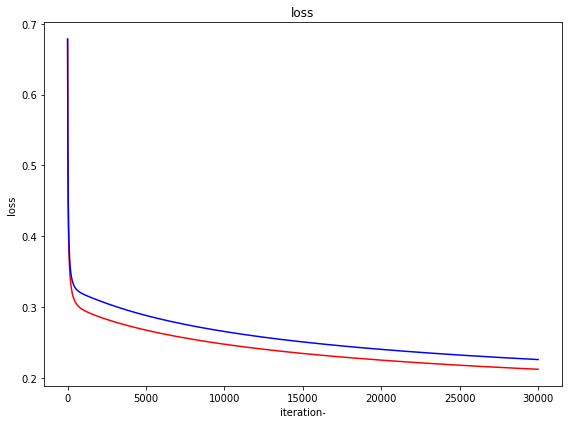

In [803]:
def plot_loss_curve(loss_iteration_train, loss_iteration_test):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure
    plt.title('loss')


    plt.plot(list(range(0,len(loss_iteration_train))), loss_iteration_train, '-', color = 'red', label = 'training')
    plt.plot(list(range(0,len(loss_iteration_test))), loss_iteration_test, '-', color = 'blue', label = 'test')

    plt.xlabel('iteration-')
    plt.ylabel('loss')

    plt.tight_layout()
    plt.show()

plot_loss_curve(loss_iteration_train, loss_iteration_test)

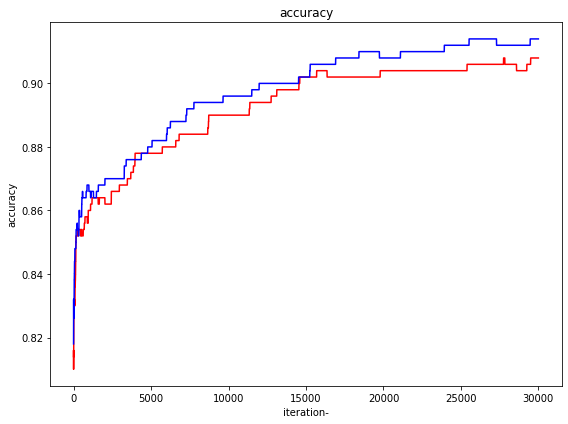

In [804]:
def plot_accuracy_curve(accuracy_iteration_train, accuracy_iteration_test):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure
    plt.title('accuracy')


    plt.plot(list(range(0,len(accuracy_iteration_train))), accuracy_iteration_train, '-', color = 'red', label = 'training')
    plt.plot(list(range(0,len(accuracy_iteration_test))), accuracy_iteration_test, '-', color = 'blue', label = 'test')

    plt.xlabel('iteration-')
    plt.ylabel('accuracy')

    plt.tight_layout()
    plt.show()
    
plot_accuracy_curve(accuracy_iteration_train, accuracy_iteration_test)

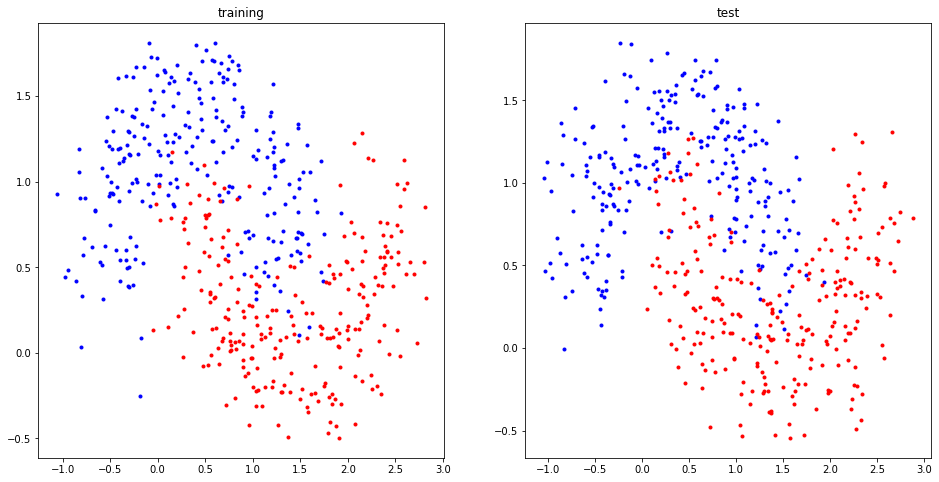

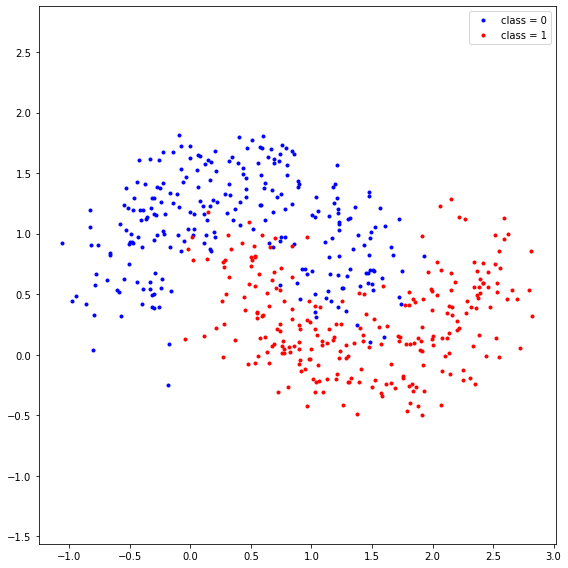

In [821]:
def plot_data(data_train, data_test):
    
    f = plt.figure(figsize=(16,8))   
    ax1 = f.add_subplot(1, 2, 1)
    ax2 = f.add_subplot(1, 2, 2)
    
    num_data = data_train.shape[0]

    red_x = []
    red_y = []
    blue_x = []
    blue_y = []
    
    for i in range(data_train.shape[0]):
        if(data_train[i,2] == 0):
            blue_x.append(data_train[i,0])
            blue_y.append(data_train[i,1])
        else:
            red_x.append(data_train[i,0])
            red_y.append(data_train[i,1])
    
    ax1.plot(blue_x, blue_y, '.', color = 'blue', label = "class = 0")
    ax1.plot(red_x, red_y, '.', color = 'red', label = "class = 1")
    ax1.set_title("training")
    
    num_data = data_test.shape[0]
    
    red_xx = []
    red_yy = []
    blue_xx = []
    blue_yy = []
    
    for i in range(data_test.shape[0]):
        if(data_test[i,2] == 0):
            blue_xx.append(data_test[i,0])
            blue_yy.append(data_test[i,1])
        else:
            red_xx.append(data_test[i,0])
            red_yy.append(data_test[i,1])
    
    ax2.plot(blue_xx, blue_yy, '.', color = 'blue', label = "class = 0")
    ax2.plot(red_xx, red_yy, '.', color = 'red', label = "class = 1")
    ax2.set_title("test")


    ax1.axis('equal')
    ax1.legend()
    ax1.tight_layout()
    ax1.show()
    
plot_data(data_train, data_test)
plot_data1(data_train)


In [806]:

def plot_model_parameter(theta_iteration):

    plt.figure(figsize=(8,6))   # USE THIS VALUE for the size of the figure
    #
    # 
    # fill up the function body
    #
    #

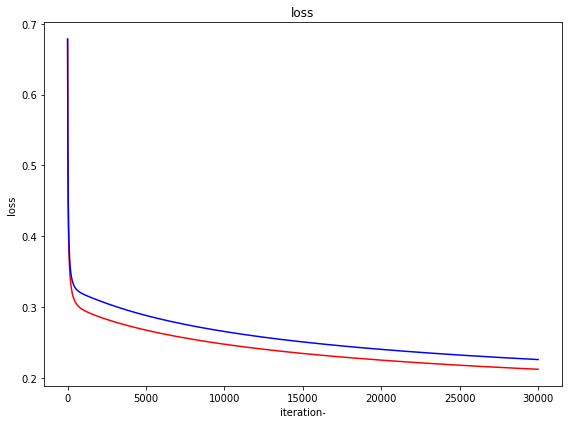

In [807]:
plot_loss_curve(loss_iteration_train, loss_iteration_test)

In [808]:
plot_model_parameter(theta_iteration)

<Figure size 576x432 with 0 Axes>

In [817]:
def plot_classifier(data, theta):

    plt.figure(figsize=(8,8)) # USE THIS VALUE for the size of the figure
    
    point_x = data[:,0]/data[:,0].max()
    point_y = data[:,1]/data[:,1].max()
    label   = data[:,2]
    
    x = np.linspace(-1, 1) 
    y = np.linspace(-1, 1)
    X,Y = np.meshgrid(x,y)
    Z = theta[0] + theta[1]*X + theta[2]*X**2 + theta[3]*X**3 + theta[4]*X**4 + theta[5]*X**5 + theta[6]*X**6 + theta[7]*X**7 + theta[8]*X**8 + theta[9]*X**9 + theta[10]*X**10 + theta[11]*X**11 + theta[12]*X**12 + theta[13]*X**13 + theta[14]*X**14+ theta[15]*Y
    plt.pcolormesh(X, Y, Z, cmap=plt.cm.get_cmap('RdBu_r'), vmin=-30, vmax=30)
    plt.colorbar()
    
    red_x = []
    red_y = []
    blue_x = []
    blue_y = []
    for i in range(point_x.shape[0]):
        if(label[i] == 0):
            blue_x.append(point_x[i])
            blue_y.append(point_y[i])
        else:
            red_x.append(point_x[i])
            red_y.append(point_y[i])
    
    plt.plot(blue_x, blue_y, '.', color = 'blue', label = "class = 0")
    plt.plot(red_x, red_y, '.', color = 'red', label = "class = 1")
    

    plt.contour(X,Y,Z,[0])    
    
    
    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

[  2.65888209   8.86685655 -24.38634332   1.19902053   8.79642144
  11.67370785  11.08641189   9.54778737   7.77705284   6.17092839
   4.82328711   3.74349226   2.89757437   2.24381365   1.74200496
  -8.55408808]


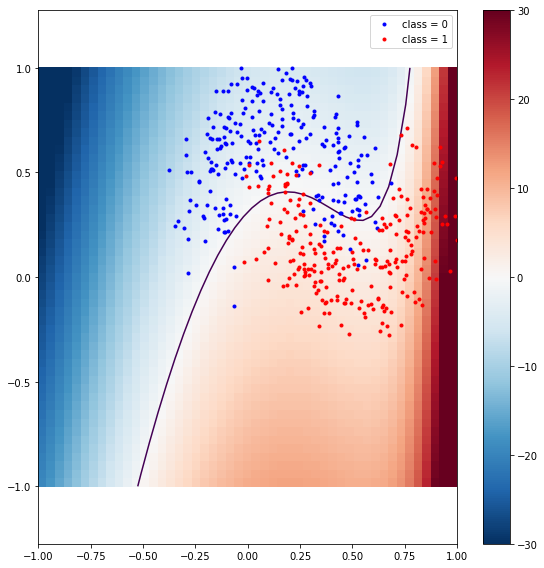

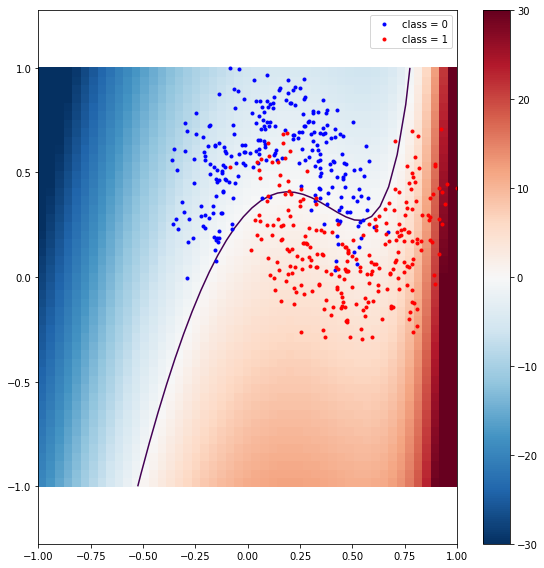

In [818]:
print(theta_optimal)
plot_classifier(data_train, theta_optimal)
plot_classifier(data_test, theta_optimal)

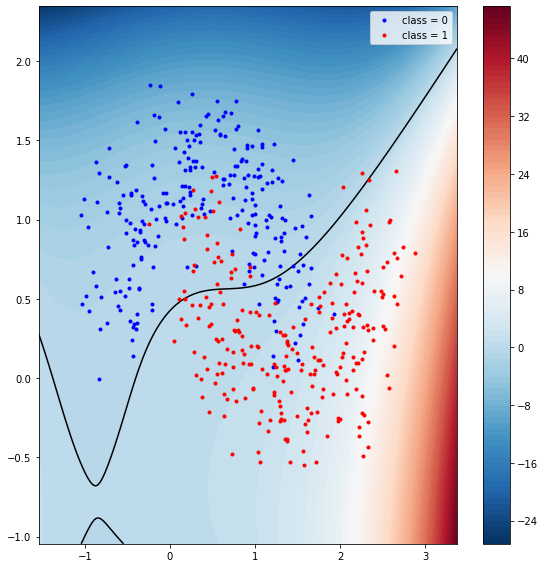

In [89]:
plot_classifier(data_test, theta_optimal)

***

# results

***

1. plot the input data (training on the left sub-figure and testing on the right sub-figure) in blue for class 0 and in red for class 1 from the file [assignment_10_data_train.csv] and [assignment_10_data_test.csv], respectively,

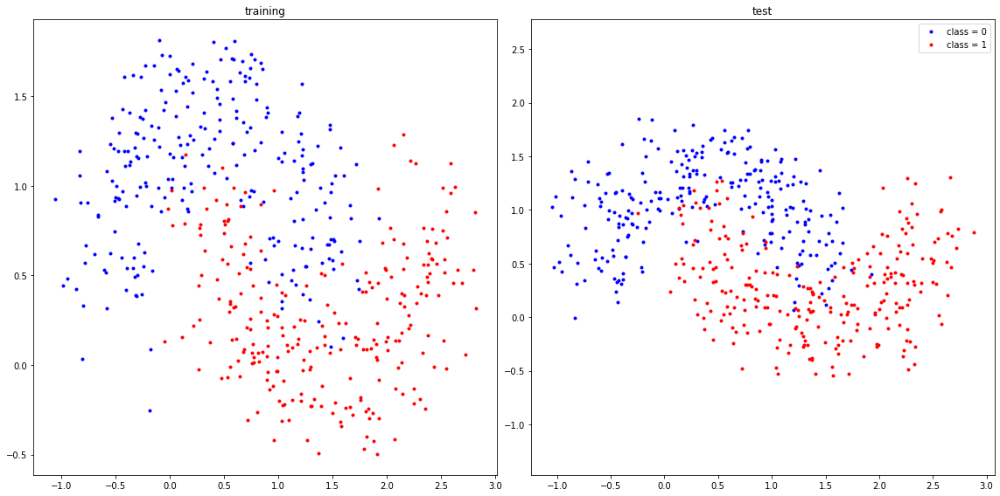

In [819]:
plot_data(data_train, data_test)

***

2. plot the values of the model parameters $\theta$ as curves over the gradient descent iterations using different colors

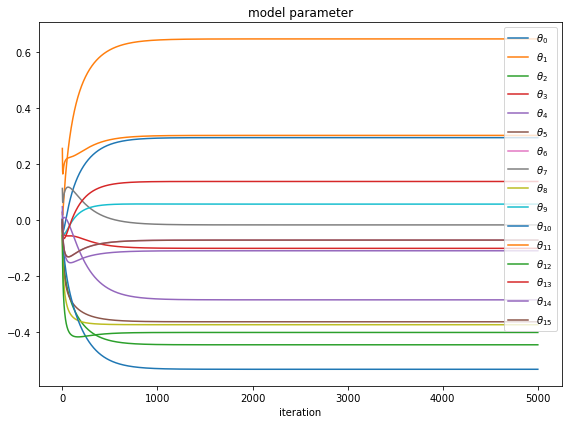

In [91]:
plot_model_parameter(theta_iteration)

***

3. plot the training loss in red curve and the testing loss in blue curve over the gradient descent iterations

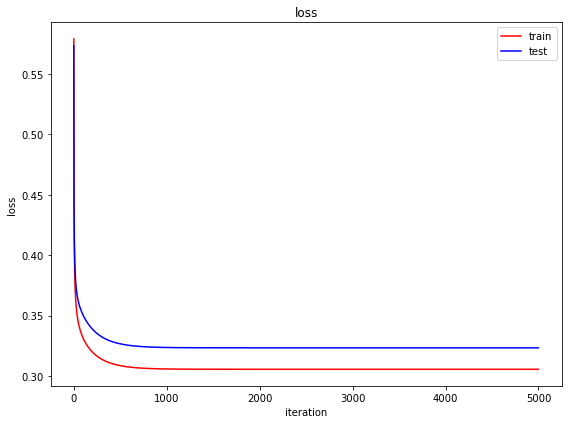

In [92]:
plot_loss_curve(loss_iteration_train, loss_iteration_test)

***

4. plot the training accuracy in red curve and the testing accuracy in blue curve over the gradient descent iterations

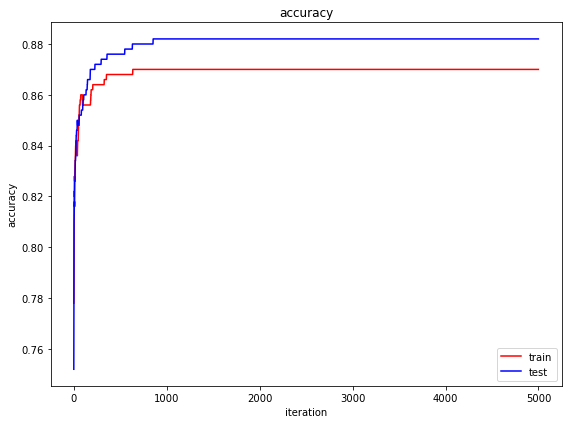

In [93]:
plot_accuracy_curve(accuracy_iteration_train, accuracy_iteration_test)

***

5. plot the classifier using the prediction values in the color coding scheme ranges from blue (class 0) to red (class 1) with the training data

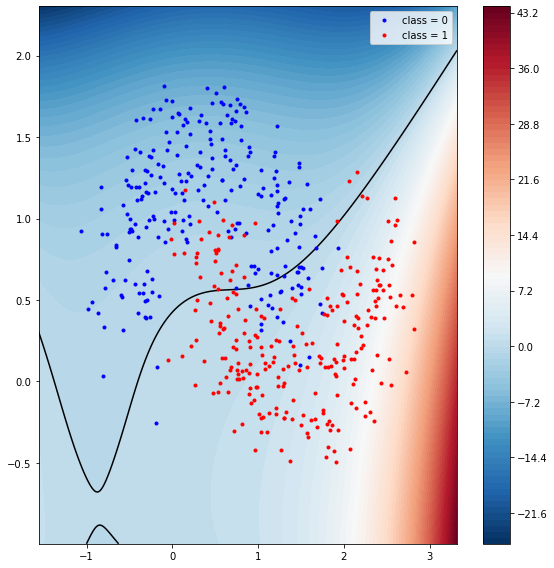

In [94]:
plot_classifier(data_train, theta_optimal)

***

6. plot the classifier using the prediction values in the color coding scheme ranges from blue (class 0) to red (class 1) with the testing data

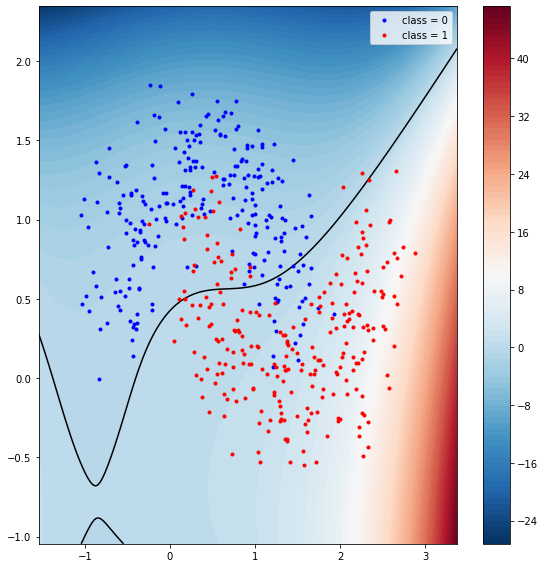

In [95]:
plot_classifier(data_test, theta_optimal)

***

7. print out the final training accuracy and the final testing accuracy in number with 5 decimal places (e.g. 0.98765)

In [96]:
print('accuract(train): {}'.format(accuracy_train))
print('accuracy(test) : {}'.format(accuracy_test))

accuract(train): 0.87
accuracy(test) : 0.882
